In [1]:
import sys
import numpy as np
from astropy.table import Table
import matplotlib.pyplot as plt
import copy
from astropy.io import ascii
import plot_util
import sncosmo
import scipy
import nestle,corner,pickle
from scipy.stats import rv_continuous,gaussian_kde,norm as normal
import astropy.cosmology as cosmo
import matplotlib.gridspec as gridspec


In [5]:
data=ascii.read('snRequiem.dat')
data['flux']=data['psf_flux']
models=ascii.read('lens_models.dat')
data['mag']=-2.5*np.log10(data['flux'])+data['zp']
data['magerr']=1.0857*data['fluxerr']/data['flux']
im0=data[data['id']==0]
im1=data[data['id']==1]
im2=data[data['id']==2]
models=models[models['MODEL']!='SN.4']
zp=23.9
cosmology=cosmo.FlatLambdaCDM(Om0=.3,H0=70)
#cosmology=cosmo.FlatLambdaCDM(Om0=.3,H0=74)
print(data['time'],data['flux'],data['fluxerr'],data['mag'],data['magerr'])
print(models)

  time  
--------
57588.03
57588.03
57588.03
57587.97
57587.97
57587.97  flux 
------
0.1748
2.3471
0.0877
1.1265
3.5715
0.6113 fluxerr
-------
 0.0157
  0.016
 0.0165
 0.0442
 0.0453
 0.0433        mag        
------------------
 25.79364642925404
22.973671016392306
26.542501016584897
23.770672009850376
22.517873363848597
 24.43436401052555        magerr       
--------------------
 0.09751424485125858
0.007401133313450642
  0.2042651083238313
 0.04259914780292943
  0.0137707433851323
 0.07690300997873385
MODEL image   MU   ERR_MU TDELAY
----- ----- ------ ------ ------
    C  SN.1  6.879  0.527    0.0
    C  SN.2  9.526  1.075   97.6
    C  SN.3  6.324  0.496  -82.7
    C  SN.4    0.8  0.117 7320.1
    D  SN.1  7.472  0.629    0.0
    D  SN.2  9.923  1.202   99.1
    D  SN.3  6.281  0.527  -85.3
    D  SN.4   0.86  0.137 6949.6
    E  SN.1 13.257  2.709    0.0
    E  SN.2  18.48  3.776   53.4
    E  SN.3  8.942  1.612  -50.2
    E  SN.4  1.137  0.294 5826.6
    F  SN.1 12.719  2.324 

In [6]:
class skewed_normal(rv_continuous):
    "Skewed Normal Distribution"
    def _pdf(self,x,mu,left_sigma,right_sigma):
        try:
            mu=list(mu)[0]
            left_sigma=list(left_sigma)[0]
            right_sigma=list(right_sigma)[0]
        except:
            pass

        left=normal(loc=mu,scale=left_sigma)
        right=normal(loc=mu,scale=right_sigma)
        pdf=np.piecewise(x,[x<mu,x>=mu],
                         [lambda y : scipy.stats.norm.pdf(
                            y, 
                            loc = mu, 
                            scale = left_sigma)/np.max(left.pdf(y)),
                          lambda y : scipy.stats.norm.pdf(
                                    y, 
                                    loc = mu, 
                                    scale = right_sigma)/np.max(right.pdf(y))])
        return(pdf/scipy.integrate.simps(pdf,x))

def _param_from_dist(dist):
    a=np.min(dist)-abs(np.min(dist))
    b=np.max(dist)+abs(np.max(dist))
    pdf=gaussian_kde(dist.T)#.pdf(np.arange(a,b,.001))
    return(pdf)#/scipy.integrate.simps(pdf))
def bounds_to_ppf(bounds):
    ppfs={}
    for key in bounds.keys():
        a,b=bounds[key]
        f = sncosmo.utils.Interp1D(0., 1., np.array([a, b]))
        ppfs[key]=f
    return ppfs

def prior_transform(nested_parameters):
        actual_parameters = np.empty(n_varied_parameter_dim, dtype=np.float)
        for i in range(n_varied_parameter_dim):
            actual_parameters[i] = ppfs[varied_param_names[i]](nested_parameters[i])
        return actual_parameters
class posterior(rv_continuous):
    "Skewed Normal Distribution"
    def _pdf(self,x,samples,weights):
        pdf,edges=np.histogram(samples,weights=weights,
                               bins=20,density=True)
        func=scipy.interpolate.interp1d([(edges[i]+edges[i+1])/2 for i in range(len(edges)-1)],
                                       pdf,fill_value=0,bounds_error=False)
        return(func(x))

    def _argcheck(self,*args):
        return True

def nice_corner(sample_result,labs=["Age Image 1","Age Image 2","Age Image 3", "c","$M_B$"]
                ,color='k'):
    fig = corner.corner(
            sample_result.samples,
            weights=sample_result.weights,
            labels=labs,
            quantiles=(0.16,.5, 0.84),
            bins = 30,\
           color=color,\
           show_titles=True,\
           title_fmt = '.2f',\
           smooth1d=False,\
           smooth=True,\
           fill_contours=True,\
           plot_contours =True,\
           plot_density=True,\
           use_mathtext=True,
           title_kwargs={"fontsize": 11},
           label_kwargs={'fontsize':16})
    for ax in fig.get_axes():
        ax.tick_params(axis='both',labelsize=14)
    return(fig,ax)

def calc_ev(res,nlive):
    logZnestle = res.logz                         # value of logZ
    infogainnestle = res.h                        # value of the information gain in nats
    logZerrnestle = np.sqrt(infogainnestle/nlive) # estimate of the statistcal uncertainty on logZ

    # output marginal likelihood
    print('Marginalised evidence is {} ± {}'.format(logZnestle, logZerrnestle))
    
def weighted_quantile(values, quantiles, sample_weight=None, 
                      values_sorted=False, old_style=False):
    """ Very close to numpy.percentile, but supports weights.
    NOTE: quantiles should be in [0, 1]!
    :param values: numpy.array with data
    :param quantiles: array-like with many quantiles needed
    :param sample_weight: array-like of the same length as `array`
    :param values_sorted: bool, if True, then will avoid sorting of
        initial array
    :param old_style: if True, will correct output to be consistent
        with numpy.percentile.
    :return: numpy.array with computed quantiles.
    """
    values = np.array(values)
    quantiles = np.array(quantiles)
    if sample_weight is None:
        sample_weight = np.ones(len(values))
    sample_weight = np.array(sample_weight)
    assert np.all(quantiles >= 0) and np.all(quantiles <= 1), \
        'quantiles should be in [0, 1]'

    if not values_sorted:
        sorter = np.argsort(values)
        values = values[sorter]
        sample_weight = sample_weight[sorter]

    weighted_quantiles = np.cumsum(sample_weight) - 0.5 * sample_weight
    if old_style:
        # To be convenient with numpy.percentile
        weighted_quantiles -= weighted_quantiles[0]
        weighted_quantiles /= weighted_quantiles[-1]
    else:
        weighted_quantiles /= np.sum(sample_weight)
    return np.interp(quantiles, weighted_quantiles, values)
parameter_bounds={'c':(-.3,.5)}

c_lims=[-0.300 , 0.500]
c_peak=[-0.054]
c_sigmas=[0.043 , 0.101]     # bifurcated sigmas
dist_c = skewed_normal('c',a=c_lims[0],b=c_lims[1])
logc_pdf=scipy.interpolate.interp1d(np.linspace(-0.300 , 0.500,1000),
                np.log(dist_c._pdf(np.linspace(-0.300 , 0.500,1000),
                c_peak,c_sigmas[0],c_sigmas[1])),fill_value=-np.inf,bounds_error=False)



logMb_prior=lambda x:np.log(scipy.stats.norm.pdf(
                x, 
                loc = -19.365, 
                scale = .47))

In [7]:
#Define the required functions for the mcmc tools:

dust = sncosmo.CCM89Dust()
model=sncosmo.Model('salt2-extended',effects=[dust],
                       effect_names=['mw'],
                       effect_frames=['obs'])
model.set(**{'z':1.9459,'mwebv':.014,'t0':0,'x1':0})

#t0,t1,t2 are age of image id=0,1,2
varied_param_names = ['t0','t1','t2','c','x1']

#full range bounds first, then tightened
#parameter_bounds={'c':(-.3,.5),'t0':(-45,time[-1]),
#                  't1':(-45,time[-1]),'t2':(-45,time[-1]),'Mb':(-17,-20.8)}
parameter_bounds={'c':(-1,1),'t2':(40,150),'x1':(-2,2),
                  't1':(-40,100),'t0':(40,150),'Mb':(-18,-22)}

log_parameter_priors={'c':logc_pdf,'Mb':logMb_prior}

n_varied_parameter_dim = len(varied_param_names) 
n_live_points=100
ppfs=bounds_to_ppf(parameter_bounds)


image_colors=np.array([im['mag'][np.where(im['band']=='f105w')[0][0]]-\
             im['mag'][np.where(im['band']=='f160w')[0][0]] for im in [im0,im1,im2]])
image_color_errs=np.array([np.sqrt(np.sum(im['magerr']**2)) for im in [im0,im1,im2]])
print(image_colors,image_color_errs)
sys.exit()
#print(list(zip(image_colors,image_color_errs)))
#sys.exit()
def age_priors(parameters):
    if np.all([-45<x<150 for x in parameters]):
        return 0.0
    else:
        return -np.inf
def c_uniform(c):
    if -.3<c<.5:
        return 0.0
    else:
        return -np.inf
    
def chisq_likelihood(parameters): 
    model.set(c=parameters[-2],x1=parameters[-1])
    chisq=0
    model_observations = model.color('F105W','F160W','ab',parameters[:3])
    chisq+=np.sum((image_colors-model_observations)**2/(image_color_errs**2))
    return chisq
def lnprob(parameters):
    priorc=0#c_uniform(parameters[-1]) #for uniform priors
    #priorc=log_parameter_priors['c'](parameters[-1]) #for prior based on existing distributions
    age_p=age_priors(parameters[:3]) #uniform priors on age based on bounds

    if not np.isfinite(priorc) or not np.isfinite(age_p):
        return -np.inf
    
    chisq=chisq_likelihood(parameters)
    if not np.isfinite(chisq):
        return -np.inf
    return(age_p+priorc-.5*chisq)

csample_result = nestle.sample(
    lnprob, 
    prior_transform, 
    n_varied_parameter_dim,
    npoints=n_live_points, 
    maxiter=None,
    maxcall=None
    )

nice_corner(csample_result,labs=["Age Image 1","Age Image 2","Age Image 3", "c","$x_1$"])
plt.savefig('corner_color_curve_fit_with_c_prior.pdf',format='pdf',overwrite=True)
calc_ev(csample_result,n_live_points)
#pickle.dump(csample_result,open('colorcurve_constraint.pkl','wb'))
plt.show()


[2.02297442 0.45579765 2.10813701] [0.10641295 0.01563362 0.21826202]


SystemExit: 

/Users/jpierel/miniconda3/envs/basic/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3425: UserWarning: To exit: use 'exit', 'quit', or Ctrl-D.
  warn("To exit: use 'exit', 'quit', or Ctrl-D.", stacklevel=1)


In [5]:
mle=csample_result.samples[csample_result.weights.argmax(),:]
print(mle)

[ 1.06979411e+02 -1.66698916e+01  8.66406342e+01  8.32969629e-02
 -1.65606510e+00]


63.16048237718795 0.0 -3.111597983579173
677.324636576528 0.0 0.0367657063384078
6123.305410568237 0.0 -1.7999177668659687
214.939846529555 0.0 1.580072567800191
31.49748149094097 0.0 1.4807506009551814
6.642299098932974 0.0 1.7049255657493565
2648.892860305943 0.0 -0.8750321922355865
6056.986912739501 0.0 -3.777513501145636
248.44456789737706 0.0 -0.15224264017849806
1847.99505971496 0.0 -1.7736059195064198
621.0168889458654 0.0 -0.6593728054282948
2358.131601073435 0.0 1.650416608444196
296.2482522488905 0.0 -0.6958360882010421
335.6723915456352 0.0 1.650505188156825
949.9452226954168 0.0 1.6607423159213934
293.9301605473695 0.0 -1.3060956654421505
8439.682400195145 0.0 1.441811416821224
1885.555192541139 0.0 -3.209914565592015
31.42650379907771 0.0 1.6099418150740301
nan 0.0 1.2975675448793478
414.8955317981798 0.0 -0.338397805817873
nan 0.0 -1.0164764251133889
818.807254595065 0.0 -1.654424716050951
7687.137672533712 0.0 1.4412294963912642
171.42043881656005 0.0 1.6250689985738878


/Users/jpierel/miniconda3/envs/basic/lib/python3.8/site-packages/sncosmo/models.py:188: RuntimeWarning: divide by zero encountered in log10
  result[i] = -2.5 * np.log10(f / zpf)
/Users/jpierel/miniconda3/envs/basic/lib/python3.8/site-packages/sncosmo/models.py:1529: RuntimeWarning: invalid value encountered in subtract
  return (self.bandmag(band1, magsys, time) -


476.64539985210234 0.0 -1.719238608765893
8.571448367766461 0.0 1.4011163747598128
72.76719318366197 0.0 1.3188251436691403
255.1070457145146 0.0 0.1352417904231882
679.6441058353092 0.0 -0.028798431221166793
7227.351394878124 0.0 1.5345546301369564
nan 0.0 1.7084939587646848
6490.453690010666 0.0 -2.612849039876165
10472.704393862457 0.0 0.6648601934250659
7874.959271745765 0.0 0.38604444178591196
2023.8202838217235 0.0 1.710384463776084
nan 0.0 -0.004862473309809658
4947.250254923074 0.0 0.9849865256894034
989.0029494371379 0.0 0.4986114306907907
nan 0.0 -1.1936732673319925
1.684623559650675 0.0 1.0448617949643082
2781.2396762676544 0.0 0.17836539037165935
1094.7064930811268 0.0 -2.0932313395751945
3059.2651654310175 0.0 1.0093200107348914
nan 0.0 0.10656134573913292
13507.06511365951 0.0 -0.02502663138008011
5148.491948176675 0.0 -0.004210466331107455
1018.863267468269 0.0 0.6596204473584827
10782.967532735605 0.0 -0.7038180453461341
7799.733487800659 0.0 1.22981742709965
8356.78665

2970.8271614032465 0.0 -0.9259116315993927
14235.380025125618 0.0 -1.3178990180986474
81.6284224896054 0.0 0.12285220586429314
341.06089515493727 0.0 -1.1621111204678616
10441.277121735033 0.0 1.467370552503068
73.46390488447605 0.0 1.1200427770558856
363.9839393447387 0.0 1.7007937158818607
6.975682699370951 0.0 1.3049357009177853
59.2482103724042 0.0 1.2729625646533844
48.059655018911464 0.0 0.021050691042003137
12012.071657531997 0.0 0.7078949305586523
479.83694251089634 0.0 0.4331931018076573
242.19386596435672 0.0 -0.00473116298240563
9632.191168939753 0.0 1.1070055886930903
299.79108328992186 0.0 0.09869042702469252
3316.963378931082 0.0 -0.21495757612731717
664.4574883662516 0.0 -3.2365458058833063
6453.516906316911 0.0 1.572663623648846
nan 0.0 0.2946975081310105
7830.300830824114 0.0 1.0545857082913748
539.0218742776776 0.0 0.9422180824616143
7703.536355291574 0.0 1.0271945376705378
469.3924289657275 0.0 0.31280009328730185
406.4456024955784 0.0 1.6966928079107009
217.09697386

614.5489299604421 0.0 1.1153925771282274
3267.2886290269894 0.0 -1.3196892872175134
1518.4746307221508 0.0 1.6341993883690948
9975.927651426096 0.0 1.630555987380262
510.9033560287528 0.0 -2.5036046041908144
7633.12931559969 0.0 1.0546516483723412
124.34161591048672 0.0 1.5358783308521262
76.428385222587 0.0 -0.4637120301426619
42.54855933901746 0.0 0.7579675751824438
3724.4280710711055 0.0 1.6137110975525513
2641.903073781668 0.0 -1.7178115654681652
4.4346140355723005 0.0 1.6419041498801457
6976.095067541769 0.0 -1.3167226757938995
928.2003044298963 0.0 1.07341784805552
36.28551990486622 0.0 1.7092278046778886
167.69501358805059 0.0 -1.1079257496094512
3415.7223888161257 0.0 -2.7968786330622923
6405.956681598312 0.0 -3.3077689747752146
1059.8952724924968 0.0 0.400864150614073
106.72056381998743 0.0 1.7091437447197322
744.4787550208115 0.0 1.1293684414149607
nan 0.0 0.20136569048541125
243.95463750720614 0.0 1.7091172386457592
73.53423489392034 0.0 1.2624000476051556
5773.866261985041 

8816.66891086403 0.0 1.2910845269824338
640.9221353472705 0.0 0.12620781367188705
nan 0.0 1.5369819432132348
605.7833444888745 0.0 0.7752627762619532
386.50443966874445 0.0 -1.4894825413861563
3305.2895667426847 0.0 1.0340537630344806


/Users/jpierel/miniconda3/envs/basic/lib/python3.8/site-packages/nestle.py:905: RuntimeWarning: invalid value encountered in double_scalars
  h = (math.exp(logwt - logz_new) * active_logl[worst] +


2024.8646819821358 0.0 0.044342622991495655
136.62140218257784 0.0 0.03389586842419906
1145.0583020727793 0.0 1.6838370196431123
612.8135021506022 0.0 1.646875200009242
8312.33721746394 0.0 1.6740977623865192
777.5111067901498 0.0 1.316360720115481
7854.601879460648 0.0 1.599830321894314
698.6624351735508 0.0 1.0402612955669484
7847.652083938378 0.0 0.707911829501001
1462.7370812212612 0.0 0.4454963067582027
3572.2868049207846 0.0 1.5402620319071512
59.11808897072614 0.0 1.7055055540232693
25.187991608730208 0.0 1.402654530394874
942.7644299204504 0.0 1.0946189912065314
8848.098319498906 0.0 1.6611792534596386
1940.5371646999197 0.0 -3.559268886915271
726.938554915288 0.0 0.7880283946112571
1531.7289829840452 0.0 0.5123742656184813
6081.588175395889 0.0 1.421756628261725
668.4486060361684 0.0 0.9000115391175254
138.98633312148857 0.0 0.18210350285726173
16.97903062307976 0.0 1.2815042949632651
2727.3161925012064 0.0 -1.0306589407372377
7903.248120818016 0.0 1.4965457603882628
2164.0445

7263.206765776001 0.0 -0.2701942861556782
61.16961518064878 0.0 1.2819807115986308
714.2789198868084 0.0 1.0775470985873803
1267.3112016983819 0.0 0.9955428949806966
7248.727166174138 0.0 -0.5146485766259115
2049.7151129772774 0.0 1.6235070942896248
4636.665002414103 0.0 1.0982258026666922
nan 0.0 0.8465805656802889
520.9076630184974 0.0 1.594774072623198
7955.816092819028 0.0 1.6194061070592425
12477.04358611883 0.0 0.29965022885697934
597.9681610713724 0.0 1.4184943820738247
2789.7760004867946 0.0 0.7178902634934362
2010.822951416129 0.0 -0.03820485472132395
1414.9087507299403 0.0 1.7097688490428382
3593.0227476051755 0.0 1.5082302528756777
2007.7063479022077 0.0 -4.007792736745778
10.424315297923375 0.0 1.397232295067321
8870.49653785739 0.0 1.7106510317596022
4780.9416581365085 0.0 1.483001332594567
1059.5472808525096 0.0 1.661424906497355
1106.0511653665965 0.0 1.3083575310599713
11196.707819372152 0.0 1.248462338867026
nan 0.0 1.7067170165547532
9479.499853045416 0.0 1.6648870813

8563.40070873277 0.0 1.5358406757661172
2965.6647311360457 0.0 -3.128146142877832
660.8325821777296 0.0 -1.3633905842172573
827.5717895558059 0.0 1.2508438471803875
38.74260411814642 0.0 0.28703342402473275
180.43692201053625 0.0 1.573117717093688
94.62370029209384 0.0 1.4065497966527685
10576.099152827464 0.0 1.3041917074860483
4925.749005149468 0.0 1.3880454354837033
2586.6358027139895 0.0 1.4319071151061513
561.0622967361498 0.0 -3.723173252969467
nan 0.0 0.8272272639663673
4151.543912356774 0.0 1.6907338824917117
125.4121845445852 0.0 0.6224642275171662
19.734770522907347 0.0 1.0289367548182933
135.4340171010733 0.0 -0.7667529368953717
2077.736346296 0.0 0.7380669703543348
37.34668364423709 0.0 1.0009596839265584
70.35090231310652 0.0 -2.7499372561844644
nan 0.0 -1.7750177579670166
812.7062485708818 0.0 -1.191910417484291
1823.5113596483393 0.0 0.40944217899588453
3720.5328667611243 0.0 0.28153633893119434
45.93101491012023 0.0 1.711492500863574
3135.369552846225 0.0 0.618919987320

9287.636014737562 0.0 1.1867323033120416
7465.513802253393 0.0 0.38763393570051624
5404.535159738379 0.0 1.5974353428740993
8923.631071161482 0.0 0.7758581198453771
4601.786404195369 0.0 1.5223998811103239
161.62413716284607 0.0 -1.5480940321580556
1242.3978806909674 0.0 -0.3337542116390829
6832.515866909368 0.0 -0.42046024948607486
nan 0.0 0.6508615455091149
3251.103104571541 0.0 1.421021651691443
10216.856149682886 0.0 1.5538190041777973
3123.9966827298936 0.0 0.7297587892966583
4759.18944500201 0.0 -0.05550502332822523
4592.992490278355 0.0 -3.0143197960229564
95.31982026969378 0.0 1.3713931871725105
6547.648582999856 0.0 -0.4511362649910422
8802.965649380101 0.0 0.7376610971784505
617.253788793024 0.0 -3.463433633212189
109.94700461226684 0.0 1.5047517059267017
195.7578466950393 0.0 1.6971559227034974
95.07219546902316 0.0 1.3766877355513971
nan 0.0 -4.035999513048681
1073.8084902536725 0.0 -1.9139826480398592
30.820625804986086 0.0 1.5289074493882038
25.506246831730326 0.0 1.08571

820.4598472202842 0.0 -3.4764473445179074
1198.9720122111553 0.0 -1.2304684099310776
776.5700692643553 0.0 1.5714831462992098
786.7283424379979 0.0 0.7944490878642454
1.8283568049359964 0.0 1.0686225483711478
325.97390222090564 0.0 1.6881393580757451
4094.952895287435 0.0 1.6275158846891105
1480.066751592767 0.0 -0.6400980022317451
3494.2230134564093 0.0 0.01705118485633814
38.53511080374854 0.0 1.3812484132282685
4612.0012109554555 0.0 0.2957718503708668
580.917562585774 0.0 -1.228501683321664
102.02727472869923 0.0 -0.15826526191957266
645.3756339016182 0.0 1.4770554370505362
958.771493173832 0.0 -0.048059893713836704
35.818980357856 0.0 0.8627965070418953
235.99617227093003 0.0 -1.435089949868985
260.2974309289865 0.0 -1.3860947763610056
115.05058711255347 0.0 1.403697748699441
81.2376050775857 0.0 0.49531922358085506
1143.524639695977 0.0 -0.27050931527340566
663.6460262485441 0.0 -1.390600516592895
576.0026103626551 0.0 -0.16024354643354355
1252.5544680806784 0.0 -2.52655563468043

354.57373436361655 0.0 -1.177915952583714
11.535277807308345 0.0 0.21180540769948497
442.9266654656563 0.0 0.9497966922626627
4.5771325040123125 0.0 0.4427888954592437
1036.8321158349577 0.0 0.7511203253963705
40.924757424074876 0.0 0.7007587487783634
1168.0322413615045 0.0 -2.7417339602412376
144.6858709193295 0.0 0.5676428572891602
nan 0.0 -1.8543326475678994
1590.8325271191147 0.0 1.1309569883792239
594.0753523700945 0.0 -3.2485268419651563
1184.7328520731087 0.0 -0.3994007708710347
918.4506532429108 0.0 0.6373122562502928
4960.515177377937 0.0 -0.006011693327486354
181.26020112445042 0.0 1.6258978412612677
5.999940335568171 0.0 1.1466116200628549
790.7671144600606 0.0 -1.3975741725489748
1953.7816191328852 0.0 1.6387585452333633
64.13235631320546 0.0 0.6591000427960272
1004.1517613115283 0.0 0.5511981809009516
4543.622185839016 0.0 1.1448407482301386
261.5321634313074 0.0 -0.15426674489162795
83.45417035851656 0.0 -2.1406388401602814
95.43171231698396 0.0 -0.023534563757645142
92.1

878.6040797137606 0.0 -0.860240658446399
887.4606533736486 0.0 0.19307822886892978
36.68436944398452 0.0 -0.041738824583073195
158.68961821165107 0.0 1.6912293231529338
840.0654734937336 0.0 -3.1804070184338524
694.4890992833517 0.0 -3.8265772701180616
554.7961591266069 0.0 -2.732662010058749
291.9409394371082 0.0 -0.4911095054577548
nan 0.0 -0.6510275268629584
1802.623803651227 0.0 1.6764897150428244
4412.508898093721 0.0 0.8384360912238222
144.15507971926445 0.0 1.6900770746216405
3906.1141743589046 0.0 1.4400351065597348
683.9598233530039 0.0 0.7768978167882423
3541.4424253795 0.0 1.4069277465817527
88.43698306375993 0.0 1.0290795506934913
3.4476001323573033 0.0 1.59151123754171
244.73718243562698 0.0 1.353032639792328
2028.2394063781255 0.0 1.0528733904027647
471.63454726539527 0.0 1.71151408538427
25.475564870601964 0.0 1.6100090551724429
1521.5537862234999 0.0 -1.0699419192279866
208.23666441435404 0.0 -1.9704528692622731
8.213289731550814 0.0 1.0829774300448203
540.0705657208734

4291.36154339931 0.0 1.4078987947247257
nan 0.0 1.0105829560308273
361.4907679514583 0.0 -2.313806690430163
207.14990327932227 0.0 1.6964561148716242
3963.7017584632667 0.0 0.8384707055095736
800.2864440280507 0.0 1.3586625529490104
1354.9334895967918 0.0 1.2930869785198327
1577.7580395971006 0.0 1.4067287330402483
1325.102096212361 0.0 -0.9434118519469642
1439.3368741880442 0.0 1.5240279487677453
nan 0.0 -3.3098818837486093
2841.5455067148196 0.0 1.6512777050579655
67.33508231993467 0.0 1.4813290170367597
4851.265480065773 0.0 0.630167509203501
nan 0.0 1.3093491343876105
1140.5254936284268 0.0 -1.2964342743138106
334.10269564331776 0.0 0.17375233608672586
331.5392229797461 0.0 1.7024712582336199
4007.451109326093 0.0 -0.57886488954716
379.9427614118699 0.0 1.006249746368497
278.0246638012434 0.0 -0.284460846836326
386.77020025010864 0.0 1.443728873458732
56.02424813582596 0.0 1.6067139884228836
1801.2495978585287 0.0 1.6057062635032546
78.37252567873496 0.0 0.8787924335022446
1815.787

338.14947542745847 0.0 1.1724236184942447
162.62844627872235 0.0 -3.3257891132215938
948.5633293005696 0.0 1.5262305204941047
95.37559090406852 0.0 0.9133202857170253
4915.257010391 0.0 1.3423375107659918
76.57532713778741 0.0 1.6595974300387968
nan 0.0 1.4276680238107375
223.5203841391697 0.0 1.6329635303692316
198.45111214341006 0.0 1.6749386707843044
195.0925793930527 0.0 -0.7771581807359914
3318.1971342644392 0.0 1.325837149385509
180.86408532419273 0.0 1.6680258753680492
nan 0.0 1.5830688156667156
47.21516374692041 0.0 1.620866244864629
369.1759465897622 0.0 1.6896114418018717
1264.541904828675 0.0 -0.48452838584285474
1906.4083244621422 0.0 0.5276556908336265
2966.9137221231977 0.0 0.6648202592338027
49.77237994195796 0.0 1.4672334170125403
114.77038425215156 0.0 1.659081148656324
5.164593328142074 0.0 1.0014589364121012
122.99928740411573 0.0 0.6348691894545763
222.5214909706665 0.0 -1.320678569583733
187.09656547616135 0.0 -0.5756419567740926
1566.9265051276946 0.0 0.2319604355

1454.3914875707808 0.0 -1.906197557760533
70.01009771164225 0.0 -0.9010099923729996
1070.0700962579085 0.0 -0.34324371158917316
1100.1587021552666 0.0 -1.352024667412937
370.4861956846381 0.0 1.686832351922934
273.34277865035483 0.0 0.7550044053718392
1295.598251618264 0.0 -0.8763318428616054
683.4972328899825 0.0 -0.6134837031846859
157.6686969028152 0.0 0.9537428661086638
386.92410114879056 0.0 -0.6241584070853241
663.4618080515335 0.0 0.6566150662173054
3734.5221243665846 0.0 1.504353606840101
398.1125276001486 0.0 -0.054794394052796055
362.9187320946209 0.0 1.7095413568563642
717.5333426655552 0.0 -0.39363084420130046
131.60066618175077 0.0 -0.5281441996772325
1855.6735149712094 0.0 -3.0076129438761487
3433.46574617223 0.0 -1.5881296398099694
nan 0.0 0.7003935956621868
347.1149071011735 0.0 1.6552931173474374
233.46664579993754 0.0 -3.2857713895396987
215.68347369819108 0.0 1.6625543066008248
9.278590880312308 0.0 1.4351547916259169
74.2942864256075 0.0 1.443396992463372
19.9956829

101.33874758085717 0.0 -3.8987666150415152
2117.57918184513 0.0 1.2998951336562876
1784.4114441517058 0.0 -3.139345330589089
22.379532437272697 0.0 1.6757344322919907
227.91865171684668 0.0 -1.297420714854479
137.47582035688455 0.0 1.6673530280893898
4262.164318635267 0.0 1.7002351863701
185.251939458641 0.0 -2.745375001026972
414.29645120368025 0.0 0.9745720655221953
323.5946096712009 0.0 0.674868529461927
229.54916454566148 0.0 1.6597036590956964
2.3440829202125477 0.0 1.0963721102994848
2.9101602948035348 0.0 1.1889062266788
214.8708949514118 0.0 -0.3889739618558512
871.5286786092648 0.0 1.1412817520217247
70.493631439565 0.0 1.4657241278974131
57.48650509056627 0.0 -2.7285145970059785
1438.9045021190232 0.0 0.359573611320951
111.65154934995779 0.0 1.5518555557566043
316.6641295207255 0.0 -1.418254877243544
8.23301588589062 0.0 1.1170528528133952
3235.2831460724856 0.0 1.4438303173647395
93.68801414287628 0.0 -4.000427163784165
2452.6494381323214 0.0 -0.7887786375115104
33.676026276

1615.0533667919872 0.0 -0.2121955955689807
3120.411235549553 0.0 1.645509349946742
nan 0.0 0.25443936270208234
18.551048181902317 0.0 0.4259837938689629
22.089515874953804 0.0 -2.807121466370153
13.706113276526583 0.0 0.6724241014665948
3.5102899801702407 0.0 0.6939399671675863
862.5594324603584 0.0 0.20482829875202702
14.233025961783616 0.0 0.4133902453895116
1639.1748238954694 0.0 1.6714492062404136
722.4903763867059 0.0 0.36135274949727697
219.51612068953656 0.0 1.6124116503887627
126.14344136030093 0.0 0.21234672817816955
497.3013840100348 0.0 1.6561697630739738
42.354388481713116 0.0 1.5745299626138891
3665.7073755917936 0.0 1.6523567006263538
382.11696777016937 0.0 -0.14647332787274886
4167.860666762819 0.0 0.05003960817383143
104.51439152704707 0.0 0.9843888771106496
1289.0011300145718 0.0 -2.564654861654013
57.72699840877574 0.0 -0.6597788214536853
356.70120191813646 0.0 0.1675058083086349
242.04185010331597 0.0 -1.5148453340333792
160.6493852492955 0.0 0.3863960292590864
295.4

78.90627666542805 0.0 -0.371431448712752
13.271998838426562 0.0 0.512153018287327
299.3042754211848 0.0 0.8838259605194762
5.010743368266878 0.0 1.5067519900191146
988.054205315048 0.0 -1.569468595265012
80.46851136073128 0.0 1.678638357995178
901.8289669252489 0.0 0.4432012514608398
1437.31424042112 0.0 -0.011410315141004171
1051.328873420278 0.0 1.683488222998834
1325.1327919328958 0.0 0.6666227139084054
119.67440141272664 0.0 1.5636875648030282
58.606073805348544 0.0 1.5230896585435605
2338.9215532307257 0.0 0.5092422082418553
902.0813182574395 0.0 -1.00675629136125
179.30546218684813 0.0 -3.0421284433362388
1089.63136783743 0.0 1.7117079528709076
384.94329434233333 0.0 1.526701064069739
70.48507771386105 0.0 0.07941143803203031
893.2106855474109 0.0 -1.0510748918177517
nan 0.0 0.8984539761855971
nan 0.0 -0.1560080834832729
206.25635558146223 0.0 1.702972271963198
570.8687017729491 0.0 -1.1077329677393224
33.69496499169573 0.0 1.6820291004589487
112.08107257333272 0.0 -0.66670008402

170.03788714510068 0.0 1.6531867117701478
2.857380295788971 0.0 0.5910671106287061
112.52581371961604 0.0 -0.20210219074975824
59.52683664955268 0.0 1.6773279439808344
1357.840459134788 0.0 -3.3851259654865435
223.65827104671882 0.0 -0.7059972055659965
219.7164916941005 0.0 1.6370331860406178
1580.3309413030363 0.0 1.131469741536104
2184.2747310229142 0.0 0.7387008318112379
1270.0780269406284 0.0 1.168405223423939
40.69310500427626 0.0 1.0177076317472584
378.32479985566704 0.0 1.7024452536927088
409.52019694631747 0.0 1.642834855486098
49.71607500807564 0.0 1.506024142009981
226.4677369658615 0.0 1.6265692855281437
39.95867156341917 0.0 1.6633348549969778
1061.8813303679215 0.0 -1.2797738111586874
44.721171466649984 0.0 1.7081447802721907
881.9280953722953 0.0 1.0923742396170306
3511.0133695622667 0.0 0.007475270972765909
nan 0.0 -1.36372048107821
366.3096258535951 0.0 -2.79944383951915
684.085726847931 0.0 1.2789409064875756
2062.3508560493074 0.0 0.8625628986758914
611.3794613289338 

56.77247635678866 0.0 1.217214559991836
1422.2554130388144 0.0 1.5323861258287048
544.741798756706 0.0 1.6398163495434528
502.0195096773469 0.0 -2.0270254072243366
505.5243607701417 0.0 1.3663515867678802
119.74811234697376 0.0 0.8872095543295724
132.35172868119125 0.0 -0.8063300658871898
672.8796977351161 0.0 0.9896993243345173
227.3697190569445 0.0 -0.06738834228741397
nan 0.0 1.4647866126740179
955.5656519474702 0.0 -0.3088892888798412
374.8603895965027 0.0 1.7028975853729014
31.30439230223751 0.0 -0.39713914542083745
337.9819554942368 0.0 1.6975625044443348
1423.7211245886424 0.0 0.6822296731615912
2976.400577390808 0.0 -3.6236780045928265
390.0610825045797 0.0 -0.8540350753865329
450.16418369975946 0.0 1.703168761797757
nan 0.0 -0.8667864793733047
2565.15189492763 0.0 1.6987446869826073
93.19792773595314 0.0 1.6838254112448083
291.9351099480452 0.0 -2.5228224616935155
248.22730206624314 0.0 -0.40924876413496913
111.0145897053865 0.0 -3.7194136544574117
61.27899191831585 0.0 0.3941

3.7669615230872844 0.0 0.40619886052313464
119.17851399582233 0.0 1.3127268509293517
355.01899816916523 0.0 -0.09581187342348978
41.24806808608889 0.0 0.34662793810076287
962.0497090055579 0.0 -0.07145027150202664
230.03158370729295 0.0 1.5819746887889063
180.19043651441166 0.0 -0.3985391460387724
1728.2489556439225 0.0 1.516369083748458
315.36501518857824 0.0 1.6863858309319406
163.19946350868054 0.0 -0.6653863701190063
501.22984308827273 0.0 0.12339396875806914
558.4614459244419 0.0 0.20177000622097724
1529.9436883282658 0.0 0.16192101115459287
1325.4736997804093 0.0 -2.2258816460972963
170.5717403481231 0.0 1.573026222336132
49.581942096272485 0.0 0.4388576084866057
654.8791035749832 0.0 1.2334791535245055
56.123898149960276 0.0 1.2131809192644112
94.34045435755115 0.0 1.4613759922596992
2666.6940187294963 0.0 -0.029983681147956538
17.43398975805555 0.0 1.6835919324429907
nan 0.0 -0.33473730036777466
36.73385060073356 0.0 1.709676553368118
349.4113507974025 0.0 1.5011566549448156
10

184.718824122518 0.0 -1.0562887814950606
2237.4487106537854 0.0 1.3603191245824073
1357.99277358201 0.0 -2.156554660940077
8.014285842856477 0.0 1.5144357461903062
136.5648153356257 0.0 -0.9343348486191058
464.6929718840946 0.0 0.39681278976322526
2.6979276851963987 0.0 0.8902320803287007
45.42937861163836 0.0 -0.07009363647356534
350.2635587048347 0.0 1.1550536399392377
483.7941812513002 0.0 -3.528500863883449
1926.4612819425129 0.0 -3.7809656641423066
775.8016777727387 0.0 1.6238420579859576
1362.2510719391864 0.0 1.7117171536882827
456.54075705779644 0.0 -3.1278805261094984
10.683795929980391 0.0 1.3707016889564931
517.4072581864675 0.0 0.47227655806640734
2007.5614290787648 0.0 -3.5654316415937686
580.3987429741635 0.0 -2.457358032065162
1497.8984621716038 0.0 -3.004756578474247
153.82869326977553 0.0 -0.18036982519839193
39.175911518835285 0.0 1.4670838108834412
125.84217334390557 0.0 0.23486768915482467
24.854202148242045 0.0 1.0218459690178063
156.35010372497462 0.0 -0.980251169

233.05878228230085 0.0 1.6474318742193654
79.5530147440539 0.0 1.3213354045768273
2863.483675460814 0.0 0.812629281133849
83.17709842176495 0.0 -0.1264874883788743
2428.0845039569554 0.0 -1.0615632672932198
680.6901252724837 0.0 -0.8187960673471756
148.12194794339072 0.0 -1.0746599520682119
1544.6573911587172 0.0 -1.677985583425373
1517.3744874137142 0.0 0.7523820569606162
651.590181760251 0.0 1.6304759790679713
2968.602793731851 0.0 1.3719782258541005
87.51460760556226 0.0 1.6670576338184526
3260.1317901096413 0.0 1.6631689676530683
376.66432209918923 0.0 -1.1942405757792265
2211.039389506372 0.0 1.435555966944421
162.62938372562826 0.0 1.2939960168413027
29.689578432192455 0.0 1.7038232633613393
91.97609235819586 0.0 -0.17987769786921398
nan 0.0 0.84995689989393
6.133315485501178 0.0 0.7359174378180644
25.57714708977618 0.0 1.4499635456821074
647.0604649396246 0.0 0.6998929737053857
141.2776056608076 0.0 -0.8020382322744025
123.21160817433184 0.0 0.5040604303226223
277.2242826431586 

227.71593734875316 0.0 0.5368327583807423
2840.331774669088 0.0 -0.20884468682687393
99.40584505120763 0.0 -1.7773694586082687
62.38423251087674 0.0 0.5743244887957375
705.0293330095735 0.0 1.0446629592479013
908.8725158831412 0.0 0.6365406589728596
733.8832503204663 0.0 -2.7715884776445696
3.5329728552614847 0.0 0.6798492856864444
1038.4320153235515 0.0 1.6938830047398314
3803.1911215642594 0.0 1.5153050021604595
1325.9091020119254 0.0 -0.5569264284989991
103.31353451282666 0.0 1.4884597973214426
1089.2169846776842 0.0 -3.8309372461627578
1282.8817725255149 0.0 1.1777849484364462
53.11522799002352 0.0 0.8796465159042993
1093.729964503742 0.0 0.6011553480722502
1571.7884479159072 0.0 1.5053209076461556
634.9407925391848 0.0 1.3131505818714762
32.748408311457055 0.0 1.4296681871634518
nan 0.0 1.045445121373956
498.47702804274957 0.0 -1.0486224453015696
289.69013194272634 0.0 1.667943100930828
399.0474102379892 0.0 0.5071144422751862
153.789400054156 0.0 -1.1914104699740231
205.762164585

1519.8287082399122 0.0 1.6854800596280988
3256.7804962092523 0.0 1.1200150344839521
436.7064368451538 0.0 -0.23502948743072805
566.4662738696021 0.0 0.43352759872858015
74.60770425407267 0.0 -0.35207019699244935
2138.960635096487 0.0 0.7701164908502162
55.022182736078406 0.0 1.5764438797512184
1977.694940147848 0.0 -3.6853495235329614
753.6692702830919 0.0 -1.1777208028682509
nan 0.0 1.5765278536853906
713.1118188269744 0.0 0.2758357511994095
nan 0.0 1.6363838469222425
1480.5702566743207 0.0 -2.8761165630128427
168.49032213839232 0.0 1.5190504076615154
nan 0.0 1.6996426336448076
309.94823973712477 0.0 -0.8484377844004531
483.37715318308716 0.0 1.527442378827988
3233.6123616724362 0.0 0.6502309005630927
628.6419422596201 0.0 -0.7571895780840321
1766.7729658069295 0.0 0.7552897763089417
795.0845171606958 0.0 -0.9307054509956428
816.8913634242602 0.0 -0.3202232481784243
21.400963745561278 0.0 1.4649843793258575
51.74530680994505 0.0 1.1116788051259723
1247.8458034026112 0.0 1.699145931283

70.94777471494874 0.0 1.2631645645983463
3.5871389151082367 0.0 0.603131732675058
18.17894410368505 0.0 1.04177611681334
1919.413296274162 0.0 0.11264392529938254
2859.3579141503637 0.0 0.7476156539159223
136.29790612272626 0.0 1.5592342142054458
1754.4566774609198 0.0 0.5698060566995247
720.2747241085567 0.0 -0.9801048311060078
31.660253015071397 0.0 1.6815295950214844
2209.5062835088775 0.0 1.1093539176731337
1336.5263704871738 0.0 -0.5762058829966628
2322.576898200751 0.0 1.116880899578727
18.367788625996724 0.0 1.4225103080382075
11.54228874330709 0.0 1.3344965460764031
447.1410183417684 0.0 1.578690995388318
691.1405431909972 0.0 1.2510868436897082
nan 0.0 1.4713836268152176
21.232395614176102 0.0 1.5639615351240888
247.7752148688455 0.0 -0.9339772592584055
1947.6204002114068 0.0 -1.4474068625466046
25.435922727020515 0.0 1.050985437224859
409.955014623498 0.0 1.5591654954508998
1926.4487224195384 0.0 1.5547187664482363
1003.8745205118419 0.0 -3.893438132600813
3026.363345202741 0

21.40739213098457 0.0 0.2785354714003507
256.47197900945986 0.0 1.6963330139218635
1352.8240745499215 0.0 -0.30359397888300926
695.314902472018 0.0 1.3845959665410692
152.4868842865327 0.0 1.7121155547547133
279.39267361065316 0.0 -1.1488527120478484
492.27567515706335 0.0 1.704644930189115
14.964766996874271 0.0 1.4086025913410813
8.090269662164959 0.0 0.5155931660183093
444.10875512627797 0.0 1.0286586924037722
718.2388453085091 0.0 -0.37797609570169777
846.7978376855262 0.0 0.7540034575001208
53.50255308224456 0.0 0.4867165576997726
6.972264550965599 0.0 0.9184153678310566
1132.1356022419634 0.0 1.5827935086842395
102.27054357833376 0.0 0.24319725332704512
762.8892083261679 0.0 1.4014003253935732
47.986103869107936 0.0 1.6868240872065878
747.1257304051211 0.0 -0.3094818362539681
1082.5015161221809 0.0 -0.9282792772266112
1703.0017426365187 0.0 -2.5795510129442203
nan 0.0 0.4256697512998593
163.80214432836843 0.0 1.5578575991672492
506.63091952823436 0.0 1.7120218021726266
2605.24505

nan 0.0 1.320298029362915
442.728822863527 0.0 1.6755405039797218
99.25157075274531 0.0 -0.7208686826845524
17.045301485174093 0.0 1.7097811638943539
292.99618848593394 0.0 -0.29566641573705355
187.13660220303316 0.0 1.6886452705729496
502.494595731714 0.0 -1.1575166050892245
787.070663469095 0.0 0.8262099459367751
624.5779108887826 0.0 1.5677624819685245
163.38419779637925 0.0 0.6707533917832188
nan 0.0 1.5199575880352107
379.3384329635324 0.0 -2.128968105847446
97.13482964088026 0.0 -0.5286564632242433
134.77248277716865 0.0 1.6917447900170044
44.61704538621748 0.0 1.6647302832545574
192.5486823387331 0.0 1.3238413396507083
563.0766436384031 0.0 1.5466797011976394
1288.5884093722213 0.0 1.5480159489530612
568.9623681811883 0.0 1.1999395800877537
41.421605252455066 0.0 1.4820142817034705
845.6324556812659 0.0 0.4025534968067948
2560.7968602431633 0.0 1.6705892042210957
895.0017128335192 0.0 1.6994829442908346
1709.255432350036 0.0 1.6987254879479559
539.507630586554 0.0 1.662903790340

259.3865789304487 0.0 1.6718119824345876
564.515946217647 0.0 -0.9426076085684194
1360.6941606253258 0.0 1.6254883006597631
98.52275009972146 0.0 -0.22181450774224706
1282.7863127839767 0.0 -2.3959923328889405
20.11430919819374 0.0 1.697210530393611
876.9817621067187 0.0 1.1461161844334558
878.0392966297222 0.0 1.213000069285174
1391.3812912982728 0.0 -0.9040761290175365
39.2641678159708 0.0 1.6082805478364601
71.16968995288799 0.0 1.6857604067362073
56.959472084338366 0.0 -0.2558802168667664
445.01166691670716 0.0 1.6249104554066085
64.49674413373826 0.0 1.680440555882447
6.186012767496386 0.0 1.3463530597533189
1324.2802210300536 0.0 1.3328367150565201
2751.7986414039033 0.0 1.4951125459325334
30.24666226476264 0.0 0.28055547556504157
158.55978939549456 0.0 1.7115324971229384
144.40200827544507 0.0 1.4841453567698453
274.85486123514335 0.0 0.7967516073595093
526.5534502324381 0.0 0.9397506951353285
1243.283202865768 0.0 -2.0080448879822073
1307.722381187271 0.0 -2.029910533569377
103

3750.683497506759 0.0 1.042846394143665
307.92966318434117 0.0 1.24716466452382
656.0559779891207 0.0 1.3045928189764147
757.345861446474 0.0 -2.7675483079430863
632.6556630256897 0.0 0.8845472017963879
986.2298302713973 0.0 -0.9896075832507871
nan 0.0 -0.9027093969024635
74.19415360232766 0.0 1.2725224534141342
410.72745394086775 0.0 0.5446999263310262
1673.574808923644 0.0 1.7097994269905243
nan 0.0 1.6874222836119774
349.6610131834141 0.0 -2.6410016491693384
1329.0776958061776 0.0 -0.2105335995402847
301.750388983457 0.0 -0.14128840881580573
1697.7831273115746 0.0 1.1669525585734457
231.36817563932095 0.0 1.5646825317285349
475.50535887117286 0.0 0.6746221478182743
190.1730365017187 0.0 0.565706937019651
658.886317868953 0.0 -0.7030411382120764
1436.5182616334973 0.0 1.2097318114068534
1377.0599008599688 0.0 1.599268900615379
3.1522147764231834 0.0 0.9959979545186728
645.6142077400028 0.0 0.8973883241469833
50.10588358656324 0.0 -0.6637543874837208
321.6587349415462 0.0 -2.084101054

316.9404071281471 0.0 0.1822968538288907
137.7638898276204 0.0 1.6213691217882928
685.254873209081 0.0 1.6683932838198714
265.5826090031063 0.0 -1.4916697120857776
2891.233890597902 0.0 1.7045879242956725
104.8501004428125 0.0 -0.7352784686997064
115.73926124040801 0.0 0.37382671149189256
156.2779426188454 0.0 1.5031892400275586
403.87482303135397 0.0 0.7584774599860936
51.36053287807201 0.0 1.6058598456954427
48.26872613267255 0.0 1.7112280631354215
762.5212550434204 0.0 -0.5040988688561819
1315.7775912205857 0.0 -2.21356756426471
15.979725738769634 0.0 1.457159822208285
253.29163291357185 0.0 -0.08479843515909388
940.5968153728463 0.0 1.2393037333046344
100.27218306087983 0.0 -3.0452474983835036
108.01241291680816 0.0 0.35592965683426403
241.14228448203826 0.0 1.3709485253380946
1275.0785321473581 0.0 -0.35350211126019043
4136.661291654817 0.0 0.7014188325739941
585.8440218560926 0.0 1.3166789744738805
50.51642810487267 0.0 0.49536893019833567
755.6819880434099 0.0 0.9730189916968133

1729.0917144842247 0.0 -0.22946299719094412
643.2922494702739 0.0 0.9157019923621041
13.654056105643233 0.0 1.5763311986696933
1146.5393682900526 0.0 0.020106152292883712
681.2068549827796 0.0 0.7510823151185609
478.14859907543746 0.0 -0.6446128157611126
62.093094915820295 0.0 -0.3238744735376375
69.49884178984009 0.0 1.6784276853196551
426.10455029679326 0.0 1.693096684612184
150.35844782273543 0.0 0.51688035326055
15.395627880779777 0.0 -2.595799003365026
3766.8477874903433 0.0 1.6125215717632224
708.4235058528628 0.0 0.7974118716704588
4205.417263700771 0.0 1.71143019016534
1865.921899622089 0.0 -3.1502606362655357
158.14838190375028 0.0 -2.2766729962048062
85.30790300715847 0.0 1.2340071520578946
1747.5159543310508 0.0 -0.3199938049233876
2619.455444949769 0.0 1.0388627769863623
1691.8191486219314 0.0 -2.979574549694601
86.99958607709095 0.0 1.3304841480860958
2016.6316828588028 0.0 1.3070758551749722
722.6618941076727 0.0 0.28202000468403365
2749.4550644852948 0.0 1.64833026206271

92.67290845698827 0.0 -0.5472836561090925
768.095912422104 0.0 0.9579906645760514
167.40080472464638 0.0 1.4947167633236969
665.5474622458529 0.0 -0.5559656174267721
618.3194073259191 0.0 -1.1748381461471287
1345.657683076021 0.0 -1.2944058621405448
nan 0.0 0.1068678079810711
1849.386774303238 0.0 1.7120580412323942
893.4589038411833 0.0 1.1154802727286017
nan 0.0 -2.510895797175805
1657.8969114739284 0.0 -1.6251936747530318
141.22146933109715 0.0 1.3675163669857346
818.5856970736346 0.0 0.6179583005159638
2838.1157228994 0.0 1.6153454551144995
1881.216756436571 0.0 1.2567414390889105
0.92630381145874 0.0 1.1987588312310902
353.1994773716091 0.0 0.8182023843905345
590.4411994570554 0.0 1.2918446556494427
777.7671431540025 0.0 -1.4394666678129713
236.02275375757642 0.0 1.7063332030962415
831.4312570225746 0.0 0.9657548357594624
54.22193748538171 0.0 1.673776056725824
183.29242515741544 0.0 1.1214872413111214
1023.8936813590553 0.0 -1.1464066079391626
410.3889520043453 0.0 -1.64363534797

1006.3612226498637 0.0 1.4597244111723502
108.86918984690504 0.0 -0.5218238297547776
13.724873309284465 0.0 1.6286968967859314
271.3558474821833 0.0 1.6460218693016553
457.81362719371094 0.0 -1.2582227762008054
1311.3199425182236 0.0 -1.1314393760331953
36.025634797095066 0.0 1.0460635221045798
76.03916499770666 0.0 1.4094553880592364
48.114911549706505 0.0 1.693049551051552
428.8454189748231 0.0 1.5727999330156328
73.2071344778389 0.0 1.5425271540074648
nan 0.0 1.4268363500849002
114.65020901730988 0.0 0.3169405618475319
311.42189074704544 0.0 1.706049098890984
2710.7559706783836 0.0 1.6686890276034592
833.6381797052228 0.0 0.6059370739810339
438.65963278227315 0.0 0.700726854787017
1349.4973993196277 0.0 0.9506634733333912
770.0166701431315 0.0 -0.6694992769738727
195.9690218111646 0.0 1.640818904994971
4.680238808508817 0.0 0.8555534432172232
nan 0.0 0.04873879877085261
2010.0273853960343 0.0 -4.0409100616068105
2539.0155755250835 0.0 1.5410672452577134
49.64112900503141 0.0 0.77339

10.756050102379024 0.0 -1.8296487536004373
820.5879832881437 0.0 1.6783531495753203
663.1554530609899 0.0 1.030398731517153
1840.6409819479907 0.0 0.871520072131641
69.58959929735549 0.0 1.4506969835177175
766.6659123456994 0.0 1.4170889396915813
538.204436060377 0.0 -1.9082042558402412
3264.2705092308993 0.0 1.3139124863909846
1413.6843602258969 0.0 1.592734565412208
480.15228116602714 0.0 1.7115822505608338
236.85512164954443 0.0 -1.3201456561188758
3.4952819752585964 0.0 0.7999869062361988
95.24551864325342 0.0 0.2533248155205824
430.94392568797923 0.0 1.7090834148211866
991.1972326514548 0.0 -2.1239433010375794
1067.81158835486 0.0 1.4796847877850268
1906.763587160584 0.0 -1.2048381758846276
91.93555236000526 0.0 0.2016463752979405
88.49063830728454 0.0 0.2822285184265146
52.8371867399519 0.0 1.5359147307964511
674.4200009051731 0.0 -1.0678733159038782
nan 0.0 0.3776289131428796
321.3673904704885 0.0 0.7596442928380064
1328.8518408680197 0.0 -0.6273058590275371
11.549586692491363 0

568.25623213528 0.0 1.1560923521933562
30.079553969855958 0.0 1.5630201073237735
345.6747969007941 0.0 1.65414150183539
864.7668425750495 0.0 1.693934529403073
765.8077248380424 0.0 -0.23529415915122714
2171.120836484977 0.0 1.4152773685808788
nan 0.0 1.2743652038036257
12.18959242765971 0.0 1.7119899413599142
24.202386683224464 0.0 1.2418948778395158
358.29981548906375 0.0 -0.4769359538871422
1193.0233510249159 0.0 1.5010752869643778
1822.8162126804136 0.0 -3.015086912496982
1499.969908186219 0.0 -0.7130879543760964
78.74142333673788 0.0 0.29529921735490366
853.653934596819 0.0 -1.4041857656219814
415.7421678543193 0.0 0.7775777478050291
37.01388421527194 0.0 1.613137469438812
1729.5845348825762 0.0 1.5212202765867797
135.11861907851156 0.0 1.6533734302257939
122.99484260785718 0.0 0.11916386971017034
723.094510989162 0.0 1.6973120957399226
nan 0.0 0.6234016143551404
340.8529491408804 0.0 1.108866533638081
3315.649574122403 0.0 1.3300916652804642
231.9970858712951 0.0 0.36446870096276

48.28479006461532 0.0 -0.49003679404380407
517.9947836589624 0.0 1.5896506635254917
25.861086000447916 0.0 1.4597323340691304
600.0506025919459 0.0 1.6691226900136953
10.341765722235836 0.0 0.20930297817890092
229.10072626872935 0.0 -0.8244693146008621
890.5827394550226 0.0 -2.0862316562206957
11.517198939565253 0.0 1.6299245250561056
1467.4383198471764 0.0 1.6790327380785786
388.99580621181013 0.0 0.8022810855500901
280.1442003706213 0.0 0.816193647150532
308.25631424235564 0.0 -0.7428887879281851
11.919397818850374 0.0 1.593053469208735
227.8902050286156 0.0 -0.9069847620705608
969.0499311766827 0.0 0.8024848120898657
97.72472815569483 0.0 1.422505972925556
158.95330839796816 0.0 0.6221441165443417
1487.165629086636 0.0 1.5621236592190388
469.8899437624491 0.0 -2.759371800962988
2037.0027413825667 0.0 1.074391992394292
nan 0.0 -0.19237233797066472
1529.0649559738001 0.0 -1.7310750819685108
502.25146051102627 0.0 1.0284522019371236
269.5702356823951 0.0 -0.15696826323081875
0.85175993

78.45317516074377 0.0 1.5159549321104473
31.746870196220662 0.0 0.31211245749575584
1166.3203538050152 0.0 0.1675647624385687
80.99842125673763 0.0 -0.22569231073390786
1662.8409057562967 0.0 1.564156895159002
143.48974916429867 0.0 1.7118643234917337
114.48182767829735 0.0 1.71081276403533
1155.2725677477442 0.0 0.14391430030249383
16.201641852733747 0.0 1.4599540474437822
825.4751800946808 0.0 -0.9161043614177135
24.375319210860297 0.0 1.7103200262989537
1282.3546057169128 0.0 0.09949063844531783
76.67317920241766 0.0 1.556091148034916
941.0521762861447 0.0 -1.5338935603968127
620.4624271070627 0.0 1.6149268624920934
1263.2862463381791 0.0 0.2435679225164086
53.41707532834486 0.0 1.6962329666180933
nan 0.0 1.2391768089605693
42.96123448900884 0.0 1.7106382286322699
1827.7744905718343 0.0 -3.246714695867855
11.863156605197837 0.0 1.4244876435205793
177.0002806092968 0.0 -3.0441929535430576
473.13400090759825 0.0 -1.2555676270709293
13.256253823873068 0.0 0.6880539337817676
1919.906431

330.87761790593794 0.0 -1.5596741495975246
549.6488571367182 0.0 1.2407876450350788
227.54199800404567 0.0 -0.8690825501596395
nan 0.0 0.6972807493426215
27.367282016453416 0.0 1.4420015017931396
763.2396259773917 0.0 0.2794140717134408
262.9694449365889 0.0 1.6253413786129651
401.71433409458314 0.0 1.696727098865118
120.72100989525751 0.0 1.4293624812535324
1627.2349966358888 0.0 1.4951971601438185
289.57168917944364 0.0 1.705474026020833
26.19760343644085 0.0 0.7006816941469213
639.4335750407129 0.0 -2.0005284817614704
150.947078253004 0.0 -0.8028065067706294
752.1173173670704 0.0 -1.0744102958199817
116.82611453936796 0.0 1.3977519019283127
140.6120445626186 0.0 -0.7836295719981192
1352.197833426951 0.0 -0.47789524644076464
306.6314373568335 0.0 -0.8336880966384684
11.666013025149056 0.0 1.3402963728547854
52.456946395117676 0.0 -0.17279687887235995
33.347485241556775 0.0 1.0504613969599934
1437.3424857764965 0.0 -1.8783259725252697
39.675776599333965 0.0 1.3749102389097365
739.3591

411.25298222920264 0.0 1.5404906054876084
302.35763172506887 0.0 0.0009859191913498856
171.511837250155 0.0 1.0481683829927912
10.505812812604017 0.0 0.4759760114297834
1021.0232150375931 0.0 -0.11843835621024186
1505.8275636619796 0.0 0.16889980112935277
1148.1411177749828 0.0 -0.765464239488135
91.65929490688612 0.0 1.5671661905551828
59.31287583399457 0.0 1.284073866365419
24.654956902840514 0.0 0.1441385362237705
1666.7636397559868 0.0 1.7110010357007308
1320.0972645084273 0.0 1.3491285109499467
55.56734324084634 0.0 1.6869892948238465
179.9210830295803 0.0 -0.8851915413396464
1019.8231434068115 0.0 -0.4318658619632333
5.174336745631798 0.0 0.6647648870954864
1183.3663319582754 0.0 -0.12857992331514434
1201.286198102664 0.0 1.3625412313408123
610.446393653721 0.0 1.101973227121781
46.08507479144195 0.0 -0.017359170791780943
217.46461331330778 0.0 0.6672741914193983
401.0583847701337 0.0 0.9858633631565921
79.98701284285552 0.0 -0.2281733108429671
41.78679625854274 0.0 -0.3350303200

721.2869283735611 0.0 0.7149671571706969
1286.8320415614082 0.0 1.2291504323957694
376.56582952778336 0.0 -3.6473948064652455
632.1658057780281 0.0 1.2294224714555027
823.0370587750783 0.0 1.5619172678914746
23.689225411183063 0.0 0.8801881150663189
704.4054369111827 0.0 1.5366955573013716
35.25928452288525 0.0 1.6785278095002778
1577.7004410513707 0.0 1.5187633707981991
162.86597007766198 0.0 -0.432711694801014
323.415900451807 0.0 1.7069873348899458
239.1207947079939 0.0 0.7386895756004926
159.96728405240145 0.0 -1.0521335705833954
203.96713608085025 0.0 1.6905277433214083
253.29647745659628 0.0 1.6483518095205152
158.44759726994806 0.0 -0.5850669618738683
278.6202565668027 0.0 1.2059359724061673
976.0168553119323 0.0 -0.38584861481252436
146.8963699523165 0.0 1.701606836274744
518.0422601090183 0.0 1.710756764358726
197.28848378501505 0.0 1.536300676350568
1656.3257926154308 0.0 1.1159959659021639
1404.6242049984107 0.0 -1.0307058245165155
1791.8867110837427 0.0 1.7079656581459721
1

1663.8720153229772 0.0 -2.9715691814712972
46.358307860631044 0.0 1.6589061546587505
1290.8001188869544 0.0 0.8699717977578326
226.1971857859931 0.0 1.689193268272672
258.30331500678903 0.0 1.0634099847349756
522.5470710848012 0.0 0.9765904908125508
nan 0.0 -0.3158109925770234
6.580402345727393 0.0 0.9765842220760704
207.57111489378417 0.0 0.4010448296048391
103.43874917535324 0.0 -0.6930714514533632
160.25211122223894 0.0 -3.8037323935048013
1806.7684156253194 0.0 0.7179009736924897
437.1760463627725 0.0 1.2833213886334744
10.237263616602327 0.0 0.8730429682495963
2973.7523944654354 0.0 1.5322122993495895
906.5490548444857 0.0 0.2532909795743853
836.2406728215103 0.0 -2.2064393013059753
1894.693698933793 0.0 1.3325181955626564
1004.7814805949118 0.0 0.6594800419642384
353.3625279044709 0.0 1.4372176396500063
99.13779214352732 0.0 -0.19724357732990674
100.31568255658746 0.0 1.4501675286501516
11.701175662529243 0.0 0.2499160469409412
110.6447986500377 0.0 1.375395133591581
777.09199774

1630.5653436815367 0.0 -0.555642464770477
1873.6514560665437 0.0 0.6927275063979178
366.50617056029853 0.0 1.7111626486750742
83.50760557860632 0.0 -0.5602510502636886
95.22071008550465 0.0 0.07220330499508326
163.76526704295486 0.0 0.0539391778405704
342.2449033215419 0.0 1.6796467778609507
775.0518366614627 0.0 -0.17843437063508708
166.34790001529208 0.0 -1.2273672086751046
293.63616488573365 0.0 -0.3572610256417188
262.1381058864431 0.0 0.36899123497555664
2099.3521525336178 0.0 1.7104293755983426
23.450033245774776 0.0 1.6971309998499828
529.798708055622 0.0 1.6884085136189009
438.91430877475733 0.0 -0.5265769603187646
79.29074675944655 0.0 1.6116657286365625
21.09697886107096 0.0 1.1590082036584903
466.346979994902 0.0 0.9527695015630252
218.41285536203895 0.0 1.6572360725564987
99.9510808877815 0.0 0.6812318860199512
106.2481881397179 0.0 1.5491774236803255
690.6466794703558 0.0 1.1867324071755332
2.16616526736282 0.0 0.8166734539179976
684.7452614485053 0.0 1.5765185204408565
na

442.17475412345846 0.0 1.4363086255077346
361.93212982820825 0.0 0.6200680385042158
223.19201369175403 0.0 1.6461459257556532
1802.21112905773 0.0 1.0804963927759557
983.1035500259534 0.0 0.7974940982928245
386.1902446934182 0.0 1.7003267625197012
1587.8775302581373 0.0 -0.13004355202783335
56.31443385468562 0.0 0.8882292929408468
nan 0.0 -0.6666871478767878
159.41054405445468 0.0 -0.20871919813340595
594.5167801479594 0.0 -3.9374111821942406
987.080019036041 0.0 0.07010186237829233
2.0476182905775007 0.0 1.336868293450421
69.86443460005671 0.0 1.3064991666704004
716.3991935980897 0.0 -3.6361565248576992
nan 0.0 0.7180647203975359
215.42887025925748 0.0 -1.3421475347071468
407.7470748561784 0.0 1.2689816460126442
221.53356711384322 0.0 -1.038004122166343
137.60143022727107 0.0 1.4808550698758458
97.36165084799121 0.0 1.4671180379772601
217.80291808637753 0.0 -2.9230738367450018
15.078876084702443 0.0 1.7120507666420621
1097.937647172749 0.0 -1.3735734969653626
723.9461240179123 0.0 1.6

28.043009797915644 0.0 1.6652761910038953
1246.6158341377363 0.0 -3.5209387045003577
4.395439289147998 0.0 1.187950122563321
nan 0.0 -0.5435434345590305
968.9602788369259 0.0 0.8154846553240942
782.1950753624975 0.0 0.8866341200698711
60.125129255084204 0.0 -0.09411634811940604
485.2774108484757 0.0 0.2779076135949851
505.28787444792147 0.0 1.580438501150904
33.17696004236384 0.0 -0.4933623047934484
846.9715029684231 0.0 1.0824945558955719
924.5931884423148 0.0 -0.897261174557373
1909.6398538837846 0.0 -0.26484984164113823
3750.0293510894576 0.0 1.629097885244862
109.70907949446153 0.0 -0.3227728666332769
306.29257905963857 0.0 1.06509046286682
1112.5514148506359 0.0 1.5008270854227255
241.22677544400992 0.0 1.7114219923912675
214.50531098944046 0.0 1.7120069711808499
1373.0193240578103 0.0 1.3391711862990139
197.03369714706076 0.0 1.6852858338338277
1301.6703196176227 0.0 -0.37478880595632874
2558.0149273941392 0.0 0.182057604456238
1449.2523005041546 0.0 -3.538386929337313
4.41811175

1520.6492082825334 0.0 0.9748433732334769
848.2755165645414 0.0 -0.4377676169739438
53.279924128422074 0.0 1.1169054885407619
1734.0671293637977 0.0 -2.461256140063079
1496.1212003281862 0.0 0.5368088262205373
164.33816259717477 0.0 1.1668567590023406
128.07625652861302 0.0 1.6252678694616738
879.8535104103213 0.0 0.9696813030806961
1060.5197729331423 0.0 1.322912855910817
143.3991946548254 0.0 1.7049515665303023
1095.530430914916 0.0 -1.26215906806258
590.2989822207918 0.0 0.5929361309824649
75.22799225543967 0.0 0.9065362615976448
2192.97159287941 0.0 1.506152622953588
183.3596543188701 0.0 1.255124622428285
410.3838582113948 0.0 0.8488965685900133
2208.0773522509066 0.0 1.539534332100763
nan 0.0 -1.3632669041499217
46.569818477506594 0.0 0.9217321487208
205.283657457761 0.0 0.43629165973371026
89.72729291504058 0.0 1.6800705522175006
1059.3522556383937 0.0 0.9401782886135367
156.89496007882337 0.0 1.0855696312348961
393.6902309270641 0.0 1.7096553165312
nan 0.0 1.640224517539845
145

51.842604797834035 0.0 1.1170987174329132
363.85318725785294 0.0 0.9505230937137513
628.4221749640894 0.0 0.545173830473434
136.59105918891007 0.0 1.5158218689156338
nan 0.0 1.440277075275541
609.0804608162258 0.0 0.5390931550883858
545.7581258940837 0.0 1.3142344714165928
1639.134440562671 0.0 -0.09197438188109223
1264.5327696177926 0.0 0.09880902506218213
140.62938859778257 0.0 1.2755144500564886
1210.3628209340907 0.0 -0.8060147436412932
137.27278265418676 0.0 -0.93294711801393
1133.6347675015763 0.0 1.6212671399020637
191.45411552769986 0.0 1.7093549616465964
221.4861974897339 0.0 -1.1777390590385997
5.657230788294187 0.0 0.4393226087771073
1083.6373088674475 0.0 0.4372118738947749
200.5421744831045 0.0 -1.1530893557794055
652.1486985581255 0.0 1.6203119516166127
1049.6022698430827 0.0 1.0584160976946817
459.3634408043048 0.0 0.977503419010652
810.4397715649163 0.0 -0.44383068025635836
48.76989035670249 0.0 1.478809229464322
2122.1402873725415 0.0 1.1928654815169075
1022.0021635925

958.2078888529837 0.0 -3.0791094454215857
912.9675788217576 0.0 -1.1678925238501605
296.6892079760716 0.0 1.0066909232510883
220.28374301077827 0.0 1.0068837701057962
154.06172599707355 0.0 1.4779817906378518
1809.865226599405 0.0 -2.8293695497275997
895.0329920779062 0.0 -0.2993090176150164
763.916174923072 0.0 1.5546091044841464
801.0773690520466 0.0 -0.6172419635915465
173.21981564118235 0.0 1.7008139910619298
311.76701441731853 0.0 1.6610310052052049
881.8002125893216 0.0 0.6468367717020741
825.969506118431 0.0 1.510901241604503
927.6815166375417 0.0 0.5844484682871726
806.1594533819805 0.0 0.3815983243038446
1065.2595977229132 0.0 0.8801728488913382
1004.4382827154909 0.0 0.7679845369753906
643.9172234027169 0.0 -0.8009116792841071
829.0557820962146 0.0 1.6033409312256226
2725.4606860298236 0.0 1.0057195328519408
58.96974310175683 0.0 1.2075750701716992
63.59310191230144 0.0 -0.417139153982661
62.29858068107869 0.0 1.1419471334138267
346.98602028675776 0.0 1.212245932714067
46.232

116.72877335175465 0.0 1.7112059795936783
761.460360070518 0.0 1.339594138069454
1333.7107203290827 0.0 -3.293864322352346
140.29477697215728 0.0 -0.8010364636708238
477.99391434241625 0.0 -1.0439173950048375
1329.218124556055 0.0 1.2669943384508888
596.236605841814 0.0 1.6726023424468772
514.1162072520326 0.0 0.5876412699279863
1485.0521441038277 0.0 1.5993169787347672
421.4945987825321 0.0 -0.38644340648763587
656.4015801749492 0.0 1.6079801141230485
126.75803519631424 0.0 1.6351087061086909
1105.559135143494 0.0 -1.332257519968037
193.03934011958953 0.0 -1.0852022452696446
208.95192970022273 0.0 1.4857866461380786
17.754282978177937 0.0 0.27090143982128867
134.39237961344534 0.0 0.5935498656596389
6.956263467262925 0.0 0.48214216575481805
69.77663071990307 0.0 1.4566728829449156
nan 0.0 -0.43499518691296607
461.7507030274656 0.0 1.4555455933055472
149.49323109561018 0.0 -2.3148634508998267
648.3600230022496 0.0 0.8212056703374163
nan 0.0 -0.8909198477687434
45.57214486677145 0.0 1.1

99.86032056274874 0.0 1.3750085601099855
1919.832031685103 0.0 0.007873593486193622
86.75248852950855 0.0 -0.5571748129599111
37.819883702574934 0.0 0.15959382871192254
1253.5342692394474 0.0 -0.9133001690284406
318.1808054482604 0.0 -0.7963478663397647
166.65715373538046 0.0 1.63030724195491
938.3218706568376 0.0 1.1210050016561226
318.5055188275696 0.0 -0.08526924209823157
1158.8611445951083 0.0 1.064057005591055
487.318099052137 0.0 0.3830960312213439
1093.2941264500196 0.0 0.7747848502227168
529.969213000776 0.0 1.7121343737428347
1731.8159999630618 0.0 0.9080452727077535
655.0266871524342 0.0 0.050296537904407794
301.712295984301 0.0 -0.6399039740858256
101.68553228898456 0.0 0.6253378186251001
74.47764842706484 0.0 1.1379726439432971
73.46428138704748 0.0 1.3743395288457751
nan 0.0 0.45830873153338014
769.6080620927881 0.0 -0.6425727563577565
1186.9382146681864 0.0 -0.7833043945247219
3602.2918047738613 0.0 1.6384867236163245
8.239031235267472 0.0 1.5518419646312662
176.326738794

526.3387549343188 0.0 -0.08259255072636283
12.730889710502002 0.0 1.7104135864414993
nan 0.0 0.3629306741793031
13.340635598171364 0.0 -2.1905297791087506
609.4858392718627 0.0 1.2395059092063254
46.083544839462384 0.0 0.3174279271371796
62.92443369732851 0.0 1.383813769494802
2.879172295262573 0.0 1.1979188427589973
18.791153523611865 0.0 1.6077033712423177
132.4271347032163 0.0 1.302021139023627
151.98776378208362 0.0 -2.77701419003089
253.0360362488118 0.0 -2.6854409910351955
253.39925117427163 0.0 0.7014671495895428
1552.928319473576 0.0 -3.0127976806629433
881.7425645725534 0.0 -0.812325966437698
nan 0.0 -1.0283830732116443
245.08595796877214 0.0 0.057732393316370444
87.30282542153142 0.0 1.404222202438835
556.6001164941018 0.0 1.5304582821470452
713.1397441149435 0.0 1.4571483283908562
173.315636897692 0.0 -1.2710213310223941
1363.0913718766274 0.0 0.4762987626486025
nan 0.0 1.0050985757342976
1125.7742846719354 0.0 1.6318798139165633
1326.157854611327 0.0 -3.13375055421534
488.7

1042.7023233624097 0.0 -0.3175766582843274
3.271571082520372 0.0 0.745929349128229
795.7975031682902 0.0 1.6955961077259218
880.2879497375197 0.0 1.062918279149045
106.1796644458358 0.0 -0.28650494419421624
42.864051025609 0.0 -2.6677038284388996
114.6952821043413 0.0 0.8472118159219958
716.1638038503543 0.0 0.025673768294859046
2.1121469876864793 0.0 0.6165654691350589
1473.5347591529242 0.0 -0.7648279445464413
290.9810461878475 0.0 1.6629372217839298
88.50735983753944 0.0 -2.574349139849781
129.01842575054647 0.0 0.24987915677496333
563.3962186640031 0.0 -0.5852897381301135
526.7050830201896 0.0 1.2188685762969724
529.4076363223363 0.0 -0.21842669340710907
671.7133431666416 0.0 0.5656459238581744
470.37959297371 0.0 1.7120768323712217
118.62302279745319 0.0 1.6326044054339086
1059.906433630694 0.0 -0.10999539195936052
1058.140242721619 0.0 1.6753345368751666
377.5932713283596 0.0 0.5099179246507349
214.62880667174372 0.0 -1.3447086386555258
174.07398405273503 0.0 1.5834175321580743
n

56.17407954237486 0.0 -2.3696529908305326
101.71907241856526 0.0 -0.07368766682033835
63.096505355789034 0.0 0.41088547344916043
311.6912037406059 0.0 1.0815998155647717
350.796091090309 0.0 -3.1480138846463857
0.7943953563106629 0.0 0.5056572232733038
649.7893418637542 0.0 0.18427874795931978
386.54481923540783 0.0 1.7099297941041052
11.410342712493994 0.0 0.6872628292306807
336.93330516294367 0.0 1.631602610121309
72.97799865529865 0.0 1.3230059578530131
236.16220415198683 0.0 1.582440879816221
5.2087725596250225 0.0 0.8391765272153673
895.459272446267 0.0 -2.333221593642466
1018.7131641878473 0.0 -1.7283523006204438
161.1866360095908 0.0 0.6978249095530729
74.9865273242256 0.0 1.344777298872745
983.976633672339 0.0 1.706689961082782
8.835847747749446 0.0 1.5676189848202131
461.20456028346416 0.0 -2.097823784877726
456.64900009699664 0.0 1.3468423860288201
87.67049012255156 0.0 -0.2879889581603442
29.274729708055332 0.0 0.4549713817847115
120.26843586387633 0.0 -0.23228608977109444
5

189.32393393658504 0.0 1.3193000253652283
780.7196939972453 0.0 -0.858608670739893
745.9659428952043 0.0 1.4302020598037988
589.751235875632 0.0 -0.3172280996390862
11.106945391799245 0.0 0.8186565326733388
133.6841054376223 0.0 -1.1902107454203414
nan 0.0 1.354265061031369
60.81350431983923 0.0 1.3726567467580653
278.6220094987307 0.0 1.4463645607205826
1002.224930705235 0.0 -2.8034273777149035
1067.5740816774387 0.0 0.47198550261669414
9.561038026649447 0.0 1.3245684238548252
173.62153057701573 0.0 0.8758391089650571
206.53364363202806 0.0 -0.0546614178171875
108.11385982406073 0.0 0.008157230684052379
67.27412216384353 0.0 0.2600269426195353
8.624241394400766 0.0 0.6165905183746316
622.0013337439996 0.0 0.3872074812788205
749.822673648107 0.0 1.454203351233336
1632.9347247294209 0.0 1.6141265393568967
848.5562618455047 0.0 -1.4971557482961608
118.98950623947816 0.0 1.5403777703909711
1086.5960654631026 0.0 -0.11797536926603933
78.15300504183519 0.0 1.5952575984426738
237.11987558232

461.0778657386897 0.0 -0.033634933641027015
35.12921249610299 0.0 0.0931134232556117
11.420675833639258 0.0 0.9566961979987177
10.576130512619846 0.0 1.615954290988812
94.58678305121919 0.0 1.2623519504442078
231.9078149352715 0.0 1.5867389913659193
27.011064793956454 0.0 1.6901876961278997
506.6628940251168 0.0 0.2784177731644686
719.3189079093897 0.0 -0.014203571763474119
198.52800085046562 0.0 1.0744414916546878
398.9938348817046 0.0 0.8950312823707799
506.86204612200794 0.0 1.492065347249105
976.8400656523097 0.0 0.9417304123263444
28.826706031679617 0.0 0.38344543254060487
1210.5810447855947 0.0 1.406515753875241
130.52377995706684 0.0 1.4853756515800303
57.10872266985014 0.0 0.3488962483188932
1462.7246087685273 0.0 -1.85956568995127
1476.5922841748243 0.0 0.651981859202783
65.98845858344227 0.0 1.0476177350768363
994.1562263112968 0.0 -0.04680490812848047
282.6819259834547 0.0 1.6937735646818237
nan 0.0 -0.02411021527644682
580.0568989788956 0.0 1.6562024195834915
44.59209605338

1129.3218493391564 0.0 1.6508457394165175
1668.1419792073136 0.0 0.7352317019786612
609.9480598699797 0.0 1.711328415902062
413.2267635565066 0.0 1.0494306225466619
10.25251819169785 0.0 1.477876958875787
198.01224900400132 0.0 1.5871735577699657
43.8072173838564 0.0 0.957095298582187
41.33867526297814 0.0 -0.5640704769522715
1620.9914876091145 0.0 1.1533677271630678
1472.1701083115836 0.0 -1.5678223337188972
9.903164548478948 0.0 1.0058723114077741
64.14631313965745 0.0 1.4648130389852556
1176.5198944601914 0.0 -0.6929589255876601
62.06627934595795 0.0 0.317760629695242
292.3317759836699 0.0 1.2613306546115348
94.67726608329859 0.0 0.25439735054574775
125.85455545508634 0.0 1.1362400608068302
542.0815971333203 0.0 0.05834864481217887
nan 0.0 1.195289724516446
127.87481158994039 0.0 1.2250024575992131
156.85326509434896 0.0 0.5067279433603267
137.8194264908734 0.0 -0.76390837443638
1491.6335856667554 0.0 -1.3280466832627875
2254.358306426387 0.0 1.0462157944602297
83.13410048072787 0.0

713.8038582878655 0.0 1.1114611585610417
223.40490539727074 0.0 0.8071341152627993
704.5683865571526 0.0 -1.0228546278261046
2016.808161337296 0.0 1.6046077264257543
201.68252911951103 0.0 1.039499538701078
3.197477653563056 0.0 0.7489399885010034
95.51686363952611 0.0 0.4569311978215486
42.1226363665027 0.0 0.8188262109378466
244.3007989091719 0.0 0.3130643244957282
366.93557800729945 0.0 -1.2174493048850203
187.781273079378 0.0 -0.6952645281127475
269.90855037520294 0.0 1.708192529432851
nan 0.0 1.5017194837163206
94.29503903193933 0.0 0.07860661232125296
267.93309909342366 0.0 -1.1601090534650091
1326.8064198540858 0.0 -1.9043195687866052
86.99771404793226 0.0 1.520775041355445
533.2525560794211 0.0 1.5447896663869516
217.71035031903912 0.0 0.9053633451896468
656.2656933539545 0.0 1.4411398559533855
274.5778978389279 0.0 -1.3794713735514494
778.4884476833445 0.0 1.0880464513816497
808.8100441519724 0.0 1.3449812036776023
763.5799058330332 0.0 0.025722264377885162
235.8443088691952 0

1113.9344864500015 0.0 1.0769769560903455
692.8243982006728 0.0 -0.5409162578778921
603.845998920316 0.0 -0.3177293526546284
328.97988852848056 0.0 1.6912822788638382
695.2000378195548 0.0 1.5289947620369295
89.19276911668197 0.0 0.7066717534196376
278.6755080784613 0.0 -0.726851702006501
13.149523602482812 0.0 0.3365667299043715
117.76397226489917 0.0 -0.2757180608706708
nan 0.0 0.31471227373148886
1128.857109893508 0.0 1.561871935118586
80.97179202355382 0.0 1.7111888085209148
219.22740619563703 0.0 0.7715478737475934
237.45934742653418 0.0 1.6724625181870474
104.72984118994344 0.0 1.367050459655705
nan 0.0 -0.47462256254443386
1003.202760263404 0.0 0.1157863882362927
291.1277751019671 0.0 1.7101279956625277
11.943874172720353 0.0 0.4734520042250565
18.18381781741521 0.0 0.9271878190261298
281.15176452654094 0.0 -1.0057838749855748
541.3833219242534 0.0 1.6813255718890583
8.35345872586663 0.0 0.5223172150398238
1754.9313545746625 0.0 0.3846210176990086
647.7399311262519 0.0 0.8791285

nan 0.0 0.06804200336604775
86.56222343878795 0.0 1.2811757449848418
1022.5258019866295 0.0 -0.7460148164907943
nan 0.0 0.3337223624085259
886.6486755184641 0.0 1.1496137624226164
97.3215661898167 0.0 -0.08966133906813238
181.25622002485485 0.0 -1.2333191598266826
60.6275571902704 0.0 0.8588800060135258
61.50358383324022 0.0 1.2992281743394112
1067.3567184990259 0.0 1.6876470587051744
734.1077753282304 0.0 -0.5425258168644941
1428.8008591841476 0.0 1.4306498078154242
89.5115449602877 0.0 -2.2634718773469507
59.101169576374275 0.0 1.5205433192475881
271.88770825939554 0.0 -1.334923951235703
18.3095429901097 0.0 1.0389165796295652
147.8209312862189 0.0 1.7004361789591371
645.0653921076106 0.0 1.6665632471360963
776.3600998658203 0.0 0.7003125203769626
1676.38121220071 0.0 0.8477007801182885
1264.3271007797355 0.0 -0.7613745972445748
628.040576900885 0.0 1.3746822881150944
570.5994376771996 0.0 1.6714575603713915
960.4131792412423 0.0 -2.2553185229557227
156.22863738904258 0.0 -0.40830575

2017.9842034742053 0.0 1.4918852723981815
250.3299732117003 0.0 1.6155077868137473
5.421066512297952 0.0 0.5691361994686753
179.12780230636673 0.0 1.6356606326072074
259.44544808479736 0.0 1.6460377705582476
452.5111523581134 0.0 0.5106801037999846
1100.8610899420169 0.0 1.24201066444472
27.6918315403587 0.0 0.22753144622264282
458.5418108082193 0.0 0.2924645172202182
354.45209558202566 0.0 -1.366469662081015
325.1252601183456 0.0 1.0920258899792392
66.47496465343346 0.0 -0.022455734685046545
575.3458541627122 0.0 -0.49069104014440695
72.24640674195459 0.0 0.5157627996832922
290.3110584130755 0.0 -0.42496089080010874
130.0758836309132 0.0 0.701033313170618
65.23959222703458 0.0 -1.8202884968612238
329.0246967343669 0.0 0.132169191895906
42.432112364373864 0.0 1.6979811467897623
146.38125250891224 0.0 1.5456965015930928
167.1941383996393 0.0 1.6245316862836703
305.6852120219711 0.0 -1.3431500697803025
16.414164976868324 0.0 1.453449774510657
1523.8184590885987 0.0 -2.0057322962071265
28

649.8129686738679 0.0 -0.9891474488691631
54.28655025902118 0.0 -0.00987841035755202
790.4534261784196 0.0 0.7554195927813373
nan 0.0 0.4092117073389814
53.04467064549634 0.0 1.248470985377418
1762.5754821663838 0.0 -1.3508430528017348
9.413242847919179 0.0 -0.015334977657816957
670.584930974304 0.0 1.7056611494746865
nan 0.0 1.6431695103198465
200.84251316749894 0.0 -0.25709516949028
550.3828470840368 0.0 1.5755034656986309
91.98836111136126 0.0 -0.5129574559361048
nan 0.0 -1.2374664297261728
149.08408689941697 0.0 1.4898080485382335
37.29394232146964 0.0 1.1029968927208484
192.75441778031177 0.0 1.6672086282890406
66.94747016527826 0.0 0.5133173107143583
41.65974381329265 0.0 1.2533987179344448
128.52016542045294 0.0 -3.3654100363358506
545.035653576751 0.0 0.030115284115743608
35.92272551856762 0.0 1.1392226249453286
979.5802480493843 0.0 0.4906538814498536
nan 0.0 -0.06939480468898608
1030.5708068553593 0.0 0.4941120796054536
212.52266405335715 0.0 -0.13615826175658183
56.371920355

1466.5678390840096 0.0 1.1522202585723713
570.1116856944292 0.0 -0.10362850943797627
250.73511103168664 0.0 1.6653777351370904
1947.4278188592784 0.0 1.7111532576458108
94.35478984690371 0.0 -0.374495436187931
906.5930307247687 0.0 -3.7388691247494115
923.4607193866022 0.0 1.698553944077972
737.1141059205852 0.0 1.4470754930309853
199.4365150249648 0.0 1.6943640753864186
57.92166578580623 0.0 1.632969474034891
390.5098119321735 0.0 1.7081931251668911
4.3918448899114475 0.0 1.0173400681079703
20.484128449894733 0.0 -0.803101358245387
965.9119731559874 0.0 1.5284702360709534
43.22938582405371 0.0 0.7637725600746609
3.5452359775831783 0.0 1.6933496239244008
1543.3047385147847 0.0 1.1602546043264699
1026.5662900246796 0.0 -0.12512092524402463
989.6948946565738 0.0 -0.8460062948252148
927.3215888615218 0.0 -0.26007653573231815
1935.287107253725 0.0 1.7092421170276721
12.504724301922819 0.0 1.5969239639845072
998.3018207907354 0.0 -0.5872171310401517
39.333248971188446 0.0 -1.887314435705902

526.1613554491493 0.0 1.3207848759267071
3.976609619318911 0.0 1.5510464249655798
543.3533808659545 0.0 1.2312156245605175
617.585077639899 0.0 1.2233148567225411
21.664803694717467 0.0 0.8814967736059887
1740.3276523805973 0.0 1.6326173653331266
408.30720571559056 0.0 1.6334145313552877
33.61650182352092 0.0 1.5060265132080657
107.78342975411012 0.0 -0.7339872670788644
449.4556727350006 0.0 1.652539339287987
644.7121008988071 0.0 -0.6216899001777361
931.295758994819 0.0 1.3290474610100305
977.2934833789761 0.0 -0.24941729607431656
84.71343226772805 0.0 1.6906770297441431
74.4136513646966 0.0 0.45346642265681
894.1482470708773 0.0 0.7320925580479738
77.80042539121919 0.0 1.6901386987230353
4.885680570371773 0.0 1.423249362375146
115.96706926027112 0.0 1.5747572858742078
600.1823212746875 0.0 0.45529320780557675
683.5553780341926 0.0 -0.8667854045749198
1407.4842411594307 0.0 1.3155968470351516
66.16151751036156 0.0 0.8832798277516357
224.48483087736204 0.0 -1.0351856626203415
173.52543

12.126643547415245 0.0 0.8243303050379787
23.886462587360366 0.0 1.670391294654446
248.87412032672955 0.0 -1.2563111930124393
69.30289911188028 0.0 1.5616183531149164
nan 0.0 1.689581783472118
1861.9448291664928 0.0 -0.8524435366891038
111.60759343824563 0.0 1.431950460660833
327.8402627734766 0.0 -0.12947506113198626
62.511491468847424 0.0 1.375591535967807
180.27787616557293 0.0 1.6582207235775077
216.05094874687967 0.0 -4.008274741223751
3.483501726076252 0.0 0.8845689267708543
1797.5105473137314 0.0 -0.19779370811207597
23.011449158933548 0.0 1.614438381028704
703.3059256070569 0.0 1.6716026425497432
408.29601397144654 0.0 -1.0615027814823472
227.4888235102963 0.0 -0.12899983653419844
118.21216096297647 0.0 -0.7609393299701409
27.28624984556041 0.0 0.5093552920534462
403.58230353429303 0.0 1.5201277547004912
138.33205246140173 0.0 -0.10475714922062444
52.38728806068058 0.0 1.4242987325949639
94.65427240200906 0.0 1.6760393471723716
140.90556516932045 0.0 -0.41213188332913164
23.870

550.296511411444 0.0 0.576216138341205
1488.5715462856947 0.0 0.42563425689840223
1666.6971855459688 0.0 0.9465276911991182
454.6756358901354 0.0 -0.8005161723083587
9.268278105497357 0.0 0.8257846430150267
296.93692168464673 0.0 -0.8993553755938961
474.4122142584692 0.0 1.7113170131024804
60.52465117313097 0.0 1.4527012408825484
17.612763887425007 0.0 0.9578653817141298
4.269253197772451 0.0 0.5056010768517832
1227.0853113421183 0.0 0.7558168151861853
528.3810857780912 0.0 1.6129386094901834
1072.6367331354397 0.0 0.457108975572846
86.32074120863155 0.0 1.1515964311770583
722.1806732580671 0.0 -1.3943194038822242
1377.3827263698704 0.0 0.4697821073608224
263.7529902888743 0.0 1.6202912626336436
360.3086119305822 0.0 1.693310607517428
1183.3390417905061 0.0 -0.9591383560132671
465.5515281099846 0.0 -0.06793437891270011
7.627893017195623 0.0 1.652789986331005
235.3150053016011 0.0 -1.3373396592414688
1397.44071168501 0.0 1.0727779263876285
50.12440912392377 0.0 1.2845471567172093
1594.6

80.98895754754192 0.0 -0.5222195361896216
22.112200047927484 0.0 0.5057450397954819
606.9900978975284 0.0 -0.2598480893647562
643.0163257439579 0.0 1.0240848422827018
69.20894999081821 0.0 1.6747758613190264
2636.912073265913 0.0 1.645995864739267
88.38453024093315 0.0 1.5609786831684074
1145.0323234977218 0.0 -1.1745724866255198
30.86052505056359 0.0 0.0680695958757363
1369.9299780314618 0.0 -1.6451724023528014
16.492617974002773 0.0 1.5959167969139483
57.7863256784027 0.0 0.8033955977477085
258.0430356755673 0.0 -0.44264390135372544
1957.9216394620232 0.0 1.4116556280432186
449.5907568262487 0.0 1.2993008681269556
45.57005218506553 0.0 1.4861497521491276
1103.328236299721 0.0 -0.13368375237312705
514.3065333440773 0.0 -0.2971493162697917
365.7698881938696 0.0 0.026286846197861785
991.3289795259495 0.0 -0.3650600403984957
17.699356367424357 0.0 1.7081618981359679
818.401610916244 0.0 0.0401062411165219
260.3742635537651 0.0 -0.4256473387625248
81.0392675518205 0.0 1.6515950783911617
2

181.5106095636969 0.0 1.5286501696197998
281.8521404671812 0.0 1.6522409615198896
239.77498186495853 0.0 1.234057527474367
429.60483049799024 0.0 1.7113067906253436
68.2308622449263 0.0 1.710175977146821
167.31898934759636 0.0 -1.2076929816476225
458.21552297852304 0.0 1.7032568285409206
192.34911984412156 0.0 1.6565751753768518
nan 0.0 1.6960768095676853
248.50142274706127 0.0 1.7120407519969791
1057.3803105758136 0.0 -0.04115281583705782
40.695239916704786 0.0 1.699799537112085
187.07964730667953 0.0 1.696593549289142
126.22346489152427 0.0 1.6248506943799412
43.419350812075635 0.0 1.445378748592961
1152.371073535533 0.0 1.7115223897254337
510.9683305451108 0.0 1.7056985189054974
1160.4060107701757 0.0 1.6466939517155335
295.2512742916656 0.0 1.7028297386142253
nan 0.0 1.4798393006724697
32.443645376257365 0.0 1.4773552663074005
154.66223844287165 0.0 1.5743289419932427
48.374888353129705 0.0 -0.002228121530134672
528.6625279315535 0.0 1.7096859017559363
2571.603989682128 0.0 0.77353

137.63416536529166 0.0 1.6766082556674706
1261.4095617493922 0.0 1.1323457521069773
182.85551501317113 0.0 1.666313892068074
670.8779004195569 0.0 -0.3427297461383236
115.68065906929812 0.0 -0.7664935595838868
26.23928154829102 0.0 -0.02506335834057096
852.4746347682882 0.0 1.3647906266536083
155.77462443443497 0.0 1.5809967205777071
234.8032101994992 0.0 -0.016789684653360292
124.7454962661105 0.0 1.4988827771862527
346.98289561427833 0.0 1.7112099859375332
79.54518443081544 0.0 -0.25004484683845163
940.1780010641944 0.0 0.6756933519237918
nan 0.0 1.5471963229953827
1491.9564691943403 0.0 1.4076658120664545
421.496031666972 0.0 1.6969419800255061
1825.0132820739652 0.0 1.4704599156367852
241.77166396452142 0.0 1.3794451551524933
506.58331797118075 0.0 1.135263483574358
518.7016661536444 0.0 1.287808444429173
594.5430684287477 0.0 1.391151890694298
964.6106145831685 0.0 -0.09429058860629953
1748.8176073130592 0.0 0.151328574629051
1387.0473408004866 0.0 1.7002733686908034
35.9329474270

89.48337649068799 0.0 1.6969587298421942
337.47942913629134 0.0 1.70531362417583
1070.5045747280353 0.0 1.6605569452564166
1068.760802580875 0.0 0.26047414489843373
7.159077238592178 0.0 1.4563815244700153
538.6374280164066 0.0 1.5564822966021037
156.25504940554103 0.0 1.422543720307474
917.2926360354943 0.0 -0.7591175303973046
619.5266528558315 0.0 1.5115048543198182
658.959511385832 0.0 -0.17947422848236272
2860.579607834405 0.0 1.1228728650671858
1803.1614638085384 0.0 1.0237680936870257
nan 0.0 0.714311240455969
331.76856783537573 0.0 1.5373271878059596
750.6587896450164 0.0 1.2401011916755496
96.73466036847192 0.0 1.5188162573782429
133.55292965319913 0.0 -0.44949891919772283
732.0412172195264 0.0 -0.5451916009523594
0.45964535662678524 0.0 1.4516538005191948
2641.089451249229 0.0 0.8441000374617101
186.32249368492208 0.0 0.6957811172072429
215.15922304375025 0.0 -0.7927610955507465
641.7568344642923 0.0 -0.2206214870082731
74.18160708990511 0.0 1.6449900043319985
766.734433516786

258.30567971938734 0.0 0.17749517704916098
110.89754041377563 0.0 -0.5452975100006242
846.9236784909313 0.0 0.3141379571395024
1455.0397076235688 0.0 -0.20469641496282212
499.20179301071204 0.0 1.093247362974915
54.695941845378954 0.0 1.2525655513789946
16.61236125468857 0.0 1.4839552819531083
852.2561219602794 0.0 -0.05414440636431964
802.6219008481432 0.0 -0.5158213777293813
336.3950929825758 0.0 0.9928913291609964
nan 0.0 1.6975769866233439
275.6405856058642 0.0 1.7006357220988346
82.62438812310984 0.0 1.3611824511835702
601.3697298423639 0.0 1.1618076270678297
149.7020082373149 0.0 -0.17904894424147746
845.2727276620155 0.0 -0.05424841467030403
373.1537464323544 0.0 0.48362817538403796
274.8436753613908 0.0 -2.0892736281214956
nan 0.0 1.5580024902482426
213.48280768181894 0.0 -0.5432197315154441
271.1881770608728 0.0 0.031191678554364125
1293.4379075722036 0.0 -0.34835949306100533
320.7428002483615 0.0 -0.2377508375179976
19.18946988472503 0.0 -1.346812589892198
531.7077331947977 0

1424.42533060535 0.0 -1.0220964762514564
71.00038324122454 0.0 0.21684385827091465
153.81538081648426 0.0 1.606429180693776
300.7493431231884 0.0 1.6849122607274756
1833.0607484585842 0.0 1.4547824189061658
64.9708026807095 0.0 0.3309822593513574
687.6663491312959 0.0 0.018203827763694495
1015.2922593745051 0.0 0.41503229084724336
nan 0.0 1.3023700975789232
145.2286337188324 0.0 0.7131453333037162
4.929773982508758 0.0 1.2792207183758235
303.9376838245745 0.0 1.6924667169115422
33.59064837961944 0.0 1.4514091215742633
1475.1626202622622 0.0 -1.1488162699051614
33.16882835867358 0.0 -0.9421316653738935
360.0051837023388 0.0 0.3928762782453482
2329.8742594921546 0.0 1.6703968486407794
883.1132362754581 0.0 1.711899966081514
196.02643810161908 0.0 -1.9573426235158866
386.0977272223656 0.0 1.5035224178589752
139.98044980642945 0.0 -0.12566120394729394
344.63638765187335 0.0 1.1323933030963484
1281.9014539476536 0.0 -0.32432433237054614
859.6328317361085 0.0 0.031979164208196936
709.6392576

348.01845898667654 0.0 1.6822621615652962
1081.4784382573775 0.0 0.5061144398279827
5.137937740800792 0.0 0.5840721049133123
632.2652912177335 0.0 1.5615097455690652
986.9452132636503 0.0 1.4330344831495376
339.2952125856759 0.0 0.5341872172815312
433.5085363243338 0.0 -0.6430099226957885
333.07116191803385 0.0 -0.7516335764569511
158.67447833342254 0.0 0.7534607888839256
2626.156498442279 0.0 1.1980723664733777
97.43093840481525 0.0 1.7091393799495822
300.14033142784234 0.0 0.8074484533887353
440.11258086079675 0.0 1.6948977076494625
431.15965711789124 0.0 1.318252421596366
7.403804194566609 0.0 0.6492997924634034
696.5134138481363 0.0 1.707629336712606
192.4094932218185 0.0 1.4767067018604274
889.8445377032243 0.0 1.5525205798920825
132.58047150534787 0.0 1.6990670013306224
1462.887539211025 0.0 1.3122122972412111
15.13456229803388 0.0 0.7469384677267888
230.3713355091375 0.0 1.023003710302166
351.51374362164245 0.0 1.7111103774783476
2670.382732627023 0.0 0.6901364658294971
295.8753

536.1216199642781 0.0 1.6018553521320784
88.14258673184523 0.0 1.0646250292490398
741.3985865716536 0.0 -1.2174227292129856
187.06686101884858 0.0 1.680484335905958
291.48662132721705 0.0 0.9886636220140416
860.4677811930422 0.0 1.2399429394295645
123.950307857386 0.0 1.4983245659260216
43.33143541222227 0.0 0.758268971078493
1004.7475104830224 0.0 -0.5612122987598613
954.5335365962745 0.0 0.9176433206554698
24.73021579381987 0.0 1.1231626872335518
468.4302053387726 0.0 1.6518988413703894
70.05270372268284 0.0 1.4508422337346847
22.193181558968234 0.0 0.07974511742083856
10.791127417405571 0.0 0.653510942291
4.040472626628677 0.0 0.7049479307425194
818.4253874799523 0.0 1.2803845833064866
721.9762437549397 0.0 1.4007501199587413
141.65392404188273 0.0 1.539266744837758
733.2928092341766 0.0 1.3973872877972524
1032.578879059855 0.0 0.600335083762515
739.2365448263072 0.0 -0.719382647581963
nan 0.0 0.42963054934811234
nan 0.0 -1.0217427975224769
276.19155267624427 0.0 -1.243416646809715


1796.195712052815 0.0 -0.7432001590551914
1367.3829521668047 0.0 -0.686364530823114
6.919235077138746 0.0 1.3573392175576486
842.0469335935333 0.0 -1.1067010164714368
111.35080724831755 0.0 1.6800613658106929
273.86867857631125 0.0 -1.1853599956003245
101.4961441374507 0.0 -2.251342970428551
31.42542877202947 0.0 1.1018475054074648
2792.623751002123 0.0 1.6446434882907885
45.05464875207669 0.0 0.09943958265026868
101.45120512489432 0.0 1.6730880747055514
292.98534243132104 0.0 -0.14124939277175053
213.0118170996622 0.0 1.6027570268661713
1609.9001925157293 0.0 1.0451810800686483
246.01001832721633 0.0 0.6070074778351773
1545.4017693435642 0.0 0.9535706993451947
849.7382019019851 0.0 -0.14930354557315328
47.33917454178033 0.0 -0.21083087621748392
702.6042488432507 0.0 1.5060794722017405
172.22324046838648 0.0 0.7016216456117554
385.3240548689601 0.0 1.7106898745143315
39.8571343421407 0.0 1.6426331977182942
30.006734695141745 0.0 -1.519882928910515
1552.1904757999705 0.0 -0.656688580873

43.77541944577807 0.0 1.6783560453218183
237.70145393946555 0.0 1.678168268367259
574.7732066581085 0.0 1.549111471495404
161.6039672994171 0.0 -1.1639103377434377
29.463767706276265 0.0 1.3465313034084558
64.19375585528303 0.0 0.890116521452014
181.6701625840968 0.0 1.3910123501863656
312.4288217099397 0.0 0.23956684082404872
342.81952343008595 0.0 -0.7622397078745962
400.28381234872006 0.0 1.6988366941277595
nan 0.0 0.8333175045495286
235.4172822940589 0.0 1.7110500169325706
2173.4442697920845 0.0 1.5909984924117808
164.16506224853472 0.0 1.6513883804031566
1944.1312342915926 0.0 -0.11581291839883309
452.2253585201004 0.0 -0.05226489083433386
848.4297387245102 0.0 -0.24917418106594946
1787.7437871454263 0.0 1.4736574248776158
nan 0.0 1.4685647966075417
250.65192897122364 0.0 1.5546628112787644
2.138568980877983 0.0 1.0824365272832601
226.47790791015115 0.0 1.5868699574268788
2032.7521690676826 0.0 1.6873460860351845
8.859043800879443 0.0 0.987383617449553
84.72739843261203 0.0 1.1589

342.6759518625008 0.0 1.7055683916896385
131.61583256576813 0.0 1.49505725274732
217.802710212325 0.0 1.711203836270279
269.6332860049515 0.0 1.6583698547767871
4.387273274040503 0.0 0.9326036047042657
1108.7247850424098 0.0 -0.35458849032831696
175.82020670661328 0.0 -0.14039680754875689
391.2214464224577 0.0 0.003582490736480164
1435.045047186589 0.0 1.6440332815018988
711.5292755999762 0.0 1.2391696683947273
250.36656918290882 0.0 1.632589549986024
85.11438171223467 0.0 1.7087976724363612
178.93692097938265 0.0 0.9108928133504914
490.29310484412 0.0 0.7783421117074445
840.2402298628253 0.0 0.09604030742130054
351.76911447322317 0.0 0.11285945686253553
74.68860870800421 0.0 -0.4777544497300252
23.08075382054889 0.0 1.572382572782009
49.15172344389265 0.0 0.737525718127261
1323.3797909369366 0.0 -2.1998524971708124
51.9407181587653 0.0 0.27947630683357066
133.00427772764309 0.0 -0.6432267088285283
463.7684968289674 0.0 1.5997238255635868
82.82198858826843 0.0 0.07160056331515162
531.0

995.2158140326643 0.0 1.614996230751661
251.2705850155206 0.0 1.6330845751776109
25.78858279897053 0.0 1.0465109111921795
80.5004993059392 0.0 -0.4479088490771881
1.3564951835857353 0.0 0.9892505344741256
197.28545111831968 0.0 -0.9831461486260368
206.2202059395259 0.0 1.5990287731346962
19.44782599269622 0.0 1.5143163829976727
655.9626760342014 0.0 1.6996400840700865
31.851156685311803 0.0 0.5201639871195064
nan 0.0 1.1377524633311624
43.45310806519104 0.0 1.100522961923247
319.91976892405575 0.0 1.6497251351348532
184.33300227747847 0.0 1.650554742677834
164.05033353363436 0.0 1.423172078588014
634.4223741712043 0.0 -0.17857671193982058
181.4808185011004 0.0 1.5538590190549426
60.63309721346489 0.0 1.1902324684679617
782.3164997832683 0.0 0.49216443909729807
664.4487148092446 0.0 0.8456052166952572
452.44653152442953 0.0 1.7121343737428347
1377.6413596316713 0.0 1.7040271104468168
1448.2031132066327 0.0 -1.0722867493746961
167.92884049178863 0.0 1.506064507374502
837.5355345360196 0.

148.12005805479419 0.0 1.5091324544843139
1139.1438237009106 0.0 0.8302579992576848
102.84448927780107 0.0 0.3151196334275136
817.1555858260035 0.0 0.33500002628085734
31.714130449459386 0.0 0.6366885228360488
180.3952720207898 0.0 -0.8730902295248191
238.83118711685998 0.0 -0.003725427218724684
301.05212128320215 0.0 1.68343910193913
172.68631782845904 0.0 0.6666978116809064
530.2524412486416 0.0 0.6273744255589614
504.57469420923525 0.0 1.7119875321584248
1574.6215594502958 0.0 0.12444279700718694
58.34761722150812 0.0 0.6994638902769469
38.38454017396225 0.0 0.2504637928091755
nan 0.0 -0.6719371314123038
17.350385486762026 0.0 0.9061975526194225
nan 0.0 0.7071445990683669
453.2132580285612 0.0 1.2609233790687526
777.2422255119868 0.0 1.4020300400750982
63.52495211188255 0.0 -0.0017661052840946701
62.182692009346844 0.0 0.41293917988877504
47.80135001425755 0.0 1.404973724561423
102.88438227666579 0.0 1.4440174095349982
1680.096031795225 0.0 1.299636372238588
227.61637302448003 0.0 1

8.657920093793912 0.0 0.2514944909877118
148.03112228585567 0.0 1.486088718041213
173.73715731851382 0.0 1.5514649535952465
59.34916269888453 0.0 1.2289521888712238
1312.575640030269 0.0 1.330628886395724
948.6226428687489 0.0 0.7391148166978111
594.8776320044689 0.0 1.670400006441201
100.20448676961199 0.0 0.5177347697856929
558.6028520444421 0.0 1.6342374405334803
313.38725858007433 0.0 1.7116824913134863
nan 0.0 0.45480330885135023
107.98247078948485 0.0 -0.2911146194227941
188.54871354852745 0.0 1.6053430378042397
nan 0.0 1.6872684467173014
6.968619465894892 0.0 0.8022207610920109
129.73326371592117 0.0 -0.25614249524671595
835.5432991749136 0.0 0.9800694865126097
nan 0.0 1.0439681690174563
327.37118243370924 0.0 -1.3202457290438292
334.55064499932644 0.0 -1.445185243338452
20.592329981950925 0.0 0.2062365114886056
6.420742569312478 0.0 1.7089719385236575
nan 0.0 0.8900453132478376
192.34067988723513 0.0 0.8332379015116135
110.84710478261769 0.0 1.4056857728969374
350.6177026176099

552.6184969670221 0.0 1.711718859995454
45.162118051090005 0.0 1.711303614186241
54.3875728729918 0.0 -0.25848100924712736
21.52858346952833 0.0 0.13646386179831788
19.23524328514581 0.0 1.3337500068611978
669.2462454503752 0.0 1.6654212842370515
336.8797541819587 0.0 1.694633815193941
313.47814631189465 0.0 1.7083928954144512
175.69758884143562 0.0 -0.8501389180977073
287.7347541428843 0.0 0.842542774607058
64.5508307708572 0.0 1.4840562887018602
233.05473165718246 0.0 1.6130124633130891
282.4225233560313 0.0 1.6026592682334102
57.64505924079976 0.0 0.652819097894091
8.041424118728731 0.0 0.5246420798840787
65.12963940846775 0.0 1.5021875354677008
881.4014804272288 0.0 0.8115723318515217
737.7814148242346 0.0 -0.5835441374555551
195.901380342209 0.0 1.4377627837160354
58.43148632640449 0.0 1.5668095458974536
945.9279978575415 0.0 0.5322781219346693
139.45378339827064 0.0 -0.35631839537117244
694.5733951246063 0.0 0.47088748139122816
413.74643626094047 0.0 -1.2757329593336715
41.287494

73.49949909805169 0.0 0.045200515509897544
81.55738415846781 0.0 1.631583466108889
38.47768381667838 0.0 1.2102529646816436
445.4697672781906 0.0 1.189605749497385
11.50934460335069 0.0 1.6179902379717541
1061.8796593341935 0.0 0.810109138180548
320.5554511471698 0.0 0.8000612786027244
25.878836768794404 0.0 1.170371093253118
89.86904208618583 0.0 1.3768659685171896
16.272329967221197 0.0 0.2753316132129402
44.3530704653338 0.0 0.9806813589693871
4.214021155608093 0.0 0.4726763841108462
13.980688037757579 0.0 0.77484537533724
36.064752015610544 0.0 1.465598991667827
1061.2214150421569 0.0 1.1731419337653575
509.96531489761867 0.0 1.6851144590940659
208.47396387392024 0.0 -1.2810593015847167
198.59979408149206 0.0 1.7080691513375912
603.064792838258 0.0 0.40007827507752536
164.97851317905065 0.0 1.5323126873691317
405.61172513762654 0.0 0.0931773742784741
122.62492033649193 0.0 1.5025836316395156
188.65689524733352 0.0 1.57521971273931
219.4018286947668 0.0 1.6331737601075145
54.7907386

5.67656322319618 0.0 0.7877116115609071
111.41876876732229 0.0 1.68464167746766
74.75666823357912 0.0 1.166011631761638
601.7518250604921 0.0 1.1533048385656621
1295.309883261809 0.0 0.4080179589528702
1233.522889287416 0.0 -0.42682918422359545
1.8243710797108093 0.0 0.6531425248307311
84.1854672077294 0.0 0.22261805291254746
156.3766391994307 0.0 0.363442256112018
48.09686646176068 0.0 1.1969510338316918
83.33459361684929 0.0 1.5952891797319075
1223.5364600569399 0.0 -0.9309982030961733
140.8355858679329 0.0 1.7110310916255287
51.520335249749856 0.0 0.6166264166422344
155.02219103085034 0.0 0.8371966037332091
690.5424794783954 0.0 1.5147795028872506
82.00137214066893 0.0 1.5574412175759818
218.97499837989824 0.0 -1.2782110427718454
49.862358682858314 0.0 1.7030730209190572
1023.9850640262996 0.0 0.5388742787455206
376.9272064313118 0.0 -1.3826935535272797
358.6855814858216 0.0 0.9929714970461277
100.30254938857331 0.0 1.6486559875265085
71.30999969719315 0.0 1.4671693620377109
766.515

1783.4104812701698 0.0 0.9518117832397315
331.65649531481586 0.0 0.674621720137648
2.77566964643327 0.0 0.39942116544560186
99.2953017372969 0.0 1.38416442685187
733.6832975375228 0.0 1.439172490482438
72.36977823453725 0.0 0.21282826835545296
54.67146216442516 0.0 0.817620780164736
1577.578390062545 0.0 1.700493414087177
1267.3043122898168 0.0 0.6360083435171532
191.00239637729612 0.0 1.4742120357870623
361.96853478136984 0.0 -1.28467401466236
142.33603267130607 0.0 1.3603225985099534
90.31586771679494 0.0 1.5965442704430375
907.9084525794513 0.0 -0.7183383179422254
1073.6109391175326 0.0 0.3968692899150833
253.16319580815377 0.0 1.6943480950685121
146.1779751146875 0.0 0.2668206901401073
71.87338843978445 0.0 -0.2439746904971702
215.71408168980247 0.0 -1.3669466515932251
425.17450662614846 0.0 1.4328185121781563
729.0383502224767 0.0 -1.073432739500253
494.2725454187446 0.0 1.6934002690372043
991.5517562726495 0.0 -0.053221298468490996
898.2247416045315 0.0 1.4263529277994291
151.031

212.75955676132048 0.0 -0.6607732934333518
184.9505326819257 0.0 0.5364226289930027
283.3816639626756 0.0 1.6555030877503623
980.0180275389343 0.0 1.6910320096647855
251.6727667512633 0.0 0.9137257553481302
334.67121952474895 0.0 1.6981388016634624
nan 0.0 1.6719281422814731
39.428963130037694 0.0 0.4180685748043411
1039.1058571881604 0.0 -0.6409125992994089
73.1283253006589 0.0 1.41634695329542
13.490341840364561 0.0 1.3997805936966878
329.1367651028309 0.0 1.397393729909772
1523.2955617908242 0.0 0.05277001875748927
93.39631855767232 0.0 1.7113426087134256
36.15627650373524 0.0 0.13787911317713986
155.08690744209866 0.0 1.7076273831256938
109.94861998298322 0.0 1.5124090503986767
118.35461742906269 0.0 -0.6218328408489532
1131.7909805779327 0.0 -0.283897092678718
83.73689973000664 0.0 1.7067600304152115
1550.3369127695892 0.0 1.3139582371330103
301.9335336376274 0.0 0.2518880436389306
778.7133991842287 0.0 1.5327648041709248
198.00775866169545 0.0 0.47335575046586065
67.2754441263859

21.723183660379043 0.0 0.628827022722844
14.712012106511905 0.0 0.8563913853003409
195.6814207506736 0.0 -0.6654873748408021
40.28511787095834 0.0 1.6955704547614086
200.38229871002272 0.0 1.588694372882405
37.26050192893094 0.0 0.8821088254687601
54.6790394110292 0.0 1.0737438690754864
631.2524126903979 0.0 0.39202303286005724
46.418552639337506 0.0 1.2979233910226624
12.970467242025967 0.0 1.207426671685315
4.088984952899873 0.0 0.5792996002148437
37.626689677851424 0.0 0.7881299469417395
298.7692404355721 0.0 1.5771104718021811
76.99448650385847 0.0 1.6396937465213592
nan 0.0 1.28598042820057
1239.8187135719365 0.0 -0.403505546622594
977.6297571825012 0.0 0.848072206174949
606.6933347302958 0.0 1.071441610615178
306.6005689894275 0.0 0.8785559675856143
461.97518914958255 0.0 0.8714490838361074
210.2863940289611 0.0 0.4111611081434397
nan 0.0 1.6432151160578248
73.37072546712069 0.0 1.3973285783842646
26.661858635014152 0.0 0.4963350789107033
nan 0.0 0.7210393608163994
87.64209948726

236.72996800274186 0.0 1.6386126394846878
1129.1831892881528 0.0 0.07205273212880733
48.03689745458322 0.0 1.6226118418010869
115.44776248365402 0.0 1.7062802405525104
nan 0.0 -0.007470211785243347
nan 0.0 1.4992168520360034
206.36333992947974 0.0 1.632645756909698
1183.982350089839 0.0 1.255443914273631
477.3859567141096 0.0 1.4688851919660302
623.5673117382431 0.0 0.0795316156668357
61.9078377788616 0.0 1.3296288005911676
332.06065432759175 0.0 1.3391249163100294
146.06374208027114 0.0 1.6712772242207876
141.43737272142016 0.0 0.5976002489025215
69.60635245947856 0.0 0.9864477129432805
1468.0928043016972 0.0 1.5741894288559461
259.82285403506063 0.0 -0.4722718137916429
1075.7487398810856 0.0 -0.12841677929486375
155.15268731578377 0.0 1.4225389039492582
714.7672369320564 0.0 1.0779389719487025
210.81671533520245 0.0 0.6191432910903837
19.40181394679979 0.0 0.3663477966655545
1654.9732368547907 0.0 0.2887741750101017
34.62662347048558 0.0 0.15749594402757144
50.5850405342032 0.0 1.510

95.53715098161965 0.0 1.7105013344970765
193.46832535001394 0.0 -0.9127946379922093
844.9892316131544 0.0 0.5777947204266058
259.4537628081971 0.0 1.3052506701035622
1291.2352095601734 0.0 -0.11189849768644014
32.65036169508608 0.0 1.3045924730129639
680.2962259167662 0.0 1.4356817397641346
553.222652680173 0.0 0.5477268156472085
32.74770894885834 0.0 1.4980663507075465
216.3866040157752 0.0 1.039366974962927
337.94822274944136 0.0 1.5840790766411723
196.36940677974474 0.0 -1.3105647252556067
16.68422942093934 0.0 1.1633254077790276
1059.2620120675645 0.0 0.6182663719560388
277.9651491973147 0.0 1.7120148924833858
229.0359898146706 0.0 -1.2532395388638744
99.1667130390686 0.0 1.6922077947488632
198.86609832923878 0.0 -0.24228073668040484
270.89336004711146 0.0 0.6467137227412744
120.45724600117082 0.0 -0.8904433957254981
1293.881128994935 0.0 0.5929710346173102
6.758585181030998 0.0 1.043166515246403
279.6765459962753 0.0 -0.08718834713023263
1896.3730149524436 0.0 0.5973939580119019
2

767.6490618450946 0.0 1.132810865645212
152.0801165736332 0.0 0.8808650680197657
270.71412954050703 0.0 -1.3081395406071121
1552.9084599200276 0.0 1.3102533727575885
291.36927214498087 0.0 1.703864573459714
491.0707591748588 0.0 1.7115757529719697
314.65949270928473 0.0 1.2808708023644875
263.69792072220827 0.0 1.192111300943226
65.22231240233464 0.0 -0.03642468692297636
146.23559674844185 0.0 -1.0544521745762865
147.42492176125575 0.0 1.7056898202168986
80.42602819739669 0.0 1.6190542386485747
1719.9963865353031 0.0 0.24313395448057487
162.03995601291965 0.0 0.6089810423636848
334.9664836240469 0.0 1.708853870311042
35.98356417943482 0.0 1.6725643944278201
777.1344444883051 0.0 0.09469475847038912
563.848299185891 0.0 1.5326742390366856
267.9817365615582 0.0 0.9958584659814511
826.9448108909224 0.0 -0.6457184942159058
859.2360216414829 0.0 -0.4393324572735099
1161.372628201727 0.0 0.835450079442247
741.2150622293648 0.0 1.4041891556741883
150.03288493435667 0.0 1.1449557861843649
123.

802.018988494057 0.0 0.11767983927045651
257.2538869140385 0.0 0.3558959850946396
48.45433168485579 0.0 1.6817061331685272
16.08968624358868 0.0 0.9656420832313474
47.919776761884236 0.0 1.552625736701639
133.2066092188669 0.0 1.556343038203527
147.41873633142944 0.0 1.5841903583607948
213.99953349633557 0.0 0.3086393985197632
22.766401562098025 0.0 1.0267139540190364
1079.1176153003455 0.0 0.330519499413021
61.57714195792419 0.0 1.7008873340545458
635.4099883518965 0.0 1.2504047886642558
663.7570028140067 0.0 -0.20092671449029803
119.97199504026287 0.0 1.6554147302171136
704.9512960716235 0.0 1.1918470221487591
912.2718588765025 0.0 1.6788815021048098
320.29388277796204 0.0 -1.3130065462160387
552.2892893313267 0.0 -1.424150137439001
173.51765374682984 0.0 1.6584086370597388
41.29394805348463 0.0 1.7073516409438163
196.72309426597195 0.0 1.394100999565656
1916.4528239873644 0.0 1.5621730694654818
70.36265541062347 0.0 1.6210617329468398
391.436953459239 0.0 1.6859601729735259
194.7570

905.9230657299744 0.0 -0.415870435561739
608.9317627416216 0.0 1.0852165717132025
248.30818927809284 0.0 1.6530055873154867
167.66320303057222 0.0 0.8235045101216765
256.81670907487955 0.0 1.4699351633785702
262.37337773635403 0.0 -1.3763971961940544
nan 0.0 1.5116340618739954
0.6465367112055348 0.0 0.7141276069777697
1445.9685451490616 0.0 0.3888817828738826
85.62463088112955 0.0 -0.06636973992798904
124.43608641528046 0.0 1.4071298260934662
48.02046298298597 0.0 1.2060901475112307
1277.9706332146131 0.0 1.5990841152118125
1061.2748683136526 0.0 1.6438792741001533
99.74402807813001 0.0 1.434119485551397
1578.7329810974006 0.0 -0.6099923657285052
886.8573835279578 0.0 -0.18019595998971083
276.3932132343831 0.0 1.2540422711648758
1537.086378002326 0.0 1.6519576522987967
9.202079714596524 0.0 0.2536450995337604
391.74456257444615 0.0 1.7121343737428347
794.2752254299867 0.0 1.0618205715735154
474.77003106397683 0.0 1.554001063830577
114.75949774566848 0.0 1.7104464986800012
nan 0.0 0.354

246.9143679837332 0.0 -0.7546223890885467
86.19163239623425 0.0 -0.05240506849222897
nan 0.0 1.6022375455662268
181.539227787592 0.0 1.5636321684990295
601.3499413411885 0.0 1.0843981237013722
65.16706226371484 0.0 1.669850663137794
249.98392929418594 0.0 1.6264114220847248
96.45809804855742 0.0 1.0827280133590307
nan 0.0 1.1475791413455239
2.600659448972346 0.0 0.4159197514091446
1360.3376891703047 0.0 1.0307182039479554
1410.1706824214107 0.0 -0.4255238121715069
75.57620648423317 0.0 -0.36371835806974323
1531.519177721341 0.0 1.2763355052517922
182.42701422619007 0.0 1.5420564922755686
nan 0.0 1.6428890058180885
289.312361474226 0.0 -0.8100584558081442
430.0384287486592 0.0 1.6916683523798433
192.75970025906426 0.0 0.14832756686228796
259.31360801081775 0.0 1.2972885395183535
172.970432267064 0.0 1.7020588788702407
3.6775980694890134 0.0 1.5216900821324661
163.98094824751323 0.0 -0.26235326625028865
91.59856497371158 0.0 1.6865232232018805
113.41371145513166 0.0 -0.40358471257077744


167.73042724380784 0.0 0.25054681370825055
986.0252905617856 0.0 1.6276946234581204
18.230467422830948 0.0 1.5741991693809203
30.688277948444025 0.0 1.3320165025295436
575.8022352116517 0.0 1.485416377672279
4.972132987018515 0.0 0.8540959590913383
1403.6286524496143 0.0 0.8363838890725507
651.087386168746 0.0 1.641415124583815
3.0762533270992245 0.0 0.45441391258330277
325.81112322974894 0.0 1.6100841053936028
290.22822296493484 0.0 1.6975403162938574
679.42180952983 0.0 -1.0658337178992567
49.356711288747384 0.0 -0.24533948530171001
83.95022973953145 0.0 1.1284981837052055
18.265780070831564 0.0 1.1315112092018416
339.89104998827634 0.0 0.535410259330882
29.644811017565228 0.0 1.0449192292271525
252.88069321664474 0.0 1.5642905409318884
297.89207646094803 0.0 1.181521306326315
38.44189602097779 0.0 1.4053350462094625
534.441192342707 0.0 1.1917185502295367
234.22113355404366 0.0 0.9730193311922561
26.519194520268172 0.0 1.7071774434598161
62.59810114014855 0.0 -0.42842246853193877
12

44.59052020078179 0.0 0.0839839516058763
2228.894244643129 0.0 0.5284845435930835
566.7560893741704 0.0 1.6950604019336384
276.5580815574131 0.0 1.295649303763285
7.871307685328301 0.0 0.9743672424345684
56.1922868141863 0.0 1.1546438197762194
29.76738464562782 0.0 1.168195513037749
86.1638787753795 0.0 -0.45324102372309183
187.04663987797002 0.0 1.6909140753964342
8.503143531860713 0.0 0.8492205599162745
1457.783417943254 0.0 1.2123741961589585
6.863282335994948 0.0 1.3283185509610782
73.28801587608446 0.0 -0.5295563528745029
74.3976004627773 0.0 1.2604832452560886
nan 0.0 1.0471102683383342
18.457060278301807 0.0 1.5276722907996005
51.83463166498095 0.0 0.11896909280140548
106.79054115379667 0.0 1.4765948153054083
8.251366009900206 0.0 1.0561432557558101
2.765222805062181 0.0 0.9140846820690891
346.2289333790312 0.0 0.7573435363626854
5.133147889532972 0.0 0.7968316444830785
527.0019684999571 0.0 0.4098307251129786
8.587017364426378 0.0 0.990743301867683
190.5946486456846 0.0 -0.8307

656.1690395021513 0.0 1.6209574051165747
106.7334632953205 0.0 0.7705550451642837
213.82162966696941 0.0 1.1743635716356327
290.08721957436893 0.0 -0.7205793117960761
125.05500855328974 0.0 -0.19050525146924752
267.27413062550323 0.0 1.652730004699219
317.9182736568023 0.0 1.0725174922840723
178.41441922992243 0.0 1.0095616185068788
256.83560274459774 0.0 -0.11525122225814981
267.5907766099365 0.0 1.698675964028541
162.61739235088447 0.0 1.6960545319033722
2.946796255042338 0.0 0.9186339978623521
488.15361013950735 0.0 1.5850915385161783
0.19536323559020569 0.0 1.1535807059858754
121.75449833581428 0.0 1.709183739905761
159.78350108847033 0.0 -0.6366420144815306
338.42788789574547 0.0 1.6992200513815148
651.6364580090925 0.0 1.1148908512011664
109.84645943514414 0.0 1.6945389927747418
115.18403185632765 0.0 0.9334466957568051
418.33170743127056 0.0 1.6325783439981552
278.5981053471655 0.0 0.10752941396818178
354.85460127444355 0.0 -0.9628857150782116
1053.157854204289 0.0 0.61690326626

78.36506114082198 0.0 1.3297561123333053
1602.6856623376145 0.0 -0.7192338386540681
374.75665778494334 0.0 1.6118961614920215
442.08342725733155 0.0 1.6960151785302044
8.74851380737966 0.0 1.7112105167470633
520.4413338382338 0.0 1.6862247337488443
304.21214243242497 0.0 -1.2207801574474053
49.023359146852755 0.0 1.2201342249848892
12.73125851899482 0.0 1.5652869268683471
308.34958849486435 0.0 0.357520450247634
302.57092250396806 0.0 1.7004482283111324
1309.8806712417545 0.0 -0.4522840479060107
433.7225909076845 0.0 1.711955325821217
175.5987535961075 0.0 1.3917096313284316
147.7774996084072 0.0 -1.0194287787100655
112.34197077311187 0.0 1.3407541521917783
111.58317117909003 0.0 -0.6494795853372013
520.5398269834956 0.0 1.6476424903526157
198.80232881564987 0.0 1.5880171026673544
148.7047916892601 0.0 1.712101658183547
650.3153541529812 0.0 1.5478754732139963
3.691944693848362 0.0 1.5719718769552864
210.83219033257816 0.0 1.7031421000675728
688.3141173392205 0.0 -0.9451130176655104
45

98.83652832188362 0.0 0.49388589464533383
17.933280426422385 0.0 1.2367949441295787
212.97785258337748 0.0 1.7121155940963124
nan 0.0 1.7110625588275787
1118.5621589066307 0.0 1.013749065727882
43.663987458434484 0.0 1.4698836835645193
914.4836004054122 0.0 0.031595415689819245
39.40870604594048 0.0 0.0785521300154421
240.68342768449654 0.0 1.6466648960905463
408.0368658491032 0.0 0.7691405358960315
539.4801129846322 0.0 1.1225553832178368
64.21084683501824 0.0 1.6698163370003651
287.10773188231315 0.0 -0.7937209014422363
158.48992007912977 0.0 1.6050949720057535
559.9420829754705 0.0 1.1469072744400162
34.383359459767085 0.0 0.8687461208992369
1146.9017478957476 0.0 0.18283970079610676
17.709695463946296 0.0 1.5216080838348376
1417.411303971084 0.0 -0.3529142804240434
108.95849349646825 0.0 1.6693007069886112
235.13122303660057 0.0 1.3628720663862213
27.44002407041623 0.0 1.4959339746729476
294.61046273624777 0.0 1.6270433815920808
652.1836835053314 0.0 1.3807609230822038
25.550344488

nan 0.0 1.7008901252064055
nan 0.0 -0.3680007459511977
31.299482725485074 0.0 0.5951056445948085
84.06047390774705 0.0 1.3829353124661137
1695.3244088081383 0.0 0.2333952065898655
762.89798449271 0.0 0.1477133415533649
43.85814086859417 0.0 0.5085152401223468
19.925159869584153 0.0 0.9493947391745193
3.9508663011470175 0.0 0.8052911070531292
565.4308728185417 0.0 1.1717613332595764
2268.364708439242 0.0 1.4264267793245304
470.6185396231695 0.0 0.07064139048374246
1091.9706710904047 0.0 -0.14040225352038388
96.26799539408341 0.0 1.64720464602493
167.39561171273405 0.0 -1.2176427803293042
488.56442245931726 0.0 1.3594495670925737
15.59228358339125 0.0 0.9340371476669399
27.44165771756901 0.0 1.5556032753486457
197.30723232333318 0.0 -1.239748251066988
158.6821413202865 0.0 0.8321439526971423
69.39375225986755 0.0 -0.03407259163838467
139.90545930772365 0.0 1.1321440616608631
300.08790598334093 0.0 1.657110802226948
71.4670451298176 0.0 1.6224525302089525
539.2394526842072 0.0 1.330767969

46.95687531443544 0.0 1.6438320339511774
365.6478369080358 0.0 1.694841366654565
687.7102831039005 0.0 1.710745859183831
185.8779570130711 0.0 0.8136152550428873
1086.4431310266511 0.0 0.38108651526207366
3.4449346033370523 0.0 1.711819414766201
1404.9897002022522 0.0 0.07687861026689063
1707.0027103819205 0.0 0.9996119073978497
155.46920689521997 0.0 0.6658914588493504
772.4424755033557 0.0 0.8636501950223565
672.33648684025 0.0 1.63938688628014
8.344020659273754 0.0 0.5102739218511463
nan 0.0 1.6745374071636145
343.8168362578953 0.0 1.708938012875042
nan 0.0 -0.5687684211771925
850.1628096995014 0.0 -1.2748022208770295
473.44003136109404 0.0 0.19852573040703592
127.78792883894553 0.0 1.5913906948973866
128.20726827187463 0.0 -0.06172091021686235
50.00247794677875 0.0 1.675302170117548
189.19544956068816 0.0 1.6563435169858434
441.9918957097014 0.0 -1.0780179510894394
176.78945168585088 0.0 1.5597797246745444
817.9058465254375 0.0 -0.8494982535436013
1806.9029904491647 0.0 1.197763852

194.5935690705336 0.0 1.5235157670689357
129.3076773918013 0.0 0.7978197835619174
33.67019371801136 0.0 0.980801289602846
765.2222136505312 0.0 1.2965771543190974
34.85491667169151 0.0 1.4222135082973277
40.240606702582554 0.0 1.411187170539934
51.03061040210442 0.0 0.2723480478883767
248.57831952363705 0.0 1.0629565328109476
480.9767612182634 0.0 1.0915177059628647
nan 0.0 1.0320551345303357
14.888091885413113 0.0 0.9808982362003956
34.297766719765264 0.0 0.815609358841305
911.6005028682679 0.0 1.0814487596118856
361.7362837996095 0.0 1.6622229966377289
909.8824065676135 0.0 -0.7883292450627192
1.4877950191236171 0.0 0.6618713187260288
91.24540129783318 0.0 -0.5603975360752633
184.81566398475363 0.0 -1.3081363551672045
1034.889087987632 0.0 -1.2769021316942883
351.3127406725002 0.0 1.2513828412490193
61.66164646477238 0.0 0.7932895302482972
610.095453487524 0.0 1.6892756994121392
28.76535573739695 0.0 1.6279778164619505
608.2038097484342 0.0 0.36147276010526536
nan 0.0 1.2417473273484

443.76927086318005 0.0 0.9380983077453465
288.7762202643892 0.0 -0.1391035282497638
316.0914149473396 0.0 1.6598951450091277
6.497910323879504 0.0 1.2682475491800547
73.33674549503782 0.0 -0.14131346107480203
8.426589106275996 0.0 1.629850772166877
945.9911829193472 0.0 -1.409954906477088
813.9177246632144 0.0 1.1910260738141392
430.4286692001759 0.0 -0.3580692601162447
129.23406173652427 0.0 1.7031911002960907
2508.1929495259205 0.0 0.8307125932657086
424.94452524891506 0.0 0.11852598583447028
68.54834020826998 0.0 1.7007163694238767
244.37458489411466 0.0 1.2866317465434802
328.76181085019834 0.0 1.7076502145963548
210.20594394713817 0.0 1.649949020999328
60.999829776865305 0.0 1.4923926955325535
126.69135847117532 0.0 1.6935484610660692
162.1559275347135 0.0 1.465187626693916
47.362517141839845 0.0 1.4136622534108005
434.5591580111265 0.0 -1.1014998319494074
120.37228172575892 0.0 1.4065940421056642
194.91915369516596 0.0 1.7106767460969796
18.946041241205837 0.0 1.541157446842635
8

nan 0.0 0.6314389592367549
63.64918442526945 0.0 1.2969950290462393
1073.2267454333755 0.0 0.4114276605400933
96.93837147322589 0.0 1.674166452976714
667.9483723049269 0.0 0.7490070879791723
855.6490061425819 0.0 0.8478439802532381
123.41934781791517 0.0 1.6975052486668676
266.21058591485126 0.0 1.7115086881837935
339.2336712347767 0.0 0.8683979672438142
111.19025932348117 0.0 -0.2757690012173665
242.1600654117957 0.0 1.7068231899084272
4.313957039710765 0.0 0.4808012987122979
32.42317824897088 0.0 1.7040690057208352
50.48914307812642 0.0 1.3556764286221943
66.51099303810959 0.0 0.7871375001378084
620.8253247749775 0.0 1.4099915148800146
304.27818393111386 0.0 1.0962692516051604
14.201121068184772 0.0 1.6617522052318268
431.4721371289168 0.0 0.9054959419187327
18.13338041582746 0.0 1.4404470232708741
107.19878646252641 0.0 1.4237833990048159
286.386265226113 0.0 1.452990688224704
146.57828685747913 0.0 1.6503037683619912
813.1947415817403 0.0 1.0892024230379747
202.23602446551342 0.0 1

639.3344229712293 0.0 0.2777680253109479
16.20942242044305 0.0 1.701736459487982
137.0700098376236 0.0 1.7037337056525126
136.08873216515323 0.0 1.655451023404524
846.8167493758173 0.0 -1.425578186911646
11.678733820695495 0.0 1.623852481553188
76.81968653010767 0.0 0.2529525978918418
344.1301064528142 0.0 -1.390862097812416
386.912838308929 0.0 1.7025565790571284
nan 0.0 1.525937876261944
386.4148974516848 0.0 0.308781351547379
10.135960935043636 0.0 1.6976698758055917
1750.9965724234137 0.0 -0.177344684106491
155.86300967944936 0.0 1.4425052433238748
21.335851063160497 0.0 1.7115624582044333
946.2568709411253 0.0 0.90307885165484
36.84305125649702 0.0 0.8729012441887319
297.82561782551693 0.0 0.3934176896863781
127.20982180069592 0.0 1.0459853846213094
720.2989677355647 0.0 1.6751796861753372
1391.6867196092073 0.0 1.4298669614916846
819.8213388379465 0.0 1.3228140606010226
959.2524942504489 0.0 0.8903844476755767
7.736771973682025 0.0 0.5553688211745638
1218.8724793207057 0.0 -1.371

832.975075159592 0.0 0.21059237027070787
340.8882449825636 0.0 -0.9888380582868579
3.7648583468189143 0.0 0.8893664329964132
1741.301416338517 0.0 1.600267772747312
1650.8831243432464 0.0 0.7690734722656136
31.855024890197832 0.0 0.08435270920375468
842.944625843132 0.0 0.06221697916117845
33.28614514167712 0.0 0.1580877474810612
1876.5724913457493 0.0 -0.6795052093680009
644.4174878178335 0.0 -0.9003293977711679
28.59822999310988 0.0 0.23817207690115416
286.6629674546248 0.0 -0.5103665724673153
39.516062522614796 0.0 1.0124238197198863
774.3703823941469 0.0 1.2951161557105269
48.472214944287735 0.0 1.2482000000864388
813.6469658403189 0.0 1.6554315661726198
116.31959187724829 0.0 1.5555444558856657
61.79190569716877 0.0 1.3636037826885012
70.64969709489819 0.0 1.4834036746565276
1385.627390704049 0.0 1.711394246007627
150.68559943676127 0.0 1.478794900221298
233.79199663733326 0.0 0.9937828381673608
15.69707949450592 0.0 0.9171424832946988
353.3500603759631 0.0 1.6281934253982873
1312

15.48294170113446 0.0 1.4020496778456006
969.0049727624125 0.0 0.4288974093389735
513.8151474296744 0.0 1.3459980407139909
24.885553492653607 0.0 1.053137893847018
157.02058451415095 0.0 1.1977133857863065
721.7761210369727 0.0 -0.5224330038772296
98.83111964766526 0.0 -0.5256827851670793
14.294091286971458 0.0 1.6274571405631773
373.6702353211008 0.0 1.6908956413272567
640.0523460587292 0.0 0.8220387192026481
603.210241083466 0.0 1.5204846617513192
95.63218157548681 0.0 1.7096112022834324
174.75305698524969 0.0 -1.2794763464667338
564.0703787835407 0.0 1.625202712848053
172.38404387619576 0.0 -0.33989624385044054
9.30212997465425 0.0 1.3603897226088821
93.84940759717092 0.0 1.7097210068073154
16.18412546240089 0.0 1.5606350444958896
1142.5974360357213 0.0 -0.20891261844874054
26.93707972933132 0.0 0.880217327987574
283.50152061275395 0.0 1.6483240936156016
12.714097879341269 0.0 1.6534951374813645
15.593799780168956 0.0 1.4161043790704766
266.75926984839793 0.0 1.7120546610218645
312.

103.46114169085249 0.0 1.4689523028319662
628.7860902560373 0.0 1.6128335943365444
83.24112378670473 0.0 1.6571669017338415
989.1100427205026 0.0 1.4314312354200351
96.373738485263 0.0 1.6937408674826944
26.755135462226193 0.0 0.40544819238631824
25.719240732342207 0.0 0.30065950385203255
6.020568451220141 0.0 0.8097272964226571
nan 0.0 1.422831306565982
1112.6625773039168 0.0 0.22598050749751827
725.9758986117608 0.0 0.9675358399084897
125.69526515739601 0.0 1.1027730437824876
84.5532154812204 0.0 1.3219933152670436
13.969948851422952 0.0 1.4069696582880182
224.88952809830525 0.0 1.695731877416266
128.20431349523125 0.0 1.6289071648522788
147.6365389445192 0.0 1.6617129535595474
174.33725688803543 0.0 -1.2251990359940195
nan 0.0 1.1994786678255545
204.5168319531242 0.0 1.6870778959431845
1805.2081140792372 0.0 0.8515725593419066
147.51584118187395 0.0 1.436472552669064
605.5257462676709 0.0 1.5346431685298856
697.715918875009 0.0 1.67318196647966
66.64090869706452 0.0 1.34455424111237

985.8485935484581 0.0 -0.3938007760441763
391.8632129015973 0.0 0.015249120160337573
935.9773434576639 0.0 -0.7508537590893982
273.51791929621385 0.0 1.3947319026834466
68.93950472984224 0.0 1.702180796316234
20.21535154639929 0.0 0.7117092393415333
67.64443804255505 0.0 -0.3319881862768144
1.323653888644501 0.0 1.2954231967210361
72.21827607163146 0.0 -0.2539845719364257
64.8399561591878 0.0 -0.436816394049773
947.6504112105581 0.0 0.7065326789833771
484.6217172468276 0.0 1.6973882533066775
61.20421227441719 0.0 1.2222009208895375
40.64908401827789 0.0 1.521082146702477
498.6573253600968 0.0 1.7115139018553551
1013.2333442621656 0.0 -0.4083552016528639
190.68292552597939 0.0 1.573190582767627
300.9883103925886 0.0 0.5271645983578032
178.12576028366405 0.0 0.32135132367485997
124.30361079006967 0.0 -0.8981650395548543
223.51566715009204 0.0 -0.923972527052826
38.93506231424592 0.0 1.3898175230193055
13.559837021043501 0.0 1.4018684609023375
177.85222271296098 0.0 1.6532263938200347
15.

285.8833650109788 0.0 1.3873202449449882
58.65244207903111 0.0 1.527909205899417
32.836423181879226 0.0 1.155277864510408
45.44775176038375 0.0 0.9033272670360131
29.53321171056429 0.0 1.6981980528150613
784.4415285146085 0.0 1.2110457266960253
17.683330220074236 0.0 1.5374169353468408
194.43572017174958 0.0 -1.0473483172924432
67.01406664470113 0.0 1.6906791720775032
319.32457508951603 0.0 1.7006245006568363
1863.655631398048 0.0 1.086149440394882
528.932911716426 0.0 1.4048093717137116
118.11961298135303 0.0 -0.7208448595905034
354.4542839220539 0.0 1.6816442548520332
792.3334839897357 0.0 1.1576644677359036
1141.428943161542 0.0 1.2986933521420887
324.1105398180929 0.0 1.7120139250738131
2.119884149244479 0.0 1.1812037057894547
364.3406084508135 0.0 1.0954189219791612
1.5216104541586009 0.0 0.4527391578688599
100.91533488522015 0.0 -0.6463061233500906
429.7476759273895 0.0 1.7110002370650998
630.8644306877657 0.0 1.5337962159937095
37.12322928070704 0.0 0.07985097738305275
337.13692

165.87051972130539 0.0 -1.176203232363372
nan 0.0 -0.2268791257529019
11.584764515266986 0.0 1.694748770669181
799.3771687428133 0.0 0.04629044182821615
39.14023627057467 0.0 0.04248553027018237
301.98760784113347 0.0 -0.04275521913534997
777.4330275906748 0.0 -0.4087383887661189
365.6737456645371 0.0 1.6970367868542633
113.51933902916656 0.0 1.67698419671829
10.265943399637683 0.0 0.6843279228999326
428.9132775231349 0.0 1.137592227211618
501.3751233290641 0.0 1.483251672226744
nan 0.0 -0.5071092141092894
813.8547458002806 0.0 1.5099391331634737
16.68224299788675 0.0 0.7632425586642041
1021.4337355719825 0.0 -0.0322166161989478
58.87923999158458 0.0 0.9737323797046163
591.2026907832454 0.0 1.1670073104303422
714.4849109272291 0.0 0.3161546489254285
151.46036785340948 0.0 1.667205607299325
49.77379044650157 0.0 1.45637205003437
1826.6052400270673 0.0 1.5623004046593183
28.94287216512897 0.0 1.3794918372159723
926.4352646499024 0.0 0.9703190814983736
125.26993124379857 0.0 1.35462855622

162.41399590362826 0.0 0.2916820750458455
127.77838585517421 0.0 1.4716588546709504
36.494307836971096 0.0 1.505242626770587
253.9376725668307 0.0 1.590784402041881
2094.5741144424674 0.0 1.1998382885001901
267.6443172777911 0.0 1.17615326414871
nan 0.0 1.7107352271634726
5.2175253256315655 0.0 0.7718138705387922
1204.4833352870671 0.0 -1.1505750468837648
694.8013681445143 0.0 -0.6443453154453846
1711.6781756435562 0.0 -0.357897266243283
287.5825770007846 0.0 0.7491701978983915
1424.5881138068967 0.0 0.3304856554346547
1022.5481713061494 0.0 0.9448225148086097
nan 0.0 1.56491642946657
121.4568545621909 0.0 0.28031835177391606
292.7029327745063 0.0 1.7046417280972497
169.99007464384246 0.0 1.6804946201282438
873.0076608787534 0.0 1.1413075975517366
154.93687180493467 0.0 -0.6545693317761212
285.17932147453286 0.0 -0.45918234843407724
217.75720475098038 0.0 -0.8297379619992971
354.510743027425 0.0 1.7096255841216659
31.942665855550292 0.0 0.409629164315305
693.0681199505083 0.0 1.3724505

47.02835832915375 0.0 1.3103008020843854
672.3975287867291 0.0 1.516647173510274
264.7444667218767 0.0 -1.3355585529244274
141.2261165966726 0.0 1.671091593846773
22.933293020199553 0.0 1.6491970521480752
295.633820817297 0.0 1.6767861960030859
43.6691776679537 0.0 0.6507042026499551
19.269718854601017 0.0 1.0177071895550118
110.73431146430867 0.0 1.7066494503606107
132.528700505394 0.0 1.528490226941938
145.93532784238636 0.0 -0.9786379953578696
65.21862303486348 0.0 1.2242665400018904
196.1708009383013 0.0 1.5219081374162668
149.5668151589878 0.0 0.385773795467774
205.75842753850964 0.0 -1.3279068173204462
621.3012004616851 0.0 1.640266870912267
312.40078892144425 0.0 1.599976008465175
707.5149005841182 0.0 1.1961576883665095
321.4706909675834 0.0 1.684832061386841
575.0717911721525 0.0 1.3696456647930204
27.57562855714579 0.0 1.4216334656800544
347.7899600163364 0.0 1.6821301857705955
1604.0645704006354 0.0 1.5690718998958555
94.9144414504435 0.0 1.5195006239521536
607.1007911832241

6.016000128714435 0.0 0.8911554828622394
384.17017817873716 0.0 1.5392141740498984
116.40711796546567 0.0 -0.30384018813839075
821.669828284179 0.0 1.363779385968315
0.5126211889455049 0.0 1.411821012737586
91.19597370483042 0.0 -0.09347393051021985
92.76260910709458 0.0 1.5687834849162274
208.04064700730112 0.0 -1.2942553909965118
116.39450046194113 0.0 0.7265629393035395
128.57733987172844 0.0 -0.33155172293615554
nan 0.0 -0.5850729157385618
1375.9385767591107 0.0 1.483979864321248
nan 0.0 1.0073405778428668
121.7410847073961 0.0 1.7113027739654405
68.42902556451128 0.0 1.6530521718617697
227.06610873789987 0.0 1.6800815182349624
35.52525398017168 0.0 1.711069721902696
22.170790444459065 0.0 1.5841605793157896
200.89691553766306 0.0 -1.4132947912283298
61.045263795981505 0.0 1.6997523466994677
44.453500757311836 0.0 1.381507149450665
329.2022025879882 0.0 1.4951095789749744
361.56798322096597 0.0 -0.33893646067971284
105.82023736518263 0.0 1.4938695373701532
nan 0.0 0.963350312138831

186.52679878533553 0.0 0.8342863263886455
1120.660933866889 0.0 -1.136786763104551
94.49971851330358 0.0 1.523695004663177
nan 0.0 1.4225652878630564
233.63149570004987 0.0 0.7822977775855835
1492.9499368976878 0.0 1.2679805649114746
1176.4204709195114 0.0 0.07485838919486437
128.47931906986085 0.0 0.7046524831233696
193.4935549121301 0.0 0.3089564395071286
0.3147033165227521 0.0 1.3681282852584453
193.09254891608177 0.0 0.33178700290131313
31.75028839061548 0.0 1.032925540164406
396.1984550097157 0.0 1.7091946478371463
57.856926415649376 0.0 1.3809427828937721
20.76096207902268 0.0 1.1105154411167946
1768.5677262826828 0.0 0.5648649168872076
514.4295027222796 0.0 1.7104897538305708
128.08261375532214 0.0 -0.9237057109996356
nan 0.0 -0.0969764581328708
356.5847382054023 0.0 0.6363909904871916
1171.0719097984568 0.0 0.8551494558862397
46.843781612522626 0.0 0.470416777299776
531.414340587288 0.0 -1.1783511194462595
27.626304503646825 0.0 1.0594349310141888
28.305789904438782 0.0 1.42847

nan 0.0 1.7101600819728557
137.1225190382022 0.0 1.4839269542512084
828.5307711711049 0.0 1.1696616378595228
27.856068215502784 0.0 1.7115713737581628
86.50683741897515 0.0 1.6774306163076567
584.2703126256625 0.0 1.460225021972667
416.81129190138347 0.0 1.7066029297971048
434.7496872731108 0.0 -1.0890153056132
748.5219280535418 0.0 1.4589238455061113
32.404337921031086 0.0 1.118735765675504
46.53611528241872 0.0 1.632318363867283
nan 0.0 -1.0847460184736053
833.6603905448751 0.0 -0.19879587801811213
1098.5836658418816 0.0 -0.22073142545455823
185.4862702027093 0.0 1.113331496489642
39.69511866646315 0.0 0.7153782088861914
424.2942775745655 0.0 1.528103774190055
244.7627528115282 0.0 0.5178499210397346
341.8075054836139 0.0 -1.3300096215774107
270.74428294181513 0.0 0.5649718592709198
53.88109409564838 0.0 1.4497717586357222
151.29789239761226 0.0 -0.46044325642455985
nan 0.0 1.4014240410891563
555.9568322070207 0.0 1.6186074071687013
368.97159744458696 0.0 1.7119597707127123
988.90183

nan 0.0 1.2991320816569942
nan 0.0 1.1107575499941666
49.55896844362911 0.0 1.6470488679604467
1291.9165037535797 0.0 -0.3508642425014563
4.135562258925656 0.0 0.5457826752217384
624.7418401234507 0.0 1.1636025976659112
819.8721201695139 0.0 1.7117059481861516
191.21019780570407 0.0 -0.9087321349455462
245.9736901205786 0.0 -0.614795174059311
25.101259440225448 0.0 0.4931563487207392
467.88426889158626 0.0 1.188779598553642
nan 0.0 1.7113195374749541
138.09668708249296 0.0 0.9728798215067039
688.5666297841836 0.0 -0.5072362365665845
586.0963201538511 0.0 0.30437804958144327
303.49797014082606 0.0 1.511318260896705
1.8031005968768326 0.0 0.8991313066787037
29.20841316422143 0.0 1.2181691895778535
222.2289189817498 0.0 0.9170985689810115
102.27412655189352 0.0 0.17689579525955568
207.6778337328424 0.0 -1.2205100454193942
49.63360081601196 0.0 1.4550076226133175
284.8081627151933 0.0 -1.0840606664216053
143.487368963743 0.0 -0.9507434165546466
358.3189953419817 0.0 1.7092427348029913
15.8

243.08424817844983 0.0 0.5712278104116472
19.610579330335597 0.0 0.8655625013501713
1153.0602742942674 0.0 1.0217462246309355
427.4487677357329 0.0 -1.0866491842148618
834.7282688705794 0.0 1.1419047270355072
1344.689763835154 0.0 -0.5615882565227405
118.22364107336638 0.0 -0.8772154882434503
240.14165190122364 0.0 0.5753854769716138
154.6019885726066 0.0 1.4341435561850266
330.7807676311854 0.0 1.6722726029174033
21.536852978493695 0.0 1.0060053998611134
nan 0.0 0.24315737565336779
74.55699170718668 0.0 1.0293231055638692
1585.8184322905252 0.0 -0.11492674943808504
472.79680294756025 0.0 -1.445085764372864
150.11823837256588 0.0 1.4802969873630787
141.30456028921927 0.0 -0.7600245061694718
97.30878118881895 0.0 1.698931449152199
132.38380365215116 0.0 1.0533486733643525
17.139654011293707 0.0 0.09914633370561846
21.9880231295644 0.0 0.2059247653763192
138.67749653965973 0.0 1.5547678043619046
57.44285423374934 0.0 1.3654295148910311
734.9717417855214 0.0 -0.49447309690612384
16.138085

445.20397817785306 0.0 1.7044559978473754
1600.8112267830418 0.0 0.9661068066099798
295.9238677765077 0.0 1.6838748493404792
102.62281683221144 0.0 1.6750873350743705
nan 0.0 1.6629860228896587
184.27454421775346 0.0 0.24865736922560117
799.7733424582747 0.0 1.1666892153652555
766.8277037943832 0.0 1.114253070814137
126.61672642504429 0.0 -0.8837695323056894
217.73347959909685 0.0 -0.2919431536075885
294.22274716354497 0.0 1.4743695548325044
1.37318436554771 0.0 0.6177844124268371
213.91513405740025 0.0 1.2682356178501955
312.5816290556966 0.0 -0.43912367072521824
1141.1106154379725 0.0 -0.06687918871968215
224.1970670921293 0.0 1.5718401165306808
54.39863066899585 0.0 1.5872061757461133
384.13777987165156 0.0 1.6930144531926052
25.343317697196593 0.0 0.24868256253104576
598.6250748897019 0.0 0.8057625473904795
nan 0.0 1.6644193149196655
764.487959725649 0.0 0.97965965653792
17.28157039079582 0.0 0.8305053971283987
10.663952056148432 0.0 1.6484287035119554
189.58821001746762 0.0 1.5903

47.34885767311158 0.0 0.9072713536735303
16.593977523156617 0.0 1.7098190147257017
179.9680031380331 0.0 1.5278704242999457
77.82627446910323 0.0 1.6775276598175648
332.10112439618655 0.0 1.1108988621721538
356.4160763803525 0.0 1.2068211579089583
1039.4706416276924 0.0 0.8212668369229013
57.398285826835114 0.0 1.3083742063537704
116.02581125361635 0.0 1.6448145514976809
179.4580853149371 0.0 0.2346233394085161
50.503007468624844 0.0 1.3582018694134865
1818.7844038435842 0.0 0.8319049786231645
1087.4969321714032 0.0 -1.2135569921481402
37.4899725932858 0.0 1.2727049458903064
256.9722019402159 0.0 1.4626728399897235
601.3548297219786 0.0 1.5767156038873034
96.05413568202638 0.0 1.5712908377530923
248.3693571350537 0.0 1.5691714076319
12.05336864929763 0.0 1.4119859792528373
9.906470915566013 0.0 1.3212745236212742
88.59745973523272 0.0 1.5913329329362809
413.1787282760355 0.0 1.7067709989665736
101.86927604397574 0.0 1.2767912688069627
34.060205730394195 0.0 1.052646186604577
44.2737576

2448.6995351222163 0.0 0.8385645679134095
39.66984543282658 0.0 1.2929960617237577
14.124042919367964 0.0 1.6613336779364245
54.73183602925835 0.0 1.3017706056997418
52.3910579502657 0.0 1.6148571321424123
383.04375114580404 0.0 -0.9630043594878218
42.922960527517326 0.0 1.3181375610696233
770.7635503893679 0.0 1.4600824742853744
7.4359094580641925 0.0 0.5721523171320866
379.06680985968734 0.0 1.6713201085194997
117.36475832818215 0.0 1.358511387913539
62.1317413195946 0.0 0.5112352239301459
1043.7341321365604 0.0 0.36142123485897565
94.47097782897795 0.0 1.6576359652525223
394.9569872755998 0.0 0.4633891642553711
18.348194242099368 0.0 1.6846919034734023
nan 0.0 1.278929874039982
32.773749018882626 0.0 1.6285007256022754
1415.980386179024 0.0 1.1853975231968055
789.1290470216214 0.0 1.2667126571640717
528.8747118355278 0.0 1.61092323663379
291.9139247117034 0.0 -0.4900573900716008
306.34919450879596 0.0 1.6505412794244885
32.39750473490869 0.0 0.9373268999784187
94.71699417716114 0.0 

566.0301323776004 0.0 -1.2641865091232685
132.8720540040101 0.0 0.19194324212223338
11.111625676970139 0.0 1.436193977257976
412.4359571482198 0.0 -0.48731416818749157
266.24352027299415 0.0 -0.6120390485448638
127.40634742339908 0.0 -0.8538666830015279
336.8007485981901 0.0 1.269141259103736
1468.1259818562598 0.0 1.0540268189989794
228.89182108984195 0.0 1.6514792694286933
67.86323688307803 0.0 0.9617641649230018
185.0278557746734 0.0 1.5486477210329108
171.74762908216624 0.0 1.5085647545985517
515.1842355724493 0.0 0.9033467229731912
142.76326678319936 0.0 0.8168162905961844
53.696866698699594 0.0 1.650188788108913
10.344399868789095 0.0 1.5534252876854384
63.83438349898395 0.0 1.2471587149447747
210.17477067182094 0.0 -0.8121714608937112
nan 0.0 -0.8677101643838857
509.98201277637185 0.0 1.6414208974731923
269.0340184031734 0.0 0.007131060957960695
497.71967322204443 0.0 0.16712456216358515
352.9928308520502 0.0 1.7016324369074094
269.76814746700643 0.0 -0.5249897693883446
204.4064

1093.5863206401289 0.0 -0.3393763076264743
6.2746197947155915 0.0 0.8410639890634175
53.145621662944876 0.0 0.1367740522171893
318.4120436379274 0.0 1.5355573723145193
535.7043877030317 0.0 0.9306381793833995
802.3595068846896 0.0 -0.7200715918308287
18.097365002680657 0.0 1.5955892296348257
4.604454927548431 0.0 0.7780985874645334
11.383355664891477 0.0 1.5576965643630176
1358.6143679306037 0.0 1.6459769172832004
280.45670416900015 0.0 1.7101346172311316
40.93575752661692 0.0 1.645457825262333
82.33166456363578 0.0 0.5751025887693239
81.66613112436998 0.0 1.0214607375277986
740.9699516035616 0.0 1.4889943918911763
17.667726793341814 0.0 1.34867232933642
10.563274547928204 0.0 1.4983791014998675
7.839553346571307 0.0 0.34199423006175045
71.54265081118217 0.0 1.7102454552199104
121.08358885141273 0.0 -0.6744976278915082
9.97504276334033 0.0 1.6364871602210713
593.8417735362012 0.0 1.3777878063564775
2402.9941627020316 0.0 0.8888890318950273
1272.3523420587646 0.0 1.0824873350523128
95.8

8.825451421074032 0.0 0.526416719226066
47.599634015577315 0.0 1.297525025962011
114.315550095088 0.0 1.5293101750373255
120.68848611865492 0.0 1.5923220205513633
354.3442503226915 0.0 1.6973482942074816
139.72532304908782 0.0 1.2475780234366203
1015.9424640267413 0.0 -0.2796819826413873
294.1064818588899 0.0 1.6932374700421082
30.050010162910844 0.0 1.1133731940325633
635.2503053904458 0.0 1.0928815238893983
1666.6613559996695 0.0 0.47721540618118313
42.76097406255029 0.0 1.1880860314216937
60.238295820597074 0.0 1.6129085370292018
5.6424251085060915 0.0 0.7645322871689844
112.88572129314193 0.0 1.21932595676015
150.5950680497375 0.0 1.592242122809551
682.7612424453614 0.0 1.4682196181436873
1439.2245017393693 0.0 0.08920306739532052
601.9856228413411 0.0 0.0712846021353364
176.36459669289664 0.0 0.6032569781704262
470.8432863055057 0.0 1.7041831240349818
969.9856503858371 0.0 0.9046403530451699
410.693640980757 0.0 0.21512749504241335
802.9676725556619 0.0 1.4023469345284205
254.4942

52.71088540914925 0.0 1.0122399060832914
22.57997457338968 0.0 1.3811040472362668
78.99671536545063 0.0 1.654362168235005
111.71409440680625 0.0 1.6879251112264055
408.9733718212294 0.0 1.69751354791621
34.63257614059917 0.0 0.2962480634415249
183.89006910479569 0.0 1.6397530914923393
123.32380472355544 0.0 1.337386849681296
1081.208180190331 0.0 1.6411266519756609
976.1929648911255 0.0 0.07905994974524515
304.7397970411497 0.0 1.7044115209448487
313.83874681526953 0.0 0.9212554001048021
11.152880776350786 0.0 1.3133447058766379
203.7129772528541 0.0 1.5395947642258954
820.9219774388495 0.0 1.2590410590383223
29.01017750904989 0.0 0.47205668811192414
nan 0.0 -1.2187422657266287
158.50864403562454 0.0 1.587699382943113
1572.504556746696 0.0 1.1534709034294812
nan 0.0 1.7116513629774581
223.94056001541182 0.0 0.6945543224800618
312.14430423558093 0.0 1.6148100956383238
125.63856216738449 0.0 0.2871799768138892
299.65069068257617 0.0 0.4400469120354358
12.787000629708984 0.0 0.46716204933

1254.8919546013926 0.0 1.0421745326971565
387.5758313135983 0.0 -0.919256720441797
160.83657497364703 0.0 1.6817858964370869
455.44675179738397 0.0 0.9470377637420567
13.635516053522888 0.0 0.8366735383426527
1854.5330745819797 0.0 0.038984932603058166
366.49215395312257 0.0 1.454700302715525
nan 0.0 0.9962582360954547
998.2992564103972 0.0 1.415062504662186
574.0861853511312 0.0 1.685032128172547
60.22215749182843 0.0 1.5571374615204938
367.92146161810473 0.0 1.0577917406240493
493.2123041010079 0.0 0.9586427932582695
92.08173620476525 0.0 1.1074274442136645
861.0816377228599 0.0 1.233138938625923
827.5270304492236 0.0 -0.6617016189379211
125.52972071710796 0.0 0.32990554467509703
628.5169494496204 0.0 0.8347102596581386
136.35145934482043 0.0 1.6121267358980147
234.23829094187644 0.0 0.7475638253993325
37.14030153243352 0.0 1.3195872635729606
605.3169933165266 0.0 -1.0899555192589678
695.4989080377505 0.0 1.5141394392966026
217.15838680570755 0.0 1.6447458750891768
7.916470863144785 

26.571106843982587 0.0 1.420118579617805
69.9076669868274 0.0 1.7022995408060617
758.5524538386694 0.0 1.4084612632724463
10.525257622471589 0.0 0.6094393765762599
784.9339958793254 0.0 -0.4818231956819057
35.25327768899596 0.0 0.9141309275878083
674.354196322255 0.0 1.1396972906883056
148.88310680899053 0.0 1.5811240426350546
1366.202250874287 0.0 0.912613030296475
2.0620103926913718 0.0 0.950569710720317
16.286197923479563 0.0 1.6943193235444236
273.4166785809384 0.0 1.4603359620683023
6.738729245018097 0.0 0.9155237742358604
432.8543993885687 0.0 -0.6006609254353414
300.7744381083984 0.0 1.0348291804148122
213.53478175820618 0.0 1.6696921189592846
187.07711282927633 0.0 1.534425366933891
246.15425595955662 0.0 0.22308150916861536
9.238167593215973 0.0 1.711440121703965
1074.7237687848042 0.0 0.5073859177497285
828.3771553569018 0.0 -0.9199673704539865
3.2938779189555025 0.0 0.7179363485718111
46.67405945712113 0.0 0.9934988047555294
850.9828743834414 0.0 -0.8185598415662582
nan 0.0 

497.4790289842854 0.0 -0.014303162632359263
5.845767346694299 0.0 1.4543309626458643
12.802153740460685 0.0 1.1599886959252383
211.02297798208295 0.0 1.4856852599274866
21.19606880999454 0.0 0.8987058070563264
299.0896252352741 0.0 1.6534366621861114
245.92612069696685 0.0 0.46708150771349327
68.94809361508278 0.0 0.23995868751972066
541.616885633147 0.0 1.414436889797763
nan 0.0 -1.2925813809094258
431.0198583442128 0.0 1.707350692590435
275.12693577873205 0.0 0.04617595474087587
24.514607335889842 0.0 0.31136686293267934
545.9854995219017 0.0 1.446011750651682
256.34459359128715 0.0 0.7863205275877659
11.940356749687304 0.0 1.0246827684687267
124.44504333332488 0.0 -0.7453007875550645
64.74456976888149 0.0 0.21897982047969175
104.59971436894408 0.0 -0.41808562633712076
43.999710271267894 0.0 0.14242841542607867
7.732989968397667 0.0 1.2208498657750886
88.92794442457284 0.0 1.653241851694684
25.56721180897702 0.0 1.6663288531819596
260.6982967829962 0.0 1.4403628221536904
604.89821243

69.67626513077678 0.0 0.5347232532350716
88.81933016558662 0.0 0.6359355524202133
519.3819875705757 0.0 1.282937371113563
69.4322844194899 0.0 -0.3349021404243658
237.11428711933232 0.0 1.5527703284805403
1548.887253634591 0.0 0.6376768210208967
541.5105313284748 0.0 -0.5436648749779452
412.291000116394 0.0 1.5004694101179274
104.8234471467432 0.0 1.7092233844551319
295.91142254789594 0.0 1.7113161707649214
146.41658378056462 0.0 1.158822573694444
250.1791009977588 0.0 1.5972305960386586
153.4150141450745 0.0 0.11801816027970649
494.6647325603485 0.0 0.09034629646343248
2.2191903282339416 0.0 1.0711226990545986
59.105688608138976 0.0 0.6897316962797422
137.99893850130465 0.0 1.7013224864548866
nan 0.0 1.6971227645708629
566.3325178282875 0.0 -0.29444832057421944
547.8840226480867 0.0 0.10678850019664353
169.23684930785964 0.0 1.6867690798735617
95.89972124862375 0.0 1.3673638365758258
332.2776763695364 0.0 1.5016635899058997
265.7622234160853 0.0 -0.05877079002326815
57.38730966895961 

1258.185898026808 0.0 -0.6339874997286536
745.216125520019 0.0 1.5345948908411937
1400.038889185544 0.0 1.3450778996736343
12.757602181697738 0.0 1.4109926963053423
199.35718735230924 0.0 -1.2696333308563252
40.36080396408127 0.0 1.60726232149244
147.15677481469208 0.0 1.5398086346569555
141.76928187851095 0.0 1.0387784231658013
88.85968294987852 0.0 -0.40194314210827914
193.91696790236864 0.0 1.555281397918598
nan 0.0 0.8996537136034077
306.0726464358488 0.0 1.5647852528109698
60.37351930905117 0.0 -0.08252065419850735
2.918858016163341 0.0 1.175836477648289
237.15189188347705 0.0 1.6692118774707772
224.77243573936977 0.0 0.8984251909844473
80.80382849309645 0.0 1.3626215853468366
1461.4410546873828 0.0 0.8351520690675799
700.3035638300258 0.0 1.6569323594893155
134.52688770612713 0.0 1.5490883061622613
555.8091233044718 0.0 -0.7101986697166919
238.08589126975488 0.0 1.6859767899558185
483.15398977208486 0.0 -0.08948188568854258
1196.8922725477353 0.0 0.9696777321872025
310.9553226314

1224.8647001488193 0.0 1.6220822026210204
536.425126253074 0.0 -1.1385898273804858
652.9432184048482 0.0 0.6815274232173504
297.76357086134385 0.0 1.7032128659644774
795.9188657024047 0.0 0.8593467342440256
17.026576207562496 0.0 1.2913910770786512
172.590782667685 0.0 1.4887380883748085
9.030633967899028 0.0 1.5872471373284596
5.646838517762841 0.0 1.559699715903201
1945.0156660847406 0.0 -0.13271407577891067
46.16682642332312 0.0 -0.13067087840018918
619.5212117070454 0.0 1.1264121756522347
22.024045340237794 0.0 1.6849460867595156
1670.751872227824 0.0 0.780162341649771
197.35199820529274 0.0 1.706012622395519
nan 0.0 1.550453198554368
8.642931229486498 0.0 0.6053099504404575
95.60358628385737 0.0 1.6076438410471736
194.60946573693656 0.0 -0.46646950166271217
56.660025680469715 0.0 1.6923716326161302
nan 0.0 -1.4291150369128423
20.358950587338416 0.0 0.6994504386004278
1007.7051033096424 0.0 0.526767911962726
14.37073724218691 0.0 1.4709339823760845
12.259021259590465 0.0 1.28864509

nan 0.0 1.3608969952935759
109.3598640298524 0.0 0.22745177025492497
109.64161534491548 0.0 1.6813999487790972
216.37463991147587 0.0 1.706120142750372
89.25387935868305 0.0 0.6702958463099297
259.393214563575 0.0 1.4175802475975974
6.625313722511331 0.0 0.41505315584779523
24.06961464106272 0.0 1.5752741892608402
26.23101174352147 0.0 1.6948755541979965
17.37426246777196 0.0 1.692974981841938
47.18896445294003 0.0 1.298373570670992
284.36292631068176 0.0 1.6556362776863074
717.5013710772924 0.0 1.3787251510171832
32.413555985279544 0.0 1.241781428448177
247.16585908654667 0.0 0.8707462869499327
355.2623690864534 0.0 1.458784567544334
443.11277671073873 0.0 1.238330212058015
53.39603870587818 0.0 1.6170023909933227
469.4779733664869 0.0 -1.0051490617644365
24.25843569427264 0.0 1.2235612584767688
360.4725787397116 0.0 1.0859258945497137
135.46334276789315 0.0 1.645300979868639
349.54989559706553 0.0 1.705351578398535
154.44213395135571 0.0 1.6837994231038076
2004.600987199555 0.0 1.433

592.0656469702081 0.0 1.5013897503280338
169.64840975322548 0.0 1.6451332478014355
13.543112022087726 0.0 1.7089815068109402
437.2709913377425 0.0 1.2955226336209857
57.98936901182522 0.0 1.651034361756378
12.501680235550145 0.0 0.2061436836947469
nan 0.0 1.7089976285476287
301.2837158289378 0.0 -0.8698453678817805
27.21555708306681 0.0 1.708302752547522
94.13113843855693 0.0 1.711991477456294
126.89292042101751 0.0 0.34574703188345624
117.75151421317551 0.0 -0.1885469021505433
128.28580757866038 0.0 0.16241453353118468
72.91581748348388 0.0 1.458991463378647
156.0751532524779 0.0 0.9418828643231233
71.8349139371644 0.0 1.3096386947760033
183.4695059411984 0.0 1.70438367079589
163.6616723151977 0.0 1.3925367729439386
692.1750719370297 0.0 1.4490145251640445
90.84679837597413 0.0 0.7431537206244447
143.82412279460306 0.0 1.6597396472509864
288.62006330811374 0.0 0.5193392691749997
915.3540157418404 0.0 0.817852975889802
330.88404409716327 0.0 0.9421638625764672
1147.786507893278 0.0 1.7

208.44115421914816 0.0 0.9218061762341102
120.73933463603376 0.0 1.6359233029805895
567.5331193535463 0.0 0.14250133610080815
47.0658237246155 0.0 0.33555671935237746
41.26683849567701 0.0 1.5341293851117257
409.2197083849449 0.0 1.6508760525245412
124.51457398416436 0.0 -0.850309575729843
499.4097173788936 0.0 -0.12034105531340099
25.857910492304065 0.0 1.65977258055774
76.45529310833486 0.0 0.10414861278985718
817.7098935519012 0.0 1.2185885672916668
380.5506790794387 0.0 -0.23000918582777352
78.98436542200736 0.0 -0.20503306059968124
814.3913708128766 0.0 1.1496809664690897
nan 0.0 0.725326245669451
1091.1434481123986 0.0 0.5425972214562081
21.139010757596754 0.0 0.79136946251326
nan 0.0 -0.9383183088773593
nan 0.0 -1.1421608118756765
571.9837516907886 0.0 -0.10326790037215337
416.5684091819289 0.0 -1.4457235368310841
237.82099006627706 0.0 -0.22870816390205065
249.44733498268957 0.0 1.685984746925307
521.631761316744 0.0 1.3879670762316036
170.44697213297417 0.0 1.4200505454024235


572.3244990476418 0.0 1.7098508004237654
663.9299090007371 0.0 -0.5813388864687403
10.069465829763011 0.0 1.4647980081825156
1128.8186395270309 0.0 -0.04980077601235225
330.8205842705425 0.0 0.31724362985246696
276.98119587865244 0.0 1.5605337648900182
40.81473511848253 0.0 0.49840701512278934
91.67145623927208 0.0 1.4751863451095635
768.7516172843955 0.0 -0.14587336221624436
63.794263130340845 0.0 1.7033114946169585
211.00534009073266 0.0 -1.208793167945992
83.45742800248058 0.0 1.2983374863446047
119.33639852565055 0.0 0.935802242066681
260.5591002701518 0.0 1.4706500453597149
819.9174240359574 0.0 1.3016325964415154
411.00321275242135 0.0 1.7017388934386797
108.87484671538087 0.0 1.542126154515636
nan 0.0 -0.33094002209679346
117.25382005587484 0.0 1.1039124742933282
560.4301479810595 0.0 1.6307662446932734
10.039352094143606 0.0 1.4817870114735385
16.775433618784888 0.0 0.12541113087959543
185.6925467594375 0.0 0.3388127600435303
106.3991260000188 0.0 1.688481931894031
159.53021234

161.74756747567787 0.0 -0.6388127717098082
1846.1022841510505 0.0 0.44833338683800966
7.485978474130385 0.0 1.1404989686089744
198.96032730828014 0.0 0.4872617970250014
258.28559209173585 0.0 -0.7583372610225375
416.642675837059 0.0 -1.2218337152355276
467.28922776354034 0.0 0.5406383818412954
132.2659340219154 0.0 -0.40677547861133656
496.69534085200434 0.0 1.2825890712018362
188.51989668967352 0.0 1.4959182508539741
114.54123259236916 0.0 0.41911312710655935
31.47940708681697 0.0 1.6026657497568078
347.2569195028797 0.0 1.7096064401361157
2.262314796093853 0.0 1.239821646185106
609.4988129295664 0.0 1.6096775249001387
884.3449828781197 0.0 1.1422454630875847
559.2298413397557 0.0 0.47605215908308324
535.0260451308503 0.0 -0.3686226396950138
24.344520577267705 0.0 1.6241440827901554
971.8341578647509 0.0 0.7841541307799834
1333.7506036004418 0.0 0.18702169252656822
391.22600657666374 0.0 0.9011097916989289
1100.4494286003962 0.0 0.023357336478421788
513.5244795465879 0.0 -1.2259001019

162.88003621976574 0.0 -0.36071496116955515
82.97259059550696 0.0 1.2876164708948317
314.3448825362809 0.0 1.6973387483672584
183.2111597540072 0.0 1.613193762556174
603.0033540736621 0.0 1.634120993180803
152.05072940950998 0.0 1.6925680496799818
135.74681868317947 0.0 1.1381730248402098
59.77171766783751 0.0 -0.3339732393090281
102.4617242959773 0.0 1.6193657708845224
350.8907974563535 0.0 1.4509950534824805
543.2314527347189 0.0 1.6111379325516522
919.5830431240192 0.0 1.6956942114725895
575.8188389523295 0.0 1.6059626714314899
10.230989943757436 0.0 1.6889022015566104
1783.5131253889685 0.0 1.218461573512065
623.9989523871426 0.0 1.603212894864688
1261.6528763834865 0.0 0.9236715095448169
118.04811319777536 0.0 0.48048054372615995
673.2834860572879 0.0 0.1984104372493079
31.181340989485463 0.0 0.5768149464114832
515.4467041033834 0.0 1.5610805082812895
64.979804061186 0.0 0.8693193215418158
283.1226425499643 0.0 1.7120336040370998
511.18756331911544 0.0 1.7014316327156547
227.16139

1098.0206281853364 0.0 0.8383730989547424
1298.5347908370345 0.0 -0.35379693351380503
133.39912656043114 0.0 1.3835814771920332
226.31480926101457 0.0 1.7056010339175136
776.2300010223447 0.0 1.3850429126110018
35.10163788559857 0.0 1.0811510160297002
4.537509774476125 0.0 0.7729102868601677
138.04019626397385 0.0 1.4102626782890704
875.2525432992819 0.0 1.0936863531993257
185.00085809252232 0.0 1.2346438585611914
422.53401448301094 0.0 1.7022725221798678
316.0514690472366 0.0 1.118290867329937
442.3473538158749 0.0 1.7085202989833785
417.5628871533495 0.0 -0.493621787279569
262.79669324618266 0.0 0.9862642110855128
388.6328452511207 0.0 1.708464701056021
8.926687862316525 0.0 1.536134106338674
18.9617617449723 0.0 0.3072016600463582
88.81763022621834 0.0 0.6740108457924885
12.623155280137228 0.0 1.3562895772877703
377.5600509002964 0.0 1.415555647572081
3.0791752685208 0.0 0.6718397378516058
34.68004882779655 0.0 -0.10330105202202292
372.3884514158298 0.0 1.6879134090662562
876.351064

716.685149985002 0.0 1.3362593725819045
1529.6403054020716 0.0 0.7528723192457597
424.0746259664902 0.0 -0.8492735351194712
604.6073740707277 0.0 1.663955359902803
232.81282852131613 0.0 -1.014855649531533
75.69360215146585 0.0 1.6663943972418132
947.5985451688044 0.0 1.7040746069130097
3.272640789614237 0.0 0.6465976099232601
394.59993255489167 0.0 0.8337911125209295
58.54867878789608 0.0 1.598043314703993
738.6452357662998 0.0 0.3700679784108176
793.7948158081261 0.0 0.5318733743903161
223.80434344711492 0.0 1.430588279995049
672.2053228486013 0.0 1.340144069520009
282.25554947768126 0.0 1.7111154590597297
693.8742368628189 0.0 1.2644771696561106
101.41989989875242 0.0 1.5714320611075403
82.22324418954955 0.0 1.5441206000795022
912.9497384669942 0.0 0.3822424553866786
1044.304308381906 0.0 0.14005120503556523
44.47932659155142 0.0 0.052512458030065295
18.38364678761201 0.0 1.150194224428417
236.3875098642386 0.0 -0.8426085570997415
30.528986012414805 0.0 1.6077304443626819
64.9230456

347.00583981563756 0.0 0.9000058137315691
16.250241409639152 0.0 1.5043001804286291
179.66071563574067 0.0 1.7107847743465954
3.592862453765417 0.0 0.8243538235479783
641.2738859587168 0.0 -0.5253296807772301
287.3531842348248 0.0 1.711854667179332
184.4917168830957 0.0 1.1228226866520308
22.758635946031884 0.0 1.7070436116419803
145.3304966989029 0.0 1.4695986603648834
1205.4623854737172 0.0 1.1590732332119957
4.345968202125009 0.0 1.1126670471535978
189.68994006249005 0.0 -0.49379665409391865
491.2261106555055 0.0 -0.8680646853235667
669.8644551843691 0.0 -0.6318635634156935
nan 0.0 1.5589446411887427
12.234067760922514 0.0 0.9459614763591628
39.21311419765799 0.0 0.41332071845111845
62.91224621244306 0.0 1.223678597188811
209.7888227121123 0.0 1.6782324911077675
221.04502156564052 0.0 1.319213638259355
110.97003910609529 0.0 1.5655851890738683
30.945865902623545 0.0 0.39638018417954823
1985.1845805460016 0.0 0.03559009296795064
nan 0.0 0.6643381971698126
56.8254455655151 0.0 -0.0983

307.83619448508335 0.0 1.614990939592987
98.7639914161939 0.0 1.3659812666825575
680.5183436995953 0.0 0.6212017652100015
1007.2798581466842 0.0 1.1355242772030991
1015.4901263248488 0.0 0.6115277633502971
77.17613700654056 0.0 1.3273382438429868
21.14890424861138 0.0 1.4780493289891188
560.1765517818549 0.0 0.9802465517168197
1323.4674464081318 0.0 1.5060094344533608
681.8666425990453 0.0 1.5071085681272502
460.14424394808236 0.0 1.639856669232779
627.9673563159078 0.0 -0.05880223273117792
21.937542232640443 0.0 0.06219401553436986
98.1696440502803 0.0 1.1559753398469355
478.93923462055426 0.0 1.710642879589252
91.9663655113425 0.0 1.587289242825114
556.0415091525305 0.0 0.8631015585947411
2118.390483976148 0.0 0.4117936708479082
1104.8993335817388 0.0 0.35082700398008904
115.26071370774505 0.0 1.250097139167654
0.91845578332772 0.0 0.6841000891725288
253.1055902152975 0.0 1.620747229856531
44.406168688116054 0.0 0.18870409328938195
424.03412337060655 0.0 1.704182092499305
811.4352449

397.7823710982291 0.0 1.4586870070073819
128.8347668374055 0.0 1.7077647558627005
123.22633364842639 0.0 1.5690726179523105
90.73666945875732 0.0 0.4121320316678768
29.689005225787838 0.0 1.0759401868354848
24.31549459503623 0.0 0.2557249335568613
1556.6585513157775 0.0 0.9891601122474087
10.400834910370724 0.0 0.8852535278571213
16.78425453631068 0.0 1.6501740369514986
86.1728436957631 0.0 -0.29298738626545945
6.600835129592559 0.0 0.9402185933015197
98.78902330817421 0.0 1.365853750810091
36.766968157613505 0.0 1.1444293186578098
943.4483053571599 0.0 1.6349367862408282
855.6924671558037 0.0 0.7908316526672964
50.959944700560435 0.0 1.7058850402035082
192.04435885232957 0.0 1.704322066526171
435.7947387313387 0.0 1.708948340128187
116.94253018039254 0.0 0.9853123735569879
815.992730251672 0.0 1.238713386993813
138.37946623707654 0.0 -0.9455111361370104
215.73150359413 0.0 1.4958127343295047
486.18583594588705 0.0 0.8847947173737033
21.091988541527048 0.0 1.00907521647307
1286.2975650

12.006732089772834 0.0 0.764582101778725
9.421521126915072 0.0 0.787941807856376
84.94875856652908 0.0 1.5555274715072296
14.065978229517967 0.0 1.5738076295590444
192.57198000537346 0.0 -0.10282883332473298
244.16092871277502 0.0 1.566243663447709
220.9450091668569 0.0 1.7116480159729084
66.50327060908525 0.0 1.696535001857365
115.95068174832032 0.0 0.8324488788891807
760.9268193876385 0.0 -1.3093053945809066
857.272460010286 0.0 0.6491610290330853
333.61197958045625 0.0 1.7121343737428347
499.99577089575814 0.0 1.6614116871180653
6.856750721019262 0.0 1.4083009249142835
10.3078152294335 0.0 1.0311160167687354
127.36202208422756 0.0 0.1967589208979433
388.5403860903299 0.0 1.5187120029765355
807.1673265570176 0.0 -0.14604714725790557
56.51752134504557 0.0 1.6554380561252617
377.9939591239255 0.0 0.570451384296859
1546.7559802116145 0.0 -0.05417276112918367
nan 0.0 1.2868302846670538
329.43809081919477 0.0 1.0578710820306407
669.0414247584022 0.0 -0.9961648573539759
5.020978321957183 0

6.8590079059065205 0.0 0.8041123146185258
286.9065510138189 0.0 1.523891500314588
136.72807952803578 0.0 -1.0083952387063022
101.44889665164266 0.0 1.6961714181433023
25.38038156738601 0.0 1.2055645764448655
45.80979091463478 0.0 0.23283761948262377
943.4436683129138 0.0 1.2974620215054982
131.84783250828434 0.0 1.657841974099873
2026.8938456171838 0.0 -0.034754366254034774
120.0686269883426 0.0 1.5695224995538766
968.2647896588655 0.0 -1.2689784571693175
825.3585861200686 0.0 1.2211981905194569
324.8689544821633 0.0 -0.13454573069884215
64.7575592913218 0.0 -0.37141327919360695
913.6686226633524 0.0 1.6963206438597658
40.565959730944144 0.0 1.6359286570872895
2.928936178204865 0.0 0.7277050122509547
54.40964257931862 0.0 1.6767331959208016
95.65390795549914 0.0 0.6540550884452448
663.7946494577232 0.0 -1.3371370242847274
668.4730309589745 0.0 0.9691702187218985
274.5879905690028 0.0 0.9868056371166649
74.74811256687407 0.0 1.3534475987765968
101.31785261860341 0.0 1.6948791404411663
3

330.45596164943083 0.0 1.4063933790861978
421.2531293234712 0.0 1.506621063364423
70.01908691342635 0.0 1.5280091911543108
2.071871598036968 0.0 1.386901945802224
253.2084812562943 0.0 1.6294152812630949
151.77665644992243 0.0 -0.578648368629873
646.0756973277142 0.0 -1.3701126705507498
7.848146289658367 0.0 0.7792405438033083
148.88315417762672 0.0 1.4685129502017735
83.47362512037843 0.0 1.2482105789900593
193.25892468293364 0.0 0.16720039051745772
84.71716558382012 0.0 1.3342680642130123
22.772472642832195 0.0 1.7114094956563708
168.05860120846373 0.0 -1.1778413070150897
22.4545386124286 0.0 1.699529095282344
150.63745766642586 0.0 1.479333698069794
29.910264092117412 0.0 0.18024917800978607
196.6851466156181 0.0 1.584240122254402
23.34862947453325 0.0 1.1186436280393437
nan 0.0 1.6449854881861814
nan 0.0 1.5234139216032934
781.6360308153091 0.0 -0.7976260332587887
130.82534652167956 0.0 -0.47330765920772633
1033.9882760093892 0.0 0.6036303199328616
490.3993037458662 0.0 1.568445374

369.01046430747425 0.0 1.7070900293212075
513.7549269876588 0.0 0.9798657871967422
1555.1742494456644 0.0 0.9922605754844407
121.80153716130819 0.0 0.8598518598445782
1652.935240693037 0.0 1.1866960162546016
9.279191655824281 0.0 0.35752023227108226
274.87880035535244 0.0 1.6291933116216426
341.91819539811854 0.0 1.4006898405345594
574.6495111894029 0.0 0.3691313428824467
208.34918291725998 0.0 1.5875478626532498
251.36050655392816 0.0 1.7092212863529785
nan 0.0 -0.13954384870170908
nan 0.0 1.5213645008128893
902.300431800378 0.0 -0.2587433208473398
13.660460702784684 0.0 1.4802330898806588
nan 0.0 1.699277659700048
nan 0.0 1.6332183014586343
214.37217729636265 0.0 1.5302040862173996
64.79621319445721 0.0 1.6527833034967483
737.2249213447642 0.0 0.3184856105933428
31.36334226061531 0.0 -0.03454493233383618
928.5672243716141 0.0 0.9381611926046565
729.4218148479549 0.0 1.7035724502053824
1202.3448343165387 0.0 -1.383708310792756
nan 0.0 0.783048291390437
76.22281359489247 0.0 1.08005459

273.74770429501115 0.0 1.6415264254794852
108.56703777174826 0.0 0.8585199526811769
81.11242797333377 0.0 1.7061078784623125
1.8590110708494285 0.0 1.2311944732693123
692.4856913712248 0.0 1.492980642139417
nan 0.0 -0.13764218701269096
132.4050079718093 0.0 0.25512475361892895
62.67687585701397 0.0 1.462803981166945
1315.2798320251343 0.0 0.9171500246862365
13.157408643068152 0.0 0.9006513490909661
177.34721854865188 0.0 -1.1241661824952631
272.6009695801277 0.0 1.4559939782172877
850.336884726944 0.0 1.579497123422562
238.53290575654427 0.0 1.7103711546316624
70.05000682856473 0.0 -0.4817872545286739
nan 0.0 0.9854229377561119
213.24227863425352 0.0 1.70239684283576
1450.3499098224338 0.0 1.190272359457604
453.3779820473996 0.0 -0.05492769397212116
158.25548981049403 0.0 1.2149248996998323
15.698947019419649 0.0 0.18977603315395206
nan 0.0 -0.6234146461246252
783.9451670774597 0.0 -0.9148183647786677
83.3216716516366 0.0 1.6286234564720676
1147.9717746208835 0.0 1.3682302041807213
388

0.5037829078210772 0.0 1.5377384684027684
31.032574200132377 0.0 1.3902074953742616
69.55658251101941 0.0 1.7120053627544065
nan 0.0 1.5821421791397672
39.34009913337915 0.0 1.690484656649933
11.974386048890018 0.0 1.6821385793388042
189.5719950114376 0.0 -0.2913321633901979
353.12044146313144 0.0 1.6428879074994294
204.42714501682514 0.0 1.0771948750135378
2007.091095150085 0.0 0.5813859714213565
nan 0.0 1.7004113879665708
54.6273274408812 0.0 1.3320177294493356
792.0042296566489 0.0 1.568192116779782
421.42022307539196 0.0 1.7055531941425242
13.102373328254073 0.0 1.5539522327696897
361.0445127711013 0.0 0.06467216547480155
91.33745043825485 0.0 0.20434297906139867
103.9413758138981 0.0 -0.7546644988060218
760.7496512699056 0.0 0.8220596188897077
271.48840509290574 0.0 1.7066333005472478
854.0227248539418 0.0 0.8245505345793346
46.92215459790545 0.0 1.2379274971219647
94.46277631572052 0.0 -0.6062983369491343
57.19865422911012 0.0 1.6911263031633232
117.40555199912212 0.0 1.192792872

15.740870780264252 0.0 0.934578503172243
809.0879045511439 0.0 1.7120788415045682
4.99056215358106 0.0 0.5264031997663318
438.913731234361 0.0 -1.2795653387449748
634.6533261750158 0.0 1.659799429173646
83.8201751137652 0.0 -0.35061340425493653
12.845483840726443 0.0 1.5386666099176984
106.53513287835878 0.0 0.2596852337987186
482.8959737264286 0.0 0.7893897361700193
1137.2494879066555 0.0 1.0906621332634154
98.83066124027016 0.0 1.4671999248152041
389.9445757319095 0.0 1.4815043677562703
1438.317573278846 0.0 1.3031164311892054
180.3318118188843 0.0 1.6472669635391255
221.41711022780157 0.0 -1.010448634602982
846.9912571899168 0.0 1.14774804257219
52.87934967897186 0.0 0.4486664872206265
784.8257934018334 0.0 -0.9538525376572095
532.9796532991102 0.0 1.2911509617943269
43.25461108351827 0.0 1.5444313095690643
169.6050218375525 0.0 1.7112510600903466
633.225453989529 0.0 1.6501700714935812
143.1247240156998 0.0 1.467114310989872
661.9470656403747 0.0 1.5537756004912524
468.100287328372

942.360347175856 0.0 1.3966276964934736
1247.5267597883603 0.0 -0.5454527649920213
932.889082254122 0.0 1.2887726119811422
249.35528874563053 0.0 1.6079149227876548
68.3296786499756 0.0 1.2243240793353787
236.74517389476097 0.0 0.3923312525615137
78.92313153198947 0.0 1.6936426604849728
309.19387719257674 0.0 -0.09030903825973322
190.86251099694334 0.0 1.6013235832083508
12.886511496429655 0.0 1.6477300965897328
15.917124429136003 0.0 0.2874507623128704
202.26794265930238 0.0 1.1367514830810814
692.9371976693305 0.0 1.5085625404332563
210.6079867319149 0.0 1.5530889267689714
80.77876322366427 0.0 1.302558387468092
159.252201878572 0.0 0.531056105821075
632.0231230202634 0.0 1.625121681194927
291.71270016968697 0.0 1.6981638236932146
72.94632252570031 0.0 1.4736690007851383
289.0645386932047 0.0 -0.9148845613053819
771.8542761987795 0.0 -0.33523715759274286
833.1611593183202 0.0 0.9335261636687812
484.1767454655267 0.0 1.6858154592288546
23.09412601760639 0.0 1.1720732589748917
1746.836

72.24446089799147 0.0 -0.22926102031546336
340.80613248153406 0.0 0.5168767213753097
617.7879503098928 0.0 -0.8754573332223619
227.92198229500704 0.0 0.6529443326223201
20.11875765129698 0.0 1.4332413645753468
243.7977828640873 0.0 -0.4155410754203707
594.031580459353 0.0 1.4231918307842109
1575.3904299858089 0.0 0.10128258067034315
92.58501123489073 0.0 0.8159320809212413
nan 0.0 -0.99788125506509
699.2231026987353 0.0 1.3781038770014948
1631.0412459508645 0.0 0.8558784077470588
22.160820575344605 0.0 1.4494722240268934
314.12089735999854 0.0 1.711214656777218
452.0460291216656 0.0 -0.4412809111016489
1007.1346934987163 0.0 1.7113356677959226
69.83175428149373 0.0 1.5720599900115992
1384.4220969268029 0.0 1.1835113879159695
851.4443081808377 0.0 1.1525060919142789
749.1197395293486 0.0 1.6439903717014166
382.75445653478323 0.0 1.708839428898285
65.88793708608497 0.0 1.7121343737428347
42.72472882900679 0.0 1.6967825642973235
797.0149711107504 0.0 1.4408645627239778
907.0991525065891 0

300.67545757815714 0.0 1.6923112881880706
579.4584104338031 0.0 1.584521931327169
8.611753383217678 0.0 0.287342263927007
2.245393096231163 0.0 0.525453808217429
574.3392954337329 0.0 1.0764149170694068
761.1992452266259 0.0 1.2406279479325004
717.2642927200856 0.0 1.505776949105981
16.933909565457697 0.0 0.9789988482350923
814.7413027501461 0.0 1.2381084295612919
59.24449324496558 0.0 1.611777733313471
161.07538628407724 0.0 1.6853764827974556
30.912481464084387 0.0 1.266195916728812
419.6536310215628 0.0 1.6967191214642636
848.9425600111348 0.0 1.6600610553635684
8.174308634987142 0.0 1.2486501018166791
5.792182759850018 0.0 1.476682853031289
583.8350863244021 0.0 1.2160988374806274
125.07497918008613 0.0 1.7013609433020693
240.52473711835458 0.0 1.5369028841783525
22.97654808400222 0.0 1.2386360758644603
165.22012123652914 0.0 1.453789099398518
123.92052857907218 0.0 -0.660907428207539
140.13139821093873 0.0 1.6775289696280051
117.37198715883865 0.0 1.4731231696994258
9.884696767673

30.721616743366475 0.0 0.02994445659656515
201.38690257130827 0.0 1.3627647895478363
147.39506369975499 0.0 1.7027937232602657
443.9229249876864 0.0 1.477924494901183
318.5067093317933 0.0 0.6818646546361168
1181.7262633374398 0.0 1.60712355959863
224.08578646727238 0.0 -0.6139629575594474
nan 0.0 0.4855594048292967
82.87561548767557 0.0 1.7021894409806035
86.10589553460152 0.0 1.5019534062672895
1719.5476645762408 0.0 1.1900745427754522
612.5108097689175 0.0 1.4290220004803227
173.26540437863298 0.0 0.25464997036302817
180.33599776537065 0.0 1.6624500800116033
705.7775929296367 0.0 1.0904689910581677
2.0192341000635516 0.0 0.8871939201637957
107.78204540761789 0.0 1.700572418452351
121.27604738894175 0.0 1.7098308069665777
1269.850891073585 0.0 1.6626670118000137
114.05918893281101 0.0 1.149117767874465
87.69746694017411 0.0 0.6787963681813477
37.32950595089597 0.0 1.7017840691983326
nan 0.0 1.3475926427403375
32.55584907941763 0.0 1.6284992076908473
1524.2065076604413 0.0 0.875301154

287.9823264497111 0.0 0.7086593158452112
160.33441720991837 0.0 0.10500448873013962
605.3913863744093 0.0 1.1404341153988509
282.56479794293443 0.0 0.12041164445218575
31.336178928653034 0.0 0.2603335124964719
610.3819928499662 0.0 -0.15470586218006835
465.5287245357183 0.0 -0.7348342771798073
879.6856292566719 0.0 -0.17979476373924258
1398.6788003847325 0.0 -1.3400465529223338
240.53344440068503 0.0 1.6274921517659005
64.12004571625741 0.0 0.7519754559913702
287.4716442419216 0.0 -0.9683488712683214
28.34452975679797 0.0 0.09632120790301445
81.99518957050718 0.0 0.8195164621808047
184.3069356878953 0.0 0.337929075241712
390.8397986352887 0.0 1.3774926843233304
68.98236282436758 0.0 1.5468295581342018
352.09386409982767 0.0 -0.1621934960849929
40.882195221720565 0.0 1.1452563311309196
210.23394664693035 0.0 1.672907853850964
515.7627072085845 0.0 1.5050575694067654
79.32783191610572 0.0 0.581466164786061
544.7155241753101 0.0 1.1885033257366724
nan 0.0 1.5219846302945264
23.49280262709

138.06288013928392 0.0 1.5179752236547557
328.30980311351396 0.0 0.019972845006388337
131.2631617297522 0.0 1.7110155923107708
1055.5583067225612 0.0 0.7375770489371452
475.9807071118105 0.0 1.5803174829356619
nan 0.0 1.2224779491294264
59.63965039914286 0.0 0.6688776816128466
87.09380138279637 0.0 1.0460491011005884
67.27850412755498 0.0 1.664857146392605
1677.1695148525678 0.0 1.4748236806020614
902.9303229677511 0.0 1.1701310796602251
66.04938743770485 0.0 1.3101213565131729
90.74838029760869 0.0 1.3160404709445588
75.36013434062056 0.0 1.3209652349056078
nan 0.0 1.2045971047496675
225.48427260486355 0.0 0.4228267424623723
1966.144017343195 0.0 0.29248938757940507
332.36018229575166 0.0 1.6591664121743128
671.8542775634604 0.0 -0.3397596976311052
849.219959457116 0.0 1.4081605456319481
51.619151493285614 0.0 1.291046182030412
39.41827417008263 0.0 1.2104327352291349
646.8135813227946 0.0 -0.42179370084418577
377.5007196609054 0.0 1.6904349752493908
25.87843108134014 0.0 1.4564322383

1903.4894245006071 0.0 1.5729091007783595
63.123948878474394 0.0 1.3399521496133608
495.2004559928654 0.0 0.02195274382187244
723.4426750920671 0.0 1.6367822587744647
740.0869843077894 0.0 -1.4179674448574668
206.28015089811618 0.0 1.7001521048973942
158.00441062614962 0.0 1.691790996096724
444.5414986876914 0.0 1.6921554071757658
11.556215073297725 0.0 0.5992778163410712
721.0636222854564 0.0 1.536402031437894
1327.626363520226 0.0 0.4671937525911063
51.913459994433296 0.0 1.7099923454858128
74.55386753532589 0.0 1.444694009331038
438.6715620257908 0.0 1.4199516559952032
882.154790824423 0.0 -0.9457468554126056
372.42376567130685 0.0 -0.9644881391950769
319.9335513019152 0.0 -0.4954242513704606
20.457772885732684 0.0 1.5037309588508248
390.11855757318426 0.0 1.6831956202310592
917.0095088520982 0.0 1.1142730975834259
2338.814785116174 0.0 0.6273268819494777
308.9890080533566 0.0 0.7636672006265459
164.09863862855497 0.0 1.6835187879106772
34.837210136398916 0.0 1.7119148809870621
335.

304.13978943494686 0.0 -0.354290526598308
2002.6851894187712 0.0 0.8872534610538613
264.4929770941709 0.0 0.3147333303855967
434.54925099836714 0.0 -1.188219917194069
167.73345064507814 0.0 1.0959161957190413
743.1782619760353 0.0 1.6319412584508612
508.5389412837454 0.0 1.7034720061252042
400.2968124242849 0.0 1.695136616130853
175.15032059399357 0.0 1.5445600482629023
1284.3975383080183 0.0 0.5885122724168168
32.81563884744005 0.0 1.077957513115329
1304.4674973377755 0.0 1.281817266919841
189.29900645992313 0.0 -0.6223338769667827
416.17208386958055 0.0 -1.3398400534626251
0.9939511531383237 0.0 0.8568367082525846
323.4990004053284 0.0 -1.0930884399647036
0.7210250500696039 0.0 0.6832298076476743
458.2995890239374 0.0 1.5596187850383463
1496.4590611456592 0.0 0.0017644109502518105
560.1671542378549 0.0 1.6220326939768632
304.8441611803139 0.0 1.6728251604468836
84.45722622520063 0.0 1.0151147423470377
nan 0.0 -0.46583093869913494
601.8615884712614 0.0 1.6260674604799312
701.236654827

323.552510118624 0.0 1.6933636412011757
63.77525127050896 0.0 1.2037484666592284
nan 0.0 -0.8366586904531804
1125.704408777747 0.0 1.5026277223514406
nan 0.0 1.6771795660534548
104.15340850996746 0.0 1.6435120974439872
132.56271206141204 0.0 1.5758916347799856
238.8012391114323 0.0 -1.3635871905349441
1100.8240597699985 0.0 0.12175747168637412
288.5584668150962 0.0 -1.0529143091382744
630.3145492653694 0.0 1.5745853139379524
54.86697955094628 0.0 0.2802967396253464
251.7381153847283 0.0 0.34662536272313516
87.2022736454182 0.0 1.4590040401199702
1651.8801934908588 0.0 1.3099152288721012
359.79598523927336 0.0 1.0616877403628602
1850.7853428252436 0.0 0.07150563470331477
530.4565427870328 0.0 1.4128244064664104
399.42075099199735 0.0 1.1660312016921794
560.5342657690218 0.0 0.9256587326686384
1077.1398348351336 0.0 1.6801030449688277
41.01510903677335 0.0 1.4085422067729898
375.60706813809026 0.0 -0.2112422586544675
97.15169339538896 0.0 0.4047031111797155
95.80590916629221 0.0 -0.55483

17.025219456737567 0.0 0.9420094429888397
617.0971195852732 0.0 0.30646572478109946
16.025602217339948 0.0 0.629418809267505
156.5269556939187 0.0 1.2395274233945275
72.9009742395238 0.0 1.322786516488996
176.6978996166554 0.0 -1.098880046920053
nan 0.0 0.10650724208921565
11.547692986329638 0.0 0.5213630051454151
536.3480201514238 0.0 1.071721611630932
446.3224048093535 0.0 1.0805208072864794
85.64872511966158 0.0 1.3603911079913442
260.90806382976416 0.0 1.639093153381764
1842.810395453578 0.0 0.47703013522663784
265.27656959496863 0.0 0.5092136806694001
102.74146087365273 0.0 -0.7185263826731608
75.03049994851862 0.0 1.6978147377775243
473.653366617519 0.0 0.7871797192520288
123.96329713595948 0.0 -0.8692797393185419
554.9589729565683 0.0 1.6845615072073825
1168.5453688075302 0.0 1.7034940477592604
38.946661862478734 0.0 0.5876954493093755
940.1658089698653 0.0 0.7930715771946104
87.6893248073275 0.0 1.19285385014714
26.293375891007145 0.0 1.7086043603224887
nan 0.0 -1.0599959283480

81.58838061479135 0.0 -0.5522547011136815
235.6394617245235 0.0 1.5936081412942882
nan 0.0 1.484487812836956
0.6040804543384246 0.0 0.5962124000383832
338.85392393070526 0.0 1.6552776092978794
41.59457785833996 0.0 1.125958974436013
797.6975530519048 0.0 1.34174853304901
338.0842679102278 0.0 1.7110531923614618
5.286434268238575 0.0 0.4953629052161598
287.96654922227214 0.0 1.6439221502823027
261.8966568819959 0.0 0.27092364839809285
133.9902172681358 0.0 1.362730366796807
108.65266343084696 0.0 1.3656268467422614
1174.2561393801327 0.0 1.1789343157166652
422.7252943501636 0.0 1.6643320368120487
14.522439601739643 0.0 0.7981515597506285
215.7241385383306 0.0 -1.4257234188472447
325.39659538375537 0.0 -0.8593479912631605
77.90418374916618 0.0 0.7978702765941524
33.19154136357765 0.0 1.1240885623490722
59.01302472745113 0.0 0.4085097968369248
nan 0.0 1.5327504359665587
725.2186426887881 0.0 0.669949513797783
221.2894969549002 0.0 1.693054602183743
525.8740929041119 0.0 1.5378059945072513

853.1414084164998 0.0 1.5678250127559055
657.2314284866911 0.0 1.5650460235885166
26.973055774572344 0.0 1.5152580192851244
1467.3579805435318 0.0 1.6712718478391588
198.9460833271703 0.0 1.6955327600783443
145.10691534169544 0.0 1.471307922708296
nan 0.0 1.6744688323997075
65.70313712667868 0.0 1.485083715009244
589.2385689233173 0.0 1.4531478244723453
69.46957625075117 0.0 0.9282785268260453
41.6335242907509 0.0 0.5049320678188105
601.5337028003966 0.0 -1.1902408563184876
53.224786201691884 0.0 1.1962903877810718
nan 0.0 1.4333021152730694
232.4851796476869 0.0 -0.2544982722719695
404.70524016579986 0.0 1.681184719216506
207.22122076193472 0.0 0.07953597760108035
331.2892877362573 0.0 1.6589345998898253
103.85917674964043 0.0 0.1553210388496396
1453.1207582395573 0.0 1.2146799832010413
nan 0.0 1.7059740173092681
498.31285570658736 0.0 1.6183802290260043
3.6929186771173343 0.0 0.6561439979328338
232.30347655297203 0.0 1.558128492494426
1532.7998104231563 0.0 -0.2890507743044261
548.67

559.1405138653633 0.0 0.73907544098306
50.84387463702311 0.0 1.6880335528156543
136.42643814697962 0.0 0.27844880080328455
682.0883130516651 0.0 1.3904408983375425
111.33332212483451 0.0 1.6134201102879102
11.987934888868798 0.0 1.6016327747869612
17.35167523564656 0.0 1.2912365037527984
146.26868748734267 0.0 0.8872081881283972
230.71107584813396 0.0 -0.9884258049184389
66.6354265764408 0.0 1.5646432502619316
34.19732056580553 0.0 1.5913831173745712
71.7217065986337 0.0 1.671018006067877
101.53410702070873 0.0 1.240677309173578
114.51021896147567 0.0 0.36865894143816635
914.433457205896 0.0 0.9511429417110285
1140.7300051295676 0.0 -0.09711868684249474
121.44926237985565 0.0 -0.8748848763716743
245.05452154200307 0.0 1.0548374471773165
2131.3466449007706 0.0 1.05544739553851
906.2652830282136 0.0 0.6891096770448712
32.23776719634108 0.0 -0.007944975396525975
730.6970698780011 0.0 1.4096108986992002
1830.0679139766576 0.0 1.6376944127197464
1309.2700795638088 0.0 0.0036410744987838955


703.4725064601886 0.0 -0.8319909073168494
228.7269952329761 0.0 0.6735361231495676
114.42676669680841 0.0 1.5438480521192086
151.66228319381915 0.0 1.4522246116386623
53.92329343935074 0.0 1.6732838227457585
296.5611420542522 0.0 0.8770519702241151
296.93937763909474 0.0 -1.1266741850548168
158.10718862937927 0.0 1.4993895995223518
1059.985120233882 0.0 1.5590729594320765
246.43379882802193 0.0 1.3464967423112544
1978.811377783114 0.0 -0.02443020851359217
54.42446404966974 0.0 0.7753227466111521
98.92197355850837 0.0 1.6989694672202504
179.43797696150395 0.0 -0.42305121807472884
1.340555260564105 0.0 0.6770451070962855
124.08470412510661 0.0 1.6776514940530565
786.1638486823814 0.0 -0.8930837958591057
441.0637394561042 0.0 1.6549520178044241
42.28810722363329 0.0 0.5972319139762692
191.09529092027867 0.0 -0.6936889684903007
387.3121541031699 0.0 1.1263746486490218
215.09854732927514 0.0 1.1867748684746988
70.58647620997006 0.0 1.3691303391334453
807.8106059836284 0.0 0.8815817520449533

1400.5275818937541 0.0 0.47080791802438415
50.517456402057185 0.0 0.5841908125875515
2.7956990310937506 0.0 0.7579622466984806
nan 0.0 1.1156555298447488
1106.1258786897172 0.0 -0.7076434729541187
50.73203693300565 0.0 0.5852824684363659
3.2492335641402805 0.0 0.9681391906526037
514.4443172417302 0.0 1.4778726876963293
42.99311916876715 0.0 1.2455525744691889
10.966848542002335 0.0 1.0792089698851284
142.19677513125893 0.0 1.5153819705358647
178.75585611476708 0.0 1.3585349358397376
1305.400807132381 0.0 1.476338972314363
137.94910439205952 0.0 1.3152834776722262
103.38709964538019 0.0 0.6705382715497308
1017.8784771745602 0.0 0.6648238094344393
154.78861760523873 0.0 0.5290567284006135
162.1068765001372 0.0 1.6552371528277725
113.18074545475272 0.0 1.6518672892995356
596.6697779999961 0.0 -0.3584947267276626
19.228275383245993 0.0 1.695047414349431
419.5392555185405 0.0 -0.9256866489734205
31.031978470158336 0.0 1.5064511455621108
103.53280356302935 0.0 1.5269299082887835
1545.2850397

200.95558674047822 0.0 0.45057828645127823
873.0150687739846 0.0 0.48795955598181473
212.85045390931742 0.0 0.491162205791543
67.79271826584255 0.0 0.3173336760172297
3.2793519558928024 0.0 0.8992527927294305
519.6000992222904 0.0 1.5934076673954347
429.9494395415148 0.0 1.6538998126028168
1.7469003641156056 0.0 0.6116872095312444
702.3706510492487 0.0 1.3716712953365144
2057.5430276631396 0.0 1.5172333696517704
559.4275343633118 0.0 0.9444019713723723
542.6275287045165 0.0 0.11054818759285634
22.525462876116055 0.0 1.6847485228866799
488.8968589527937 0.0 1.6196926419558524
100.45906267771906 0.0 -0.017236060336671234
59.77011369074356 0.0 -0.11780812226031954
71.92302562655252 0.0 1.543096533826239
978.4685027320827 0.0 1.6261061581127334
19.804261232827777 0.0 1.2605022445473295
495.25537439721865 0.0 0.47119979231439296
595.105853694836 0.0 1.6766896656653472
320.69147747005604 0.0 1.7116902964544796
412.1084753422395 0.0 0.9646544783747453
nan 0.0 1.7081867941042699
1246.841908352

17.924605584567352 0.0 1.6862576226102697
253.88829320800463 0.0 1.6905916911611696
865.6350015128211 0.0 1.010453194059903
166.94625101259587 0.0 0.3978281446152674
263.68480393308556 0.0 -0.22360334245215427
48.909201146484776 0.0 1.5575173276184484
72.02950584162892 0.0 0.20060853211565838
31.347298074860397 0.0 1.4862690869412414
24.495329862175343 0.0 1.5019591946272086
127.51378177125576 0.0 0.6764258809851897
32.12190622447078 0.0 1.1583750977429146
175.03746805178707 0.0 1.5255481268029307
19.785915369285284 0.0 1.3810581761171956
852.6132939823843 0.0 -0.8688593622491414
87.06006979833671 0.0 -0.5827592329159222
498.6721659973786 0.0 0.42575893869989445
341.2848360448503 0.0 1.6890890754893293
221.13455610265316 0.0 1.6299405440652435
140.17652031562508 0.0 1.6146137743283457
793.5207537585918 0.0 0.6728122532342902
115.34908674649076 0.0 1.6965538366768589
1.93344922187196 0.0 0.9953520134867319
696.6508083845566 0.0 0.16238000842047615
440.1045793045949 0.0 0.445220634668284

202.1406488179706 0.0 1.5624854054615296
6.556647390962527 0.0 0.9733712418146145
221.77990701854867 0.0 1.6224410147815738
345.43953467478417 0.0 1.6792036122111251
958.8899915109458 0.0 1.245780169702187
367.6431806615926 0.0 1.557576137400179
100.58536250263943 0.0 0.24332130365035587
nan 0.0 1.4293892559231194
1407.7844557401263 0.0 0.3200243967826021
289.15562389488565 0.0 -0.6198696214691886
725.092852059317 0.0 0.7489356312062088
451.4974477420567 0.0 0.8699035147274362
416.15915472661345 0.0 1.7057320532219458
785.9864422877132 0.0 1.1884060236323
47.12517000798321 0.0 0.9388341133565842
97.36074962757364 0.0 1.4817453238283302
23.589816023310902 0.0 0.9995743790071929
100.1311752461819 0.0 1.5514668490001633
23.462728047842987 0.0 0.42739158853702186
245.41452885471224 0.0 1.2326365316450023
790.7121770315052 0.0 0.9281958431320841
480.85996692656175 0.0 -0.8939884447217992
140.14816235748094 0.0 -0.4570792408007397
256.5689943707871 0.0 0.6782655760414507
11.014128229467834 0

nan 0.0 0.5987974054328715
69.19029416233255 0.0 1.3343471367846744
95.53101567822408 0.0 -0.4297074947539925
438.0967740710079 0.0 -0.4410217261931733
226.10646713784305 0.0 -1.0133560880936918
125.55403689171054 0.0 0.01453316049840862
146.38153765099554 0.0 -0.8908113049487882
419.41278694198843 0.0 1.495286503334709
144.0635742891791 0.0 1.5017568936552836
473.93516750749217 0.0 1.5034261135825455
8.181333867177637 0.0 0.5121331220879883
100.84616806123528 0.0 -0.5910955921744176
358.8337675570828 0.0 0.257300725222901
1.3149476866526812 0.0 0.5414409813859363
1409.5872340545588 0.0 1.1549874323502787
165.46430309389183 0.0 1.627726316009047
45.77089305125671 0.0 -0.15585786976893437
83.34338356676882 0.0 1.299121065845973
281.877450931267 0.0 1.5325718446075487
376.47952159279447 0.0 0.7199474453261965
nan 0.0 1.6453198120859613
236.97040864057283 0.0 1.5743981617260554
245.4511134147009 0.0 -1.4344658883765076
91.40803685393082 0.0 -0.6732153483567043
214.2537741695583 0.0 1.5562

281.3485667066537 0.0 0.5409676440911954
12.563461753308806 0.0 0.1576742215494877
80.54659493274742 0.0 1.4265222188944022
399.3104887486783 0.0 -0.8744655364624087
1789.7138985906347 0.0 0.2940523263338526
108.57126866572942 0.0 -0.36514653247415396
21.715820177912832 0.0 1.277120813559179
1231.6056819685523 0.0 -1.1036397179196766
1.9062040000422316 0.0 0.9765129392127834
614.3511196679896 0.0 -1.2116386425243373
21.709145014498837 0.0 0.1706662604565436
269.6383835104986 0.0 1.253154536009173
106.5495993177384 0.0 0.9974790752752142
261.08170521464405 0.0 -0.2578770742433897
146.1991218502963 0.0 1.5831616966092648
2.8479678005249145 0.0 0.7674524898897606
56.41951612729579 0.0 1.4731904258750808
146.49926330165405 0.0 1.5083327806637703
511.2659169132029 0.0 1.4261947818288985
543.6978752450827 0.0 1.532658334442586
210.96988296595026 0.0 1.5721056425724655
55.10260808166156 0.0 0.11485744958360636
1111.0661774616888 0.0 1.7063355383895882
278.38927692178834 0.0 -1.251946191338655

158.0428603071868 0.0 1.0888886459695333
102.67306153898052 0.0 0.6918612769637924
108.14153790450887 0.0 1.1839043346417157
306.36961612695967 0.0 1.6564728215948599
946.659794191427 0.0 1.570841114014369
2.79438362917503 0.0 0.5075026131187672
952.4916118383899 0.0 0.16953775323638692
375.2673264733694 0.0 0.5998189787615348
2.9117563481381494 0.0 1.0288567767824406
988.8970053811877 0.0 1.6795642664644956
721.6515412533344 0.0 -0.5680588057400953
34.35407753976102 0.0 1.2697703877211248
21.152800019940976 0.0 1.683928837660013
94.10830146242557 0.0 1.3950538972845878
401.03921052956554 0.0 1.6988100405308428
741.870398551232 0.0 1.080647637152168
409.9031244455774 0.0 -0.9421523299265886
1388.4290042743128 0.0 0.7915823254500876
137.87200973927025 0.0 -0.8392089171158359
878.0245802104017 0.0 1.6030552119653538
90.3836591978991 0.0 1.5811145817202772
305.4468885628424 0.0 -0.5891297907749389
16.8107743249981 0.0 1.702489333759964
108.21565897809072 0.0 -0.5617563402353855
16.1900557

101.9988409606509 0.0 1.355200224714098
370.7623961732229 0.0 1.7057253197853142
nan 0.0 1.6012189286502558
125.30749820353208 0.0 1.6586978175472817
43.62214880720239 0.0 1.151995524135112
789.0655295569711 0.0 1.332246876410576
189.87320295362937 0.0 -0.8047499164032756
90.83803328338466 0.0 0.2411527456836885
1221.998427186046 0.0 0.5643093900631174
179.99337496906548 0.0 1.7033762480701455
175.19430020306902 0.0 1.1904316497477156
69.6620347082411 0.0 1.2645686581263311
nan 0.0 -0.9477164364660157
318.81070412926476 0.0 1.7093367106189339
86.9783321482699 0.0 1.4167095072599634
53.5500824756395 0.0 1.3008416095809336
1299.3295561108089 0.0 0.1454178811875835
75.29431620543137 0.0 1.6947230087253664
95.36923603761097 0.0 1.5142308102077813
517.1848016796541 0.0 1.0024354205310828
5.585529298772907 0.0 1.4059852834243596
965.8468900376379 0.0 0.6690588936311608
61.280896784231516 0.0 1.157454395469877
1028.3050689581853 0.0 1.5871947257390697
280.5042924198788 0.0 0.8893265042026688


79.64733969652994 0.0 1.7118772960822668
269.7474375369383 0.0 1.7121222900447535
921.8039269958092 0.0 1.65903996349695
745.4871796271249 0.0 1.1241045091158233
129.1969432784449 0.0 1.605756274260083
274.83605149119455 0.0 -0.47467508778706907
693.5192072344097 0.0 1.4924369442709338
617.5496062360008 0.0 -0.8927293032451523
364.47583516536156 0.0 1.7045815291565047
255.75304619704497 0.0 1.5371837461073414
5.236347106917613 0.0 0.9080506478929969
77.65087570426023 0.0 1.3958106598731814
290.6784807361458 0.0 1.710893002214103
217.2716136778831 0.0 1.2316502998754095
31.488551108436074 0.0 1.0971414947622886
nan 0.0 1.712097963419581
109.81185186800283 0.0 1.7099122080758578
2.6911939485030913 0.0 1.2287760953260327
950.1976743207724 0.0 1.4140931458482897
114.75776764997578 0.0 1.4609657852553888
288.69489024602854 0.0 1.6401277058376418
85.01480525594431 0.0 1.7119174546359541
15.89600264319094 0.0 1.0638885747093196
344.3176815873217 0.0 1.45996551545637
77.80312982354981 0.0 1.40

13.584350533836531 0.0 1.6059346289137653
nan 0.0 1.6558489924341766
889.6663958993275 0.0 0.9690325953839084
197.0098888501482 0.0 -0.8252251164104749
189.95970458403974 0.0 1.5515901510296455
492.02968979003305 0.0 1.7113462046148475
195.2565751381033 0.0 0.35189291121680455
1143.5891500593225 0.0 -0.16817481316544725
nan 0.0 1.513568396841819
1334.6285255688056 0.0 1.6245376378633796
848.9926487446515 0.0 1.0904998532120236
203.78775085040533 0.0 -0.08162341192866003
34.76091591802071 0.0 1.4095002727517678
1937.2216217034588 0.0 1.5173689581333862
27.69337097959294 0.0 1.134293928858466
375.0684614008777 0.0 1.6681760046616878
3.686815527942519 0.0 0.6663943471946355
116.52672762529544 0.0 1.6499435221009173
220.32499582775048 0.0 1.6013920135188768
419.3649140225278 0.0 -0.9080127654364614
41.528360374637806 0.0 0.7035858108773698
7.249178408151446 0.0 1.7115744879165993
34.11036690350055 0.0 0.9990226271289776
228.92624188736983 0.0 1.585076719619856
43.40045607803436 0.0 1.25777

2035.0254149219218 0.0 -0.21254289435744383
69.37797168038664 0.0 1.3409265053332642
67.46285002689403 0.0 1.4298430657755912
387.00504310789955 0.0 1.0021324059037373
900.1667863660476 0.0 0.6503234298888642
nan 0.0 1.7068799111266444
13.60557055394044 0.0 1.7120317027012995
29.311349725838834 0.0 0.5075328332062843
108.67570850021141 0.0 1.7119557585187666
137.24050008382676 0.0 0.14947521113699272
452.9987377455496 0.0 -1.4081629444308523
295.05299370319614 0.0 0.8626525950778308
33.633288798379574 0.0 1.0418417143183314
102.8686823823916 0.0 1.6756115670067548
2515.1836797021915 0.0 0.20540885270772682
77.4242422164292 0.0 0.6369243063711095
83.26890506911452 0.0 1.2874141227057736
325.04589863559715 0.0 1.712106472424421
112.44462956712971 0.0 -0.4068406565587989
258.3884946691016 0.0 1.6517456815191076
nan 0.0 0.8072601094880462
14.48089056076853 0.0 1.6420841126245942
nan 0.0 0.31253008772972385
165.0274691661515 0.0 -0.9454433469025385
229.75079543663333 0.0 1.4877578051531002


190.7297132138899 0.0 1.6990610237237838
nan 0.0 -1.0115977941078966
63.98414686811578 0.0 0.659653522536166
nan 0.0 0.22064456008956101
168.5443236242966 0.0 1.5434242506240274
710.1218478405202 0.0 1.4460370585024045
450.19682948919075 0.0 1.6515392333499561
32.93793235152117 0.0 1.6774082194656803
1215.160939324891 0.0 -0.22718351188167982
1660.7681723072437 0.0 -0.5481030846555898
871.4871721470909 0.0 1.5387634627355584
157.36436172300125 0.0 1.5914429255348637
477.8450029696427 0.0 1.6902472892747606
263.8319237184103 0.0 0.5321555355368218
219.43662378304256 0.0 1.3066687377364847
1279.6543417593198 0.0 0.5056121831242786
166.3528562990731 0.0 1.6691893651556977
50.39273414478563 0.0 0.5772748749824098
637.5122164624404 0.0 1.6273522980466437
195.2955162281128 0.0 -1.4062359532010085
470.7192361783349 0.0 1.7058393925227497
464.86248453309565 0.0 1.7056635771795174
506.8983144055813 0.0 1.7121343737428347
36.77067307539432 0.0 1.3517105833066618
233.47710020289412 0.0 1.07324036

310.09283134118107 0.0 -0.5625996266542327
113.87542577772122 0.0 1.4290159781213696
476.5140184901321 0.0 1.3969838487531892
292.1771775254728 0.0 1.1394318130888115
784.2430879798006 0.0 -0.9376578685900884
406.2243452666118 0.0 1.5181230270508557
nan 0.0 1.3122846657060796
171.96209798504026 0.0 1.5559521230582265
141.15410961830676 0.0 1.5413294696741702
158.12655416339774 0.0 1.5931322249144115
868.6299267527123 0.0 -0.7697032773385055
36.465052120608 0.0 1.183613564501463
41.33331163681997 0.0 1.1310753829111884
65.14997844025868 0.0 0.5719168120023045
636.5851229360434 0.0 -0.007659543230791454
148.32071001797573 0.0 0.774555217529659
37.51184402668177 0.0 0.07729339404731411
920.0415375508587 0.0 0.922542405082219
57.16112846237075 0.0 0.4961016932495733
860.5481021288754 0.0 -1.0589062765766466
500.3003076581946 0.0 0.4197550259216288
1227.2850763161098 0.0 1.3784228640042455
54.22124589415137 0.0 1.3882542621859615
865.2007849273032 0.0 -0.09132766939927298
520.4294022932777 

8.764667632716108 0.0 1.0586557049848695
551.9580747021996 0.0 1.7113407955918996
1277.823777053819 0.0 0.987333277741571
210.33277837026293 0.0 1.5906447090256213
18.446107868613975 0.0 1.7120822545834127
226.36960276910185 0.0 -0.4546446535414777
367.68838217985433 0.0 1.7119843267081125
86.09494538062599 0.0 0.3915531573252803
79.16616765635787 0.0 0.562004978213346
10.643999345646563 0.0 0.7518737764454233
21.545554738287287 0.0 0.9402491066285998
35.53662020012028 0.0 1.1927983733476848
4.462583177896235 0.0 0.48916899008211556
456.95755706356306 0.0 0.44704370511146857
388.1024140566596 0.0 0.7637165496560917
82.2279086022544 0.0 -0.5316379379807498
1018.2279124658966 0.0 0.7809627817490047
743.0123943828862 0.0 1.4868667691801818
1352.002218782211 0.0 0.6926195833618728
nan 0.0 -0.3643287300614466
402.75900076730363 0.0 1.6974470021437065
6.578830903415814 0.0 1.7035251024162077
364.6111628354094 0.0 1.708779286059933
53.70977301350543 0.0 1.4662118877411097
172.12695002334706 0

65.50670199110608 0.0 1.2864770557631202
26.237041950862405 0.0 1.3672741945375442
704.3447251170944 0.0 1.5246482725688766
23.252410772634818 0.0 1.6388906031332693
2337.2148905679373 0.0 1.1067256497199585
nan 0.0 1.6390868593792194
119.91391401340348 0.0 1.142959066373556
506.18506115713893 0.0 1.703787027363549
190.27844237718003 0.0 0.23775802639004726
31.20923999670261 0.0 0.14026021728637278
882.9761961553746 0.0 1.0767463274038727
nan 0.0 -0.8508704046301286
592.2811781566951 0.0 0.20362485592044927
77.24294718055133 0.0 1.7120746462479943
177.28217697432746 0.0 1.6040188480763413
225.48024697737225 0.0 -1.253845080786458
98.10812630092606 0.0 0.5276272098272365
20.66176287622495 0.0 0.8434280022562136
214.19437003570383 0.0 1.6380040032713115
299.33047804459204 0.0 0.6690354025011006
247.63491756872781 0.0 1.6064542423058266
49.616275351231266 0.0 1.1932475454112839
617.9479795824517 0.0 1.2466808556087976
319.4908801070869 0.0 1.7054121490188128
2353.639641527641 0.0 0.220173

507.2213983003945 0.0 1.48761028282171
298.18704091644906 0.0 -0.37677392866462656
5.309852364540222 0.0 1.3715090354884143
5.0313258200051 0.0 1.3942736119550363
17.252638870247093 0.0 1.5772185167979897
61.88465090563875 0.0 1.6653636416464401
32.20238469662777 0.0 0.3039384995722326
1703.86020002808 0.0 1.2386505004265316
428.13922793813833 0.0 1.3781458075270143
857.3830389605245 0.0 -0.13671538811280373
426.16717195336406 0.0 -0.6827962230711145
104.18965724334682 0.0 -0.6248244001490164
512.8470845868337 0.0 1.6902665842240925
693.9830020045326 0.0 1.5992765074327946
19.39581892448376 0.0 1.3347130910210452
139.05108481240555 0.0 -0.6491940145192573
1478.6589728696683 0.0 -1.3477057424389614
971.063340316217 0.0 1.6105490403803928
58.49354160599546 0.0 1.305331540826058
1052.5001915663368 0.0 0.5626893539543457
20.350500331769137 0.0 1.2583697198229866
105.62266980503905 0.0 1.6066941645983916
1694.6907195414863 0.0 0.7461803583646321
31.286717405976134 0.0 1.6251105214957116
322

357.6735257474158 0.0 -0.8209386153705048
114.9203425527108 0.0 1.4359609654652155
6.1258817893717445 0.0 0.7075742502413954
1709.0899250634857 0.0 0.8454072040663093
196.68366033511677 0.0 1.6570972636187462
105.51539255905298 0.0 1.438795526897931
118.22196220424931 0.0 -0.1466290472054028
nan 0.0 1.3126644636402391
1322.0022636468007 0.0 1.3340592014322534
261.43412619892763 0.0 1.6202045478182652
13.227415411685117 0.0 1.7121343737428347
31.347560957183347 0.0 1.6980376911529795
17.80703185485451 0.0 0.2719456464854232
714.1613190415552 0.0 1.6080120324686527
105.24912575751826 0.0 1.5577864118023772
24.104270330520077 0.0 1.652725564702997
90.78817343015146 0.0 1.3825501215457425
791.8860764384666 0.0 1.6367212613352606
479.53087732154495 0.0 1.6864797333775443
831.3268502954884 0.0 0.7625669752674222
46.15209993382777 0.0 1.1886535660225843
92.59711960604203 0.0 0.13841499420805856
704.6317390543046 0.0 -0.9480846881148555
26.590022647832427 0.0 1.3124980223729361
2209.9166153983

224.98710014660693 0.0 1.5968159961411323
109.5349304647015 0.0 -0.28159855614665313
399.8903872644471 0.0 1.4619969797977093
308.1732115489292 0.0 1.7001304963713886
403.22700017917845 0.0 1.0684779703609417
977.6962249829317 0.0 -0.5711022744592
74.14936072515034 0.0 1.1871294582707972
380.31911545939323 0.0 1.7107402599288792
1029.9032169791358 0.0 1.5792169073126474
4.847437381753408 0.0 1.3251652078535476
816.7620126416429 0.0 1.2438616800421114
21.305816181077294 0.0 1.2781091060039034
147.34435077305912 0.0 1.6830487012981223
739.2924489499343 0.0 1.1214672677630044
180.6816471141493 0.0 0.4183069609094564
76.66099240720405 0.0 1.1613707520730907
49.193215685123334 0.0 -0.15738115981298262
825.6686333546382 0.0 1.1484589663733051
172.35021771213403 0.0 1.5273316450690595
29.92669079624339 0.0 1.4879029848295662
120.8756779894756 0.0 1.382957478979565
24.87345553949147 0.0 0.5738365248674717
142.4707692278591 0.0 0.02382701530650586
23.526157614489488 0.0 0.5715389601953457
161.2

271.14606230014874 0.0 0.2909889053381758
694.1112670699661 0.0 1.6771776236359415
4.773693195719661 0.0 1.1354417987222545
648.6645863662974 0.0 0.8984832732096499
3.4872354784846427 0.0 0.5284847700953751
264.6594579043757 0.0 -0.6979400742954364
591.3189597408634 0.0 1.70184149571644
84.44011416075793 0.0 1.698803910699957
3.451075380247795 0.0 1.271148385462228
452.6199164249063 0.0 1.3347163563603952
27.736710349370313 0.0 0.43907730975047954
nan 0.0 1.4172533348814185
7.015691125497067 0.0 1.0246329795420415
247.57089292173083 0.0 1.6689186146788315
596.6349029124025 0.0 -1.0376514562634545
913.5026644850361 0.0 1.113197458264036
16.17022825128242 0.0 1.7121343737428347
1386.0035651444143 0.0 0.3403983083107581
1130.7217351801248 0.0 -1.2413384888652512
316.39919860498645 0.0 1.6277402539307473
288.1358122644946 0.0 -1.2585845678532912
101.30891746089866 0.0 0.48627151898568466
1197.1273915820543 0.0 1.087798084621667
59.16307333267735 0.0 0.05348001226164117
647.1224854955808 0.

325.0753609857436 0.0 -1.2567628745726138
41.457744489373184 0.0 0.9642947088515411
699.449817540226 0.0 -0.17265774951171947
172.97943910342784 0.0 -0.8715021176632973
585.7214121086408 0.0 -1.276566030811707
53.10983443947473 0.0 1.4468530567692692
312.50255139574267 0.0 1.4385550675266356
nan 0.0 1.0462271362461082
1044.2029602345988 0.0 0.3600614606405766
152.13849803396926 0.0 -0.2700412950065485
197.38073233668553 0.0 -0.4784919703453043
23.545083042559156 0.0 1.5937630758796788
2.1927564347894384 0.0 0.704612387425672
243.43434150537223 0.0 0.412964342514042
173.36954424384038 0.0 1.7111897003499212
97.48017707725501 0.0 1.6441007129979233
15.564075520099326 0.0 1.6897328231913116
57.72846761562765 0.0 1.551045981377522
297.75543907848436 0.0 1.3757566000237942
410.01066422749 0.0 -1.152252656057169
555.2064204445093 0.0 -0.040925453919350915
340.8278252758186 0.0 -0.22394478461078776
122.37229838509958 0.0 1.4233754832767258
4.144202113613264 0.0 0.417711389645562
68.2492440377

154.97795909864985 0.0 1.3865772281788578
42.70486707718413 0.0 1.2213359007831168
17.704754932723986 0.0 1.501325737646035
182.85738794489126 0.0 -0.43438110838414196
1000.3111780049854 0.0 1.5950208811034359
110.2320642274541 0.0 1.6494934670275883
177.84839998043373 0.0 1.683832604778046
65.11417398295826 0.0 1.4503679309968465
322.0619366597661 0.0 1.174609913594645
532.5831398846436 0.0 1.7027834200272551
266.1237193658031 0.0 -0.26810236087606015
479.8592966862485 0.0 1.478813060593265
1694.5963043878698 0.0 0.620378094512099
263.75662370900494 0.0 -0.6908588901398712
297.8083660920061 0.0 1.6237271574767949
890.9934833644886 0.0 0.10537006495621135
345.30954037988045 0.0 0.19535482370700988
540.986204247664 0.0 0.2393889734647004
885.7786140726282 0.0 0.8800111336623361
19.160429875285043 0.0 1.320688712044071
282.73520609453647 0.0 1.2175213689069546
640.466827567787 0.0 1.0885037677553557
1387.6911740168607 0.0 1.6532163963468627
128.87674939166965 0.0 1.1121021674314868
2016.

280.44988467242376 0.0 1.6921720554892703
13.310312322740288 0.0 0.577820853705367
5.545537075064765 0.0 0.9975903965207221
39.10943809909455 0.0 0.9250612569021303
126.04739081261724 0.0 1.711929981269266
179.80786347138812 0.0 0.5184797891639797
1097.1702032522967 0.0 1.5983931804540483
15.645617767605197 0.0 1.6012525497373182
12.489032195072804 0.0 1.7103039738851125
1079.3738908937942 0.0 0.4877038739239781
189.9358907397509 0.0 1.5317101264799937
909.3182059073039 0.0 -0.2716804614452145
84.74864656058514 0.0 -0.6057283903539107
648.1899068055978 0.0 1.710454378847757
145.0134668283666 0.0 1.534243778035487
534.8461919992259 0.0 1.4166498416958808
32.335895914493705 0.0 -0.026123592972475934
191.04900624248967 0.0 1.629249020873426
133.71354181600444 0.0 1.2108548488194153
27.31509520543471 0.0 0.028980655981150745
136.14320254250347 0.0 1.533669418264429
189.78948370069614 0.0 1.689816794114897
26.130720366859457 0.0 1.6839293616569848
434.9182469406429 0.0 1.7115528927856347
18

791.956693238666 0.0 -0.4981736516892279
nan 0.0 1.4018287117684738
12.686568779922656 0.0 0.43392380088592364
429.1161690288914 0.0 1.7099156266367128
11.994225430071658 0.0 1.4035378485557344
26.983220976579254 0.0 0.050977808090990895
639.90739176188 0.0 1.528161025920299
0.3862767637280454 0.0 1.034885656683957
257.6808521470268 0.0 1.1214345771624898
18.062910314349196 0.0 1.1371571024762746
109.81535999427535 0.0 1.4721855058733748
1353.6689929293798 0.0 1.2117370953838382
66.60277050487619 0.0 1.046341215463613
nan 0.0 0.6437099046197589
54.2354827390143 0.0 -0.1382570172993646
263.3039684706337 0.0 1.4654690636818675
268.69930953591415 0.0 1.654717628811976
8.379660102021067 0.0 1.1661122539923197
175.7218811216061 0.0 0.30459911451394117
351.02418083023434 0.0 1.5503834369637262
132.31599162045453 0.0 0.974948269841072
573.156029435697 0.0 1.667236642934263
646.9496055361682 0.0 1.706909642844188
439.71766346108876 0.0 0.3575411080781586
16.96583832429491 0.0 0.604379867443024

658.2433933270728 0.0 -0.05209358422150672
51.96408794557172 0.0 1.2471534076826212
57.57063410804952 0.0 1.033297242314119
9.98495332210522 0.0 1.277848668529298
19.166042021603324 0.0 1.7104483770367598
336.5777262617274 0.0 1.163641549418168
nan 0.0 1.6825939538924302
658.7508486691532 0.0 1.5427871474950114
591.4617270362412 0.0 0.07439173201975113
253.8303149524223 0.0 0.5260922922696806
435.8034199981443 0.0 1.6777530095377768
186.88025902363202 0.0 0.6324326298413564
28.835127680474514 0.0 1.1089438580594453
416.1472715537522 0.0 1.7100734155785031
421.8041649313749 0.0 1.7015697226848496
nan 0.0 0.05894087869496571
11.3572587663004 0.0 1.080429870123312
206.37469437322642 0.0 1.5395598824293606
657.8722251975889 0.0 1.5194197532836542
336.49351631845417 0.0 1.6370630311401786
31.061474989858326 0.0 1.6607571656195725
47.412738353107194 0.0 0.9982394694591719
420.85922292681306 0.0 1.4266405428970876
145.70376475048766 0.0 -1.0264915419075389
258.55317375600924 0.0 1.70292078268

123.35857578071841 0.0 1.7104569700347356
484.6089138226238 0.0 0.13193463865111957
178.66406999435478 0.0 -1.2005228839230764
737.2307471463697 0.0 -0.5158652946352201
515.7005660256926 0.0 1.7121056357832345
409.1354278811604 0.0 0.7731830802679516
1399.0762780089142 0.0 0.7907928937412778
339.3815103920055 0.0 1.7121125609321615
232.01740521965894 0.0 -1.3028571873427957
1455.377715921883 0.0 0.05467971096695884
270.0121809959169 0.0 1.6453397128293714
46.92291793379586 0.0 1.6898862506247845
173.6591219255448 0.0 -0.014343913812804733
56.100784678464976 0.0 0.9958878659953719
2.419914054042629 0.0 1.1847279163736921
93.56479117270133 0.0 -0.6329349014201477
112.54710429256792 0.0 -0.1953785467265958
282.6232201821685 0.0 -0.9169489788824249
199.44924257415653 0.0 1.4768801776025564
47.40020980967222 0.0 1.3921606159459703
746.6031528828996 0.0 -0.6334301377363439
9.817496614265472 0.0 1.2590270237320593
12.28718625803958 0.0 1.3899673330748037
425.56588610466406 0.0 1.6256716814700

503.20158642840875 0.0 -1.277388654775116
656.3629893892272 0.0 1.3324676176916448
1000.1216900088484 0.0 1.1212925500998312
110.12218336622539 0.0 1.6165821392020148
254.340827626551 0.0 1.711178227819101
48.67788773653145 0.0 0.9919724064097188
nan 0.0 1.7115694177184213
712.3962557219927 0.0 0.43207322668244247
310.68295961436957 0.0 1.1945575938281592
14.524008862492993 0.0 1.4050095946134709
nan 0.0 0.6992070860680695
327.528306268511 0.0 0.6190982849275385
187.18541531308142 0.0 1.2766939400934272
119.97381926870167 0.0 1.3974625515323504
554.9171376274227 0.0 -1.2985809184849681
50.778343131250715 0.0 1.6836375719161714
57.68624520937293 0.0 1.4933420422965487
259.35687535195547 0.0 1.6857812207727663
12.707467101840141 0.0 0.9658530981849724
166.94934940861086 0.0 -1.1407208975566103
0.3342658974797486 0.0 1.0938951589685821
364.7972749263207 0.0 1.4344159915798844
1139.7221391528806 0.0 1.2148159906468987
19.545590849198906 0.0 1.5905613966386891
217.79454656001337 0.0 1.32800

25.870528348082615 0.0 1.5036834115004025
118.78956074988523 0.0 1.5549341650106183
584.763578222812 0.0 1.7033963869437558
339.6138635313537 0.0 1.6534980614501227
8.130088528685137 0.0 0.7108116226065939
53.05304724365106 0.0 1.7118523726309762
92.64328343839331 0.0 1.3422131545161238
178.63368240675587 0.0 1.699188227768488
1214.6848246887519 0.0 -1.3555077049232898
1635.1172567868002 0.0 1.5289844635575116
15.214688265619294 0.0 1.5139554925654721
9.878863942548243 0.0 0.39745154520867537
110.43371922374601 0.0 -0.009441795270044127
275.0166670091399 0.0 -1.1316120390131301
1441.1365170368133 0.0 1.0290490216251134
182.09470524444853 0.0 -0.5212033437632699
61.561055798546015 0.0 1.5250461683763334
390.14596726770543 0.0 -0.19578000319920072
81.0660426631035 0.0 1.7020948631719874
871.2361350840681 0.0 1.4521923174710318
157.69983069495586 0.0 1.7013191296342682
164.45919366353127 0.0 1.6711198232481006
976.2906499424034 0.0 0.942596419066755
135.88474316740633 0.0 -0.4046384697081

557.7965256309815 0.0 1.4838209318951767
45.44499471839377 0.0 -0.13732369774288603
113.14647237599473 0.0 1.0473365174874976
57.42651701833957 0.0 1.4340853302778382
28.287899778026933 0.0 0.9655257767106574
85.30608914773902 0.0 1.591712104453589
375.8042470191778 0.0 1.7098964112655206
443.15330213801246 0.0 1.064198331546473
782.1754485040931 0.0 1.064910525392845
82.23333376419056 0.0 1.3295090743496183
130.89777113679733 0.0 -0.020928992260476877
601.1268030953809 0.0 1.368327448345617
22.486342504294896 0.0 0.059853011876936105
2.4493155287140085 0.0 0.41818051004970874
1995.354499395232 0.0 0.5902265630085852
41.3814672465639 0.0 1.6027873122013285
238.41548296394654 0.0 1.291325712853868
134.2473644520092 0.0 -0.1447109306409529
605.3203840203508 0.0 1.499392777179092
178.46320654451478 0.0 1.5991346605823533
166.50022126773487 0.0 -0.922507327279403
108.73189827351436 0.0 1.358235800819462
1187.7962724337362 0.0 0.2535607343502029
nan 0.0 0.005698454659944393
2795.51110100491

51.92575172424246 0.0 1.6079025391476374
380.17379380258217 0.0 -0.6947715473473861
569.9646545929572 0.0 1.4731462277138323
868.3566093284742 0.0 1.3026887606940478
13.815968888696354 0.0 1.5132825248071946
99.33554112729817 0.0 -0.35062945920813
48.08728987816977 0.0 -0.11431459485304643
95.74836126672214 0.0 1.6494673836789533
83.32599810510324 0.0 0.03843894649446209
211.20209633379602 0.0 1.620793125707616
17.070012223336377 0.0 1.6816696230542632
751.7768480995475 0.0 1.0970858539960349
nan 0.0 0.898194139425879
34.89543773845346 0.0 0.8431630032567714
671.1647847429905 0.0 1.5772029378687373
541.1286087663094 0.0 -0.9825551941330242
106.80238917495859 0.0 1.6814840618492621
284.728074335167 0.0 -0.8342718987196922
nan 0.0 1.568966040437965
779.9642584546255 0.0 1.427942257645417
84.58259486824215 0.0 1.7019023355060268
1315.228315407503 0.0 -0.19827761667724003
4.534599028337044 0.0 1.6234878358281946
185.99248243984098 0.0 1.7022746505027735
105.33896845826686 0.0 -0.7128785097

602.1846774315702 0.0 1.1879778181928975
33.4951476152804 0.0 0.8258894242754374
129.1553196901087 0.0 1.4482700876593813
88.34851376322909 0.0 1.625412900033102
597.1268479748888 0.0 1.6526164499362035
83.78023116474617 0.0 1.6855771905950403
529.2624985451786 0.0 1.2259008343195745
1057.53707961319 0.0 1.6845992968597328
3.916242590228015 0.0 1.238113052634472
400.7965794122766 0.0 0.9161032891225936
50.422076692380784 0.0 1.5718843392181432
202.89043587756882 0.0 -0.6515733501995593
214.34761192557005 0.0 -1.2839478694655864
230.65291257046056 0.0 1.5959609738633616
nan 0.0 0.9470728481643235
nan 0.0 -0.8816801945575967
160.01443068655286 0.0 1.682753322280817
1321.4809473335165 0.0 0.6351274395505072
393.5221779172547 0.0 1.6809508955444061
43.96782397165096 0.0 1.6912118600764958
427.79179680066375 0.0 1.3546408231426872
93.06266728295802 0.0 0.7257021217944645
167.88175240249794 0.0 0.5075907393697733
309.33447393523323 0.0 1.5418728940158644
31.037895950949775 0.0 1.711112891761

265.9678687058646 0.0 1.646042751657149
693.8992037151912 0.0 1.1073832004716295
1382.7846155296716 0.0 1.0996927949524613
636.895177272345 0.0 1.6191797827310506
263.682515612823 0.0 -0.45033114045013717
654.4648790985802 0.0 1.4380582977356196
504.6821438653976 0.0 0.8136430332129574
520.3386715416286 0.0 -1.2597403483799616
188.4384608007504 0.0 1.3888507382537727
22.750614664907843 0.0 1.6185642787159826
532.9237312863061 0.0 1.7060580502349865
72.71092844581146 0.0 0.5494325035235422
120.92171689375084 0.0 -0.7230082885557245
94.86241047574859 0.0 1.614890054991239
596.6905693700593 0.0 1.5116634502663526
110.0948137288747 0.0 1.4488586797435627
537.388597266118 0.0 1.706955835656587
240.72080298120107 0.0 0.5909982278617382
505.11899201717523 0.0 0.5038602173992014
133.8099651735507 0.0 1.457881101400256
26.123837466941893 0.0 1.7062895151055366
nan 0.0 1.4878240438021142
69.22357178384513 0.0 0.6275293243461959
751.3528141864938 0.0 1.3179915904897
101.38577475003095 0.0 1.52642

828.8798860854502 0.0 1.0643749724431941
2203.8805491641633 0.0 1.452098409522329
692.6354833371976 0.0 1.4695766487277333
165.97827989360826 0.0 1.511930721628684
522.0460451009036 0.0 1.7042746558350625
87.34600193451915 0.0 1.5087179916568803
47.87903306717523 0.0 0.9839008453994366
35.037262760358146 0.0 1.7119509970293694
145.20110926867028 0.0 0.9267994922146137
485.1693334215634 0.0 0.2512688411833338
10.655885813249721 0.0 0.7092336871270244
11.600892544806452 0.0 0.476872474991539
51.688253060564385 0.0 1.688836398687094
223.69516187521867 0.0 1.5016504491192253
824.749937819683 0.0 -0.39996127005161214
4.330564533556011 0.0 0.6484422668961558
107.17038380155455 0.0 0.08306942050009246
46.36022358075632 0.0 0.8782090255830934
87.82162616471082 0.0 1.0910722222285827
251.12055341235327 0.0 1.5699788228799723
19.139797966624634 0.0 0.07184549576141602
181.91039331364607 0.0 1.5711021444161666
748.1849030516277 0.0 1.4039690747150406
744.7816011449951 0.0 0.022944099174454603
29.

1747.1241410497537 0.0 1.4504180888166038
426.44050471802683 0.0 1.711759612341535
63.80504058736052 0.0 0.9263865048129916
172.25671788119618 0.0 1.4582108522675017
219.9983455429529 0.0 -0.9486310123665627
77.65244089005468 0.0 1.4309363250870346
91.93982205015679 0.0 1.7118668275939886
283.1431413224789 0.0 1.5735175758868034
739.6399936516775 0.0 1.7108422121593225
374.1681929037282 0.0 0.24871009093414415
259.0809910469114 0.0 -0.5952483336381982
1.1770825693812796 0.0 0.7105855173356651
nan 0.0 0.531787016220005
145.15643463361948 0.0 0.08356032729529413
274.04714369554205 0.0 1.4082879888719904
6.222581347086237 0.0 1.711126571149325
23.06491423161788 0.0 0.35461181254730656
84.77632444660091 0.0 1.5652553249177514
30.357694187995044 0.0 1.3127078707665096
1343.2371083183225 0.0 0.7138268000244179
408.33892244609854 0.0 1.7067662952781522
166.41693629163396 0.0 -0.017952326910982665
406.6594351165938 0.0 -0.13211514803585783
108.6530562318873 0.0 1.4329445559704443
28.8409638562

594.8642330183806 0.0 1.652936396020992
nan 0.0 1.6710947419914173
373.6361776563473 0.0 -0.6880212357990539
549.9419035245647 0.0 -0.07320512363582611
84.97642181077285 0.0 -0.43945207240290024
35.29584601060151 0.0 1.4219277676956457
32.09724160539134 0.0 1.7093459159493734
6.821213980606385 0.0 1.6791801417905117
37.49604394157532 0.0 1.1364964764905743
162.3236986083881 0.0 1.19794494493282
124.87710947656873 0.0 0.917597673649894
12.027342227746537 0.0 1.421050598176319
34.658861131673454 0.0 1.534488549201553
344.26906459432223 0.0 1.5238498852981166
267.8936651826077 0.0 1.709776886779725
7.2479143995938236 0.0 1.5683741443296497
332.3928777720297 0.0 0.9234904248119252
142.28086820230175 0.0 1.5764392199589268
18.18686067846336 0.0 1.4340471864248725
121.68757984020597 0.0 1.710571921466291
989.9602152412914 0.0 0.5762689999871476
508.33293917837796 0.0 1.6902116253932307
19.0304420458946 0.0 1.0208938830941192
46.896316950721165 0.0 1.6976065580346846
273.1812151393095 0.0 -0.

524.9492524500973 0.0 -0.5365739467608305
139.17863063836452 0.0 1.4872105074520587
307.0011988043408 0.0 1.0231885454863547
2.3181097670093194 0.0 1.0781064157786049
108.26069625907377 0.0 0.6408941568478574
2110.018507337757 0.0 0.2823206222261362
744.9189290573572 0.0 -0.12038786229450894
234.4277225485481 0.0 0.9805779540552885
47.598140583365854 0.0 1.5240482327132439
1246.148862845305 0.0 1.1503874389274145
44.05779702151486 0.0 1.3258276696223676
84.8421000581768 0.0 1.6510472754647076
31.072008080998167 0.0 1.480766167321668
31.647244675502222 0.0 1.4940208726414546
1666.5277203522626 0.0 -0.20301505262840178
nan 0.0 1.5098145437683015
19.917238726935278 0.0 0.3536759419271012
896.8053701792347 0.0 0.5092150339737248
77.06554108059271 0.0 0.26117193458680105
13.074312149773037 0.0 1.6961756480877128
1013.7608308321865 0.0 1.540384705045349
610.9513960217323 0.0 1.3952640962395317
248.17624010035001 0.0 1.6073445775158437
61.07825523395676 0.0 -0.023061195577664336
33.3551834919

1047.9502241829096 0.0 0.25125041256803926
41.53921450778225 0.0 1.4049856498137634
68.30426162426578 0.0 1.4000977646617867
14.094697310812391 0.0 1.552503794144195
370.93798884958903 0.0 1.0139174337007042
1.2030995248620768 0.0 0.6040010936200199
2.4732167559461917 0.0 1.6307612792437365
768.8610841818628 0.0 0.8671584922024285
4.306061831176754 0.0 0.945563640391775
175.32193646428678 0.0 1.250400074437797
2.6054893807193324 0.0 0.45155317520673416
2238.6138103844073 0.0 0.220586585007249
1156.1104029683925 0.0 -0.43752924048563624
nan 0.0 1.682588852347545
1806.7450691419206 0.0 0.6129556454742728
150.82328207713522 0.0 1.5250310507278944
599.1290022853557 0.0 1.6821419422988593
248.57531211685713 0.0 1.3145955242404386
167.60564467967424 0.0 1.3593886411376688
302.2875966487613 0.0 0.6865186716841412
28.167300758491482 0.0 1.6458021026338359
173.85797986086774 0.0 1.6753336059581403
1252.666615336041 0.0 0.46562960913246926
7.343780924152262 0.0 0.5627620229355226
648.26504405669

561.3882611638934 0.0 1.362775209781982
1352.1171626507848 0.0 -0.21266657562791777
107.27321497637539 0.0 -0.6256474807464646
123.20371149758596 0.0 1.3582139142939125
nan 0.0 0.05082865784343169
1757.2544086152081 0.0 1.495985484352378
69.67340526697514 0.0 1.258952807914842
28.293607460292364 0.0 1.5939011609740712
484.0334284994885 0.0 1.5095512615250617
634.5738891229291 0.0 1.5429129895267613
503.28221504648195 0.0 1.7121024939778027
763.8175816929346 0.0 1.3636758298765415
40.35455247971093 0.0 1.509376759777464
67.97236029626052 0.0 1.0362013019376788
440.8641172877318 0.0 -0.5286034314974496
212.08231765196828 0.0 1.6129643782646188
344.6460493550972 0.0 1.690301142298312
nan 0.0 1.0973052909416914
24.253041947094037 0.0 1.1308424858185429
196.55775195262595 0.0 0.012219114072847573
129.0499882716568 0.0 1.634989370751839
273.3916425114956 0.0 -1.2277750883685898
145.75818630969061 0.0 0.11749768181804986
1728.9512467542047 0.0 1.1246436273000122
230.1408534387143 0.0 -0.90333

240.86923481789262 0.0 -0.4857836201302601
75.92857287929172 0.0 1.6186143314075283
11.514619453826011 0.0 1.6632051987816394
211.44562106272812 0.0 -0.4262711840322112
11.755818141613082 0.0 1.5533659553433754
722.924275122327 0.0 1.2951529407273272
427.5815590566262 0.0 1.459361151138403
146.72230649569443 0.0 -0.3043964635674595
63.47798760054581 0.0 -0.4250424581784078
19.526748767541253 0.0 1.6587029761901568
143.8086281548871 0.0 -0.6181412855143597
1041.5517262313767 0.0 0.8610346491987584
72.03346114318043 0.0 1.136892896061507
49.57300911852691 0.0 1.6065647739244828
nan 0.0 1.2855708669023085
nan 0.0 1.2801091326581149
1919.9287353647464 0.0 0.2932854660342066
20.147459832177738 0.0 0.12452426578327465
38.40383383644097 0.0 1.3216080080631663
99.65480535190697 0.0 1.6756279171089938
735.3229715412671 0.0 1.521861120049816
198.2047116642866 0.0 -1.3726886608423932
424.78053706219055 0.0 -0.674719039564219
574.4556383227933 0.0 1.287291049152668
152.6529834131584 0.0 1.52789528

51.42979917328824 0.0 -0.2552485611489523
8.581434584084313 0.0 0.3435119731271835
512.2386126171016 0.0 1.6804957733484294
43.19527269388671 0.0 1.6664717585841975
275.932326854902 0.0 1.6977339621554437
1660.1620615344302 0.0 1.693420073140172
154.70330535451598 0.0 1.4330389914090733
62.36827584223303 0.0 1.6586969654385888
2264.8247219660416 0.0 0.894240534530526
1.2187365863161623 0.0 0.5969280008207329
17.28492894158868 0.0 1.5604378145613247
314.18890173048294 0.0 1.091303451837548
1985.0454588162124 0.0 -0.4541512840336715
116.61027401671497 0.0 0.6544875366358354
346.65760161085785 0.0 -0.05030074689189124
1091.395272370544 0.0 -0.07991620963709398
222.04806100304026 0.0 1.7105821382571944
976.9054944700847 0.0 1.7093775985486583
81.38155888337046 0.0 1.4501680614871115
1835.6510155577405 0.0 1.4114130168082508
31.275959783444684 0.0 0.3194450831612931
446.83116515527297 0.0 -0.4076941456964389
222.0749771415923 0.0 -1.2657264693470518
158.6023200902739 0.0 1.7112727776732444


12.968583366513254 0.0 0.5335318583716843
255.9183699623403 0.0 -0.2590556445507395
62.0431988175709 0.0 0.7992767980171387
762.235485584777 0.0 -1.2315728765565364
356.4081733556902 0.0 1.4470808083538609
54.56007126428693 0.0 1.6665383528469282
229.12897578060105 0.0 1.4365682533477329
84.09521946539726 0.0 1.2152265249383287
99.82751059207966 0.0 1.1927851299014007
1.683110756645359 0.0 0.7541615906441175
118.20210380470498 0.0 -0.5252550608387735
30.718940432926583 0.0 0.811344105865621
170.9480333027615 0.0 1.6095588173098663
567.8558734899653 0.0 1.0748847282722866
160.8510729482595 0.0 -1.107080176242816
13.60720595588697 0.0 1.3864448571261054
147.29836930086245 0.0 1.66108610464563
17.140340441687997 0.0 1.5583153260675107
34.026285137015 0.0 1.2443677698618216
111.15295504496578 0.0 1.4075931600897573
227.85118332665672 0.0 0.8859112314541653
669.0770519115572 0.0 1.5890245189174632
89.97912976800347 0.0 1.3578283432373377
9.722195915116602 0.0 0.8548548737541473
18.259672779

178.27856753327563 0.0 0.9231958558235098
256.81923807214355 0.0 1.6973791855243965
1403.2416560331412 0.0 -0.7075827492111515
14.776702372595139 0.0 0.8499856242343025
1516.1502781452946 0.0 -1.038049276423299
15.996898633019768 0.0 1.712073260447701
32.549863377510995 0.0 1.443316089676637
1365.5267774346655 0.0 0.9150975552982981
43.2993339009448 0.0 1.0331213220862843
134.95921680372084 0.0 1.591922112356334
532.4644062528841 0.0 0.7129566207284774
nan 0.0 1.6672507646309942
114.65657843521755 0.0 1.3957630678665494
70.23619724220559 0.0 1.5199862310914436
142.4711750414868 0.0 1.4180970922513092
147.19093701410497 0.0 0.1786291636092962
4.8843094817348485 0.0 1.650450099049532
123.07192263636928 0.0 0.0598566465662099
nan 0.0 0.2922212336979249
300.6509089962798 0.0 -0.24293533217776983
53.50478291187693 0.0 1.106555635610797
10.295595434352425 0.0 1.582329380326649
28.228473929091685 0.0 1.63731838724465
154.15463352980973 0.0 1.7119766438154735
118.36208230653502 0.0 0.890821909

14.2372132323753 0.0 1.694701239921646
11.963675524720436 0.0 0.8886064933832066
15.74489518294188 0.0 1.6944002388570905
651.1567748626891 0.0 0.9723502782238207
2459.475002012923 0.0 0.9144884650633347
1006.6067040795737 0.0 0.7232822382401108
39.264126260232 0.0 -0.03118142328033819
44.953281264774255 0.0 1.6101887976953866
114.02712834753962 0.0 1.4916363869938065
203.3717393054013 0.0 1.6783732132223617
319.42241252388243 0.0 1.6877574434079945
97.90781546627889 0.0 1.4188798500035662
114.97806353969476 0.0 1.653060563511812
605.6938563456014 0.0 1.3028076685116599
381.4912998598597 0.0 -1.2878323068421407
414.81736462481 0.0 1.7002315433799648
397.34673856161476 0.0 1.7063766840605763
9.664138372270429 0.0 1.5472112155420517
131.87651442934998 0.0 0.39049338066021677
428.22383795252733 0.0 1.700685851389714
428.4805506238419 0.0 -0.378658703804244
182.1110878562952 0.0 1.4283183074464314
1493.0660220165266 0.0 1.4646503412743233
279.50322783651785 0.0 -0.6334310024697842
211.5454

48.24596575117618 0.0 -0.24957767827368071
189.40607753081068 0.0 -1.0214866500693722
68.60777733814945 0.0 1.6417917589855353
133.0190515568805 0.0 1.7119125747621837
26.393658340262284 0.0 -0.037476787638137915
81.94876936938743 0.0 0.552314223373488
158.80570010745976 0.0 1.5822995933663686
64.59656817654594 0.0 1.5962082253352374
13.649642029727874 0.0 1.3109640609970046
31.624997636451358 0.0 1.2448736447106585
451.6958938015995 0.0 -1.0352065373613797
323.3685280118161 0.0 1.7113988468515184
202.26016011233435 0.0 1.702684106861633
198.55793401626065 0.0 0.37142363573877163
590.2320639846496 0.0 1.673164889445592
950.7488906950209 0.0 1.2760086791049077
47.28144339946062 0.0 0.8066822037844249
1640.0978536743 0.0 -0.6422004239923821
122.98833670840487 0.0 -0.21283900236232714
37.69201805078254 0.0 1.6952801767955434
503.2535945423018 0.0 1.7121262972057676
nan 0.0 1.5640771761865484
48.24195543147021 0.0 0.5014725594178626
230.3856048547232 0.0 1.7107378503743915
89.6513868541871

98.8980692543642 0.0 1.3977695117923188
131.7517465101438 0.0 1.5137279275790811
166.24751999477664 0.0 1.707481359980403
285.6116559850834 0.0 1.6947291488203449
10.099093499637984 0.0 1.4685068320848111
1446.9839553836716 0.0 -0.6197402627681244
106.17180077921022 0.0 0.07560099548123234
42.87908737764745 0.0 1.6144078403403175
305.6253658474531 0.0 1.7089950245753631
1091.4738617484843 0.0 0.5420873040382439
42.99177751111768 0.0 1.3886720073460492
343.06462201455753 0.0 -1.3855045646855513
163.59593736219472 0.0 1.498534498679444
1812.8694021471513 0.0 1.0338023550754267
121.40951119802229 0.0 1.573183919785423
1152.8419963231117 0.0 -0.6927446174970021
452.9285166085094 0.0 1.712021295251104
3.877435778620011 0.0 0.7251532209966293
40.94890120955296 0.0 1.656089354059017
1383.3456591849854 0.0 0.18471117038694376
104.78614102405491 0.0 0.09910204250220267
620.4225656078468 0.0 0.5594342317796641
529.3911795491872 0.0 1.3469446819116142
412.87834785094344 0.0 1.6501032442955745
301

377.5493363512391 0.0 1.455819712742728
159.9245845012084 0.0 1.1812359797678227
127.60694431318758 0.0 1.5322440502927395
nan 0.0 0.09323097680343076
82.33880318078556 0.0 1.2918822479314702
721.1544187796691 0.0 1.4638856169962762
62.74113789218127 0.0 -0.27499153550120276
91.95559628755144 0.0 1.3526956966179282
164.8576587074084 0.0 -0.2319679507565938
455.3557872693868 0.0 1.4937878683136718
186.9907438457156 0.0 0.8011860569455612
1004.7265038465174 0.0 0.9474155040920778
202.0680454829742 0.0 1.6903078347140588
1239.0016921806969 0.0 1.5271932072885153
42.05885173295025 0.0 1.4996207940394826
180.8907110047375 0.0 1.565159844749559
75.77298594341974 0.0 1.3895425038733136
70.27955459164393 0.0 0.8024190660119983
797.741442175191 0.0 0.23109463309946798
6.527721825488758 0.0 1.127788603919375
54.78014070550889 0.0 1.2621394819319984
111.33085614644185 0.0 1.5855253018896174
125.3217848061945 0.0 -0.3331608154300383
1843.0850529110576 0.0 0.2490577945441728
108.86322674443919 0.0 

765.0073266310729 0.0 1.6234169954419555
764.3990522376998 0.0 -0.0374996562150674
703.755408246524 0.0 0.987593265842352
3.362140227301493 0.0 0.7253760245806912
20.05504309252441 0.0 1.7119112267013548
nan 0.0 1.5881343845880698
nan 0.0 1.6828622628294247
63.99375060673586 0.0 1.4603128440266526
97.20132690218844 0.0 1.664667194610349
20.134802098261584 0.0 1.3492813029162678
1312.2975365589734 0.0 0.18834563378272076
513.9403048885943 0.0 1.6872650003273826
275.40494629659463 0.0 1.7075427753891568
57.85900016203518 0.0 -0.23509861138449933
227.47943015751403 0.0 1.6921676185343646
336.6279100674067 0.0 -1.3536353027215289
208.30651052159263 0.0 1.5990738584664732
138.8171683855677 0.0 1.404689633907236
1105.5775863238634 0.0 1.6631429281877066
6.61248171282672 0.0 0.9007498112031798
15.813419190630363 0.0 1.3320808042841574
13.899683858564423 0.0 1.6394247254362746
60.06391981049218 0.0 1.5606954310311605
1986.7796957346345 0.0 1.2739362297286267
784.8632969078643 0.0 0.86748904826

23.673748825791577 0.0 0.7077821223784723
1023.3597066793793 0.0 1.7032644684826341
44.67412612815949 0.0 1.589199149041379
121.20331223186724 0.0 1.4725483624063374
20.33191493633602 0.0 0.9682469993728474
81.58372458356374 0.0 0.49931220158833844
136.28224382224175 0.0 0.8600811323235955
406.0474233996456 0.0 1.7052510114516402
216.95860232860454 0.0 1.0501406228962114
338.4588318845576 0.0 1.621620612313865
4.593014192235879 0.0 1.0398142322514277
610.971968244173 0.0 1.4740621553848585
800.0230698214143 0.0 1.273862260167632
579.5563518603832 0.0 1.5766045026874695
95.38648906497424 0.0 1.374338273268266
171.77442272275866 0.0 1.2115749730478587
22.82988849063765 0.0 1.6407044199355212
561.2537011788231 0.0 1.69481253737961
910.7425468795454 0.0 0.47098782319941845
794.1199703136316 0.0 1.0721026949126895
250.37292919135402 0.0 1.4944397911161234
272.67095481278864 0.0 -1.1782075063019324
30.319034314488903 0.0 1.6100556178209833
44.615004297585116 0.0 0.29546568693925074
403.42099

378.50919374284507 0.0 1.325899886159848
4.139613351929242 0.0 0.45485177513072766
35.741670788472916 0.0 1.2191020326538888
nan 0.0 1.6814197111449458
nan 0.0 1.5623268344252164
6.079044380997111 0.0 0.9145997260129997
nan 0.0 1.353941557890111
149.57009229788503 0.0 1.3817795504026391
864.8574327878141 0.0 0.218391474417394
27.167207349230054 0.0 1.7054256668680368
232.92696514879714 0.0 0.993026155874205
243.54968257428027 0.0 1.6873304438659984
555.942342438454 0.0 1.6895476979887116
235.17743068376964 0.0 1.6982051586291873
570.2888934364381 0.0 0.23724613688280355
34.33916221106752 0.0 1.0479692362895576
32.186202067579934 0.0 1.70315303232017
1855.0304595905275 0.0 0.7531849289184097
2324.2430741175526 0.0 1.3824693065151141
nan 0.0 1.412680700642538
26.922152173067158 0.0 1.1639886749694501
62.76509950007712 0.0 1.2775709062610998
231.01688501624832 0.0 0.5042668250160746
183.23097803882948 0.0 1.6537433308164051
795.6373054688404 0.0 1.149157287912609
179.9519717326448 0.0 1.7

575.4683687680306 0.0 1.695332664443843
244.23364684053578 0.0 1.6636136018988268
65.5654149761484 0.0 1.4444567731549072
276.5884673585852 0.0 1.664449644859324
85.71552634439009 0.0 1.571615106341586
487.9951399632088 0.0 1.0944635666431801
6.243510367374814 0.0 1.4249530563382058
233.98779835666596 0.0 1.6064487800342828
76.1079451150622 0.0 1.5230474193898478
1010.1570025224977 0.0 1.5954977914809887
626.2424473224396 0.0 0.9211315905045445
889.6474367580737 0.0 1.4016118272578284
203.7343581592574 0.0 1.6568994088422349
200.62020150768984 0.0 1.6784647348660928
269.1504176169613 0.0 1.6596707698476765
1855.6026719836684 0.0 0.429137185738986
459.8055581241568 0.0 0.837128104786728
308.92051696710604 0.0 0.21161968939772302
41.82261851194263 0.0 -0.1175273054152896
0.6097229756134117 0.0 0.7847465666021263
148.22871001110894 0.0 1.4992209381000543
403.7050320009558 0.0 1.6847524395357123
1150.1249317603802 0.0 1.516108045362234
101.33046771408468 0.0 1.2918722562924927
154.90872217

31.113359450653657 0.0 1.5884571788905417
722.310950329899 0.0 0.9313653523257455
95.28730669574006 0.0 1.5816061887199027
21.35318335125455 0.0 0.6636798433387474
209.34963430595397 0.0 -0.37318539084031394
956.6985052569985 0.0 0.9940681378506201
119.00558956438337 0.0 0.6903180342741947
24.941611695360347 0.0 0.5094429678556409
nan 0.0 1.0675828825317064
154.58041229669934 0.0 1.7107789842939762
1140.3785524105504 0.0 1.232895997165675
13.184550728909443 0.0 1.7100188879367373
521.4910030973045 0.0 0.6821116322092186
84.7125296649315 0.0 1.7113703220139709
493.0089978958214 0.0 -1.1009519776586718
17.76176083784976 0.0 1.5743551202051422
179.48196825325132 0.0 -0.6566407016108933
2.0450736098740903 0.0 0.9087813976806215
706.3293265217926 0.0 1.3838252901682464
nan 0.0 1.4101670812167897
128.762482611246 0.0 -0.8593702225606655
9.709534826948317 0.0 0.9720339011268437
54.14026867727446 0.0 1.6476591369077374
1.4353749311728996 0.0 0.9958741666675753
nan 0.0 1.6388467862135632
145.67

3.286325852439552 0.0 0.9624913920175772
8.691790170788007 0.0 1.2114407659374549
nan 0.0 1.420744192765575
233.72663555967267 0.0 1.448958478844808
438.6627007846096 0.0 1.7079534607569997
31.947786771898173 0.0 0.11668736284701534
885.2069147609132 0.0 -0.22861793562129348
686.4319719162315 0.0 1.405264236022227
573.0708607520513 0.0 0.20660769512400895
24.538957010024706 0.0 0.34174343353748077
320.79763429345115 0.0 1.6641476172013348
837.3975859108166 0.0 1.710696855317077
506.5474267791969 0.0 1.3064586704928598
393.86024689824046 0.0 1.6759449535597484
20.86947069777293 0.0 0.3809157451267692
55.86215685332046 0.0 1.6907836540474495
nan 0.0 1.3475202456134514
146.6184485466313 0.0 0.7252491572494315
337.25973092326643 0.0 1.512014612937695
20.14703105907252 0.0 0.9839504938926764
172.92187622039904 0.0 1.6008810019519146
66.33545882293383 0.0 -0.43527922407293157
887.2258923978233 0.0 -0.19262789745240236
85.05561212302251 0.0 1.3416079193394248
nan 0.0 0.3729000285107434
1101.8

483.69277958862057 0.0 1.6881443443517985
141.71141157001378 0.0 0.5057572985839651
2.146688685035728 0.0 0.6979941749506026
55.94332103094675 0.0 0.45815635517772285
136.13426659951975 0.0 -0.36430906922229817
314.41229728261277 0.0 1.6591300939547298
396.2508134449674 0.0 1.710172273724859
3.740245316331772 0.0 1.3857366435077274
125.97387400537079 0.0 1.614857390245655
176.71624784036814 0.0 -0.14424036094773612
1135.9237122372472 0.0 0.12728362970472482
1342.5421721473137 0.0 -0.1847943853345167
362.32020845387984 0.0 -1.3385023242486904
9.924921245143876 0.0 0.8238991106180235
34.749937736764856 0.0 0.24290972854025547
89.72010659498426 0.0 1.712102139013805
14.94390296328206 0.0 0.14029915993966152
1568.8012375600713 0.0 1.5828990276476906
289.3333638082102 0.0 1.6447942803469389
21.79326785857714 0.0 0.44672820635846466
446.6906840627621 0.0 1.708520947936372
202.0319903569651 0.0 1.2217834978955773
824.8825574908575 0.0 1.349284938205436
388.14075316967364 0.0 0.346586706496520

150.49477104267405 0.0 -1.107640264611594
29.01727985845535 0.0 1.428213909856812
1645.4923474737218 0.0 1.0729740844893583
65.20270505557312 0.0 -0.2025768752162272
135.46979393485836 0.0 -0.2686325520345612
450.3073314921394 0.0 0.6339758683189654
1352.7900418098811 0.0 1.4317836129405674
466.70988000863133 0.0 1.5642218798432117
2.558231489545962 0.0 0.8634169180057747
3.1862214879095943 0.0 0.6804631706441197
92.32043646322191 0.0 1.4549279602503384
213.1212843930801 0.0 1.6143614110790137
652.988806061126 0.0 0.3942071994541069
1016.8901189883196 0.0 0.7156506603246433
953.3824559119165 0.0 -0.6434738455318423
100.33558283695882 0.0 1.6396895397210445
0.2881897606793478 0.0 1.1684612970398387
112.92099309995437 0.0 1.4027365400903298
46.237417470792025 0.0 1.7047907113756477
597.8704165515461 0.0 1.66216559501015
533.6870173234515 0.0 0.7705389065649191
439.4937845307044 0.0 1.6437991912563163
17.452161203978765 0.0 1.3584794055438287
14.914279841975144 0.0 1.5298500803643666
204.

52.99333297585499 0.0 0.32571435179348157
338.50318883997386 0.0 1.703768267635517
29.076597972607143 0.0 0.9122213015325704
1661.6471925705364 0.0 1.6053484041714448
641.3038259728185 0.0 1.1541720781294387
249.44352836147803 0.0 0.18315868880682257
707.0587348097974 0.0 0.8682738652796583
159.9151614889543 0.0 0.9961144323687814
9.84836795996044 0.0 1.302495989209994
84.89289259505723 0.0 1.177170653002948
258.70177068529466 0.0 -0.022594544256405866
809.8420720213783 0.0 1.3525509771449464
207.1471816242155 0.0 1.3604372575095571
558.3961668172416 0.0 1.1617929079159899
69.65745784602666 0.0 -0.10779873507967151
448.96016612723713 0.0 1.6964539535386998
31.162851240504164 0.0 1.180539773575813
1069.7411955700518 0.0 1.68106482114334
156.68477730748953 0.0 -0.5554503400392271
364.029243000175 0.0 1.5897185479843512
137.92405949807815 0.0 1.691872285059627
184.27349456190444 0.0 1.5549407505318793
1117.9274661018928 0.0 1.6495802637355472
nan 0.0 1.5838287924718915
911.5638989397705 0

31.839495276367604 0.0 0.07938704273146827
723.8426011868847 0.0 1.6392633454335306
287.1719731240964 0.0 1.6882653265967942
1937.2074903361 0.0 0.8453577135343385
297.99977449324444 0.0 1.702505876076575
4.2866672855810695 0.0 0.6241766211226513
169.05536806512183 0.0 -0.9843403117366916
107.20811624069597 0.0 0.2682632714972421
101.82730844368304 0.0 0.6064828809233389
386.1278223071778 0.0 1.1327723959597604
295.3569197123911 0.0 -1.2946150704174042
62.525638700345745 0.0 1.2235201957651685
1883.3751271443923 0.0 1.5318036542689606
333.72566786441394 0.0 1.6889862796788435
391.54489476015544 0.0 0.9619798521491393
1101.9083941404972 0.0 0.2398108246176988
317.5493219135212 0.0 1.6197410787098647
827.9891602050919 0.0 -0.09728063474689695
81.18894248181796 0.0 1.3373055532811553
392.5593669981331 0.0 -0.10135520064833621
11.63867990876427 0.0 1.546246877897516
1522.7711589892403 0.0 1.051810502259719
353.8080153520008 0.0 1.6711537517399373
28.327960698871376 0.0 1.1288595574490254
1

9.798111158287353 0.0 0.5794767969151149
63.629319463345894 0.0 1.177526464938176
190.59547283318963 0.0 0.9381858671528963
4.096249365870458 0.0 1.0966348567913753
872.6291475002329 0.0 0.5532902917914455
729.5063378176894 0.0 -1.4422530204494421
131.92704931624718 0.0 1.5293239986407041
507.4607782514861 0.0 1.6964290122578158
344.87841814330284 0.0 -0.7969793536479217
845.2456769179435 0.0 -1.0169877176206616
689.7231198624493 0.0 1.4068722326407477
3.0057115961145087 0.0 1.6187116438695397
203.69324490118902 0.0 -1.3641787972041859
363.42669493599357 0.0 1.689933574483369
668.7273330807914 0.0 -0.16595899937926464
23.412725075298518 0.0 0.17919027460016584
995.6752030570842 0.0 1.681994540908457
233.96498239064016 0.0 1.2146800600916527
878.0274192810418 0.0 0.6497892445005169
202.1549315689745 0.0 -1.146688876089465
228.34518351324414 0.0 1.6698841903132227
1048.955994956207 0.0 0.2188937193459583
69.07456931273288 0.0 1.2733171474743106
349.8520188313701 0.0 0.20013647633583495
7

6.562021157176759 0.0 1.2747411587997628
53.64110456288557 0.0 1.5599941008031768
929.8302507708191 0.0 1.1603396176641838
603.8021251848229 0.0 1.4826028540067782
229.23230412755018 0.0 -0.439555842677174
8.070373683136431 0.0 0.5035222678905366
31.580152561766095 0.0 0.5250007954910365
364.4114352017653 0.0 1.699360111760555
1946.8487038501164 0.0 1.386165039910182
41.819974850973644 0.0 1.6233977923309455
138.62120418127734 0.0 1.5170040905268103
4.265183750504034 0.0 0.7554150542754834
3.500947583195214 0.0 0.5938579087818564
418.09599371665496 0.0 1.207377139262569
245.2732088135669 0.0 1.6936066650773853
37.313308406732205 0.0 1.4729210077894368
588.0814069282096 0.0 1.5876118680125464
85.94229053447903 0.0 1.6881869895741763
684.6725902549255 0.0 0.6721789433539739
341.016546656452 0.0 1.690413183388065
244.22098178667204 0.0 0.7648819060981317
739.0020117494237 0.0 -0.8868275795475724
204.1473347502066 0.0 1.1303390088454732
69.20132379314713 0.0 1.6364294895029083
80.006157680

756.8916431253393 0.0 -0.7083211143058713
479.3837812641814 0.0 1.1268240016165791
98.84749708150186 0.0 0.07823344248308226
25.27329204813082 0.0 1.00664221170301
1231.1243057929842 0.0 1.1131983327015436
25.955481938602002 0.0 1.3280587041810654
104.2232998930562 0.0 0.598394002360028
146.2954272133063 0.0 1.7081724286682713
9.885525062385552 0.0 0.7457593051713901
18.948344790954785 0.0 1.2872751939027522
303.75581279504826 0.0 0.4554568235754166
1389.8259934183925 0.0 0.6621523291168498
679.2895965206853 0.0 1.376033272995069
32.89147812479106 0.0 -0.04236757236982277
128.64511995444684 0.0 0.04990807634165933
566.1609958282521 0.0 1.6683550386861754
677.3951432373004 0.0 0.9897126556927544
282.0914916140183 0.0 -1.186413768632036
23.93576701268291 0.0 1.2903128892048956
1139.0311018025657 0.0 1.0110398422289693
234.41149851561173 0.0 1.711506294095199
354.5740439931166 0.0 1.4767154820625243
1085.8168851133094 0.0 1.5187491086583336
694.9371422443013 0.0 -0.35192944728148867
543.2

797.1506050570134 0.0 -0.5915330137321521
10.169845713369956 0.0 1.5990804591240753
19.97384123312238 0.0 0.5713295964076751
634.4236081403684 0.0 1.6162660042334251
877.225231082222 0.0 1.1072597061261542
411.71780448336733 0.0 1.3515660979934105
640.5018190274559 0.0 1.176718730533209
29.030791172599493 0.0 1.2004744577764093
828.3814877239209 0.0 0.14941460673044596
36.4861152982871 0.0 1.5054709051753912
1064.7623739904766 0.0 -0.1287003291273306
752.4312582105202 0.0 -0.9208446159740962
991.5739797001187 0.0 0.08571029693502004
1.5764066350219523 0.0 1.2474783106180038
262.1811270078804 0.0 1.6552216841477907
137.1966858625153 0.0 1.6450805363476144
390.14503538642015 0.0 1.1927274911036285
231.2842079894341 0.0 -0.6857903301196239
84.78540557256088 0.0 1.3538018476586522
157.21899042586674 0.0 0.08500303160369634
823.0555713495269 0.0 1.1912503465735422
335.1895167829585 0.0 1.4235110140306855
nan 0.0 1.3761934226094474
2519.0390633364796 0.0 0.4231193760358054
221.53462123408207

302.50406742913196 0.0 1.6870404589387924
316.4152556470797 0.0 0.8868854363701549
965.1680017934141 0.0 1.0232028849371204
127.99756423682233 0.0 -0.008577231082551439
112.8564055016468 0.0 0.8981328999203824
2076.463227000173 0.0 0.08503932702464838
124.5863012167339 0.0 1.7104412781856035
1079.9389750853195 0.0 1.1795775158263848
247.77590204983866 0.0 1.1425367390417485
173.14116976794395 0.0 1.35515404274491
135.7639378531223 0.0 1.5296522837349167
87.45262397473877 0.0 0.8561085819788242
93.84149752460256 0.0 -0.10613232978837342
51.60757228432323 0.0 0.6367598182965744
34.83181439726722 0.0 1.2177649877563086
588.4158488651021 0.0 0.9770568222733987
194.20712005821736 0.0 1.5717832716968825
1403.171538666166 0.0 1.3252196375756304
1308.075081176836 0.0 0.37658109313407284
nan 0.0 1.4594971719114165
32.782936938856125 0.0 1.3056709021419686
715.752846773286 0.0 1.4549275167283195
115.62765137755383 0.0 -0.8252372406626214
0.3096118575553309 0.0 1.3003838526312954
1137.96536364220

nan 0.0 1.2268809116163775
366.56574866960773 0.0 1.6876583241538843
121.64321747633785 0.0 1.7039492271783914
24.700360637110517 0.0 1.6931179341971776
853.7293342877672 0.0 -0.7702041560343621
16.34736011164621 0.0 1.178663273533857
240.8983899360648 0.0 0.33255267360264246
97.14177263900855 0.0 1.4486274815832985
248.1980881445097 0.0 1.0167841529401982
962.4238016456002 0.0 0.797024227736051
354.65026611648534 0.0 0.24343167612149827
279.7623951087237 0.0 1.6494778240785384
1.0121403675954634 0.0 0.6790857446756166
179.55874204471863 0.0 1.5062542643322778
390.8733074722976 0.0 1.4188740121314465
560.0128913081958 0.0 1.0464750934260316
35.80717367545291 0.0 1.21041386666935
479.81282284783043 0.0 -1.3318607864236949
635.4251376015337 0.0 0.8450205718712662
206.1409740193362 0.0 1.1511569507277803
7.192081338359638 0.0 0.8386753539196826
101.14981548946245 0.0 -0.7043165105426297
559.6903692160869 0.0 1.6740830863340863
43.8971797213777 0.0 -0.15943770957375583
314.3316322309897 0.

427.0294778660423 0.0 0.31077941108230955
1.7466465891451814 0.0 0.8080292214381596
1952.7467937721908 0.0 0.8807471209671579
21.48681410096748 0.0 1.7102812836660244
1023.4974794900169 0.0 1.1687010474221313
404.5833686876644 0.0 1.7008806563175127
66.77306655981552 0.0 1.4890287560102275
132.1753600854717 0.0 1.7116097546121753
869.6703636722012 0.0 1.3308561905554914
521.2991346790348 0.0 1.638264211004715
10.588314882548726 0.0 1.6403124773600533
146.04645577259348 0.0 0.24513444804881587
756.5234558740344 0.0 1.4043411862683615
nan 0.0 0.0646298261534593
178.11189236079227 0.0 -1.2267332601044003
457.77901753300165 0.0 1.1343483592547707
15.663281468948583 0.0 1.7111634016880304
710.96087376039 0.0 1.2060492115353976
nan 0.0 0.34701295841516233
74.49787543036061 0.0 1.6669923073167194
28.51957812226876 0.0 0.37974204286016716
356.23303326154206 0.0 1.709758991102065
329.4421796897388 0.0 1.6938598582197117
393.1478563954098 0.0 1.6316809840580213
9.033811272918374 0.0 1.5024699409

87.78170793226519 0.0 1.1684120874947859
129.96979508477358 0.0 0.5006112540795264
209.1365101993522 0.0 0.0031418940606468704
269.6993475516097 0.0 1.6113428409691777
171.7835036043497 0.0 1.6035671458305447
nan 0.0 1.6908478393545328
1067.984273283511 0.0 1.4197825549087564
41.67779328491976 0.0 1.2742350734051047
63.8412099330994 0.0 1.349291383378945
81.51816095960119 0.0 1.0409848253154934
1202.4780912397807 0.0 0.6809462959547032
534.9743722512434 0.0 1.6847342284778302
190.92535410781218 0.0 -1.0344354468415098
103.58875630038193 0.0 1.6079342325668813
6.048695572578248 0.0 1.3420792652886655
77.55194974254698 0.0 1.6999375522944173
3.5944554733306515 0.0 1.6272283414416004
94.07289003427263 0.0 0.10050492258266912
184.54704788600145 0.0 0.15034026470786424
530.4564136241133 0.0 0.8504847739435645
1774.2098406484774 0.0 1.2867275145964774
1199.4049419214693 0.0 1.6317513650447966
10.363198917959478 0.0 1.0330918169924002
308.96919281550305 0.0 0.9338073169157516
62.0924459818506

516.1427105209547 0.0 0.6919495018776338
217.7056109413761 0.0 -0.8462739780158259
49.66474564321035 0.0 1.0207007393431498
1.111748666180794 0.0 1.0543259615730303
1003.0552227972225 0.0 1.6459035174671544
162.88213795294934 0.0 -1.114245062974321
560.0609195975254 0.0 -1.4008557604607779
22.625396601245022 0.0 0.1387674230943131
nan 0.0 -0.028216943734422108
92.71308163276474 0.0 1.3068057646995561
nan 0.0 1.2806085091506179
10.909939128762446 0.0 0.5076031600591578
143.27916263940529 0.0 -0.3087163779877456
72.897139282952 0.0 0.28640274973897467
1313.4914777112513 0.0 1.5753521347852721
176.95117951027765 0.0 -0.03814599817173431
318.2650447731908 0.0 -0.8119532393268163
409.5486849803581 0.0 1.5364900006776965
53.80079374088758 0.0 1.3167865848001814
78.26795612837967 0.0 0.22650361123235585
26.41646959533317 0.0 1.6930695388721846
73.13591080675587 0.0 1.4954964628861052
122.6336919615545 0.0 -0.6831752127305089
105.1220094233096 0.0 -0.31280384573753933
38.6347064585725 0.0 0.80

54.69610069609872 0.0 1.5816249974852716
768.1077057276539 0.0 1.3745021998835583
135.65097205506945 0.0 1.6504971021395558
422.9568141753075 0.0 0.5930713668495662
72.30668807547083 0.0 1.2557941846938157
31.259542739015806 0.0 1.7109642421043207
902.8273263739874 0.0 0.4583706259731128
4.650089697648384 0.0 1.6673177971818254
299.2757131118831 0.0 1.712031695225737
601.8126808576553 0.0 1.1032731917877143
102.89037272596961 0.0 1.6527169068493084
204.95027966223398 0.0 -0.16861802922273017
20.140134885935183 0.0 0.8651239677671861
128.13628555559947 0.0 1.6032752687004483
166.58319607785495 0.0 0.249026043527453
52.8444983131843 0.0 1.4243682994665428
1149.1710672872068 0.0 0.33316477420169677
1521.9454429638406 0.0 -0.6321598926381793
20.50800129997308 0.0 1.2793426732862097
504.5726307744322 0.0 -0.7255500891726013
141.48351465906205 0.0 1.7004921830321116
28.60633875698086 0.0 1.5885489470686813
364.8349115640877 0.0 1.3594605275443252
203.9464104716594 0.0 -0.1127514968329517
46.

6.918775503833341 0.0 1.7082573312716647
22.594301384956644 0.0 1.5824465407780577
310.30159268607247 0.0 1.7086668985898557
825.5165475538596 0.0 1.3916445936258708
161.32874519325392 0.0 1.711911204674881
454.27816985840235 0.0 1.6830205235347193
181.4736237243426 0.0 1.6564996995604258
266.80437934642293 0.0 1.3938239203638523
1425.5042613689368 0.0 0.011614788724814943
15.08070050297743 0.0 0.902087188302876
882.2570144159465 0.0 0.4925768792414929
4.032717262474433 0.0 0.5386982353721941
0.07938427185064564 0.0 0.532011472217605
674.0795450035246 0.0 1.1499156004953224
153.37783674451285 0.0 -0.8019165246687259
226.67006300873038 0.0 0.5535226622176693
3.8532037291740293 0.0 0.6699243427246965
437.0185870285424 0.0 1.7066016168141633
244.6274232687882 0.0 1.1868758828238957
196.83578268227598 0.0 -0.0451877482528381
786.6443280660048 0.0 0.6644543881669095
nan 0.0 1.696437377940404
74.67928342056618 0.0 1.3246655312365223
340.9426097684924 0.0 1.5745497758457152
115.5907224567667 

190.04359158821836 0.0 -0.8071739012075193
22.602782784735528 0.0 0.9726655430537366
521.0125182725548 0.0 1.6198936125520678
290.18452491747485 0.0 1.6350299856137307
5.994775042623972 0.0 1.1924045189640156
857.2120541890081 0.0 0.9379397960376156
195.84321651853276 0.0 1.4887226986116018
27.595844675367914 0.0 1.1389718076706357
82.58556946265955 0.0 0.3267499154005766
nan 0.0 0.5098804316016279
956.4181364626963 0.0 -0.7081533085855536
nan 0.0 -0.16977134766745972
166.26383903032246 0.0 1.7120117559847605
190.24881766612927 0.0 1.4737294522080069
383.4577780830088 0.0 0.6545296666245738
34.711980391429144 0.0 -0.0517339641030428
1500.389617703411 0.0 -0.3205054756222459
700.6512828095006 0.0 -0.6950857116947111
149.53369048397002 0.0 0.5206930420598674
0.4705466394201074 0.0 0.5998178492315438
317.0117985658241 0.0 1.7058023044465842
804.3304990606111 0.0 1.2458414665993809
113.82670872962052 0.0 1.201744917604995
152.4883997617263 0.0 1.091783343702573
133.875934472635 0.0 1.71104

555.8318073185518 0.0 0.2749271309450116
58.40988107108731 0.0 0.8436492027568864
701.2481059082378 0.0 -0.03504365992900815
403.0954550303058 0.0 1.6798509218035156
129.90904848880302 0.0 -0.6495016704304071
424.6326763755286 0.0 -0.6750190315769399
675.0777003467765 0.0 1.3780786369361702
18.62676977533853 0.0 0.8595393353920825
482.2996041808826 0.0 1.5402107006398793
49.8333574397224 0.0 1.6960247741659278
921.8498438692776 0.0 0.9052280067622842
37.33715934829469 0.0 0.17296334222016194
963.9513350110454 0.0 1.2952961054753982
73.09017149264906 0.0 0.43141716166003924
372.1706819695141 0.0 1.6887207379937093
342.0470806886732 0.0 1.6572117021133956
94.40936527559099 0.0 -0.009795978102630535
897.7604154149113 0.0 -0.6609462473279655
97.43445817851044 0.0 1.371763326363409
341.1912952798597 0.0 1.7100140594213804
nan 0.0 0.8774313199249592
11.335823273476377 0.0 1.6393701878092897
122.25237549667783 0.0 1.633866284810955
34.34854511926846 0.0 1.5123501463028173
612.501469024947 0.0

698.5334498975117 0.0 1.279389469276377
333.3789004733097 0.0 1.428356318287111
385.3900747172623 0.0 0.26622783669135514
120.56553775153375 0.0 1.4254354248591414
272.2243769532555 0.0 1.6803983994026497
85.2062720422864 0.0 1.701680616873914
464.0246555377935 0.0 -1.1318508146873776
30.660557474143964 0.0 0.7549826645698786
574.0069110418736 0.0 1.5804091028962672
177.05761822606013 0.0 0.19987402420354505
295.46152992241366 0.0 1.1866011629903126
283.5487979900614 0.0 1.2300197624393623
9.050440430339629 0.0 1.3016149042211036
46.201835562978374 0.0 1.2444995710145814
1295.0055889271246 0.0 0.5385663701094696
513.9911232977311 0.0 1.3962290968365985
43.1769765949914 0.0 1.457989496222093
1036.621905357435 0.0 1.653648066142488
4.090496678727806 0.0 1.2467963071767394
743.0735046815338 0.0 1.2206715335174962
22.5603548117741 0.0 0.2725155684714373
1.208069571695758 0.0 0.7538777481208304
14.436769488119158 0.0 1.2705333548177642
199.18599573726217 0.0 1.7102877764099176
200.397585207

126.36071279122525 0.0 -0.7897003527775054
739.0206581480261 0.0 -0.7806274147227185
488.7295229897646 0.0 1.6189758042332778
36.5382620715728 0.0 1.44712464620611
333.31650689459775 0.0 1.7044167947037174
4.703215387630764 0.0 0.618115554829529
20.65806558035689 0.0 1.6841576598453198
438.5584850406026 0.0 1.641144119894433
546.1198341844117 0.0 -0.29654127672436187
670.8087459938862 0.0 1.42497389297264
297.1379922099345 0.0 0.7595217227640803
274.35246538266824 0.0 1.6560618706921268
11.384614977231394 0.0 0.9499474054598551
232.71157481668638 0.0 0.7631089925152907
187.12372383312868 0.0 0.4045038672145861
74.99509062856792 0.0 0.540269856695082
8.885882110858295 0.0 1.4039009335884747
9.496595630728955 0.0 1.1878688183596342
842.879754921961 0.0 0.5896605519997906
28.10518187117482 0.0 0.5761425658086984
30.872906413879484 0.0 0.8113293718711753
92.22778190143613 0.0 1.6356000004092295
523.8780493517357 0.0 1.7114967246840955
594.2356883890671 0.0 -0.46722217926359866
30.494837248

218.92414434836124 0.0 1.7077756254961785
285.5304766232714 0.0 1.6803005291533788
255.55298657654117 0.0 0.9977016778266
284.0176087936392 0.0 1.2175677030211354
1374.0651462485125 0.0 -0.715843966253965
19.427783047820352 0.0 0.9689155243802496
49.022916670104074 0.0 1.7027399025808445
113.56698635625031 0.0 -0.7893336012685497
188.78520129885234 0.0 1.673902616851616
67.4244007155949 0.0 1.7082547932782737
14.467199510470842 0.0 0.6690243089332775
953.566486566665 0.0 1.0153578232190443
419.58850899423993 0.0 1.3161798997245118
18.218947801288508 0.0 0.13390062977246125
1022.8864940207022 0.0 1.5708781017303826
27.998163344071166 0.0 1.0335678701258875
258.23180544073915 0.0 -0.359885375085548
97.62179097835009 0.0 -0.7059419010086492
214.6140165940304 0.0 -0.42474213969657926
43.758883232711085 0.0 1.6465413684531593
373.2940856373977 0.0 1.7029487385102153
91.15471509394257 0.0 0.8887235278046528
6.928392148849726 0.0 0.9216781687951379
1095.77283406413 0.0 1.3301720242430943
330.

305.5030373298648 0.0 0.8938400979731821
264.25741856998394 0.0 0.4047574387239596
14.006003826279292 0.0 1.0734233515390716
142.54182950383844 0.0 -0.5250860496291536
265.4610877395636 0.0 0.01157849998915864
609.2729976078709 0.0 1.3787105232876087
48.08581347113505 0.0 1.5152876505458324
758.9537780095186 0.0 0.5538667140380789
279.58863495080254 0.0 1.5908898954541768
283.7443172736518 0.0 1.670924695643313
72.46516416537739 0.0 0.643459347432256
77.01954599507108 0.0 1.6078690124370731
nan 0.0 1.5583998859281945
254.88003786510478 0.0 1.6625269319010356
nan 0.0 0.24291934153152525
50.213492411202424 0.0 -0.19134191535101389
4.032824982885163 0.0 0.6506750367014379
446.85223951365253 0.0 1.7118157564527767
61.76877215497095 0.0 1.4315109208212098
636.7837085362543 0.0 -0.5821338386605187
30.152536319178523 0.0 0.9011753217643774
102.40244469601909 0.0 1.341432976823293
236.11426530361436 0.0 1.7015166510528128
61.03745124847935 0.0 1.4847422227657925
130.7096343242714 0.0 1.4698400

83.28058046483993 0.0 -0.017623420142949483
502.9179171858337 0.0 0.2334518112363569
303.2843191435323 0.0 1.7115614237351597
13.280372422023724 0.0 1.4099099633697498
1000.524787528756 0.0 0.6382840630075549
345.2557320106712 0.0 -0.16833129995083926
166.75691035788728 0.0 -0.8076914333874159
6.701932391557911 0.0 1.1995467534645274
207.07952268350363 0.0 1.7120534363341335
162.63529520114858 0.0 -0.7674759457892757
386.236819211209 0.0 -0.9584491373086889
421.8186232010745 0.0 1.5996574601657594
18.007064916739946 0.0 1.7071286234976757
292.89661528887876 0.0 1.6642491700381445
23.081688187660475 0.0 0.053033528476082746
29.286335162005134 0.0 0.26359663136166644
1644.4980578246625 0.0 0.5823392148235415
143.90494770795522 0.0 1.7032616406231549
nan 0.0 -0.9630285954242699
112.33649961280095 0.0 1.1714146268580319
26.742472017334183 0.0 1.3872609342405855
156.69395728050586 0.0 1.1742881029880394
98.630543831942 0.0 1.3663461488211848
12.382842916798609 0.0 0.5796107724198838
756.687

55.229458235011606 0.0 1.631787916153898
397.8573573791897 0.0 1.6818534756760022
140.86562541709688 0.0 -0.7603466737038804
36.053656861098524 0.0 1.708259562287031
396.03431526645704 0.0 -1.3587347144593973
330.6457047457451 0.0 1.6886823328258318
396.1535994158367 0.0 -0.6911583807149473
983.8328709887282 0.0 0.005706853726341001
149.9408661343753 0.0 -0.30082862276492583
42.33797223308836 0.0 1.1582298383808463
251.9516937522579 0.0 1.617147961335882
nan 0.0 0.9317258820342601
805.6384546332464 0.0 1.2915021131629436
3.3907315384200674 0.0 1.5448935881819352
67.56051295306808 0.0 1.2259632053348282
197.53731557141873 0.0 1.710804534822664
nan 0.0 0.14285172554631384
164.07663348645895 0.0 1.506464858822215
74.04459823319469 0.0 0.887788602374675
127.91185268042115 0.0 0.3629234999958337
72.79960189542183 0.0 1.5640556377601216
100.02540139597649 0.0 1.626068543125677
340.74697036674144 0.0 1.6510193093039494
31.844965822090114 0.0 0.8126492587407934
nan 0.0 1.6025760310621748
433.1

4.540047460309352 0.0 0.5916158007561068
575.9767268923575 0.0 1.5904146231193073
55.32026500906183 0.0 1.4696869131201187
15.18181367040445 0.0 0.5611531131138067
5.859990269034413 0.0 0.38554864384103044
131.00514795984228 0.0 0.8989227730453972
9.326416196139336 0.0 0.42356180794980514
83.39598313117425 0.0 1.6094505056790667
480.93967565833225 0.0 1.7106668604129847
700.5217490292569 0.0 -1.3254888738461459
16.952752774284864 0.0 1.3459899381694116
129.171520368189 0.0 1.627639539446797
104.76129538611025 0.0 1.4188636799764827
86.39822660236825 0.0 0.03895821144386824
83.14708624957252 0.0 1.427780209498324
61.254065114507135 0.0 0.085926907626334
96.21442474051855 0.0 1.4935161702215636
231.8566391858456 0.0 1.711668599867783
335.46173287070525 0.0 1.1743280735290882
35.70383782130335 0.0 1.3469482304682074
809.9969609174927 0.0 1.2885599800030068
11.940186365719452 0.0 0.3347854589602624
401.7372163270791 0.0 0.010259089051092447
180.03008949448244 0.0 1.050300850465539
84.74239

66.48184638792682 0.0 1.602680076803686
4.854190219704129 0.0 0.7835241577210089
97.94658763153302 0.0 1.7041404187476317
nan 0.0 -1.0112477434581992
253.51602112001288 0.0 -0.2534105991907232
16.141107384810475 0.0 1.1349572269857138
3.315855470499209 0.0 1.562027018899132
87.0082609458104 0.0 1.7106533316180537
nan 0.0 -1.0804687945127398
494.65451052583944 0.0 1.6649679969949183
921.2373927098226 0.0 -0.44355278832280254
37.715437781929154 0.0 1.406305718205839
56.42634903592465 0.0 1.2046335854027197
198.12063851911563 0.0 1.2280311811440394
625.9314094070547 0.0 1.1358966391621326
nan 0.0 0.17271857369054702
94.48902064860278 0.0 0.32931515494635455
408.7315103358617 0.0 1.1521196007763428
25.509175173799303 0.0 1.5079047097618092
164.80014859229632 0.0 -1.1696607690211216
339.89196519191984 0.0 1.7081887258899822
46.13056626702415 0.0 1.7033146683731697
46.35395666982475 0.0 1.361727385493733
495.9234385385926 0.0 1.4388824487892535
22.774004185210487 0.0 1.6408879434076447
135.2

477.75888187352064 0.0 -0.4047238912990119
34.513135217112385 0.0 1.374881420669053
184.579166681045 0.0 0.569044949099861
138.8888061738413 0.0 -0.39847904378974897
247.89261532554528 0.0 1.6221415064297484
122.60276745541624 0.0 1.0201314616379809
159.02369518944954 0.0 1.4381510914503617
51.29225362757226 0.0 1.665003538866608
92.08770416126426 0.0 1.6033149536095896
132.45864321924975 0.0 1.544130690008327
191.66345043219422 0.0 1.6701754120398535
69.14830523872389 0.0 -0.037729852946127726
442.5299216940729 0.0 1.2948407293882105
769.3229188798383 0.0 -0.6967874122910027
899.694244276812 0.0 1.092631689405493
1513.0160644074333 0.0 0.39726209939040424
nan 0.0 1.2409708587852364
196.34302337405467 0.0 1.670714558025463
23.113804179899287 0.0 0.01952945020013907
938.797791082027 0.0 0.9961340487247506
656.535408208061 0.0 1.551213714643075
133.7078455579638 0.0 1.5984689250456647
30.892005826748616 0.0 0.9837164241878024
191.49748512732032 0.0 1.6668975994770454
5.425044557804419 0.

660.2916583515063 0.0 0.6378270064854729
10.597425279664963 0.0 1.252593999280739
198.26024875562078 0.0 -0.40985006698608856
384.8021609790185 0.0 1.7049715279681903
20.591073380273805 0.0 1.0073227546329449
247.22179228783963 0.0 -0.23212479626029345
79.56803146037097 0.0 1.4595639934827582
607.1963215705085 0.0 1.6607410271117966
72.47931462136111 0.0 1.7121107820587742
663.7242181821138 0.0 1.581740457968034
26.501741752435656 0.0 0.6344418348209424
514.9635381359545 0.0 -0.45710077579448255
2032.5669354277186 0.0 0.1199771804315191
53.00564378759955 0.0 1.4711314395089847
1204.1365118539047 0.0 1.3281135971478373
308.2313893836289 0.0 1.711306010363086
320.31067898271533 0.0 0.715082007471435
45.74896898252982 0.0 1.4047890873500746
420.7534457250231 0.0 0.8926978114105775
89.52951705784065 0.0 1.6336637675053762
778.4210746343699 0.0 1.7062117877589134
64.39750537073736 0.0 1.161179077725076
82.56730897750988 0.0 1.4767811486695457
32.60076185158587 0.0 0.642494111791642
121.7166

468.6928858065617 0.0 -0.3081999916444369
479.8943817954466 0.0 1.2451366198945617
42.66417404739473 0.0 1.613656209962742
143.0109217108017 0.0 -1.0092295913107967
64.41200984579822 0.0 1.2401199994643004
373.54271683809264 0.0 1.6177799524938485
214.4577645199003 0.0 -1.3925663223468856
157.05906280792615 0.0 1.7093416117481075
43.60755491406659 0.0 1.371416914771285
2.5883234721253228 0.0 0.7329707286442918
39.62662317449995 0.0 1.650555163281111
339.1439255635217 0.0 0.4628772324767553
1913.2869176364607 0.0 1.240219350774105
496.66644142291625 0.0 -0.5493567717227174
63.42230695273324 0.0 1.6594784329802008
284.5426151963378 0.0 0.649774451102155
78.59620854431512 0.0 0.30318039957552656
9.162505421877146 0.0 1.7047054443593086
66.8739360320095 0.0 1.5571418261327283
241.0359437704944 0.0 1.633395071379781
184.06824651492485 0.0 1.5729609880431497
106.71300201529635 0.0 1.472345286199266
423.7912320559284 0.0 1.7112927857153524
305.0978837087751 0.0 1.690019810573804
393.759230767

321.61118599970814 0.0 1.6187631022144862
8.92593042818502 0.0 1.5591278088021496
523.9540032297687 0.0 1.2795931137772951
501.0350234579125 0.0 -0.18977477717723498
153.4925505038845 0.0 1.7114873803817618
239.05257218847035 0.0 1.6983631530873797
125.02486900213633 0.0 -0.911187600668204
374.91290799556657 0.0 -0.3669994786356407
347.28530629861524 0.0 1.1797212793041547
72.97808958776727 0.0 0.22700843658092804
134.09980183987562 0.0 1.232031176346899
31.926274037745156 0.0 0.9093043754527519
42.8135023097442 0.0 1.6885651674630078
107.59651611487908 0.0 1.6950316706547706
329.02396321473697 0.0 1.7023451527528481
44.643791820408076 0.0 1.3174490737093596
127.29984640787036 0.0 1.2872033789614934
573.3980861200492 0.0 1.7020778582012936
110.9381977395508 0.0 0.720386039014411
1072.302556689034 0.0 0.1784427983450289
33.08117743499393 0.0 1.7101771513884225
10.861336726551603 0.0 1.6840253932469544
nan 0.0 1.3200967902857663
17.27606290738203 0.0 0.2612153307744125
nan 0.0 1.64517959

47.968975700041106 0.0 1.1316578244860027
88.3309890074488 0.0 1.705541794581498
16.99398301191608 0.0 0.46108606284327114
977.3010718179066 0.0 -0.39908242814891537
nan 0.0 -0.09221160224143488
188.23869937840368 0.0 0.11420265337087973
1239.7949256637569 0.0 0.35756329971349216
238.42299756815416 0.0 0.05927862004571182
408.93279767618594 0.0 1.7049508086705916
156.17541250033108 0.0 0.007188100195478963
6.020906703975385 0.0 1.6116161594275846
222.37884874782446 0.0 1.709210500846711
499.22010726614036 0.0 1.393342552402684
143.7840334162388 0.0 1.6124839493393754
2150.048669260165 0.0 1.5358556771560958
436.41411042807175 0.0 1.5033626449368516
2.0545591244950296 0.0 1.422366047704202
298.18448331743093 0.0 1.6453884112552448
930.2920669968362 0.0 1.5953559029330011
669.0897361192307 0.0 1.3012880033097975
716.6604595571831 0.0 1.621503464079462
633.0561731871519 0.0 1.6499319378393404
21.197634938647457 0.0 1.5962079023729128
426.22969122870427 0.0 1.680809450256978
198.6879223460

15.871482531171692 0.0 1.308862054492934
12.454457509818305 0.0 0.3737061096514458
232.69946904876855 0.0 1.6671124065626826
252.725296570928 0.0 0.28363807559039067
614.3230432455161 0.0 1.2065048462421344
282.48725594294956 0.0 1.2566967768107118
nan 0.0 -0.2249221799637545
1380.169512695507 0.0 1.2015830200338413
1072.3763002137628 0.0 0.38670355714917143
61.54554021862798 0.0 0.7062611119044387
27.800727967369042 0.0 -0.06412741576372993
nan 0.0 0.5258675426323371
448.53444566068225 0.0 1.7080588041289393
50.26694975065364 0.0 1.6424705422459396
34.09717361431225 0.0 0.144906127601093
685.5796426769003 0.0 0.368546518573448
87.6101850038322 0.0 1.4173969779921436
1.2814190270434211 0.0 0.6236150194537999
16.429850526810934 0.0 1.6812458727156268
29.29705473754892 0.0 1.7073247958948017
201.96674568473063 0.0 1.5868748371381778
44.66472166150233 0.0 1.2890106245395163
331.3827661927534 0.0 1.703982586695437
1916.1393067624072 0.0 0.2022563642986605
19.985510402761474 0.0 0.440589722

287.5819300889245 0.0 -0.4146658246107569
309.63377549702506 0.0 1.7116580458252386
580.4865136986117 0.0 1.6082960021377306
14.813119169801963 0.0 0.9314298535962383
411.1021730687233 0.0 0.986265934048227
1.380869033081337 0.0 0.5821406097956813
894.7082944944041 0.0 0.8887564208569348
781.938947458783 0.0 1.1776496533002263
127.72503142865652 0.0 1.5703583634148095
9.707426934085525 0.0 1.1643707961234526
57.9705730003552 0.0 1.7120803793379522
313.4298506609062 0.0 1.7098571939684941
1650.45918961819 0.0 1.1466195129641912
28.870031406909284 0.0 1.4640060450583503
100.82781677141442 0.0 1.489247905735568
1436.3938683688386 0.0 0.7931852140513524
106.83569475207732 0.0 0.7913854638612867
80.28188921247113 0.0 0.9455198674356241
176.4545785525074 0.0 1.617995982127704
780.3375818881592 0.0 0.20672564145285938
913.0658562487347 0.0 1.5582079421905597
440.26575305118337 0.0 0.09552192003391756
156.77241285143202 0.0 1.4854347251263673
522.6610307527097 0.0 1.3120983760090328
41.5238908

549.604546210221 0.0 1.6595015346356796
1142.3870949898183 0.0 0.735707567949053
9.689329764432044 0.0 1.1153183123476884
260.57090552140704 0.0 1.6035693025733344
309.41554026924024 0.0 1.6246275369053773
441.4417214101406 0.0 1.701694999711681
5.288367810564222 0.0 1.706339297125264
336.1042188575281 0.0 -0.212221899378154
108.1674135354965 0.0 -0.17166660981462017
551.5582799901779 0.0 1.4643277229397613
2423.744044729669 0.0 0.9691700621868982
3.2225965196155433 0.0 0.7114158541077888
597.4221720959202 0.0 -0.9634606168820123
434.29627795794795 0.0 1.6163084949743578
26.96385728106674 0.0 1.5641262333633288
144.09654619407596 0.0 -0.12365725943195156
19.061194837987156 0.0 1.649866837686264
212.48831437292438 0.0 -0.31912541882820405
5.742506420464685 0.0 0.9204581258956293
24.557499282103514 0.0 0.7304234136427823
nan 0.0 -0.9077443838011809
nan 0.0 0.9487645534402003
591.0674683447929 0.0 1.1775731599803514
125.21184425591046 0.0 1.5864867844013693
6.596241805093897 0.0 0.7834099

585.0132369926542 0.0 1.6219297197392437
764.7278462045082 0.0 1.3941065927922172
126.4182852718768 0.0 0.24879727808685242
54.738655069724416 0.0 0.3486936151987747
895.9896271011813 0.0 1.0252673128428345
169.4522307646483 0.0 1.6582309777944224
20.199399603504904 0.0 0.6206699722853743
254.44065791052404 0.0 1.6871015827265219
nan 0.0 1.665150107500764
6.189159647826094 0.0 0.9016571344439175
826.7059194315655 0.0 1.2783214598986092
141.72781047969383 0.0 1.3012266678804116
25.52234626011131 0.0 0.0966563711058959
42.736872815063144 0.0 1.4174946091609841
19.45822073860874 0.0 1.6224871234293656
2.2886184262242133 0.0 0.5836834497852865
72.87819688128886 0.0 -0.30516947467468497
395.64302442294144 0.0 1.7005952541359208
134.89419981952653 0.0 1.6183909003505421
9.131849659378801 0.0 0.6700801330263445
872.6155001708282 0.0 1.1081174369733513
339.48961584313 0.0 1.6736131401545353
124.35898906416028 0.0 1.316345968500295
743.3179356644696 0.0 1.6757932803553697
411.9716479672256 0.0 

867.5384351719126 0.0 0.20524818695795705
158.25730920227412 0.0 -0.05514512805704242
129.71523933729944 0.0 1.2244251461734768
1173.4754831571254 0.0 1.1482810480502281
100.45493401136635 0.0 1.710632519070182
33.32066527879779 0.0 1.1929722318893086
192.11384836579512 0.0 0.998860686053363
352.4345229372383 0.0 1.6457811869443142
8.860269414028027 0.0 0.5585547015364671
968.7697993053267 0.0 -0.31210095448759495
109.4012594857932 0.0 1.4568247679658306
230.58589259195458 0.0 1.646139293309323
2.345970746113408 0.0 1.2917979453694388
145.99794041451892 0.0 -0.737302351308607
148.36282964975075 0.0 -0.823821310045232
337.59251419403745 0.0 -0.009180483999083808
383.12482008754813 0.0 1.6887529373255397
134.47016581998946 0.0 0.9458095310334117
325.5979737266483 0.0 -0.22169732446446364
nan 0.0 1.4847521018641603
130.83996040172508 0.0 1.709868439364257
11.073792945576594 0.0 1.214175803688097
373.12027411588696 0.0 1.705493180594772
695.6921476723782 0.0 -0.31408087264846507
nan 0.0 1.

213.88412499044924 0.0 0.5212778508175342
nan 0.0 1.6058432993029248
nan 0.0 -0.6648707660406892
688.2945295525811 0.0 1.0907286411570172
631.0465268409803 0.0 1.4047085156357892
nan 0.0 1.2711685981479885
46.503296296049925 0.0 1.0450676642382093
171.51037065649646 0.0 1.7093289517403314
51.963792254118886 0.0 0.13054396990960648
119.23721895432442 0.0 1.3943045201826596
1248.3851221365514 0.0 1.4541672304704372
23.270966210559454 0.0 0.32655001871081757
653.8485492185077 0.0 1.0318889742298838
1074.7563698789902 0.0 1.6966190565216923
267.54305849841666 0.0 -0.5244856318446408
617.9728184365398 0.0 -0.10308707331770636
0.6616135827904399 0.0 0.5604839677347335
331.73722748778323 0.0 -0.8799513957663756
909.987846646533 0.0 1.387047463024434
456.73775604715837 0.0 1.1300289373824495
nan 0.0 0.8465509418972528
58.03933060756886 0.0 1.2241588687900846
437.13202585234586 0.0 1.6719925426655982
129.15505485197986 0.0 1.621755414427845
1046.060402294222 0.0 0.01971837586753313
1172.7321437

890.2406605125533 0.0 1.4666690128354591
24.61125903410781 0.0 0.0375313250435514
652.8467903945148 0.0 1.5217678154776797
23.06336873021908 0.0 1.4904804127004891
157.55292274761274 0.0 -0.9299853735362413
1870.9551113044365 0.0 0.5124833765467365
432.5145146627547 0.0 -0.5037490887465507
76.06176208945568 0.0 0.7022573648382612
800.3013574773399 0.0 1.4993718860473115
869.8579164989259 0.0 1.7107722283969236
1792.3561391985013 0.0 0.7222541906690554
109.35606535062007 0.0 1.3725316352962176
34.97442070749969 0.0 1.589471937346063
1309.002646581838 0.0 1.6867715602932496
2089.3465324216386 0.0 0.7387814960534018
28.84117776084569 0.0 0.6497071164514615
2.699844436626026 0.0 0.5568295368354451
239.83967336175442 0.0 -0.8833889233961933
25.661964585771255 0.0 1.6467554172353787
22.066612099276206 0.0 1.3792885789609717
253.90312279524778 0.0 0.16142175953068225
187.3306707315818 0.0 1.7056617619468248
nan 0.0 -0.42217902850786526
291.09106729593464 0.0 -0.49825220864030945
75.6441193889

208.46058110037333 0.0 1.251689171447402
212.5844996714473 0.0 0.9574985079322513
177.2118165466063 0.0 -1.1395920045249717
281.1786752535984 0.0 1.7107840435085788
96.96903333345006 0.0 0.5248988206619947
2.3537089049492805 0.0 1.4807901524956648
47.49122492787918 0.0 1.6989622867841985
556.7562381568622 0.0 0.9313058220604945
39.89228475547833 0.0 -0.1632918052532583
18.18460328152883 0.0 1.5847711613903237
4.828484847193915 0.0 0.773682906978857
692.6162971753577 0.0 1.5531329991953295
301.0010993630643 0.0 1.5576599719454924
255.69412674198838 0.0 1.561181948242471
602.8985400076874 0.0 1.6519090091687432
35.175948405356934 0.0 1.711704699407926
3.333623550061147 0.0 1.1611304718615363
391.96714039984954 0.0 0.931420639212786
75.83718339133738 0.0 1.7109981114417907
182.31575694100158 0.0 0.3498853726586694
228.99666616879387 0.0 1.26872840429891
23.149797140859082 0.0 1.5339823261914625
307.6990891820259 0.0 1.6608935992494205
20.81089800593898 0.0 1.0013362518353388
nan 0.0 1.166

217.4373919616086 0.0 1.58071831832545
190.0861813294952 0.0 0.22854732860454086
383.963750328341 0.0 0.20968223485184953
266.6757501438935 0.0 1.7056648654799011
501.7703143644203 0.0 -0.7115410380396331
92.50414931106822 0.0 -0.39482017668288205
nan 0.0 0.5375303556861681
653.7990358081215 0.0 1.3468732048222862
nan 0.0 1.4366631244073367
561.3760037823245 0.0 1.711822393565886
nan 0.0 -0.623058380800813
3.4809993360916236 0.0 1.700134133925606
24.035686245094766 0.0 1.4354428701400843
654.7186928725183 0.0 1.6331856922824461
1436.2739087679852 0.0 1.4255474485844861
12.602708249019425 0.0 1.6025138645784194
205.58564172957878 0.0 -0.3173202033685769
480.443405010044 0.0 1.4225357021666012
914.1652951748573 0.0 1.3752822432846719
1351.8234527498971 0.0 0.21109702505021316
134.47002563813004 0.0 0.9900241052772506
715.5485035435362 0.0 1.3324523268466708
175.276842261493 0.0 0.14452594203027735
29.64800109517968 0.0 0.1465447797395093
487.2095660712629 0.0 0.41736482330130514
78.12947

204.0045583135735 0.0 1.7121168080107922
995.7285701540854 0.0 0.11570053476340966
104.70732842840307 0.0 -0.7770575352486108
82.54217014777402 0.0 0.3530131651931959
405.7405860714816 0.0 -0.8731292773137229
42.41063505945089 0.0 1.675679673903104
3.3152171248934126 0.0 0.5172630489081353
nan 0.0 1.6772840336443429
34.985946930925394 0.0 0.263235434225081
121.28995965161877 0.0 1.6891129587555371
5.744662289808595 0.0 1.52093701026586
19.56637506684643 0.0 1.1907416881298905
129.18644692337065 0.0 1.595566080677803
6.673410042214092 0.0 0.325219308253116
11.806969709951014 0.0 1.5481832741819515
102.47898863851273 0.0 0.7660693966021699
88.8048269233436 0.0 1.5427617945290006
21.705116360466803 0.0 0.8164586165165731
123.3884531655704 0.0 0.48415072306224183
29.363551373353413 0.0 1.573040336407461
629.3687077258667 0.0 1.6439448271983348
908.7366207986835 0.0 1.6762104090938579
299.8098726838512 0.0 1.6835584798988827
269.6553715489838 0.0 1.6854275893435298
18.991414471082436 0.0 1.

74.76702317442454 0.0 1.594824283574584
14.565777217755494 0.0 1.182763687481278
739.6935601235333 0.0 0.005521666537461382
5.321198484200358 0.0 0.892052767724971
18.142684981091303 0.0 1.29408631593355
136.35939812546295 0.0 0.6124584241076704
258.1852013582491 0.0 1.3464970225537076
12.249764222776287 0.0 0.6005324308944588
55.484679993369625 0.0 0.7475581401034643
6.774050444799471 0.0 1.709375501362543
502.7096576002701 0.0 1.1980543556219632
228.57909427525107 0.0 1.64878201165723
373.90480854109984 0.0 1.703129189404374
39.16948324357598 0.0 1.71212001983215
13.64482850827283 0.0 0.39797597661240103
181.27174352957718 0.0 -0.40514113030700627
965.9157275166996 0.0 1.084390108778322
506.9312444189848 0.0 0.9940044645613916
nan 0.0 1.6498730368616596
333.0447669077274 0.0 1.3106560647139267
469.6175459710695 0.0 1.685733014519868
1396.845346163984 0.0 -0.444783809557427
498.9046459772054 0.0 0.4533404043058122
450.9418571307222 0.0 1.6702474967426049
181.8554147519459 0.0 1.495439

31.70487172928051 0.0 0.9024261595828186
230.90990397364715 0.0 1.7121343737428347
196.08147535490443 0.0 1.6956487031342518
39.11214134806429 0.0 1.3518327646073574
765.4736975571053 0.0 1.4655799459308225
5.43666256372708 0.0 0.919684615074431
447.47395792275285 0.0 1.1853025403608066
782.1353370875682 0.0 1.4517904408804452
1001.3602470219407 0.0 1.0514897875662241
816.1124903750084 0.0 0.9853793336278913
175.62733454120945 0.0 -1.1005263204254976
710.5495601130851 0.0 0.5571376762429325
489.08752595804816 0.0 1.6901285787521416
871.392340390301 0.0 1.1760089197109118
303.1120832829198 0.0 1.0711090434009247
390.9923257252112 0.0 1.3547344829035053
16.496671257337336 0.0 1.4298609154052022
497.2891089914003 0.0 1.7055135156529289
nan 0.0 1.3722835254976264
9.324533807054724 0.0 0.6224693813925801
421.31794083223247 0.0 1.7081443217566799
151.03051564620353 0.0 -0.7636593257428345
56.32089137628849 0.0 1.5199349338720558
79.88775881898202 0.0 1.4461909610041563
92.90033118844822 0.0 

16.517907394145897 0.0 0.32400554854701513
890.9117570363425 0.0 1.6914218610064813
24.347457436030584 0.0 1.0189956228606598
2075.6201402298593 0.0 0.7625428139533991
114.24092836369137 0.0 0.21126353958434768
14.245007844467098 0.0 1.4410250475489748
131.1591175465351 0.0 1.400882564473675
251.49175028874188 0.0 1.5001210423959812
nan 0.0 0.3584178960021444
57.63695068968545 0.0 1.6733331718547366
30.585897056820034 0.0 1.6984558131251337
104.16616054437064 0.0 1.4910740225604089
919.3580384233198 0.0 0.6331149806742119
213.6835362759608 0.0 1.688401614952772
nan 0.0 0.4092548160106834
nan 0.0 1.365049528568475
102.40456760975152 0.0 -0.6879747752306249
299.4421241291027 0.0 -0.2191619379183085
1156.9045205985674 0.0 1.648669038819406
137.70174416545845 0.0 1.4570860620274728
312.56055588918167 0.0 -1.2508144731099222
58.50006270045119 0.0 1.303110146084816
463.3091946776379 0.0 -0.4552226297647829
106.78707534777612 0.0 1.6436035576014014
nan 0.0 -0.1980753215022474
457.967707573873

42.94359026112894 0.0 1.2586980756580026
22.097681877998347 0.0 0.2184381101983797
111.83907921393941 0.0 1.6533740796448693
1231.2132122474784 0.0 1.6540785785153334
1008.2571675242674 0.0 1.7109283104093116
58.253849795664124 0.0 0.9877864686881149
184.67210876881433 0.0 1.3600649579444013
115.31377774475199 0.0 0.49672704782131655
608.4374323569759 0.0 1.2084847734516677
nan 0.0 1.154442346105535
803.0801276786342 0.0 0.9625982892892987
437.74155049609305 0.0 1.42118563295984
598.991265435367 0.0 1.6599094462599633
1061.0655120870815 0.0 1.4083598437311367
82.67004703885867 0.0 1.363154791254449
83.12832444769819 0.0 1.4986271417779884
119.2706425531025 0.0 1.2935273000212797
945.1140568411877 0.0 1.649057143138189
113.42904226277146 0.0 0.7403470508985236
2207.3303071624086 0.0 0.8783476545842769
686.4486840202526 0.0 0.8645136213798957
14.987131342526693 0.0 1.179260054275953
538.053637561818 0.0 0.058021032307825376
297.9749687053106 0.0 -1.4265016964065242
nan 0.0 -1.08860990780

0.1952272576250821 0.0 0.8930984808087264
0.36948192528254725 0.0 1.2779896184034982
359.9925365747814 0.0 1.7120897948895422
852.6745945254991 0.0 1.1624706266285465
221.70166374183708 0.0 0.23956958228735142
12.056081048565403 0.0 1.2782737828763262
61.51710540855164 0.0 0.6947166389046759
63.780871370971 0.0 1.4524437244580384
533.372258414677 0.0 1.3028918320203031
32.14442690346986 0.0 0.3332313969830982
1884.4925530387156 0.0 1.2465384901707044
nan 0.0 0.1099360902621138
399.5230974123112 0.0 1.6414518922895132
78.04983609170583 0.0 1.4913241062079532
98.43062138015763 0.0 1.2592030150700955
400.46044522958994 0.0 0.8971489048388938
425.17997247068047 0.0 1.6387609164789858
186.55957240782186 0.0 0.23648705944964077
487.1882221270356 0.0 0.4115458419203589
175.9466793541122 0.0 1.5798834239574686
421.42392350866487 0.0 1.7027238002548466
56.64943854933852 0.0 0.203555786964758
nan 0.0 1.6482500370867783
547.8360339505098 0.0 1.5075239917368304
9.672697938938226 0.0 1.069241104452

202.90916913943255 0.0 0.16678780047681788
24.229948715240184 0.0 1.6552408821767732
55.91970698626386 0.0 1.6984343563539988
152.84078144585743 0.0 -0.038164177624590186
895.6186751322782 0.0 1.4654204386298406
725.2468323793879 0.0 -1.3617474029127574
723.6464323926373 0.0 0.4995349652109619
118.22505873979908 0.0 1.4377500171273299
263.791664867809 0.0 1.5603471989834734
48.696660215326844 0.0 1.4385817716535725
4.5929295830568435 0.0 0.8684658438041958
97.1564008074097 0.0 1.43029232995036
63.805223610325086 0.0 1.6326395211310172
323.61684930411246 0.0 -1.1925239087946087
1541.9779087297957 0.0 -0.1210137938111123
181.63554223502015 0.0 0.6278225384968384
218.6332479564534 0.0 -0.1424883500753788
74.96633399439392 0.0 1.0538974072663725
2.637969376858087 0.0 0.8177923750797395
nan 0.0 1.5314579568206523
44.64144799754937 0.0 1.0498383727175307
326.1789477924962 0.0 1.7009309024563808
65.1940160977413 0.0 0.9889083645107715
329.06548584998296 0.0 1.694033135084762
58.32148722473469

264.5939993838064 0.0 1.6801524101840972
13.430852365457822 0.0 1.5196062625746334
75.96395703122481 0.0 1.6794997101514544
243.61811355360726 0.0 1.6347504877835646
518.6654843293784 0.0 -1.3940519857617135
97.40062886779928 0.0 -0.46290338245546486
553.4554930284869 0.0 1.114813244480603
1080.9809162352349 0.0 1.656634348526339
68.33648970549906 0.0 -0.2656074181917106
160.41131049268589 0.0 1.417928116262105
373.8148728274979 0.0 1.7022199118782204
19.744579822914083 0.0 1.3475929885538502
834.8940468586459 0.0 1.6993248944569141
223.68006067867037 0.0 1.598984838333384
2.909527747586344 0.0 0.6414907690433905
65.83613760906525 0.0 1.4750721114311691
346.2291130790656 0.0 1.6977701261336353
1387.9739615475503 0.0 0.8080119141877432
172.92282705640216 0.0 0.7211741111148673
1418.2887644308998 0.0 0.6479899531212776
82.9617394504833 0.0 1.2569020247314189
38.87850549839466 0.0 0.5693807927520237
37.458281043802295 0.0 0.815939275201635
359.2938520731385 0.0 1.1161403544373711
66.02565

371.25445223781185 0.0 0.2290789832469453
237.46676563356567 0.0 0.8447875790453364
756.7089937569673 0.0 1.617509940263064
380.28054758593606 0.0 1.7045167672776873
59.987881567890646 0.0 1.5856603470231032
42.742075472468414 0.0 1.7012329873520995
102.50002933009354 0.0 1.0206523054542505
206.89622489351933 0.0 1.033728432782253
323.824903460898 0.0 1.7117511262508904
nan 0.0 1.50821021854767
127.55278017237377 0.0 1.7092274579257085
180.43266201061246 0.0 1.7096781627400766
74.03332483520366 0.0 1.5830171275601328
179.5891411623926 0.0 1.3159355143082123
60.31762445269983 0.0 0.9017597979371701
498.8107701615983 0.0 1.7085947907898325
77.38092236243584 0.0 1.5179747101973866
39.40649942304313 0.0 0.9130303997323156
42.51515344184079 0.0 -0.20956298588371614
41.88285319144732 0.0 1.4456570249298502
400.97927147593924 0.0 1.7099105595501929
1343.281874983585 0.0 1.456511007630161
19.741446742988455 0.0 1.6915268884275827
14.051823843555173 0.0 1.1497808063577737
nan 0.0 1.711408944934

nan 0.0 1.487637386195366
139.17615663764624 0.0 -0.007036544537720207
500.7859659773384 0.0 1.6045311235087965
203.6123321308394 0.0 1.3367912020231107
1273.3316672145686 0.0 1.0430227603233542
249.16343256749573 0.0 1.4883908230218574
129.55001971506223 0.0 1.583326891339506
28.636918704916486 0.0 -0.07607960046494637
1453.5318785215704 0.0 1.192768957778591
15.185268244866219 0.0 0.8736121217639436
9.552153706008736 0.0 0.368495562228548
248.37860490098706 0.0 1.6669538623371103
8.36051774841881 0.0 1.7108007818215054
13.738386993445332 0.0 0.32742028586627475
943.9739291408533 0.0 0.39963677243550977
229.0282705382883 0.0 -1.3985576184609863
343.5985202651785 0.0 1.705099964052537
nan 0.0 -0.6744196438718837
9.457060805379642 0.0 0.3734521317533559
97.39976545617095 0.0 1.7109357349812404
91.74965091327554 0.0 1.6895002059269106
464.7955448437083 0.0 0.20638549366690015
1353.8590181754007 0.0 -0.768538616625542
559.9864988187195 0.0 1.6965691217581338
371.74204487178184 0.0 1.70915

288.9548930369298 0.0 1.6647947242902794
55.91565428615187 0.0 1.316469124187201
5.646543698824937 0.0 1.2824491395683475
432.7963960453383 0.0 1.7102978346080886
1655.8241636285352 0.0 -0.22650538504814463
41.72629561632405 0.0 0.8368431382584975
519.2378771485626 0.0 1.6903200697456007
9.670408676939454 0.0 1.3747417175133614
13.07679423400988 0.0 1.2947397126721194
7.159957051372803 0.0 1.2766752201225442
565.0141130633085 0.0 1.7027406534414704
36.071237603598824 0.0 0.8918879374987291
0.4223933711650383 0.0 1.5744878257318624
239.60143744917048 0.0 -0.8370372639278532
142.31160330373493 0.0 0.6513706449811182
1226.3220255201475 0.0 -0.5600561745865578
455.1778162289701 0.0 1.708508925924512
557.2974325070884 0.0 1.5725271081667667
nan 0.0 0.34422800440943113
368.64278832815216 0.0 0.6299089029833514
8.205255690961573 0.0 0.8627877810414059
128.30631123242597 0.0 0.29390693732483647
63.26900465455156 0.0 0.6460070906186668
1.0058299305223155 0.0 1.4117918586838436
160.3333213243520

143.05461256424303 0.0 1.4434046066367694
nan 0.0 1.6980407473279766
74.22255561172376 0.0 0.766201538086241
1008.2031182411167 0.0 0.6594863726244505
1674.227260340333 0.0 1.5284275804045808
1.89499355166103 0.0 0.8469911368851568
119.22470724254322 0.0 1.6749510353412278
21.091250994205964 0.0 0.27781525381486616
343.3309177566794 0.0 1.7113000489138772
61.0388531094881 0.0 1.7112603605738634
539.8060471159737 0.0 0.7135798282506183
13.250456732621718 0.0 1.1100409789011558
193.02222813722196 0.0 1.0809248631698292
nan 0.0 0.9130693471099937
26.44083681041027 0.0 1.2910930099959446
86.623607061469 0.0 1.7121343737428347
532.3941198549187 0.0 1.6888274800300893
97.3160225109679 0.0 -0.6657770183926716
103.19880827956163 0.0 1.5648310905467626
524.9305414749384 0.0 1.4649380978173205
92.26126460027183 0.0 -0.06974492042243399
6.053624306596915 0.0 1.2374677205056712
5.835544424411338 0.0 1.3558458836036231
1111.571464707599 0.0 1.2686822953914272
24.049077885239104 0.0 0.05115699782049

58.58394706957832 0.0 0.8218664533687755
130.91034581113254 0.0 1.2424410062148645
935.6427152179265 0.0 0.9107705635227248
47.73871370201582 0.0 1.710522051210577
32.061960292993994 0.0 1.0390255948451927
1102.350334229012 0.0 1.0549018867589113
499.9254834362555 0.0 1.6696857354047436
142.36681803824584 0.0 1.1621405919321386
541.1193230413331 0.0 1.6971068784281158
62.62471522748821 0.0 1.3879334668144314
39.18870092648617 0.0 0.15466262545273488
59.94890985985389 0.0 1.7119788249408414
464.37927408627223 0.0 1.566291975372927
531.0686061060684 0.0 1.7095993257085615
33.316251504466145 0.0 0.6877834143390992
187.8061325907682 0.0 1.7059175012189824
999.6552634633879 0.0 -0.3291308156561972
1258.3224052038363 0.0 0.9820232706483497
935.4104353404404 0.0 0.8274471182495733
227.10611812623253 0.0 1.652385206079743
276.73251256938187 0.0 -1.1450136759365088
2.122118219190717 0.0 1.2371255909523557
74.17509740544193 0.0 1.6855921579991064
86.80895639690408 0.0 1.291084673579425
950.77577

334.1838482562875 0.0 -0.433459719963142
288.02339179547556 0.0 -1.0293338932280207
552.2876636345175 0.0 1.6754079236567607
207.34441476911218 0.0 1.5949897896073844
263.40494146413823 0.0 -0.5253145886995096
695.1079546677255 0.0 1.4785575741262218
22.87674278566716 0.0 0.456978524653287
1226.7953403172396 0.0 -1.1690296451237654
660.5297237301311 0.0 1.6140982007853752
116.45432103208321 0.0 1.2779125251590182
nan 0.0 1.2463164402822893
5.803239899140323 0.0 0.8932747692144773
375.16470302784023 0.0 1.7105225942690372
188.81539086713008 0.0 1.5996107177104626
nan 0.0 0.04691828191803635
502.5657091172839 0.0 1.710019551879961
nan 0.0 1.6784565072074167
45.40923006583321 0.0 0.8692291382172593
14.13867695772874 0.0 1.1054622117234834
895.8674576241154 0.0 0.9702086660648886
689.9292768003198 0.0 1.5525331188920655
510.1229563046563 0.0 1.2683428995387762
113.8657989027116 0.0 1.663394431022425
1039.3775682492396 0.0 0.9984045290590946
37.252498327198275 0.0 1.564994605805573
1116.348

538.9589882583641 0.0 1.499916957363768
1476.9735715164172 0.0 0.30991650862317877
323.77753528550164 0.0 1.7107403554627847
497.39010365925975 0.0 1.5745156901233148
168.54527806462497 0.0 0.1874335947107226
1601.554505809247 0.0 1.5272636678852498
99.67113191160503 0.0 0.5880458489690763
552.147101806332 0.0 1.35171019737719
911.168385287291 0.0 1.3735362408908869
419.99567178100716 0.0 1.2074857362946818
91.51014033777685 0.0 1.2378237410110615
446.08670808378025 0.0 1.6912857471098957
757.542149926135 0.0 0.6273414853038746
782.7855916817684 0.0 0.7537336639061777
95.88927028808678 0.0 1.344431023715969
768.595872709862 0.0 -0.5518321526509272
128.79285789392728 0.0 1.640394502674335
nan 0.0 1.6028364435445535
15.308607331775463 0.0 0.8040962158515444
8.725766136771583 0.0 1.413025928891535
351.32900551581116 0.0 -0.2071790931246914
4.709729379785282 0.0 0.7276344180608464
120.39369292984043 0.0 1.239259618768848
8.901120854423747 0.0 0.796558651490104
268.1114448779198 0.0 -1.2932

175.76706659381352 0.0 0.6049870166551897
217.88258307445994 0.0 1.5616042661896021
68.69306106629782 0.0 -0.47756007238378007
nan 0.0 -0.8053156922473689
152.91768997516638 0.0 -0.4901225868752235
240.60537512488136 0.0 1.2669792269325804
355.3481752255499 0.0 1.6978429342244328
138.11447349505215 0.0 -0.9175859727730363
26.912944005159364 0.0 0.07038608245707649
27.508465928070187 0.0 1.0447366584398743
2.945964128419591 0.0 1.2185654997690807
15.76112775289399 0.0 1.0064424342552634
497.63950231898946 0.0 1.7030439907564876
nan 0.0 -0.9982808909785864
106.69649830788059 0.0 0.4831687271640639
nan 0.0 0.7405579678404062
6.1097290794670815 0.0 1.6572448334380006
27.70350765745953 0.0 0.03847456250462383
63.42133934331598 0.0 -0.29518429170315585
690.1832420174594 0.0 1.3788251651262065
225.05777059797094 0.0 1.0222206731745755
3.1205599927830945 0.0 0.5188468471313058
nan 0.0 1.7088939785906718
6.284039429330957 0.0 1.6742086204485804
146.12867826836268 0.0 -0.7540562739463141
109.176

199.54099067225917 0.0 0.3980579350297344
141.49125886621565 0.0 1.3337603835855167
17.767614649334902 0.0 0.3257089410099119
667.5222122517139 0.0 1.6625797298338207
116.1407460039191 0.0 1.5864683983398227
145.8027714158759 0.0 0.8745914519278685
370.69988210385856 0.0 1.5813386397789506
233.56992673086728 0.0 -1.392640591173661
112.14684622062977 0.0 1.3982113482238376
115.07560768321304 0.0 1.6554468372100601
1065.1903575659005 0.0 0.38493066098075834
40.957166409052114 0.0 0.33874998995327177
654.6956469767819 0.0 -1.374917143264986
885.9147269527878 0.0 0.9697847487692612
25.99031643759915 0.0 1.7109488794208714
494.24426038388316 0.0 0.2647893611567277
16.63780637621457 0.0 1.1727654107103422
55.148336099361096 0.0 1.2770293953760783
122.27949761001656 0.0 1.5102685838193752
1513.4128138453827 0.0 1.3756188369749596
169.93154185451652 0.0 1.4710458761912708
4.972018980775964 0.0 0.7021945839494406
597.0940748692236 0.0 1.6909416285835757
86.15014373709927 0.0 1.7116701446165568


9.956488806448462 0.0 1.5990013917651142
29.072212193918034 0.0 0.4524401698695535
250.98356627356864 0.0 -1.1968038913719448
1.7697847553038812 0.0 0.5777881896287461
1020.676662702625 0.0 1.1690793940339923
110.69541366799994 0.0 1.571735844910203
504.2267340641751 0.0 0.05195656635247415
65.67973270560061 0.0 1.6663740459727838
nan 0.0 1.5452393769319972
586.1449499835547 0.0 1.2928028061992864
376.07627790599173 0.0 1.6859741049264951
247.28951887637334 0.0 1.630523693395626
1093.1648054753748 0.0 1.368135784797979
296.68574321671906 0.0 1.5442599952729095
nan 0.0 0.05840540287536754
618.4311060071706 0.0 -0.03425304085281566
179.321301575677 0.0 1.5277723308342193
93.39622725080856 0.0 1.0311013102004927
372.9882369208713 0.0 1.6909467169085453
11.79937387080586 0.0 1.0943778030227702
133.7879254843019 0.0 0.8036640069887098
94.19828160471947 0.0 1.5707864469233745
11.421931243835624 0.0 0.8404569780277227
90.73039840049461 0.0 1.6747768254703692
113.19305056009493 0.0 -0.77471807

199.8503246286226 0.0 1.5932668440479305
265.59113943371494 0.0 0.29374249208833053
1670.6168686368817 0.0 0.7405346485807609
301.3491723764823 0.0 1.711794943378596
1109.3850929350233 0.0 1.5057964888817044
1251.3861611883465 0.0 1.4002403179603358
nan 0.0 0.4496562267880485
262.072844091904 0.0 1.7120135115606452
277.8308003413556 0.0 0.7249351493392674
280.5294107600543 0.0 1.661408116706781
89.39353170178337 0.0 1.514030663655395
244.3255268977329 0.0 1.6276539758046262
86.28344141056532 0.0 1.3052983814545123
22.45066623333985 0.0 1.2705216923453753
425.2791803286709 0.0 1.430277065004792
5.762831696941037 0.0 1.249811251546394
104.04124353440724 0.0 1.5673819093313188
36.83690001387741 0.0 -0.116998754311414
2239.892469877076 0.0 0.944840746559991
22.393569266081442 0.0 1.7093404752620838
27.40691757965158 0.0 1.5364056058426327
320.5663206376135 0.0 0.0788458855389826
301.4171509253606 0.0 0.5518026563847338
791.5074492947075 0.0 1.2103054068963828
2.952062150761745 0.0 0.822189

687.47183836442 0.0 1.1927603901165458
61.071647314844675 0.0 -0.14177305238084648
663.3127499607133 0.0 1.5856610634676214
1189.9967184381485 0.0 1.2577662277298436
208.18404079998527 0.0 1.6126053769416289
69.17158388607493 0.0 1.079108559960488
635.2762879316235 0.0 -1.4149985790635558
572.204574010282 0.0 1.101508421608705
42.551643580387214 0.0 1.7094185343532964
320.4127658532575 0.0 1.7112817492310297
67.00394470120165 0.0 1.6943846105108027
408.8099990827523 0.0 1.1683426362074896
89.25379361968622 0.0 1.640233857816725
1769.4832793046733 0.0 1.534304249447296
416.57789351627343 0.0 1.4948612027843664
200.72329144026833 0.0 1.633896621462374
293.6567362818277 0.0 -1.1198167536264536
94.73603622821147 0.0 1.70008072274241
115.45613420595792 0.0 1.3912964065039886
1445.6631543124954 0.0 0.05519499701253303
339.6725528357561 0.0 1.0425986524058422
1100.7252029785109 0.0 0.6652218697607095
250.82840859357222 0.0 1.6117881937749092
240.72058905865742 0.0 1.1790242053860447
175.94756

227.4467024442217 0.0 1.6561156070995597
69.31256478753832 0.0 1.2129858409189034
1458.4222283585927 0.0 0.8715988111012325
187.71935570687037 0.0 1.5941541218995177
88.38732321732748 0.0 -0.6120859833840548
127.61132758261067 0.0 0.5443566497996805
39.396893048913626 0.0 1.4256685026342195
28.713183718794703 0.0 1.5295882270056775
461.21428266459435 0.0 0.9954082893119348
160.90910534447437 0.0 1.7116077934175762
595.9373569666875 0.0 1.2293171986479312
2.782689376685042 0.0 0.5787635542785027
637.2086496026229 0.0 -0.6690257509771294
29.370602911523562 0.0 1.6629174817489925
225.84853559891175 0.0 1.7067511161444284
38.82714304845619 0.0 1.664468502926389
48.52026846044954 0.0 1.6881896407635402
11.156812541615615 0.0 0.9354551068824248
606.8689483425411 0.0 1.586612406960377
285.6088087696617 0.0 1.6495055759086596
1180.7931077603237 0.0 0.13130067267159826
467.33988120783016 0.0 1.7061089434561747
214.10995290020884 0.0 1.4242984771213811
209.74179143504116 0.0 1.5920102158345084
7

278.5022516201436 0.0 1.6997671088732398
16.502827413134423 0.0 1.249884685489381
216.7544053704458 0.0 1.1549857737950762
10.978227993641271 0.0 1.127161952375628
31.240906734206348 0.0 1.7110264862924867
182.76080788067242 0.0 0.7231941016305131
489.7724941212168 0.0 1.6771940301959247
1431.689745473687 0.0 0.7538262100331343
492.66945660661435 0.0 0.14914182371283166
49.80962717469216 0.0 1.5030541106034243
24.827487822075675 0.0 0.9075421620609788
553.6928977626367 0.0 0.16177829185337983
354.0510578017702 0.0 0.08509578408447752
326.95663557959466 0.0 1.5126190461219713
26.705965321552764 0.0 1.4241881986387668
24.75045410637686 0.0 0.1951091612856511
42.53973474665481 0.0 1.677803071967777
196.58956912710423 0.0 1.699528214694094
267.9698025336461 0.0 1.7092579655921272
450.36291995710246 0.0 1.4833538901860146
50.500047698995495 0.0 1.7056741064771868
69.30799870085018 0.0 1.1204989041797424
835.1166161193236 0.0 1.1517490046305798
79.98320765816761 0.0 0.04905787365718091
720.0

342.29109815199996 0.0 1.3456957734682442
1318.7278898645297 0.0 1.6343813031772776
7.642243178677843 0.0 1.110284006640153
218.2626301440397 0.0 1.5739917839634816
710.7306406319219 0.0 1.6990474069477244
32.68897440486932 0.0 1.708351072933113
127.47994311541494 0.0 1.2695483039682725
135.64559725989324 0.0 1.566930578540969
18.321319164346104 0.0 1.1285105456169995
30.084127497433574 0.0 -0.015267799670935042
664.9472853491549 0.0 1.7092016500676688
118.70920984418875 0.0 1.1055306023052556
455.7668044181525 0.0 1.698389501113055
582.3261643683669 0.0 0.2982500079107665
98.44481097152376 0.0 1.0666505668385524
9.987833827120312 0.0 1.6971533224955118
291.29702546401063 0.0 1.6718366685918915
330.4724059095071 0.0 0.884432833367147
57.22214960618274 0.0 1.6078236395264207
452.8216974146843 0.0 1.4371416597439903
395.28783897149174 0.0 -0.8720499994318412
1257.936364436968 0.0 1.2159035240736678
6.795171732761216 0.0 1.1137884310055428
45.69171163977418 0.0 1.2263055311796305
56.33984

25.233622169223732 0.0 1.707466357547725
261.9312060552817 0.0 -0.15386207283415856
216.90819657951747 0.0 1.0540963346851182
27.39943923107505 0.0 1.7070027332726576
29.603023446408336 0.0 1.0062423919240673
924.8355152985314 0.0 0.5581592448872935
1.84398396228866 0.0 0.48723596246886086
46.373352991572894 0.0 1.6704107677177489
204.712250979365 0.0 1.5804242658985401
72.25783197296842 0.0 1.398717467449437
41.24581513544253 0.0 1.4360373995540776
nan 0.0 0.8384058815573057
49.89803634103749 0.0 1.6833995088841922
642.7484461614588 0.0 0.1604163155943134
168.60611064869033 0.0 1.4895445875522357
418.67145819389003 0.0 1.5545665280740044
172.16086526367624 0.0 1.517076206648342
nan 0.0 1.7061703698559687
56.53729114206453 0.0 1.267842672413584
300.8592916240542 0.0 1.6516289016687198
280.4858505189614 0.0 -0.7700079400229478
171.43355740272287 0.0 1.498659985263715
13.255924069676437 0.0 0.7429949328925207
637.2114455035236 0.0 1.6012471402715043
65.48629149393321 0.0 0.80107367975484

186.91708959759762 0.0 -0.49717874393913997
737.7604299481237 0.0 1.1356531746772356
964.7579612187047 0.0 1.6713497679385476
1889.0261734615972 0.0 0.9474947057929253
12.189071752358148 0.0 0.6364986200969772
4.067878863322324 0.0 1.0631232776050514
608.9522355083323 0.0 1.6530251229019655
565.3340144317312 0.0 1.5598254114509489
65.33700773555512 0.0 1.5834692920489708
88.8614578144231 0.0 1.34502733488299
123.3835272836682 0.0 1.3539737735520356
6.148542557808484 0.0 0.8573692968540984
6.4843458687904745 0.0 1.1943090746103917
15.391061516079517 0.0 1.6686945649694687
304.49986181544824 0.0 1.582483164878303
38.540802797440186 0.0 1.377772584880091
327.7654930291663 0.0 1.6398039853077528
494.33813804734706 0.0 -1.17818366873657
256.24140639336326 0.0 1.6918222821897115
131.60853061250563 0.0 1.4402782530276954
273.38706841639305 0.0 1.7032091187468665
517.563599893595 0.0 1.71207910798924
836.1846397856536 0.0 1.207824159721185
458.6401584174141 0.0 1.3676720596929628
265.789443874

244.91672466234027 0.0 1.699016128393736
707.24615581439 0.0 1.6989226716855435
495.62837661460844 0.0 1.317371834185075
9.931647711032161 0.0 1.6881692552932315
824.7158553169646 0.0 1.2436672795573014
576.8495036722611 0.0 1.7072605702419423
156.36697926191715 0.0 1.5313646433380594
720.031386886007 0.0 1.4833152330258856
20.12849902041212 0.0 0.2729440537375955
1482.2508224054905 0.0 0.7795858933020597
197.48856375797678 0.0 1.0711455322569199
31.156654928989912 0.0 0.5201141708319792
530.3750848126494 0.0 1.5381892999182492
1028.0306181643216 0.0 1.7120983112714205
167.12045190078592 0.0 1.7103281049197334
1250.8382891779747 0.0 1.6579573137594819
595.5767521818872 0.0 -0.18930688525017206
103.65763321210017 0.0 1.6190250538474547
26.7294284757509 0.0 1.6880236095730947
492.52181233956173 0.0 1.7048997367834655
973.7460842963994 0.0 1.1122831121338628
89.21669561053086 0.0 1.2938014158648268
89.83613099156915 0.0 1.6279805427888934
303.14555669256094 0.0 -0.12102548922435251
459.48

1829.8486341050816 0.0 0.394126098879795
75.70292277201517 0.0 1.7035568567498212
93.62360723357335 0.0 1.0311658482966917
636.502826355964 0.0 1.6748425276244896
67.07971321745758 0.0 1.6979988293685941
1623.6439304448706 0.0 0.7146457854903506
23.838690299078536 0.0 1.7016186918901652
835.6545567026935 0.0 1.7065926639584859
53.207666249631444 0.0 1.7079984577933662
552.344872900344 0.0 1.1922802093279217
313.146022877291 0.0 -0.8548285904408445
246.73629513900156 0.0 -0.0061228461911536445
228.03272665021387 0.0 -0.31809563345233166
145.33538460947005 0.0 1.6920646899368341
829.1718170438995 0.0 0.7863249490717694
331.359305904472 0.0 1.7027543116919288
798.607906036217 0.0 1.343739293605799
92.31178808690613 0.0 1.3803881388941732
226.6952097997274 0.0 1.5890849045757254
344.0562388363459 0.0 -0.5844401719681893
42.281000476403946 0.0 -0.1827190667074667
55.26604737200406 0.0 1.019211484057111
235.30566434803075 0.0 1.6394235896300862
1642.0035216223112 0.0 0.575420756634371
434.87

519.3861478585166 0.0 0.49644325246313376
188.2744251082239 0.0 0.6599713631841418
nan 0.0 0.9971455285642755
414.1686778729731 0.0 0.30879012809062745
nan 0.0 1.7121046620745
7.843526255335104 0.0 1.2290891859392534
48.379410116958596 0.0 0.2522892062734434
796.3939478039994 0.0 1.0576719393244196
43.0822184162285 0.0 1.4161272936179716
42.760797878722066 0.0 1.5968890152464905
30.517423769890474 0.0 0.9417658214283503
nan 0.0 -0.7714730060821172
121.57165522571337 0.0 1.6923946495711535
10.645111916156415 0.0 0.9867208349928093
nan 0.0 1.6388706343328827
372.49342689226603 0.0 1.7121343737428347
433.9607411049976 0.0 0.7296010002561623
286.77803780561516 0.0 -0.8927118094717434
145.15658536594728 0.0 -0.6174190942680128
17.64144815716439 0.0 1.3046998564571999
845.8169305595101 0.0 0.6558897251460335
86.03337537170385 0.0 -0.3011605423163521
nan 0.0 -1.3361102929890645
1665.0187067352415 0.0 1.4775315217276348
5.141577734209475 0.0 1.7107618900231716
11.119410070443998 0.0 1.25565636

177.8534357813725 0.0 1.5812445958607861
41.759377109565726 0.0 1.5375407846285956
688.2546043572761 0.0 0.7656335142656913
51.52199301922305 0.0 1.5950264353510342
28.49519904852946 0.0 0.6652509896818563
494.29364732570235 0.0 1.350759997492961
21.219890049010814 0.0 0.9959111573341873
21.691159283217736 0.0 1.2524858342672232
32.62327600668535 0.0 0.779257799779307
92.66611273526654 0.0 -0.29505043384984064
524.9095522942752 0.0 0.4700460946444104
1431.8095931112814 0.0 0.6077964189986627
664.9537594896562 0.0 0.5100395132279704
28.506429779540877 0.0 1.4782207477633218
414.3853331426192 0.0 0.8801740558963883
194.17007572331588 0.0 1.5290893218762247
1011.5390566551175 0.0 0.7557191765351209
1048.6761654721447 0.0 1.3493683445363205
176.7183798372715 0.0 1.4347023556626455
31.075518467715465 0.0 0.9193915041198847
78.5807462721085 0.0 0.513376139141976
133.32794438455952 0.0 1.6483014856351923
204.6157999662959 0.0 1.6952362516734256
536.6549990525995 0.0 -0.9109677200887375
421.58

632.9157234218029 0.0 1.174114015391717
116.09730177517454 0.0 -0.7774142850916099
388.965377053656 0.0 1.6534603851559566
379.89310991407046 0.0 -0.23730149621199925
331.81667777028247 0.0 1.1695372536723863
217.83853264789806 0.0 1.709261002446772
225.36663106457243 0.0 0.056303886187301914
384.5890708924972 0.0 -1.2679356682036997
365.22377655653156 0.0 0.7391577521892733
662.71282629318 0.0 0.9044445579665825
560.6282962696304 0.0 1.6833145586698155
59.78230874658469 0.0 1.543757577542299
332.65310310581384 0.0 -1.1240450012265983
169.57589926068317 0.0 1.53472106952285
84.11926900078632 0.0 1.2177002920366027
34.33556913186004 0.0 1.4563168540796527
61.74614482528835 0.0 1.48394429730629
1.4280934552836748 0.0 0.997940037582506
11.335395433815851 0.0 0.877782461305836
548.3962984415701 0.0 1.6905978006255553
183.3943195864251 0.0 0.08611771540687561
8.317236858191531 0.0 1.3312825164632083
238.00502639514556 0.0 0.4969185365767136
49.04113644263356 0.0 1.7121343737428347
16.013896

124.28355411253567 0.0 -0.8132928660914114
784.5119706820209 0.0 0.44750621612049
14.695053402544135 0.0 0.8474967203657057
nan 0.0 1.5091234096715733
16.59980667385454 0.0 1.1761817691426708
18.383517082855697 0.0 1.1017730652430824
76.01543123114762 0.0 1.358701527432829
377.18576033231784 0.0 1.0920995882096485
214.40322998188586 0.0 0.27193686696273134
525.067434453777 0.0 -0.6536073509647201
201.16381497140867 0.0 -0.7751838395081656
1512.1152631451325 0.0 0.9971969990652532
445.290538896198 0.0 1.709549009734158
81.26229669850122 0.0 0.45203712438621374
301.5044685467955 0.0 -1.034232464842147
60.79000668746405 0.0 1.7016331504746942
724.0920312947053 0.0 -0.9630973300526623
131.048358671543 0.0 1.5046417855114258
770.2981364105327 0.0 -0.7707537239416894
48.04632583126741 0.0 0.9688196169835542
379.41513425387865 0.0 1.7083323645006734
nan 0.0 0.31333695153812113
56.112990947618016 0.0 1.567360998680205
924.1128018094299 0.0 1.0883683022974064
140.85436077512526 0.0 1.7091962909

1570.3312382825889 0.0 1.0537824737493198
25.947307840223083 0.0 1.0441195694844065
296.9321267915948 0.0 -0.6533808796150034
255.99947435698007 0.0 1.70797185313847
113.13031689604048 0.0 1.4860845832883223
259.5318716225943 0.0 1.6189069551243578
159.60064839434983 0.0 1.207419404101902
26.4518357156214 0.0 1.1747220074011662
134.78070489069572 0.0 -0.29366420754934064
862.5914730481246 0.0 -0.26235573705227594
661.4716019818759 0.0 0.16600253408799567
574.3528568625227 0.0 0.7474744503684744
nan 0.0 1.7076836565069848
631.8188144067658 0.0 0.39641836831692945
281.53313704259637 0.0 1.6815658742133572
11.356544966126256 0.0 0.529346886724242
1232.5252803755031 0.0 1.6277401802102167
305.65150364592836 0.0 -0.3354338749637048
93.50623174164768 0.0 0.13730015256541503
14.757970750798634 0.0 0.9370068537444588
16.617182683396138 0.0 1.700609739528498
119.71159290691358 0.0 1.4509420748297803
39.34123758187319 0.0 1.693989509116409
57.227861042964754 0.0 1.166071040311955
853.87583042813

780.3022769776876 0.0 1.3528627863712692
136.34447226890669 0.0 1.3917980508055023
47.88533618462424 0.0 0.7998448033445461
1135.2911785020663 0.0 0.38957205842455817
22.585848423383997 0.0 1.711963556122892
161.7480322444819 0.0 1.5589288314213128
118.72703077490625 0.0 -0.4267544172268092
70.44890697780997 0.0 1.437177730452466
21.796613261847583 0.0 0.19145924624712168
255.6258281802743 0.0 -0.7787211713948728
63.27656071455031 0.0 0.8820361351510937
19.308368036285486 0.0 1.6866643335342748
5.63541266522002 0.0 0.9592286584178806
322.47778392874045 0.0 1.6474225771321702
457.89323120058685 0.0 0.2870104373496779
357.5358891018672 0.0 1.091281796522379
432.83624876715703 0.0 1.711105456982223
153.3854971664189 0.0 -0.7254629007596386
4.038994265392112 0.0 0.40760808669009546
21.87761911624196 0.0 0.8773676840431118
75.17435769384178 0.0 1.3794901833939182
851.9333167400797 0.0 1.0902122675549004
232.92761501893256 0.0 1.2765134003420389
303.217736927921 0.0 1.7072181253533858
630.49

337.2826885701603 0.0 -1.1238526341068662
nan 0.0 1.499740677520383
575.3830255244727 0.0 1.2520874261089987
72.06890032704226 0.0 1.0795139077410676
212.62399079183712 0.0 -1.3878891977826535
511.463448121187 0.0 1.0197909226763953
1524.6091671264192 0.0 1.2312247007052113
254.49162009457422 0.0 1.3249821930708294
nan 0.0 1.7106069510052648
180.34418081897448 0.0 1.54082856854359
334.9001775138232 0.0 1.6758834495876247
48.46777367593888 0.0 1.3628930648144046
1472.0002567697638 0.0 1.355822129880286
nan 0.0 1.1299565517209824
346.3989960182016 0.0 0.3038731028197739
350.53020816844275 0.0 0.8360255206317452
184.3533824466234 0.0 -0.17495021264516422
449.6641381394412 0.0 1.231087996228244
25.276195018015493 0.0 1.1170508953282938
1.8042754326786254 0.0 1.2430937701791918
81.32839574609358 0.0 1.1518446036267131
160.974214698886 0.0 -0.31408836491159353
342.84956045539593 0.0 1.57179878295081
216.65909629464488 0.0 1.6066630145384557
140.89415487809228 0.0 1.4456556707719437
10.378039

20.645778580758527 0.0 0.968948354052074
nan 0.0 1.273612035543307
nan 0.0 0.5248555221017287
70.5786146039066 0.0 1.6945108878874227
420.7421752087654 0.0 0.5333889600736705
812.9033904021719 0.0 1.1796658945416936
285.6555995666718 0.0 -0.25972398044029144
228.40308190636577 0.0 -1.0809614212541978
384.16635417780134 0.0 1.629755964867694
1.5319346424650306 0.0 0.5227950733062837
53.47085571879314 0.0 1.5469202505768516
137.93570950002473 0.0 1.5704940405134755
42.80776228342702 0.0 1.4022748745697304
44.842914925092664 0.0 1.2678514590440806
480.9051432108805 0.0 1.3599074492498895
158.25265490390203 0.0 1.3763833189121972
1.1409802184831168 0.0 0.5812691405264444
5.654283552941825 0.0 1.682844998137362
15.446608971184776 0.0 1.6202011395568954
322.01038524985046 0.0 1.6444753315185932
582.1384917416813 0.0 0.10598706781302884
653.7601964006755 0.0 -0.29347340965549235
159.05971844054898 0.0 1.693034864472995
392.60108901047283 0.0 1.6127436568490194
718.3537662081477 0.0 1.49592875

483.0658651786224 0.0 1.596116825682938
275.5843937739708 0.0 0.16020809213662698
189.3078439441267 0.0 1.6610817349402704
75.17825992393753 0.0 0.7305946204413261
37.217916461436374 0.0 0.12312877757002792
196.36827343480584 0.0 0.873688620755905
114.13919039062388 0.0 -0.850470807539426
259.8382942204371 0.0 1.6318627757785311
489.3827337670398 0.0 -0.7299940968211635
475.63782333123123 0.0 1.7112585724134126
585.9946746584292 0.0 1.3122389546409858
11.748155557571465 0.0 1.1483053694255674
113.89360698761159 0.0 1.7118004395635278
4.512851018173641 0.0 1.19221628959984
776.8805718407804 0.0 1.2037933414319488
293.45834623003435 0.0 1.4490617611623986
597.0042460979222 0.0 1.5724639391040127
126.86810192349395 0.0 1.6422190249971338
44.883380853461475 0.0 0.940914635189358
98.45895947802738 0.0 1.6374628606838153
72.1734420873726 0.0 -0.4652483753846289
2.772028867852195 0.0 1.2378838776382046
32.76910705205351 0.0 1.3320719072989862
72.61627148306748 0.0 0.8723422259636399
113.12377

662.2132316461482 0.0 1.616691258174942
50.478270026092034 0.0 1.709647530123722
429.18030078249683 0.0 1.431002174993737
298.29283996870294 0.0 1.4818598425468326
23.696679817361012 0.0 0.9392385130604378
884.9536194680331 0.0 1.7085822729370863
67.96066153011645 0.0 1.5686142241755214
1268.6006377248616 0.0 1.4451888985231258
194.16984643997458 0.0 0.7175068483345804
843.4110316832127 0.0 1.1032526829932319
14.798036604558586 0.0 0.3667836082597185
196.98190768500265 0.0 -0.9887387257066981
8.431205945423754 0.0 0.3197061570856351
784.1678437013771 0.0 1.635086884042058
709.0885317756714 0.0 1.3690327408208671
948.951274102541 0.0 -0.9016213389976586
1346.798964901519 0.0 0.07387889497277589
3.267497278417088 0.0 0.9359262397135593
23.03568471276366 0.0 1.4448980505436704
530.9399416892547 0.0 1.5886122131435227
408.524790098662 0.0 -0.434655659169791
8.593096819464062 0.0 0.5128906808531556
232.79283453106208 0.0 1.2282472251186083
5.928633067661119 0.0 0.31604279148728687
37.763453

307.4240049836332 0.0 1.4850014827262463
nan 0.0 0.7054770972230687
619.9792671679705 0.0 0.1841053768277701
591.8054621865737 0.0 1.4593639648989876
187.57993514695877 0.0 0.38449487431768264
472.25278105070885 0.0 0.8502147995691209
74.34729319327478 0.0 1.479866547757848
469.74879623928564 0.0 0.9140648166122575
61.48526133601662 0.0 1.3385606948913098
74.45367069172843 0.0 1.697302890354154
873.3380063323399 0.0 1.421050080381606
374.1922048892159 0.0 1.0600629925645226
56.18934174382827 0.0 -0.3734912827697148
nan 0.0 0.46390593021201876
652.28321409861 0.0 1.7048828135324952
7.34326292405147 0.0 0.503759516737971
136.9395098201728 0.0 1.6133377009241223
7.403232888186788 0.0 0.6260100502873939
501.4900899688897 0.0 1.5895590632604835
3.9667961096261277 0.0 1.2857381283393665
104.87759112185819 0.0 0.43802184690974066
nan 0.0 0.8419930860627931
274.20068195222865 0.0 1.6791991565145377
532.4055178743788 0.0 0.36680853933078905
33.474408358487935 0.0 1.3121440138560172
116.77031144

114.36598417505303 0.0 -0.13145484150169132
18.220294423305045 0.0 0.9505712103839271
782.4572081326871 0.0 -0.018511078891060496
88.41917946090335 0.0 0.5159699005379549
38.87950818768287 0.0 1.1379386634567383
74.0414612596791 0.0 1.4760519287455056
85.15504489617636 0.0 0.12456674626288983
186.46421506317873 0.0 1.6142118799247263
383.91658922944185 0.0 0.47933251214001366
70.04489029234051 0.0 1.3510139761482085
290.3878760534852 0.0 1.7022214269670808
166.98745582312898 0.0 0.3329343755753054
112.20759121548606 0.0 -0.6829779206816241
55.22405557022452 0.0 0.36784770438086706
nan 0.0 0.23253124904390773
488.6003462064632 0.0 0.36786013342344354
51.584453432496765 0.0 1.5028004472394212
nan 0.0 1.6986391557746376
156.37980741509398 0.0 -0.6848318319927832
243.50060877923664 0.0 1.7001161889445966
5.069601471130379 0.0 1.6999641245297232
1078.1556474435606 0.0 -0.056918728049600464
32.620596135383934 0.0 0.9887978742016144
82.5360722544044 0.0 0.29842838308535313
1.7806089014331152 

714.9433783133007 0.0 1.4986006108765968
314.94021940397937 0.0 0.2292908958284313
nan 0.0 0.4982720739421326
720.5593071211186 0.0 0.14209345666982717
135.6012681445694 0.0 0.047806126586359333
262.38643960846963 0.0 -0.9773117964882021
nan 0.0 1.286034577549302
844.1512951629103 0.0 0.6270074638932367
52.308566446185345 0.0 1.6716273216831026
62.342179318522895 0.0 1.693304001352048
211.5847944748206 0.0 1.6885738354679227
300.8285900955444 0.0 1.6847460469875228
369.9745719470477 0.0 1.7118623023683737
113.78325418803747 0.0 0.04590375282135765
nan 0.0 -0.01896491096874443
58.28087601957274 0.0 0.017846998388525468
470.5046351645788 0.0 1.6306909735971635
432.10699769282814 0.0 -0.11889052711190659
1292.4702257529857 0.0 1.3127017611008058
137.02405554989306 0.0 0.8718261056789102
148.5744414745687 0.0 0.15583800448638727
nan 0.0 1.40968454996084
240.81218027767284 0.0 -0.2743646933750681
94.48795348340873 0.0 1.429527618737499
76.10214315143264 0.0 1.3738747066000034
217.7254699846

464.700305012521 0.0 1.2514856160286958
306.1866563056286 0.0 1.708915022288428
206.8211015795199 0.0 1.6926260252289906
1062.4443331682978 0.0 1.4017466501310967
496.8965178441908 0.0 0.9233019993325813
507.5055448061657 0.0 1.6396548445649752
68.35424330231834 0.0 -0.48544875217909766
776.1247231789795 0.0 0.3112818458633429
415.25659004192323 0.0 1.551634541314884
296.56530399102036 0.0 1.669609755962018
24.916058618342916 0.0 0.8513889838556216
37.99832274345981 0.0 1.4821213909512314
49.222559298719624 0.0 -0.2927599958674461
761.4153944861164 0.0 -0.09846544044755512
23.43043664784978 0.0 0.4492548303373519
48.20354828720211 0.0 1.37700039148623
33.82537305556313 0.0 1.700821957188817
398.9983682036565 0.0 1.6751800109443618
349.8426953726594 0.0 1.6610799570406403
548.2612110485292 0.0 1.6693605324038767
164.84889335737674 0.0 1.699652453915941
160.50631665741642 0.0 1.421438873694223
99.1720138402477 0.0 -0.4772036420069844
328.491990308789 0.0 1.6360018659351994
1275.793293933

621.685570667569 0.0 1.336932279204658
202.63824819300874 0.0 1.647957432668311
167.6399921958021 0.0 -1.1137425941944046
1766.6507573360539 0.0 0.39587352127697845
191.63433379123924 0.0 1.64704648444448
1479.8536163275592 0.0 1.6157020402197386
363.382788298588 0.0 1.6786167402050165
869.8762946805831 0.0 1.2623929833843452
435.38729976933746 0.0 1.7045809413223367
18.154376624735473 0.0 1.1030293417776522
410.01082396796653 0.0 -1.305109990760552
40.08503170117758 0.0 1.4476626823478036
833.2334202207787 0.0 0.9997552321867408
4.972623061827665 0.0 1.0396909718571639
456.45045787878956 0.0 -0.14885796737225374
410.76201418341725 0.0 1.69838230796304
300.71223569324707 0.0 1.6940444244883237
113.9440952921075 0.0 -0.2648281681263846
524.9972860631833 0.0 1.3561478327368726
194.55725000577772 0.0 1.6588394512239377
629.2516253799749 0.0 1.6173842325571393
7.727229354256072 0.0 0.9212395691171916
411.2708593166207 0.0 1.6673408579823294
18.136670276334485 0.0 0.9205860711571141
10.5126

261.1671129532417 0.0 -1.2103170978511932
23.683633339156984 0.0 1.626881440188906
143.64611084802235 0.0 1.711790593014524
28.041566220063977 0.0 1.517040627492602
675.1335084101025 0.0 0.23163482815580994
161.38424682031894 0.0 -0.18004400213012467
463.9537440967998 0.0 1.447594719452216
489.4366131242622 0.0 -0.19007672799226485
12.150378235388414 0.0 0.9399664406272352
499.20805387660494 0.0 1.6100991239317237
37.9706734752385 0.0 1.5567437773411532
0.5589625214540961 0.0 1.5362710536165356
954.1005904271831 0.0 0.40277856253663485
301.3634186900757 0.0 1.6717417038309745
568.4438961215938 0.0 0.7859564536245045
392.15612812217813 0.0 0.9419577941922104
54.29451762066524 0.0 0.7877189309178284
440.5450886520256 0.0 1.237519248744209
11.465159822294147 0.0 0.9786382647600953
23.221215150762937 0.0 0.7607567439397316
121.47949170874513 0.0 0.6751413210176189
140.0746159859949 0.0 1.5835304516196058
350.0994873624575 0.0 1.0411270740316394
14.968437287607188 0.0 1.6867680466936097
14.

180.1689533229262 0.0 1.4637361505717008
212.51397177454544 0.0 0.9230234244033045
245.32276819717663 0.0 1.7077160351576441
40.85063602357372 0.0 0.7171228883234654
296.49774829499466 0.0 1.6746881725197005
326.52216702225616 0.0 1.6568779373367748
687.5332518547289 0.0 0.6182120672900684
121.6894568355931 0.0 1.4511671605528509
601.736082775777 0.0 0.8373608904582446
748.5062954764604 0.0 0.9673127070958443
34.33417339130638 0.0 1.673782107494243
54.71497507602164 0.0 1.0102986569399608
151.5395213455126 0.0 1.0872099631529728
7.541802066611284 0.0 1.4007798353428926
346.06517385297155 0.0 1.5875531718270128
1322.0600294495066 0.0 -0.5640335802466224
205.0647679575673 0.0 1.691961773759363
68.68497217252312 0.0 1.5373519797933182
404.42333221053605 0.0 1.696730075763801
498.2966579952597 0.0 1.7121151786188407
48.121965763650266 0.0 1.6501590374369113
180.3975404126502 0.0 -0.09480530581092726
733.5343084694244 0.0 1.6639404728991172
44.15572523090994 0.0 0.8093644408967366
127.48965

2106.9819165470253 0.0 1.4420368791183407
187.24965174754658 0.0 0.06262967928909677
424.39236241420804 0.0 1.4890161810724039
235.94030959230923 0.0 1.6458443084632195
640.6391958574592 0.0 1.2665390528078284
211.59647969655762 0.0 0.597449637988613
45.493958961496396 0.0 1.7098512280604954
nan 0.0 -1.1824909683431584
6.765708194425815 0.0 0.61091825018501
17.676614921145205 0.0 1.0989433669232265
1071.5776234349128 0.0 0.8452776461751508
244.26884450356135 0.0 1.7056504623802868
950.4499930457146 0.0 0.2931568288526943
20.236657670656868 0.0 1.6755524234280195
143.01873121480043 0.0 1.3817301022406026
171.62240743283897 0.0 1.707357367457342
567.4363140457236 0.0 0.6321736908280086
871.9956750829433 0.0 0.8098146757607201
69.87898527672004 0.0 1.2579933367586067
322.74970541190146 0.0 -1.1880947360415959
633.9684400272606 0.0 -0.056853707855141204
20.07687948438747 0.0 1.2424855130215078
299.03346269580686 0.0 1.4745234540167245
482.2586144025475 0.0 1.6114896087247939
873.0380243403

964.2437020318104 0.0 0.5716090386157149
129.67437231542337 0.0 1.424583594706923
81.8310784026093 0.0 1.160103254409858
457.95119223768756 0.0 1.6838241880843572
101.29849347709064 0.0 0.34213793007398374
nan 0.0 0.4998171656716834
42.83756321349157 0.0 1.6981974484259381
154.91307221566782 0.0 1.599653529591511
nan 0.0 1.131789655114793
445.11258233285685 0.0 1.7110242305822334
839.9246063286116 0.0 1.6472554454752297
137.87095219349152 0.0 1.48402746783798
29.038834376532215 0.0 1.1660404098790123
82.91921710762689 0.0 1.4681445921019822
nan 0.0 0.541759868008768
237.59498577947977 0.0 1.1082060130157887
997.3561850137081 0.0 0.7514187421810613
515.6573809582904 0.0 1.6733148164169955
10.215607499646403 0.0 1.153227909559213
265.53827307989025 0.0 1.0496413652131982
nan 0.0 1.3735487902711794
87.28311841230632 0.0 0.4825988656337017
1064.8018968133651 0.0 0.6321066668261133
110.4330685750266 0.0 1.4103863682711815
835.2457672520994 0.0 1.5787814460123772
369.525710692649 0.0 -0.0414

131.85272882067537 0.0 1.5878307090149881
nan 0.0 0.06775169229045992
4.304586153922655 0.0 1.2020970733184149
367.37456177387736 0.0 1.6885576157733404
139.06335594148803 0.0 1.253264794559098
745.6159547969514 0.0 1.6863108029844123
23.881256390396842 0.0 1.5236578750916305
80.30195084653165 0.0 0.9860828463738438
156.2545379621028 0.0 -1.0602316441600388
756.9477426033553 0.0 1.0732763747805227
24.346428595746783 0.0 1.607123927177146
806.4789870155278 0.0 1.6071573680377096
19.19547821243818 0.0 1.0044555256590808
34.79458892338549 0.0 -0.07484847783277379
9.936654503553582 0.0 0.8778506224792632
109.72739355797773 0.0 1.420580418774549
1535.286327080699 0.0 1.5405359425805252
122.00200348429483 0.0 0.7020011055310947
1183.717791061788 0.0 1.3044415039956456
29.030890348269164 0.0 0.45951650916707554
112.44206563065312 0.0 1.393297796930227
624.9040427738349 0.0 1.6999031532159539
349.5190418817882 0.0 0.40968477698424927
120.46652084017798 0.0 1.703493709103878
684.761337351284 0.

92.1297355497012 0.0 1.4127146999608797
740.5650827784502 0.0 1.4200630295154693
220.2524185283473 0.0 1.7053451683460248
503.02633274124 0.0 1.4814688084043328
456.7812591700221 0.0 1.6985378117657115
1541.287965067889 0.0 1.4087646074162194
220.83444288015144 0.0 1.6955448199020515
90.6308470777362 0.0 1.4472109648066505
39.66637534095566 0.0 1.7113185449847375
651.6130581811498 0.0 1.3820647080749189
230.16352041136193 0.0 1.193687831318628
519.0428272114651 0.0 -0.09297406477077579
26.162087753176333 0.0 0.6712642175459101
1228.080636766764 0.0 0.7715715635059351
393.19714174772497 0.0 0.06451752570889607
232.93705577686026 0.0 -0.3434786824242209
523.358106103632 0.0 0.4057892294422873
9.208153090458891 0.0 1.41696466523378
627.7257574885886 0.0 1.092832081708813
513.4038183941492 0.0 1.7107680777204972
1098.5310727272756 0.0 1.6178426700217252
292.62729186908797 0.0 1.6653509111360703
11.727125201410452 0.0 1.7047671982700519
69.56706679105973 0.0 1.2161293214064786
126.402647746

854.0836952312909 0.0 1.1691906312473332
212.55328664681957 0.0 1.6784835521488037
70.85488998051223 0.0 1.5967300093494337
1080.768533818951 0.0 1.380262614538325
25.168608297890714 0.0 1.604498532830269
28.360803149592474 0.0 1.433078476823175
878.4602392410982 0.0 1.097210890626138
358.1167778244998 0.0 1.7099274239236069
140.09726040350355 0.0 1.6724695381205812
5.008118083185494 0.0 1.5114257437982388
122.50803790901249 0.0 0.8785592156691889
114.94341384006893 0.0 1.6683876055060445
240.81303768161663 0.0 0.45459541595239533
102.81370952214543 0.0 1.4522086535964955
21.49970333831314 0.0 1.5799934698518525
12.146982984950853 0.0 0.26771686016279705
1148.7312849015223 0.0 1.6677255802438644
76.89474434184118 0.0 1.3818604361679347
94.36303191899685 0.0 1.4930540468477353
134.21589038431102 0.0 -0.975169694884539
1067.9304212437921 0.0 1.557813403428548
186.12586150874483 0.0 1.3788634490005365
36.26128465364632 0.0 0.5708326567969807
20.49864868223988 0.0 1.7113233789343905
633.26

112.17758292412432 0.0 1.6170778863247988
0.29762671473159485 0.0 1.1419989682632192
30.926137827840673 0.0 1.297093779894263
167.3219831087486 0.0 1.5661005109672774
380.1716993231513 0.0 0.3031064158286381
284.8555673680872 0.0 1.6691990381699788
1338.5656799455398 0.0 1.0111859860718642
43.364115931014744 0.0 -0.21124846159072103
80.3752583096978 0.0 -0.011471745256402276
248.93271913162513 0.0 1.698312775048667
35.75946847342811 0.0 0.005781658064694175
26.932273374104017 0.0 0.8681158830767727
413.401975051284 0.0 0.3829228884389641
10.311263198789005 0.0 1.519812223272096
23.37874871862182 0.0 1.4472422440185526
924.5236781640275 0.0 0.887864300695393
31.99663719045105 0.0 1.321428082919095
38.93029699087064 0.0 1.6703883198008822
916.6273466935384 0.0 0.6529331612932721
20.022815848250822 0.0 0.6198409801752404
59.305296188158145 0.0 1.1999274746532895
17.849875390438296 0.0 1.6779059073215234
31.337380597826 0.0 1.1565945999081144
64.99574768621002 0.0 1.2401377786627323
302.41

21.3320608712338 0.0 1.7109340639421713
210.36788138404478 0.0 1.5755418254538325
231.80189157721273 0.0 0.018586408429822964
22.602810029636096 0.0 1.4363690188589828
107.54759749415446 0.0 1.445041811053776
22.90862767372841 0.0 1.698296532498204
11.000510597799902 0.0 0.9426777993838381
8.137127265357243 0.0 1.2847084268789453
988.3111084833147 0.0 -0.11527315658367634
141.27066118866716 0.0 1.3889020656607023
446.4881286913489 0.0 1.595935058443208
96.26863007693386 0.0 -0.3914407433926629
12.009307926945414 0.0 1.3560295257759767
92.62130335793945 0.0 1.5625423245565775
579.5285699420472 0.0 1.5005330544977011
19.317337995030066 0.0 0.707503295128282
379.6637499695487 0.0 0.5840630276577755
1504.3332360510792 0.0 1.5828599861444606
189.44439468261248 0.0 1.5769517121521701
22.498723905601945 0.0 1.620653754631641
46.00122843850491 0.0 0.27703553603885417
43.353748942292924 0.0 -0.04717801059338511
111.34326305396907 0.0 1.440691015733273
285.6046098334838 0.0 1.6418832450340173
11

10.978664734339382 0.0 1.6311578431765263
37.42990773945836 0.0 1.1121287704383571
217.28849688711998 0.0 -0.774694682828388
553.0327960112525 0.0 1.232194234943882
715.81382285905 0.0 -0.3795479701837483
21.244953895216206 0.0 1.6203405659321493
1575.5707614407172 0.0 1.4556836572246847
228.82774033576598 0.0 0.7668691852154793
470.18369622752203 0.0 0.44157044168175474
nan 0.0 1.1803635890027149
157.82754196505294 0.0 1.7099520462930489
134.53406445474172 0.0 1.6601832811289516
89.0644355709034 0.0 1.2996708389566696
86.180400761175 0.0 1.3341592552007089
73.37412224563393 0.0 1.4562064699393733
47.22620042303918 0.0 1.0468408873874449
0.9154812274991224 0.0 1.1478657634282723
229.13779823503444 0.0 1.7084455624894614
109.05572810909437 0.0 1.4837744510001896
157.31858393342162 0.0 1.355117429911673
770.4371441658383 0.0 -0.3923455965741968
81.82230544039446 0.0 1.7049742901961487
nan 0.0 1.671785882138167
603.9574183608441 0.0 1.7100103415109928
551.5173794192453 0.0 0.6085681912913

135.99261959432556 0.0 1.7117457920063661
654.7312412471914 0.0 1.6123023774087064
37.12537455203362 0.0 0.677305153116326
339.6078259982813 0.0 1.699995173852404
57.78077671083397 0.0 1.0453939752471069
22.05539777073615 0.0 1.1934417931083179
207.79308022488908 0.0 -1.4166834007333295
164.09212543210504 0.0 -0.33195497709674837
146.3509028663588 0.0 -0.40408360960751977
827.5438274222671 0.0 1.2332660695711366
271.92611069946884 0.0 1.6011385059858454
47.56140452709548 0.0 -0.2336642891424329
129.29150681196322 0.0 1.3456722226087965
21.270631412852783 0.0 0.13895153383996453
231.78425225521227 0.0 -0.4397291823515497
141.79065167924244 0.0 0.3119048439121159
661.6318006242601 0.0 0.876794907626576
35.989447755154906 0.0 1.4061942016542057
272.51226053003006 0.0 -0.21827447674527348
nan 0.0 0.9881646655816536
395.27278300977747 0.0 -0.8760547713255274
1935.6534812755433 0.0 0.7564886630720598
112.83998939517497 0.0 1.7050164772455638
469.26455342937976 0.0 0.6846938736773077
172.3029

184.61361547570996 0.0 1.5549469164118204
nan 0.0 0.7996173367513132
299.2593697994929 0.0 -0.03639897113466698
129.4922951286231 0.0 1.0610490108484962
187.78359261500648 0.0 1.7120894179025945
760.7516299808249 0.0 1.4307935562140968
nan 0.0 1.614758009681193
1061.3380857717607 0.0 1.6525199143059206
266.48833985329674 0.0 -0.6385355630442625
409.25771120404204 0.0 1.6432519524127747
265.0290830604369 0.0 1.626014265564119
838.211638671299 0.0 1.6523734312007163
115.87050379200855 0.0 1.6523107655129576
nan 0.0 1.2562459841292812
21.358556251976463 0.0 1.4220631497576721
105.68389777028358 0.0 1.4135258286052954
116.02883634608807 0.0 1.5278203490182531
98.6791935875251 0.0 1.4532702791860788
638.4631244035779 0.0 1.6132815304330324
505.51557233242806 0.0 -0.868641030091607
89.93716743370126 0.0 -0.30457246845162006
nan 0.0 1.6868613650050304
51.51642830006494 0.0 1.2831876316170312
25.089578887672115 0.0 0.04523643428155099
322.27982241200453 0.0 1.5178811707121396
339.4762359564564

345.02965704411395 0.0 1.672946441865271
446.9839726415949 0.0 -0.6817182031818951
327.85644046980144 0.0 -1.1004477333442235
1753.97170423536 0.0 0.15864707547705362
252.90370933153588 0.0 1.6349789100531948
134.19843005398866 0.0 1.5127450271218459
159.19111233784267 0.0 -0.6630674234334907
49.85783819002815 0.0 0.721139307410057
143.60128957151008 0.0 1.647822841166609
20.33646483491762 0.0 0.29562648401504843
252.45143917695893 0.0 1.6926851561656724
170.57504464015824 0.0 1.5146738964794322
43.73635760893498 0.0 1.0669431010966621
50.43437575468608 0.0 1.5497007121437283
182.3293018073612 0.0 1.576025789004536
14.26107830602166 0.0 1.5671558865942763
178.97926404986205 0.0 -1.2012834414961753
220.1149774763857 0.0 0.8188521342121188
37.01804179554611 0.0 0.6124378107724375
975.0327858199744 0.0 1.6975740624365903
nan 0.0 1.1703059918737442
429.93966238808105 0.0 1.6636602525469506
1004.8918015353015 0.0 0.8066382095133566
56.36476655588578 0.0 0.664212348618175
9.673361613693663 0

258.74263901165824 0.0 1.7109584830336033
207.973093933752 0.0 1.135807928628334
674.3052115643025 0.0 1.6229300032781016
263.62002107188727 0.0 1.7026681609120802
124.48776132309328 0.0 -0.14447649571370288
377.310434713561 0.0 1.709845846972465
779.3643702604561 0.0 0.6069103867053666
nan 0.0 1.00931157019889
693.1206609931521 0.0 1.6891159445776103
16.560285304255757 0.0 1.6088256252513924
139.41384203299486 0.0 1.4663771248755293
48.805056430672636 0.0 1.183054207006053
94.83302086222328 0.0 1.4720334094066183
58.66195903020199 0.0 1.274396768357904
10.44814994013413 0.0 1.05208082451058
228.7192684904545 0.0 -0.25084671950050386
129.4284946498006 0.0 -0.8491283807784686
31.876313556967673 0.0 0.9056056773627941
87.23900479792889 0.0 1.3240674107570058
118.34351166718297 0.0 0.8175270468065496
130.2604361639755 0.0 0.954760612497266
149.9519714165594 0.0 -0.8448970057048438
159.82565876226278 0.0 1.289743372816907
46.24134724646507 0.0 1.6909587958508667
53.708278595423366 0.0 -0.1

350.63346069939917 0.0 0.8545023807297506
708.6829407959116 0.0 1.4854540622831853
400.42740365415494 0.0 1.6137431436153757
798.5414086290843 0.0 1.4917517241020535
1298.1987606496582 0.0 1.0158885165027127
180.57641717466655 0.0 -1.1385922748846886
555.2660791829835 0.0 0.4102225512912422
399.0893096314636 0.0 -1.408236233151939
794.403487154866 0.0 1.3367274670428715
nan 0.0 -0.08633768959717979
207.74495283841782 0.0 1.6234268690303872
1241.4775705796276 0.0 0.7698966091652525
301.8887266164009 0.0 1.6962195377701033
81.27177265053989 0.0 0.6414614887579705
835.209907779687 0.0 1.5009592525905615
185.76796723392727 0.0 0.8382255972406083
29.975602883634124 0.0 1.6904761707609317
189.08000960328712 0.0 1.1703406097848483
220.45979705256536 0.0 1.2971326747278218
119.82338400601233 0.0 1.4188190320150484
131.05768940783102 0.0 0.7580713401072293
523.7783930841515 0.0 -0.3271975769272689
160.46986800603423 0.0 0.2473235595423573
26.560046566939175 0.0 1.7074705294337922
148.0540005227

nan 0.0 1.697848389249666
215.83424189278088 0.0 1.6077270952950888
577.5581133489394 0.0 1.5410157956516857
71.79816229513757 0.0 1.5321598422564053
147.36377868091458 0.0 -0.7137897857319838
969.1227281329111 0.0 1.5584274010514814
1439.7079966961023 0.0 1.4998252731914197
118.90677681600891 0.0 1.4808960398810518
121.68279962392145 0.0 1.69838435426116
nan 0.0 1.1370167028447444
52.77033997631614 0.0 1.6338448678886601
615.0054492997344 0.0 1.0606230666825678
nan 0.0 1.218689703832992
757.6211698432362 0.0 1.6318775353495238
8.470712099173301 0.0 0.8003707237391003
143.87860527194928 0.0 -0.1916534689709132
513.5766291932848 0.0 1.6324231951980495
nan 0.0 0.9404248154770507
28.9332933769276 0.0 1.4406497305180943
1561.485669844546 0.0 -0.3188241776415411
583.5483933472907 0.0 1.6761874656061806
441.44229280536047 0.0 1.1402662732096331
20.332478708066052 0.0 1.7109227947931893
126.79300078661589 0.0 1.5311840585104968
382.47703968136653 0.0 1.6976963843923434
28.485152656487912 0.0 

278.1492499298565 0.0 1.6519907871118342
531.1982611341222 0.0 1.0984137067549142
22.354072021548713 0.0 1.0849638772454582
652.7404172227458 0.0 -0.39388157109413424
791.352084336977 0.0 1.2062672703384876
183.8584556904191 0.0 1.488756985583411
483.41286371095663 0.0 1.7052576950560894
3.6867229869549583 0.0 0.5819320152784079
129.8683779824014 0.0 0.7372310355168092
216.0396190864125 0.0 1.6506445278289317
637.9649268979757 0.0 1.684263656497539
758.3911658237799 0.0 1.4141588697543617
46.42279092241929 0.0 0.9745219045064173
12.75900329242605 0.0 1.2163820895050037
100.38695811191532 0.0 1.3561169588298743
1093.5939156368977 0.0 -0.44144252497566927
225.44470434455587 0.0 0.08388637686261982
435.0448989444545 0.0 1.6768776445189486
285.78378130245875 0.0 1.685723517239099
662.5567991586249 0.0 1.3294528213935044
621.7148885458555 0.0 1.0038929372850927
823.904162757372 0.0 -0.3764407292621106
92.71823641027395 0.0 1.5656468020835324
95.97231284379663 0.0 1.433147342487188
33.330032

44.939220813121544 0.0 1.255238230813254
675.1292843241484 0.0 1.4107622244085274
3.1956794055790594 0.0 1.3440047466112324
382.9416516587275 0.0 1.7105052233373965
2.1876864967782197 0.0 0.4782770263848701
nan 0.0 0.5347539886899633
99.61031888678265 0.0 0.30636574201506767
14.271723845969198 0.0 1.7120079790332718
93.21808680509389 0.0 1.6590622353942492
114.243429354744 0.0 1.2145602226700938
144.13652522347644 0.0 0.35290842992231314
39.85839908786803 0.0 -0.11192984946003495
452.5184846321982 0.0 1.710751601943032
139.53583540008736 0.0 1.6988504243764633
172.179848415693 0.0 1.6837647660504358
190.71994901081243 0.0 -0.5970422626408569
185.09525954632497 0.0 1.6060934047035804
145.96542188150795 0.0 1.472264415594563
859.9832161636177 0.0 1.4379081649178438
301.08087844213986 0.0 1.7062635419877266
993.5382838726547 0.0 0.49240233685514
164.07814682976732 0.0 -0.2702186519139702
138.8793632209558 0.0 1.3684214420294027
55.76700733541884 0.0 1.6353305255015649
64.5836256913032 0.0

159.47015672331383 0.0 -0.5739448622056728
55.58588260823015 0.0 1.2124552668526374
6.529232066465668 0.0 0.369948628027343
427.47760661442896 0.0 -1.0021109089309548
159.0262481873319 0.0 1.5798793855454971
595.1396209659696 0.0 -0.895389875203701
nan 0.0 1.7012226258018361
23.996443783103935 0.0 0.8334749273002645
241.93096971084418 0.0 1.6798469035900194
653.7973770033512 0.0 1.5852403501826742
90.33840588037386 0.0 -0.32089231401065826
4.602547121951866 0.0 1.4180827828828662
45.27635829763053 0.0 1.3228795264511997
25.70253625092088 0.0 1.4104106446463123
95.50361496842677 0.0 1.3761858334089256
79.67900554028786 0.0 1.2353786302279282
752.735472631916 0.0 1.7113635266589422
51.70232039368078 0.0 1.7108834173455074
681.4656384498896 0.0 0.4710426751259605
897.9386972122242 0.0 1.0378618070238848
65.81310400034133 0.0 -0.08626137808991155
6.778384203154977 0.0 0.43090292311827083
32.3801405871754 0.0 1.6836541170769854
15.145951525871922 0.0 1.22609200523138
290.919029598049 0.0 1.

34.02044791479539 0.0 0.6936506469608554
79.71917006510277 0.0 1.7090812294432483
87.68780119901027 0.0 0.519517264111073
18.194039933584726 0.0 1.5997421717278761
873.5424303935849 0.0 1.3610544674647436
10.954600063047133 0.0 0.47384295180833674
282.68785251939056 0.0 0.9405983150918478
6.965965977943494 0.0 0.8263902618779047
187.96531115404568 0.0 1.6500240418553924
626.5909944930524 0.0 0.5625782915703652
9.892563940688538 0.0 1.4311664104680872
120.75615937542061 0.0 -0.5769096508858521
9.098390364817567 0.0 0.5746418079439861
383.91697871697176 0.0 0.8324501126854503
294.16553505444693 0.0 -0.25491787886301415
50.03584504936255 0.0 1.2093564466014097
36.7314027817891 0.0 0.16737863261682928
35.06960431767854 0.0 1.5259289457857372
1132.2007964093066 0.0 0.8180412169406416
113.91649397233932 0.0 1.4935144071368027
nan 0.0 1.7014756445172894
371.5252018791073 0.0 -0.5732419318749047
26.014226308720534 0.0 1.3943073039189546
33.40709882192451 0.0 1.6028397003026194
330.900777945528

74.25616777140306 0.0 0.08314927554218379
113.08221054998924 0.0 1.5187688056675739
24.549038825076654 0.0 1.4955406487785057
83.25905449226471 0.0 -0.5305210317367923
650.3152537935059 0.0 1.55009038526283
nan 0.0 -0.652593651489504
328.07225781231284 0.0 1.6637465253122954
190.9478078230419 0.0 -0.20233585530581108
322.507480122671 0.0 1.620008480465023
12.347150079533423 0.0 1.281681170826151
1429.592514731874 0.0 0.30684571411522676
98.71351743221618 0.0 1.4160268864087466
27.548182278531165 0.0 1.6228095941664487
4.2962313935311744 0.0 0.47126867153953916
85.98490372856472 0.0 1.6774286382707375
280.3880175977214 0.0 1.71071160094316
429.09904670304604 0.0 1.664500275081222
1013.0634944723822 0.0 1.382621221191217
22.102217874329163 0.0 0.1680113445411399
97.56871156992614 0.0 0.8090439024004296
232.3739688994538 0.0 -1.2147400714372
65.60551535826895 0.0 1.7037694746212335
345.1367275320845 0.0 0.46753820299963417
382.8773920012935 0.0 1.6971686728038704
760.5115073984006 0.0 1.7

35.000588116996596 0.0 0.8459026401011905
37.70789962264826 0.0 1.6592992030681124
39.4101841161103 0.0 1.514350959941565
38.23375568858312 0.0 1.2176785421598741
70.43382189619868 0.0 1.389462890234307
291.51576252620794 0.0 1.594370942116954
218.88205584869064 0.0 1.0851464669717692
31.187031936344315 0.0 1.594666522345496
30.885942335872823 0.0 0.31881353775714605
445.84972346696213 0.0 1.0962965639074422
55.8730546233034 0.0 1.5003596756380615
nan 0.0 -0.7165584931121811
596.9242619098278 0.0 1.6985942338068738
13.739219228005489 0.0 1.6722927189323125
651.178256381389 0.0 0.5313537282365955
nan 0.0 -0.04691700914070602
nan 0.0 0.32447096725944075
595.0077392769584 0.0 1.502099735785789
66.83695575373166 0.0 1.3695974711170436
227.380250462172 0.0 1.6954004677540366
76.05918900314947 0.0 -0.4968830958555932
326.8920714228414 0.0 1.3973382785423374
576.7532558411483 0.0 1.6560914220965501
433.0067172120647 0.0 1.7093037181443522
217.03907519085473 0.0 1.5530066698965062
17.419397859

1570.5489710002041 0.0 0.8187008579931575
nan 0.0 0.6941277097549763
474.66245176575967 0.0 1.7120563388767047
140.203238144055 0.0 1.4690649977052808
58.344288051090196 0.0 1.6629185417149508
19.13439240824342 0.0 1.5187256495636783
181.72900573555384 0.0 0.9395546911854326
391.8661207207349 0.0 1.1634396818559514
22.7530551628921 0.0 1.6551934042634684
30.75938766125347 0.0 1.653468331073592
nan 0.0 1.7061563512846458
322.9117175937408 0.0 0.23042984424585838
180.93647741021513 0.0 -0.07528903306241672
715.1250833538569 0.0 1.64899711289114
122.08820867686006 0.0 1.6590218359770426
113.94829456003528 0.0 1.1501114149656098
320.29734236650773 0.0 1.6691736538639341
107.44003092981127 0.0 1.4309437249792596
914.074261468889 0.0 0.9562515916894078
1250.049464917467 0.0 0.0166873967132817
159.8907035103872 0.0 1.6639707784351498
483.4707372355837 0.0 1.692796528398447
577.5557002270598 0.0 1.4406694037156147
283.5970771908985 0.0 1.6575218638080498
351.9620674117941 0.0 1.694318813184492

11.276951192235446 0.0 1.6100983893438534
100.14473264811492 0.0 1.3970515771180114
nan 0.0 0.156608068798572
11.419267413640723 0.0 1.0225373498021217
60.68650208780029 0.0 0.21955832939493475
175.4140409748768 0.0 1.4368425382767662
113.58745423143476 0.0 0.689852309904202
94.32175518356485 0.0 -0.084640847489969
62.790616901082586 0.0 1.6961675233196412
4.389461936281886 0.0 1.7117134814534116
28.27133390437063 0.0 1.6873306316558228
70.43227413579787 0.0 1.5666474926908363
11.60607724524136 0.0 0.5903198957919823
225.20085489313746 0.0 -0.5111928723023271
357.37970998037315 0.0 1.5691437491309892
619.6698922105736 0.0 0.9944386105679811
944.0128069911149 0.0 1.3722144911150869
348.41816351605473 0.0 1.6846643854672978
607.3187579899547 0.0 1.6536883834214349
160.64765700122743 0.0 1.5028574115138178
42.96821238902034 0.0 -0.19808718993313604
1.8720007526492948 0.0 0.9584276077885281
179.5538440451123 0.0 0.32169958041454016
1085.2656225387918 0.0 1.5377959555948382
744.976952926691

63.42063684252483 0.0 0.45753798378907573
225.13213986245862 0.0 0.26772278556262874
1021.6143043126845 0.0 1.316187805963008
1076.159821539142 0.0 1.0490918720681355
13.36091303106896 0.0 1.1844410866013062
30.729670648897898 0.0 1.0573971977947747
11.880765273791681 0.0 0.8814222326658215
809.4645007035978 0.0 -0.012124476219229843
0.734662609437911 0.0 1.2819118949390638
10.424501901962218 0.0 1.5102399762749308
1094.0261426476065 0.0 0.7629646521092205
100.82262009659965 0.0 1.5701074363958498
16.46296004899937 0.0 0.3118007700060065
251.9334164194754 0.0 -1.4242354398692652
294.7154790271909 0.0 1.6657287469757405
36.559271965426085 0.0 1.3746696758594898
171.0248733279719 0.0 1.5765317306963216
290.29573833321075 0.0 0.004879930440843564
128.14493533564513 0.0 1.7107319725346424
188.80977093035204 0.0 1.7057342579386483
365.97341337017775 0.0 1.694056065144848
198.48904265220878 0.0 -1.2398752999322107
674.6828492892507 0.0 -0.9213546365347636
334.932600482132 0.0 1.5153124431632

725.3377821731732 0.0 1.681128774435038
1137.4830180136692 0.0 1.155802773426856
236.67647169379478 0.0 0.8101429316161387
226.09248126942745 0.0 1.5894578488078879
984.0531709959147 0.0 -1.079391326475943
75.0518444550704 0.0 0.17687128978989702
609.328166330579 0.0 1.5475546238728313
114.4619861630595 0.0 1.675928649709769
772.479445046544 0.0 1.7091497630601618
540.9623969170414 0.0 0.3859110004483658
136.61715374055706 0.0 -0.5253711160440481
53.35655352321916 0.0 1.2655222919051383
1552.0859275408977 0.0 1.2519311663453663
23.97897765720625 0.0 1.6829917642813301
678.7795274529325 0.0 1.1755846219138004
367.2039714370852 0.0 1.7056379806770088
469.8646547103309 0.0 1.6331405235817718
419.3984425386412 0.0 1.206414363013342
50.1128084950658 0.0 0.23739519015572888
526.1193534040513 0.0 1.6805279995643514
63.161632515502625 0.0 1.5731239486372606
1073.0820013751572 0.0 0.7381711779420107
383.96536061169866 0.0 1.6780827968422998
464.2745419916521 0.0 -0.5802891745557224
410.83872906

464.4121673087085 0.0 1.343906900277539
257.98415667899206 0.0 0.45907353690512326
439.5575441994125 0.0 -0.8395085168437778
752.0327477943574 0.0 0.8131952382828308
262.34596174410314 0.0 1.6019158777856513
885.5352446634794 0.0 1.1840539772500218
3.0376279729829907 0.0 0.8857634302412096
267.2372984855819 0.0 1.6320253207366047
112.46219797249628 0.0 1.5046153193030145
82.46204335953261 0.0 1.5764629087598163
45.30312802647217 0.0 1.4295140698042212
61.156786970899994 0.0 1.6276448128154792
801.4680768002055 0.0 0.7368874103743946
7.039411539562879 0.0 0.9808554719201493
382.20396859640977 0.0 1.2593016946323945
114.37172278112887 0.0 -0.7214014986442789
726.4503915359988 0.0 1.2172004795701141
1293.0438201150257 0.0 1.3837101619403032
912.5965973866906 0.0 0.8385410085425048
1455.6404730856766 0.0 0.9387860011177823
99.52140522139682 0.0 0.9915502287520911
793.7654657317399 0.0 1.3180227673663403
67.31987242068224 0.0 1.3286040884181127
16.73408944720129 0.0 0.833425864634528
603.18

18.233070385614255 0.0 1.0751644828504288
499.7774874481988 0.0 0.7099748302563514
38.29996573117646 0.0 1.0861168438683388
444.73578385543004 0.0 1.6939244510278593
282.6676542327643 0.0 1.6482293524584157
29.58034624387991 0.0 1.3798110511197865
19.082728688451155 0.0 1.11845630255408
93.38436056491255 0.0 1.6907038872169968
12.678126337199057 0.0 0.4705514890124131
746.966425766411 0.0 0.3856261830956806
310.05451981555046 0.0 0.9236839115368414
24.294277594416698 0.0 1.3010292159622703
665.3878504781945 0.0 1.4831443141322092
202.49614883241202 0.0 1.566337721579174
246.6982375480096 0.0 1.7014589347047382
168.42905608388153 0.0 0.5314753187742195
15.12959375796981 0.0 1.7043444751932615
809.6491321550502 0.0 1.0195898942766568
135.1820483299672 0.0 1.6538628131244903
201.32035055828752 0.0 -0.15524588171627351
672.9157449309148 0.0 -0.28253023060545107
23.64424732315606 0.0 1.1112145415749883
630.8789972235875 0.0 0.008546931362986825
28.8639319242393 0.0 1.013464305710757
363.543

59.42949316010089 0.0 1.3899493952216277
153.55332704252842 0.0 0.9717440397894721
61.45441086968874 0.0 1.2390305206802803
5.222723861879271 0.0 0.5288534559416393
6.594449363974748 0.0 0.9387921130072169
95.18239482292543 0.0 1.620859324892283
120.64045367405966 0.0 1.6898043136271426
66.87961194074035 0.0 1.5933249701059677
2.338289535165195 0.0 0.42756502411289365
483.02452767403855 0.0 1.711817754169754
50.257186681609916 0.0 0.2705459683941794
542.6162991492355 0.0 1.703057169298604
96.86665966688045 0.0 0.6459774347435292
45.575106834276 0.0 1.0530889244440138
365.7883330887142 0.0 -0.47299243900151444
481.19857540047246 0.0 1.5151609602861948
13.359358055465465 0.0 1.2089351099409211
31.11478729559144 0.0 1.7034411175335349
17.088014567949315 0.0 1.238985993843176
426.89375889809673 0.0 1.26973105311971
153.54611752359463 0.0 -0.9202042148479612
1.9340024701193785 0.0 0.8549684571531988
335.46882400408356 0.0 -0.5534598616440282
76.8431392742312 0.0 1.357325216681687
257.584948

854.8890828919957 0.0 1.5953062696166398
193.252310702324 0.0 1.4138202823907193
312.9987305451667 0.0 1.6642662051442163
2441.2215391313825 0.0 1.0357984768866206
30.230632987939813 0.0 0.04947613458868846
423.080427087896 0.0 1.7052805583063972
47.91747398228202 0.0 1.6495605398706363
60.63030235654683 0.0 1.5503257598738274
38.01162892092022 0.0 0.4329769096096682
119.55031398518818 0.0 0.6880808635338158
3.8657711165443867 0.0 1.6641337570843202
472.41221974955977 0.0 1.6988109223958954
nan 0.0 -1.0593217323718764
53.03008292199447 0.0 0.7906641195776005
141.06179616171048 0.0 1.4469425502619448
nan 0.0 -1.3007181351187591
137.39361536791725 0.0 -0.5946304124531535
6.560533841975406 0.0 1.7059901861377567
655.9625080861147 0.0 0.23329302075428165
47.96239443009227 0.0 1.353827227138556
7.1387425371476265 0.0 1.2982470555410226
4.988513148511838 0.0 1.6967343401462944
109.39816254765995 0.0 -0.020381761941288077
239.23628610981422 0.0 -1.090664175389117
549.1181298320671 0.0 -0.6901

82.7129112625778 0.0 0.222740380740764
nan 0.0 0.7708029183309884
3.5118093101225014 0.0 1.434003125224789
1525.6642628436928 0.0 -0.35149650912356506
43.76142206378961 0.0 0.7968821282655776
137.01274318764675 0.0 -0.8329305121584296
1516.9031776920635 0.0 0.7604844295778279
497.6128705629267 0.0 0.8734701889556505
6.417926756362369 0.0 1.5723108996342416
29.28501995556265 0.0 0.5468320371330417
97.16466736362395 0.0 -0.18873633131704104
94.74669595846441 0.0 1.6509386364267002
420.1834643471117 0.0 0.47847710673556804
335.8912335953009 0.0 1.0359012165980017
652.1911983160347 0.0 -0.9431429021288879
358.59560925634315 0.0 1.6872667813175362
nan 0.0 -0.7765808766073523
63.57020157614265 0.0 -0.36617806467231573
147.30897072072122 0.0 1.1602404156293316
62.502672532496405 0.0 1.5142040838203925
4.721049952260311 0.0 1.044217019347084
32.22703164980515 0.0 1.5964371271048718
107.53417087480321 0.0 1.4018673769560348
70.69627051496325 0.0 0.8448352041196184
184.64442437520762 0.0 1.63426

1918.1009354810274 0.0 0.9327793602882922
376.29194440558433 0.0 0.029043408023038224
41.85100486966081 0.0 1.2560145344306926
17.572732110656826 0.0 1.5680077624942412
85.86665742838397 0.0 0.7541093657820351
20.087998657784084 0.0 1.3118151328095724
31.294336704926714 0.0 1.083987007990294
999.8482178291251 0.0 0.35014191276386675
187.61385173099697 0.0 1.5368146710024848
475.0863662285105 0.0 1.7025322026497494
265.5710427399539 0.0 1.5596576400188982
3.005298307473775 0.0 0.5129632987040752
604.5356726289277 0.0 -0.19773539424983883
13.43399593561142 0.0 1.7041295057576105
19.395105707695905 0.0 0.8997319005429673
292.76699626407793 0.0 1.5440169611137258
434.42258632661003 0.0 1.7072214422528058
158.46310952401328 0.0 1.5267590616773132
51.06667899707763 0.0 0.04688523874674034
46.444840593572515 0.0 1.1603972531060651
176.7098181809312 0.0 1.5227897359328135
144.59402253990984 0.0 1.6974165646978479
456.75949569886177 0.0 1.6404616113345574
250.3257875990599 0.0 1.633179381762323

16.61227645887495 0.0 0.3472000328049121
202.22882431719225 0.0 1.6871120738442673
1139.8051370092294 0.0 0.31909754675615004
97.05545404006104 0.0 1.622443619767747
1479.8867288398505 0.0 0.5739438691816092
11.023578623648106 0.0 1.125837651981454
430.85978885923583 0.0 -0.7873643057594807
515.391741189654 0.0 1.711128950145782
45.16807117352739 0.0 -0.19015758667106977
163.75027272565416 0.0 1.6712030436504512
17.067765617098548 0.0 1.1755550722864965
76.57708740756244 0.0 1.6063134489485251
140.52621246239352 0.0 1.6576190299592166
115.48674966395224 0.0 -0.7239823019136727
47.31877249132549 0.0 1.4009673869056054
7.95660880979771 0.0 0.4854679072209891
17.073808905290306 0.0 1.2018176096432904
289.21475484588547 0.0 1.362194617700914
4.367122820547053 0.0 0.7044757003451243
548.5618996843378 0.0 1.4149515650193056
81.92919717234055 0.0 1.7083110693441665
20.26247514442527 0.0 1.5708922584210525
685.5237687578904 0.0 1.6414496384776738
10.09377190818718 0.0 0.22319141718607888
6.461

95.2822005920559 0.0 1.6805224896257007
46.196358559008054 0.0 1.370746437251213
954.7162681203047 0.0 0.7933278742131362
6.449900153163476 0.0 1.3954407250060124
45.22963019287537 0.0 0.22410629747344396
7.5964197057119875 0.0 0.8183911845986752
30.231626508249825 0.0 0.2398535316421373
917.6911507045486 0.0 0.501282214252878
51.61880845255771 0.0 1.3822084676831063
31.512446083265854 0.0 1.4039025024534404
105.7842448132245 0.0 1.4214335172423973
23.00523361483956 0.0 0.8479180204564265
1074.859462721765 0.0 0.18403401996276403
43.242471571282906 0.0 1.6753176554684366
1526.4277931140964 0.0 0.7135505856480647
20.947761960424987 0.0 1.6236593798337027
541.4240078881897 0.0 1.7049154933764874
10.545407456053953 0.0 1.5827765651034187
301.7527449607593 0.0 1.7066553190612066
36.545148195438784 0.0 1.145459680534782
545.6652815242712 0.0 0.49351827220040606
38.747929886163995 0.0 0.4129528218250149
331.0380821867492 0.0 -1.16781182712641
418.0018077112614 0.0 1.7034910820001128
932.3104

29.265047189670113 0.0 1.1434761387728265
60.38905309149372 0.0 1.520599530370339
387.26635958955876 0.0 -0.782483603460914
10.723574146537251 0.0 1.033213323734545
448.02771091614545 0.0 1.655644550550853
336.7742264897266 0.0 1.653858846401003
347.2918443423346 0.0 -0.2534729522535305
161.64739645505617 0.0 1.5027531802990706
58.39190732707512 0.0 0.7787568297644876
11.954564012623042 0.0 1.504562914852153
13.907481099360028 0.0 1.0459678747203676
865.0558711917481 0.0 -0.27292976227547966
878.5766575543169 0.0 1.5954908685728872
57.99176455023186 0.0 0.48315072170491496
958.7298445039854 0.0 0.7081558458450753
nan 0.0 1.3342069280498465
6.609389476016709 0.0 0.3657609589409015
163.86468355699304 0.0 1.148832862037021
220.78005145834965 0.0 -1.312871586402289
703.9770812051312 0.0 1.5139434512793124
103.78859554419853 0.0 1.405783043389932
3.8775325118120945 0.0 1.10737060682553
147.8890244485494 0.0 1.4793924590129595
7.603094860720687 0.0 0.8481614172774194
579.8436615932908 0.0 1.

6.205307423013625 0.0 1.7053542631178173
340.22358698460073 0.0 1.6439444805895442
121.24014302702429 0.0 -0.8417393035443906
8.957127866203047 0.0 0.953708261016318
163.75348381154893 0.0 -0.970221891007728
45.198551032573285 0.0 0.9092520689046197
1160.6303936014267 0.0 1.268323082669173
1777.093005721167 0.0 1.5658239764043707
49.599050336720246 0.0 1.6228078948488778
151.4203707775573 0.0 1.498483124301073
2.16353574779579 0.0 0.8792397746038055
5.837859476143855 0.0 1.5336140152863948
170.3076700157839 0.0 0.538226579715255
290.8931964182253 0.0 1.7118562978757181
78.28082225650516 0.0 1.6663051182366329
17.219313930484006 0.0 1.1750028842855522
122.13835892991689 0.0 0.6894970618818277
452.6008513986193 0.0 1.7112449097827063
37.633399994801294 0.0 1.3195020905963453
43.53893215389253 0.0 -0.022347429245638813
498.8286886427262 0.0 1.696411267041824
61.541584248261174 0.0 -0.23069820395255267
5.82204384825518 0.0 0.7579122644288696
524.1586232445626 0.0 1.7110691748310107
209.491

268.88384617224904 0.0 1.6742555037347797
32.12073340574549 0.0 1.7071101864690155
28.013408208187073 0.0 1.078380141620455
11.66681394827057 0.0 1.478186151104955
19.732485667894647 0.0 0.3014931703064677
90.72112637837405 0.0 1.2430861491634302
1.8281905453319063 0.0 0.9930121136784414
45.32463733769389 0.0 1.3658478031370396
679.331935079911 0.0 1.536056108328573
29.32588237663253 0.0 -0.07760288869449629
228.54255717890993 0.0 -1.0904742552900477
389.7177144470941 0.0 1.7012478545106797
217.52375185955327 0.0 1.573532853116377
17.436889438213914 0.0 0.6618267814293801
178.2943895266254 0.0 1.648679490064493
202.53386353374978 0.0 0.4489736409932633
95.42362579498518 0.0 1.577067921688743
160.38470123996782 0.0 1.7085015848988385
51.64046839074684 0.0 0.9462063262896644
271.81281260510457 0.0 1.6701698708384123
155.64761926109705 0.0 1.7003216818600053
168.65876918805006 0.0 -1.0998296439098159
294.77800005951633 0.0 1.7106503945927092
nan 0.0 1.5192739286783015
48.877625138421465 0

287.5919535475697 0.0 -0.5192087978673795
86.30251954089805 0.0 -0.36110222043361145
118.71898331257668 0.0 0.6267889479641703
172.75576933759803 0.0 1.3931686505094536
573.6078563800554 0.0 1.607476397216819
1014.3725098974323 0.0 -0.45796144047909787
24.266876371868683 0.0 1.6304768910192649
398.29829375775813 0.0 1.2437036495710616
72.09991803261191 0.0 -0.028513324772259287
731.7444111001336 0.0 0.9496223622803889
613.2980717086336 0.0 1.6466462116074752
317.5638995011981 0.0 -0.17546120045611543
461.6037447303458 0.0 1.1602439143318788
235.39899520103748 0.0 1.7031354526594131
27.14001460215449 0.0 0.8765926341568179
911.9944022604382 0.0 0.9111999549674294
1113.2820969352563 0.0 -0.30209534268580385
835.2848562432177 0.0 1.0792423061942058
996.9653846802066 0.0 1.457747452578465
357.1589478588092 0.0 1.4292527241296014
488.1086247847733 0.0 1.423900549032225
338.65169712626266 0.0 1.6729694723093578
nan 0.0 -0.40825489367042084
1.136300699010499 0.0 1.0997088080273616
1.191571837

49.37934488035734 0.0 0.757036223633482
178.0557105503265 0.0 0.2947524801422668
21.713995455462385 0.0 1.7096173793315834
1.9282708550799093 0.0 1.3629017553367813
47.66537663655541 0.0 0.6873447749497658
187.3129209404287 0.0 0.9004663228578816
22.296139294309008 0.0 0.33352335502583413
376.11810850230233 0.0 0.6322089300423015
346.84968277638643 0.0 1.1759488596660301
69.89820264206459 0.0 0.7352743776633699
222.22264953977856 0.0 1.405413677875396
11.668387523116214 0.0 1.0802993250148967
200.33989273303766 0.0 1.5685920257643735
16.72431117046787 0.0 0.8928989199169639
1051.8179221537316 0.0 1.667027423217783
nan 0.0 0.8527312275857375
168.9953044812981 0.0 1.5676478331801462
1402.0111029151547 0.0 1.492268249858231
345.3491105897957 0.0 1.4603882836300024
12.277124634015951 0.0 1.6749338207446007
253.28217099314313 0.0 1.4839734311467385
60.586849238011965 0.0 0.16838737049410885
72.16861429348513 0.0 1.4214217108288496
nan 0.0 -1.2338751070371023
173.06954524710622 0.0 0.0169075

294.00261737044895 0.0 0.198532184296255
321.48573431646435 0.0 1.394021237329864
1085.491695448802 0.0 1.175181208749178
72.75165832036775 0.0 0.805044262632139
51.51977365789479 0.0 1.0640923193811926
3.0606995188872443 0.0 1.338919027116228
261.9096999160855 0.0 -0.7504831878288675
191.65701152432015 0.0 0.13416214331198947
849.5974796881161 0.0 1.1439251298283832
473.3236684311301 0.0 0.29158913254116237
318.0885724911416 0.0 -0.7229415165875844
13.98390762985088 0.0 1.7096176024995169
881.6225539924411 0.0 0.9313106518139317
nan 0.0 1.7120209406972502
200.30191838179758 0.0 1.5834177550793558
1729.2469378540534 0.0 1.1672430551910264
364.3745125335334 0.0 1.6787025536600741
138.4751370082958 0.0 -0.039142665120650705
209.75189751231161 0.0 0.282024139235857
35.440300402489996 0.0 1.1528698294597939
32.17129117145897 0.0 0.7107579282891036
40.04732690687816 0.0 1.2623632744181064
172.90431387711112 0.0 1.5317295792426606
137.41166849180817 0.0 1.0614154022558266
218.4451628527273 0

2313.583882838272 0.0 0.9357639712507412
87.2161287350433 0.0 0.9491569431355337
173.51138617500564 0.0 -1.031710481536608
546.0517788000126 0.0 -0.04457324529098565
28.236047351255124 0.0 1.4651042286864204
nan 0.0 -0.7101993365746581
1300.9647504365976 0.0 1.660032290882385
603.1441130875121 0.0 1.6484015890004358
130.448005992891 0.0 1.6992634422525719
114.00705311051809 0.0 1.3852429060799831
361.7970822463002 0.0 1.7082992981884637
19.024774726274085 0.0 1.708448288265641
126.52198343970035 0.0 1.28155860100199
54.52777055377809 0.0 1.0035367359767422
478.66317598582 0.0 -1.3846902684927451
257.2682710774557 0.0 1.7088430283520415
26.302798197576763 0.0 1.6640144869065607
18.132072029465967 0.0 1.6555203503827083
106.66198121410524 0.0 -0.6206601049143324
1.3514124171877795 0.0 1.5460206898076752
356.95369165233296 0.0 1.6942388929941459
182.5228597051361 0.0 1.6357095839959224
418.37757677792365 0.0 -0.9528353242046623
19.383559785871988 0.0 1.1917664853938084
731.2013137441945 0

12.573101527597759 0.0 1.2004131015841948
366.31274938309235 0.0 1.6988548497453864
933.170401473451 0.0 1.654136209042464
565.7735147755448 0.0 1.1398440111162993
112.71434759808136 0.0 -0.27403313806450785
272.1719137760174 0.0 0.5665267373573418
0.7916656161385265 0.0 0.841261447890107
107.6049766864538 0.0 -0.7442750869244068
35.59013341247183 0.0 1.67149250600482
159.31424080459004 0.0 1.698873203298246
498.4301717157318 0.0 1.643644071927028
74.61378319156294 0.0 1.5328177196517665
65.59912944484495 0.0 1.419844500425833
140.45717434111174 0.0 1.67513285323069
352.4738167995539 0.0 1.6589583942278248
52.56235775154001 0.0 1.267370995460293
43.78265527880541 0.0 1.4112645418778427
139.7655112190791 0.0 0.8887637982091287
506.34647651966424 0.0 1.6792465681554656
21.895725847793695 0.0 0.14592987748657885
526.5241512602697 0.0 1.7080604241839494
219.47285888753805 0.0 -0.3034313190707839
479.84934844912345 0.0 1.7112437856465215
58.46620773593743 0.0 -0.26153256712959655
71.7189570

46.36886157413451 0.0 0.920208848907684
259.27593242277527 0.0 -0.8858789074032788
nan 0.0 1.7114586320818923
6.44196628902332 0.0 1.1145967282252236
189.14634493515584 0.0 1.5872522733912136
376.17822751032423 0.0 0.48919856559700436
5.411294624392899 0.0 1.4323164998209335
21.251433630446353 0.0 0.822806361376243
565.6822958817428 0.0 1.7108732177651849
1658.6214696606362 0.0 0.03718236220137555
584.9447643212477 0.0 0.5996509476355071
66.66129226899217 0.0 1.711297019849216
1762.3782734359572 0.0 0.2012937692239372
373.76444415694243 0.0 -0.7709064963390867
25.84632477182801 0.0 1.0529136088517426
113.96404263269633 0.0 1.2089714720683795
27.169797435168704 0.0 0.42704459975604087
nan 0.0 -0.6544581869380262
nan 0.0 1.4475361386697458
1477.7927923010216 0.0 1.3840335630335645
59.848449806850034 0.0 1.4479171161629572
1.313430176285431 0.0 1.6255031166310097
3.531350650542413 0.0 0.5433430698398158
266.23639809583227 0.0 -0.22993959362952288
19.24996731844825 0.0 1.174129211583411
16

150.6108465837017 0.0 -0.06766707148288463
494.83461735669783 0.0 0.6149519315993054
1023.7427192743664 0.0 -0.2497358284075277
1964.6989859297728 0.0 0.3417877399116559
164.05931950703123 0.0 1.4884362521465986
nan 0.0 -0.7814705276770803
63.25513550346269 0.0 1.4096395530694577
38.55042954317979 0.0 1.7091272325308544
64.93091820995912 0.0 0.4149286425797112
20.67157982765576 0.0 1.6858736530914304
81.03686165277244 0.0 1.6850077854399248
707.5331686233803 0.0 1.5020962441186874
10.394249294028992 0.0 0.5343988005897298
42.70357805962454 0.0 0.2070312755740025
81.58638440229697 0.0 1.446386513850162
49.016882945244085 0.0 0.27269940867977976
82.78881808131143 0.0 1.6976420347466497
396.24960039489906 0.0 1.6966491463861475
31.15021098605963 0.0 0.6658506390622996
17.418819760403153 0.0 0.9497297655377421
470.83492182700047 0.0 1.2937281689201994
4.596627121728106 0.0 1.4132086273875717
1441.0061152833994 0.0 1.4183203914480467
132.87131300639254 0.0 1.510353184548873
952.273621855342

5.176931460254214 0.0 0.6785389365721479
72.13616563058979 0.0 1.686520234797312
30.05444751768801 0.0 0.562750112675618
531.3909050710996 0.0 -0.1355736659049242
251.7151395973262 0.0 -0.5308720617854243
nan 0.0 -0.6853636363546437
1089.2530522084226 0.0 -0.9825557287652612
86.7070030206945 0.0 -0.5108132778880874
57.07204325207069 0.0 1.698784855445625
219.74069157015936 0.0 1.3858268027237104
560.7411847473086 0.0 0.6733128445227772
566.9293175420006 0.0 1.6216589552011995
43.29311375526799 0.0 1.6914560701910686
796.3260477992459 0.0 0.9165795811562332
97.557060500427 0.0 1.4263112604598942
103.39433727202469 0.0 1.2662634640273207
435.42390359877 0.0 1.6107561924963694
996.0195429646368 0.0 1.712112545663564
1047.9299611545268 0.0 1.5377005281230918
72.98804063876915 0.0 1.6596269638720509
1.5189867112614253 0.0 0.511574389810732
70.62562704973836 0.0 0.27680732432300814
149.63776897058332 0.0 -0.7367622145518078
21.068043573450932 0.0 1.4334186497854735
1472.484371252614 0.0 1.33

229.05003224895876 0.0 1.6940867431603754
802.7114835258214 0.0 1.2663577339614598
1413.849189322487 0.0 0.786807120875488
42.88724066565972 0.0 1.4975667011340075
207.5344022774197 0.0 1.6209708421528397
355.4473627980115 0.0 1.7086344059178824
142.81337763907825 0.0 1.6776096496987936
312.19080412064346 0.0 -0.8300885340565862
238.80060954671924 0.0 1.65370250135199
30.162663830396543 0.0 0.7412269474591084
39.76353088784513 0.0 0.7245399062548359
18.852692792160237 0.0 1.217154384767969
174.8601581096888 0.0 1.5398573821271262
328.7180509764505 0.0 -0.2281675322865148
258.75616806289105 0.0 1.7116961468839162
7.265804454471325 0.0 0.9431865430928711
3.1162211180839536 0.0 0.5232332427991289
73.03459137842003 0.0 1.6872828841586485
904.6570110211817 0.0 -0.7770016394049384
457.78164952296385 0.0 0.8833610302659425
311.7662029219486 0.0 1.6137191537946736
186.65793833195355 0.0 0.9982728352030752
59.72463932617447 0.0 1.414082361819283
229.872491940329 0.0 1.6486894541548975
1596.3412

5.626845189766994 0.0 1.2071241863312514
32.38203856800567 0.0 0.5401965893104339
1225.4380579329247 0.0 1.3304167321492408
170.6087782137398 0.0 1.6937419274092034
13.931123701739892 0.0 0.1391266865824893
432.8056681589588 0.0 0.45586642044472625
84.95640384197202 0.0 1.292073889694025
146.97766952000285 0.0 1.4980237277476036
354.5655273198016 0.0 1.7079274161187181
68.37195655539163 0.0 0.3324136238702402
290.83382049815634 0.0 1.6736467404970385
33.70629434587227 0.0 1.6429557691396566
156.21919836494857 0.0 0.368574341413445
277.0271941476961 0.0 -0.8503702890646161
249.81319164859127 0.0 1.5861954214127498
433.7092710182513 0.0 1.7118655221245638
256.1752504985843 0.0 1.7101713916928196
5.301227930808181 0.0 0.8075438825985839
24.318860457908155 0.0 1.1862357817928955
176.3337558168482 0.0 1.1059650934171004
926.1476432980769 0.0 0.9565870533508439
115.09907637859042 0.0 0.15134643879960488
20.249022799889232 0.0 0.4869590091769547
76.96977976195235 0.0 -0.08067699045285834
124.

257.6527163432978 0.0 1.6989857453843433
35.672713475850216 0.0 1.7103847779937364
199.5235587527588 0.0 1.6775181454866153
28.479959941158373 0.0 1.7098959864196674
51.32587002055581 0.0 0.866226339112566
379.1543999187031 0.0 1.3042104331400457
268.04722991273377 0.0 1.7117903314878702
1139.7751069075493 0.0 1.3709370302761126
76.02796111216058 0.0 0.7185883722861465
367.50151551196916 0.0 -0.21997780242552478
297.26567530847257 0.0 -0.9539434255114645
500.2665782992614 0.0 0.7295792462891842
23.70558991123835 0.0 1.6735009408940815
359.5250877470681 0.0 1.6501309021109027
558.9003220765768 0.0 1.1384608259734428
212.29039480338895 0.0 0.6812300196755192
53.886763532991566 0.0 1.4399168072179378
227.1029586926071 0.0 1.6466769185520629
894.9844926290115 0.0 -1.1678946336506282
5.958630851020169 0.0 1.3388292880950392
4.208361055810354 0.0 0.5169060400161382
507.969697533286 0.0 0.5579607710342464
100.51509394617185 0.0 1.7121343737428347
91.96191155175953 0.0 1.626532471682507
239.30

26.397164100294415 0.0 1.4345618537798948
11.63057334159581 0.0 1.2293560614408143
48.55512009580589 0.0 1.0712570643564021
81.49984177651388 0.0 1.7011075563631732
343.1639029837236 0.0 1.7079691547468436
379.47353490236145 0.0 0.9247161132764972
197.76078219317125 0.0 1.555193818556312
128.96578602303796 0.0 1.4395498508871094
39.284642609142246 0.0 0.5432676244179993
319.1961922212267 0.0 1.6690481465865206
19.534969442976735 0.0 1.457038580726023
145.73356427574876 0.0 0.13417177112937356
97.05688346786681 0.0 1.6685742494519187
18.358444746451493 0.0 1.1775942500283614
303.086211703828 0.0 -0.8436392573994548
1166.8613522678975 0.0 0.8179519479258753
389.76019261340156 0.0 -0.363781598217569
430.717573490029 0.0 -0.2857316065117731
126.97866837652055 0.0 1.6949063321065454
578.7750566962554 0.0 1.6679567973810479
49.315118346432385 0.0 1.7061316450882262
54.81907609141913 0.0 1.594584283854089
43.96868534519221 0.0 0.7261922671744652
166.51312679807077 0.0 1.6956348955813838
774.7

37.34266120472952 0.0 0.007685865194663425
22.486637910004262 0.0 0.6573984823961215
993.2224676828573 0.0 1.5190224202155291
14.06411235819204 0.0 0.9191378587704141
69.56682528567008 0.0 1.6347146276322073
63.44225095505778 0.0 1.560747097541905
111.00093612613955 0.0 1.5552078519305874
369.91164527184543 0.0 1.595989953441802
67.32302676132412 0.0 -0.452359255243775
645.8688354794307 0.0 0.2688542169241298
569.0072532814497 0.0 1.6946804227444563
479.2771239149652 0.0 1.443418025799802
659.8207103914616 0.0 1.679391923114519
110.04961514144709 0.0 1.6933877413155092
813.1034732053884 0.0 1.6515912123421685
626.3803028669297 0.0 1.0902328592956758
1171.798879950183 0.0 0.6188292472039854
100.9546884021899 0.0 1.706904290887528
344.36113054292576 0.0 0.7071424193468037
61.64970129402171 0.0 0.010863772849528499
6.198334404894004 0.0 1.7096871451147408
9.26982973415178 0.0 1.0999263680249012
457.88520466899155 0.0 1.1604995501128437
616.7295222475211 0.0 1.6098119678514173
217.76788577

412.07983011441047 0.0 1.6063062820655474
906.3789905151122 0.0 1.506124242925416
158.97503593357033 0.0 1.119073910312092
31.98744527634962 0.0 0.17851584873187312
271.9368717976929 0.0 0.3127020085208514
252.80534748783245 0.0 1.4638128767816336
630.1793029890838 0.0 1.6216267542003562
241.11499666149783 0.0 1.3315881877114952
542.5346075810269 0.0 -0.4833108537302893
538.4761503263666 0.0 1.5207623560448955
1802.283981764617 0.0 0.5380360501079191
479.11935503744206 0.0 1.7094506443486226
nan 0.0 1.5668552407328276
806.6583970565948 0.0 0.3928639576333619
176.45496619104895 0.0 -0.5684903202943731
431.97712731851544 0.0 -0.2215691295798119
234.12939045237974 0.0 1.6260998750020048
1765.2741405965369 0.0 1.192251126817545
36.29539807550966 0.0 1.6341934726946827
167.06717014112894 0.0 1.6883500183691191
618.4670435430803 0.0 -0.6344529240335133
97.33853571000998 0.0 -0.3097936854857067
79.06697842971542 0.0 1.4638033646010964
270.82710504905043 0.0 1.6939599707536417
44.9093985757538

nan 0.0 0.9123431222630276
1026.5313160284395 0.0 1.0611724633613413
636.4983315838746 0.0 -0.9331736954861952
44.01546943589171 0.0 1.0569138855165292
1456.7821868595558 0.0 0.5394945605490722
27.020516014093825 0.0 1.6467308501735156
59.8224219553476 0.0 0.5628709653307318
1162.3201662564177 0.0 -0.9148318458651861
376.7668979116332 0.0 1.7073632953172053
606.2934154625439 0.0 0.16502630765194473
20.00498369597681 0.0 1.7071842393430805
1697.3596953841823 0.0 1.1860784056025757
346.24478093783324 0.0 1.224627887738081
13.711406076985751 0.0 1.2877476641687942
92.64797432772865 0.0 0.7277778716285906
753.6519060364553 0.0 1.6406111811380566
105.29374935002559 0.0 -0.7740315597524114
21.885504619349614 0.0 1.2893424501401674
751.4913248516051 0.0 1.4443466131212954
170.6600986214809 0.0 -0.11243627110543811
45.500807507687476 0.0 1.277287768034806
245.20540977195577 0.0 1.2122955417053718
0.6122017845306063 0.0 1.4339521726174524
1900.8166906652489 0.0 0.44241350130690943
1195.96425502

38.54123526865542 0.0 0.097321351871127
94.69597113455788 0.0 1.6731618308769378
165.3138344050865 0.0 -0.7413146378675827
448.687464378691 0.0 1.7094812210876853
413.8427023911895 0.0 1.6719859402169759
888.7163282966869 0.0 1.5916716044008254
67.96448861504115 0.0 1.6613899580290785
170.68751529931265 0.0 0.0566544048816041
66.83030747964098 0.0 1.4812121831301082
309.35356354339456 0.0 1.5676974589275863
52.34749398706363 0.0 1.3847942151390298
116.43364288384713 0.0 -0.7178003204670773
11.412318706323706 0.0 1.3697004760622156
104.21794712644976 0.0 1.1692538672820336
91.41265582504778 0.0 0.4784700470180329
64.62771822158216 0.0 -0.004331833778279955
5.121722555501871 0.0 0.7758034177618341
109.6941306625154 0.0 0.31035624053398936
401.65668489769945 0.0 1.7121343737428347
19.158820012281645 0.0 1.693721093723405
570.1642589483267 0.0 0.7088552548787483
31.04208821211706 0.0 0.17747814912278786
874.8652809020791 0.0 0.6005837255659318
371.65798041274684 0.0 1.697226117649548
121.4

59.3628370855773 0.0 1.5654737850723455
9.994350962124093 0.0 1.315440726838091
324.1877847088825 0.0 1.6870033451991842
785.8208330652043 0.0 1.6146929757762831
80.9439455248114 0.0 0.43448290817989293
44.50268440990628 0.0 1.2508688906753374
207.21844890182376 0.0 1.5904807026511354
41.12381330102309 0.0 -0.15172097919013744
15.778128613346242 0.0 1.0410156925444118
204.71837210678592 0.0 1.3444849603970288
853.5526755936465 0.0 -0.3463210738359016
63.676109686906315 0.0 1.6771089589302064
66.78928973415763 0.0 1.544090823066413
12.462271293403566 0.0 1.1327396375064647
16.212017462725843 0.0 1.4548018648303864
69.70061591201166 0.0 1.440563003035682
520.0684838754057 0.0 1.3026670650543721
677.9522409964221 0.0 0.14710404189423273
49.81278708507918 0.0 1.184902305877227
115.68932633447797 0.0 1.3841559915079014
161.93868270262962 0.0 1.6468915212683848
1130.8943913244034 0.0 0.70309462764619
29.86726719353329 0.0 0.6377050815696265
67.38586424709779 0.0 0.2764918909307079
290.395382

138.63581773953578 0.0 -1.0321791165452208
209.3464304721717 0.0 1.2874512423867732
236.767248407164 0.0 1.7104232554411094
1677.320995030594 0.0 0.1319956244995318
6.706299772217658 0.0 1.483776005089167
75.98840131268885 0.0 1.6328461744971756
542.5205254235769 0.0 -1.0588920639263315
1082.3813083449536 0.0 1.5508750226167471
129.56846925284447 0.0 1.5703785460538817
51.39016318944508 0.0 0.17939423548453842
259.66038896965307 0.0 1.0223689799432047
52.212214683406984 0.0 -0.18723780346075738
5.5838074855028665 0.0 0.8397095660071588
69.26586412845855 0.0 0.36717683672462054
674.2679350881863 0.0 -0.6314590817828591
24.29427759880676 0.0 0.03543258750330477
536.5554848545041 0.0 -0.1994780315404295
29.66538124691855 0.0 1.2493818089679358
125.0634294237044 0.0 1.402348348650962
1027.6974772795181 0.0 0.6277488831507789
399.5376127769523 0.0 1.7002616757971944
161.40647614370957 0.0 -1.1934439564679
15.464668517649589 0.0 1.2716427800181243
22.533361556646177 0.0 1.461011965436662
104

146.9979892189815 0.0 0.24260541458760088
53.42125646678166 0.0 0.8542470564590344
1143.098765103341 0.0 1.6245192557675827
163.4084880768508 0.0 1.5983389266669346
342.6716911417532 0.0 1.7121343737428347
21.846357236602685 0.0 1.6401537776442217
399.04955769786557 0.0 0.7735312324685502
790.2949305138169 0.0 1.3483112352695485
222.21640827637086 0.0 1.69346505174672
24.184676696251472 0.0 1.7073316785595432
517.933869145323 0.0 0.8137168377345818
973.4687466069614 0.0 1.5630161269825151
43.96953297295656 0.0 1.5170242353429728
nan 0.0 1.316700693421177
49.614552963218685 0.0 -0.05687408677312884
61.374342393077654 0.0 1.5082343285503172
452.5812992826273 0.0 0.37863513551337163
1609.5220107463279 0.0 0.19991618028961355
83.81027262653043 0.0 1.5568576602283526
124.49144483776368 0.0 1.6844152923094948
224.1939435351776 0.0 1.1116839139527843
17.10059762726441 0.0 1.70242686341578
203.9417609076101 0.0 0.9928375262686258
3.40335703801411 0.0 1.381783260460156
320.3746311260187 0.0 1.6

364.2691094670254 0.0 0.6214418511981097
101.24040887050788 0.0 -0.32083625933935067
582.8043847515083 0.0 0.7565234712970192
688.2213411437396 0.0 0.33137266442035757
800.2895729848966 0.0 1.1382989338637337
385.7228295332223 0.0 1.4265593019980711
985.6834903271656 0.0 1.6029669854187976
979.4185917975368 0.0 1.130844894315027
493.371885289493 0.0 1.1908364542671896
247.24683628462677 0.0 -0.07403682353968799
223.66406042853973 0.0 1.5892463210464136
149.2547403530252 0.0 -0.5602680739211562
248.00756829870784 0.0 -0.2435420568704774
245.17709677644308 0.0 1.6672095232582536
134.15458611164794 0.0 1.572036200046433
915.8737098498138 0.0 -1.3745537644582633
834.1032644917809 0.0 0.2951801328945354
23.432507161574936 0.0 1.1068952262433682
60.953751119103615 0.0 -0.3626573695687908
236.81696660936743 0.0 1.3113528265471794
255.41656361872379 0.0 -0.855882204383558
711.3699067451377 0.0 1.4732243062572208
21.654311657108586 0.0 1.2670180356873286
330.28346987281185 0.0 1.513012236385821

102.87499820003829 0.0 -0.2520119990792371
413.35980433370366 0.0 0.026858794123197787
628.9305790880296 0.0 1.639334696511963
12.198535509054295 0.0 1.338482491378157
229.40912277430024 0.0 1.4737848925884691
77.81899700549069 0.0 1.6809900633478767
1420.7158524136053 0.0 1.7006835491796823
65.42491436701184 0.0 0.9627165517862128
724.9256084063791 0.0 1.331366161924042
226.0115794763366 0.0 1.6553331682155539
189.98495901049785 0.0 1.3552653667158003
346.7544039676375 0.0 -0.15687985510686914
35.929614934427704 0.0 1.7095412626802315
80.23655118243467 0.0 1.7119704222817036
5.146682273953878 0.0 1.5617498410413908
620.2779044935468 0.0 1.1950689440843436
79.81604117705355 0.0 1.709372264380796
60.73675798190413 0.0 0.4042932269230781
78.82701180588778 0.0 0.8473452534229124
481.0162940658873 0.0 1.6682705773109656
185.75398006760622 0.0 -0.509772323081095
6.668119296037654 0.0 0.7490364171838911
356.1262290939871 0.0 1.6866946349508354
23.69271147698279 0.0 1.4391970294474008
30.3182

1142.4780045993652 0.0 0.7333063165081765
70.18955522326539 0.0 1.6544298134436433
233.56399719912574 0.0 1.352765527875956
901.8104212225878 0.0 1.1077878572974658
22.490046043912486 0.0 1.4277328309861443
116.65707148316983 0.0 0.8219290340740312
384.7269860552629 0.0 -1.0591048236230485
26.52668885378559 0.0 1.154086659774212
97.07849293222097 0.0 1.6928573470996502
13.795781418928625 0.0 1.6597413493832565
30.570778504082543 0.0 -0.08141891584416043
97.74671178242842 0.0 1.511052116178688
20.037924221357144 0.0 1.0180445549176809
25.890117798286614 0.0 1.1108632740913147
652.9646313969473 0.0 1.5293800509470936
85.07892152026334 0.0 -0.2383612521282069
153.41975919949408 0.0 1.4954473470253633
63.00396967922553 0.0 1.289565820070472
16.721940930137855 0.0 1.0752718596791597
915.4165413393287 0.0 0.2059136723553886
374.265617933366 0.0 1.5570628363281502
134.58574225899866 0.0 1.5668355391941462
97.81201266112468 0.0 1.6089401593460568
16.874292721933397 0.0 0.9717185657573348
27.83

65.73473379702504 0.0 1.5688771746143553
nan 0.0 1.357584333026729
702.7297541281728 0.0 1.1888415153389689
4.095607756090011 0.0 1.2418059144517644
nan 0.0 1.1802402199957591
165.339844320432 0.0 -0.3899243217397795
864.1367896505209 0.0 1.7094466110651547
646.3011417209342 0.0 1.6212815181668139
319.4303137847065 0.0 1.579494311836261
4.587279519181521 0.0 0.43638981180612274
247.40821082570994 0.0 -1.3502941569839857
759.0035296519698 0.0 1.2407977539673791
194.68907262208072 0.0 1.7121305950146106
354.41222270948043 0.0 1.6666249136348044
110.63202666510166 0.0 1.2540844246829306
1129.807751617131 0.0 -0.7894378072585083
229.83390039728724 0.0 1.6191938012624885
251.81839044277794 0.0 -0.04819178161290528
438.5691683060338 0.0 1.7054009140229314
407.1581030771907 0.0 1.7014242813438576
910.4491784577936 0.0 1.0670529488006761
nan 0.0 0.7817572973243432
167.63236257412157 0.0 1.3895690670422522
69.56340660938923 0.0 1.222181070003999
38.1475638968414 0.0 1.4278631989694475
134.16206

nan 0.0 0.7165722684861633
98.2869664082371 0.0 1.7092759732928826
9.752818235528538 0.0 0.8834084309164723
19.496581545937655 0.0 0.9307436817110678
183.6627903579803 0.0 1.6547102781006013
4.962565723611598 0.0 1.49855627905469
1780.8980158542129 0.0 1.190433422798808
65.1245731828012 0.0 1.2303388908158375
275.0773230885519 0.0 1.0537438331074975
4.346697605995598 0.0 1.2015211851318144
220.5945143039741 0.0 1.590997220250955
221.60589770215435 0.0 0.2594589102241654
170.57118925028655 0.0 -0.9418556855588451
2337.1619452544187 0.0 1.0244316591755753
280.959160382554 0.0 -0.9007085341348322
nan 0.0 0.9388263027662422
9.25860188868888 0.0 0.8788068332730166
1193.3254215232323 0.0 -0.09961992483882678
126.72313511270309 0.0 0.2885731513746324
396.3688204762442 0.0 1.704435242497653
184.8309870743098 0.0 1.6093967815095795
44.809918800699016 0.0 1.440253754859301
59.00186010562073 0.0 0.06292470273558003
54.199296704792 0.0 1.669798898141678
10.174546864528546 0.0 0.8728188351402182
10

112.06095435998355 0.0 0.012423425256233194
0.8440742020125602 0.0 0.5367007538095752
111.31806964830447 0.0 0.8961305725397518
572.9360909358305 0.0 -0.674196630018342
10.908611030953379 0.0 1.3934752437069602
462.63684541998657 0.0 1.5962049809039938
170.080478254531 0.0 1.5138856044917246
57.99657582751862 0.0 1.329467617606018
40.22328004383235 0.0 1.5272719914891961
nan 0.0 0.5170979859516974
322.02869434535626 0.0 1.7012157876457792
51.56946776906082 0.0 1.4204021655361279
1017.3923108824478 0.0 1.1804466735393966
35.013407443133794 0.0 1.702377887220507
845.6820836109434 0.0 1.4822661721555477
269.2429286395583 0.0 1.7091212905679065
252.59631706489282 0.0 0.9989848371854163
11.829156925022666 0.0 0.9334813576033743
31.874622415178994 0.0 0.10822748599105045
31.44689533545174 0.0 1.6388442774091054
332.5659515938631 0.0 -0.115844135096951
462.8012340545389 0.0 0.5152532329588451
152.6588801505014 0.0 0.3007234363949821
33.75902099048628 0.0 1.6961747363751678
461.13931369934033 

349.33097008724997 0.0 1.6963565816863535
44.92764005788914 0.0 1.5777176512592601
130.98622818632575 0.0 0.21591041237401537
388.78831134113807 0.0 1.6905885997658903
1927.1690821909033 0.0 0.6715937369193
939.9184606825327 0.0 1.3978674022451927
nan 0.0 1.1057726932234684
1259.767517271028 0.0 0.38351464690270265
787.876599076758 0.0 -0.6430476176457128
20.34828511529527 0.0 0.6666347497439774
251.29067689273518 0.0 1.1377386159039145
94.63366735968228 0.0 1.4570116712237036
460.8973787284557 0.0 0.8619728660608927
2.787016054112226 0.0 1.6634587544018553
39.83629692295948 0.0 1.150817061642168
632.0808370843116 0.0 1.2982312476807356
163.4656239017443 0.0 1.6178099704433058
215.1116536099474 0.0 1.6885587507159212
5.983324533451016 0.0 0.4216072471725778
1709.8413534662427 0.0 0.5418439802222983
1238.514974785085 0.0 1.3624760258329305
11.273035405988882 0.0 1.5597945523096184
24.461085876865422 0.0 0.9998797715255875
73.50803252962359 0.0 1.6731797085576305
13.204803110071646 0.0 1

32.512382131306296 0.0 1.372086491859008
577.8466308867166 0.0 1.6327971241454973
353.91486307855246 0.0 1.584491391068863
210.62050823216978 0.0 1.6061372929060234
32.981205259731134 0.0 -0.10487018859452037
492.17726430079927 0.0 0.5839008456848382
1042.9954983005805 0.0 0.895885993072022
14.228728337172697 0.0 1.290189877595783
13.041767142011059 0.0 1.6881256204694257
25.91180764459542 0.0 1.6730734644504086
32.087129212023854 0.0 0.019702535729285882
49.963902295255565 0.0 0.3191780144596276
461.11567317432116 0.0 1.7020443262600262
888.1354698624131 0.0 0.09553909006450453
1268.97719701659 0.0 0.7199327723951959
1.6670498978130794 0.0 0.6878798298873818
nan 0.0 1.4868250199971578
295.0226207638465 0.0 1.5694121787688542
702.9399048577571 0.0 1.4863724867121118
869.8876801863153 0.0 1.3009295845185904
9.907837730751877 0.0 1.7121343737428347
906.9533905132309 0.0 0.21689219664896542
209.3315604747493 0.0 1.5666015480063464
701.3849122819707 0.0 1.455891848495099
19.701244164767868

546.5053456329837 0.0 1.0644298518737663
nan 0.0 1.5820951705868753
29.37601662944379 0.0 1.068917919581419
673.7951088751402 0.0 1.4597135968667467
149.29435045263816 0.0 1.5239999389543442
7.2198600585144534 0.0 1.5502760650533305
209.9533300402696 0.0 1.6824356651258743
660.1740869747553 0.0 1.036137290244685
35.549861745119436 0.0 1.1258527874920878
646.2174060659453 0.0 1.6466264782974676
42.077963703964116 0.0 1.693613567370655
14.399415711801808 0.0 1.6072044585812635
5.426639491335504 0.0 0.5886852709955482
13.621476294368932 0.0 1.625381017414413
605.2266859878536 0.0 -1.3324128332035796
58.346514948393356 0.0 1.7060561837627313
0.7845597110938652 0.0 0.7390533049728589
2.398042974831177 0.0 1.124285986249598
173.35252549202764 0.0 1.683521203457733
394.26006964109496 0.0 1.661086874565054
202.50987290919616 0.0 0.9322957207980657
105.97005871483435 0.0 0.7741756423094023
210.17591617426066 0.0 1.5737842263713935
210.50368109440893 0.0 1.709019579739973
50.535197496941706 0.0 

136.14771938662403 0.0 0.04478704144526127
231.35524170152044 0.0 1.6072190513260842
2.617854614349613 0.0 0.7218312441758347
56.61694089551072 0.0 1.698302441445437
208.27128232607885 0.0 0.4502910157217374
187.3073996182649 0.0 1.5693273005262716
1015.7864525076683 0.0 1.6118124201136779
92.13821367176459 0.0 -0.10350024516469901
11.346829514221213 0.0 1.0331852593473274
395.120635891457 0.0 -0.07671661787525955
19.07891835098553 0.0 1.7096612579985349
946.6869339739529 0.0 0.8760759373727891
193.13667769758234 0.0 1.5509525517983538
343.0976900427075 0.0 1.4700642106814232
28.30712184516222 0.0 1.0863681387110815
111.87255007745942 0.0 0.46588977386398317
2203.4956847048593 0.0 0.8630526427473387
42.93461833923611 0.0 1.053496552273963
74.34435718299052 0.0 1.523248272553068
207.44664699622365 0.0 1.5072239217497956
300.8037734435328 0.0 -0.7812464808728525
184.2043820505368 0.0 1.2074575552619573
233.50052268149466 0.0 1.5917281388688902
40.59279666216081 0.0 1.6356125992342405
76.

19.67382857642196 0.0 0.5631915982568161
526.7509296637656 0.0 1.701733865116879
625.2649197334497 0.0 0.6257821574362454
14.801365742616854 0.0 0.5707649135258073
193.02839205314294 0.0 1.5315607572640932
34.82785475646823 0.0 1.3934688812662328
17.295895224262214 0.0 0.7257520859104419
364.3492561967778 0.0 1.6605938708886265
245.00495137620413 0.0 1.4712703619960878
200.87881229861623 0.0 0.7963483829077783
2082.9696682222466 0.0 1.051025191704376
74.58977658850645 0.0 1.5392780455236628
305.1778231139193 0.0 -0.883069625298987
34.557950374589666 0.0 1.2583114176669512
203.00048654968813 0.0 -0.004383207716320956
9.576614570333767 0.0 0.5882938150266819
99.72320492249312 0.0 1.6931033959220405
427.51469305100915 0.0 1.3176707429798618
10.892176470552517 0.0 0.5089130741593271
533.2902257385297 0.0 0.9495564141923404
23.39878387806077 0.0 0.22652745934558946
42.664938414228544 0.0 1.650158980772962
86.2342982089644 0.0 0.3486856358851082
4.0881032994232935 0.0 1.7119053871748142
34.8

34.09305808778474 0.0 1.4125978499719865
101.64514225170137 0.0 1.5958269963978475
31.388781896184454 0.0 1.609230533837004
305.63558179764465 0.0 1.6747412311612475
244.11263112007236 0.0 0.49515939415724824
130.0335893537654 0.0 0.7902756229482526
53.07541521993776 0.0 0.6657326034754784
556.94282590231 0.0 1.0549679643420176
303.1652570751385 0.0 1.6971083879411692
223.59908864712318 0.0 1.5422237211551273
170.15349763207948 0.0 1.647479190269758
421.6822487825559 0.0 1.4578761591890455
309.7041889057671 0.0 1.6503961469279729
65.22897891240625 0.0 1.6947922498687311
199.15736930045904 0.0 -1.265432649280183
1196.1658036566198 0.0 1.568837083604342
342.7105266558348 0.0 -1.3030318889528758
70.07188336290645 0.0 1.6870818967367334
87.4357874588662 0.0 -0.6129777364371655
41.2580883045695 0.0 1.1479069131640187
553.9877596554832 0.0 1.0817572928332748
455.3578145642932 0.0 0.018357880444349613
1112.9122601635327 0.0 1.680956406712784
2.2994382625178096 0.0 1.2708119142928826
53.569038

256.8725204643168 0.0 -0.13713978298339954
23.82616042054027 0.0 1.682223144659028
280.87164230377215 0.0 1.5982580709457288
526.9618686918881 0.0 1.4540802618263697
496.28777431606585 0.0 1.6564299707749557
246.6104288878436 0.0 0.9466850002576264
359.4773444616517 0.0 1.68292545310768
2.0717748256600657 0.0 0.5970504548656889
65.69694413253043 0.0 1.694568235068243
40.457093528077806 0.0 0.4840431234288798
188.1265626590233 0.0 1.5589524584264771
25.205463694059908 0.0 1.549521509725708
140.38629065675616 0.0 1.702611051463496
37.508363101992266 0.0 0.8821590453197291
405.05282087864987 0.0 0.2958616251647467
1967.7057412213546 0.0 0.9443478540365434
73.98164527910997 0.0 0.611556082361254
76.49536488107002 0.0 1.5144286990479765
35.9847996993982 0.0 1.0035794796586068
203.2227728572831 0.0 0.4661972386718006
172.56711840366893 0.0 1.684093157304823
1398.3670261839154 0.0 0.7640753958442652
942.1191622222007 0.0 1.6494429619960382
106.90748981351322 0.0 1.234557567741311
261.96969966

89.40424993443852 0.0 1.7096859995066487
49.642109390598314 0.0 1.3640635151763125
40.57513080742064 0.0 1.6595831051530068
1.4633942297182074 0.0 1.4868381572092404
459.3125810345946 0.0 1.7062491669299737
68.83450168800528 0.0 1.6621192192466963
nan 0.0 0.7330390926161037
40.748971839231366 0.0 0.7005906699138139
14.380900367833355 0.0 1.7084067197278818
12.690207493052556 0.0 1.6625608663542448
189.3606505346298 0.0 -0.28831081341118586
nan 0.0 0.8026948399367624
45.485864639806486 0.0 1.6300832461346053
510.87004467347987 0.0 1.7115514076789293
453.3530521806392 0.0 1.7091806179374653
182.00730706529035 0.0 1.6977107922810348
537.8495514820507 0.0 1.2627657606919178
918.3496900500216 0.0 0.9641907133095321
69.38877897063362 0.0 0.3291013387530386
208.93255614504778 0.0 1.7085385816370422
478.44832375617693 0.0 1.045155434347985
8.146899147977814 0.0 1.6173791401246473
240.80847393035594 0.0 1.2632788855636998
663.6804941216071 0.0 1.6640496116458103
1500.5728093547034 0.0 1.6603098

202.69251855682276 0.0 1.5203528693660628
61.05917770120776 0.0 1.4935673443473176
174.87901860339946 0.0 1.0123561905952725
37.928023382456914 0.0 0.21953991812219795
36.81639687453763 0.0 0.16719373958150285
724.4927682786634 0.0 0.9358990928069355
715.8840629435665 0.0 1.6295036574130861
38.46721724157803 0.0 1.3619922112646623
1.7952515317006978 0.0 0.7032926765560439
32.72402173931328 0.0 0.7791669525579168
55.733380568544554 0.0 1.4145254347665865
260.9231738896994 0.0 0.33417689458462724
60.4363969028919 0.0 1.3452295033856272
146.86449004079844 0.0 1.5243983668718437
736.9526180968929 0.0 1.4480529161973579
857.8687589387883 0.0 0.6634040536652223
162.40016962542197 0.0 1.4956725781919742
9.758234538719787 0.0 0.5702241812051866
180.50692825094538 0.0 1.708531105414384
905.5887673226413 0.0 1.7091748169661631
597.4830683393616 0.0 1.541488527520798
80.91263592967275 0.0 1.1556544347304376
970.720877772665 0.0 1.5024324071504305
366.0716463124321 0.0 0.597622742689062
835.374080

178.98639290806673 0.0 0.232908147798917
346.722152853241 0.0 1.1329333405782274
558.3338454771027 0.0 1.454572280914867
nan 0.0 -0.22836393690263043
42.65362670875383 0.0 1.7066547292908443
168.17156530739456 0.0 1.5027254563899817
11.448224251683907 0.0 0.5599131238540183
10.58707004122714 0.0 1.0816619229942632
10.970967081291132 0.0 1.4871761204319167
151.5469613459591 0.0 1.2590227434849284
738.010200748474 0.0 0.9580179132977922
49.33216101662727 0.0 0.6447712576483761
126.18248342044014 0.0 1.7079125681165475
9.903201833970074 0.0 0.8808351301442208
1325.6627146978929 0.0 1.1306862111482117
33.26512121259734 0.0 1.2511812395336421
914.8485335442925 0.0 1.6811052783130467
340.1396649460252 0.0 1.458364818718463
29.807708300449555 0.0 1.7003247366554985
13.078956055605794 0.0 1.2724812284777043
22.80872646805299 0.0 0.6973304623780961
116.50646070570586 0.0 1.5965859529770159
1104.4468643535956 0.0 0.8188589370457023
561.9722763529372 0.0 1.2208253610156814
nan 0.0 0.6535289056155

404.6703756682357 0.0 1.506479298210968
98.21511182760133 0.0 1.6178789473698763
2.817093086577673 0.0 0.5390711834252826
119.22627905943843 0.0 1.5815955532136867
43.04575954187344 0.0 1.6457015768807899
nan 0.0 1.1863725017896694
1783.9231173072726 0.0 1.3079203262739356
387.16213073487353 0.0 -0.3548323771414204
1665.9835968409222 0.0 1.3985952066570324
500.47844514414857 0.0 1.5073977322206247
10.209815431318889 0.0 1.7118221139394392
74.7722478677929 0.0 0.28086481511179784
1640.6268110100316 0.0 0.0487508894574523
163.85982090747407 0.0 1.541361868474333
45.716779045633366 0.0 1.710561659708968
25.653674560186317 0.0 0.17995909804131033
197.1295073134091 0.0 -0.08368690600352859
311.1891486474459 0.0 1.6504851036399861
56.43731992024975 0.0 1.6112462426767598
64.66385467706634 0.0 1.6627337244252232
3.0829462331213824 0.0 0.6140630217164933
41.503109218161086 0.0 1.6281516281419246
514.3576939969989 0.0 0.9682658480315623
907.0632008435628 0.0 -0.07327716725090531
292.24145176969

456.46300801456465 0.0 1.687500308503126
69.80861322165175 0.0 1.6938045421554409
76.4169170307908 0.0 1.710947116255858
413.6300004521335 0.0 0.34906753063226287
288.88828339288256 0.0 1.694236543770605
323.1011446313075 0.0 1.659852205552884
213.99390249811762 0.0 -1.2093552363551865
142.50252161126272 0.0 1.657562865686151
14.549929418510324 0.0 0.2879926112769148
2.519693275374215 0.0 1.63367569206081
47.98863307672813 0.0 1.693610424665039
237.30303834023988 0.0 1.3199116443606826
10.547211934194845 0.0 1.5749422211312973
166.76955760096337 0.0 1.4980209392495727
712.4837306945857 0.0 -0.7667438280836513
118.27499490339243 0.0 1.4344442638451376
589.8665278518479 0.0 1.2241184110944046
82.62881801149773 0.0 0.2975368349138846
31.873398017695063 0.0 1.5253320591717068
158.20288173124504 0.0 -0.22319804731954135
1592.9478170491348 0.0 0.9039633609252655
474.09651007672653 0.0 1.2375984296527112
4.445163451801541 0.0 1.4893391162666751
366.44356843729827 0.0 1.6686942822817588
490.77

70.62847855154585 0.0 -0.04545084066968811
193.47626139227108 0.0 1.6668687594393046
17.875347423204495 0.0 0.95238926909565
22.014306356300374 0.0 0.40800837678076085
135.61824555632563 0.0 -0.11480087089242554
9.99082928440611 0.0 0.9392371861222089
300.36618277569255 0.0 1.6290633034372612
29.62510532949296 0.0 1.3272115142280165
105.63232455300637 0.0 1.5902424119636178
464.24363253638944 0.0 1.7061723030230516
30.440747236094605 0.0 1.0614419808308433
207.21349984715533 0.0 1.0414939254245104
4.493653812602911 0.0 0.7088365490055709
265.5873554267191 0.0 0.5491207410419119
63.245245422291084 0.0 1.5492765881375203
725.3371402411267 0.0 1.0777838436405487
187.35188484304808 0.0 1.6712046348616196
354.03882277992045 0.0 1.5371589774680021
339.29157218339157 0.0 1.674121843955107
1113.6942176699154 0.0 -0.9982670593198915
618.5089095695572 0.0 1.526356271339778
134.60987024718855 0.0 -0.6516866240842026
653.4317782887682 0.0 0.05588043836923667
459.9553623986757 0.0 -0.21426268103969

227.61907736809772 0.0 -1.443641289614522
6.256393165133933 0.0 0.5519520990029773
327.4462253029581 0.0 0.7873796766269959
84.68256708855046 0.0 1.7080645111396553
47.906512083755096 0.0 -0.1750181808831196
459.281959391901 0.0 1.4789956486474873
631.4619188252339 0.0 1.1908135612266648
224.4259421553191 0.0 1.7113328440867623
435.20229143169627 0.0 -0.5313995093691554
20.53562812815342 0.0 1.0455669854014074
366.15617821903936 0.0 1.7074028904661829
701.4318977054563 0.0 1.490218104341166
62.422356191906935 0.0 1.610959052315222
320.85601636429084 0.0 -1.187633619903026
24.200564449371544 0.0 1.0667987797282095
253.93436697639598 0.0 1.7010332712354566
113.80973223573783 0.0 1.4327485982269366
20.594731495609466 0.0 0.13215739888116151
192.2478503741928 0.0 1.3529886110900353
50.29164433675465 0.0 1.6079565747410618
83.17520334368332 0.0 1.3209986921095869
423.0772621641362 0.0 1.6208963865761845
nan 0.0 1.3462552710640563
389.50779167711437 0.0 0.7852659421363339
6.480610077037763 0

41.32074949947225 0.0 1.382297448575035
30.17127555918062 0.0 1.6079201526506002
527.6657959161477 0.0 1.6858016352226648
180.0733283250695 0.0 1.0921046556132001
369.4493206721646 0.0 1.7017862753699176
377.876479764826 0.0 1.6571381488631207
612.3013586590522 0.0 -0.8973320257099257
260.8289190618405 0.0 1.3999227239587215
82.02687136611196 0.0 1.3867773328476645
12.548889884825332 0.0 1.040402353207847
237.52458327881325 0.0 -1.4064311554565518
160.31819532354024 0.0 1.5016170345611717
1594.6652245435112 0.0 1.540803253694313
223.0958824029322 0.0 1.6714434480083873
61.43371777167591 0.0 1.3966660300975156
852.5059691743552 0.0 1.2071316191371602
nan 0.0 1.1915935416516186
158.2495878554959 0.0 1.2751600258095697
83.0759505630847 0.0 1.5327041318168144
1337.5008793846823 0.0 0.3125226593140115
475.6590035507112 0.0 0.4529873131069088
41.330523555751924 0.0 1.6741709402655702
2.015740875061534 0.0 0.8177149663173091
17.853601276773425 0.0 1.5551122253823173
173.2770556480728 0.0 1.70

15.280298591472455 0.0 1.7102785053344631
58.44693961624718 0.0 1.312425525027243
76.69155538207762 0.0 0.936267792700434
1.9236840662243668 0.0 0.9076275927097851
38.59795558197882 0.0 1.509082295385752
30.69056729905941 0.0 1.4913510616739234
21.24767969049047 0.0 0.9309655892136784
82.84140190550147 0.0 1.5864143911642483
116.45385281276329 0.0 1.1667969219931322
1602.257306410878 0.0 1.4576164286563964
804.8318911594245 0.0 1.6061080826342402
268.41444793356476 0.0 1.4237740925364626
25.99881484767347 0.0 0.3823856010049196
279.43896081733857 0.0 1.6665804403420748
171.69907104327245 0.0 1.588406780494414
66.62918560479912 0.0 1.2195340815602447
134.5616656869525 0.0 -0.03829275431464666
49.43637129660381 0.0 1.4151987632509857
42.6786449481985 0.0 1.5990698052331151
393.7887788205528 0.0 0.8809809753375768
12.719910063022978 0.0 1.4233412555937635
390.7468704653259 0.0 0.9119903240023793
1152.0162825905213 0.0 1.244585941187874
60.10858926674677 0.0 -0.40325181090031326
18.2968165

1394.9519394233841 0.0 0.47868206721322765
67.36407958645522 0.0 1.6404305293899166
11.517508960324186 0.0 1.5724861435064819
285.24543666194165 0.0 1.6380384765561924
46.83247154211352 0.0 1.3836859166182334
103.48076040882546 0.0 1.0492559952394003
10.194919998379074 0.0 0.8740634699739688
530.8760025646246 0.0 1.7051970609254947
18.876956894209044 0.0 0.7959256000895825
200.69535799478282 0.0 1.7104101886923049
nan 0.0 1.626727313088637
199.23432322100615 0.0 1.7070986915984159
11.374273365180795 0.0 0.23981049264587295
101.71488604233434 0.0 0.4550383006726044
46.89254673133429 0.0 1.6185904654452585
290.44459554199955 0.0 1.6944993658344025
209.49998495865702 0.0 -0.45412928907843597
219.6906968603665 0.0 1.6761400068341523
457.12852377761806 0.0 1.5822086121145644
57.628430592460035 0.0 0.39804156049664985
9.93959297961537 0.0 0.846943700499494
101.00472324453281 0.0 1.3634655660695683
303.3429119407635 0.0 1.5737385209586876
327.76286220525816 0.0 0.5781846421651042
368.18782707

75.24379446681353 0.0 -0.4873662220140915
78.24942534006675 0.0 1.6877301623622285
45.7247923581325 0.0 0.9373638938001753
38.7987309059828 0.0 1.6627262926740831
193.55637425326688 0.0 1.711417317443539
4.191893346962661 0.0 1.7022787656881786
667.9746887253498 0.0 0.8259674066263689
16.206666200857583 0.0 1.0159413676819498
16.227328007391147 0.0 1.7118463520524623
36.70086618274401 0.0 0.3444910399151063
nan 0.0 1.4162337053866902
91.1944491946391 0.0 1.4047245316176349
19.227721228355698 0.0 1.4863664731595956
230.69106774961995 0.0 0.918670829849869
25.64786956692593 0.0 0.35868830404126745
94.4963636242642 0.0 1.7051011580651727
9.095789986502714 0.0 1.707980372491148
nan 0.0 1.446815054628458
12.043943390150655 0.0 1.5650381244831382
21.56942989693871 0.0 1.3073989395893144
583.5530658109649 0.0 1.5353909639562604
nan 0.0 1.1976630237805037
577.5051680870903 0.0 1.6825936367222796
117.56945662033952 0.0 1.546704565659158
1117.3334691664763 0.0 0.5420570631411409
24.9816217132703

105.05190708061706 0.0 0.9013949180337572
535.7015386246262 0.0 -0.3929438895540346
4.299065086171761 0.0 0.43927694369975584
156.3109083729437 0.0 -0.910399837336655
92.29319244019591 0.0 0.746368533941914
293.1773426042398 0.0 1.561787524045766
24.51539075514318 0.0 1.4740681443555668
479.37610282815626 0.0 0.767132475858584
167.12758801503776 0.0 1.523225328981396
777.1291241092536 0.0 1.2235407639143694
291.0100031881436 0.0 1.6775005523870286
429.31639316740103 0.0 1.2652756910003033
24.241812532248296 0.0 1.1558669328931397
nan 0.0 1.4725569290224796
596.8571602557505 0.0 1.3678977410391489
775.1439942353335 0.0 1.2925974973908112
23.637222431384018 0.0 1.5545216270735507
201.6509900600658 0.0 0.5046144696776751
10.058283708793045 0.0 1.0653530971701533
75.29091906527907 0.0 1.423741983844852
7.461348196250137 0.0 0.8107867301331401
80.17457686255179 0.0 1.6230509435976959
170.63188590279694 0.0 0.05075201471168229
278.1050919668834 0.0 -0.11530962142087806
862.9541197876221 0.0 

404.9659867437899 0.0 1.630094060228307
206.29308950519285 0.0 1.5316521399546894
91.05937007252165 0.0 1.6083218831609192
103.58552884610539 0.0 1.6337287288528193
569.1681336065382 0.0 1.7059523926725646
2.043518473584755 0.0 1.2767230656516442
7.522257803650398 0.0 1.5792728425877165
573.3517080070416 0.0 1.612676415568664
5.283972723201302 0.0 1.1824652142687198
244.65364790851555 0.0 1.31623024218616
162.81315070307173 0.0 1.6987118290306165
29.808753861637125 0.0 -0.0507192483880855
592.0342711929404 0.0 1.6690414743754993
112.67679051296611 0.0 1.6768469975567089
885.7329960027423 0.0 0.12650513453680517
113.28714073333465 0.0 0.952708845705533
47.93419681987807 0.0 1.515992579539581
36.28394195138681 0.0 1.5068306491527574
145.9250087233845 0.0 1.5738530729698852
298.88614438462747 0.0 1.7120779013171183
45.21550452421397 0.0 1.2756353407372096
188.37016427783217 0.0 1.5651276002659973
1000.9100664914743 0.0 -0.2321751363793382
413.6420079874563 0.0 -0.2346483963756542
143.4948

859.9264789317555 0.0 1.7109322393920081
186.5957779899402 0.0 1.5314590697961266
86.14899393920135 0.0 1.3273735222646048
50.322648286657625 0.0 1.6075273210487848
169.49529248875615 0.0 0.4148819043831291
70.60469136418652 0.0 1.4802745119601897
221.34821899579487 0.0 -0.26978408418587635
72.93118310949589 0.0 1.65964624784929
332.1676407261329 0.0 1.7046665751040313
132.16446324939199 0.0 1.5825975978028002
1526.1741846530374 0.0 -0.07873105540105145
121.48074345037004 0.0 1.6321294548266734
455.3812024532041 0.0 1.1093615279150222
372.1609050367231 0.0 1.6872454082096955
1413.4832071897852 0.0 1.013296606401307
145.0255399928867 0.0 0.20615826466645373
361.69049102334554 0.0 1.6447421531050144
191.9870083014871 0.0 1.0258986278574782
nan 0.0 1.5216756412705021
94.7817436901374 0.0 0.8244441184109033
0.8110443920409075 0.0 0.5706827903157341
66.57831597997682 0.0 1.4503126356989036
305.3002032136955 0.0 0.5891551817270471
nan 0.0 1.312533701154899
1526.0346072027999 0.0 1.6388904100

8.645088053894975 0.0 0.9597080089019094
0.29198940921380506 0.0 1.5805120940053052
371.22797069957244 0.0 1.5103509271934707
325.06026830533284 0.0 1.6956771409168148
725.794662691687 0.0 0.17817101219138295
148.98424085475065 0.0 1.4898964525180296
90.48039106518554 0.0 1.5237666854172236
13.467905454591559 0.0 0.33465034340023353
95.395799427322 0.0 0.7536308122227087
965.1132045605968 0.0 1.3343646767976012
207.26016165617446 0.0 1.213554070538001
62.1730013062933 0.0 0.383688207739916
24.644549038888833 0.0 1.6703620292431844
11.778434565397749 0.0 0.18038340641943834
285.9036635953745 0.0 0.6792907006252982
176.48181914792448 0.0 1.576270144702351
808.2278990656275 0.0 0.3904115538102232
566.1394315186789 0.0 -0.28142885925565814
573.4488073252561 0.0 1.5871721073701692
31.021025472393937 0.0 1.252964054253225
40.43763296730464 0.0 0.22145372882039216
105.20886455439425 0.0 0.08291540019336145
148.24213702459406 0.0 1.634084265630481
1132.64038913102 0.0 1.4141161976601289
nan 0.

17.898500444610573 0.0 0.9762974379357873
378.9040128804916 0.0 1.7120136047029892
34.67566939051943 0.0 1.1071806594457563
106.60787842121458 0.0 1.6972555674372032
83.79449967247503 0.0 1.426233255067326
252.99894659159804 0.0 0.9729202591426992
51.74952073672995 0.0 1.5669259566307148
1206.4393759547547 0.0 0.5591095590958803
579.1456118679563 0.0 1.4936047377496857
201.00699144837205 0.0 1.6999109816031035
479.64485813594996 0.0 1.7118513616506603
166.93008631714113 0.0 0.1820808905106254
58.46514090130481 0.0 -0.3374263567717259
168.14123914110613 0.0 1.6977503918832968
nan 0.0 1.6649206459124686
179.91587935358518 0.0 1.6569903069855374
373.8283176618593 0.0 1.6850396378360917
104.69266524550098 0.0 -0.6958063170733634
515.7307048199322 0.0 1.605692210076652
25.211609163380007 0.0 1.4736496349688262
544.0170804354644 0.0 1.5852494059179811
273.6822561280672 0.0 1.6655918971132504
213.40955795825317 0.0 1.6750387007643996
2.2022726742182925 0.0 0.39872157613663367
153.277661943761

82.19858390143422 0.0 1.3558081307700618
329.7544339732088 0.0 1.667319824102945
nan 0.0 0.2319237871200564
543.8893526569153 0.0 1.4634068006044783
25.830689063693423 0.0 0.46695043580823603
141.26407716775876 0.0 1.504169582597147
686.4374474896276 0.0 1.5763957532537864
669.5677178385163 0.0 1.693007515174816
701.6558654937159 0.0 0.12243715886768415
16.193637349018143 0.0 0.7303600213182406
211.47977810113358 0.0 -0.03770598218374755
211.04817839339572 0.0 -1.2302749926570613
16.6320039742283 0.0 1.2605642191019273
116.92628883760383 0.0 -0.8433124570468392
136.43622070479523 0.0 1.4009882432038632
419.6262476937073 0.0 -0.9999759847161206
928.0755175379271 0.0 -0.3663144039090019
1001.8933204465467 0.0 -0.9138161057766586
182.5038196031144 0.0 1.113035550794235
17.45612439175452 0.0 1.6424467977584927
38.93243054754788 0.0 1.170358150198629
23.380842463611756 0.0 1.6552072777415288
398.61317077517344 0.0 1.226866971001958
682.6775569633693 0.0 1.701214666406422
957.4662664631718 0

1420.0408934977602 0.0 1.2945031158275675
nan 0.0 1.4410729449907917
757.5878867734657 0.0 0.6988397975683424
360.6001188050603 0.0 -0.5915726038975125
167.26190683499692 0.0 1.4596095571888428
50.213243138873196 0.0 1.1570821412941725
84.52783421486488 0.0 0.2231444932866387
25.99639437040178 0.0 0.4736457349995244
414.1923635039609 0.0 1.0601760672467477
403.134676170603 0.0 1.5280384043164872
6.912138435435799 0.0 1.1928370116834282
28.87078203487169 0.0 1.6959758899580015
182.48077143812867 0.0 -1.077310679103138
10.884398795801802 0.0 1.651082571944588
1413.350307827878 0.0 0.5383774259900673
43.778107592139186 0.0 1.5495347560097237
130.9436509266943 0.0 1.6884776039139087
nan 0.0 0.9114839078962782
309.4369882874136 0.0 -0.6280887433257696
233.41053426135554 0.0 1.711836660006817
30.263789755850627 0.0 1.2658670520426374
94.61407252531954 0.0 0.08614264300529792
32.49746085144653 0.0 1.2498270653811991
203.1869094751442 0.0 0.7965568949849288
633.2128276929915 0.0 -0.50159900450

105.43241072425037 0.0 1.7031816289243065
21.394690156815457 0.0 1.3229715811234224
284.58012414856336 0.0 1.6257754073936561
15.054278142193429 0.0 1.1693991760795304
172.74469474411913 0.0 -1.0991675190487866
714.2086053649723 0.0 0.10991339778438375
308.10459294561826 0.0 1.6551696541558956
16.79851453530511 0.0 1.637057317629973
793.935161907367 0.0 1.0733955593598787
354.93641300191126 0.0 1.6365550940003346
1.7914990584548054 0.0 0.843355354638862
3.280222556628581 0.0 0.6823482343852515
81.01234582876089 0.0 1.3773184392527027
30.642893111069625 0.0 0.7664806125144283
70.74019384242375 0.0 1.205863028051846
48.10631307756971 0.0 0.8284870513757869
nan 0.0 0.9727327772879426
126.07182140742432 0.0 1.193243846967418
580.8561715918961 0.0 -0.005613564967398798
8.294518812717634 0.0 1.6604431155771002
151.23278189953916 0.0 1.5118984414977692
56.609029110128716 0.0 -0.17084495579582948
90.2771883623274 0.0 1.0377727986439236
44.39305876058339 0.0 0.8284759196860594
484.3062064539933

25.551356818463503 0.0 1.084627024141632
1096.8798681794647 0.0 1.211062479401752
46.99081070938904 0.0 1.280161786350412
404.75981128845734 0.0 1.142419786447329
129.04323074454942 0.0 -0.29984438413805753
36.73594890439527 0.0 1.7115381095269668
268.06604301578784 0.0 1.008008287872112
33.10071960893641 0.0 0.15356635097605695
21.004537632813744 0.0 1.3064947318825717
39.7559294880176 0.0 1.6383020389233964
10.017671654167401 0.0 1.61600970819212
88.57082648884347 0.0 1.3309216743288181
620.4614272061673 0.0 1.4500575392117045
296.8400480986293 0.0 1.6763609983513739
58.89132968135838 0.0 1.5192626059011398
32.465793996803924 0.0 1.6672835601053821
270.64945427754884 0.0 1.6383490353575578
169.7639742411292 0.0 0.11884164278671204
36.68164805686422 0.0 1.408524816447044
1184.0957698415375 0.0 1.3855950215212487
91.85591737702877 0.0 -0.4724066406526568
60.89157847739687 0.0 0.23166048762609048
93.295996342944 0.0 1.7058004329062897
2089.9476514860116 0.0 1.5393721350260394
3.01268379

1032.675112659467 0.0 1.2347912378534331
15.18481736989669 0.0 1.2707168486242237
1574.6765932956462 0.0 -0.039201426398935736
nan 0.0 1.4806577920685016
42.90591808677284 0.0 1.6030164738013222
48.828579541948905 0.0 1.6235212286474638
575.2729799423693 0.0 1.6729288769139652
42.74347364664278 0.0 1.1545926177350128
545.2668208951507 0.0 1.6938694063318458
8.243825201151692 0.0 0.3415600001307662
26.553027167848754 0.0 1.6984276897205992
9.750535952415245 0.0 1.0200879183568716
12.640273267001097 0.0 1.4518841727279412
585.6150762636951 0.0 1.7116066777934686
426.4659572005464 0.0 -0.42021268537689066
1086.5358174483604 0.0 1.2244592443692164
60.032037532307555 0.0 1.707171332253732
9.486943481506318 0.0 0.6506202326276798
106.24584372225229 0.0 1.7052095543190011
70.57947201989292 0.0 1.2278314615333343
106.4003167056863 0.0 -0.194825042899607
757.7539851268739 0.0 -0.7864101365729123
708.679492866656 0.0 1.6512428746013113
131.8339067560105 0.0 1.4493251485807677
2.0915355753627094 

205.60173322644562 0.0 1.7054661086231928
58.94540309973639 0.0 0.4062994815355994
761.4899124258058 0.0 1.5285194341618686
nan 0.0 0.4678076791979748
423.04119306060255 0.0 1.7048555227145827
8.739129885858805 0.0 1.5782975585359944
145.0708554543119 0.0 1.5067969147703626
12.16626339500737 0.0 0.46016250783517765
32.753530472427805 0.0 1.0852654978956588
61.77171222549478 0.0 1.5208067875992255
314.88129037194784 0.0 0.33400900431968955
269.9720172708248 0.0 1.6790122590330987
21.04470847521513 0.0 0.631320291568686
4.329813747393646 0.0 1.1229128517459235
407.8247253601068 0.0 1.6997024739236402
1463.0285505948134 0.0 0.5888429382875561
300.4604491585037 0.0 1.654831435779991
85.5373028523698 0.0 0.10022342539144151
395.35964237819843 0.0 0.7620195593035021
2.600794557084787 0.0 1.6191180009060975
269.3923510917042 0.0 1.1086053850087623
46.76763615299411 0.0 -0.1706292967595806
184.69362950598088 0.0 1.7119829039014332
408.6863112165261 0.0 1.4778426002152896
288.18048547336156 0.0

78.53220502144242 0.0 -0.03511013905502722
355.52232570237726 0.0 0.8076584198506468
8.885250915003951 0.0 0.3483235871655964
801.8711492998067 0.0 1.427062734781641
20.239353792233185 0.0 1.1783429885065777
274.6614863659127 0.0 1.7119227544691413
131.78215766020463 0.0 0.6061920586055326
137.72512304022771 0.0 1.5251645257771795
390.3486955886054 0.0 1.7108692272707915
1263.9089084285315 0.0 1.3730556915819905
30.397253229252787 0.0 0.9234462353093321
365.3905297147527 0.0 -0.4377752616972373
436.84001553802875 0.0 -0.12784704128269037
152.808203856656 0.0 1.5269882238702197
nan 0.0 1.6769216901686195
1350.4074921427978 0.0 0.4703240507418266
1756.235573651915 0.0 0.6847538522622804
323.6158840208554 0.0 -0.08326581426965712
95.57499818190813 0.0 1.4715801112852929
107.53096242793409 0.0 -0.4489681391430493
379.02025017408613 0.0 1.6914174960374877
57.909208387171695 0.0 -0.17553516729246976
503.4533297094109 0.0 1.711927611203851
217.42305927855742 0.0 1.7098534072402327
83.16970147

402.18137750106575 0.0 1.1715945005830457
101.80517623231161 0.0 1.6189301104568454
343.3019383596695 0.0 1.7002887772078512
3.0528758470908146 0.0 1.2124721721050522
322.8284331003455 0.0 1.675697558770163
4.713790691838945 0.0 1.657071709141479
nan 0.0 0.963151613899096
52.6016112135844 0.0 1.6832456509286595
322.0456621676931 0.0 1.4412348732662799
401.07969160168267 0.0 1.5451049065179465
237.43559098823772 0.0 1.6325249445166499
454.1399027210289 0.0 1.7040188233504026
40.024335504510155 0.0 0.05164397487719719
636.2779162384369 0.0 1.1565911287461543
57.32733247261373 0.0 1.1237896444961433
78.43571507921739 0.0 1.510978721861439
16.961618130942547 0.0 1.705453079508195
115.86611496414191 0.0 1.6811883808276995
71.54637385292094 0.0 1.7035579328700978
198.94060607111925 0.0 1.4296041239790123
1007.3719633224598 0.0 0.44253843657008185
63.29172433970658 0.0 1.4842465869448984
16.021154350742904 0.0 0.21070379860287178
388.97138505347107 0.0 1.7020409496487812
49.294828637420444 0.

17.916780878824362 0.0 1.7119829936372815
459.41414638366865 0.0 0.8390609406452808
137.84816325195789 0.0 0.9788930384760349
11.914393881103837 0.0 1.6843161454114668
385.7260656503103 0.0 -0.6339000131552888
92.48689067898692 0.0 1.7069779537160656
90.82260677469426 0.0 0.8056342443767756
129.24759564480988 0.0 -0.43278280325146895
820.234672409023 0.0 0.649329346496766
215.21259247607827 0.0 0.9557611083820077
9.05702912867588 0.0 1.6053975433799017
45.276744052840584 0.0 1.2529518207535355
3.593980905757478 0.0 0.8715412158852044
19.083857638188462 0.0 1.700804928025803
221.76360663661285 0.0 1.6972121381082874
471.3726229240074 0.0 1.3118989658557703
44.96640661501858 0.0 1.126860195888369
510.8500829549024 0.0 1.61434819886854
30.733495074262162 0.0 1.3767925549695985
389.25386699778596 0.0 1.6965842808575013
167.54735629475294 0.0 1.4873024523028622
418.51895302185096 0.0 1.6924434647498205
611.4729126334714 0.0 0.12865570557667388
50.15066735727582 0.0 0.00482415926407675
2.580

38.67773515723141 0.0 1.6234269799323864
636.2962202764746 0.0 1.561909865038885
424.607985402788 0.0 1.5514183630450578
84.26356069487744 0.0 1.5505536849236827
505.52903154261037 0.0 1.1547972040551508
590.1114101994175 0.0 0.8898367005355492
27.602986329912987 0.0 1.6992763207727726
54.1636585716268 0.0 0.32728922410685485
269.4073065280091 0.0 -0.629267300068431
449.9128090887952 0.0 0.8195243557682804
527.0488465744692 0.0 1.7095610362981615
14.172655044970892 0.0 0.5877997122935077
23.856600651941147 0.0 0.5287077665280973
464.657876365452 0.0 1.667065279564099
110.85746127247104 0.0 1.7099672813806466
40.02525073995545 0.0 1.3574544156871615
239.1000727735909 0.0 0.3987118741808767
56.81659673344105 0.0 0.11552593441919747
574.1213681318412 0.0 0.33268963582350336
113.5120876693397 0.0 0.32510240148815633
30.10514043079442 0.0 1.5113992402213927
47.175129899891196 0.0 1.7034301238118665
70.95634138669352 0.0 -0.4484038200120109
65.60887634702145 0.0 1.247828504195882
85.99747035

88.3946355923902 0.0 1.3210927574450957
365.06331359688045 0.0 1.2533382587325608
719.4911064292472 0.0 1.4220181644886782
521.9164528397883 0.0 1.4525159404450103
147.25217794843613 0.0 -0.5125445076819899
10.064565015863478 0.0 1.3239254649839227
594.4162195052505 0.0 0.7216304489899951
24.866333412077083 0.0 1.1161072430902228
50.388564378171495 0.0 0.8300963904078024
191.22431166842628 0.0 -0.009365429885359374
83.91074509609325 0.0 0.338680831310509
402.61717228492586 0.0 -0.4655081710867549
28.32646719122843 0.0 0.25206301607523834
25.669648593356243 0.0 0.11949751667080244
52.13234406546448 0.0 -0.1777601131790148
131.48595998223144 0.0 0.36647639005101007
301.5891840766079 0.0 1.7072978571282897
167.26998683557733 0.0 1.2428668953246342
41.92419179824007 0.0 1.4534177382992788
50.85380479508413 0.0 1.6613790052741153
44.356456515615676 0.0 0.5138857435028646
262.11014766589136 0.0 -0.43099608208322115
15.642916946396166 0.0 0.9250146675330441
977.995248110046 0.0 0.863242659873

18.684617860950997 0.0 0.6381671166910973
0.4299220725459105 0.0 1.1216630429357266
308.76877228514655 0.0 1.7085957222279864
542.1247469662012 0.0 -0.11514661419727967
680.6503062700203 0.0 1.616877516638027
2030.155803288588 0.0 0.7266125463733941
10.349167573286628 0.0 0.2969306650691846
152.4557379146345 0.0 -0.6675120114667729
78.13054754007399 0.0 0.19696008421831587
83.03669986197654 0.0 -0.27858285595933135
720.1254142174449 0.0 -0.8226126539273128
74.3847315142412 0.0 1.4672385006973037
309.2198079147098 0.0 1.5358123274928688
13.33133941133818 0.0 0.7315602359271415
477.5699005295976 0.0 -0.38967547197497393
312.8805666341379 0.0 1.7103332003634704
180.25168197176657 0.0 1.3409247784990328
734.9242056680445 0.0 1.0983808291838755
214.6021815602151 0.0 1.3989592373597348
507.63932723786036 0.0 -1.0528587212815037
288.06619149953696 0.0 1.6538696916270759
nan 0.0 1.3881835748012334
169.13359306715395 0.0 0.9912442002174531
2061.602218542441 0.0 1.416848595011879
924.36425602885

89.0621301934276 0.0 0.9146277284250156
517.8298471567515 0.0 -0.6956464434782965
308.61984901760474 0.0 1.6432761795638755
225.1463002247955 0.0 0.06609725908700617
284.5668453334447 0.0 1.7113281088288357
129.12225098848052 0.0 1.2853231495913933
538.493349394967 0.0 1.7118260757792163
69.41068000676825 0.0 1.6626394538372362
574.0823437311959 0.0 1.016162112329084
176.3116310921012 0.0 1.7119582366618933
1435.1815800265058 0.0 0.9430625170720006
89.3287811625764 0.0 1.6182829941450474
258.57306600758346 0.0 -0.9697379749270142
157.36317562332698 0.0 1.5620079795251218
137.96043688968328 0.0 0.9736637324022835
32.173503900218634 0.0 1.105971792336802
231.22554615211945 0.0 1.6641909957589256
943.158260152027 0.0 1.1624139284415802
48.83418172231605 0.0 0.9455479768562733
49.09299102847667 0.0 1.6203048661259785
369.89446127596864 0.0 1.4711766872376497
510.03278521687594 0.0 1.674279992494824
2.1548870919363563 0.0 0.4163849330072362
796.2754153164457 0.0 0.6873163263274809
249.58460

144.1088264247829 0.0 1.6978516716029075
44.65636056998985 0.0 1.4897676203844008
209.35959454775644 0.0 1.6897339808382934
25.203390798573253 0.0 0.6839386612476012
17.227057547769867 0.0 0.9391960941203448
694.981058886319 0.0 1.1120040838731786
125.55946967445723 0.0 -0.6531124159737455
536.0075543306957 0.0 1.7075226294399093
14.249069139846515 0.0 1.6491589646887435
171.74953024766242 0.0 -0.023030410697986677
40.444629848997245 0.0 0.3093304856383609
92.53071766083264 0.0 1.3454243024736237
315.8869190013101 0.0 -0.3876073524083032
245.8038035092641 0.0 -0.3416300765518651
213.52302793875052 0.0 1.603677225394307
37.60849188738717 0.0 0.40202273086976315
582.4017434347543 0.0 0.5805377596286742
nan 0.0 1.2867141378507736
621.5790848491934 0.0 -1.0964855348289106
179.84513050208398 0.0 1.5986259369376814
113.5819832714457 0.0 1.7009249290107957
83.45552380471284 0.0 1.3398050333911524
54.57356129797474 0.0 0.19484071550962898
121.89323256901369 0.0 1.503308724426265
577.0366872477

361.77308314866673 0.0 1.6832872630975804
489.63696742833554 0.0 0.6980025374260077
45.64408353035537 0.0 1.3284708341257094
1.4227554798882742 0.0 0.981108460880195
53.22228134953029 0.0 0.9236952673569221
1258.6778146990123 0.0 0.6482664551723568
7.030678977680646 0.0 0.5330407982645713
628.4263324135902 0.0 1.1129162787736355
250.4783284162468 0.0 1.5654258121218645
854.7687490516643 0.0 1.2351532621999977
561.6849532349913 0.0 -1.0617670184197114
448.938729837192 0.0 1.4404646473943328
4.523186048274001 0.0 0.752892987970621
59.4938571432572 0.0 -0.31841624947735153
37.75386429967872 0.0 0.9427209317775391
80.20602694876655 0.0 1.649057911018352
18.92077689153201 0.0 0.1089216571975931
603.1419899674471 0.0 1.5481492874716112
138.0558107885093 0.0 1.478650745853578
272.86214359299805 0.0 1.6726405456612619
1989.8002494910081 0.0 1.0868471806287834
97.5014990107405 0.0 0.33940519789773393
86.15805717000639 0.0 -0.5329172743172342
139.8701580389168 0.0 -0.7463869555815373
62.64209948

131.12290018176287 0.0 1.6705418025954235
143.0884736402464 0.0 -0.660492048858619
19.210313419156275 0.0 1.2750672147756583
164.26543514490447 0.0 1.6903113419293934
50.430014965278836 0.0 1.1014621722001579
43.77004396196751 0.0 1.6524138699398772
127.53002074420733 0.0 1.6068514619738559
0.78340620489631 0.0 0.9377854585261077
884.1742767033647 0.0 1.217019004664463
74.00992020357658 0.0 0.35849303103935987
274.98284862639565 0.0 -0.04493443815484447
66.85343028393353 0.0 1.7117446606890445
260.6952493335592 0.0 1.6287980106965063
66.39237553382453 0.0 1.6729221695292098
273.34713816678095 0.0 -1.3070416911809495
303.7721423171521 0.0 1.2988921150997044
319.55201325128314 0.0 -1.1157858142675745
61.35284766485309 0.0 1.6311579480678637
162.63193359429278 0.0 0.27781709026964724
291.93449065015363 0.0 1.7111188734940819
359.2043121955073 0.0 0.5134212775791324
78.62260481734702 0.0 1.556806251318217
381.89930443828814 0.0 1.67073230876989
71.7309953335512 0.0 1.3752834427428675
29.53

13.12283606317883 0.0 0.7731957669058567
119.03805855011524 0.0 1.4470375296016897
384.1501279866435 0.0 1.7081886756587266
30.22271618632439 0.0 1.6310576574485345
73.72339923482781 0.0 1.6979201491818972
119.94619910243479 0.0 1.2949440350230514
187.61127986085884 0.0 1.6025604752243368
171.76670092039728 0.0 -1.1771295352133249
1.8602019551203395 0.0 1.0465542599615212
142.61725120420027 0.0 1.6607338799635178
208.5641303770987 0.0 1.6555053372472155
184.4255557141556 0.0 1.5592644950527785
4.376274475086372 0.0 1.0409290938558826
162.00016094070133 0.0 1.5962630927992694
227.3169177296399 0.0 1.2812596872605497
35.931097351263645 0.0 1.7121147316454257
42.18669957744548 0.0 1.440865070788357
6.404076229453739 0.0 1.0547330204483165
12.004980625212218 0.0 0.9786210056740067
4.7735972187290585 0.0 0.4523756251018516
4.444269985652543 0.0 0.8060378999280594
56.7592382245074 0.0 1.4346619451963725
52.087449709542724 0.0 1.3103749550181711
345.4179109183268 0.0 1.6743486526060791
291.39

299.34922923963234 0.0 1.6926703774041734
74.24831490325266 0.0 1.4792812554323198
34.78454672269391 0.0 1.3730476392519222
226.55561707088503 0.0 1.7041041277822406
66.92491431539109 0.0 1.2565182060794535
18.230612961608855 0.0 0.2615354205712215
131.8636208478642 0.0 1.448869880112311
8.86064696223115 0.0 1.6971982871735385
68.56453742814634 0.0 1.7065312288732541
59.48238834040306 0.0 1.6164202899736497
50.81790472009623 0.0 0.10443358726039921
14.144454651249173 0.0 0.743499137727549
66.81588904662884 0.0 1.3178361505320582
141.32128948431304 0.0 1.6094000390552257
3.5469220831234156 0.0 1.4947212967947954
351.55219948507477 0.0 1.0304977067997765
18.91356829781347 0.0 1.6685293798290681
90.83140597900805 0.0 1.5908213286951882
22.293586745637143 0.0 1.0579985050805916
126.18431449543887 0.0 1.4846808051994793
553.3542267673517 0.0 1.703286477415544
48.30634045888637 0.0 0.8607127843652528
27.3479374371117 0.0 1.5178016773789735
168.01157917728833 0.0 0.4798394119079585
nan 0.0 0.

419.3701055423268 0.0 1.4964081211484768
36.333976871064415 0.0 1.1081834131993875
50.414418584947725 0.0 0.1002336647558483
14.268992267376566 0.0 1.566841464730522
260.93732893670267 0.0 1.5432751189754996
306.0673805119088 0.0 1.257505374168453
686.2325940871787 0.0 1.5006316048040824
66.08145687811432 0.0 -0.36517318555866435
413.9989652151744 0.0 0.6997188211385997
423.20387192228605 0.0 1.5374101525191544
47.69189626784502 0.0 -0.21757486877917548
97.22786617480278 0.0 -0.397018976622705
105.5080099860782 0.0 1.43125700053683
973.4654676238591 0.0 -0.6385193309783336
9.187064225293549 0.0 1.0101550314688825
1066.1898802952533 0.0 1.3564691398810298
214.79438459356388 0.0 1.6463795390254514
172.91486820881303 0.0 1.5533187553380035
22.899502899947173 0.0 0.011629052040861634
376.1622270977416 0.0 1.6115492120086823
32.464344179063865 0.0 0.31851057003019395
24.135555380607833 0.0 1.6333382971718686
111.66951053549474 0.0 0.7891190998584422
291.76970098038134 0.0 1.7119999493520939

134.59028493046245 0.0 1.6489354855743232
99.25103638469804 0.0 1.378195168799035
830.815897580979 0.0 1.1709045567618876
183.59945319239426 0.0 1.1087261223279197
372.29856381347497 0.0 0.03995031449008228
209.038622086232 0.0 1.7082591609121796
6.733206178620903 0.0 0.37117652303328486
17.89838570887987 0.0 1.1207037021565291
115.72467824347294 0.0 1.3459989724415573
29.15140367523199 0.0 1.62861496551677
327.72895225044385 0.0 1.702528515264381
76.55597305226826 0.0 1.5159802417436385
55.02109716630639 0.0 1.6388719346819833
7.600362143957516 0.0 0.9611431249302483
2.3927340794291903 0.0 0.4174657292357685
98.63546336064576 0.0 1.5084481735639468
120.75485897599684 0.0 1.520447558750545
341.94614668009496 0.0 1.6309945408884554
460.2044598174907 0.0 0.08884493615730114
90.87512101020852 0.0 1.6090861772147098
1005.1344207599428 0.0 -1.0407842334787316
53.14657322041928 0.0 -0.20133732842435195
12.57633075912641 0.0 1.6252594910714804
623.4501449753927 0.0 -0.565447138002512
497.5827

311.0839838459772 0.0 1.6396934799262175
545.0339809180435 0.0 1.4836142942087642
3.4308894046701996 0.0 0.73633832647837
309.3629701852395 0.0 1.2977305274437694
279.31533119424034 0.0 1.528820506891173
228.7768103883648 0.0 -0.3653510010505862
284.8319518875682 0.0 1.6447528488195184
403.78837638235353 0.0 1.2060440126370038
75.72231638156111 0.0 1.332212810726049
1054.8681558690907 0.0 0.22267598570984687
26.931214595191495 0.0 1.711765161679071
23.571425350922382 0.0 1.1591525176496509
273.77890983157505 0.0 1.6939071864202975
746.8944487848413 0.0 1.5230636391874277
38.855819555778126 0.0 1.7102297952429013
852.3389990406052 0.0 1.5145121081651691
26.757138388041106 0.0 1.0833274859690107
230.08619226434485 0.0 1.6461066709886696
7.155296155255286 0.0 1.1977685943935985
403.0984474832249 0.0 1.4506627290829313
349.30602620152484 0.0 1.0786900469928127
694.764322018482 0.0 0.5640619530087021
122.62571491594291 0.0 1.7081748626124391
19.896698221494614 0.0 0.894644152818379
20.10219

10.520046552460885 0.0 0.8447686828429654
93.64940534765822 0.0 -0.5885269999749547
365.62725300586214 0.0 1.688321966514641
77.33632895790518 0.0 -0.32080643442167367
481.13968090205367 0.0 0.6470487040694862
35.31347480103627 0.0 0.33484962582145195
299.4539745958602 0.0 0.23498786828410417
209.7313639006661 0.0 1.6853711889194714
124.79571915257301 0.0 1.7075704465153099
191.8319690565505 0.0 1.6338396336753134
10.33064680880985 0.0 1.6128867511111726
53.563505616300944 0.0 0.1292325229404069
357.034617298106 0.0 0.706480797167705
753.2105691105202 0.0 0.2829747512591832
26.480004007189603 0.0 1.1438442136338685
110.24021189128106 0.0 0.20934977783508632
43.7737984267913 0.0 -0.14684037622690937
nan 0.0 1.3324818895704726
392.53344761864884 0.0 1.5387679570292745
4.458446279500781 0.0 1.2138277149456664
nan 0.0 1.7112973047477924
37.15161588140318 0.0 1.1142637536609998
19.239659193026135 0.0 1.6991897817593813
81.60275885538496 0.0 0.8111846648827548
56.066231584153414 0.0 1.508188

363.80416347367833 0.0 0.33371597105699513
1.499759900404462 0.0 0.9925100208257817
120.65367672326872 0.0 1.6978855158044848
125.31703920090474 0.0 1.5345343113047396
659.6575595630783 0.0 -0.009133848770478178
54.94880661014398 0.0 1.679909837571085
322.34798223638137 0.0 0.6873446032206966
130.73100379538013 0.0 0.32819851094334307
478.5123633750433 0.0 1.7080607546802666
294.51111102939683 0.0 1.6698231037044107
77.59001360821786 0.0 -0.5592591500838089
207.35140957047864 0.0 1.2806473874773279
34.60749230003501 0.0 1.1376361330958387
1377.2386734777697 0.0 0.9501294532600528
121.73036559939884 0.0 1.6759367254734299
54.97867068082503 0.0 1.7067342905739586
26.865928049555546 0.0 1.0402217797016688
986.8121684293621 0.0 -0.8314429316188281
263.71998618189065 0.0 1.6338893086691753
945.1228429982815 0.0 -0.2892245897641005
317.1721985089897 0.0 0.7193589736431819
2.232782629894684 0.0 1.674498543085796
96.29671924283689 0.0 1.46012666683765
38.82245756795329 0.0 1.3441507944854607
7

716.11305817945 0.0 1.22507162218885
7.122071185804341 0.0 0.8439614130361698
669.8235437676806 0.0 0.4086633050968188
350.68439515827225 0.0 1.597740149509277
511.1183997270131 0.0 1.3049652665941258
104.96228054845294 0.0 1.5649493305578632
nan 0.0 0.13168252249668974
54.81352301244354 0.0 0.7375993653195765
550.4283028411304 0.0 1.534712836994664
18.2478289120751 0.0 1.579137406407783
828.4226539349555 0.0 1.537093560832942
286.252918553316 0.0 1.6878629077874854
241.0162231536861 0.0 1.632013854854847
207.74110485105442 0.0 1.6956007266510893
390.9280556966277 0.0 1.6931885072145907
13.968914256980945 0.0 0.9044435839889184
157.05308230531807 0.0 1.6041627345101093
416.4340096361438 0.0 1.708011922107682
100.91527768289902 0.0 1.524849757060338
1461.504760766085 0.0 1.1177282938664748
179.93069698465092 0.0 1.5733194359549938
32.95575024305677 0.0 1.1303679254291552
524.901464104076 0.0 1.7110239819118904
3.3529120066655462 0.0 0.3903268526885705
132.48653636065117 0.0 0.2298258705

482.80749876411556 0.0 0.5807492714550717
14.511150816815244 0.0 0.18936905835494736
158.85060966272852 0.0 -0.5058809708991445
2.964634342384367 0.0 1.6165037839216039
510.7228139848337 0.0 1.3701291168832557
3.575555556861401 0.0 0.8663330450929018
22.68170672324902 0.0 1.6448709015910148
86.5609973587133 0.0 0.0787133328713844
26.63229713810258 0.0 0.8360825173045753
4.316551913986752 0.0 0.7143596246134052
7.797489517170385 0.0 1.0478933607761636
24.474457370354926 0.0 1.0358176483883341
105.13246300586906 0.0 1.7101711561694932
100.48176053138408 0.0 1.4939886381883352
122.91671414662677 0.0 1.6567020830897328
233.44195379050507 0.0 0.9118791888248008
1534.6580500924067 0.0 1.317283676140355
0.5103981492996817 0.0 1.5554065513099784
40.58346140162978 0.0 0.06444595971730809
44.12955900289 0.0 1.016040718934166
396.17349989265114 0.0 1.4939977407907905
45.86266198187296 0.0 1.4205560226043437
310.6401174374252 0.0 0.8119847917176202
31.679406449614422 0.0 0.054861495622343506
15.74

49.10324368590661 0.0 1.0950462435526245
315.2607762480323 0.0 1.6935245395634144
14.075058489025405 0.0 1.6892617069437568
34.853216130507974 0.0 0.23355184057625886
110.39322136437428 0.0 1.3609944766219693
20.581113568643545 0.0 0.2342111008149351
17.665915446257443 0.0 1.601665821089947
675.6639267777277 0.0 0.19305234502892427
59.18313425235885 0.0 -0.2952342464466076
62.5703479966967 0.0 1.4492162010853433
378.80607126523944 0.0 1.6631546599867317
214.19350984940016 0.0 1.655551502058208
nan 0.0 1.1186425598236636
629.9421232834053 0.0 0.5948033883126295
nan 0.0 0.6735588605594093
57.65410487738269 0.0 1.4051232298772256
832.3410746496255 0.0 0.89313676200037
128.0108861402036 0.0 -0.7981686912660234
87.01046785341856 0.0 1.4576578627227978
1639.037588872766 0.0 1.0825262522608516
50.19332452390913 0.0 1.1001929492960085
91.4022604879145 0.0 0.9002540099402873
51.21487076481749 0.0 1.0764525065937423
3.7090428411617 0.0 1.652425501500257
60.107481688723 0.0 1.0241618972698951
433

15.98794292573428 0.0 1.5863475301296606
448.87550898974274 0.0 1.708471884411846
27.544133043378153 0.0 1.634862417763211
615.8767883474334 0.0 0.8887815707269068
6.4052123097438045 0.0 1.2803114476732704
100.69512167100493 0.0 1.5929481711438112
959.7302617612007 0.0 0.3814373019864629
22.109259255289444 0.0 1.6667280460949059
596.7455794944804 0.0 1.6425475091995967
42.0360458938076 0.0 0.13912503824549993
288.24961241929645 0.0 1.6785162032550962
42.46346656670135 0.0 1.5140614306895004
900.3546043334454 0.0 1.5350787175303877
652.1473037604161 0.0 1.5687439025129892
28.993352850448236 0.0 1.0903591231825056
1218.046965572947 0.0 1.611235781703359
897.7846556123548 0.0 1.3579388910064503
nan 0.0 0.8105991805946983
196.40750327033714 0.0 -0.8779447653184694
146.6149799887203 0.0 1.7071127061720388
95.1654757577706 0.0 0.07519564320275648
588.6254691382053 0.0 1.4307721443719057
161.52328783654502 0.0 1.4482542279081188
34.18043168575823 0.0 1.6422629701162215
468.38598926266747 0.0 

191.16730817182798 0.0 1.5469287523374051
245.5429750689799 0.0 0.7756626924002981
40.60258253354828 0.0 -0.15451627822463518
337.04796109989434 0.0 1.6875928624723773
19.494630942182106 0.0 1.070286514526407
1382.955301885098 0.0 1.1766233251867253
14.923641197356462 0.0 1.6877765714606734
632.4651498632568 0.0 -0.2214578831467867
21.269026350771895 0.0 1.36222649486177
27.673162318762245 0.0 0.881462594411873
236.2808370744017 0.0 0.5276207340927979
52.90909989658437 0.0 0.6440972446361081
13.515432230968354 0.0 1.2765775273774955
148.6887385748103 0.0 1.6799409229846873
216.86559957198847 0.0 1.7030949767213124
320.45734991221934 0.0 0.04280016044340199
220.9095125089643 0.0 -0.08227483473801507
73.74849725923407 0.0 0.03530493687941229
12.739474443292046 0.0 1.4194685867683854
53.997147693844774 0.0 0.041905951013828754
29.90160965531394 0.0 0.1465064500205498
99.89483017141139 0.0 1.5662284881607003
272.37525643559474 0.0 1.7086599816689896
27.642001398554996 0.0 1.343831552813385

2.9306419107608974 0.0 1.6456448578994356
40.441013316825384 0.0 -0.16661482744739523
169.21780646059872 0.0 -1.227885903986283
690.6554155952882 0.0 0.2009192385322402
1174.3602703186002 0.0 0.7016604295344074
1.4640683066534805 0.0 1.6763442125197987
211.26761428714045 0.0 1.7105184214824967
5.543367486785231 0.0 0.48443187365320584
52.47420129332795 0.0 1.2315847913579685
13.419514920472771 0.0 0.1759493166294622
2.667567916084097 0.0 1.468359121878822
8.548815141190582 0.0 1.1771478325078584
27.85148880149284 0.0 1.1213404138139706
162.15373935479863 0.0 1.3024336556570453
367.94510945029833 0.0 1.6880605540499063
169.10241137092035 0.0 1.5456569378338565
316.1975238225022 0.0 1.6653650615853872
42.446387610881736 0.0 0.7788619011878635
816.0339274255301 0.0 0.7696049896509203
26.460700593469426 0.0 1.6023029101371178
13.380239626344 0.0 1.373931158711834
16.58346191517633 0.0 1.5626194208104538
17.420412579018276 0.0 0.32661591125582595
217.76560078414832 0.0 -0.5933853853263128
8

59.81657813193705 0.0 1.6697811027992375
5.9952645399161035 0.0 1.0843874650081737
51.855778678381576 0.0 1.2398280740904657
621.723354128666 0.0 1.59337123997479
206.53565783431281 0.0 1.6994578556464515
282.2382622438202 0.0 1.709994195104502
75.78465902145929 0.0 1.6987930611716124
1344.7356897337672 0.0 1.0029850939811626
629.5665913616061 0.0 1.4001457714882122
199.39223863476334 0.0 0.22077837630748173
355.3596770143871 0.0 1.645527956206382
119.00242279208553 0.0 1.4129741506025102
122.52259545191342 0.0 -0.7151461743705432
514.0247318133349 0.0 0.5329640046747126
72.08749302949539 0.0 -0.31097626533914025
112.28288992779069 0.0 -0.22935766989529593
80.7900565904477 0.0 1.4946883777707383
156.77122546253287 0.0 0.12066258757883759
93.24597946454796 0.0 1.3391829675586657
147.9062641608466 0.0 0.7004457351666464
382.3741332499981 0.0 1.6223197893125838
74.88703486561042 0.0 1.2056558140319777
945.8084880519216 0.0 1.3750469445376092
117.98190832776028 0.0 1.6634265831507784
94.20

527.5164273174515 0.0 1.69152686226411
140.18042596713596 0.0 1.4466359674687028
631.7401726600734 0.0 1.413689764312859
29.81968054440074 0.0 1.0650959456267073
107.11919862606435 0.0 1.5455055048798958
752.1423256820812 0.0 0.8961987625078663
595.0341899084594 0.0 -0.15572488509859417
112.16753639740861 0.0 -0.5694162999157206
29.317243426584458 0.0 0.0344802839003369
683.6795873601379 0.0 1.0432391448734546
1.2738478238234356 0.0 0.6194346233197422
5.733506464223883 0.0 1.3149926509507006
65.76885917672621 0.0 0.7961944048619268
915.3243793517578 0.0 1.5227979122566253
11.240671994817362 0.0 1.711375703649759
70.99451283196076 0.0 1.6393269983582928
11.640575175358961 0.0 0.6832170779634159
3.14425032010168 0.0 0.3970167308045703
240.06052008004716 0.0 1.645367065638021
509.3731581977869 0.0 0.048156275180559135
11.934955405228717 0.0 0.6873380172937413
3.4452982553448677 0.0 0.9239725492792658
113.6996314822455 0.0 0.7207104719478179
621.2434935862748 0.0 -0.6347314627229802
5.1515

85.98923070502369 0.0 -0.45402795943796787
185.27616183356625 0.0 1.6600876196936982
2.2359526370639866 0.0 0.7137807027236182
649.593724349312 0.0 1.5295689051229309
7.933361102579917 0.0 0.6550788098332168
456.92369508487843 0.0 1.190502881721615
81.45515276196002 0.0 -0.40473508052379503
302.36814236864586 0.0 1.6896801255338478
226.47366782139363 0.0 -0.31674329661738887
76.67540768079886 0.0 1.3022818795373368
223.77436035780505 0.0 0.44730770995919233
35.473344290467274 0.0 0.1613960606228758
763.6902751190289 0.0 0.5890663635151425
226.6470300029999 0.0 1.6182208283980557
14.830426861082696 0.0 0.6749239983401412
131.8580113371377 0.0 1.6162230310501426
218.58804040246966 0.0 0.6918370665097197
61.779465416759066 0.0 1.2499141118620751
179.3352316211733 0.0 1.567397573051621
419.02625146094914 0.0 1.678498380511203
158.23946696463207 0.0 0.9449626624947437
177.01446178424453 0.0 1.5262764038140513
629.5881087716153 0.0 0.4724365267360007
1435.4161566234718 0.0 0.6075862648915197

28.111626145167108 0.0 1.69377133806092
221.20691100370473 0.0 1.2633508890706642
531.5409728450659 0.0 0.36428736034990367
137.21486043639743 0.0 1.5388964915412244
580.8298512466932 0.0 1.2996370305931264
317.9276405892077 0.0 1.6903226065224628
20.251017168553062 0.0 1.6429735531403418
253.26205344488932 0.0 1.7085949687555582
14.2228413866432 0.0 0.9689423093312415
473.61708566158507 0.0 1.7110803472464666
50.20229103599045 0.0 1.263245837953877
3.630793703617688 0.0 0.6731480913248532
243.17275100797733 0.0 0.6510758713385031
563.9057148757314 0.0 1.6780588018975204
759.4055929679946 0.0 0.4161836768618666
7.589938038036516 0.0 0.9129411954015509
57.826498263431525 0.0 0.41382496678654285
31.23978479266767 0.0 0.3863588036435929
154.76691148372106 0.0 1.4229218819699605
371.6377389524274 0.0 1.6772679543217828
628.6960118307737 0.0 0.5188474883215302
nan 0.0 1.4115099508295015
275.24912066568 0.0 1.6345598651086706
333.5344830849186 0.0 1.5240339081697338
2.7179930330965583 0.0 0.

19.063598032417467 0.0 0.589676910745839
122.87483512480298 0.0 0.26060695561513425
273.4885506733779 0.0 0.4943143920233313
931.9007834805476 0.0 1.546372695524267
576.2101866878508 0.0 -0.9939921381688246
38.96772946976502 0.0 1.3718454885603537
325.4406675781649 0.0 1.7069880987182156
486.20743909599133 0.0 1.4618247555836914
290.3137526361292 0.0 1.706997412035329
476.5576980423927 0.0 1.6787666047692198
311.7545277949031 0.0 1.6835930971366446
211.75062371999437 0.0 1.5786232947510597
47.93749406707593 0.0 0.6595751306307964
352.0456976778622 0.0 -0.28496886148036993
228.71471647499138 0.0 1.6907368124591118
339.8762768682488 0.0 1.7048106135880523
nan 0.0 1.4434235356906078
195.69557888024568 0.0 1.5549728521530344
244.51727187211503 0.0 -0.4692457174240207
32.99324341947475 0.0 1.4344547008884398
344.00178980022724 0.0 0.43417137699359265
400.63116343689506 0.0 0.9645859509854777
288.0563043854716 0.0 1.6870631792065114
25.490132861613574 0.0 1.0166547810407858
788.8498379778432

1.783695361320893 0.0 0.5962774578159384
13.323808742380306 0.0 0.9230487732078477
80.02168516839167 0.0 1.6834033078674095
60.703575789805946 0.0 0.5745611849711978
225.6920071939406 0.0 0.4266224794197744
405.57923714848 0.0 -0.9733810427335342
14.694560430981916 0.0 0.4387469680450321
353.43478239347854 0.0 1.4830310718770277
200.41343289648958 0.0 1.6216325469953337
42.69330917231944 0.0 1.0464467964729707
174.28090444322999 0.0 1.5443858868636668
534.1710629768704 0.0 -0.8049223289009524
0.2854547763034661 0.0 1.4412763583824746
172.33978747160563 0.0 1.6180304202045757
51.822293685122176 0.0 0.9681598274712153
30.795200215754516 0.0 1.406765265644733
44.81499149677952 0.0 1.1813042949990757
43.70855277629247 0.0 0.02960687105837887
520.45477307332 0.0 1.3657771495683202
462.158839785927 0.0 1.6906629612783348
64.38284704217143 0.0 0.21387925760020898
833.2073478517268 0.0 0.8183773255621881
1.546804996425605 0.0 0.5889652239806338
157.22472871172394 0.0 1.6966474536008522
101.692

4.890337093070296 0.0 0.5689658143954361
39.97229062101587 0.0 1.1280444411080388
91.0499337269283 0.0 1.429496428061986
30.728070980412564 0.0 1.5044789459784005
23.322980654400197 0.0 1.0093809236444804
394.04460762657516 0.0 1.711880947926574
19.662474491024835 0.0 0.19139461693115667
165.41420045711953 0.0 1.598474507662184
23.047637048606123 0.0 1.0134693564889303
38.800444797695064 0.0 0.8423450764698885
287.06422050798625 0.0 1.656747412552227
100.85492912370165 0.0 1.3499656127704496
523.9132968232818 0.0 1.6869109425835485
151.33302181249982 0.0 1.6198591460350678
27.924654482071286 0.0 1.0404896407802116
174.41052942901146 0.0 0.616936050207762
7.851268044228291 0.0 0.407669004316358
49.08553573106563 0.0 1.3032173056043215
50.73553694808878 0.0 -0.2032016325112704
508.0014649177333 0.0 1.6539483970354971
10.853443726194728 0.0 1.4937835836195563
282.9818887292075 0.0 1.6853285379670597
38.78040195720432 0.0 0.526121450094273
74.64883580881308 0.0 1.4705830300663467
11.827252

10.972546331151365 0.0 1.3893418310059231
1193.7548545514003 0.0 1.1252309440785755
983.0690982330531 0.0 0.90750548274346
191.76580188818497 0.0 0.5636825226447292
375.2968492177281 0.0 1.7105816306446917
224.6035386188878 0.0 1.7105646782807928
82.74693020154186 0.0 1.681548285492514
97.6518616140847 0.0 -0.6508585546283162
871.7425855619108 0.0 0.6716933474711325
0.6675512063454193 0.0 0.633063533422238
68.99940013839051 0.0 1.5643898211804768
714.9893594226089 0.0 0.7104375482439061
44.68376668161587 0.0 1.690837786545085
1.1006662292932625 0.0 0.6283143958484556
33.31873565812155 0.0 1.1739391186652401
33.109234212153105 0.0 1.475605289530149
463.58872451147914 0.0 1.6028949020727203
64.43044763998594 0.0 1.6065589268235962
454.6146096953011 0.0 1.1788760759643493
174.8233560233741 0.0 1.2387223988313825
123.06659207228543 0.0 1.6569266334470645
28.89384274484528 0.0 1.6108004239167204
7.852088606756532 0.0 1.2702812039293603
3.520571979400125 0.0 0.4257341446930583
36.13262584815

194.47487102039682 0.0 1.7029215520054253
920.2611097036555 0.0 0.239872923348891
0.8828642063266331 0.0 0.5543002589922523
722.2632449758815 0.0 1.4132023040624186
488.45107809368363 0.0 1.3314977116899311
21.307003384547805 0.0 0.9749613563884413
3.678306878412613 0.0 0.8824782823816918
305.8397717433177 0.0 1.6600586761506586
72.2267101664415 0.0 1.235876453753837
2.070322797015026 0.0 0.6705896613165314
437.0480811529223 0.0 1.7099682533762575
3.01787314048135 0.0 0.6856245303476279
13.288079247718697 0.0 1.604453741797623
1.8429022286747907 0.0 1.5656323995635053
99.19818289161962 0.0 1.4141534472394692
150.72180143577256 0.0 0.9012320010114382
204.36030273258316 0.0 1.6588675247266427
111.5429767479439 0.0 1.4655387331268022
139.38796493395688 0.0 1.7076156078921845
169.51358377003322 0.0 0.4180202305063753
220.4771778782336 0.0 1.7058953381491788
722.7180378664627 0.0 1.3868777372986933
211.9541560642492 0.0 1.2493783307795734
nan 0.0 1.1658831183384746
113.94878182714166 0.0 1.

331.7497503390417 0.0 1.6972736165303717
14.555905168116741 0.0 0.8773712239394077
171.1692115353942 0.0 1.6752842834701775
81.7446020002215 0.0 -0.5094160203545405
139.3922292187195 0.0 1.446884542263258
550.4878325829012 0.0 1.702649465720009
1670.4632438362453 0.0 1.3900252891706197
3.7404009714366486 0.0 0.7008484527044495
nan 0.0 1.3668641624940454
326.758075868059 0.0 1.44483727175122
23.35439528095279 0.0 0.8887696353858655
529.4860285199575 0.0 0.5960296523193933
93.99680427936772 0.0 1.6671964988419419
479.0589703772263 0.0 0.03506568953539219
438.88850453489044 0.0 1.7089271882300408
nan 0.0 1.5756644469750465
310.91530730324814 0.0 1.6985259279240759
384.2889126753702 0.0 1.6409545231794325
302.36489857987635 0.0 1.6771444070823578
197.05135462558187 0.0 1.58518469416178
198.42193527330383 0.0 0.3924814528885309
79.32435121290641 0.0 1.6970772554839755
14.316302777352146 0.0 1.2936393802862776
154.45690898315763 0.0 1.2269822033511146
544.8071888356832 0.0 1.6969562816787294

nan 0.0 1.5002344594115768
30.813088288638042 0.0 1.3090914978564367
39.53102296620081 0.0 1.7022123975769226
67.84126736741457 0.0 1.6266036938063346
98.79637367519372 0.0 -0.45944845769375453
217.44536077347496 0.0 1.5999179988272914
36.195423074126744 0.0 1.4682266608570134
170.0263156576923 0.0 0.7939724772158675
363.56445870987653 0.0 0.737274515497033
14.384096081657788 0.0 1.6541070208271962
82.30076529876149 0.0 1.636197008055033
945.6421211727409 0.0 0.658554503048049
450.19093168805404 0.0 1.707001166714827
219.35340137477516 0.0 1.6171327868608274
4.446819248088403 0.0 0.783292611450291
812.6724920101015 0.0 1.5971117544078626
167.45410439682715 0.0 0.1083878088047793
22.004013270428104 0.0 1.655993106002806
365.9988015722794 0.0 1.4433876556146512
150.94352418550443 0.0 0.2685010459135914
106.8553959821974 0.0 1.5685135185732302
194.24857575715788 0.0 1.7067426388564173
486.6446737992869 0.0 0.37241667963038005
113.45713069508292 0.0 1.7119453129326243
nan 0.0 -0.0640082307

35.65988129158621 0.0 0.07597373356266202
319.91248152435276 0.0 1.4773864065253366
1.0350679300275507 0.0 0.5000122719788596
232.42065622156184 0.0 0.8095300916528949
406.7484490720693 0.0 1.7017882315205013
186.8223006310967 0.0 0.2188847774577274
58.58287472016744 0.0 0.9950961295142429
163.84662083345899 0.0 1.44758750463853
18.529460298903526 0.0 1.1367975366867529
263.07443318166094 0.0 1.6403532139405859
394.2157736058623 0.0 1.707851751208186
265.51784283046703 0.0 1.7038649772130967
139.81680885494754 0.0 1.5625473494570379
13.07326033776799 0.0 1.1731201828373954
23.121969442019747 0.0 1.3108770077670162
77.21875702846478 0.0 1.696559258693036
83.43963275771956 0.0 1.560043221982007
34.29389321532396 0.0 0.7469126445984517
6.250813480010387 0.0 1.1597285777587518
296.9664035526968 0.0 1.448734697926761
28.652906732529633 0.0 1.0772050221747125
81.89901358363014 0.0 1.2920135790296496
223.17287791587762 0.0 1.1671952168899786
207.90702711944647 0.0 0.17968134632420152
420.5838

65.38783105904899 0.0 1.7065843765730282
119.84034779204951 0.0 1.703706108579535
7.536653108555555 0.0 1.1613590342215283
32.083733964315115 0.0 0.2890073110788882
628.4468397050053 0.0 1.1723825956879632
16.286593848534487 0.0 0.9582995246032648
36.77940972733267 0.0 1.2950264111006171
98.06817572805258 0.0 1.6520939643052568
171.62249279163223 0.0 1.4948237062631333
nan 0.0 1.679784490762023
472.441940156101 0.0 0.8405544998133456
37.383971501593344 0.0 1.5049964569203298
30.496621705357306 0.0 0.5888105867198403
19.767162496329473 0.0 1.0858407942978765
44.44885608901585 0.0 0.31444866912341374
37.01179950724323 0.0 1.1334631468538099
149.73780990344835 0.0 1.6413570726937223
178.35238719358193 0.0 0.14035726553245295
19.13139850329019 0.0 1.4732208654165841
263.12894082295765 0.0 1.369928979269248
262.5713528555297 0.0 1.6566452517531953
117.36150993331404 0.0 0.9409607049938697
405.1197785680773 0.0 1.6824613037491893
781.6562359043321 0.0 0.29472506226877115
135.4393331757808 0.

214.47492440074754 0.0 0.1477120927587042
37.89098268478156 0.0 0.5590268376045384
2.066467042274088 0.0 0.8995433736204598
31.633771047163048 0.0 1.5915841171167187
5.818785357186462 0.0 1.6067997923589616
249.58208203662912 0.0 1.404836436929356
1260.664361035886 0.0 1.237378240316787
112.8044615574662 0.0 0.5230078175890798
207.2095912270987 0.0 0.9895848848477546
202.04429931856427 0.0 1.5859538169253737
324.2439499243912 0.0 1.6983611079365493
33.765082201555614 0.0 1.6832330401393787
40.52439787036223 0.0 1.7054737528279158
67.95591866858203 0.0 1.4251118297155458
12.682814761909682 0.0 1.180722232521764
12.62346396993096 0.0 1.049678509121057
273.4038135507611 0.0 1.624016433879163
nan 0.0 1.6318510496147958
7.9084958248242465 0.0 0.5953945461228876
3.3287252883918064 0.0 0.7131017311429158
139.19305368895496 0.0 1.4806712572824736
120.92744996993602 0.0 1.6535622758522193
599.2718659196995 0.0 1.6626507025900485
482.6435659258266 0.0 -0.45003253239481217
368.3522960665254 0.0 1

nan 0.0 1.248745110038812
369.53120728855237 0.0 1.615086523795971
891.6435869407494 0.0 1.0418072303135146
77.3171916935408 0.0 1.6688410488720604
399.94651467990576 0.0 0.06881778497286936
102.49566742085685 0.0 1.4253913759023689
214.25522470719937 0.0 1.6318804217758929
118.76467271687784 0.0 1.3593441542078954
54.70193101725124 0.0 0.4428982191734493
336.76075291490895 0.0 -0.8441601454541439
49.58884381511382 0.0 1.393570821671085
45.07875778757706 0.0 1.1576685495486518
64.46647612464629 0.0 1.3249117054891955
1280.7155543217264 0.0 0.37993159697748163
0.5516859189738671 0.0 0.7533985978103748
29.15760294842744 0.0 0.2607388753583011
227.7737906894502 0.0 0.7177003654029653
68.11302989585192 0.0 1.6548387774766233
205.2042979205158 0.0 1.616223892862797
195.0569160597132 0.0 1.587817434792951
13.72600709174145 0.0 1.2855590078495094
599.6383069974685 0.0 0.5990924642280137
290.4655401599893 0.0 1.6575974497261314
349.2616038352559 0.0 1.5867957545497424
70.78231536734039 0.0 1.5

14.142191525265087 0.0 1.2417423780924772
84.77104505106563 0.0 1.3750563537518554
125.1177531110619 0.0 1.531277165975856
807.6256379516518 0.0 0.7066376388161663
359.7413250965797 0.0 1.6863537362803167
197.61490350952326 0.0 1.564083738047668
40.930970823661326 0.0 1.066156336120903
864.9419338099693 0.0 1.6295534730436894
6.481242128039412 0.0 0.587426482270387
0.5357766865541054 0.0 1.1950035580599303
172.68027672789393 0.0 0.9644305913412782
239.5115556118547 0.0 1.6085615439819902
nan 0.0 0.7051697098816125
73.89056658909246 0.0 1.451083190618387
169.02900318599353 0.0 0.7257403422176585
3.1084370781940502 0.0 1.5024313630661066
44.93388952651175 0.0 0.3227736994527016
922.8489512161569 0.0 1.1732029095983323
55.63320189490639 0.0 1.6998929295624097
14.357427341211041 0.0 1.230455335752593
574.9997424901565 0.0 0.40965144342771553
59.563771971609675 0.0 1.6918413786700832
30.403160359866966 0.0 1.5609770020129838
44.85832047735144 0.0 0.17731009385545254
485.6744630801738 0.0 1.

273.4753668181988 0.0 0.5312928683568945
189.87605315701768 0.0 1.7045889219039296
10.36158007443608 0.0 0.9526862857977395
27.94049080994599 0.0 1.700753954557468
90.64084895770495 0.0 -0.09801224260412723
143.81058614711768 0.0 1.448050351318956
112.72156600170509 0.0 0.7074411858566256
18.50105266886638 0.0 1.6947097276760745
69.06521236573053 0.0 1.7086194659035645
5.867430029375631 0.0 0.8028046111445895
36.08341124929423 0.0 1.6435384214936375
342.74084885162847 0.0 0.9941134526336134
931.6505787868763 0.0 1.0982850550664356
69.33946284501502 0.0 1.5694345068753157
69.33562850449744 0.0 1.245035532286154
82.86076510687685 0.0 1.424889204837436
401.8310110736059 0.0 1.699686063172868
308.9639731814623 0.0 1.7121343737428347
89.9495186569949 0.0 1.5720396995374333
37.010018393119495 0.0 1.397237109601249
146.94098662755155 0.0 1.5597699213071037
75.25617339940344 0.0 1.547019396443978
3.548481698416408 0.0 0.8142558925364263
56.79564467188213 0.0 1.4282495342327792
391.300545288030

599.9745930050194 0.0 1.5314755413735286
476.7824333704201 0.0 -0.23001771467868104
127.07352382993261 0.0 1.644525014006688
375.76909848691406 0.0 -0.13612205501426478
79.44522922025855 0.0 1.6720911069968052
454.93945706061726 0.0 1.6512119351875663
373.2393610544208 0.0 0.054569434227754704
15.586538106012584 0.0 0.8499190447471695
61.992851654773645 0.0 0.23591319999502752
78.82822123696965 0.0 1.3323243731455932
1.874923871878059 0.0 0.8715350664915478
779.4916346081845 0.0 0.7833439630149762
nan 0.0 1.2439690462729243
173.49759492333595 0.0 0.1627615841557431
24.73218343612518 0.0 1.6883398870657946
625.7162045077162 0.0 1.6905477606610402
99.3272738825441 0.0 1.3591804709406072
138.34158750711617 0.0 0.3544695261927148
167.7710926333751 0.0 0.0959845326337188
103.24963558488129 0.0 1.603666556356252
118.44719914368159 0.0 0.07585753466676373
123.17573793679104 0.0 0.5898593070078515
580.4440235661091 0.0 -0.1299958826848578
68.40675314872504 0.0 0.769722300351475
323.88365277975

135.8759999320333 0.0 0.555802962854547
366.68521651958366 0.0 -1.1441179535260004
111.40997440600344 0.0 1.409079495355956
732.1539684434694 0.0 1.4255506840684613
201.40642477773258 0.0 1.5546184780669605
27.81916858347518 0.0 1.7090515430111688
920.1537316259061 0.0 1.27261225907662
166.13285307881412 0.0 1.4418793294164798
610.9401448374412 0.0 0.00782508036933171
80.6190829159437 0.0 1.7054296986372248
191.3460324674309 0.0 1.685039148000301
39.22475390268278 0.0 0.0015275351629517814
238.99300875637957 0.0 1.66567595069628
275.6577959797564 0.0 1.6581459106354257
756.6330320556867 0.0 0.3733252211346218
3.3152968198770454 0.0 0.43020257453929406
210.11184645245993 0.0 1.707544160000952
189.12376928824236 0.0 1.485542647712341
275.9714734145039 0.0 1.6855473651103068
26.430994848271215 0.0 1.4404458417316113
20.642824284070816 0.0 1.6084179677981045
12.010412034387613 0.0 1.69465607152776
30.116311911124154 0.0 -0.06413896335794021
67.85431866763577 0.0 1.5671237809013125
21.81929

36.37378977026692 0.0 0.35629031706070613
19.34701078910259 0.0 1.1946864945908364
76.7875403245192 0.0 0.2949740964821623
246.22782407782339 0.0 0.745931068242197
709.7440706057533 0.0 -0.20847814123169003
13.360228911281652 0.0 0.741414676421294
20.390479355561176 0.0 0.25212299519960246
1263.8406365601732 0.0 0.601655836255833
134.17336787173386 0.0 1.6946209510275412
361.07824441532455 0.0 0.48031402346974167
633.9455202942477 0.0 0.26681861873955154
172.02555607653252 0.0 1.2989996680938651
92.57073929567329 0.0 1.419889995023956
238.34450536326648 0.0 1.096578458093271
338.12942660248183 0.0 1.6813561910733916
66.22323703416252 0.0 1.3411967853151636
77.20212160232717 0.0 1.3414540193751603
61.08690028040658 0.0 -0.1545936586033432
13.779354546749255 0.0 1.240767981493062
181.86059717037728 0.0 -0.38662241793842433
697.1488400284078 0.0 1.3482708795776888
162.65835249830633 0.0 0.7729284549594286
244.47699330961493 0.0 1.0689967008992558
12.809546392663576 0.0 0.35432625634674353

274.3674181142388 0.0 1.6352950599603138
114.47191078409591 0.0 1.6065053211666258
78.2061635650226 0.0 1.2925146442397688
507.68489761823514 0.0 1.7116353510985436
12.309771344362428 0.0 0.976507021148969
339.5416851498723 0.0 0.26584575596818666
302.55323978315835 0.0 1.6528566065168477
14.821840672911195 0.0 1.4899903368572254
270.8620011947126 0.0 1.1374726923302452
613.2366946822337 0.0 1.0787343528368745
41.19448000542997 0.0 0.8660336920994388
91.23718791917139 0.0 0.8946808907290056
128.6357089743281 0.0 -0.3313374234829739
9.46369851108472 0.0 0.8427831352853665
60.85910832076337 0.0 1.6891831749065862
43.01814973224743 0.0 1.1124332431157284
436.6167114573636 0.0 0.8427587702093777
9.9967291072074 0.0 1.6040537897272653
437.29987461350186 0.0 0.887449116477663
82.53886292557061 0.0 0.3942969391150851
337.93760314812283 0.0 1.5888782206609897
124.44355494427717 0.0 1.431606309660186
87.83105431329909 0.0 1.52710546521607
36.65099804978711 0.0 1.2494156300392067
103.40505097349

112.1388216964989 0.0 1.386409106415321
6.973270879011751 0.0 1.6794150874381837
51.0471130348215 0.0 1.6805048481771265
314.17004242572875 0.0 0.803986618872834
23.135171040319676 0.0 0.04008419938189183
107.17953001919868 0.0 1.6976004423145923
689.2993344389035 0.0 1.114633903765464
9.61402661232358 0.0 0.9534347107597645
1014.1746648078325 0.0 1.4732393217101043
232.30805241982154 0.0 1.5938015340712328
21.20837234663438 0.0 1.4131192213296717
1014.0699786154654 0.0 1.140791053921767
78.97509805880752 0.0 1.3056643638711967
289.1322770987721 0.0 0.9081033392220711
1.963773928572736 0.0 1.3544704790536384
nan 0.0 0.9261566205905835
312.303261112679 0.0 1.6845250624183097
309.75165528566856 0.0 1.2423646408334226
660.1644085937381 0.0 -0.21933774306591555
19.576259032887705 0.0 1.311626588644358
95.18522643699275 0.0 1.3555342782283537
165.96492864491358 0.0 1.5034585275855994
229.29424022214428 0.0 1.6730568421798344
45.33847978468605 0.0 0.7162227683033076
823.8504845879601 0.0 1.1

658.0536742315226 0.0 1.5931377524638717
11.797682663612985 0.0 0.28512206887922825
18.578489160399695 0.0 1.48212688530533
nan 0.0 1.3999488171807044
5.321952546890166 0.0 0.7617368474744663
144.0836182796654 0.0 1.5182672736489105
78.17308427340812 0.0 1.1466482641392166
189.32080657229864 0.0 1.5420443820246332
18.861295253578568 0.0 0.6679993117741295
17.66297452306372 0.0 0.9228866957865743
1135.998186367806 0.0 -0.13235065298969878
499.14598098201117 0.0 1.7121343737428347
496.63085152481403 0.0 1.496082172201829
2.334599557881942 0.0 0.6926801981583766
112.65864864408897 0.0 1.7034141687553441
15.934162148161573 0.0 1.4184160860827184
3.1582860834960678 0.0 0.650483874300317
180.02339113232642 0.0 1.0088111276367309
54.428007451291606 0.0 1.6711519526336536
26.78253702252575 0.0 1.2939016638656928
32.483451784428595 0.0 1.4984865592753525
144.14217753560354 0.0 1.65995475771369
26.197833210917874 0.0 1.5757139812316323
156.3508463182103 0.0 1.6555573429236807
41.71864701719608 0

637.9840063396127 0.0 1.5848093684108329
67.7740998863826 0.0 1.6156863116525553
3.960353078767129 0.0 0.7473543696148242
77.20837849174679 0.0 1.6127896677756033
3.8887574626757786 0.0 1.1067338798981603
166.54050000128635 0.0 0.9051286949419534
129.12828349867226 0.0 0.7338654530120216
87.3358144534175 0.0 1.6321467922249007
58.70449878571416 0.0 1.2296031981702802
nan 0.0 1.386910912875683
251.96228822337878 0.0 1.0148614503003077
12.171621843615009 0.0 1.6254814069982417
275.01763054852705 0.0 0.9992646002168023
150.6708469339701 0.0 0.7665910031039035
753.7115926289925 0.0 0.6856149500186863
295.9195293242619 0.0 1.1403709316569335
181.3864822598023 0.0 1.7110621154671524
34.687167941158975 0.0 1.7034448975662115
93.97113746293387 0.0 1.5288840485568433
874.1668919274705 0.0 0.08268088896820848
730.3153654146577 0.0 1.1284712638027925
536.6270995767491 0.0 -0.8532171332225187
128.54939746528447 0.0 -0.229039197874255
276.4658086283208 0.0 -0.6062041814510569
318.24033474620296 0.0

63.96419159464105 0.0 1.3453056790421403
473.8005197611824 0.0 1.4624703271046569
131.44385736006743 0.0 1.6697026150350343
455.73623756884217 0.0 1.7119285767103734
10.305647833063803 0.0 1.0648437479012165
151.0309879816084 0.0 1.7000804831805656
47.27147011632031 0.0 0.9901498094583457
144.55593585470749 0.0 1.667399923754817
116.34268656001451 0.0 1.6511969599932783
396.7862136559344 0.0 1.4821111741871849
7.108775322107656 0.0 1.0866919913734532
7.460444282948897 0.0 1.6475272263064054
11.681964947905797 0.0 1.3601180406844575
94.52505358544035 0.0 1.6283792453491461
264.1536702939438 0.0 -0.15344695534961447
4.74399704773393 0.0 1.7117500963965693
35.96613054831019 0.0 1.0753551133315131
42.76547321669045 0.0 0.8098274311150321
104.12503229299593 0.0 0.15633810056966374
13.219975513912065 0.0 1.531712078375413
15.271873670405197 0.0 1.0101464176126127
408.1833232821971 0.0 1.5789948380853385
112.17236683032172 0.0 0.39820329438756613
359.18277741979495 0.0 1.6929748925110606
748.

883.509574504948 0.0 1.2437329525205416
6.847274077967308 0.0 1.7120274927969281
29.704200403065208 0.0 1.4949238951240946
96.39595507416294 0.0 1.3669352083945745
213.74450200906008 0.0 1.5775149046078611
73.81870082877413 0.0 0.46138993135099865
354.3015226716181 0.0 1.5713222555832893
5.126887746553319 0.0 1.1856200458139852
41.98145762325982 0.0 1.200311695061357
6.280221972142703 0.0 0.35980811382546724
3.487134187629337 0.0 0.7899609049958424
991.1374812266772 0.0 0.5987975299357181
40.43725221057988 0.0 0.5682926128633102
525.8516261175542 0.0 0.6538373745737625
307.24803472541254 0.0 1.6977599827367498
nan 0.0 1.120404852739861
258.24957745813435 0.0 1.6294192159981824
823.9816580917199 0.0 0.6721448032344374
62.92117472188361 0.0 0.5529371213692076
3.038014218639381 0.0 1.0316689157844767
137.1286499909867 0.0 1.452597658080164
10.414007581059197 0.0 0.8656301090293205
148.20243554764326 0.0 1.4138569396489757
14.694806772709816 0.0 1.0241645032378688
767.405163675145 0.0 1.45

335.2479402741633 0.0 1.686645905939485
6.898200582895037 0.0 0.4043921503886822
263.1734639582615 0.0 1.2186791929258554
246.83215515383054 0.0 0.7505840156421002
138.04529037312068 0.0 1.7115893710141181
41.59509716984902 0.0 1.0452987100161737
301.7207706253167 0.0 1.6997336583808136
20.403063893765328 0.0 0.9306080352747184
27.03082746012752 0.0 1.172723675499467
6.098394998016582 0.0 1.4597588018520302
565.9590173571293 0.0 0.7855804079072712
194.6607814107058 0.0 1.626270816356401
67.22405625974626 0.0 0.30057749114229165
nan 0.0 0.9866545677067909
309.0779197248701 0.0 0.6564475350020025
205.50538554869945 0.0 1.7044101339737459
3.5187522253744072 0.0 1.5668963946498446
28.736030265419586 0.0 0.024418749721137285
79.03212640802691 0.0 1.7027010861714758
506.3830941466477 0.0 0.6636447300218947
56.14215555317407 0.0 1.4090079869012373
853.0154524618175 0.0 1.499962036229889
1.1583302723129538 0.0 0.983852417845063
600.0465809807966 0.0 1.5466097497320985
69.79937332228161 0.0 -0.

793.7147617629631 0.0 1.6134975096724193
18.357297791099434 0.0 0.9808433655518831
168.47933010842345 0.0 1.5799239568405843
54.328260246578424 0.0 1.1320306226967969
177.00334795471994 0.0 1.7073249829652635
291.2761609097143 0.0 -0.592728824657243
473.3149949308945 0.0 1.7121241651290438
56.68939855999313 0.0 0.009680979466910619
329.3619170127099 0.0 0.08590893575621551
131.3273905784105 0.0 -0.289781864907928
387.7360965343316 0.0 1.6751198359200612
470.883544156611 0.0 1.460093741196107
1.9051197577305654 0.0 0.731186771788009
3.405027853222015 0.0 0.6874568991127943
446.5715018135957 0.0 1.535333453452633
95.4209009140716 0.0 1.5019139323237114
812.4727392834568 0.0 0.6504873801828023
482.4397879244811 0.0 1.579276911656949
1656.7419984350352 0.0 0.6123840356898882
627.0746831560164 0.0 0.2545090745793558
422.16123124814123 0.0 1.2496624521294377
90.34897682182958 0.0 0.36771635784823814
60.1464348719188 0.0 1.4528472189323929
8.155057575089076 0.0 0.3014164227621381
1035.2613635

3.6351567856523115 0.0 1.5734834100940305
298.7944281790576 0.0 0.3254588585333767
161.17113742865442 0.0 1.7042566829585244
33.457487977223224 0.0 0.8729835752146007
210.54252677951752 0.0 0.4823839952366007
176.50989220608514 0.0 1.6125596266649405
163.10634565687693 0.0 1.4881962819693095
326.83125767042264 0.0 1.6691878793961945
5.828789565868043 0.0 0.7533420040926266
105.25228486330235 0.0 1.7120310097397535
73.97587908820047 0.0 1.6081990688053365
40.476786117683645 0.0 1.2384998472064457
13.0820235262293 0.0 1.220705421822506
30.403599906431023 0.0 0.20069275182455396
43.148258352280514 0.0 1.6313377147149057
71.76104113467494 0.0 1.2981293822886693
90.40811894970103 0.0 1.4001178471274476
603.3397930759376 0.0 1.6596623614539183
8.408113548847806 0.0 0.3796208598010271
188.2245133881782 0.0 1.7108972747477988
35.16540215195248 0.0 1.6885650962738357
12.58904184653535 0.0 1.6338787420770648
11.65306285373105 0.0 1.168951895387736
177.46739750336954 0.0 -0.8444909179342088
32.11

109.20621843376952 0.0 1.6626246084268195
314.52591029065223 0.0 -0.5965791555415371
nan 0.0 1.3788605308117388
203.67823478319167 0.0 1.5641228295340814
249.73515710225612 0.0 1.1511963483461007
510.6275064125971 0.0 1.6834295094938356
2.8407298794000755 0.0 0.9751213973848021
80.5434247862909 0.0 1.2216919159443702
39.690416003625444 0.0 0.3678694080438814
234.13023416211038 0.0 1.5996838135161677
350.3458623346345 0.0 1.7066712510822473
40.79652584200583 0.0 1.1908290119460019
744.3140684856056 0.0 1.3282899908902748
42.7088935736431 0.0 1.7120641780801527
37.96556649467385 0.0 1.6929015456881735
30.39361115149671 0.0 1.06459149636365
28.312801146252202 0.0 0.015097087659117053
6.708248984005867 0.0 0.37496060350054333
893.6418308791323 0.0 0.5909933159844827
571.8678965110728 0.0 1.3894719257722092
341.04465483329153 0.0 1.6925736481600224
1675.0178968294852 0.0 1.1426901864777084
310.6988586903793 0.0 0.593881319144727
0.3706042625955592 0.0 0.8956722839004663
23.29172331739919 0.

6.467152849431645 0.0 1.4383577518750847
1105.7780037075013 0.0 1.0212434388303429
143.884378362071 0.0 0.4225901842278859
260.73036201613473 0.0 1.6962078322607688
169.1049262145266 0.0 0.8190018842137036
150.43948227568376 0.0 1.6802805505758809
2.266054600171659 0.0 1.6800395099302097
176.94792523851478 0.0 1.5710208970917483
449.1590525284043 0.0 1.6921989906702657
21.18114017864907 0.0 1.1962101574858754
823.8413967678681 0.0 0.8398216020510789
839.2662333358328 0.0 0.9417309002244441
184.15608834239288 0.0 1.711562170527063
119.47181232375175 0.0 1.4199669973274804
58.45469888004416 0.0 1.3041135249386524
369.5765138456058 0.0 1.7119958633451393
221.35072630457913 0.0 1.6192872307467794
70.65252339035153 0.0 1.7073130411763318
106.23665770941139 0.0 -0.72187620391647
85.29524708609951 0.0 -0.03638510730687308
323.67818011875954 0.0 1.6662785844624375
20.394318744920202 0.0 1.7117617265423941
653.2404221985336 0.0 0.8995128799325784
185.12086268200483 0.0 0.6091782958847963
46.797

582.2124815747194 0.0 0.5042422674481739
283.68787978104496 0.0 1.664763606448729
622.7300335443133 0.0 1.6194098293067127
589.3249939299916 0.0 -0.03428175493102604
719.0851951637898 0.0 0.4370139343243953
68.36092997766086 0.0 1.3280287128716228
93.95809178899982 0.0 0.5094163611697499
477.66778050568513 0.0 0.9738276246137463
187.37566808596543 0.0 -1.2070774627974683
646.0427636561072 0.0 1.4771782077816458
2.2095803979914583 0.0 0.6394121565447219
123.25785432550455 0.0 1.6114983936302214
934.9237051928418 0.0 0.8864087247809685
122.64818899457478 0.0 1.4341234128261973
58.444611722495395 0.0 0.6652706132380223
232.47361455510367 0.0 1.6184386657628225
355.36052013687134 0.0 0.8998928996616468
172.19234147221033 0.0 1.63964082410819
48.668045073267045 0.0 1.5549158796549891
379.90791729929407 0.0 1.6995876893936066
364.1810177432783 0.0 0.8499638994320347
9.842134112291978 0.0 1.2366644357452246
627.5282983867015 0.0 0.44905112548302406
5.450737598026624 0.0 1.65965598709436
100.3

8.544615054677815 0.0 1.3924258009299069
44.39081321853448 0.0 0.15482797670280588
108.57313868146255 0.0 1.2048247964588608
188.65472393519588 0.0 1.5450522033803231
8.758702776177412 0.0 0.9199063591059027
171.87898663071704 0.0 1.6832451303811182
28.217924044955037 0.0 -0.038316641034670675
313.94927161575725 0.0 1.7112966399975
343.62376428402644 0.0 1.6809074237016133
236.45088984096122 0.0 1.6777512985421053
116.37732698499784 0.0 1.711029403993268
37.608073666865465 0.0 1.222242488962963
51.12317480411102 0.0 1.5412184985531039
39.40705653820916 0.0 1.0274677691972502
12.01628569313329 0.0 1.0565799345443412
366.8941997488754 0.0 1.1166394148288041
nan 0.0 0.14089102874219475
3.546948404957075 0.0 1.3716482802292393
10.915683078992132 0.0 0.8219384224244007
112.97007094393865 0.0 1.7117102693929898
57.57132120305862 0.0 1.3208340471434585
922.3856576933589 0.0 1.601755753989285
685.5194608948628 0.0 1.380221245487932
441.2846579733381 0.0 1.7031215620103701
213.94119495601606 0.

299.650703695534 0.0 -0.8720597110202735
31.870321713841573 0.0 1.601467560425121
228.79973409535103 0.0 1.362084031503978
133.80533393012556 0.0 -0.8930494587031157
5.051233218940828 0.0 1.3072156559380783
4.324989037308234 0.0 1.4766267875246866
203.2417986319289 0.0 1.686638941443184
552.7947193621343 0.0 1.1183508488269873
312.06429325964586 0.0 1.5715589628994404
165.84333924947163 0.0 1.6036244763489047
60.63656342362482 0.0 1.206935281624819
326.17177758815274 0.0 1.3229771050455956
175.15525259685037 0.0 0.6071828467183079
12.946651826830918 0.0 1.542896164019931
471.05755627966477 0.0 1.7016014328122218
269.0186413778378 0.0 1.7040807398857232
714.7082708962035 0.0 1.4122295684079982
317.2344662992728 0.0 -0.07954050156889461
121.819744884411 0.0 1.3482373082842276
64.79980123087628 0.0 1.4104744051587417
1304.6793330507744 0.0 0.4441051311935651
11.330635560442454 0.0 1.1200510904531038
85.71026036178091 0.0 1.3698322200906796
174.68071145159612 0.0 1.3254096235276587
6.84226

24.914013479398758 0.0 0.797911488753383
27.139327600159337 0.0 0.5644123430691282
151.72426208784447 0.0 -0.8349385915731904
768.8004867569027 0.0 1.6907534824956194
348.4871967847609 0.0 1.4675616804190141
40.00543430346115 0.0 1.043574483980255
2.68607572884853 0.0 1.4964868862256226
14.326540662768815 0.0 1.3493470636386091
9.19574476192761 0.0 1.4979159768424497
44.414791036371156 0.0 0.4490821668071186
503.8834557005037 0.0 1.5303892186369084
111.5227713576566 0.0 0.27150690597255384
2.1681456796087084 0.0 1.702271982454574
177.9635182212375 0.0 1.564553841216885
476.75946610880317 0.0 1.7114628157383203
634.9540065257077 0.0 0.15046946917545334
33.985255058167944 0.0 1.6985751751600346
15.812662803504814 0.0 0.10270796369425685
61.34086896660832 0.0 0.9405803873288027
154.78889008395961 0.0 1.4937554878257773
0.5932894438690011 0.0 1.072637642715097
200.03547910850185 0.0 -0.7563109656645285
88.2978312317074 0.0 1.4981004460680925
1702.0901221358733 0.0 1.432476197058041
183.454

31.762163193162007 0.0 1.448742082885791
71.30065554867092 0.0 1.3904883740877985
253.87321688218887 0.0 -0.34473673356864476
28.193550501913172 0.0 1.1290330501825663
1.177634738750108 0.0 0.7045860856216911
52.536192678208494 0.0 0.21404498364575533
1.5921285869185247 0.0 1.5270638139793256
23.082138505961556 0.0 0.43296420997662244
190.01151257420042 0.0 1.3890005078541363
189.82678317621 0.0 1.1328016844406235
50.377522010051734 0.0 1.3503443970562816
26.054275505354653 0.0 0.6197882551694718
11.451571095551854 0.0 0.46056922117108123
50.298815131863776 0.0 0.6466643108178625
473.419660769497 0.0 -0.2624295797947975
5.176043288874312 0.0 1.5090449981828904
212.55279643816064 0.0 0.1627753051755428
37.20109431246257 0.0 1.2827514628102796
594.3669935221432 0.0 1.543921533162489
7.240959462847006 0.0 0.8619803769853084
121.94413451349268 0.0 1.458534548746905
128.9548281067752 0.0 1.5386705143897303
133.28826642415146 0.0 0.6354723659684974
96.08507184066731 0.0 1.421940190729144
41.

701.0161984113761 0.0 1.289737478786327
1509.680285827891 0.0 0.943403439156163
111.31648716855386 0.0 -0.0553324537427849
3.361827347204839 0.0 1.5430605456358102
324.3506950473064 0.0 -0.20623666573286903
44.294925746628046 0.0 1.6614851896348366
349.736280814274 0.0 1.42283669617847
4.615719373407691 0.0 0.7647194150782931
19.406159658218176 0.0 0.868480504424467
102.68402185147895 0.0 1.2553829586117329
1030.6333553207337 0.0 0.2920288026394166
3.8225177853564865 0.0 0.4361763047430994
268.2814660817515 0.0 1.6750970892154098
503.6664437974681 0.0 1.0231039750162891
757.734036725967 0.0 0.27980103027656605
80.97824645844541 0.0 -0.21497126568883057
204.76010824848538 0.0 1.3797071908750265
6.284917826572379 0.0 0.8417133847180914
180.14315408649742 0.0 0.07913240375581575
241.2125895431076 0.0 1.6964552640878545
16.574543777337002 0.0 0.9380223386085016
18.107985875442022 0.0 1.5753091116175504
468.0024962286516 0.0 1.6805620450956198
437.7509852483708 0.0 0.41984530145352544
953.8

11.018137027209608 0.0 0.9771005254416057
11.076258405790577 0.0 0.7597674487061599
14.570377814314426 0.0 1.1497248288605841
1097.194718849556 0.0 1.494008662077976
23.77974563197983 0.0 1.0604799802525267
297.2320988086391 0.0 1.0037695624750687
526.2513388892065 0.0 0.9185652891271988
274.8431210123127 0.0 1.0786216323843765
277.5003795868442 0.0 1.6359711004240667
953.6582649381379 0.0 1.2944163606486963
71.76249675005643 0.0 1.5826742099104152
204.8268381007434 0.0 0.751071997535465
245.76464427671397 0.0 1.6765041273784065
75.43433256788195 0.0 1.500451852061817
8.34109344941026 0.0 0.6757323803077924
118.30594059782646 0.0 1.6929228138995995
4.088225119198621 0.0 1.0608899858912608
74.95622372032877 0.0 1.3609292916746933
96.44027272707791 0.0 1.705667083722974
562.3144678717711 0.0 1.5671218968619092
522.9205373052182 0.0 1.5716686727525928
353.9314813771096 0.0 1.4488447158026303
125.85216657577503 0.0 0.9172823809327236
3.029075704097812 0.0 1.0795206725147917
191.17485209828

128.65457971905366 0.0 -0.2976255933854937
401.01394793869343 0.0 0.895924966313924
15.627470298669635 0.0 1.7121343737428347
4.723793767639259 0.0 1.567402684858768
232.29550085775915 0.0 1.28580614144314
1053.4235641338264 0.0 1.6355922712077604
189.47356517672094 0.0 0.8520767573095607
1593.4138627449292 0.0 1.3545795371893632
542.5431134657775 0.0 1.6724185159649885
50.22333989510296 0.0 1.044530447687001
174.79364965186264 0.0 1.6994848191882683
16.7120562652322 0.0 1.6879474697540233
196.43445448612596 0.0 1.657944848362831
23.648785977363666 0.0 1.56603550499624
222.03686506454298 0.0 1.6968017831945095
1112.078071500827 0.0 1.529155484122774
339.37696644876576 0.0 1.6397638420658818
226.31152069798512 0.0 1.6580161043255675
150.46192973760057 0.0 0.6486498840333851
100.28142509066602 0.0 1.6558783979880092
378.001371891148 0.0 0.2203440326838929
209.08425170267432 0.0 1.2265726719092367
11.568174238637944 0.0 1.531432103142069
210.0376243140966 0.0 1.5926157198804793
313.092686

47.444955634679104 0.0 1.4221141215783237
nan 0.0 0.6964616295676451
145.94491460207524 0.0 -0.8405014235374247
56.43060530435566 0.0 -0.3412005314002202
168.06555750832544 0.0 1.5712523868223573
162.40696971292832 0.0 1.4970647015117353
67.2141848806956 0.0 1.2298622685361134
2.9011460276723398 0.0 1.3060351458797126
18.343639075921693 0.0 0.8746716840054056
313.3974222692528 0.0 1.6939686439292774
79.4315455502348 0.0 1.5229356009956094
12.829719281048192 0.0 0.8926223261085146
332.63277401644103 0.0 1.712101341366945
26.82288840572875 0.0 1.709817851449334
282.7313100334236 0.0 1.0688252936169977
16.259462850011978 0.0 0.5321462615239804
4.982984387901661 0.0 1.7029272408846032
60.55068392276698 0.0 -0.4105477119199606
131.23304509484174 0.0 1.6315008946341973
87.64573936260338 0.0 1.6109636385119601
120.95168459571673 0.0 -0.22320926940951713
161.3237821092998 0.0 1.5176181075975386
395.2328601899668 0.0 1.7121343737428347
299.97293477799707 0.0 1.7121305109487925
1695.223231482776

270.79676506154226 0.0 1.1961100565865188
102.62429667884088 0.0 1.6386487042628912
92.13928782112758 0.0 1.5232163826659075
328.0315846129665 0.0 1.6670222922850102
186.6101959497923 0.0 1.6622473196105298
179.67602926945304 0.0 -0.15740725211493925
13.612220790402638 0.0 0.3201464466061868
86.35612486254358 0.0 1.0445800385859716
156.11083657469374 0.0 -0.046955893882713075
324.8404380611971 0.0 1.668589618416328
166.82995338324702 0.0 0.5801296938968504
877.0054950124851 0.0 0.579493055237868
4.431109525850044 0.0 0.5287729311734726
575.5978728542493 0.0 1.5276364981023025
329.69720738553656 0.0 1.6954686591634558
229.47914616172528 0.0 1.489348601001837
275.816093571778 0.0 1.0979811673658513
158.56729784977918 0.0 1.6196080567893678
134.82046707666203 0.0 -0.6060517804351258
64.80209955737102 0.0 1.3384149771149834
46.48879650736206 0.0 0.7268679740269057
238.2733850031729 0.0 1.1586366924051137
17.420318677324147 0.0 1.712064330982844
43.300970512630386 0.0 1.2203568364458688
70.

556.731715624196 0.0 1.372952066352979
138.27082762151593 0.0 1.269707682446564
374.14715608198105 0.0 1.699362316331268
1578.7771803175795 0.0 1.5913710789230957
1075.7332209169483 0.0 1.277515225519169
128.1911883820592 0.0 0.7046072914186821
341.0831904687187 0.0 -0.2024746971813576
147.4427589359433 0.0 1.5832716125708006
58.43172372660064 0.0 0.9752248347688075
1014.7234538550265 0.0 1.4536519565206143
447.7577669588121 0.0 0.9995936935640795
157.89637907517033 0.0 1.551640411277793
638.5966573809678 0.0 -0.2374368068531552
397.1739790060612 0.0 0.004303830505870423
13.12363778018457 0.0 0.6842625596303767
11.142935838062698 0.0 0.2327070011552242
44.56877667487948 0.0 1.5388384443738006
144.11693677818323 0.0 1.1836379734974551
598.9192690597905 0.0 1.6941081650701482
332.4543011032395 0.0 1.6557930606746094
62.313097110821985 0.0 1.2489701076099842
1.771473211945007 0.0 1.0060387092211822
1.5820722119628547 0.0 1.131936976055558
419.56313223100545 0.0 1.7080150290592708
435.3299

2.8559151714301394 0.0 1.5310223798844487
223.72914649774953 0.0 1.7093986416853293
12.867274107885024 0.0 0.9119781295812511
428.8750926620421 0.0 1.7117401477024894
36.31246969969467 0.0 1.602768631837803
0.2759883726755265 0.0 1.408631582415911
33.10900924514279 0.0 1.3249318684398557
292.6605124194413 0.0 1.618826534815134
219.5490358903451 0.0 -1.1300673364713287
42.29494620031213 0.0 0.46996283991728877
822.1030981255016 0.0 -0.4021246875866509
12.57727333993106 0.0 0.8132130431656456
3.9901677236146926 0.0 0.6952123300081484
56.95452535759982 0.0 1.0083041938509603
135.59683344712153 0.0 0.3835614770829094
199.4665739406372 0.0 1.4274497091801783
512.3151068970702 0.0 1.4985517190539102
75.6097468508765 0.0 1.6255198811616265
2.503966227169099 0.0 0.7984865129846376
316.10758885675165 0.0 1.7088224180376421
274.33463217118185 0.0 0.9917647552103559
99.59897193723124 0.0 1.388228945894643
359.26504074600365 0.0 1.7047716549391463
17.77772740161787 0.0 1.693002069443282
240.121066

252.0021526629065 0.0 1.6627462070192864
52.7700825662496 0.0 -0.04188947157807341
28.09072037083765 0.0 0.8687279643427985
12.169293999694728 0.0 1.5714753635591205
380.58174150922935 0.0 1.0978045516562276
121.52030307362594 0.0 1.550399387760114
476.26688603527623 0.0 1.6314183018902735
12.25020903397952 0.0 0.8750156357222472
199.4537695077835 0.0 1.3890515372349908
9.757879736898332 0.0 1.374703377930792
165.10547002707838 0.0 0.9042119100073762
37.32634585431995 0.0 0.8359324373901691
1210.3379853940498 0.0 1.0777018972518233
989.1956539827238 0.0 1.4639160805549567
104.44685899624818 0.0 1.4769508346103666
nan 0.0 1.1139858508846872
74.54500301514521 0.0 0.5587442172701916
29.658742409254693 0.0 -0.02520945550789877
4.588679351461805 0.0 0.7667523257643352
158.17578562454295 0.0 1.6861646562445511
959.4358183911377 0.0 0.3277264439209388
38.37491346261704 0.0 1.5166223281797384
23.89966610337344 0.0 1.634185021147537
580.7042197676644 0.0 1.3730010548429263
105.65713931500451 0.

62.42215378658007 0.0 1.6854323565507114
248.83103857521223 0.0 1.6107057857123044
337.9227220074986 0.0 1.7121149934323625
1.7218033244850877 0.0 0.5017344955565086
281.97103154250783 0.0 1.2926574975201275
122.20255456305637 0.0 0.6691037545269107
236.50757387129528 0.0 1.6027310219965258
494.71538976636344 0.0 1.418065264745129
25.624225142578968 0.0 1.0946870410060825
176.20139416626307 0.0 1.6389454308512936
467.5211259999001 0.0 1.6126345197383551
305.19538122309496 0.0 1.66054162803559
140.30593058176882 0.0 0.7755278904205737
60.12568657631551 0.0 1.4869739100018653
64.04093675206371 0.0 0.9817367812968338
19.318966742675418 0.0 0.45068272689366656
16.141292584227536 0.0 1.627231369369555
3.033188878049439 0.0 1.0022901650395621
206.20942254897287 0.0 1.6004800118159292
665.9505740638555 0.0 0.8824531097494845
505.56950871716947 0.0 1.712078160245671
67.1531668672279 0.0 1.5396968559421682
165.88015630185234 0.0 -0.8265198777931919
120.59530370582695 0.0 1.4888616115530988
291.

377.7706655744867 0.0 1.7063433555562366
210.10836180317617 0.0 1.6829442875227396
72.93098142841383 0.0 1.6126591742234724
1162.0595625600374 0.0 0.49908983967315795
171.64124881201266 0.0 -0.7615807850896636
104.0560793238733 0.0 0.11087323964352701
4.712574571887288 0.0 0.831812873067957
199.8103183073966 0.0 1.6208041317356696
1.8463639615980834 0.0 0.4862431910567964
55.643645542334596 0.0 1.3348866041918368
374.3509024531808 0.0 1.176920047274828
322.06267638275136 0.0 -0.21201761086101725
nan 0.0 1.338891921887581
104.59310329112 0.0 0.7360026249156747
293.3505819364905 0.0 1.6516742219903309
498.86437763865587 0.0 0.16955841875437117
33.391999043982686 0.0 1.538910788236694
30.916298361323875 0.0 1.6928555733740913
11.604489926803865 0.0 1.7103035056408962
119.87747256778393 0.0 -0.8077648805590688
5.819412572144117 0.0 0.4459827123695391
24.240383263299034 0.0 1.6473823903223896
247.18795911883404 0.0 1.7011058751711854
39.41075772391224 0.0 1.5403781567313906
4.18476964057075

122.58336382600312 0.0 1.420327489688
197.1644079184542 0.0 1.1662882544848296
33.19441392442604 0.0 1.1224124445402994
55.024187912879505 0.0 1.5899216285165874
6.931937494181934 0.0 1.6998083248640923
12.028492413794385 0.0 1.2426381104044153
26.09336582083928 0.0 1.1841384068169858
682.6858985176921 0.0 -0.3222150571676514
110.48108727722823 0.0 1.030790609322432
431.96831433778823 0.0 1.7028027660507126
16.135292895630005 0.0 1.488696939987272
12.5110934764093 0.0 0.15988094066330003
507.89665229071556 0.0 1.7119687381210635
164.24910976486075 0.0 1.2458740226897602
26.806925367672303 0.0 1.0352418193322919
33.4500348283949 0.0 0.6859178707141675
182.65506020960396 0.0 1.270499466216137
171.97164770706885 0.0 1.5800261121420713
28.93194457675595 0.0 1.4567116882196742
13.424023841797968 0.0 0.8714186370131499
70.28417915056666 0.0 1.4777535031177202
94.0529730476474 0.0 1.7013873250116789
13.786595253662073 0.0 1.632081792756492
121.72810973167623 0.0 0.7888961852451596
43.71467625

3.9742312580317747 0.0 1.3163291451670023
44.88903917083731 0.0 1.712065452762621
1384.4394473367295 0.0 0.7232255602261318
21.502906131829448 0.0 1.3330759624609727
134.77627787221766 0.0 1.520731702432468
46.47929080273343 0.0 1.3433521007015217
16.175324155905454 0.0 0.38829695513976437
135.20173057216758 0.0 1.4772818384625255
10.941777116834936 0.0 0.7090741443990064
49.6442263218764 0.0 0.5688428520546462
2.192130462291524 0.0 0.7362519951130616
37.303725617398605 0.0 1.710806325589036
71.62950735000223 0.0 0.8625143932586964
288.47762464348244 0.0 0.07165795938617824
474.0011307217701 0.0 1.5589442026539462
110.72994653701579 0.0 1.3871066719401999
143.12379743054527 0.0 1.5854196738130106
15.207323024168032 0.0 0.9333890873027684
40.26616025025807 0.0 -0.1557775139494842
748.1172832504916 0.0 1.4935112142761289
147.09128975023845 0.0 1.5190127409893777
301.4055848861537 0.0 1.6493846535838248
273.0827091723875 0.0 0.16952059201541986
35.22011374872198 0.0 0.7066107795020615
330

530.7648958218741 0.0 -0.0008336591182893285
113.68578910067906 0.0 1.1878290723699905
49.939703220640205 0.0 1.2240685022889073
5.152977572504678 0.0 1.1556969336704381
58.57750911433984 0.0 1.4374369869373886
3.8336099080096835 0.0 0.36728332511476564
37.891430485871766 0.0 -0.15806338474642637
198.36981492468132 0.0 1.6498678500845874
270.04657816601826 0.0 1.6347903347585564
67.85133520205052 0.0 -0.44083756107907657
31.971275986376934 0.0 -0.013262128336053187
147.56859076038748 0.0 1.694929518956561
61.962141023245884 0.0 0.22279605035013939
180.8584235247642 0.0 -0.05705012118135223
80.30062999868383 0.0 1.3336063044247608
166.93955170379357 0.0 1.4156809910987853
137.91975317464212 0.0 0.554779717451068
30.420740589638235 0.0 1.3221863723565017
737.8590737082078 0.0 0.3187157293469155
217.79028326857235 0.0 0.930919899596951
4.152223231827586 0.0 0.4988029901016878
62.85386915157239 0.0 1.254073274390129
56.50360530046334 0.0 0.24344409792119667
35.6569678254 0.0 1.710578669473

324.01115926691165 0.0 0.2944111684030445
238.75733508591838 0.0 1.264535504891433
282.0370193297005 0.0 1.641425502151126
8.677976321263426 0.0 1.3300755236764128
nan 0.0 1.1772769745246316
13.624512728500521 0.0 0.7431327559393139
15.750558804238857 0.0 1.4826468543273166
143.6798240693788 0.0 1.4216168064857237
5.565253128433347 0.0 0.4031191947662258
29.040245414094315 0.0 0.8535105495401804
51.21411026938101 0.0 1.6486007873758617
347.2804830011873 0.0 1.66452503645568
1169.680992233223 0.0 1.579557441605644
543.9974131835072 0.0 0.09899474949929107
90.16502026915126 0.0 1.3425085812299877
8.42535895277882 0.0 1.02904555749748
222.71134498788325 0.0 1.6000887993722614
36.15244399594287 0.0 1.3957460522467815
727.7088225956423 0.0 1.4566456904522642
696.2738956267742 0.0 1.4301628668336865
53.92056162187732 0.0 -0.25353491963421504
456.0721728631418 0.0 1.6964916837898951
80.9909808103767 0.0 1.1888957343077196
32.044990927649 0.0 1.2219201880555421
255.0281043181837 0.0 1.62491742

1.2775007961031881 0.0 1.1298564071281345
300.4111689268815 0.0 1.266162519784111
201.9937614113441 0.0 0.5222557130243188
264.3158319092975 0.0 1.4922740784558413
13.122289328443252 0.0 1.1037569461790293
590.0194386761144 0.0 1.5471578622593463
39.813889914924125 0.0 1.620427347232339
23.593837641272366 0.0 0.17303302199108755
33.85629596157572 0.0 0.04436447826621272
42.38008535614021 0.0 1.1405771382147054
8.371241920747936 0.0 0.7402108667668805
79.06067415078138 0.0 1.5597536852927425
62.72280936239601 0.0 1.0473706173134587
383.3157394378819 0.0 1.1772384764139736
51.71566773606633 0.0 1.4196995017196632
128.47607901806774 0.0 1.4407125942585453
45.14061535680232 0.0 1.160014340368299
39.138252369538186 0.0 1.5432326648138601
30.98391795714327 0.0 1.5931053368320403
247.292104054915 0.0 -0.1169381676307689
25.729173563895053 0.0 0.6206192919027562
14.346367324008407 0.0 0.9652926335615097
710.1549068072003 0.0 1.4122724349703843
236.0488189579588 0.0 1.6664380555729208
138.80011

39.171677133720564 0.0 0.8731990799186516
117.1094047470203 0.0 1.4771491849634264
0.5492538838070727 0.0 0.8135742952291772
120.90450092123203 0.0 1.4470564873400469
281.4728162755665 0.0 1.2429433716925982
532.3014336186694 0.0 0.12166387374505759
49.17557683266278 0.0 1.3321523999982252
333.42456335889057 0.0 0.8236434731732903
491.37248554358547 0.0 1.6440739829692734
407.68410478452887 0.0 -0.25299428873565166
28.351561133379327 0.0 -0.048207579859280654
375.55869941502516 0.0 1.3825201331415216
461.69039174123475 0.0 1.7062351926218982
12.039627440741128 0.0 1.6827686839505587
43.78515601513402 0.0 1.4478240429836302
290.04284029805007 0.0 1.4587072283086264
78.63839884527326 0.0 1.666694317452692
150.45080374271475 0.0 1.4737611551386252
19.30370289302299 0.0 0.7979254944741274
12.269759627064218 0.0 0.7144788953666676
3.4406823248024954 0.0 1.1822919339374092
13.1203840538465 0.0 0.2972715042817149
529.5076108565595 0.0 1.0956028217570357
102.28316068711112 0.0 0.58969363951399

165.16021723783882 0.0 1.284507690559996
25.99949254755801 0.0 1.7078073649265633
27.37617919008727 0.0 1.1417308269842008
528.0781993129985 0.0 0.7440547653511522
43.62977591101399 0.0 0.8382298026269359
448.1857618531745 0.0 -0.3510816036282318
10.144077620480456 0.0 0.43768613900719705
2.9086353658871813 0.0 0.4945384458160424
295.050149861054 0.0 1.3501450932366963
121.92292972787958 0.0 1.711958091973409
189.82919482507293 0.0 0.9683500414565875
361.4214413241073 0.0 1.7108501988522697
61.8390168464363 0.0 1.20517928516505
16.4601952820244 0.0 1.1845731164604207
315.1208025581886 0.0 1.429189096181685
11.56934643366924 0.0 0.892628321802445
6.595305809316011 0.0 0.9704409231029525
66.14596236306134 0.0 1.7089535831803677
7.679077667978152 0.0 0.9553955298278968
15.526145890327586 0.0 1.0249872259740127
103.4034016078583 0.0 1.4078199864996548
42.741298926207 0.0 1.2987900172906857
352.2313814226522 0.0 1.6810529448613996
514.5128790317633 0.0 1.7121343737428347
32.47292693690628 0

11.515296208059851 0.0 0.5573707991047002
191.951489907131 0.0 1.5967112454528036
57.00586602478691 0.0 0.9621638991061155
10.874324993151836 0.0 1.6292552568990424
109.21563400124609 0.0 1.6319761197188614
325.1939712341307 0.0 1.7112276588631403
119.71688812869553 0.0 1.6241085997433418
1105.6668315967395 0.0 1.0501998149955396
51.30945724379186 0.0 1.5989835297133608
23.774301468217978 0.0 1.1242807212839003
178.518722088785 0.0 1.683321282534353
353.7723429698438 0.0 0.30821996298806853
3.8359988904082956 0.0 1.696577099861594
265.7812050422658 0.0 1.2788912358791844
25.5919067113123 0.0 0.13492811189598752
14.926610732392565 0.0 1.1001015020322593
20.777716677786934 0.0 1.3763818523546558
32.358263338067694 0.0 1.5942227815742622
1215.0860255348157 0.0 1.4953047611552561
149.18398747963406 0.0 0.48315563040407905
128.24226607777194 0.0 1.5155338687444662
37.55577282694447 0.0 1.0675817070747358
136.22377688591985 0.0 1.4596497532703296
42.79338934062885 0.0 0.8593321069037593
37.6

44.47166990291262 0.0 1.5970026520072758
223.04486678294512 0.0 1.6251374261935547
222.0056855061049 0.0 1.6446592568979002
25.84902775540395 0.0 0.09499545433996322
24.93439383880201 0.0 0.5031429319102172
163.1661289932173 0.0 0.7375079440501333
239.3012053477439 0.0 1.6195081679525418
163.049242505637 0.0 1.3984076025733312
77.5372310462051 0.0 0.7654399200381904
152.50589916517015 0.0 1.543979491994363
276.558738984293 0.0 1.268270220639114
632.3960478819777 0.0 1.471478300922664
281.04807479667846 0.0 1.5581576877974535
137.01428594359976 0.0 1.6683904650771513
3.4553346834386627 0.0 1.4476973182826123
106.23531189908302 0.0 -0.2444719448387245
166.40255309982572 0.0 -0.3855863050433092
14.929691600532873 0.0 0.8480819277884817
19.085275360343534 0.0 1.062109616434042
204.68434575219678 0.0 0.06905699534303217
41.09289719539959 0.0 1.068347703985917
61.01925849790936 0.0 1.6479970309029515
589.2563867019993 0.0 1.6577348870222952
29.977864043842338 0.0 1.3577036289335762
509.03650

184.55490449532647 0.0 1.6982884543838674
216.6485887177584 0.0 1.6482538230638792
26.27547715356907 0.0 1.595783149612633
nan 0.0 1.4623432091278747
38.4022766818314 0.0 1.63724911542329
133.77886362613475 0.0 1.633692249702512
378.9828259669245 0.0 1.7095500600650728
332.583039505276 0.0 1.71207135072126
43.37689761414651 0.0 1.6852749176276394
1.1846570945903432 0.0 0.8116899242549253
84.97373254413172 0.0 1.4092259121082027
68.27897032174158 0.0 1.263682004780855
731.8776008923502 0.0 1.0420834054563457
391.25006380471467 0.0 1.667751626304632
47.86076426162372 0.0 0.5628288553385267
156.42562709466318 0.0 1.4846658382228557
2.5466500107649352 0.0 0.6982959234478872
487.14544313472095 0.0 0.7488208191431704
127.2576954193363 0.0 1.5729210446451314
18.0293372235336 0.0 1.4082754554573809
159.23733883413178 0.0 1.5137768992048977
205.46220690601803 0.0 0.13015860790024594
165.75616829820618 0.0 1.6876029213244657
62.924260973970235 0.0 1.26528203799255
367.2902630350022 0.0 1.5822254

53.30998950218115 0.0 1.3013816002335759
23.393582541598526 0.0 1.6900435252560968
241.61663838144628 0.0 1.6275132146976756
5.687235609680751 0.0 1.0579420613488666
53.66337403393358 0.0 1.4815935560200777
213.98746399862367 0.0 1.6129692427807207
222.00477488787357 0.0 1.6277578318414434
180.9325266704746 0.0 1.3783624317484275
121.39630359448952 0.0 1.3071375496475617
45.59789518419383 0.0 1.5921837075471958
1229.583668423057 0.0 1.236253805623836
6.640874553564561 0.0 1.1946190042679798
9.606618173977951 0.0 1.0022166037617968
218.87328061815705 0.0 1.6506368604532975
60.21181571152486 0.0 1.1520406418691986
59.38142229177382 0.0 1.5145223699852144
73.2911067211819 0.0 -0.4043920734817955
1228.9230876936106 0.0 1.6422393756943825
87.76209337015729 0.0 1.5971140761000007
1.5216985026713212 0.0 1.0689990982295985
1420.88077782596 0.0 1.1092274273980585
55.68220402794623 0.0 1.362902702785911
75.07420662647579 0.0 1.3384380640508111
1036.4046664992857 0.0 0.1110025187951242
406.345478

182.92061989370234 0.0 -0.4521368434041954
210.2110265326299 0.0 0.6634610141421218
34.842813750672036 0.0 1.4356575626615011
9.430219935659144 0.0 0.7960484218827891
528.569295742671 0.0 0.3894001136883619
522.204457367465 0.0 -0.1589742602391551
642.3981133927177 0.0 1.5158495705152986
72.87260376988382 0.0 1.493765457733919
163.04170898740458 0.0 0.8341500826751831
254.3069228978669 0.0 1.3906320640071832
329.3345269207425 0.0 1.701077560439229
10.750708766166174 0.0 0.9907666190379294
118.51333899994582 0.0 1.1172746366580515
497.16159645201327 0.0 1.710398642774799
10.04726540677571 0.0 0.7598814294810787
576.1649416066533 0.0 1.2495697174229192
183.81127810057484 0.0 1.5035826696802166
76.79333175751535 0.0 1.4802358421415902
308.33271354060923 0.0 1.6731835918993254
6.381119639301551 0.0 0.8234166723228284
428.3731960579787 0.0 1.02727206934387
679.2917283371144 0.0 0.7221938523114844
10.28670271187445 0.0 1.524488182011453
20.945965193116315 0.0 0.29777669845640226
279.63522904

569.1979802942153 0.0 1.4774617349037238
63.7249916373821 0.0 0.8135415307197253
46.79161069563897 0.0 1.1966976933399538
518.2967382915035 0.0 0.07621045764744597
85.04369777794597 0.0 1.620915299835766
33.707938818462296 0.0 0.13178975569190288
516.6690999049226 0.0 0.8619926737514269
22.98547903521024 0.0 0.2995170219943068
3.304300369893568 0.0 0.984228983571586
366.99882125330265 0.0 1.5911377403543296
4.400802690956956 0.0 1.5760829320083494
173.30231169581452 0.0 -0.09843248533761045
1.1233852972575178 0.0 0.49779208090931976
21.799928780773463 0.0 1.231182928449053
309.58642696134524 0.0 1.6916173917998178
73.58912524664652 0.0 1.4152371178190104
46.60216591570338 0.0 1.3545567792404218
117.72772097384542 0.0 1.6512618131378536
504.1768817088792 0.0 0.7244702287357047
53.82101619643474 0.0 0.7989278823504414
57.479474023847224 0.0 1.6877059184558512
727.0507731002419 0.0 1.3181409182999002
81.35254902143384 0.0 -0.1431826630344579
2.542888379011831 0.0 0.8196825400253009
61.778

168.7085091016031 0.0 1.5353237364991474
112.18395037335426 0.0 1.5932716053994018
514.8491531057753 0.0 0.36175438307403696
5.6613223023247805 0.0 0.7526393565244742
49.846512096533054 0.0 0.12253491729518565
107.91733825500766 0.0 0.37103729471360214
739.9598521541661 0.0 0.8820003848245578
195.30850949864177 0.0 1.657352264003664
20.599574973437132 0.0 1.6803501370910041
565.0223362584819 0.0 1.5028894735410272
31.66550919327815 0.0 1.4924760213320818
349.13377962617454 0.0 1.7029292308818125
70.16933121210519 0.0 1.4139426002731161
131.50583533482455 0.0 1.6824866054053955
653.169347673471 0.0 0.5299523025619616
346.3174703309313 0.0 0.782955376703462
84.77337690547105 0.0 0.04403944116326311
782.9523059979672 0.0 1.3432893136612496
63.930050722058716 0.0 1.2341678351101568
608.2393850202772 0.0 1.3977891965844484
336.6150924362913 0.0 1.702586472137955
16.315850359578135 0.0 1.2806139650929422
248.9950766705621 0.0 1.6477544983395158
121.66500582456857 0.0 1.2003963931245525
27.82

11.76696214932847 0.0 1.635716996276105
126.05262920957391 0.0 1.7111194036762811
6.45732853363269 0.0 0.7898059457325843
103.40190500129056 0.0 0.9050685698134165
22.554377825464723 0.0 0.006519341986984617
22.99227028815246 0.0 1.1235685707694827
319.26089248923785 0.0 1.6732370284706999
82.80726203835121 0.0 1.6153615080636936
2.710741730407565 0.0 0.9639084976805382
109.58083965146719 0.0 0.5478110730645972
424.56195601575394 0.0 0.39910715025877797
47.48139316864643 0.0 0.3916816621901547
8.128369018295698 0.0 1.5685804662825502
62.773048260123595 0.0 1.2711633862621023
902.2843276651365 0.0 1.3211783299330828
39.43317221917783 0.0 1.132097663798512
1.83218593627154 0.0 0.4933835582002788
346.2466939276292 0.0 1.689948817322697
20.888466194964085 0.0 1.641954159865808
243.27605046927152 0.0 0.8564959501442587
99.09959037064267 0.0 0.8604897347310885
61.46247577662625 0.0 1.3102706738352408
171.16762090878916 0.0 0.6496094101525889
85.10910989296232 0.0 -0.42197391035289367
278.022

8.260246060077518 0.0 1.0897536259761604
532.3626884418128 0.0 1.697291217650128
141.4898975977078 0.0 0.16291080205000527
137.00276340751512 0.0 1.5544693149850946
510.87314374825127 0.0 1.6824264027770013
100.18917121844096 0.0 1.5881747336421417
103.43346462275923 0.0 1.362387258779849
58.16308946781774 0.0 1.1283398688129789
171.2307310590791 0.0 1.6679761981880576
359.5951081916495 0.0 1.4277480506796711
128.50600397493656 0.0 -0.4867349398463745
23.725005298699404 0.0 0.17240996530936498
1111.208138873526 0.0 1.6026475360077617
14.817579750286615 0.0 1.6883592719026508
71.53095145541924 0.0 0.06416967398381893
228.5371886330561 0.0 -0.20215501572422984
7.655616868140052 0.0 1.6350787729840017
121.62746690643584 0.0 -0.1915268906424851
642.8087226528513 0.0 1.5751286771099662
146.94425095237878 0.0 1.3267159711107104
161.3576548019246 0.0 1.5254597761982243
58.58814784471795 0.0 1.0023887253759092
21.47404943609038 0.0 1.0098972664943173
113.26450525417735 0.0 0.3650045221975645
4

926.2252832445914 0.0 0.9592720508295063
75.34697394371901 0.0 1.67438039622798
20.60107025104815 0.0 1.2715295345436655
729.0142597011239 0.0 1.5729566648278333
834.9372919215001 0.0 1.3295867041492644
402.6968424908438 0.0 1.702897292545558
23.79797780124845 0.0 1.6991872504679495
1174.7824453697567 0.0 1.2434094566209388
93.07726434552796 0.0 1.519190500800624
59.60915537661055 0.0 1.1663171409151434
41.132762203541915 0.0 0.8998746287309266
136.6619964601192 0.0 1.678973726114039
103.19742603682123 0.0 1.4120045268159154
1004.2119885546074 0.0 0.6685698753378471
15.33278105871542 0.0 1.250883060896919
52.99250614961136 0.0 1.0992318690453047
446.18503364868565 0.0 0.22693855319757872
28.51591926751429 0.0 1.0164239560129527
160.88581330311473 0.0 0.2907478797914399
43.31559503766564 0.0 1.7101709276512227
29.970725018205705 0.0 1.5870168328775622
312.4944384056418 0.0 1.6904557117183616
527.2228692373144 0.0 -0.2712786074814266
1.6387816171040388 0.0 0.516263991849428
98.7263012772

58.36798891390038 0.0 1.2569158430970566
242.48855479976618 0.0 1.1892753504655535
40.13302900958528 0.0 1.611038555311702
611.3332716523939 0.0 1.468514644661218
24.267436767584883 0.0 1.444023280522823
166.4673635808767 0.0 0.49872419035096
4.739577918214058 0.0 0.4169900805551255
24.54524861254253 0.0 1.0616455921282024
35.696104378639475 0.0 0.16082526800323568
205.0576364888958 0.0 1.244830994640692
90.84176622247988 0.0 1.5621030437127839
48.43086740060275 0.0 -0.21560193682886997
433.0366129135825 0.0 0.16985456800065157
248.01294168224027 0.0 1.6159587830016822
162.4147606092633 0.0 1.6490790147894065
42.97391134092043 0.0 1.7121088037060181
2.8272311847316445 0.0 1.0718377162360988
91.89798116950774 0.0 1.5907210473039624
137.00971742447598 0.0 0.9993260474993666
39.20782212609471 0.0 1.1233571143022956
102.58000524498553 0.0 1.3359748713011494
562.5150179868533 0.0 0.7778378833599159
292.39372366442564 0.0 1.6830373267763414
40.86149695993092 0.0 1.1141576112555942
33.5174182

97.08318137751766 0.0 1.4887797872766766
20.21153565450452 0.0 1.6152167082452675
78.56989779945586 0.0 1.4868682206862096
150.3861434054075 0.0 1.5327447339755593
85.82415878642952 0.0 1.3829397655660287
202.5371495066258 0.0 1.4838884411369537
24.74371766729519 0.0 1.0245680923239378
32.41005285928607 0.0 1.0497535528941933
157.69474306812606 0.0 1.4809465576579968
0.451760849262288 0.0 0.8470151473324661
141.7354707937932 0.0 1.558891155114321
5.26273166816512 0.0 0.8670049937260472
94.05026239957569 0.0 -0.4314017003696424
49.54450507136046 0.0 0.5341366013638276
119.58680768531532 0.0 1.3698588174850974
61.48260000534028 0.0 1.3193716976065906
16.67942994968042 0.0 0.2894734502041986
2.7910888931245137 0.0 1.6596044227217697
35.42925990645919 0.0 1.0944796449171257
271.98447865994615 0.0 1.6726504829307938
182.89694559446866 0.0 1.3060656783807576
246.09729290116653 0.0 1.621815047583856
48.451592882111065 0.0 1.637969410629024
77.67540139775407 0.0 1.3932218792882494
4.8952765609

33.04455708107742 0.0 1.6051882807427509
1527.7027781717077 0.0 0.7925908633676487
49.926744304448476 0.0 1.5484660604284257
10.6608019765089 0.0 0.9066865859089387
504.3412015859916 0.0 1.7106336344967203
217.7844594673001 0.0 1.095050298739151
94.97411298221775 0.0 1.3389032279756279
10.29617239817171 0.0 1.5009462869465307
84.036063808506 0.0 1.302069552490099
11.043476577940906 0.0 0.5207688001011137
92.29658894594958 0.0 1.309576149289952
5.71305609520325 0.0 1.1876746713472228
54.47411571690937 0.0 0.051346292109813285
80.35743967517482 0.0 -0.1876863677374601
162.9563831248924 0.0 0.6611800444450056
461.7975378673392 0.0 1.530531813405258
8.97689921311198 0.0 1.5004905444057048
15.22917913330854 0.0 0.950230098922291
465.2215629168939 0.0 1.657853994577898
457.7474762489687 0.0 -0.13858751727572935
151.9891576544432 0.0 1.0239447276155713
43.639393065743086 0.0 1.511470399811975
135.27747291290964 0.0 1.514158379289861
129.70655685409375 0.0 -0.8833452107024654
198.5399921658871

609.3207082948963 0.0 1.3683051590456932
523.51166326088 0.0 1.5575657272462518
117.62966033100109 0.0 1.2604154553254607
384.0843582756279 0.0 0.19137925538812972
37.82725039549223 0.0 0.9072991324139377
277.40504656912606 0.0 1.6785703285183
501.3173549180619 0.0 1.7120799711166101
511.3016336237024 0.0 0.6141840409721799
47.00289394038349 0.0 -0.24908663942226014
18.65734521795465 0.0 0.45118131415457075
nan 0.0 0.9960373126698702
202.94988540556227 0.0 -0.35453805627720675
76.5756474503261 0.0 1.3549939248035552
nan 0.0 1.000707777803621
95.05438509194126 0.0 0.4602583810300652
117.32313082817781 0.0 0.8786847659946373
24.835688220215324 0.0 1.3295268335475101
385.05598279406485 0.0 1.7121208824735765
1.947376309952772 0.0 0.7376735002368627
143.68148410873582 0.0 1.5576775937307394
95.58368359937677 0.0 1.595080798339752
1687.951924240305 0.0 1.2035252382962787
122.58279042730692 0.0 0.5804099978032876
191.3455498136253 0.0 1.3371433221335982
328.7507721100337 0.0 -0.4068583740343

44.34529997349274 0.0 1.038690778010321
128.81024639991384 0.0 0.7710264488046312
32.0835590140325 0.0 0.41257505427666114
799.2701748740902 0.0 1.3412019764947614
56.47742409073038 0.0 1.7098414111400024
18.570577178639713 0.0 1.2107475637466072
150.21904294629067 0.0 1.052986781168376
13.866345925852936 0.0 1.2784048743312528
284.82741552276184 0.0 0.5897086965836821
141.85731163824488 0.0 1.4701987273844477
129.59032113344168 0.0 1.3802138095819263
6.243965762810041 0.0 0.30138121392540146
640.9937694242373 0.0 1.5717475205211584
60.47992633130649 0.0 1.135818104449091
28.14806907510635 0.0 0.3129274975863531
574.8163017870348 0.0 0.13319003105419897
11.06076154390666 0.0 1.4569109379468348
224.56035514707088 0.0 0.29692757285835164
154.8347205968254 0.0 1.6261320651217168
90.74257058815734 0.0 1.4033748978805087
21.731349085860217 0.0 0.9998453484870353
207.56212289333294 0.0 1.6428070718776904
1059.0878398641141 0.0 1.311496570210166
44.68996836824311 0.0 1.437348257037255
570.999

17.8466523027049 0.0 1.146458062032876
16.758847748654304 0.0 1.6180621082556108
26.431662382350357 0.0 0.7506273298747006
11.34361149369962 0.0 1.3492301221936767
1121.5155813705733 0.0 0.3485349326773586
657.3952729598655 0.0 1.04889903541
592.9069245194365 0.0 0.9326632598456045
147.73077342767996 0.0 1.7082836565780735
20.458139643982737 0.0 1.187621411402385
1478.952575480297 0.0 0.9868919253170811
299.5060857281678 0.0 0.2703465737437609
45.851717271306796 0.0 0.782322867377908
604.6701654616545 0.0 1.6497442443144992
5.5276496636951595 0.0 1.2230561857055777
184.40397941236122 0.0 1.6256893403814203
56.53845171009429 0.0 0.3288404085671965
168.82613181651126 0.0 1.5340101140349565
85.51922862137248 0.0 -0.2073336510406856
130.79246814001442 0.0 0.7909790247731666
423.5404421544136 0.0 1.7116872354257913
111.76791966896597 0.0 1.4404212060267514
590.0072710144825 0.0 0.20083580370682041
45.76133533653102 0.0 -0.09809229650030324
40.225320833645064 0.0 1.1153420214996583
11.398148

10.077659498590098 0.0 0.9064823528020087
130.02381807424743 0.0 1.434133644236536
114.5518244165476 0.0 1.6568829994702439
501.0114029658973 0.0 0.8022145738113138
92.93170063072685 0.0 1.6758408746019091
221.80788625194467 0.0 1.6153843664548815
238.55196311347876 0.0 0.2234111993832645
1562.4826424428686 0.0 1.3408941966617287
1611.298728103082 0.0 1.1054171189451276
305.2278076502653 0.0 1.7120479834046571
27.882818058834907 0.0 0.4022053986021744
393.0296627986071 0.0 1.7000898251408725
109.34012939314185 0.0 1.4288567015787845
504.17500562584087 0.0 1.682167890806776
466.0198207204855 0.0 0.473188697238229
19.832697211939468 0.0 0.674179218773209
319.4717368056736 0.0 0.9859188680247954
318.6150790016216 0.0 1.5641289470009623
340.9617865509242 0.0 1.674096914730352
196.8212040095839 0.0 1.6020022497351427
1123.3519947796713 0.0 0.5265405891367302
561.3714937946152 0.0 1.5731386605610027
127.62891164845783 0.0 1.4399558588789174
nan 0.0 1.0639893031258887
123.74548432953982 0.0 1

24.22938002517952 0.0 1.0094107222871065
976.0919546101621 0.0 0.7221267440503014
233.17803957573147 0.0 1.655040420864005
149.41229859729114 0.0 1.6525180857115829
330.9218417497351 0.0 1.6470450800234435
55.14114960888687 0.0 -0.26825610909110165
14.114420416705492 0.0 1.1073451586410208
179.77436789377455 0.0 1.5305028719576168
327.2727046129004 0.0 1.0797003948746666
69.20037704593928 0.0 1.466425962486622
13.761779681220233 0.0 1.705024043510778
327.79976375941186 0.0 1.3663100658986198
6.257859798260622 0.0 1.4834847424683535
429.1680604239514 0.0 -0.006148404816324692
34.97164520198509 0.0 1.1437031764971985
240.39833357506512 0.0 1.6199604843373683
1385.9234504094734 0.0 1.0948939458241886
13.282832792438716 0.0 1.5352186287990781
14.17327970214884 0.0 0.7184677812177901
350.44525700855496 0.0 1.7054157475976537
20.993406006269943 0.0 1.0472003930728495
414.7003350011542 0.0 1.7119474227969498
31.4039073516181 0.0 1.2809065030036477
309.05701029468577 0.0 1.6593551739568015
176

22.997051930296358 0.0 1.6051048683650977
18.29253856643066 0.0 0.6950552416350467
10.759692666638456 0.0 1.6700982039423813
72.44934949877731 0.0 -0.3825549323590629
12.732698561066965 0.0 1.7120145239478088
133.06672576963476 0.0 1.3187061284884671
1059.200199336873 0.0 1.0285439672368288
252.58710848696734 0.0 0.40215083009240665
1706.1758586901199 0.0 0.7270746356436426
170.8176034088539 0.0 1.5194152825968057
391.43836645395857 0.0 1.4009411202222806
284.45558024058533 0.0 0.21103201033767027
167.11802143111996 0.0 0.36434337365213143
0.04383752676677183 0.0 1.1520212557192808
261.75533387228455 0.0 1.6233307838333797
13.84192806889307 0.0 0.9023766102236738
618.2965200648506 0.0 1.5996837625513216
128.3707897749264 0.0 -0.2915828410821481
247.9780064628061 0.0 1.6470865809431434
23.854386032472448 0.0 0.6365211840636379
72.53111999827557 0.0 1.6955809147596541
390.1475198797552 0.0 1.6714036604875222
8.70157627795567 0.0 1.1467467010123347
50.68261502266975 0.0 1.7070751113245448

788.3743662394965 0.0 1.5097774643547284
123.79204096187219 0.0 1.424177348513852
207.19065655225882 0.0 1.5621213153077302
410.17641629573126 0.0 1.7055384938685767
96.67832413877736 0.0 0.285055409942118
295.3978494878683 0.0 1.6718518644554754
11.519736857138819 0.0 1.1387697926036413
171.132554166124 0.0 1.5323838162746048
11.389689441957955 0.0 0.8389029608252567
412.4252392932429 0.0 0.2541088963536427
69.65040372385376 0.0 1.4642615865518172
302.92018025959993 0.0 1.685545248873263
74.05371536426182 0.0 1.4839700729989926
57.28686353919667 0.0 1.369891080939576
20.119232524772354 0.0 1.6015376233161915
30.892105720191534 0.0 0.5942019670583757
40.67611915429878 0.0 0.9907599131345649
367.4170463691289 0.0 1.6964412070117174
269.4404470094872 0.0 1.657244814541053
340.4571730907792 0.0 -0.23850771518893604
34.1611853834969 0.0 1.4184020453739823
359.6222597059492 0.0 1.7114670396705083
4.9221289910554455 0.0 0.8548377324559628
94.38149591118648 0.0 1.6654365531508362
13.169244273

59.69333309258591 0.0 1.551104170440109
571.8696108530488 0.0 0.5539115449832214
62.12841325117817 0.0 1.6492700380386585
239.4797059238215 0.0 1.6862382750542706
21.013325069481567 0.0 1.67483455052886
166.7419697362865 0.0 1.5554844392005018
152.11994689165343 0.0 1.0085308753179827
89.9486137390234 0.0 1.6944420595267162
39.19059525273107 0.0 1.2159824693676498
86.91329248117314 0.0 -0.4065103314319201
79.7281314371251 0.0 -0.28712562046578866
84.64992813249224 0.0 -0.4939798401188128
268.75058998341 0.0 1.7054407601058807
51.45625347985014 0.0 1.3346351145026158
48.672088261245264 0.0 1.1948686272847544
16.902950070231547 0.0 1.2102714523703457
166.51600918581707 0.0 -1.0344340565838719
22.548679082719396 0.0 1.7015345064764527
47.60745619599025 0.0 1.5090645466900123
514.7222492966806 0.0 1.6219047308673924
1489.6854710596647 0.0 0.8308756350446216
401.53609493645916 0.0 1.7095602403952885
107.53726325329686 0.0 1.2612130334690959
133.18954898473376 0.0 1.5605470517752098
152.6063

115.18335191559483 0.0 0.6042006752557796
168.0179813201006 0.0 1.247327165387949
6.083949781657274 0.0 1.2620645421233285
32.73353473335976 0.0 1.476691385989946
1.7871145835789635 0.0 1.0315175132204297
612.9540481176759 0.0 1.5262352327970534
444.3401860276372 0.0 1.669327868655862
23.844824320368573 0.0 1.700277889862605
23.241658081818176 0.0 0.9941148561686859
286.2476155249462 0.0 1.6460053303900262
1024.9531226346369 0.0 1.2982600579154744
32.398747699518985 0.0 0.27846758668721294
83.22533658961775 0.0 0.45296444624877275
67.37421457039328 0.0 1.5288701285348805
86.00878442358342 0.0 1.592621299249516
376.447118638236 0.0 1.5165542695234577
328.2380629180264 0.0 -0.4459161106204082
93.78270646146066 0.0 1.7024852232340106
10.422848286345182 0.0 1.653727866774528
30.502613886689023 0.0 1.1093577320122812
207.1882852556416 0.0 1.16173542100478
25.905339393569268 0.0 1.1357941222407693
232.74677053902164 0.0 1.7083858486579717
2.5311767330675896 0.0 1.392817131139834
133.15968218

34.903242780114475 0.0 1.156902734341023
639.6213052854763 0.0 1.6662693804354334
2.744943897802054 0.0 0.9450749054441541
57.543642949858196 0.0 0.9877447964276564
263.0328218684363 0.0 1.6668164344243463
26.227989764921425 0.0 1.234635983632634
27.03773830358796 0.0 1.1974942977053336
123.77968938964442 0.0 1.0896731796068926
4.86119659760646 0.0 1.3155324514045887
200.14100879029561 0.0 -0.6843200750040787
10.737716317314081 0.0 1.2261335853511681
6.7622441363271975 0.0 1.6607388920572432
50.06112807827046 0.0 1.203881763951636
97.07669933870515 0.0 1.5665212160532047
39.82369112072561 0.0 1.0923051502440329
353.1028691312017 0.0 1.6103325754724331
217.38712633269972 0.0 1.4763238456533363
92.09354686479374 0.0 0.4943383061739666
3.316146799162532 0.0 1.2326641014729809
433.4127174123738 0.0 1.0864222114848088
190.7669165042281 0.0 1.694763433366279
47.48332962751766 0.0 0.9445852468893711
14.726436264466352 0.0 1.3172609985753703
567.752113458558 0.0 0.25674125222603356
86.32987320

1.907838217055859 0.0 0.6157001219366389
54.935933127515916 0.0 1.3134951772185501
1.4561547967285298 0.0 0.6914797301690654
624.6942783567864 0.0 0.7896664383845597
67.01226112487916 0.0 1.2482352911883854
105.26828733342647 0.0 1.5725119108807275
4.103314230526838 0.0 0.6274366914932749
963.9259060129915 0.0 1.0235243286548374
464.6243172312513 0.0 1.2734621255169214
61.75139179074835 0.0 1.5930096145725623
18.361791158072137 0.0 0.18047098083258023
15.946327952910098 0.0 0.42675688111361887
51.74990006729832 0.0 1.6280648979266392
78.76518948356687 0.0 1.0637330148214046
544.3163333064352 0.0 0.5259249140848486
57.58409978937425 0.0 1.6679762425684717
18.376662553448313 0.0 1.586066012851052
506.7414567758381 0.0 1.676802121909261
703.3620147717781 0.0 1.1780071395203553
213.53704680628138 0.0 1.0600916917403824
276.7383996620413 0.0 1.5074997705527116
48.75679900142124 0.0 0.38157668524186206
137.64690656557818 0.0 1.2680998550180267
432.25375316535957 0.0 1.3706362749044683
112.85

12.95012898153825 0.0 0.942717074371025
708.1402716937458 0.0 0.21303393348975264
286.3271131344551 0.0 1.6737262325649682
84.4906593326332 0.0 1.3772031919329928
71.4425925736862 0.0 1.5645716785404444
2.4757318272326767 0.0 1.5392728718694486
56.14567950421978 0.0 1.0365638271441635
21.99016648843836 0.0 1.2896144218352599
107.9034359155983 0.0 1.4057572622997088
311.3973403727391 0.0 1.7119809282664125
453.32068114597297 0.0 1.3920699038759983
68.28026180363116 0.0 -0.430634468669188
501.2613432867533 0.0 1.7072577112944174
678.5805686546199 0.0 1.2097251260105089
612.9108392156808 0.0 0.3428376002543068
16.41837959248027 0.0 1.6737933724914056
382.2853210752558 0.0 1.6340546077644214
353.3825985864351 0.0 1.7001095661395327
107.77775760184706 0.0 -0.5734491908347591
659.4406190515743 0.0 0.9273397439855721
397.1509519194322 0.0 -0.07114439765398765
8.697081413406261 0.0 1.4897072759792411
17.71164829597915 0.0 1.3040388528979887
857.8079010346905 0.0 1.4741508838887338
74.007667993

24.827863680936083 0.0 1.1052539102875094
105.22531282114623 0.0 0.6952161863011482
186.94904040231415 0.0 1.2473996137756247
340.6331283711256 0.0 1.6963367427460387
425.6983567486212 0.0 0.04651102955235966
48.141260977362975 0.0 1.2874618194409027
106.40466397867404 0.0 1.1327100625342712
81.99666539925376 0.0 -0.401128894914438
7.169705794326963 0.0 0.6885690620568633
218.838221278335 0.0 -0.2793110707724001
42.97000576264604 0.0 1.2080486554642142
24.89737695746304 0.0 1.2856622824780717
194.62947658561444 0.0 -0.3792871575844186
101.35100362137989 0.0 1.3797547232861325
579.350203547021 0.0 1.1753191563983076
24.917847111928683 0.0 1.4812540973096011
324.14011869692035 0.0 1.632203910403586
60.188086609776875 0.0 1.2198634283544603
5.335058986635548 0.0 0.5228310281126191
47.16391441080582 0.0 1.3778154011453518
15.534528534845396 0.0 0.6910782623601902
37.46739508430906 0.0 1.3202044575339973
542.2964895032039 0.0 0.8214030445579206
217.6194975979473 0.0 1.389583850287163
57.027

695.4628409459895 0.0 1.579252340619922
47.639320443487065 0.0 0.7850977163900088
113.90236234265984 0.0 0.14692632782634532
64.00423094084074 0.0 1.6600210639999282
404.36081165242194 0.0 1.4689657969886063
448.9193971822499 0.0 1.406398303749884
3.8446501914166773 0.0 0.4987574768544482
272.71960119478354 0.0 1.5948293120988892
21.312099577863854 0.0 1.0340005391496778
128.0060468406364 0.0 1.6383021034619045
967.1688085985016 0.0 0.6195778783479277
310.5897574035656 0.0 -0.5374860897173419
150.2653312516154 0.0 1.6620392836462423
533.8310753089429 0.0 -0.15583228025489607
11.81419083064619 0.0 1.666170307726888
535.294262305894 0.0 0.5446954256853173
132.9341867452286 0.0 1.5448445842272216
262.5986105355141 0.0 0.9342253247975268
236.77598020210024 0.0 1.7065112622338836
1572.5187082065283 0.0 1.2955028573540466
396.5990553727468 0.0 -0.8354748941932209
238.77310524696185 0.0 1.6098901670197026
275.41098045776374 0.0 1.0112241988887192
243.16894977268828 0.0 0.9483620480199465
89.6

540.2747389842065 0.0 1.7064883428988942
300.35511689237757 0.0 1.4232189739825787
360.39917874020097 0.0 1.701956179803193
113.35140948906789 0.0 1.3851989014362576
172.85060639195316 0.0 0.8694273379766102
86.31942827841479 0.0 1.3628425980398216
637.4613689155768 0.0 1.2959545947026998
78.95788704656977 0.0 0.5040238638083415
2.0388970694336823 0.0 1.1929499917077069
12.56440354716682 0.0 1.1797589087483156
434.58138582114844 0.0 0.606387496413032
11.204978516480391 0.0 1.695534130459375
235.83786213300405 0.0 -0.016028528389729468
267.4349339370349 0.0 1.1555204513815862
9.307293200056316 0.0 1.6589945559363515
29.734517216776574 0.0 1.6690388526884308
271.36663764215325 0.0 1.6825401417885295
282.64987152396816 0.0 1.5754664014078588
1.7718652919357403 0.0 0.7287625691896956
111.39780421733374 0.0 1.3304223512607065
6.384598149571402 0.0 0.8054648614539113
144.0957652476809 0.0 1.600154920491513
4.041071251744865 0.0 0.721930155859171
29.042600689856673 0.0 1.3505448567958833
170.

8.572158155577558 0.0 1.67504547948414
37.10619958411184 0.0 1.4086060269123521
427.0984800562275 0.0 0.27243661215069104
174.72471085237922 0.0 1.50486362903381
232.43981088168218 0.0 1.7061311276121887
60.8717814585936 0.0 1.5995387290634366
334.4254030937473 0.0 1.6837690416495334
7.45597478863908 0.0 1.7104291745654507
451.02654856476977 0.0 1.7094571743972338
143.1924027034728 0.0 -0.07344203129588428
487.4280987583605 0.0 0.18372335448511795
536.1124215416254 0.0 1.033998798103658
33.60627858559778 0.0 1.2853814791613276
420.5032091430248 0.0 0.6134239874315727
270.27276372362456 0.0 -0.08496943801369303
138.01293110829877 0.0 1.5416565068839003
49.97046083893763 0.0 1.6003684307075947
389.36549972177437 0.0 0.7033197893127937
147.8860805479072 0.0 1.2244420128176154
11.163715242078805 0.0 1.5472024198263368
1441.4763050033446 0.0 0.5970728221470567
65.63317007013835 0.0 1.340256241907936
553.7755547989362 0.0 0.9273472265293932
68.53151608749542 0.0 0.5591953035480971
nan 0.0 0.

406.1631969997975 0.0 1.696763086022547
47.49811485339183 0.0 1.5525006617838124
215.31513799417823 0.0 1.6810861392817458
55.37915558330359 0.0 1.4383411983020296
264.7991434843453 0.0 1.610806238469773
78.66447262385368 0.0 -0.4340654333686806
12.267663155591789 0.0 1.6074041422580165
435.00979938580446 0.0 1.658051470174164
181.02420283128635 0.0 1.6103211367666985
35.59399734653891 0.0 1.5762327866950558
94.35601631497693 0.0 0.10166508501769754
225.3597474919796 0.0 0.06605477606750158
16.53778170027154 0.0 0.2862741269887058
38.206395414579156 0.0 1.139967250709325
5.204512139622614 0.0 1.7009179496320608
45.39267324071721 0.0 1.5059306415758196
62.67998659502062 0.0 1.7106310129886517
442.62731809623006 0.0 1.529646478794344
103.35226005355705 0.0 -0.54422172367101
247.0825249559245 0.0 1.6546656066834513
37.807318548487025 0.0 1.5671314857860708
63.13896574308583 0.0 1.698295828239497
40.39325723238591 0.0 0.9814128524945542
1045.6805242501887 0.0 0.578946219987544
20.607648581

230.79275231882653 0.0 0.048607243224265434
136.58011568645475 0.0 1.6801302943811318
164.29432885108324 0.0 1.6409992451829574
790.6081329733111 0.0 0.5798521468737559
22.239352144192534 0.0 1.712117311086142
615.9330049542589 0.0 1.3317891274828129
312.4563636768208 0.0 1.6193753360131056
352.70739995819065 0.0 0.4408440267675879
359.1153605842762 0.0 1.6827251859199222
11.550655312745969 0.0 1.0286602070381012
268.59039685876184 0.0 1.5371528436409085
245.57100662317976 0.0 0.5538651727850837
238.88717124234586 0.0 -0.6805674143528873
57.34584373540992 0.0 1.3539668774831777
85.12562552012824 0.0 1.6625399302617958
241.04985093565 0.0 1.6063999898792978
363.05182316528374 0.0 1.4112355305522188
4.847929300636061 0.0 1.022713137602447
526.2182784554882 0.0 1.6869351178718401
948.2777188126935 0.0 1.2087525585664944
100.79384946098222 0.0 1.6312748066878362
15.18106041120741 0.0 1.3424220450044326
205.7020072435301 0.0 1.5989266315876296
169.23551859771285 0.0 1.7091398617392768
66.61

147.74724191019118 0.0 1.304729253302751
10.411768649348982 0.0 1.5890018654579599
56.313171178746366 0.0 1.5863797054234656
244.70910114746462 0.0 1.6839314768842963
285.37295138411287 0.0 0.5913775306165042
7.836989042936345 0.0 0.973925483640972
727.9944695233851 0.0 1.1724593935297025
19.456578319131385 0.0 1.2060053919125782
321.78289478008423 0.0 1.6477986547757868
138.7171277109665 0.0 0.5826597294167406
342.4990814672898 0.0 1.4259391343229864
512.0797578379472 0.0 1.2592323482654741
47.58192677257231 0.0 1.2538751325410196
388.68980972919906 0.0 1.6982997569928167
3.4411057429688165 0.0 1.3365403938561555
7.983799890274106 0.0 0.2825541058659341
48.57894568120825 0.0 1.0433391035026303
45.097954254117305 0.0 0.3814009603303338
101.98404437004653 0.0 0.6257631234127976
21.556829825733054 0.0 0.36825547893733473
422.24904661310114 0.0 1.3927987336555097
41.61184771220247 0.0 1.708716737547864
278.5891025773843 0.0 1.6351186512253846
7.880740577923753 0.0 1.4603152138591478
729.0

192.01434520709915 0.0 1.4632066154912986
339.88923457775803 0.0 1.6855293603978874
8.975226441834977 0.0 1.3249758750162528
37.24215044853109 0.0 1.0520814754241052
0.5456730291082705 0.0 1.587969301436156
363.88864298462374 0.0 1.7098432524297187
16.83505037707466 0.0 0.2845921911472513
7.911870831991637 0.0 0.35920556530540704
40.80510349932054 0.0 -0.15377104690747656
385.72728156124896 0.0 1.705337194949972
1.778696357244413 0.0 0.6818090855348069
618.2412770853085 0.0 1.5996074336429518
55.29046942681367 0.0 0.011009576355903015
668.7320712563222 0.0 0.1922193464467042
2.1562194405132895 0.0 0.759714585989996
7.4456421968751245 0.0 1.4084689823417509
6.347705361833763 0.0 0.38814599865739285
282.9259271125597 0.0 1.6952302580941834
187.03626063252327 0.0 -0.8436774065541339
3.7297826613242924 0.0 1.641658752768792
512.4142997140999 0.0 1.6660611607122198
5.522474487191838 0.0 1.1507954067139496
2056.812121180573 0.0 0.7473054938723842
5.096074121755888 0.0 1.2043739583668298
1.20

38.21574524205858 0.0 1.2649417214996612
31.622231268951513 0.0 1.1846452108919716
241.41752982417415 0.0 1.683192367654029
90.22926951687029 0.0 1.226769786324902
55.30328101015542 0.0 1.6984829524682652
413.13360486280544 0.0 1.3280177116999574
137.77159305916587 0.0 1.581951003301563
672.2770231565626 0.0 1.4244693989714003
26.993773648173487 0.0 1.5366249615718752
71.91954881800211 0.0 0.43940012750019675
378.13737611228225 0.0 1.6913862767066699
26.88393518020552 0.0 1.4779133048862465
108.80064067042315 0.0 1.5109853564908688
191.1442051971907 0.0 1.4182856407886248
285.11547367091526 0.0 1.090993566549863
103.34467255789598 0.0 0.04054893638682306
223.6202937842637 0.0 1.5131224380109478
92.12409466896764 0.0 -0.018269993859531965
253.53134620729784 0.0 1.6478013007517873
61.5889826113127 0.0 -0.21179214161134288
17.362087214788687 0.0 0.6740034890497492
302.838532027602 0.0 1.4533195957737182
178.50988510942233 0.0 1.6428791021128324
108.38417437464966 0.0 1.643302304710591
4.2

1072.4985799910169 0.0 1.61680481036148
15.671841428120013 0.0 0.11204353052991581
185.05404468223824 0.0 1.6158924558350032
19.52636255238226 0.0 1.3890919648732507
144.21175804798204 0.0 1.6706509013309279
211.84663646162096 0.0 0.08865483095746905
55.54325672226976 0.0 1.4421797349363432
15.811308947789325 0.0 0.9858086149729431
88.71166763922898 0.0 1.4009607673612459
282.8091397522733 0.0 1.6364344351121114
162.24830230861497 0.0 -0.9280685423696396
136.43208332023764 0.0 -0.39206162512385584
77.77072642472962 0.0 1.2232287016150694
242.33655552247654 0.0 1.6300863549903488
23.12466369732637 0.0 0.09154916290169308
0.9020328175402608 0.0 1.443888575888267
39.25932282791438 0.0 1.3433505675350634
410.2050313913703 0.0 1.7012589351203897
189.73198241891708 0.0 1.6667165506703439
58.68201525610696 0.0 1.461147357174511
2.8562410739092465 0.0 1.6645412505135277
45.19983995987925 0.0 1.5497527449158823
638.6402912595158 0.0 0.8264970976598629
39.65986279477799 0.0 1.5093054271957735
59

87.49778469724939 0.0 -0.3948154406686816
971.1355506272433 0.0 1.50869749100597
258.77017263401865 0.0 1.6285739725742239
515.5869211742635 0.0 1.3565649264895758
14.822569619447524 0.0 1.0245545955429873
609.5855859583774 0.0 1.467930862663126
167.94895448879842 0.0 1.626313863754288
60.25563646607293 0.0 1.043862225496463
96.66837827041904 0.0 1.3565922189443351
0.9540240391143682 0.0 0.6094952761415169
86.11485953780809 0.0 1.409105244988907
957.7143640383654 0.0 1.1007011208952306
107.60709826887923 0.0 -0.008947561523560146
110.94470756260677 0.0 1.4238093129569624
9.88845656280294 0.0 0.711888017170601
497.325820344309 0.0 1.711821786272647
363.42661513191973 0.0 1.6235450372960938
50.66586323490829 0.0 0.39749664429012604
0.8794136177871197 0.0 0.9514412809269822
22.541290173963564 0.0 1.4941453628071115
54.54051878226575 0.0 0.5157985257215969
24.21712903836356 0.0 1.216491697394041
82.14438278744477 0.0 0.031213171821592597
360.2524546956384 0.0 1.7075137909210165
133.2627436

7.035966270566958 0.0 0.8248105916588296
15.83499089833352 0.0 1.5412149970388782
442.1350403993838 0.0 1.557127604550288
98.64058789918954 0.0 1.233896568750445
3.3261964838224127 0.0 0.37795242967968523
406.69895142561495 0.0 1.2559024025271535
253.43386174685193 0.0 1.6361378125403654
772.1660490286673 0.0 1.5308691588979373
100.0612247546466 0.0 -0.4213103671826816
119.90761534215984 0.0 1.478065781726881
1078.7827214306353 0.0 1.620052243168718
300.99467584760885 0.0 1.6441675364258217
186.28018226493614 0.0 1.5965152247236738
81.32266368204073 0.0 0.6545725750786588
45.79184730863467 0.0 1.06714657296843
195.23951999456267 0.0 1.591506656288933
128.86259890782355 0.0 0.8063540955351958
60.30616751760759 0.0 0.46919784202110465
1075.9145208403893 0.0 0.5192259399569842
10.413637162691288 0.0 0.3554006152053586
3.157603888480397 0.0 1.0117776868669022
671.3985408307526 0.0 0.9342970742033734
44.754678000430275 0.0 1.7111941674621896
192.19774830500307 0.0 1.6512533234502822
70.3442

206.41174774425767 0.0 1.6958820722110521
nan 0.0 1.1637739760718504
8.708736671444326 0.0 0.8858567484469089
1104.7202906813088 0.0 1.1310545774346652
212.74809344834608 0.0 0.9061761628480585
40.60775675655496 0.0 1.1241457633833818
22.24865375910614 0.0 0.9430643869391075
685.2832226939735 0.0 1.630595606138261
18.091762869577988 0.0 1.5569119902641446
132.05035801192722 0.0 1.4364877713810302
59.67388877112063 0.0 1.3626507213228898
250.01284123565475 0.0 1.686651423428632
1.3598384640009094 0.0 0.6269576243995516
223.7588968379677 0.0 0.6513087372341165
235.64576725866138 0.0 1.6051335330576224
604.8049134849717 0.0 1.4921598491615613
952.3599413630398 0.0 0.0661454879834359
169.45288709314352 0.0 1.67704034806082
284.7709546906662 0.0 0.036584089465654675
199.03129527963108 0.0 0.16561522710730298
92.75746810516878 0.0 0.6613817543766771
23.523468415956895 0.0 1.0253119797198176
649.8327131259211 0.0 1.2577321204562488
1039.6525440581522 0.0 1.5940121643323393
377.50247105210923 

240.84049964395817 0.0 0.7095298822471862
117.53137427783412 0.0 1.458053238122755
591.6880706619252 0.0 -0.3371221687026073
34.2096922801929 0.0 0.452718136900618
28.6714381333303 0.0 1.4538725902331375
777.9516431472846 0.0 1.6836228100165405
8.686127449330852 0.0 0.6360115204625457
341.95359816437724 0.0 1.696378572899608
175.7414917757432 0.0 0.15257952483576026
706.8253095641552 0.0 1.561627971658958
242.73617212292854 0.0 1.4423652904688238
271.22699347220487 0.0 1.6102408705946434
27.524273741865073 0.0 0.8300141831575121
51.32352986683834 0.0 1.7118410081045723
758.7825919856379 0.0 1.4849095898430782
782.4315841580338 0.0 1.1656705361242303
563.916945391172 0.0 1.6656918808777241
174.17034270606197 0.0 0.3146345502445955
773.8509139012756 0.0 1.1041742435246047
481.3694846112542 0.0 1.6240119127618877
6.044959941235141 0.0 0.40419698040993407
564.7466517485501 0.0 1.3208477754896433
2.8531891803246374 0.0 0.853527009098439
654.7905117691855 0.0 1.4562924859783457
254.691211496

15.997677269924644 0.0 1.6973645999293017
50.42554467379979 0.0 1.4383615330237998
630.8177922003063 0.0 1.1045342832895293
210.11124028354726 0.0 0.24492423671714114
278.9288227751868 0.0 1.7121343737428347
81.78832792189914 0.0 1.178331848405564
420.23302410322395 0.0 1.6814257076817607
572.2169924147048 0.0 1.7114999263201969
26.18842469485729 0.0 0.6868163238536599
52.843940215483215 0.0 1.6412375897764442
124.55252677711023 0.0 1.285691869332068
451.29268774494545 0.0 1.5693020649941836
398.10543994208246 0.0 1.7096987007575941
422.8648886343884 0.0 1.6897680274190912
99.480480454475 0.0 0.0634635333778684
37.109069794533696 0.0 1.5510874003661166
283.1075439299992 0.0 0.3813600685185823
24.68393246909932 0.0 0.8303005643944381
301.0934669116223 0.0 1.4072993086989594
26.225274449900226 0.0 1.711371773868827
104.84099096322286 0.0 0.07687269615622906
175.92411657113075 0.0 1.6040635168373227
265.4983320136698 0.0 -0.7616990604618776
17.14108299664777 0.0 1.6485606865612976
505.786

13.121461546649279 0.0 1.0444306682713518
26.369678812218275 0.0 1.6812585033580623
56.98755470364009 0.0 1.4524545718647546
122.22938024581794 0.0 1.457084131401732
353.1563048285158 0.0 1.6407230981833194
1189.8221974784676 0.0 1.6543738110434516
436.4414613546145 0.0 0.7903180331743453
88.40145039635908 0.0 1.356506792579124
33.96775964158477 0.0 1.0527544329974299
132.58420690748906 0.0 1.5943246451559239
273.84237691132995 0.0 0.8892693630469083
465.3130519692428 0.0 1.698884738876194
197.45291215661962 0.0 1.6013543496753269
45.30412761462656 0.0 1.186755348062274
38.53325113648538 0.0 1.711727228516486
99.72557933817441 0.0 0.5135683570030434
90.24161208170969 0.0 1.3957028582346038
154.89847701323458 0.0 0.7960992266396161
98.44342259471934 0.0 -0.5292489770018104
5.919727856969519 0.0 0.9981042585738207
1250.1825240221224 0.0 0.4902716465508312
311.2971205735679 0.0 1.5646818265270923
669.3891157821637 0.0 0.23608715899503732
2.102349680803999 0.0 1.1173757220847427
4.05566175

28.655708699967047 0.0 1.6568042737267394
418.4604073619051 0.0 1.5826746612174503
216.7530482163788 0.0 1.4440190938445223
21.32905837136031 0.0 0.18800704977948593
23.60720828904066 0.0 1.2387568754667888
498.70702327269913 0.0 0.7623829952575362
134.6012528272394 0.0 -0.5444274091637425
120.21820948773106 0.0 1.5852142712202544
243.79519992056024 0.0 -0.06113346827119094
0.8059658607125632 0.0 0.5496293980212649
9.028251278558047 0.0 1.5580477419038992
2.4605440011855877 0.0 0.7123022159225425
354.5965896645711 0.0 1.0766300019076729
551.5369275873305 0.0 -0.1295243539401149
181.83029490353707 0.0 1.4225318959023847
382.8567484253045 0.0 1.7100162033176964
451.4571219380346 0.0 -0.44412515095735294
7.919253349270878 0.0 0.7724577725306967
198.91951763275614 0.0 1.2213882975597243
116.87906129737942 0.0 1.0909827576673994
116.63648410481315 0.0 1.3288428808868582
96.23018329458417 0.0 1.4553271140639015
439.5045203880718 0.0 1.3602299299314053
188.81512106521282 0.0 0.429826322346231

864.4146183360656 0.0 1.5065210165687526
1823.0987725251314 0.0 0.9482503512841558
89.26968735346432 0.0 -0.32108301544632667
4.476904627304435 0.0 1.1875555042457204
333.1181721680981 0.0 1.5987352017567231
152.30671910398212 0.0 1.2034552464598742
214.0926584373835 0.0 1.6459752112688193
29.764757543826143 0.0 1.6398627956289062
145.75899043158017 0.0 1.7121146928606579
16.667307998718943 0.0 1.7120655743054145
9.797535668408877 0.0 0.8853825183594876
278.2481312957264 0.0 1.695315928128055
541.6602926498019 0.0 0.9294298211932999
302.6674786062593 0.0 0.9060274541518318
50.134694498402304 0.0 0.14260491423607635
342.38403970913714 0.0 1.325896075388313
697.0661215847784 0.0 1.6331651914393552
1581.940585043418 0.0 1.1439975560712161
144.9212781287391 0.0 1.4591993375137091
14.25293283596107 0.0 1.2486631455415904
260.3812546399082 0.0 1.695423026817909
197.40489658888038 0.0 1.6695086095277951
83.55751565567974 0.0 -0.47325452313662264
386.39666796695985 0.0 1.2274855647815854
73.87

17.574148283203883 0.0 1.5378591431111681
109.08093299759575 0.0 -0.1765240466338032
1969.6487154987171 0.0 0.5242956466135252
48.69310961316779 0.0 1.1173539893792743
734.3495420914604 0.0 1.4489686940761493
74.19207424733202 0.0 1.0661556290844634
2.805301101004758 0.0 0.8769344236537554
223.3570093831714 0.0 1.203103228032931
7.976087581710837 0.0 1.480857083028344
657.345559951878 0.0 -0.06403413917902441
82.39482205723483 0.0 1.5012924585013454
546.3348029197067 0.0 1.3517012140164417
99.2154063210286 0.0 1.0868151657502998
53.76374273420258 0.0 1.5479353271722849
64.1958159621099 0.0 1.225772965062761
275.535581310224 0.0 1.6590583747377257
20.000096405180848 0.0 1.3248441414856067
53.86615775279066 0.0 1.6986325108841516
77.82320277102657 0.0 1.3330305110442533
188.21365397488438 0.0 -0.0448988453403246
90.08627056376184 0.0 1.3451874906296517
554.2929659039611 0.0 1.4566858757613736
287.51252709371613 0.0 1.6635695413558904
1390.4211152487492 0.0 1.5169092476609907
239.15105579

37.50450645086629 0.0 0.4552151005019547
113.01590763451112 0.0 1.4446674089091331
119.1810071968284 0.0 1.6590504467040086
73.57853706961609 0.0 0.7113615284866782
5.3564007904504205 0.0 0.3299408117348302
532.9362297760423 0.0 1.6321671503330692
764.7055161977792 0.0 0.9732504208397771
869.2782546291743 0.0 0.18932655431415776
206.40345728240678 0.0 1.7004517506262111
146.47448651135363 0.0 -0.05150875511670836
1938.3066790562775 0.0 0.8755416639336633
8.204983737931098 0.0 1.5394779622875687
219.561962632329 0.0 1.42483628408838
33.62332460972036 0.0 0.5923769348021218
413.9403450285711 0.0 1.6999944791440238
566.1260542040487 0.0 0.6823363847391095
93.21079468902845 0.0 1.3313254668841874
87.57252661536707 0.0 1.490349700277852
151.5829148066354 0.0 1.6538042404086122
249.1066389591678 0.0 -0.8284627972769882
84.98699612443839 0.0 1.451385053607083
972.4807937015019 0.0 1.6429301438024813
636.4188554641391 0.0 1.6294964334965647
230.47838549170615 0.0 0.6566741914664626
55.72780719

316.4283020889582 0.0 1.5853244765645405
2.0781676285530413 0.0 0.6164183200569099
28.86761155194356 0.0 1.6016180033654603
8.703635814935218 0.0 1.4711696167007813
61.75655353986837 0.0 1.124792335141309
320.5545191721451 0.0 0.9129907768520803
437.12693277112504 0.0 0.37650062894610953
73.01287461703646 0.0 -0.5067332990056667
813.0705858184991 0.0 1.2632859607981006
73.2569364463419 0.0 1.5721677601767372
861.6383335440435 0.0 -0.403582375073539
39.45385923754105 0.0 1.0246175798860215
17.755758730090868 0.0 1.048161864974152
1088.9987711256986 0.0 1.2570148019129108
36.89717422627948 0.0 1.5730337446957405
288.4651084083401 0.0 0.3565022906933515
56.638845307127276 0.0 -0.11805816880239726
26.13708441921539 0.0 0.48577094002072474
203.84489163901628 0.0 1.5811149780614568
130.79970962346837 0.0 0.17419948310456515
17.07907211312472 0.0 1.106179747857733
370.36434460176736 0.0 1.3574019651908338
443.22323256934516 0.0 0.3871904039779638
14.185969702141604 0.0 0.4984936878818145
523.

2.6515254583652066 0.0 0.5723889025943228
150.42247323310843 0.0 1.7119916781101059
152.55807782203468 0.0 0.23488022318921947
623.240146750619 0.0 1.5733264365246151
237.11361213706513 0.0 0.7743357978298433
226.90553184209324 0.0 1.7072498477001137
732.2665650662251 0.0 -0.14248325846585208
1784.5293244814563 0.0 1.500184746140505
3.353544682115308 0.0 0.7047293653171856
208.22980714635653 0.0 1.3884917509316677
20.119847208955782 0.0 0.9383893329741578
156.5231562419587 0.0 0.349676389269477
176.0999847077686 0.0 0.5911036482797444
527.2319223314627 0.0 1.7088842200905396
107.71733324735598 0.0 -0.5357653362578679
12.295537260232965 0.0 1.5969268653439652
286.7280576288416 0.0 1.709124858937188
357.42940039883604 0.0 -0.5673362883281471
376.59175263991887 0.0 1.6856106391274528
545.2988244281157 0.0 1.5370240148979193
15.587890573852595 0.0 0.4740902643162881
221.68323320492922 0.0 1.659704802947939
28.9125456431656 0.0 1.3349191814554717
6.836142755249669 0.0 0.8332780160412147
163

41.036321350631766 0.0 1.2136668041163037
127.84334384105726 0.0 1.5283337425439716
310.0037246487436 0.0 1.7114173687929761
4.86528772469312 0.0 1.328532644198533
739.4159490533954 0.0 1.4653930242052984
61.8724429474018 0.0 0.8399327521199111
268.42298576670686 0.0 1.6365663602379208
46.72370792259464 0.0 1.4206975833493223
187.12072494387607 0.0 1.6205161445655591
3.3410136905301258 0.0 0.7957494124879025
0.9549970086456967 0.0 1.0399912961865154
69.3139759714522 0.0 1.5908548773559805
1320.1830411392652 0.0 0.655039849870671
110.27846584728827 0.0 1.5813769634874961
158.06879323376359 0.0 -0.6624534275019557
144.8815909043793 0.0 1.562917031474673
8.183990377851723 0.0 0.741972732357422
9.653672202980186 0.0 0.4572307469875286
880.5842530948173 0.0 1.152093849520476
27.54603253332103 0.0 1.6064663911386117
167.41111444488968 0.0 1.5347489534880443
22.54853475136817 0.0 1.5477342349620722
13.59335804642985 0.0 1.5587646423415127
367.3634317482069 0.0 1.7009921999384519
1809.65394835

1459.3300773335009 0.0 1.4169277013451969
394.6454009241213 0.0 1.463645314185602
518.299866439666 0.0 1.71169380829245
134.0926614194929 0.0 0.3013170451340881
262.97049742441186 0.0 1.6751247976010715
193.748700638504 0.0 -0.6887421920277962
6.565772628306441 0.0 1.3964499302156637
95.5764608616733 0.0 0.16075421667550657
74.00407899057197 0.0 1.5644014991522481
262.9464735561166 0.0 1.2119849715999125
120.43182636938228 0.0 1.7082744263849268
15.433186228336938 0.0 1.2486581745197909
934.0772072730203 0.0 0.8475691525074476
154.87587534753737 0.0 1.4757919493901193
723.8188354857032 0.0 1.4872196694182884
1.1635392662223183 0.0 1.656995420650947
53.89444610285868 0.0 1.3125942074525299
211.78129497927605 0.0 1.5636782936294475
50.6048437468096 0.0 1.3098177300418872
46.88586177180831 0.0 -0.1599687636752735
196.71059493422962 0.0 0.7541006247406824
23.794817507017132 0.0 1.7117127430551753
78.72275340780165 0.0 1.576102682328956
448.90006324767353 0.0 0.5307903577290909
16.020154206

305.0026501878888 0.0 1.7100445257351096
16.22672104048734 0.0 0.6286690383955605
16.802947284051108 0.0 1.3261566488939576
327.8790153934569 0.0 1.3726491875674613
219.3345535726546 0.0 1.527043849565961
1.1662515885919031 0.0 1.1987291546518037
8.173032954373818 0.0 1.4727360286093143
97.29991180108274 0.0 -0.489517758312587
1304.1139278310782 0.0 1.2292340626746245
193.24203331481343 0.0 0.7684887399113807
508.01154677336825 0.0 0.7989144086219188
210.6888716824459 0.0 1.1736219211128456
56.962075402970804 0.0 1.464682555054256
7.499822669453171 0.0 0.7555118083828237
133.3129625973972 0.0 0.7264966527489566
96.42151476596929 0.0 1.3147863182478368
421.2482773522565 0.0 1.476726564556626
97.6172462196497 0.0 1.291515913203339
152.43923858942787 0.0 1.6326298881895005
12.254215749857188 0.0 0.9344213342601309
22.162134331088538 0.0 1.0855919896412143
250.27137426123494 0.0 1.6148626725308666
386.7275533731828 0.0 1.6837881107411747
15.900612659154696 0.0 1.0250638220922423
583.283206

60.00978450234634 0.0 -0.2010923044733806
204.48112811921226 0.0 1.5224624420904953
443.43398286829046 0.0 1.148572305065981
50.467037744414284 0.0 1.684125367279452
3.0439504202449283 0.0 0.5615171901618748
69.0483487109628 0.0 1.5967522512932886
1761.023534805411 0.0 0.8996404440262201
598.195273773065 0.0 1.634910862555313
70.79861326654591 0.0 1.6269999085494165
206.9379280431207 0.0 1.6170384580165895
706.6997511690694 0.0 1.6255435294315583
19.053303916923504 0.0 1.6787489164689908
86.78452208010202 0.0 1.3446668356068674
20.83682133220907 0.0 0.8535749799905827
1.719316511391059 0.0 1.6931718460832297
153.50441190705067 0.0 0.3213559322152668
638.8512617283263 0.0 1.5219869406167466
301.4415058862014 0.0 1.1683489660720878
85.26284947520953 0.0 0.8215890381989555
805.4744972645124 0.0 0.4716740168789696
422.7523008976694 0.0 0.7326643518800617
52.82323024589348 0.0 1.2838410464144001
369.43344615398615 0.0 0.07985318142260293
910.343159322164 0.0 1.5563051988004537
512.096506493

1.447630126030231 0.0 1.2107133982415514
344.2107242274425 0.0 1.7110699495288444
900.2777941473182 0.0 1.7105088524294318
20.5269906114708 0.0 1.477494710722693
84.3041417133175 0.0 1.4062972888562804
672.9543208575253 0.0 -0.22683120242169744
232.22742871975817 0.0 1.7120555062169855
111.50177362026251 0.0 1.4142042558346235
27.498831060980717 0.0 1.5081333214161026
154.00563421731118 0.0 1.5848469132055614
138.0239371634151 0.0 0.9787445988656179
1.1536876775157763 0.0 0.6587280031656808
468.9873565131075 0.0 0.1732133019432575
228.29300812343297 0.0 -0.5605521557771066
55.28394543237302 0.0 -0.24336730553834673
98.22305271212917 0.0 1.2437480832790364
23.93780321713595 0.0 1.6979827004072854
12.929286700017009 0.0 1.012926567711787
283.43385139659364 0.0 0.20715066533169701
190.8768593837479 0.0 0.42884370412686174
224.2150310058685 0.0 1.2218334450804282
218.49649591171328 0.0 1.5785397785784954
114.25659391936615 0.0 1.5741513055383813
22.742859597564664 0.0 1.2448872548931125
73

172.35974968281803 0.0 1.6842588432912666
62.79520962070937 0.0 0.7262700220375746
6.7347018748207645 0.0 0.9390464570451024
4.994759826745635 0.0 0.6105502713784784
323.8106470818824 0.0 1.6726333801501834
519.8256525227833 0.0 1.6492999372556367
1367.6590469384116 0.0 1.638193440168486
21.06901765224869 0.0 1.6031856002569924
nan 0.0 1.3335472784189029
196.75347983494504 0.0 1.5987203186601282
238.27996738109945 0.0 1.6140663353689926
1.4051777723259748 0.0 1.5513402854648117
1195.8587635120252 0.0 1.383269579495211
372.1101607834279 0.0 1.7110378237480728
104.64892931198864 0.0 1.5814852100782362
64.5786304833119 0.0 1.5768042489752683
162.85666530673456 0.0 1.7112513999994445
309.35765032435035 0.0 -0.3345430219137912
360.3595444911759 0.0 1.705325487608968
26.146429494161833 0.0 0.20864651167042067
303.01759220294394 0.0 1.6516627122157732
943.4453432200112 0.0 1.4999348571382831
330.3436531350625 0.0 1.6513360578757614
1458.3102085534547 0.0 1.708089484830185
34.95104033447719 0.

285.80262954176527 0.0 1.703740583406485
1723.4681836040738 0.0 1.5647219869651159
52.22934099288203 0.0 1.552918732075673
225.9730012032167 0.0 1.6943622620334218
6.477260349665583 0.0 0.8176021230699844
123.59068087498508 0.0 1.4932432511389955
250.5835109201053 0.0 0.07166256671978376
425.22004087557457 0.0 1.5379861882597952
108.50919862185405 0.0 1.0605590989876221
110.83549685277131 0.0 0.2699024341529517
47.2236883143719 0.0 0.44947139745236103
182.6373379146832 0.0 0.9666129273370672
668.4823233006758 0.0 0.681293302375254
197.68945615223112 0.0 1.4311731770684535
17.54910370603793 0.0 0.1420908436174078
397.27697898521143 0.0 1.6143394682057788
40.39199012427375 0.0 1.108425196894747
7.453499431292408 0.0 1.6633451479777717
237.6425590538022 0.0 1.7120450347009228
441.13246405833746 0.0 0.20369641197109237
170.6192593595862 0.0 1.5734621592836215
327.44125372844803 0.0 1.2092679263029649
80.12858362462745 0.0 1.4484744626980752
91.14822101121405 0.0 0.4019261019430012
2.706736

163.97822657384046 0.0 1.5790235981923484
368.12553654470975 0.0 1.5992364242929096
131.38498914021443 0.0 1.6701960711738588
1865.586175736471 0.0 1.5549710292412815
336.5238721166928 0.0 1.665859370140511
651.6981775906518 0.0 1.3715544526083532
214.22453990984957 0.0 0.5517204533359628
246.928650598115 0.0 0.3041768768526482
6.196487496459877 0.0 1.4388576203759227
180.81634480760283 0.0 1.5936483227953342
31.10148181595593 0.0 1.710886133613153
342.95043342925 0.0 1.6986352909217868
55.408582590969615 0.0 1.6170297508691303
500.02960543332523 0.0 1.7088657733351067
nan 0.0 1.672411093041635
142.4455730597862 0.0 1.534586951564406
680.3046447747016 0.0 0.49351696702910636
180.4269182231841 0.0 0.5128925117526958
20.591112613387047 0.0 1.42297928363444
1292.1272077516842 0.0 1.1186629245555317
115.18696467940175 0.0 -0.4046643075430858
592.3954579813383 0.0 1.2202049714289835
37.32983443884135 0.0 1.3756091982563587
66.60089213590486 0.0 -0.3875790483222897
6.250897967838221 0.0 0.83

130.25184144611524 0.0 1.4204579031239801
1023.9910668277564 0.0 0.07569763055845664
86.80400886142465 0.0 1.6960966589476776
129.13467017964186 0.0 -0.11293851635912637
20.495492927468685 0.0 0.10318357726047275
555.2074949823667 0.0 1.3177726376145704
56.30544479310289 0.0 0.6198854695565962
265.21620522731047 0.0 0.11940989346906213
680.3465958946013 0.0 0.5331145611338124
420.45374066135247 0.0 1.7114814102611053
27.62935049456782 0.0 1.0399768814726882
1999.7731659191913 0.0 0.35631041285098397
4.821329180322635 0.0 0.4386901099220301
180.1790085806352 0.0 1.5331114393794985
0.8050488917380649 0.0 1.4859422615926001
689.3166664717708 0.0 1.5236779069747652
139.08874361146079 0.0 0.3965924460072686
52.85770099632617 0.0 1.7103048089673827
55.33421366633564 0.0 1.5332537916298972
858.6444734613004 0.0 1.6932084783226447
38.9941866540097 0.0 -0.13966487014069423
19.858219906422047 0.0 0.7758729688178547
27.02648606367319 0.0 1.3508874203155419
270.08642180810915 0.0 1.523763687585547

365.0182773331061 0.0 1.6849037051905709
20.054749820688453 0.0 1.112885280617772
33.25113496699862 0.0 1.3912111521863622
22.463172484163117 0.0 0.009369756888083874
374.00783465728966 0.0 1.6979439064581696
271.50686414563137 0.0 1.624603881977092
1.3449074402407732 0.0 1.2756567988282221
38.67416711659379 0.0 1.086732637529839
5.1565330634000865 0.0 1.7099937037187813
355.84188722437284 0.0 1.1553628125091882
0.2648449189815841 0.0 0.8163175232727615
185.1493182452129 0.0 1.3495215652061134
33.45794925181581 0.0 1.6008320159815599
72.65753112771112 0.0 -0.5133214777003458
846.0699735281495 0.0 0.9326463887602339
226.80241891504716 0.0 1.637695155383493
56.67411093158203 0.0 1.660063304958512
637.4731891705317 0.0 1.587263769512701
164.93069146179107 0.0 0.2540198178444934
216.94579857433789 0.0 1.0274146544758371
28.34105541061002 0.0 1.6311615784539795
100.93266999368184 0.0 1.6962037716734903
245.86272411981307 0.0 1.626454031414309
36.48980653664221 0.0 1.7117004114025771
42.8469

102.21767418981305 0.0 0.6942965288101831
131.9044923663081 0.0 1.644639146329975
2.054816463761979 0.0 0.6070497078469121
199.57311553706958 0.0 1.70216356648106
45.66516793314449 0.0 1.3772030502289105
1650.0040120907784 0.0 0.7806772711471313
32.48414885710955 0.0 1.6806377249284103
433.48511612622343 0.0 -0.869543929370794
38.176049321729145 0.0 1.6996481537661587
nan 0.0 1.5800476464423718
79.5674323549432 0.0 1.4892281083224959
658.6707238180103 0.0 1.445116323594945
180.5465541500698 0.0 -1.2189677677682187
346.3347164123306 0.0 1.581830149789953
105.75876488333684 0.0 1.3105611932700973
7.0783372701369895 0.0 1.7020650372117456
29.26596404564394 0.0 1.07775078708199
46.47938981132631 0.0 0.264774570142762
13.337210524168473 0.0 1.1065623419615298
1551.3751208103222 0.0 0.933486058502621
824.0879744003466 0.0 1.6955322913814153
394.7439451631688 0.0 0.5382145756832292
53.58840857399736 0.0 1.3742887892893594
179.3068396720709 0.0 0.529693077969432
425.37716425043646 0.0 1.486748

8.564135067159558 0.0 1.6856177109737147
665.5929233906741 0.0 1.5755638686700915
13.133894906900771 0.0 1.4880851864657256
721.8421483393971 0.0 1.0622725087929306
40.89152640928903 0.0 0.39780198894879554
16.162229868828952 0.0 1.7120204271809245
399.2070164216285 0.0 1.3628216277047178
336.784063524808 0.0 -0.03267341491096364
6.732241858089663 0.0 1.4805436032799455
968.1933476073841 0.0 1.5956448747360221
243.29173141767262 0.0 1.702436830023325
490.15163385806653 0.0 1.5874095506850783
974.5487953800913 0.0 0.7120454866890169
79.57202966173384 0.0 1.5184400260569806
153.50298978195184 0.0 1.5305107053591152
4.835561435126782 0.0 1.690010769239625
990.6297143018439 0.0 1.5747519877189715
69.03335946485161 0.0 1.3167338583916046
642.6539149040126 0.0 1.6803576223600076
2.2635703606917867 0.0 0.7922144996756384
62.67915618146533 0.0 1.2427866058447112
91.10890625867714 0.0 1.4331065697273693
nan 0.0 0.8519493321625002
11.105200467983806 0.0 0.202711942517279
257.47903474119335 0.0 1

772.9782206502066 0.0 1.1355147883557792
251.9645888777115 0.0 1.2401631305524004
124.61600347294193 0.0 1.6424114338849636
12.532832872936753 0.0 0.6562848602617906
120.49624401374662 0.0 1.5144141982033013
nan 0.0 1.4452268977077265
429.56671477570654 0.0 1.7120324111758511
211.03729214895858 0.0 1.2857422806194256
20.177217067568396 0.0 0.8345797765805644
63.51754436596113 0.0 0.7064730797399341
170.93209249494143 0.0 1.707928240435105
79.39235739768935 0.0 1.6886698090422234
1486.2195043168513 0.0 1.534364448016776
638.9235892481881 0.0 1.5248039898256742
58.36695552772776 0.0 1.6148522007570498
527.6590544691263 0.0 1.293995621191866
137.55224913304508 0.0 -0.13651692863957068
9.90811145551988 0.0 1.5332917067015488
46.45176541676482 0.0 1.4474910867703528
2035.6552676616611 0.0 1.2400596411044782
218.66469545684586 0.0 1.5804381504240648
140.90787970886126 0.0 1.4510550017438921
179.92569054489272 0.0 1.5509072862148165
321.0832371622469 0.0 1.6509515772351566
543.3450407362803 0

78.80203197452998 0.0 1.3470368536904602
74.7633224312452 0.0 -0.10116093334615622
663.316427151676 0.0 1.648067152449944
9.583753668784265 0.0 1.1867468863436044
25.36651349082245 0.0 1.7117777479894825
174.23932363370497 0.0 -0.39505593591401694
304.45977530227987 0.0 1.6819090923611972
875.1786355168193 0.0 1.2970695636666603
20.042377135419642 0.0 0.9714681209390824
229.3125801710296 0.0 1.6364432210229853
19.750062306618346 0.0 1.6049017052734744
64.8793422354461 0.0 1.0596964636233783
103.36631371723477 0.0 0.7011428748032409
5.056328393073135 0.0 1.1663539713259201
55.37858155830269 0.0 1.2058358075785804
407.3571323465865 0.0 -0.09889451929671794
86.50842459123162 0.0 1.2028759714606168
2151.7321228206015 0.0 1.3236877613940217
983.9248016079864 0.0 1.06675279740786
585.0562472218577 0.0 1.676990381535112
40.95994258200735 0.0 1.5993199830522358
31.435050378501654 0.0 1.5094285874794047
671.030171601841 0.0 1.5850189768693037
64.86164908853416 0.0 1.6884565896531099
867.6532677

174.95279801283488 0.0 1.5359784572092823
94.36407254694706 0.0 1.375698356111954
47.15311697232979 0.0 1.526626353925021
85.13339400126056 0.0 1.1570419049517904
37.616965278082645 0.0 1.647623651417211
13.230784098664932 0.0 1.4930859857880185
3.312950008893419 0.0 0.7430776261591308
237.61517482744998 0.0 1.7109107349793302
641.5216885190372 0.0 1.7083753632219865
628.8232117316581 0.0 1.3569517626686132
489.6258338962562 0.0 1.6858347371208782
54.4401430427282 0.0 1.5288672835177157
85.57812470136945 0.0 1.3513199571923409
13.627702878026634 0.0 1.149496676360654
28.056243877945526 0.0 1.6481074610736608
757.957578535422 0.0 1.0405640226461232
64.23803268905664 0.0 1.2463566317641814
28.531618042406357 0.0 0.45299999992171364
174.70413009284468 0.0 1.7099061398708066
10.172591935597552 0.0 1.3352158983827271
79.27582253160153 0.0 0.14296565710375528
93.60095516110196 0.0 1.7108276997344676
91.09194989220028 0.0 1.7089931710087158
30.23934062259593 0.0 0.298584241964831
19.976537269

32.00124712301119 0.0 1.4852438714437624
78.8882626930374 0.0 0.2823960179203349
502.087373021403 0.0 1.187825052824889
5.08667077685669 0.0 0.7670632405056298
600.2616914868479 0.0 1.661794688408244
241.89792242473288 0.0 1.7120353691712704
265.9458355033446 0.0 1.6904127465958902
134.93356576642472 0.0 1.477351382736062
156.78562418652928 0.0 1.6750509494203996
217.9455556148501 0.0 0.1945965027271683
418.7945628722286 0.0 1.6896615899791712
140.6646303758068 0.0 1.5036498941261691
25.78627454933121 0.0 1.490696776552906
541.3936073444575 0.0 1.4912576855627997
22.134155730321197 0.0 1.510294472867091
69.52783249622823 0.0 1.5395861018806027
90.31059049917457 0.0 1.434183920922748
16.874938127516135 0.0 0.3789053895495832
43.58742380823613 0.0 1.3199224281232607
801.3675461540071 0.0 1.4108309544062163
654.2985902108205 0.0 1.126173497658315
33.09710238372658 0.0 1.4763625091555928
570.8767352289319 0.0 0.6040760684987989
336.3285131601225 0.0 1.6893466547077023
8.43062349974791 0.0 

3.0979366271659075 0.0 0.8259494713504238
122.93949226100783 0.0 1.4718570922657899
94.8623951758954 0.0 1.4538288518826743
40.262337784694274 0.0 1.5549788319177547
165.00119910473603 0.0 1.7054623295815408
nan 0.0 0.9977224778206852
453.33708583241963 0.0 0.762617892098795
49.92986164447769 0.0 1.0544182929164954
930.8775631659008 0.0 0.5194389472427413
67.61678773989995 0.0 0.12755279947541767
205.1447073980168 0.0 1.5692008099083616
2216.8128176878063 0.0 1.5612850366133575
59.12002859364521 0.0 1.4038923448097156
25.50723350823973 0.0 1.5490922948575794
14.50425222783843 0.0 1.516493193186976
35.306275424113856 0.0 0.492516221867431
862.5184985620431 0.0 0.8886328333440123
270.6086252939879 0.0 1.3030853491276622
39.00843591556691 0.0 1.122260839087637
370.3482276214882 0.0 0.8049759093306058
407.88407595184344 0.0 1.3815300507567827
19.784035391562032 0.0 0.9290746448847632
184.94149479578775 0.0 1.540383565784245
171.6717915735742 0.0 1.0360915164863023
823.1446104476406 0.0 1.6

1260.2903358199394 0.0 0.930806837583737
1273.2660476894443 0.0 0.669114789774442
8.835216762595442 0.0 1.2980092272272505
140.85172522093396 0.0 0.9248134982253493
30.85521436602456 0.0 0.6294253093735483
327.1473953354909 0.0 1.4796428870424592
29.736223648883165 0.0 1.7005995188807683
41.39567882543671 0.0 1.6671426566080516
76.19027897741243 0.0 1.6591664767048153
548.457957945371 0.0 -0.6118996335358922
346.9011780387852 0.0 0.8026254123857465
381.9020324419423 0.0 1.6751091406910614
446.71328968300264 0.0 1.1677641596248676
6.8076164458379775 0.0 0.3504632412277702
23.90412274990045 0.0 1.0735625111295848
3.582744069816192 0.0 0.5503344511087243
229.64389298008413 0.0 0.2064660873726234
9.933079363487657 0.0 1.2273539571559229
24.72775578877676 0.0 1.6196031027152993
38.4117672735559 0.0 1.4923390839676842
126.51966854973428 0.0 1.4395634769560248
66.93596106083062 0.0 -0.18069117164871473
12.341073342062117 0.0 0.9700897167101351
48.302011781756754 0.0 1.1558304635118577
483.047

6.389995860291091 0.0 0.35452284564232805
604.2727311023452 0.0 0.19119275123361246
229.0527079557348 0.0 1.6347882389746424
333.4698169885917 0.0 0.929920327321451
2.0333755721181714 0.0 1.419138334860407
9.822046712058805 0.0 1.328577249685725
863.2474226324549 0.0 0.5238305205480426
192.24598317219923 0.0 1.5895933968777711
57.61069787881234 0.0 1.5380621784804227
123.10006873499633 0.0 1.5850780060620018
356.738191384651 0.0 1.4930528032730215
2239.713251476532 0.0 0.9759494440081451
9.448480634078507 0.0 1.448896640555932
1244.5155847597714 0.0 -0.8642567693054961
496.90527242201745 0.0 1.2224412886404923
nan 0.0 1.2564760423736185
5.525525029532819 0.0 1.0136889637340591
420.9394763558657 0.0 1.7050471031162469
238.6663771984179 0.0 1.5702928035852226
17.44043715913913 0.0 1.623705004721028
309.29128323731965 0.0 1.7029094532262419
211.39147027258468 0.0 1.6017472281664256
36.749922945059765 0.0 1.6893949338835088
33.79036151173956 0.0 0.7982472689494027
326.3227848902388 0.0 1.6

211.29124434314443 0.0 1.3443702901663588
332.2534799918675 0.0 1.1471576407522746
2.1845693602417366 0.0 1.580008647213716
36.712342019959266 0.0 0.6659924049857616
110.99545934393812 0.0 0.33442806042749185
344.2274847287368 0.0 1.6866463198363686
790.9780483821504 0.0 1.3360273784882968
140.2963295267588 0.0 1.6067216754361087
687.9148845951635 0.0 0.5098320410032271
729.7211845112519 0.0 0.5990625804353836
17.390947875691086 0.0 1.3720885885751652
1626.5663301085156 0.0 1.2027286401407014
104.12575631143284 0.0 0.6470701293257404
16.064022097113288 0.0 0.9317864402223792
739.9829828462745 0.0 0.6007864410771444
14.574971704590613 0.0 1.5139977725665312
723.1573878814954 0.0 0.7615814805046637
671.1453615538587 0.0 1.5587028769263453
5.522280537282178 0.0 0.5974009194411521
464.17926934987594 0.0 1.4674530694181251
8.690868700417749 0.0 1.511676507764367
737.020022015913 0.0 1.3559776126239131
627.0013983689569 0.0 1.7121343737428347
660.3330489179943 0.0 -0.838725640195211
288.0187

264.1157975898266 0.0 1.7018416072366191
28.77607367839947 0.0 0.5206463342654057
231.1354847106179 0.0 1.6919675406818646
90.98553152604315 0.0 -0.6086568296078949
372.53332024203814 0.0 -0.850845817059306
59.189201323426644 0.0 0.9018421535312812
884.7174049754901 0.0 1.0177077251664546
286.3357299264088 0.0 0.4133843760925677
29.255977898414727 0.0 1.0647910690125577
1262.8816983987085 0.0 1.3716034202374354
93.88971594377261 0.0 1.5858403689394025
4.7694024108930915 0.0 0.5213147932042025
125.69161643481728 0.0 1.4466366143776104
192.83186597561544 0.0 1.2784256608896158
290.3858559472565 0.0 1.1185105841692722
250.73612976720423 0.0 1.6877145668547753
76.25920152203072 0.0 1.43864435801539
493.3218201271255 0.0 1.6371826715392666
20.903415126543596 0.0 1.3010329663242595
13.475609645727955 0.0 1.4128190974461206
40.86710512492754 0.0 1.6618300841574114
25.936210067203575 0.0 1.3492940974713008
197.51017475140162 0.0 1.5496477187677096
795.8845639743108 0.0 1.3818304568619333
9.168

8.622185768456337 0.0 1.6886305479038681
1841.4298127797779 0.0 0.6817946823733955
8.810202248841604 0.0 0.6972062666157327
679.499020031419 0.0 1.2412688839490098
472.90669579334934 0.0 1.5632376181127283
1.422609852742677 0.0 0.6672325780953272
277.40913589648557 0.0 1.6315950413280076
347.27750888150916 0.0 0.543004705478001
753.7776461101731 0.0 0.49496609345719544
59.69219885442038 0.0 1.642093251598925
134.5082376913477 0.0 1.5790504811142303
2410.425307939478 0.0 1.0106652484774337
258.3344806816332 0.0 1.710199226560555
65.56583595894064 0.0 0.04075665178614654
173.18062826336404 0.0 1.01093785403377
64.17810539019034 0.0 1.2813592658491078
9.469684838443586 0.0 1.647319534979564
154.69481160673743 0.0 1.2307758111341451
33.46158952929792 0.0 1.6545734590505317
15.739127638405911 0.0 1.6188385147041913
641.1750736364262 0.0 1.703468842782916
742.4589814436904 0.0 1.4511726947874133
1549.9579539196664 0.0 0.7137528983820324
25.624741421655422 0.0 1.272257076087489
1102.256256256

250.13013411498082 0.0 -0.4981613092043308
26.18280229460659 0.0 1.1321155839875665
50.11612779181878 0.0 1.3903776585706982
126.44844392988429 0.0 1.4060358508387425
38.94496030529312 0.0 0.9908436412274803
15.275290026853149 0.0 1.705957238946913
329.72378838040356 0.0 1.689461332572031
142.76758173876937 0.0 1.6972459137471692
409.3419373372863 0.0 1.653559087840246
163.0595441609829 0.0 1.5892971021639992
14.36813750710664 0.0 1.5447659657297381
54.94895892697902 0.0 1.2284950153266758
696.5948229710191 0.0 1.7058113718074615
9.996108640138154 0.0 0.8108689263686572
nan 0.0 1.0555995883917468
810.9488301885656 0.0 1.4504263241651785
17.285145696346397 0.0 0.9179801029574206
2.935095195758552 0.0 1.223290648124832
1770.2406654948652 0.0 0.28190824008693505
144.62725219679572 0.0 0.30812926837026383
151.57564075141545 0.0 1.5016241496595433
177.65191627453694 0.0 -0.503513463399252
12.77623462299702 0.0 0.8265149186380458
214.3669423722296 0.0 1.6938979315610172
720.3557384097173 0.0

37.58139027147097 0.0 0.6769019592169042
22.237460593225695 0.0 1.5057140770351256
26.34785911955933 0.0 1.270957171228679
4.589333095531696 0.0 1.6579988693112144
2630.6382786755703 0.0 1.3665405766288203
68.19383544591489 0.0 1.4817090395557997
92.00678495394182 0.0 1.6862792495004433
226.9537958784971 0.0 0.280928573771181
71.78272363847537 0.0 1.1015702008518022
218.34324885464707 0.0 1.7028400027648145
621.65589500308 0.0 1.6521634187459344
434.8564632166122 0.0 1.7072333684815213
36.34591113098148 0.0 1.7084477732981331
122.75699426445743 0.0 1.4107873407360636
36.35735575525438 0.0 1.4404410227290179
277.6315904766737 0.0 0.5366431529386443
57.556792023001506 0.0 1.0359216736221484
nan 0.0 1.5780183359026319
332.3190770010695 0.0 1.243264491846818
716.2482858421556 0.0 1.407585250927915
183.952263890449 0.0 1.6344802720031928
nan 0.0 0.947032233775691
1680.3447756387166 0.0 1.3480562142045511
948.3001486734817 0.0 -0.6548608664286474
15.824365046791916 0.0 1.0453817621417785
110

nan 0.0 1.5973445860966151
337.28208482217093 0.0 1.7000495380959435
147.86288154843908 0.0 1.369226241708085
56.23740958347691 0.0 1.2016779138088407
162.74692340035426 0.0 1.527271747257322
72.05634050454623 0.0 1.2770715793524927
1373.3347773226262 0.0 1.463892846725954
145.05546897420658 0.0 1.3377605874190084
511.0700729499148 0.0 -0.6428772131124082
0.5789591257361693 0.0 0.8594817645844813
577.1265374966715 0.0 0.586875551581874
1212.7189841645766 0.0 1.4009222264270011
1011.6927942595644 0.0 1.626242634993528
86.44917619223948 0.0 1.6232340920348323
620.5096918359262 0.0 1.6306844651861276
106.40474819694477 0.0 1.378565572809997
78.51974499971995 0.0 1.3664717420384516
3.8014153237443473 0.0 0.8379167220310555
228.80042184952123 0.0 0.6429510568301045
3.09786660074068 0.0 1.5190751184703213
142.51510197813533 0.0 1.6443361292296754
787.4730191523811 0.0 1.3487597231537747
188.55121513854832 0.0 1.5747159948716996
92.86399736435459 0.0 1.5170146489675347
326.8317961971034 0.0 1

191.4463102738798 0.0 1.707171169073586
1479.549945186825 0.0 0.8406206064117607
111.03217956069207 0.0 1.1157113995679417
304.2280210820343 0.0 0.6901893710871769
195.75458967064432 0.0 1.5904036098941188
177.22123929945252 0.0 1.49188377658771
12.808942596312441 0.0 1.6925747360158476
139.31222230521865 0.0 1.6991162946996754
302.2030417515863 0.0 0.4931787755784013
232.62868196509845 0.0 1.6290204293691544
150.4575678311276 0.0 0.3266591895838407
238.34982384958377 0.0 1.644021615302969
85.66250361115365 0.0 -0.42685296090379
330.5481747092238 0.0 0.840515994834571
4.119679730557396 0.0 0.7995822669287085
175.33165711797247 0.0 1.4352260301396873
171.9018293909199 0.0 0.8963044711384507
239.7766193676737 0.0 -0.15211497097647314
842.1977761366778 0.0 1.1443465723476698
19.87235622805791 0.0 1.0747894191326093
3.9185696951732125 0.0 1.7113949456354283
107.60182626557432 0.0 1.4349835785118017
111.35265916951224 0.0 0.8450190841998941
208.62786798214162 0.0 1.6894444624813318
16.90700

49.14743420172211 0.0 1.283012351355204
338.38492727453036 0.0 1.7087622290010782
821.7264682536744 0.0 1.3525302880565577
224.35521418881564 0.0 1.5681106396193258
53.36626356309104 0.0 -0.08324661555889015
4.288905631474679 0.0 1.2125333902723885
645.687562727232 0.0 1.6178237274839864
328.3197305873414 0.0 0.5626704489875652
61.85500082292665 0.0 -0.34256201895450095
223.57269164708492 0.0 0.1421302162963188
284.4283980507537 0.0 1.5784292410511567
830.9583405859763 0.0 0.33710036453209885
70.11994921307686 0.0 1.106999529388307
1155.4861859412274 0.0 1.5799872201198684
371.8551399485236 0.0 1.6972193657505141
27.75697014516975 0.0 0.9144008240144227
159.08202675958904 0.0 1.6234053279085807
309.0169363364981 0.0 1.6556582644451667
29.454614660966158 0.0 1.0758883553945988
51.652496744438565 0.0 0.31882808915552285
116.252533021689 0.0 1.5932786496975215
46.508058790589175 0.0 0.9167341602348974
130.33708301589337 0.0 1.5404187643867557
79.84544520638195 0.0 1.7117247671451075
29.24

nan 0.0 0.9142571182292872
1857.4649030792461 0.0 0.8439712220873208
47.780830058617504 0.0 0.5318591799254515
501.990427630687 0.0 1.700150651757488
251.51511312747266 0.0 0.9172270249771007
520.3883625760876 0.0 1.7095832243737512
38.69965822047042 0.0 0.10422422123266742
11.155900012987663 0.0 1.1108598931469378
44.87875170373418 0.0 1.3860449503059362
245.79571201317663 0.0 1.6085414433640017
151.1750387618844 0.0 1.552988844781776
494.9682405644691 0.0 1.0736001848266843
187.38074939434864 0.0 1.5593336142610095
211.33253222951564 0.0 1.6473381463076708
57.35403177540189 0.0 1.537283880236943
174.2532768811238 0.0 1.4127120077908568
251.632563371691 0.0 1.3114115270511006
58.3318106250733 0.0 0.21714864186819938
77.88696462119927 0.0 1.2072711822507125
nan 0.0 1.3313971089395786
573.8053980298344 0.0 1.4850265554704116
47.81878869240316 0.0 0.3900944243691281
1558.424932961628 0.0 0.9029637895743072
258.84713179665613 0.0 1.057630412136845
1.9491965034030914 0.0 1.4797900513701963

97.07745306537569 0.0 1.6861909448530277
33.57754487070202 0.0 1.6725868212277668
92.28815732032065 0.0 1.290655363918225
11.014827333960692 0.0 1.6940014556957328
2268.708040587076 0.0 0.6165549736491281
261.8665617059475 0.0 1.5701308701001058
494.8635635640573 0.0 1.4318654380411133
237.60276300060502 0.0 -0.2556308744842518
4.1533294257538085 0.0 0.5534553251047366
44.42156696947045 0.0 -0.22517535436378303
332.92552169356344 0.0 1.5273457177114118
36.37884206770457 0.0 1.675197444621463
3.3808251416150155 0.0 0.66528933767143
545.4554260312584 0.0 1.6831491797333604
27.78295010201632 0.0 1.7069905915421595
24.41150830504456 0.0 1.60658571464551
41.89620434996846 0.0 1.2639513355617027
419.3718063405044 0.0 1.7019617116149208
46.23461912170936 0.0 0.4520697357463574
225.00185043090198 0.0 1.6055569438573896
17.66085604626898 0.0 1.5593487054160484
38.2446006401192 0.0 0.8568546310975225
504.66212511894065 0.0 0.45334709186076155
13.249871743406006 0.0 0.5580056186895384
9.215437395

165.77867612319622 0.0 1.3679479688094718
873.3760791711514 0.0 0.5842589069391149
75.18872283026232 0.0 1.413032465902338
131.5693671331102 0.0 1.4155697163871352
341.96098956544466 0.0 1.6762932941378268
44.21445435363106 0.0 1.6797985026121034
14.258787783682994 0.0 0.6392068082135774
133.00494289296896 0.0 1.534933947168251
5.96879035382904 0.0 1.2737496542743696
365.85496828916104 0.0 1.5034367401232616
1232.249351101029 0.0 0.9908277643469114
105.0059926023968 0.0 0.8083612896848856
147.57228632675213 0.0 1.642467166246481
50.177531895627396 0.0 1.0057451551127101
388.206849642071 0.0 1.6963980418702715
141.788015132719 0.0 0.3430939373126865
24.002915213502202 0.0 1.4125813124303186
87.71496948068828 0.0 1.4350974653234414
80.10004926173993 0.0 1.4599935584818353
81.89032538688241 0.0 1.384686598287955
189.61626498037438 0.0 1.7121343737428347
65.00233412425602 0.0 1.4715984763658707
529.3082152998304 0.0 0.10481410374148536
2.2142889352014605 0.0 1.3306993953198298
2.0489282587

8.73998867242067 0.0 0.45815432279047574
12.988380912146297 0.0 1.69573331226092
52.41746533278262 0.0 1.2147062843045062
53.23423246136977 0.0 1.7112119457357313
19.61174997250987 0.0 1.5942674857466899
317.2029844695274 0.0 1.6724104168457774
212.6319570928154 0.0 0.10691292909907768
245.68119062517647 0.0 1.2425578659994223
122.44674801067627 0.0 -0.5035035008544693
160.16022186461552 0.0 -0.920924001789536
21.577594982976937 0.0 0.5939676298670895
446.5613388933062 0.0 -0.638680016353199
47.88706245318699 0.0 1.7121343737428347
89.98907378516108 0.0 0.11259633904019897
178.46433464731967 0.0 0.1464334731304442
11.897250720238139 0.0 1.432406467980244
469.1294080952142 0.0 1.7103732673948573
1023.206040885692 0.0 0.9413742899181085
50.437997423007786 0.0 0.008579979110879633
3.643987817620241 0.0 0.6574297380008999
186.8398133813866 0.0 0.9374712138605863
41.330206937004874 0.0 0.46847240540337676
284.7208507643413 0.0 1.4236008563542986
45.83989231925965 0.0 1.4164197762115525
212.

1.7602726982986778 0.0 0.7191960423754613
254.94014624635537 0.0 1.4545697422846189
234.72750822390609 0.0 0.8469530604578628
394.223449573166 0.0 1.69959477441943
14.241161314882653 0.0 1.4340000657697567
11.396058070840846 0.0 0.9852388923081876
82.52554991139276 0.0 1.649445124594358
407.5994523688943 0.0 1.7017308561341027
19.594988256909453 0.0 1.6878817980881147
1949.8063965670017 0.0 0.5382007506419444
36.94799158759142 0.0 0.470931739446601
313.4265881851593 0.0 0.569156080249401
957.616249303605 0.0 1.4275826961321074
1083.111272054882 0.0 0.03437737802142904
112.99248508778163 0.0 1.6432826865674253
17.0520132587759 0.0 1.4386511807995137
448.3413457657853 0.0 0.6682650582120396
412.74687902690044 0.0 0.7332051339505078
372.36949597325787 0.0 1.6080766489769442
482.1583479664984 0.0 0.9638293763581797
3.97721160968114 0.0 0.5841364188844704
9.919805713641079 0.0 1.445626933093759
253.59972284369837 0.0 1.7084539071989773
66.78226898901826 0.0 1.5824703777229627
40.65170207239

735.970804552696 0.0 1.0481506414513346
45.147547375474666 0.0 0.990657305504027
76.6516367338614 0.0 1.7108359692391888
348.999608261476 0.0 1.0691867446264667
746.509539353015 0.0 0.4599026910006948
263.8665379654995 0.0 1.0037417124094323
33.9623325838804 0.0 1.436764991166053
256.0218591038448 0.0 1.5961974198889084
632.6815700223868 0.0 -0.8106025424648657
142.83310013752825 0.0 1.2841332775584269
72.38175533678779 0.0 1.6202785846677652
133.97597003013175 0.0 1.5986834251711175
130.58635425188814 0.0 -0.0160041942308161
9.6791990968754 0.0 1.106701118189593
471.0352204086057 0.0 1.7011021772061932
352.1083537338207 0.0 1.6916046959716482
185.88828085999353 0.0 1.4752816477197332
439.6305671375744 0.0 0.40384128201468716
60.99871606468411 0.0 0.3155911807737091
1148.0835609291082 0.0 1.527456888577075
752.3991694218687 0.0 1.1087373019376174
108.3337466242884 0.0 1.4425239232856206
16.353121248446968 0.0 0.9134236696367775
492.4680906109882 0.0 1.711736399594851
220.2827011817478 

7.392501258144473 0.0 1.19003046367541
355.5645806806411 0.0 1.3488600337567598
147.0359913230278 0.0 1.609810233221323
3.305496699646717 0.0 1.5371184369155675
110.98465072563124 0.0 1.3254243590513253
13.123226742910658 0.0 1.3007008216650364
372.1271041676192 0.0 1.7071398836129856
306.473612328014 0.0 1.6025804712931058
582.6712976382228 0.0 1.1931071753423776
378.2683343807817 0.0 0.9158129771059476
840.358706650164 0.0 0.9552328373592331
65.13545628890468 0.0 1.7073075011903602
14.380163087853463 0.0 0.9610077296735895
52.96851485418995 0.0 0.05588183111766334
20.086544423750134 0.0 1.2148793618888132
1152.685590070281 0.0 1.3205763924103278
24.403942199221333 0.0 1.6758822496575232
625.1261931001085 0.0 0.9842245279900919
263.63196052451747 0.0 0.15954945364416542
111.59367500642381 0.0 1.6620263432995739
333.87806320221046 0.0 1.708201635068077
388.8243216041936 0.0 1.376424566069087
2.9864696218458477 0.0 0.6075187435511211
27.539732414791846 0.0 -0.007397896418212984
442.6192

8.245827191346214 0.0 1.7043996519494478
609.4935412901139 0.0 1.4102422481203916
163.70415229010135 0.0 1.5368892443364726
1524.311566357426 0.0 0.7882295174310111
1.5780619232263517 0.0 1.7034071845790246
190.11029113302277 0.0 1.5383531832653616
100.4234657216948 0.0 1.6854411284437265
16.266661300685048 0.0 1.2540226960819587
154.8255528094883 0.0 1.5587798309162144
39.55827776200326 0.0 1.1841759629022286
5.622439537812415 0.0 0.6928460892789879
28.162479331076856 0.0 1.4811724307838323
553.9775055743236 0.0 1.703450707311382
164.09025546408807 0.0 0.44286495278589116
13.250645099705155 0.0 0.9363195372698335
28.74875536324282 0.0 1.1438837007418492
2.030419028963249 0.0 1.301766410613116
2073.913224602764 0.0 0.9766059577669219
36.798417978039815 0.0 0.985729991914978
23.79770444930803 0.0 1.3968430916187828
370.63016412201563 0.0 1.707459275373849
6.068457086566906 0.0 1.4141537845615446
293.6942876786106 0.0 1.4097137677885558
394.2147507701598 0.0 1.7040413103914616
538.897100

40.38174599090098 0.0 1.706618309172506
231.20870327644036 0.0 1.3961829380808684
32.804116097131285 0.0 1.6149904120661687
45.680076811256534 0.0 1.6624390095136061
318.09701200487723 0.0 1.6897778743551906
38.41541673858921 0.0 1.433259996462658
104.14151184322775 0.0 1.430905709714056
24.910948159024713 0.0 0.5178238833116259
285.6917593206838 0.0 1.6738634566539592
5.806211777788553 0.0 0.384132226207143
319.4053752903935 0.0 1.6664981307533406
10.959634452488459 0.0 0.3165517008480625
3.767544926602082 0.0 1.6958352931056213
480.52455560810745 0.0 1.350404363566306
138.47381612561676 0.0 1.1570239641284057
12.938200430378343 0.0 1.3115500669026816
19.204241207290742 0.0 0.06532004789486047
5.959054846046057 0.0 1.604834645236631
1.1741798927263276 0.0 0.9371419514187858
2.6700304065256493 0.0 1.270559237733079
803.8482698584056 0.0 1.3279732661390165
111.22617811583946 0.0 0.5958156171645217
61.03962462535621 0.0 1.5436135863188793
188.09286781049266 0.0 1.5983844813963186
1.39133

16.165332370000147 0.0 0.5352813215107647
52.065868063460705 0.0 1.434293641170808
29.207451197816443 0.0 1.2706751962956941
4.766794334878941 0.0 1.2251207689096362
157.74695476934988 0.0 0.3635397398363081
9.660383638133666 0.0 1.7121343737428347
180.47911648623688 0.0 -0.517649483811199
462.8572483979765 0.0 1.7107693866798197
2.087973068208067 0.0 0.6479440263246318
nan 0.0 0.7209259899464997
130.69518141844648 0.0 0.11481414724312838
130.5434094847685 0.0 1.1057557255209374
107.77475891564615 0.0 1.6343649959876574
85.22614590451163 0.0 0.36543268844094207
810.5533767503525 0.0 0.8735835007135747
6.041188452893087 0.0 0.4667917744448816
415.666559592821 0.0 1.229659020434492
126.73976755539589 0.0 1.5666295758433757
11.449181439434852 0.0 1.0509672717483949
131.4595340952049 0.0 1.7008051660789985
290.532028040086 0.0 0.17535345782393935
18.12675276102676 0.0 0.16160008929633346
1684.8463421118802 0.0 1.508573640594752
53.42259252985749 0.0 1.4264530337125176
369.97553150640096 0.

23.884962961194972 0.0 0.299917275630497
190.309525756735 0.0 1.5342929195366777
46.80678840520876 0.0 1.4299360154190426
63.86069767025533 0.0 1.0019652715719467
129.41871720823204 0.0 1.6670943962028766
10.626507115774475 0.0 1.3113900370480618
7.084524102376506 0.0 1.2553761031447543
418.50275136523646 0.0 1.4453177606102212
3.8472962793401364 0.0 0.8206791215896188
43.98644711695218 0.0 0.4222905000585946
80.83676471725997 0.0 1.334257698079971
35.05120697885387 0.0 1.685292496151196
2258.7713159946807 0.0 0.8121603999843549
81.93647398974471 0.0 1.7070182790929767
36.545367702729074 0.0 1.155826586044439
320.3701467124269 0.0 0.3012015117036707
118.8853524636319 0.0 1.57883275542347
4.254364708366712 0.0 1.0425116868809328
134.92978362335154 0.0 1.5902580248899738
26.783176315320464 0.0 0.09703168690845561
25.610280994826788 0.0 1.0056849699644015
1824.4476466811855 0.0 1.5533907206866469
9.710431903168022 0.0 1.709389545672088
70.11744404664744 0.0 1.7032187620502417
20.960629104

2.3153309229994954 0.0 0.7249768682248419
32.838356387653405 0.0 0.6823882215491159
42.8338131570455 0.0 1.2538452820061454
592.65199767461 0.0 1.4482069259834573
848.447811925724 0.0 0.5807292999921807
601.7767397969988 0.0 1.274970497932344
716.902576673089 0.0 1.5082215931903422
34.936380756376806 0.0 1.4685803807679285
107.99155901323785 0.0 1.5683496654245015
179.75770554677828 0.0 1.5910080033094398
123.94151465031001 0.0 1.2187101469256936
20.813538274721612 0.0 1.0429916407882207
337.4238457103313 0.0 1.696993952081967
19.338655194823414 0.0 1.5055099851387483
1983.7635607535096 0.0 0.5964678962263323
54.817902456420974 0.0 1.381772990708211
638.450329988653 0.0 1.565858747692623
6.53030558502585 0.0 0.56282028233847
692.0922991296181 0.0 1.2671236329107118
nan 0.0 1.5862357022129863
449.5990769128227 0.0 0.538038859149565
5.302446996863682 0.0 1.3989659367586662
492.3466915433622 0.0 1.7117699600620628
7.443841469981361 0.0 1.0423331451123885
78.99839261732099 0.0 0.8960996331

76.41080906812716 0.0 1.6765249461015623
8.952519987761702 0.0 0.6654106822288828
80.58149186437294 0.0 1.1502235450306464
98.7794706391949 0.0 1.6373151365261578
1035.2362049770645 0.0 1.0778984691892508
464.7850482870957 0.0 1.7089042767463956
37.47395202883409 0.0 -0.1191079699650795
408.31679838045477 0.0 0.08693528335549698
42.317801652725294 0.0 1.050810651883091
314.2463772491745 0.0 -0.11064011097304866
355.22398547309035 0.0 1.6653452252454966
90.18659805497262 0.0 1.392395572790488
132.6578410180696 0.0 0.11028545711590755
299.6390719533426 0.0 1.6393551389301393
1.4123503763048286 0.0 1.2390178631007551
126.49962040100866 0.0 1.5586375623268625
382.37172558486327 0.0 1.6257551850960257
226.83615319976852 0.0 1.3043200222813136
16.36437088670492 0.0 0.926025228504296
70.27670788671344 0.0 1.223049071583077
24.328600087427198 0.0 1.5008595168455132
37.43401398929137 0.0 0.6989520790815915
293.3882433698803 0.0 1.710942600324672
111.29582899756163 0.0 1.5651075831934598
148.787

nan 0.0 1.1246083251046344
177.9779960798029 0.0 -0.4448986060532021
620.8444189730499 0.0 0.005528486446977136
79.40546000795847 0.0 -0.014262925926570764
107.81079048982535 0.0 1.457512339198586
76.85109266995794 0.0 0.1339086750319558
451.8809161710934 0.0 0.42805040751633755
125.89102361561949 0.0 0.40137261183135925
25.30608534921258 0.0 1.347277748326734
1091.7161111086336 0.0 0.9913245616834183
5.900449545744597 0.0 1.4494419739098934
323.3639579389058 0.0 1.658367894250227
266.09658969861374 0.0 1.706431637883174
127.70387628595208 0.0 0.5411038422664176
9.518182605861542 0.0 1.3907553375152508
235.34838720140024 0.0 1.6019509546815354
1825.0234347336173 0.0 1.0259936682647604
606.5178545430308 0.0 1.6709156952559874
455.4626488907077 0.0 1.1226439317344064
304.1091640143105 0.0 1.7058505872928547
456.111834744594 0.0 1.7085333701373542
453.00161980915806 0.0 1.7100737433639743
380.46759108382037 0.0 0.9628197898374795
344.8661650275367 0.0 1.2789328560865534
276.7157090659492 

590.3030808090803 0.0 1.4390296638423334
515.9574209080688 0.0 1.6645322053575675
40.30566760032551 0.0 1.1848322448646353
192.33582738858468 0.0 0.0659101035624072
31.149103750929548 0.0 1.4942794721745336
2006.4284154492448 0.0 1.5331503599647167
269.86130949193785 0.0 1.633974170789784
210.09672619554146 0.0 1.6957250413405172
378.56289005122886 0.0 0.5547804460610483
nan 0.0 1.58698317929821
289.67589480724723 0.0 1.6887500362512144
214.98677111052433 0.0 1.1448458945468312
541.6366244940242 0.0 1.5542468952560828
34.83611749782093 0.0 1.6310427244859649
390.12959109927624 0.0 1.6737230776760357
88.19241571696222 0.0 1.7108856096626206
1.6532412214322392 0.0 0.7626005032601557
81.8443090709864 0.0 -0.5269780761179049
49.452668919925436 0.0 1.2147416100606903
7.98107098051273 0.0 0.8510619368521284
70.12024239878274 0.0 -0.37259645472548936
55.86961561173484 0.0 1.7120635681838094
611.9754600696457 0.0 -0.2580244813112007
14.125063538923403 0.0 0.3792158115853031
339.1256609925856 0

149.87796031685198 0.0 1.4777739277378517
6.668840277809253 0.0 0.7168130080654381
6.694885382707142 0.0 1.2967733796734513
538.3790094524211 0.0 1.6756479438697873
134.612394673182 0.0 0.5101993748376747
368.37342818447127 0.0 0.23536801632298673
50.10499118928968 0.0 1.6389764642440041
599.3110082097095 0.0 -0.11899982681858245
391.3124371231789 0.0 1.6953055527469045
10.037138375039708 0.0 1.2953504863043679
176.4351810953815 0.0 -1.0448360748128724
12.183081828995947 0.0 0.8019760742797201
659.9932772554587 0.0 1.297061242187567
116.60808319447484 0.0 1.617084828704297
13.83754543017897 0.0 1.344892427403036
185.88418108450492 0.0 -0.4107786237347571
92.21856871040404 0.0 1.220330143899782
1385.4618123479129 0.0 0.292040900090765
42.582516592187304 0.0 1.1356304922045017
49.10895649118329 0.0 1.1655038701493878
537.8232387757284 0.0 1.4446207454642073
343.8931534693766 0.0 1.68625395162735
211.77422205441331 0.0 1.4804105301341022
39.985223637830615 0.0 -0.0683575833900268
591.7104

387.5115674057516 0.0 1.5292648813095109
253.96443960294098 0.0 1.7088965968550136
62.501459267007995 0.0 1.3933350262498636
119.10511358787986 0.0 1.5467266817271441
243.53264419174087 0.0 1.5862559508533642
nan 0.0 1.0437007663451419
166.87112548632078 0.0 1.4927738213712312
26.141083763473542 0.0 0.9589679871287895
225.66917698185412 0.0 1.6348185011980525
1625.147840984811 0.0 0.3844498369751991
46.659816361277024 0.0 1.64606534968541
197.4822973003107 0.0 1.5558316231990597
55.554670692797046 0.0 1.6524341796246425
310.69580098311155 0.0 1.6689922821029406
624.5104182818149 0.0 1.5908912973728575
864.0976877382061 0.0 0.6351713100816616
524.3586478821544 0.0 1.709307053011708
4.31039590536518 0.0 0.595989021142717
112.87319063824114 0.0 1.70945827145399
146.5404495722194 0.0 1.620462581341197
108.04895536803686 0.0 0.27010541948976247
706.7595257533288 0.0 1.5153987809978957
579.8471328053481 0.0 1.6995893787915193
12.101069724401754 0.0 1.704992820615431
300.8195281541464 0.0 1.6

42.17473911119658 0.0 1.707140200563602
1450.5056667964227 0.0 1.242436262856807
48.965801159007675 0.0 0.3482535686765445
2.3432403636105215 0.0 0.9349851064082237
73.49954955775624 0.0 1.4681576106688154
13.531724907610073 0.0 1.2936063280476986
671.7828098547941 0.0 1.5678706088524568
2.4192676032039326 0.0 1.0422854746403842
138.7302050710326 0.0 1.4778635084948333
5.4695522742168805 0.0 1.3749292388802457
90.67881507382214 0.0 1.5332129102977567
1439.2756172690624 0.0 1.140950358941308
890.9369311717052 0.0 1.1911963658142333
21.720889717845473 0.0 1.122952239222607
14.829262614665131 0.0 0.38562323148153155
47.31871309852595 0.0 0.6511672714569424
314.0874145529223 0.0 1.6828585293315899
1465.2531112418637 0.0 0.6198759613867664
24.604311487361894 0.0 0.38383500366762807
689.3340189151285 0.0 -0.12726092157956906
16.372799565432096 0.0 0.9272506575975709
13.444128894051303 0.0 0.536830623450689
41.884628744861246 0.0 1.1533822476571403
821.452176249625 0.0 1.7119077433049132
46.6

482.38001921143643 0.0 1.7104775809479669
58.08553667902716 0.0 0.4294210394798324
310.4850985710647 0.0 1.6650086577594714
72.33018828540854 0.0 0.4502822852788185
95.87790510733751 0.0 1.3506059330673879
10.369619372449046 0.0 1.6225937630103178
127.77372836221191 0.0 1.6399133443040435
1139.528158308182 0.0 0.41108185299393046
376.69162263826064 0.0 0.725206982338138
747.3213800393621 0.0 1.5735226087448595
1.4452990003857487 0.0 1.0109950122087896
47.77797848947607 0.0 -0.00022151705002072114
429.9013799203947 0.0 1.7041755151972962
338.1895568737164 0.0 1.6661145493502996
299.3161195769858 0.0 1.673793737559963
74.65649062199078 0.0 1.3458618845537196
220.33104710092806 0.0 1.6065094843661916
2.0879767603615944 0.0 0.9286501193910462
5.240392007674216 0.0 0.5806096494521397
50.62323069965896 0.0 1.350924134824232
14.643741382137579 0.0 1.6996214516986592
253.15952608472892 0.0 1.6178820078718417
76.19270306941738 0.0 1.589306058772024
577.3540482381659 0.0 1.6965597794492242
88.09

576.3880240431328 0.0 1.0914887524264738
25.332094257338152 0.0 -0.01941431916261916
1080.562805001171 0.0 1.6737855800908095
20.4374756429097 0.0 0.20114002088368568
281.7862990314378 0.0 1.7046354857796235
1045.621374176784 0.0 0.9203971194949976
74.26254021216245 0.0 1.2009006319448872
12.64081901080737 0.0 1.7105275544793208
208.9691454806477 0.0 1.7064987697064695
130.419383535919 0.0 1.498375053796791
371.0735212362025 0.0 1.6797577608766514
1521.3497008885606 0.0 0.8967306636801659
20.035150780747294 0.0 0.12825522730710437
119.1397250554174 0.0 1.3856681509165796
243.00977645610843 0.0 1.5024729721064716
17.885569836167456 0.0 1.2276445635849218
141.87656345266907 0.0 1.6139628176115477
883.5146335724099 0.0 0.8033619607575732
457.2620907459892 0.0 1.4048437711914932
2068.9905734500926 0.0 1.571390289920613
nan 0.0 1.4853281611824476
nan 0.0 1.6129868278391415
1.2409619992437284 0.0 0.9166314734669887
610.8004834044019 0.0 1.457837958609489
87.1033272864031 0.0 1.52667898832538

318.18590632338373 0.0 1.5489394084838835
146.30915532551668 0.0 1.4397119755442176
42.81189443120173 0.0 1.7072805623641334
1109.0931426397856 0.0 1.394266943029284
108.43130169176098 0.0 0.22776658289245116
5.178462466550507 0.0 1.4113834099996294
55.537239043239346 0.0 0.6271002355604729
348.9922168997551 0.0 1.6993337947231275
578.0766473795073 0.0 1.4537929512901313
19.931395512463663 0.0 1.2492970119134368
1092.827395028603 0.0 1.5606683583159797
1.4301904138185 0.0 0.5720675586269962
140.0955595442636 0.0 1.5341897819259365
75.19617271778468 0.0 0.1243061740482101
21.585216542672782 0.0 0.7681682586154363
14.858888074393409 0.0 1.7114133970007626
444.85916736415544 0.0 0.9319486792084709
196.3506624089878 0.0 1.6605086610667876
34.92157007166856 0.0 1.236186867745757
20.41636326581662 0.0 0.793252600201862
283.2588678098621 0.0 -0.394415352237039
33.14377169182243 0.0 1.0673877594589336
616.3525303355744 0.0 -0.23595445064316892
23.61220177889197 0.0 1.0278291771528723
27.752660

135.2176727579674 0.0 -0.8752521585332304
18.93256605438196 0.0 1.1133134081196696
813.4175681249537 0.0 0.4026286369105872
108.10613078385022 0.0 1.4517439838160846
174.68170357442582 0.0 1.6963567806064979
1.5968383723930244 0.0 0.6315995650556209
289.52533415112816 0.0 1.6903427379270612
25.571418469040744 0.0 1.0299010502808466
2.601277047692053 0.0 1.2561606148162732
742.5947570292146 0.0 0.5026386672593474
2.0385914844274495 0.0 0.6177037681101908
9.47703155841983 0.0 0.3860336757843346
286.7753415919196 0.0 1.6458051437133558
879.6506790828344 0.0 0.6265287380926496
808.1364096624144 0.0 0.9568995243823557
26.528009512584322 0.0 0.7688099006147284
118.35847683002872 0.0 1.5922887858105814
7.3118835747684425 0.0 0.7199817876332992
479.7451274069828 0.0 1.710323252400067
370.75126081483893 0.0 -0.0425034692463027
714.8836792442856 0.0 0.16190320818566148
8.697473753708868 0.0 1.2874430550254545
36.340597905393984 0.0 1.5380340839076345
166.713443741897 0.0 -0.010130851612879648
31

127.48131230196515 0.0 0.909489305444392
571.1385625534401 0.0 0.6216928081269559
134.4006091386431 0.0 0.1890419356068003
134.30831603695194 0.0 1.7111800932047412
53.74421875983888 0.0 1.1188703558234605
8.774987195653576 0.0 1.5578881746452296
332.36759051968795 0.0 1.6166717396290313
13.825878686650992 0.0 1.2914379718194977
20.386839667141384 0.0 1.6202625090559795
34.298455495495006 0.0 1.7080097148463622
100.58867048639327 0.0 1.3689458486822499
716.6605871693653 0.0 1.498287855477489
86.3998538362932 0.0 1.576630204789149
14.658909784383864 0.0 0.7562960245684534
79.97446900966388 0.0 1.3031782246910424
1757.9582297338295 0.0 0.8861054364983874
252.5510503691988 0.0 1.7106100277816074
10.599135647193526 0.0 1.2976634898553563
352.1007961909385 0.0 1.5437074807178537
28.32125078991161 0.0 1.5522536282641952
499.5830153785191 0.0 1.7076271955365638
19.613108901978936 0.0 1.5643785626691886
14.406919907572581 0.0 1.3329011129926536
146.45883744605254 0.0 1.3835939053663187
10.7679

1804.8700566075477 0.0 0.47785450762614956
24.613991278279613 0.0 1.6533017739326084
5.094700074808616 0.0 0.3209494626819596
103.68102096786171 0.0 1.6026665725656326
506.45199498677584 0.0 1.4339982313769906
nan 0.0 1.492642381285127
nan 0.0 1.3167072735508543
1.888960094450806 0.0 1.4358130904557578
32.29563316010411 0.0 1.7099413735481965
625.088432296934 0.0 1.404049601549705
141.29320576221235 0.0 0.19844869748869257
77.50186279486847 0.0 1.314853791971047
1226.065119218577 0.0 1.2998902088692132
77.89597421401557 0.0 1.6899940279140864
830.2565501173777 0.0 0.29987562149080105
425.0473634384323 0.0 1.6613640369812777
60.96333736531773 0.0 -0.36897212177642796
908.8225964537309 0.0 1.709221069205698
602.9115174610494 0.0 1.3273517657373664
153.54487839124707 0.0 0.7464121379461354
898.1191240766498 0.0 1.119923141733594
82.74800374356761 0.0 1.7077899788611763
4.541030351023843 0.0 0.6347480002730854
311.1383847776368 0.0 1.2130393928278418
569.1641444694051 0.0 1.688512868189000

589.8985133903685 0.0 0.9677788958452229
365.87746353732757 0.0 0.3641231097370868
194.18513813458114 0.0 -0.9146550507487992
794.0704225805927 0.0 0.06320231517727176
223.933766214336 0.0 0.09449500248236423
10.890112928515048 0.0 1.6606408476356158
1162.5827030078592 0.0 1.5467523193743056
957.8054865090262 0.0 -0.3085147111034804
296.1730247982485 0.0 1.3104353248999292
263.28531322462464 0.0 1.3913927660068641
594.0642286274516 0.0 1.0726324831802483
59.459191246782 0.0 1.6771884927090244
2.941145980856667 0.0 1.4355560002299514
6.2407005945871585 0.0 1.6282114669703265
163.3700236285554 0.0 0.3941187935212487
680.1872067262167 0.0 0.990521991815099
15.593728725509791 0.0 1.7059601144375112
35.313322985928004 0.0 1.0966020946315553
30.635478306206856 0.0 1.0050347672642765
1086.8865469437521 0.0 0.8583241858308153
591.1377014066672 0.0 1.672120027726911
233.04708993881792 0.0 1.6211422213829514
287.8861749404642 0.0 1.7080946198636764
538.1429549080339 0.0 1.415413433612651
0.30195

178.07263416811227 0.0 1.6399513743600302
13.717299392690173 0.0 1.0318320476096767
499.11955241770045 0.0 1.2770616671157784
57.40983689551858 0.0 1.2649731773969188
10.812964466050335 0.0 1.6504003191286842
23.825819860468556 0.0 1.7024557735195052
1130.8278990905817 0.0 1.513400414136719
28.43473074667668 0.0 1.7098038322237599
208.20532245671058 0.0 1.6245226394022438
174.54289997362545 0.0 1.5785651332523523
120.59564598304027 0.0 1.1652205013690016
186.80497640096107 0.0 1.0473022357268478
7.539715958588011 0.0 0.6987838649788115
153.02913386330655 0.0 1.5032382101603559
897.9476598309166 0.0 1.5621996242339697
79.10592210683416 0.0 1.452279436615274
139.81737446543508 0.0 1.3137866410627825
94.77433309893014 0.0 1.3609654105221152
438.0608966101004 0.0 1.5947529380687593
435.38248852919946 0.0 1.6831833043388524
256.44363475469635 0.0 1.3186296894861826
0.97895457186154 0.0 0.5845542970773494
533.0257256410101 0.0 1.485476164787589
345.60865334693057 0.0 1.308530444715619
399.62

10.897956836078267 0.0 0.8420282125075881
112.70976150140923 0.0 0.7144994096832362
47.93102733646044 0.0 1.4944237482936802
12.515328905231977 0.0 0.5495792396277118
49.46504304780708 0.0 1.4807902517563367
48.794884597284394 0.0 1.3579501957639055
40.44772351542811 0.0 1.7000035414677455
265.7490356436515 0.0 1.6772829243600769
493.18117314971965 0.0 -0.8011715261418247
245.42377893455503 0.0 1.484565255647114
46.320811156140735 0.0 0.7036318048835426
239.65654452876555 0.0 1.1791180308105729
44.39841603332891 0.0 1.6295653234193237
200.81128590623106 0.0 1.6303667011878824
0.10465456724459707 0.0 1.0962472077050927
14.296955771545077 0.0 1.3953900019888292
658.4164561320822 0.0 1.5969334935704078
5.492963636657204 0.0 1.036798416493354
643.5432534454336 0.0 1.5474232436114976
63.048924280433205 0.0 0.9991695691486844
91.15600922247079 0.0 1.3866876734846598
241.0838468500351 0.0 1.6118328022950896
331.3466639330336 0.0 1.7029278611479417
1231.9535431784595 0.0 1.6993320264458625
10.

34.986079461235775 0.0 1.08271109757253
133.50767267478105 0.0 1.6752835003079718
3.9290657240857088 0.0 0.7832522280042582
6.639820143532498 0.0 0.6503877548386406
88.57867313925212 0.0 1.2126761074170211
155.6845933071573 0.0 1.3519636577909873
638.246678164749 0.0 1.3692161320744682
102.74447487818367 0.0 0.08117058332981869
1.2339279866085917 0.0 0.5827371227262078
170.318318361958 0.0 0.5501325842328229
3.872787469257664 0.0 1.6074775526890164
99.34919905583651 0.0 1.3581506785264226
16.229578137020972 0.0 0.5839143573206058
130.34610224755897 0.0 1.502041455468999
9.262643925034169 0.0 1.6669157372332888
133.84443976754267 0.0 1.6202754214546664
370.72410710212375 0.0 0.4245326064038201
145.8539112197918 0.0 1.475176675763542
1004.2939687246455 0.0 0.6861383416745663
148.22204775613537 0.0 0.05831345901077095
2.6911647604422457 0.0 1.711849366133652
40.79860690101343 0.0 1.4334688176642265
287.124992096009 0.0 1.6587776328634984
19.668016248107293 0.0 0.7972761381113675
8.0067400

2287.696835781971 0.0 1.224003106674633
42.16194995996183 0.0 1.3626323315713207
951.5967154290271 0.0 1.495150281677826
25.400035623018596 0.0 1.7098086643455217
83.05466424018556 0.0 1.2497107901711546
52.753967268762956 0.0 1.3209014603312221
318.4419430728962 0.0 1.5650761562370343
926.5293791379326 0.0 1.7119877725182637
211.4945594920945 0.0 -1.0822253944519904
1173.643046404615 0.0 0.4995514699900385
30.434012968072967 0.0 1.396657833268342
739.3344444655706 0.0 1.1371858785316762
1035.4062925974004 0.0 0.8889211521943348
83.92204725722861 0.0 1.5279607343865653
832.275264272362 0.0 0.7764752350489565
99.99174735598241 0.0 1.6377672357579216
644.868793815544 0.0 1.546337917550782
669.7820053213496 0.0 0.5427991312316148
25.513401054977756 0.0 0.49594570515993297
453.27620683826933 0.0 1.2534152210753122
132.2427660227357 0.0 1.4534099005795698
5.67804898457701 0.0 0.557693536564629
355.5087983910529 0.0 1.5199994915932555
90.05337433249836 0.0 0.9560418870922451
483.021617621997

8.723374632003946 0.0 0.8442663516256059
613.1073891960286 0.0 1.628457829356104
389.55162202027384 0.0 1.6926426596041122
1517.499805686917 0.0 1.7116722359353165
786.5572539724324 0.0 1.5163511554977487
410.8403823915409 0.0 1.704497203766937
128.35398556012734 0.0 1.4782828532797887
1186.5864884639261 0.0 1.5208268172038781
807.5987767023448 0.0 0.08352210347991812
1871.4611299946944 0.0 0.8474375340199306
70.62294091148655 0.0 1.6937891953888153
24.701933010487952 0.0 1.687030705255272
53.13054837020569 0.0 1.2787904198515796
641.7723942189162 0.0 1.1620810931285375
168.4936398137731 0.0 -0.8245334367691601
3.434823731179405 0.0 1.051139698633385
144.37726818393102 0.0 1.7119387164030184
268.1029705516417 0.0 0.8265459435327726
29.109699801673152 0.0 0.4711638244328974
232.8627860443044 0.0 1.701844377135845
52.44600198431598 0.0 1.5561610992972044
157.60556309350628 0.0 1.7117471126455035
293.33496171052377 0.0 1.609179050232125
72.28313580249544 0.0 0.9487734097215951
332.1014373

6.4038488910640075 0.0 0.706398761560311
4.271689325043683 0.0 0.6726362712485924
501.92524393859856 0.0 0.310099410645564
138.89322816299287 0.0 1.6904663613073427
93.8400681856908 0.0 0.2579656216891355
311.09204618839493 0.0 1.613437004282997
776.3180399787791 0.0 1.3670795624084622
45.131168516627554 0.0 1.6881805305135007
17.920874866485203 0.0 1.2006761318249848
47.05122340521299 0.0 0.4127674864367404
241.064140685012 0.0 1.630251840120403
11.897484643523146 0.0 1.709035200484736
109.57411765361509 0.0 1.7011429815529866
71.68604880805101 0.0 0.698069111193098
41.55961069901261 0.0 -0.21323814984820968
549.3082149114882 0.0 1.7037427973417825
295.60397472330584 0.0 1.674771123750975
2.7213746276122706 0.0 0.7782795174997449
187.5713096827249 0.0 0.6897719157161437
176.41015143120146 0.0 1.7111802054162033
543.832790897625 0.0 0.8451505605553081
298.1528849540343 0.0 1.701669411115141
2683.618925206767 0.0 0.790861398501717
584.0573106608667 0.0 1.6867890842429
176.4837916523894 

67.15669826484363 0.0 -0.3482270835500889
152.27701189433773 0.0 1.62246156552393
41.6338423700401 0.0 0.6855483102958301
858.8303933408309 0.0 1.5556407571999273
165.90868624341476 0.0 -1.1331000133234301
755.2633922633963 0.0 1.2930643701209454
159.20057306427643 0.0 1.52968806833363
381.17840980077926 0.0 1.6814774715016043
220.630720725486 0.0 1.6989399419418536
39.3306563353318 0.0 1.3380528186829785
57.33277949137163 0.0 0.9293396004488031
1117.9540620365067 0.0 1.1231697300980108
32.41230751582584 0.0 1.2412099475863616
48.518558127481775 0.0 0.5899898366416324
604.2957844514398 0.0 1.5005858247394879
88.96499650990239 0.0 1.3528530967173737
300.8419662409945 0.0 -0.5307457318987643
379.98450459163183 0.0 1.1866772582360163
185.3752445668359 0.0 1.6632938911703956
994.3947420046396 0.0 0.7088940469192687
96.93690547511649 0.0 1.3534916760867841
41.85160799000966 0.0 1.0428308113056646
1520.0636836126632 0.0 0.9008737698525899
10.503813353632538 0.0 0.3257119456667963
159.4895620

535.9673243634775 0.0 1.675028083613723
257.4583907220181 0.0 1.7113171042156299
32.19925801655062 0.0 0.9533685227181206
nan 0.0 0.6906137289469919
2.313405366396025 0.0 1.6491919332546496
29.254080526066094 0.0 1.096949654831998
1850.5536382514483 0.0 1.436145756301991
18.95341127506752 0.0 1.0287775441904135
66.40009573322064 0.0 1.6955133480399562
151.88008346139472 0.0 1.5176049520118768
262.4566797847112 0.0 0.8208437784743163
2.4816608783558607 0.0 0.5771643211731895
10.479661810820978 0.0 0.9963709516210872
1975.3100026044588 0.0 1.1478198803162192
92.0730027134366 0.0 1.3653485397518088
421.6079236996914 0.0 1.574147621269809
57.16714657570964 0.0 1.5237201984408486
103.89134949415032 0.0 -0.5939716672960472
53.94847605734795 0.0 1.2045798274545478
55.143248272080136 0.0 1.705535838888049
1483.1995268703333 0.0 1.3259876974045535
112.76148765864491 0.0 1.637639430779251
119.46265274214873 0.0 1.6964190350778459
35.08028072263322 0.0 0.16641545959351342
67.49512178399202 0.0 1.

217.49315954080743 0.0 0.6081422316192638
57.732162142733266 0.0 1.7073242442778234
14.251694373176452 0.0 0.9309707567076803
1223.9821634729763 0.0 1.2012625771457064
360.2878253752106 0.0 0.5585396084213247
8.00449460654101 0.0 0.653826232698266
20.131660893742378 0.0 1.0328026362621603
109.80552894734767 0.0 -0.20032347243954418
313.73218825050606 0.0 1.499662482284592
55.653801498707224 0.0 0.7273531191704578
70.47581459294416 0.0 -0.107433090822443
565.7364073477228 0.0 0.23550826616324444
944.9213773516008 0.0 0.5072761305188249
1029.287522386613 0.0 -0.17618425179899252
716.8848994655871 0.0 1.5966774456871715
92.86969105099023 0.0 0.6841027534925688
21.30920919756184 0.0 1.7119155112157105
10.310605614739936 0.0 0.3441404172865457
216.66770358292294 0.0 0.6041144290674904
47.86741947247448 0.0 1.6872877818349048
807.7006232142172 0.0 -0.5819603889425947
64.62364158677457 0.0 0.29120220397731983
44.077610957261804 0.0 1.5300132698113986
86.92757441957596 0.0 1.4169718507487885
2

575.5792478399532 0.0 -0.5623496765990649
482.09379776549804 0.0 1.6090415743216437
6.1966837863417785 0.0 0.7649665143600392
188.87665677417792 0.0 1.5538855422984157
133.38721935063194 0.0 1.458354935481343
212.4322723533814 0.0 1.6705973912332346
2003.6557314284662 0.0 1.4499998545909978
19.638739756479385 0.0 1.5281958150172748
695.6065205535702 0.0 1.495863164776501
388.8227676106441 0.0 1.6406199088216271
824.5394435416503 0.0 1.2208523504261521
20.336535447724522 0.0 1.6245726562794214
46.98080049999609 0.0 1.650492551783157
976.9442842603395 0.0 0.20889471957552094
110.51452297733843 0.0 0.9109124797531294
12.821005275320067 0.0 0.8437334711936026
22.469612050055417 0.0 1.6596775255355642
68.88760174195434 0.0 1.162039857792015
130.32734128242905 0.0 1.5241710863632447
621.3673644876499 0.0 1.6382578561425345
457.7110828220393 0.0 0.11361523096903103
3.573569229413111 0.0 0.6425259016851818
41.952970884808664 0.0 -0.08665181825041753
152.60097704366166 0.0 1.610271916870085
535

11.43354875658422 0.0 0.9782588981425192
1895.2727807795961 0.0 1.414976552816495
202.0291974883251 0.0 1.3412830523903316
177.9125095815406 0.0 -0.7090462144061908
876.6928685948557 0.0 0.021195389001795566
73.39238558937615 0.0 -0.002172457449683224
1574.607299908205 0.0 0.9628793631321609
8.781327614466809 0.0 0.942737837971611
19.400367122443164 0.0 1.7077029026325028
88.27686551176969 0.0 0.19966573306988689
29.939614356610456 0.0 1.2528989552007808
180.38158712190574 0.0 1.6868594797103083
1283.9339088705021 0.0 0.9375438599196121
98.97950416733438 0.0 1.2205106446433687
17.959810941799336 0.0 1.618982957114392
1615.2284344766101 0.0 0.5610694030728915
8.548359401119633 0.0 0.8406015452804306
593.6142339547108 0.0 1.4844924545714073
95.8819914049219 0.0 -0.5129632177877678
32.132779572373266 0.0 1.1293433641780037
1027.7597335147532 0.0 1.711959695550751
32.50953542214858 0.0 0.21191241443005784
818.0864216157496 0.0 0.6288146430620749
33.47165714155115 0.0 0.7160229915185723
257

58.25980054337989 0.0 1.2766808643630936
133.21665720717468 0.0 0.0001489512284925682
562.1795756257768 0.0 1.1959797111996473
106.42484975045315 0.0 1.6291081940956733
1091.4572978406686 0.0 0.6679773137021252
312.1193038499877 0.0 1.6563847282167847
332.3235093538175 0.0 1.7117149509365066
38.10650022312748 0.0 1.6780812203956184
5.627123162060878 0.0 0.4573526182125428
272.5255013722912 0.0 1.6828470121500974
94.81101762303162 0.0 1.442268728643999
41.64344608656329 0.0 0.23648703402230484
6.441287579603013 0.0 1.3545660627999534
286.54809891953596 0.0 0.9606320288113229
16.978083078397344 0.0 0.9183517517831071
72.64313578032956 0.0 -0.14969339173312443
7.905894531066223 0.0 1.524808944452428
174.60914372256195 0.0 1.6570355940694508
119.09827015885594 0.0 1.7070125115333852
76.99690294836806 0.0 0.3046485778741889
185.7227586444212 0.0 1.5449861839890444
1363.3595561264704 0.0 0.23111377613512207
152.71138147987506 0.0 1.6824590153982382
73.84417946474088 0.0 1.313545944170929
884

58.177386412994856 0.0 1.0852161007827226
1242.0052499673604 0.0 1.6982035878709396
29.826154819379703 0.0 1.228714596919668
171.71814981519978 0.0 1.386372451784203
231.7024534537222 0.0 1.317320528988451
569.1036048659545 0.0 0.7422312895016739
181.96614923562638 0.0 1.707726149099938
20.99881013941152 0.0 1.1617469365438857
1025.5714468536855 0.0 0.7815595493822228
27.048389656098163 0.0 1.1069834498443212
395.74664663681017 0.0 1.2900584227765366
373.9376957542938 0.0 0.6082173036349858
581.7077410994641 0.0 1.6522594271109146
2329.942599357875 0.0 1.456680508967107
749.4097099369185 0.0 1.552381082367702
629.5787729993315 0.0 1.0911892545573108
402.5775365073663 0.0 1.7046298409766976
99.88901949112623 0.0 1.003648870050671
3.2446105833119048 0.0 0.5284555655761256
415.94953990524573 0.0 1.7052656806103572
247.05875155229535 0.0 1.6776682414478785
48.83888592960607 0.0 1.3598143317162128
153.0810063121711 0.0 1.1645358447435212
241.58499291250712 0.0 0.6099312003106985
85.09566342

76.71588761435835 0.0 1.5124324847029937
3.809393709186404 0.0 1.3827801314781718
15.084260481350183 0.0 0.6832774459130899
144.87328798281823 0.0 1.509886320949116
9.978669355684982 0.0 1.0621371105908208
206.47187487510877 0.0 1.5661855171527845
30.388499092807525 0.0 0.9498364701380926
2.5481514305470565 0.0 1.4697763326906568
72.12207573411193 0.0 1.6281019990924612
967.4582247440333 0.0 0.2315566736970978
447.0623962952789 0.0 1.6201912575845252
163.77460442737743 0.0 1.6733585489488203
362.52599486206935 0.0 1.625198482736684
1475.6248847545833 0.0 1.4282611016469924
134.75195345132258 0.0 1.5368748530926928
667.8129885801089 0.0 1.6575557955947449
228.4605237308319 0.0 0.4552359242103914
189.1995682390201 0.0 -0.013802640557178454
394.32925444299474 0.0 0.7009175278487363
232.28070333917938 0.0 1.7093901247169765
111.35175843836583 0.0 -0.17940011629033403
1005.6723907333219 0.0 0.5703232564935703
122.74981422719155 0.0 1.4483128128344733
419.52506489457187 0.0 1.462734084448172

151.12534808314822 0.0 1.4551393712876166
50.92970974790462 0.0 0.5727169394432046
843.4920500796534 0.0 1.2874332597987594
876.1596891833934 0.0 1.5477881934902795
523.0370954170814 0.0 0.2299939479785056
1.1788048931750381 0.0 1.5354974768772418
502.32464212967665 0.0 1.0573868702951716
56.40960035771327 0.0 0.1647616401990461
1309.4025663641712 0.0 1.5112215787138341
308.8268239244799 0.0 1.7065484244138158
119.35265180669819 0.0 1.698099641304421
56.31875272981831 0.0 1.674272076505813
200.02003863383743 0.0 0.887137835988204
1370.9622837001389 0.0 1.2394563442979016
111.51143622339326 0.0 1.676128889751348
2468.5537384232025 0.0 1.6324065506124423
21.59186006752153 0.0 1.2317561549164875
0.5174390155744324 0.0 0.6000478098473045
196.27598626675172 0.0 1.6767212068035886
432.0505365221505 0.0 0.5297854629902774
99.87452502764944 0.0 0.859651376830231
41.94102564383369 0.0 1.4943994171975457
13.149347585811986 0.0 0.14807688618009365
2.086181509228916 0.0 0.52738645776425
14.5890133

478.5996027278736 0.0 1.6719417662902119
1429.9883945427732 0.0 0.029295357307289965
nan 0.0 0.923448186925523
20.710504050528726 0.0 1.7113999457246754
144.71538308023415 0.0 1.6465464045313805
529.8029997220888 0.0 0.8195917275067675
58.07270589015728 0.0 1.4431541260669265
64.73067654205263 0.0 0.7401159884813576
946.2267985166171 0.0 0.889740646749745
165.16408717749937 0.0 1.7058016986277882
93.34702360036742 0.0 1.6859889914730983
528.6472527805004 0.0 1.5809986432748808
15.392708716219552 0.0 1.2088972655196457
1446.4402936287202 0.0 1.4863940060552336
35.534772916464014 0.0 0.7276472282615645
472.0531708959142 0.0 1.6999422710460839
377.14078486764896 0.0 1.7093469751001862
108.7340006351465 0.0 1.306757453416233
33.58583619708145 0.0 1.5646616950251055
31.76458001737918 0.0 0.03763640536737344
713.4164598459898 0.0 1.2548617034266953
570.4402966779078 0.0 1.5830557122426714
1.8316346310304161 0.0 1.7109046297748751
141.41694080781355 0.0 -0.43700679807789355
975.9578039512653 

5.989275351455247 0.0 1.1175066409521595
24.891003048678073 0.0 1.472907216603576
25.94807213433095 0.0 1.5402804577224452
162.05877502930264 0.0 0.07154298245083705
78.83891406909753 0.0 1.4801471368428034
1019.9266969170787 0.0 1.5972053272879283
22.3702392745526 0.0 1.2321669275822245
65.9524431676728 0.0 1.6844261151716855
42.44465292143466 0.0 0.49903367283391775
57.28840487647249 0.0 0.3368765518485619
297.6129215695092 0.0 1.6808335798638572
759.5548795524315 0.0 1.0121709930173446
0.3275273944505773 0.0 0.7432699908936472
300.5270147208176 0.0 0.988867195567241
506.4095739231076 0.0 1.579753556686932
214.3890010332413 0.0 -0.08885703456606672
114.44524525658593 0.0 1.4775426671763046
3.189004906907318 0.0 0.6387812725064279
1.1741337792621551 0.0 1.3237875933432606
161.44046674694602 0.0 1.5771303676451776
81.2207637227672 0.0 1.3006209556482746
120.31006325160247 0.0 1.7112578051602907
55.844726924200046 0.0 1.486798142453845
746.2462579427726 0.0 0.38711824549061097
558.15220

1.2833090349078067 0.0 0.5426645220467209
504.63522474774345 0.0 1.0799405234331543
771.2455852564738 0.0 1.2762929710751691
946.6707200001899 0.0 1.2240732273637127
8.473564112444752 0.0 1.0498105902490615
36.77504464385525 0.0 -0.10050880554284022
90.9794387943295 0.0 1.6100721212052227
13.583880042444653 0.0 0.9258520562792503
376.3145866348764 0.0 1.695894162499386
700.8694425545654 0.0 1.5218076541837964
5.291809875499837 0.0 1.6484565627821124
5.757424713069814 0.0 1.2805594819397772
148.6989046585453 0.0 -0.738561891579346
86.95285068662514 0.0 1.4247619705336132
47.41474337906517 0.0 -0.2793175227973353
389.84113841257044 0.0 1.7112130954656608
174.5865277823833 0.0 1.6589585924820425
69.041270233745 0.0 0.06052060660719562
28.961816970026888 0.0 1.2011615715013304
1057.7139027148332 0.0 1.2154902833816745
16.41641022479963 0.0 0.6701253941718504
504.3795714194185 0.0 1.6564505695400678
nan 0.0 0.9554905706746992
26.991294682351825 0.0 1.66010155449378
10.368618120527083 0.0 0.

115.16983903002134 0.0 -0.6180738303572579
22.36435880756955 0.0 1.2141461227215293
476.6408483043423 0.0 1.6391693255381299
108.0458217270178 0.0 1.5768187981352624
1308.4750045485785 0.0 0.45811692328444165
45.09054778762295 0.0 0.9611786989049117
1.4068687123821446 0.0 0.7919496370647001
141.9413824289324 0.0 1.65528725121275
14.232797640774459 0.0 1.2689712458079252
99.5225020812049 0.0 1.5436870160535323
505.986947793278 0.0 1.0991893534452073
224.59972405112197 0.0 0.6784608040660215
803.3337724790686 0.0 1.4331923584655557
52.52158964331959 0.0 1.2113369495322268
2050.768272949559 0.0 1.177289198376221
33.000963210500025 0.0 1.554642427687788
32.324236330369054 0.0 0.6554631790108015
170.76190926168718 0.0 1.159303706069451
31.07180579184866 0.0 1.4976338341505007
266.1148204792765 0.0 1.6889752538852092
5.243257657009389 0.0 0.7692380169830126
399.8947725805982 0.0 1.2304629383646448
73.843661746162 0.0 1.2509963464685514
91.8140713307426 0.0 1.22197715229896
647.9084451374234 

70.27173396173585 0.0 1.6641382736830896
36.48493212279233 0.0 0.0811350360555438
678.2664288446141 0.0 0.08913086535248052
22.450259012754945 0.0 1.6771704930801234
525.975970114607 0.0 0.9129949877817365
223.90495020747144 0.0 -0.49511181754555067
975.9605956192897 0.0 0.256735228202299
218.64432551043564 0.0 0.602283917113326
30.534589780916527 0.0 1.7119744279829896
427.65514010153186 0.0 1.709243761878491
739.4071851838008 0.0 1.4081792988788915
318.4495963179643 0.0 0.05330065111194684
1649.455231602124 0.0 1.706667697684627
224.72460309591773 0.0 1.431935831169383
72.8146153852394 0.0 1.3109415739045265
12.98261823000709 0.0 1.6875548370915547
26.421174511744155 0.0 -0.010461286860290214
34.44974485563734 0.0 1.089652223177415
8.576887156049057 0.0 1.412944633410503
2755.208792256453 0.0 1.1545852166944626
403.79540735653325 0.0 1.4336547508714927
90.56762911849785 0.0 1.2184473235104967
392.39741320984473 0.0 1.698226707688586
17.52808920696048 0.0 0.9631463105334843
601.416135

286.982499093361 0.0 1.6553629051366172
99.31225355759443 0.0 1.687026434799674
3.6467725099562185 0.0 1.5509102962898287
730.5078324572278 0.0 1.6682462716313076
2538.098051909492 0.0 0.9449853614116641
524.0860709409326 0.0 1.5232980429565948
306.0135323626415 0.0 1.5723427778404055
295.68224306249147 0.0 1.6910587204688525
56.61209813955717 0.0 1.344002911764361
904.1053858451716 0.0 0.6039611062808523
15.186665011556194 0.0 0.9212009211427088
1.796890571440835 0.0 0.6704087847439417
2.865607139132299 0.0 1.4916499268437846
64.26393449188119 0.0 1.0214830688162606
70.01974560325942 0.0 1.3671409694461487
3.6171938919121778 0.0 0.8862260826647275
88.70168752926385 0.0 1.5238545402553585
641.7882343860862 0.0 0.4198678671910724
0.2768708548767356 0.0 1.3593450041081128
17.539213076891468 0.0 1.4127366976795432
168.26546222267663 0.0 1.5429510340327506
458.0837921944024 0.0 1.6624128900071515
278.19645475121064 0.0 1.6596235312827317
48.08489308411097 0.0 1.2380211095302127
1178.513744

65.45846088654773 0.0 0.07766336608997444
12.708433735159746 0.0 0.9898844610443484
28.74531187583753 0.0 0.2937713207010315
33.47343126101583 0.0 1.182899160863552
14.653579168016108 0.0 1.039432786618689
72.28394198318944 0.0 1.3645846914648483
24.959743055917553 0.0 1.6519482840269066
881.9742542679703 0.0 1.313964631516012
12.771758825165904 0.0 0.9470517586630962
132.4305136900363 0.0 1.7119496988156786
29.19099934139942 0.0 1.5756353453298486
39.722496916434444 0.0 1.1601429890766293
9.91713268155769 0.0 1.6343544735556956
0.6668260323553543 0.0 1.5409042330568956
42.87899447034198 0.0 1.6732208455060158
517.6689502509408 0.0 1.6905181096131843
58.77280909554632 0.0 0.03464953835771809
3.2015939904155752 0.0 0.9513357534661651
104.69526082684844 0.0 1.6685936029808335
412.8845018079399 0.0 1.2536330421730701
603.9722698489645 0.0 1.6482515950352088
382.5659439124126 0.0 1.7107693240260997
15.673207012420843 0.0 1.0611753761858334
136.81355214607723 0.0 -0.9258325671211396
133.025

145.4003241602993 0.0 1.6897815235966849
2418.581102352957 0.0 0.4476693666071637
8.82194092414836 0.0 0.3135121108023805
69.20434093790203 0.0 1.6155704107544369
1529.5072189901903 0.0 -0.13936735194925537
6.689057285795128 0.0 1.597086983611469
37.209094831533285 0.0 1.1767521281526
101.42184260793725 0.0 -0.6805836882315445
102.74219744643806 0.0 1.6249445081131515
187.3137210119209 0.0 0.08566769661005691
26.316272908575474 0.0 1.2289406742319309
296.8577694063821 0.0 1.6690223912787854
178.52077920475227 0.0 0.7163352194831138
233.92924121508312 0.0 1.704108288040295
3030.416231945241 0.0 0.9667571019369393
1558.8988459356992 0.0 1.632720192149623
130.36305356015933 0.0 1.6988049280827633
296.83834815911223 0.0 1.6982122947791158
76.71811999121859 0.0 1.0843341247564808
2264.0828380930434 0.0 1.0585973140704583
1.8486576537469372 0.0 0.693386125039648
1783.5891418970982 0.0 1.5162672201146634
123.9598464976278 0.0 1.3286623499894843
25.722508190071544 0.0 1.6851934399295538
14.407

146.04568019222927 0.0 1.7040704514908376
1252.7229862435709 0.0 1.2453095762828328
603.5323219492296 0.0 1.3365647704964578
637.8457110118133 0.0 1.5946092512367886
243.59818224327702 0.0 1.7059755094438263
1210.4803261019135 0.0 1.2839918634710938
788.2824834804959 0.0 1.6227858789465675
380.08235906412835 0.0 1.6954777100083398
297.79075527388835 0.0 1.5516397816722804
51.606808596361866 0.0 1.2088331237276002
810.4415467312633 0.0 0.81600232341048
1.7974219642941958 0.0 0.6766010303114843
2.5815443368043205 0.0 0.8504529076533522
1590.498260489685 0.0 1.2459652557532523
264.1379379268209 0.0 1.6260662754741113
372.1119907272487 0.0 1.2223321010195258
2.7944383519410785 0.0 0.4706690299622458
70.90397263312221 0.0 1.4077374693556928
84.97488703430035 0.0 0.7652220042253066
125.77850951238001 0.0 1.6929611097155988
100.53610442115459 0.0 1.6451942644945918
1630.2492578969104 0.0 1.1822112211771025
219.32433728703097 0.0 0.5585200993172704
136.26299228514904 0.0 -0.9071905337856282
7.

118.43791983400664 0.0 1.336031073043552
132.06279402838993 0.0 1.558774796354623
302.1422767730887 0.0 0.028533082981644836
461.15132763891165 0.0 1.6226006469654202
44.65642774476738 0.0 1.6354495064717298
805.1828062933877 0.0 0.9955033933465227
256.74551951272105 0.0 0.058532702716647934
166.63607274593866 0.0 1.649209169025861
134.50878467179484 0.0 1.4880147773394854
126.36697059407497 0.0 1.2241877744241554
164.0983723717721 0.0 1.662781461319348
329.2395732613676 0.0 0.6930801461377714
98.82420250208432 0.0 -0.015596267208154616
155.28918207199027 0.0 1.4714586373827765
31.768193658820277 0.0 0.2091611020921959
1264.3692653851663 0.0 1.6518432481686383
4.419263686258552 0.0 0.7657474989172758
72.05580458877952 0.0 1.469195082415917
14.26717086387968 0.0 0.9608121645067754
422.254748046903 0.0 0.5040236074063996
5.318405909878198 0.0 1.3593878889844282
244.82320281588437 0.0 1.3859687163518895
851.5275122268155 0.0 -0.5417236941898248
284.1709988639764 0.0 1.230552651838615
128.

1077.7940649255686 0.0 1.4636052785599603
1537.950882273185 0.0 1.3144747380835267
92.31047280372292 0.0 1.3676853878571482
2.1950576747319315 0.0 0.9101897898339658
3.5254742032494604 0.0 0.5910512438649518
3.656317734728167 0.0 0.6800774724733348
219.20672558870746 0.0 1.4622522233186857
236.93221274400383 0.0 1.692706575184116
38.419843381269224 0.0 1.6621887206865296
279.23891205740784 0.0 1.642319496954541
18.700441700341646 0.0 1.1539012382104965
40.428146487665096 0.0 1.6977132706956648
96.72666785172552 0.0 -0.04635994922069045
70.56206353509533 0.0 1.499466359845313
321.5832160226098 0.0 1.6624641115304584
6.290673714567116 0.0 1.0570182439526734
6.126092447228601 0.0 1.0181336562765015
365.6545522993133 0.0 1.5992272940502708
98.58901540180486 0.0 0.23822183464061847
503.68357458557585 0.0 1.564043066910186
116.35960919966735 0.0 1.5650491528506438
370.4264250667326 0.0 1.5759848297991623
55.823231823952156 0.0 1.202229942612952
78.78659078861688 0.0 -0.15296413929424232
595.

99.97424173333731 0.0 1.6539739487312617
352.51706811318115 0.0 1.687106653261434
268.0696680756014 0.0 0.3433499684655081
40.34351941874222 0.0 1.622946714543839
178.02472160136628 0.0 1.5404404586322578
73.38812878933574 0.0 -0.42958801317899814
24.79850195914502 0.0 1.6989560370516363
477.4806548904446 0.0 0.09491926628041275
100.05416798452313 0.0 0.4753297153216385
12.197917287584113 0.0 0.6641027043049631
56.71856622472409 0.0 1.3723751680328278
588.4413653282054 0.0 1.5190761832143662
11.560459959331066 0.0 1.6496390457681
7.614631234431635 0.0 1.1851432791735372
945.4456062980754 0.0 -0.08668699002131937
1302.7073977428322 0.0 1.1111589828092439
50.114533572854235 0.0 1.2568599471610296
12.609831036598877 0.0 1.592667561508648
20.36245871407291 0.0 0.9473534957546007
158.81828776510022 0.0 1.7062486711823515
365.24692700785556 0.0 1.4609497648538505
110.01045628137041 0.0 -0.434503021813514
11.408645997839619 0.0 0.6363661906812281
1341.2236696949756 0.0 1.1805461648118696
104.

755.83775370921 0.0 1.2280801294235688
7.546519950152383 0.0 0.9098868970123912
783.7918376652121 0.0 0.7563393523211341
18.43304845569531 0.0 0.33498956842492406
1.2776060099420534 0.0 0.7336371446814541
1088.5906356051275 0.0 1.1550905763734072
100.73858179823893 0.0 1.4359329236052314
68.3283562546352 0.0 1.2318314077555579
16.916873197123742 0.0 0.8173611624259808
842.4432861269662 0.0 1.29504954660166
6.036514685578259 0.0 0.5697618718613024
25.315670279485317 0.0 1.6948512500804747
1096.7554209635084 0.0 -0.22988579257303515
216.46213965073684 0.0 1.5757954086237254
6.977880753424337 0.0 0.8901973810652675
25.868909572625736 0.0 1.67219886694696
93.19641848165064 0.0 0.49041184662078463
432.1253175713036 0.0 0.381433309095554
1114.6110369221105 0.0 1.1656737431425255
35.58417116302658 0.0 1.3217183518726259
110.61717998572371 0.0 1.1061267029581898
58.96431874623689 0.0 1.1098449322063138
135.03367867208536 0.0 1.6739886829168968
156.43003824950657 0.0 1.4946604683656934
81.44001

134.51161935017686 0.0 1.4033245517377546
259.0026488507213 0.0 1.670770342008448
31.29695740569439 0.0 1.6259926421864275
280.8398899336835 0.0 1.6984598782167657
1718.6235562397985 0.0 1.1841866513795642
24.528130722864812 0.0 0.5284558442733591
2.687095127477508 0.0 1.1793378601508584
757.071823318176 0.0 1.2784139511540102
71.77005424349954 0.0 -0.032006528640526895
179.30711886012065 0.0 1.2938804925516072
1791.9266530916475 0.0 0.9488428522330938
345.31040029287215 0.0 0.7851774410037401
74.51117807491198 0.0 1.471307085585901
160.11117288754522 0.0 1.702709745205037
58.720887155956085 0.0 1.3107513607826922
168.83623142643933 0.0 1.6370009786420197
23.160945674683468 0.0 0.7462761246250551
16.223277288419396 0.0 1.655525744829016
143.87671658127397 0.0 1.4824847731362898
230.95001333451143 0.0 1.689647006229853
139.4790822471434 0.0 1.6715792773286982
15.096757876774774 0.0 1.6097370731953848
85.91119457674796 0.0 0.3292702480401296
469.16736685424803 0.0 -0.15007264645903787
21

19.68133729586406 0.0 0.513385628835413
81.53944920309773 0.0 1.7034881727222864
666.6335202468106 0.0 1.3890089946153075
186.7642477374283 0.0 1.5897515488449645
135.8379647306739 0.0 1.706884872761529
59.624141761587666 0.0 0.6906639803776345
198.97316281634076 0.0 1.549738580504976
220.56408674990485 0.0 1.64334331210708
792.0635216402856 0.0 1.4688223382519776
232.718923697233 0.0 1.1677088352441398
426.5047765605499 0.0 1.6430640926771145
125.1478542999045 0.0 0.9739992613853035
253.98879920068998 0.0 1.2879194157422402
348.6154732337161 0.0 1.7027572749825002
41.848536832481926 0.0 1.4079490623053974
186.08465569765522 0.0 1.6363538310458785
1439.116123185143 0.0 1.1673333812494648
603.8151076006808 0.0 1.452402162692165
27.146494543585582 0.0 1.281761558832635
134.84761319999225 0.0 0.03227085833385878
513.0070436277225 0.0 1.4701880685718407
400.6341712681106 0.0 1.3368310152433869
37.74232735853628 0.0 1.4169924864862362
196.05031646839723 0.0 0.4785945701687197
548.6357447512

15.299777058707178 0.0 1.1021057736992401
218.68853113305536 0.0 1.615505209581149
45.229347532507035 0.0 1.477306583734607
0.7715161401020486 0.0 1.3501988044226925
27.784478752284365 0.0 1.3288895102852456
248.44223210397456 0.0 0.9138525128943918
99.10624731241438 0.0 1.6660612115661135
238.70636823205498 0.0 1.5820387503899023
12.404890608476842 0.0 1.0066435747810738
52.89623673037523 0.0 1.5661090713851389
60.4196972543053 0.0 1.4557352252689675
2037.9483004455028 0.0 0.7209932719157266
6.8492047696572556 0.0 1.6844597117451514
265.6850266889387 0.0 1.6307205610946314
13.943937976416978 0.0 0.9013330024160154
3.9112082972308904 0.0 1.6326079120776944
66.22287197007324 0.0 1.6015485806388747
85.63070666389153 0.0 -0.3757275105180051
217.01732591092656 0.0 1.6375148223542921
158.19624179738815 0.0 1.7019098920204052
81.30811413200125 0.0 1.6783533174662268
163.3050532089384 0.0 1.5226885693998575
145.0268831778592 0.0 1.5371024974947576
397.1594613948953 0.0 1.5343348188680328
55.2

77.385613309978 0.0 1.6971456325165466
8.530105147033698 0.0 1.7023833415211396
42.9635748956277 0.0 1.6242206504383025
5.0962678804252155 0.0 0.49336667605741846
50.49708707271608 0.0 1.3787858875645316
nan 0.0 1.622580668317753
63.18764714152811 0.0 -0.3896927337108507
309.0570777517214 0.0 1.1823421815997865
464.55328734498653 0.0 0.673435145781628
179.74927489319808 0.0 1.523043389173296
193.2962450081434 0.0 -0.7268181256376992
28.8928721088244 0.0 1.0244668036508549
182.46777679387193 0.0 1.4733742931489389
148.15660515125379 0.0 -0.4072332327350449
232.886925265482 0.0 0.3808964203017124
899.2729715448776 0.0 0.09446435280866541
142.3202158057291 0.0 1.1919474680424136
200.83448124752715 0.0 1.711766719217287
12.3280395612061 0.0 0.987461478265602
701.3113924206897 0.0 1.6819494456846187
318.27997602901786 0.0 -0.6239035617577426
216.60239323707617 0.0 1.2254165482635488
213.3150198747229 0.0 1.701701717944819
686.0567430008325 0.0 0.4156866356183205
54.53431367078054 0.0 0.7233

515.8745422414949 0.0 0.3260823590170867
349.1253788916646 0.0 1.6901945441685853
339.86527864350717 0.0 1.7087281141217656
733.7422975509478 0.0 1.4845702686142161
472.0933220736354 0.0 1.706826902040759
26.20598431519774 0.0 1.592723738169901
160.51613715045056 0.0 1.5811889718769274
1570.84283187228 0.0 1.13100789640128
1201.995691809535 0.0 1.2555352381350862
500.4920922991314 0.0 1.0010701515588294
894.1288631354956 0.0 0.34943134243816937
3.7499550323635824 0.0 0.4359944083546892
32.45726713704887 0.0 0.8786381984805165
448.24012720202995 0.0 0.5585124335078214
161.08605650058638 0.0 1.6745580705242882
412.34829061454775 0.0 1.7008761101335583
327.3273378117429 0.0 1.7120318940769161
140.75812399340637 0.0 0.52693722864101
27.85163833555881 0.0 1.1380197593001578
47.6670184764854 0.0 1.6567579145899092
642.2931616257599 0.0 1.637245598261094
564.6323065265866 0.0 1.1693461518817443
1615.724058786799 0.0 1.6077822220380729
38.2306543739682 0.0 0.2454200781431141
3.1056180674689298

265.1813499138194 0.0 1.3571821799413695
24.752965345072923 0.0 1.6409750568246664
267.6364115940902 0.0 0.6034839058968017
166.59656970295742 0.0 1.2877842598826637
72.95374473599213 0.0 1.3608304273543328
20.49748236866616 0.0 1.2006999005142969
470.9106309708274 0.0 1.6549995497370862
371.5217863759817 0.0 1.4384152005489048
160.94440617167632 0.0 1.1070146825977942
3113.3649841656256 0.0 1.1351165210625886
19.955836085197678 0.0 1.2728752004124073
282.5765051954176 0.0 1.5284499083351464
21.236246811138756 0.0 1.712100669488845
300.9223641891496 0.0 1.65008011273689
173.71844718309714 0.0 0.040720001435654886
3.999615303310374 0.0 1.153329180411142
35.78279570687074 0.0 1.7116425582485528
131.9637598465145 0.0 1.2598743026622785
29.519497481473458 0.0 1.6982943806284427
nan 0.0 0.7095564463683146
436.2318823837283 0.0 1.449045289411875
1188.6947423004613 0.0 1.0618057653057995
54.254791451215915 0.0 -0.12902392257675288
379.6303913104014 0.0 1.69287653790376
217.3563812711386 0.0 -

7.958079976208437 0.0 1.409014014600444
11.265592861021084 0.0 1.6555113882789487
173.07480361844173 0.0 0.3497180732968411
52.15128422162082 0.0 1.1648156564004355
6.440731431102874 0.0 0.9710582576998491
20.356048726831286 0.0 1.3069242970308426
19.96915137520261 0.0 0.9195761185558133
128.5438622925985 0.0 1.5793227930191462
653.1836737922812 0.0 0.3580075594093316
14.335271535732991 0.0 1.1604909935422125
18.952948968168872 0.0 0.34588009926518865
108.86202357274385 0.0 1.3090839441604962
324.2060861815163 0.0 1.6395398498885476
67.74117416061567 0.0 1.619073402546559
169.6695773871511 0.0 0.826298149258877
3.5334818950630424 0.0 0.8238212527904838
2.66962255643827 0.0 1.4572634833194076
6.769762556866614 0.0 1.6451344702971704
nan 0.0 1.4004424701242175
487.79348866832214 0.0 0.5281431740917765
252.40876000237824 0.0 1.620022783432143
62.689984635615275 0.0 1.2406632276557419
166.24801258983643 0.0 -0.5716410215542462
257.2708201256228 0.0 1.012516115698564
24.946266557607885 0.0 

185.05528895124624 0.0 1.0070647668253605
132.664487519001 0.0 1.462262578445346
37.58280976898649 0.0 0.5993418095883346
501.0153226471612 0.0 1.6094627988308914
11.181858800113751 0.0 1.5375465521726948
1541.7304578327044 0.0 0.8417088670534243
514.0720178605933 0.0 0.5521504410434572
2731.1823296332363 0.0 1.4339087343535744
116.60958543236228 0.0 1.3975650502065913
369.90570151386225 0.0 1.6762580331871322
262.71516218858943 0.0 1.711760279906248
466.0860141727346 0.0 1.710908842225018
7.3916204026606875 0.0 0.842047454899219
234.87897462296303 0.0 1.625931263460374
374.8858128640874 0.0 1.2097389760850068
13.865195499249108 0.0 1.4876623706652825
554.1986754582408 0.0 1.4302696697200745
5.76585683021449 0.0 1.100757829854393
121.02571206373284 0.0 1.6784612954419802
28.3364229708857 0.0 1.1978997842231154
1033.058815240083 0.0 -0.3788143800663463
5.363533071690383 0.0 0.7620715854188393
325.28884941904107 0.0 1.6214969945100868
43.83092895933722 0.0 0.3967393080492486
1168.6662108

729.0818416852138 0.0 1.4544949777241134
1.4374341047776664 0.0 1.5059932899803905
nan 0.0 1.5555064067257152
13.879773586271389 0.0 0.8713847520588195
151.70142078976016 0.0 1.540941775411936
44.03427389105893 0.0 0.28558493568713844
18.704887993897955 0.0 1.4346756712477682
12.35801635096417 0.0 0.31628200843281323
2440.5008937254265 0.0 1.2628263556759238
109.33936470355685 0.0 1.392553794534415
12.822096663605517 0.0 1.6107793281848313
31.99565151046873 0.0 1.09811959406665
747.7217629552104 0.0 -0.1652829614297081
4.837063760090304 0.0 1.711951330145445
1118.7668914935668 0.0 0.8023406686377
552.5937545690485 0.0 0.48159497785736244
24.008978582180845 0.0 1.078956177547744
221.2390817040952 0.0 1.6734784758590133
448.2082284476144 0.0 0.8569561152570497
44.76337657672476 0.0 1.676160874855871
2138.1660265506316 0.0 0.46429947457246273
157.73415351665986 0.0 0.9526533946414506
23.162623649017675 0.0 0.10186475359939356
394.62740921417725 0.0 0.4895360335582136
477.5882762401962 0.0

37.63142717643857 0.0 1.5743799763269892
39.84677350995129 0.0 1.6962857580080237
32.460975582627 0.0 0.2751851716036193
1134.528310058941 0.0 0.06539644680341816
138.0211230051355 0.0 1.6940852131071495
800.83631872226 0.0 -0.4588432612819038
73.72375436212363 0.0 1.17588139697248
57.26570779782168 0.0 0.7877518672722904
8.157026942679542 0.0 1.374522366871322
312.7057452999476 0.0 -0.08968546559191844
2008.7990035051014 0.0 0.7664691678897406
16.98088353235744 0.0 0.9440533094383199
1016.4131918108994 0.0 1.675246271009031
438.06841638549145 0.0 0.713993251071505
234.83610378125647 0.0 1.6001094434043592
101.63292994982872 0.0 1.1195418664477044
26.54427057150364 0.0 1.6484062936879011
8.39788405774738 0.0 1.4953500474404045
12.678664634340917 0.0 0.6836070756152217
92.27224475796139 0.0 1.3717945689141007
613.0715985290775 0.0 1.6370933553923117
16.487912615179138 0.0 0.5261706329453169
8.316677326588463 0.0 1.0870235497982843
14.677880739041006 0.0 1.5459508144680154
76.33544481270

774.2704843042777 0.0 1.5028730728207862
158.41570958774852 0.0 1.712006841137445
350.9236207415806 0.0 1.6701623731462352
184.50626137101543 0.0 1.6525279458919675
35.62226105783368 0.0 1.4335279541543464
7.6687959076309395 0.0 1.4891162341043263
263.48484438932024 0.0 0.6255167058185048
87.12209434307411 0.0 1.415410078352514
40.10876462382816 0.0 1.2779513741724984
1049.377384656053 0.0 0.9898490963502962
2616.466157451001 0.0 1.4924344604100144
227.19658991548923 0.0 -0.5566466406860567
25.994654748929552 0.0 0.08367010523443143
61.11873129694621 0.0 1.2362038770900736
50.51975526411844 0.0 1.2342822105963034
1861.4697969826784 0.0 1.1022690430494366
22.927365820604702 0.0 1.0690026289419254
1.9809700048561854 0.0 0.9678717067727194
375.04362518110054 0.0 1.6181853753431408
66.03851549213692 0.0 1.2313409384021792
54.797123162993486 0.0 -0.03146534694620143
271.55167197953267 0.0 1.5474572448467623
262.9545663470429 0.0 0.7654183060046601
22.569194319537328 0.0 0.1398886409564563
1

113.11805024763132 0.0 1.4097624934393462
1276.910780006049 0.0 0.6886392031585526
109.23876026533517 0.0 1.4354283016052891
36.433960191148316 0.0 1.6074504768137752
13.796249241615945 0.0 1.2736369092162985
71.86682446223352 0.0 0.6486099347686696
53.64387327869459 0.0 0.01786008567940698
536.4737945334801 0.0 1.7088313476309598
7.7277518474115885 0.0 1.4531881466918557
12.438395773808969 0.0 0.9724283446223462
145.17567237117197 0.0 -0.052527093904164386
0.2690316793048989 0.0 0.5459112181010235
11.101144585865004 0.0 0.5481218126452081
2810.125349953122 0.0 1.5594899380143028
27.598852467370588 0.0 0.5149904519749806
165.74983574838274 0.0 1.6323912562530243
54.00040247381189 0.0 1.6010531649954125
1180.637002137217 0.0 1.1922253474738065
1.5740738656367421 0.0 1.3740525252899805
50.43449598240082 0.0 1.1945719339205112
28.828679657286564 0.0 1.1086221611923912
221.0725317969557 0.0 1.7046534957902217
42.90203457702522 0.0 1.3841735816875336
344.1825720144201 0.0 -0.992120060042705

43.525081758905095 0.0 1.681037106127131
738.251699462946 0.0 1.3410864108361098
29.604042130732502 0.0 1.6472314220811826
76.33130524044425 0.0 0.5563379537565317
15.357284426250763 0.0 1.3790637641985846
59.3184597886865 0.0 1.076776614113741
9.660920609137765 0.0 1.633568642633844
513.0766155109169 0.0 1.7016218441570965
103.7524172123477 0.0 1.477929903513703
1099.1364624357982 0.0 0.8577665290711527
569.3644951801172 0.0 -0.17037883565896644
nan 0.0 1.4870720117086327
940.0198840330665 0.0 1.1701905888178672
36.6366188311455 0.0 1.5866068617228801
325.70478973541515 0.0 1.6220308034396682
474.0796073795368 0.0 0.6758386281411368
112.87303566399925 0.0 -0.21499446078446682
319.9539142403049 0.0 1.7021660519623707
29.349342417165445 0.0 1.1898181745802543
755.8922885587743 0.0 1.4207085103247048
1344.1921476005657 0.0 1.709484491458347
1257.6748145018958 0.0 1.7045271010100056
111.67374510600995 0.0 1.3129529168044922
210.74520645661812 0.0 1.6628927670280247
16.33626869590587 0.0 0

113.63179183177328 0.0 1.6379241603623222
57.92129535716334 0.0 1.3325292651800602
55.546737058710406 0.0 1.1598266511508883
38.05444377478038 0.0 -0.14166041988090194
0.7985136447557478 0.0 0.8390076983665383
26.16500435438455 0.0 1.1715600119846425
1262.1676788959498 0.0 1.0320322527845947
450.8446967185947 0.0 -0.12723500220978382
112.7307043107009 0.0 1.6306059077853525
96.30980024016458 0.0 1.6681932990410742
257.53795188495417 0.0 1.708909229751166
598.1112018493635 0.0 1.492888870962051
682.7183355607293 0.0 1.5495056522120583
161.2199936480501 0.0 1.6300125310423166
13.380194172143925 0.0 0.8528656486668229
314.8392643244629 0.0 1.2988087049092816
650.4124809517122 0.0 1.5141662864424483
nan 0.0 1.3036088299775443
1055.5829951168591 0.0 0.4876363499876095
3.4016946782973405 0.0 1.0809192083319552
695.2262430660828 0.0 0.31695816119751163
83.58675335691963 0.0 -0.4160464600973493
201.4768612262267 0.0 1.4841158162518182
395.34329000284833 0.0 1.6965513009692574
21.25138829260663

54.87361689758845 0.0 1.4773982367611012
342.32538050329623 0.0 1.546452261118705
166.64708000272404 0.0 1.7119524089070357
74.66500636435788 0.0 1.1376735649736405
155.0844149362416 0.0 1.6736306231829683
20.12181765663386 0.0 0.44591645138588243
8.802933129019078 0.0 1.4012002179239884
129.33238957879146 0.0 0.8538229627190068
513.9239309508972 0.0 1.691626017531638
84.41409839108474 0.0 1.6104181793814958
103.08304620446137 0.0 0.8699314849839767
200.04263778400045 0.0 1.533936181671469
97.33944320474413 0.0 1.5325828255818892
160.3062399048195 0.0 1.561125897784024
231.85754057843945 0.0 1.5091069775623698
4.316787374019877 0.0 1.5562887718889067
1988.6509262061077 0.0 0.8851980450537393
31.063940538827396 0.0 -0.06542514127250579
228.22820200607512 0.0 1.7092692242803225
1166.5878896643162 0.0 1.6716863680413012
1051.8428530911215 0.0 0.7453714866011873
26.655894945225548 0.0 1.3235313373098734
94.23297445514147 0.0 1.3154310777493667
180.04262032868684 0.0 1.4167550222493608
88.8

774.4317103490607 0.0 1.1765767201868453
1211.3210760370443 0.0 0.9584862535660518
1729.2833516818118 0.0 0.9236071154228694
64.98627093867242 0.0 1.5221487520409294
243.548971856279 0.0 1.6666879229423692
54.71006376089054 0.0 0.4910304671876485
148.92208808561296 0.0 0.11006736327767432
3.1660700840287026 0.0 0.6612106765020251
155.77405651377396 0.0 1.544486349273344
137.37837065981302 0.0 1.3660713571516538
33.67720986404963 0.0 1.4717026646970441
1519.8615047211117 0.0 1.6777819697231413
138.21520286717512 0.0 1.5487739932483564
18.33367378187202 0.0 0.21619281937261184
1140.2144501418554 0.0 0.5158587212863792
7.690081774518666 0.0 1.6095167463955407
392.4524666617748 0.0 1.7054012329711357
nan 0.0 0.9325639057804217
7.738413852893966 0.0 1.3243046882703815
143.35355865593354 0.0 0.11622377527104262
141.0040867680253 0.0 0.4004322210145811
12.569282802684052 0.0 1.63833332931145
127.95844935615362 0.0 1.2346759720149547
245.6843043224456 0.0 1.7116111211101719
28.184527887124556 

154.68167685802376 0.0 1.7077105521626061
713.3121644498968 0.0 1.0878033630419068
22.520497144537213 0.0 1.0306219810181865
1799.5133718615577 0.0 0.44596282179135893
1.1602224751454198 0.0 0.5602765345039653
2870.457219847331 0.0 1.1226576831347979
652.7449535983308 0.0 1.7079546080552126
835.907500732757 0.0 0.92703122832149
1619.0903577268696 0.0 0.29700214543708076
36.26444329940584 0.0 0.851707476113095
9.747587057594197 0.0 1.167237363633883
180.69359409528778 0.0 1.6980141792260701
188.9006209101226 0.0 1.615059330175431
157.47872264898353 0.0 1.567619373109724
204.15567984119022 0.0 1.5952618759442037
3393.0750763656642 0.0 1.3903971719666124
186.49961317957457 0.0 1.688652407082113
453.5102243230857 0.0 1.052301284408319
287.6099476814547 0.0 1.6685298805476447
579.4475666544807 0.0 -0.5098503664910432
362.22182011577684 0.0 1.6857403032862006
553.2373950673297 0.0 -0.2702114865398265
21.038915724537347 0.0 1.0090160285370664
231.9869901469498 0.0 1.0365453392546524
321.50183

263.959156193492 0.0 1.3925636887247796
21.998866192208023 0.0 1.7121280812574982
474.69436893496515 0.0 0.42612999899907655
453.0022572777227 0.0 1.6938556922530512
488.77271295987936 0.0 1.6447243597056658
562.4303310595112 0.0 0.7922267857317432
15.128409544362606 0.0 1.285445372346404
273.2471165848929 0.0 1.6767785096943477
379.8770677695267 0.0 0.9557513040457023
208.6383795566788 0.0 1.5911421870425957
57.319446350915605 0.0 1.1106462389824105
149.94000418020633 0.0 0.6137352841635129
41.88891193761708 0.0 -0.17449599032870175
24.954534483532612 0.0 1.1042766612543855
1043.9788904703776 0.0 -0.31292039834916185
193.02433715086366 0.0 1.039806518350791
44.199146768841075 0.0 1.633115972528524
103.78024438171526 0.0 1.3812531412940516
13.640868774998747 0.0 1.202092788870525
341.64827580475895 0.0 1.6574993759492338
1599.757084622409 0.0 1.1444015334333641
188.05798908696815 0.0 1.629215930005917
577.595287405837 0.0 1.6638822072726365
2662.889602664939 0.0 1.705568181626929
14.22

207.16279774425655 0.0 1.5671891732010896
568.6195948433342 0.0 1.2616886812024637
48.883143958509805 0.0 1.266732803378283
1478.9195321799964 0.0 0.9498960807578093
76.54590797693082 0.0 1.4596220649779843
29.366289925078068 0.0 1.465892960991347
753.7688749460796 0.0 1.2994429006310495
239.84411577692202 0.0 1.7026116356858743
98.90353146423851 0.0 0.26747030748351275
941.4460890231323 0.0 1.0114876747510064
3.847516147450049 0.0 1.6026680346670512
361.3320915206969 0.0 1.6940144867045692
1.8554091203790797 0.0 0.7165927634887203
17.515976036120886 0.0 1.3072479240542236
405.1160181832396 0.0 1.6760731650934917
591.7687529889905 0.0 1.5826750591976075
81.56024560186415 0.0 1.6180152150618372
576.3026367379271 0.0 1.5871839593801396
719.136936774663 0.0 1.4727339098097134
1272.718213146534 0.0 1.3764891494031577
9.05072123860483 0.0 0.7062810649627702
196.60420972640878 0.0 0.43026018991600956
178.87725243286096 0.0 1.6107668066932435
119.5809704613657 0.0 0.3762571422845074
164.86387

89.58069296770067 0.0 0.11463447895501304
114.38730974510266 0.0 -0.4910081693532767
5.741427472365663 0.0 0.7979630743768069
28.575950940840883 0.0 0.8968664241342155
23.301065442413137 0.0 1.1170070011077682
44.194139973736625 0.0 1.6586048964444609
127.04957783355812 0.0 1.5103517304708103
84.9220811655751 0.0 0.6946170541990733
368.2778028638226 0.0 1.6947299406421
791.2128653363441 0.0 1.7050575085508584
2739.757213010262 0.0 1.6634556297200733
289.8148882215248 0.0 1.6516427159932767
713.098949363534 0.0 1.547061825309872
0.6193876777440339 0.0 0.7406569310626951
42.68675190233501 0.0 1.1581087786560806
43.523926421095894 0.0 1.4106108888990645
963.2791558383187 0.0 0.8286242042359674
181.36272402556074 0.0 1.6746369987776233
34.83850562969819 0.0 1.094603678554729
22.50423992027386 0.0 1.3700737837214614
1319.6563114846924 0.0 1.3245792907110743
24.92371870223208 0.0 1.2625141440425323
714.0318243854216 0.0 1.6750538861455588
2261.9901620528512 0.0 1.5311265092707564
79.07505621

43.89807371934133 0.0 0.7623738931928843
nan 0.0 1.5838302927482706
801.2401860165538 0.0 1.1896917108552956
216.3086564420222 0.0 1.6541344222005814
15.516668859615706 0.0 1.6656196820373261
909.0143337357911 0.0 0.46178481777218605
36.61700729458528 0.0 1.6957795135298104
117.32775890409914 0.0 1.4074234629005575
142.389720849751 0.0 1.3660434026407695
106.37410928327343 0.0 1.160333578519555
138.22219406948705 0.0 1.586087025646388
149.79732914304267 0.0 1.5788555988423667
1210.9517995882948 0.0 0.680014799183092
209.8336120085949 0.0 1.7109322093630812
379.25654959532017 0.0 0.14122191635971382
44.703539531499494 0.0 -0.23294902657409314
2839.713908810418 0.0 1.5996313502094528
67.53719645978053 0.0 1.4549361529607436
116.69430177831387 0.0 1.3929108387769786
201.85214679507558 0.0 -0.0963303503483656
703.3823305275484 0.0 1.5014245509055595
27.694527825958815 0.0 1.5275572663351342
4.105312599247666 0.0 1.2931394437980421
509.47159488368766 0.0 0.93431931395786
575.9800762954508 0

25.064315630821554 0.0 1.588083713236155
2.6895118340231887 0.0 1.10157897765794
74.92586860477664 0.0 0.3887879790317618
92.44837404010931 0.0 1.447202453829341
28.784593273893247 0.0 0.949344365518705
167.67710978418302 0.0 1.1587365440522521
27.02791808638516 0.0 1.139790057194475
281.15566257772116 0.0 1.646259273223397
192.44349842957976 0.0 1.5731884331115256
110.48881229304835 0.0 0.4909819644555668
325.38692301968445 0.0 1.6732887007764041
666.239433961943 0.0 1.560265779749037
26.194115916276274 0.0 1.4291883630946365
14.52925876942777 0.0 1.701484035340922
8.287655351342446 0.0 0.9773407806919906
43.372902720837786 0.0 1.5999793182745847
210.20143295361663 0.0 1.6135781924085681
267.1372422241818 0.0 1.391403796363406
148.03602996987576 0.0 1.6680178431023633
656.1488271682272 0.0 0.8530718698045872
222.93790723611104 0.0 -0.36465783491173887
111.85657317074649 0.0 1.5986307690105694
10.756500383117654 0.0 0.8532301237882719
1223.5277476393019 0.0 0.7503802179800985
395.33949

97.09430724980558 0.0 1.4869742306517313
7.8083330996611435 0.0 1.2024770860847214
138.43848201913255 0.0 1.5106323029318742
225.87970807960107 0.0 1.2305339875423427
403.91106281931224 0.0 1.6573360294973314
725.9483520216312 0.0 -0.26206679087576834
71.26879554290726 0.0 1.7000577614712544
1445.751292016462 0.0 0.005639260480134283
221.82650950583985 0.0 1.7065929500669805
32.74774903439447 0.0 0.3204625868193778
168.7352613055665 0.0 0.8725857955470567
291.61405099372774 0.0 1.366260276647819
322.5673008935828 0.0 1.669707242617926
262.2307580292229 0.0 1.7114073563238192
9.279009560947538 0.0 1.3149120358239923
96.97154985332277 0.0 0.030330148824093982
274.562624551704 0.0 1.6000940520820504
352.67749586743565 0.0 0.906773066103392
18.13262095643748 0.0 1.1832058125573024
455.65532676950073 0.0 1.7121343737428347
360.3807575991943 0.0 1.6051256239319307
196.5942453038409 0.0 0.5359760680988421
400.8713662072742 0.0 1.6789840359462778
88.71466921745987 0.0 0.543710519621968
477.208

85.18168677828649 0.0 1.6664098292332394
64.99218567430032 0.0 1.2676167090937727
286.0036288878774 0.0 1.5983903343017176
153.48480053795572 0.0 1.2948319947268343
56.00588115587001 0.0 1.6284155277859238
181.62496400723654 0.0 1.6070860050099318
145.180739119934 0.0 1.7017097199045983
144.41961763473975 0.0 1.5808904164361386
331.3648732842 0.0 0.34417321181409205
374.337706197685 0.0 1.6910747424661947
181.53183520269184 0.0 0.9067184038332214
156.24959919853526 0.0 0.33039966208257027
68.0924995190928 0.0 1.6735610864420734
14.780668212323693 0.0 1.5217729564990161
81.85127288720489 0.0 -0.14669306179349068
574.4496848864097 0.0 1.4999870517481486
337.38306479188066 0.0 1.6591019647505498
602.9101969224253 0.0 1.6737992661695316
355.1888909823897 0.0 1.706752510697111
124.30918381843085 0.0 0.8446651341326571
2990.125132764098 0.0 1.2079905078448718
381.7654027318804 0.0 1.692850295279769
45.50220753390234 0.0 1.22122040154788
1699.5516849148903 0.0 0.8270837905772563
265.655170692

37.5460555218888 0.0 -0.1528859437647201
2.56948419688264 0.0 0.8792047434884573
1806.0985418116884 0.0 1.6408531158256932
175.87590259730766 0.0 0.11791589308784768
70.94207862305328 0.0 1.6723617360389782
6.929322866409886 0.0 1.0054107791480629
87.8961162057965 0.0 1.289821907306064
54.2510275786856 0.0 1.1754577455819692
112.30717619777175 0.0 1.6033602092165222
9.805186798149478 0.0 0.6412563384421789
37.170337724497685 0.0 1.7019397472346884
788.8470617422229 0.0 1.5706644133406524
483.68456722739535 0.0 1.7120301486720024
1242.3850611792204 0.0 1.3761570035937571
41.81959711943084 0.0 1.514582017558434
591.0229546042297 0.0 1.511306006084863
58.17185085196198 0.0 1.4159293786359446
2.1638078155865346 0.0 0.8709848972519927
231.48337590183954 0.0 1.2122815822861717
237.64047938915968 0.0 0.9137009196036118
455.13126947010403 0.0 1.7093294461616042
92.25264774183695 0.0 1.387249190325152
300.9011588174494 0.0 1.711288739816386
132.8652092881158 0.0 0.4658044323171871
287.788272443

530.6978895146284 0.0 0.7492432643438967
457.0005395739372 0.0 0.7599049557410882
49.146146357609084 0.0 1.1661166092408384
370.9943117179192 0.0 1.177238744748162
368.99349712627884 0.0 1.7030497171406414
86.17607072287083 0.0 0.851336401569427
760.0945150126961 0.0 0.1671967522482064
35.31733130834555 0.0 1.6438940610851678
446.27936620675814 0.0 1.525567764859889
7.621671868267224 0.0 1.4765190621371138
82.70050259047477 0.0 1.4671139901872041
229.47840230777422 0.0 1.640336002522429
507.3313577626214 0.0 1.229680369725043
370.9626004718677 0.0 1.6938627061212
1117.8527299776918 0.0 1.5938322490743035
437.9513498018668 0.0 1.7120637792366287
42.580411072490186 0.0 1.3688422735314554
642.4528452242511 0.0 1.6124960117613454
76.27094047106219 0.0 0.14234741892683958
1115.7431583645478 0.0 0.27500464130384644
426.18623459856536 0.0 -0.2950059604231189
1476.882987753401 0.0 1.238556342926543
1876.98174006405 0.0 0.7631558324396578
312.69346910604906 0.0 1.597471247375945
3154.8420879389

437.7136830184661 0.0 1.5315448240804674
228.1767666347978 0.0 1.4959058097024536
272.36436309889484 0.0 1.2470250189826222
72.20432493206191 0.0 1.3535308899661482
3.915781980471244 0.0 1.014343510726423
251.31988462662963 0.0 1.6978300412317027
246.43339126531316 0.0 1.6992687236292772
1972.5249775707966 0.0 1.6696799490456011
695.0744906942496 0.0 1.546348095621116
334.03178688928375 0.0 1.3891185672527544
154.52761416795352 0.0 1.577426516318522
827.3305205224586 0.0 0.6962867671587125
14.46651665798545 0.0 0.6798438173318152
5.8166446154484825 0.0 1.220253824127655
475.903747556067 0.0 1.7120494817069423
6.220476040029028 0.0 0.8073775859258888
162.7765294278673 0.0 1.659535633767611
12.85809176577753 0.0 0.33791761857420466
5.884418119747646 0.0 0.6010694432571675
1955.7742172965673 0.0 1.2623216543696387
276.88925056288315 0.0 1.7120086813038493
568.1844979688423 0.0 0.7889817845727297
93.32754676981187 0.0 0.7315050763626092
250.81447613349144 0.0 1.6049169976346864
49.95720881

99.19818451647194 0.0 1.5723513410582566
575.182592084199 0.0 -0.6839333516018906
124.65137253294822 0.0 1.6367444983864654
46.2525101910879 0.0 1.5049577263480958
7.93675038868437 0.0 1.3330474022776773
556.1738901541648 0.0 1.695346456351312
537.219270606935 0.0 1.364796466464218
6.624196226497217 0.0 0.6382406599165183
23.38656128547624 0.0 1.6502068560275416
62.35113450749293 0.0 0.5119876434016023
188.6113918003382 0.0 1.665294435383814
251.50037226709725 0.0 0.06740613203536916
37.38389458041943 0.0 1.5738444482002205
1544.6525214527855 0.0 1.0121268469850748
235.16431578539468 0.0 1.5690869362054591
19.689077097305447 0.0 1.0492537189204303
28.78910716790984 0.0 1.3936481689865623
12.728015723625438 0.0 1.4600568840669708
191.96999994371876 0.0 1.177590350344884
1642.518774731426 0.0 1.373674189969828
148.66975528876407 0.0 1.6449265002656923
334.5978930033413 0.0 1.657557860978903
87.94492989552853 0.0 1.2221964810287602
60.186348754312505 0.0 1.4571818563715515
nan 0.0 1.24064

493.1183501816459 0.0 1.1095631264761745
1.1977625352292658 0.0 0.6863407565016665
45.65940046763668 0.0 1.4127741997414456
41.54438503506832 0.0 0.9886220822041709
47.193999501209504 0.0 1.36318786886696
509.4283779951985 0.0 1.0243031825454447
12.921850330417211 0.0 1.5086637727238126
272.74059698463515 0.0 1.433281081198995
16.023713393422387 0.0 1.5364623410897837
45.10251605892222 0.0 1.4792949819144514
101.85326829704708 0.0 1.6962605482899002
134.76199713346222 0.0 1.7112316720285994
3.5233778940555585 0.0 1.5774407600718223
385.9982072773312 0.0 1.653206909788986
3.4778204203228045 0.0 0.7601979753582799
76.98892600690056 0.0 1.6479841473400327
13.42651738624992 0.0 1.6525181706787129
556.8061867162223 0.0 0.8299722961545357
901.2948607477083 0.0 1.6268824486023823
75.0669361138181 0.0 1.41557535188096
556.2172348206788 0.0 0.6743212498390652
82.41188856466992 0.0 1.6607527476353932
36.22268362192572 0.0 0.7638739005297699
195.35487652555685 0.0 1.696133421143738
563.7409542159

166.72513539271003 0.0 1.5890000278995893
365.93317977839996 0.0 0.6829305598738279
224.06927266117876 0.0 1.5712501577028326
3.975147067126601 0.0 1.023568658276254
139.3047971776848 0.0 1.5499697238379995
1266.408861631389 0.0 1.645371745444543
54.8944877219119 0.0 1.6346037603307526
608.6799348667826 0.0 0.26755236014350553
908.4390812968894 0.0 -0.6550331103691365
8.95536257486213 0.0 1.4873124588695126
1956.8512488772549 0.0 1.071779790000871
6.320952450674764 0.0 1.1473003473980201
153.49185034747146 0.0 0.14164523528291245
518.4231538946991 0.0 1.7093256777830155
197.00427846409184 0.0 0.7201530574755202
1742.154000228254 0.0 1.5921011177932578
100.43045348139289 0.0 1.3916960280431723
70.36406677813531 0.0 1.506627133094307
69.86835646915341 0.0 1.5827895539937074
623.9917040753586 0.0 1.6829360020019697
339.3243487304497 0.0 1.6051034739673504
648.2887864437337 0.0 1.372856807315871
245.53851027600746 0.0 1.672011739265504
99.73425608824559 0.0 1.7121343737428347
523.817179001

216.2172991763948 0.0 0.46051554588408855
422.1612897448803 0.0 1.3531232715262724
826.2450102350758 0.0 1.201884032155707
57.58646551337009 0.0 -0.13220276573486964
147.28334469141475 0.0 1.5261132157020685
191.7389355212448 0.0 1.344688674725412
345.2853171533885 0.0 1.6740037609788305
3.938213463406731 0.0 1.221766913216531
946.4548849562777 0.0 1.5673774918400882
355.4520593616046 0.0 0.6499387447411695
76.79994346036975 0.0 1.5035298079538504
459.0398518968106 0.0 1.3614513959949917
665.4573413179953 0.0 1.4187139186196842
197.48197219914658 0.0 1.59020924035447
157.93395231714342 0.0 1.4836311090216463
433.7474139452554 0.0 1.707775955903944
6.942321182216749 0.0 1.6736671517311965
66.19205793644747 0.0 1.4268359468516334
214.78348266663923 0.0 -0.15560612393383855
57.79658604335922 0.0 1.589819453746776
582.658996494713 0.0 1.4349354069483993
468.1780617914501 0.0 1.7032730368891704
77.73928862647868 0.0 1.6823831086671672
246.29683784874572 0.0 1.6545586406124957
18.31974293761

202.21840138179277 0.0 1.6922184811687522
68.97067945455493 0.0 1.6892508672113415
795.000373473679 0.0 0.6353362325998868
61.61767258334986 0.0 1.0720548377333727
680.1403770579406 0.0 1.609322525395809
148.68790911682692 0.0 1.6824730072934908
203.05730045048404 0.0 1.4251274908865197
146.5479116117873 0.0 1.6796910078160627
41.70599505928917 0.0 1.1568634458475098
108.93060067801432 0.0 1.5005357601279463
12.662156481532922 0.0 1.4642788791518413
370.63779425964907 0.0 0.018265046110882355
20.76864068675498 0.0 1.1612117679444214
254.4696729077739 0.0 1.7093485369702897
4.385038850493211 0.0 0.3805122330355243
392.17783383901303 0.0 1.0911101250106532
165.44220360813767 0.0 1.6313327520459822
223.0187861052781 0.0 1.634031489924125
50.74554221293633 0.0 0.5573596393600685
164.49203792009942 0.0 1.6947347397200911
352.2326064000897 0.0 1.6359143602450394
2785.395589034064 0.0 1.6003300836467944
76.29661759378286 0.0 1.4329515238681398
203.3447663776063 0.0 0.7687939315482294
19.19692

28.17959676191619 0.0 0.23469566536733194
10.846990070557222 0.0 1.5019832052533693
12.886933677124057 0.0 1.5547292154022372
1.3127023771386905 0.0 0.6164506375251603
252.89023770273837 0.0 0.768728991566663
587.7890780389527 0.0 1.1448865304290134
1.5752832247239814 0.0 1.0539318164444498
102.52016518293087 0.0 1.3921028468744707
976.4031173253206 0.0 1.1649896510046198
52.16192499240859 0.0 1.0200247540819605
841.9004486687633 0.0 0.8304763537281432
119.02148598407958 0.0 1.514598645030763
121.99806810996108 0.0 1.41779482870864
4.347511237232072 0.0 0.8552261566092396
424.8941679523221 0.0 1.469791430129884
531.8740437803026 0.0 0.21611988005391686
47.10911169965294 0.0 1.6574334916966609
384.6885261312195 0.0 1.612200098716187
47.61424794179564 0.0 1.321946182617614
28.056371620366555 0.0 1.0453668514161742
299.8057968580686 0.0 1.5107329204260962
33.81976255915409 0.0 1.1001612814874988
16.698021591741576 0.0 1.1534946255621914
5.082197910996727 0.0 0.9576657467137749
48.79109033

149.57066200145806 0.0 1.6386511880897148
600.2998860206455 0.0 0.5654501288633207
734.753690378993 0.0 1.4291880398655739
1065.89639399265 0.0 1.261653109918068
4.676563983237261 0.0 0.7175607398665207
267.28590953141395 0.0 1.7104720661911716
5.285560409437636 0.0 1.2939699201785588
46.025632579568764 0.0 1.5362627171355
2.001441448645851 0.0 1.5264564357585646
2.2155648387728633 0.0 0.8359996380955623
85.16156048792462 0.0 1.575509879072968
15.61993420574127 0.0 0.9236446953722962
7.002181554489607 0.0 0.812065500715441
601.9868140361348 0.0 0.2996593841105093
27.38734066646511 0.0 0.46022426064945937
5.675560280904312 0.0 0.9770424222574147
16.65302465505566 0.0 0.596954706655259
282.7842728675741 0.0 0.8702321520518451
8.037613076097061 0.0 0.36962483603784346
343.57845220943926 0.0 1.678566035622851
119.14608468193249 0.0 -0.3143786265250885
282.2566855396355 0.0 1.7034760409435548
4.765403337218997 0.0 1.1415058272293273
610.410950885872 0.0 1.6484748726182403
153.21599842107278

720.7651072953746 0.0 1.2131330200891075
718.1248360745536 0.0 1.4839558825141994
255.44463388339224 0.0 1.681824520543196
454.030670661527 0.0 1.7091858581476644
476.2040245443077 0.0 1.7077413306041274
71.00014378746054 0.0 1.5754895763307888
7.583074431236949 0.0 0.5250566204705358
168.8899756058629 0.0 1.5676221487935669
372.789914321263 0.0 1.6907256442575116
2.261201716738587 0.0 0.7896962567941518
176.65083255099123 0.0 1.6869266176874722
232.7007201226337 0.0 1.5953536762719596
43.177028828051185 0.0 1.1275261039001208
104.43583989545674 0.0 1.191370119183159
45.7574750317759 0.0 1.688985676844529
130.49714652545725 0.0 1.6224236363620685
523.7539064133153 0.0 1.707347207136949
188.23147270269152 0.0 1.6790069244096093
361.5280960808116 0.0 0.07887593159915272
20.0381850085502 0.0 1.0764585240246614
105.44627803577002 0.0 1.6929760006957268
801.8405388933012 0.0 0.9611925737253773
35.137406208371296 0.0 1.1332176074601892
2.3805845388746434 0.0 1.6602413851615712
3.687392294102

1134.168521328446 0.0 0.6507820944545446
24.975031229566756 0.0 1.3300849873886718
22.003836091125535 0.0 0.3852882731915595
349.03265699171595 0.0 1.6744656941832627
430.8531978281532 0.0 1.7115865602460136
629.782640978331 0.0 1.326227259909319
272.041195529089 0.0 1.5797970401396515
3.8759080906215204 0.0 0.4389644559685768
773.7989562324162 0.0 1.5950173262151723
83.6428516680889 0.0 1.2564530765009747
154.72764386026986 0.0 1.7072599898730199
35.512562292778014 0.0 -0.03448323385299603
278.9923712489368 0.0 1.5656239178499347
29.9770863530863 0.0 1.0637429799877436
1098.4584581191823 0.0 1.574528669980013
115.0706020532055 0.0 1.6280921748289578
8.185541614853031 0.0 0.37813223413939806
11.980924874063767 0.0 0.9227393856008889
127.88871853208622 0.0 1.2213041784435021
42.75393155946105 0.0 1.6538033831012289
33.50091468457153 0.0 1.3862231556392157
30.980081379259715 0.0 1.3278591415669814
187.03825522379148 0.0 -0.11853946064008564
72.83633245608904 0.0 1.5389008578117997
225.29

65.37191722340714 0.0 1.204281543585791
120.9381798059757 0.0 1.4493101107522146
155.146638562825 0.0 1.4974895122655845
16.95091555114134 0.0 1.5852296830688724
0.8824588673003859 0.0 0.6581029316180275
234.65976043297667 0.0 1.6591902540801966
651.9689047608033 0.0 1.2819468505874199
7.940773881647147 0.0 1.4134315975698493
350.6663394660442 0.0 1.680845635274734
357.9603233278978 0.0 1.1964808425474602
126.11791088921638 0.0 0.8663271483618058
6.268226850799277 0.0 1.241064766761714
502.6984204873564 0.0 1.7121343737428347
33.4305472777587 0.0 1.4632523096377925
7.8270081598186305 0.0 0.4328758833846901
746.8124062309863 0.0 1.4543129324409914
29.077420839204507 0.0 0.1156485970478122
303.07789419472346 0.0 0.9024226230575828
521.1382489709456 0.0 1.6618236518687468
135.98409593298967 0.0 1.461720504617873
39.527637100371415 0.0 0.9925806581567315
234.18305027772348 0.0 1.275183125288922
263.7797905449391 0.0 1.7057565366078418
181.07244580966864 0.0 0.11082710124597236
247.09963926

472.18280214572246 0.0 0.306354697579839
33.256916794460864 0.0 1.1495064198683818
65.06332928437106 0.0 1.5012640682878766
44.82553344583828 0.0 1.6278797527389077
9.46865883110711 0.0 1.6946622109045537
391.94529735568574 0.0 0.8274068234777148
271.9605604761065 0.0 1.7109927436884205
6.745066117952425 0.0 0.8240611538024468
90.47937320320936 0.0 1.446679615873114
306.9714822244127 0.0 1.667209673308736
191.93549658325483 0.0 0.4993983562674055
583.7280651679371 0.0 1.6704870983542348
14.467505996481211 0.0 0.914323511103087
363.99100142490624 0.0 1.3750997719111462
413.4382588792894 0.0 1.3032609169054497
9.783083251582246 0.0 1.4496665720293367
603.6897464246272 0.0 1.5537780085619968
42.592987505410804 0.0 1.132503509455289
37.15424729751245 0.0 1.1435239987741264
191.28614730527363 0.0 1.2097405389831273
6.02676243737092 0.0 0.7429919066663424
943.5453939982245 0.0 0.7197680627822376
412.99284893149064 0.0 1.1152714518967002
41.42612877477505 0.0 1.6706646956290325
794.5479704183

245.21104649859078 0.0 1.6117321203639878
184.89101575985694 0.0 1.6645836699032581
2.421211486763652 0.0 1.6904468073019974
50.29880008215837 0.0 1.1778402897159208
319.6461888881126 0.0 1.7121343737428347
119.48081183872952 0.0 0.7855400684079888
248.83349927596421 0.0 1.0996290243194862
1525.8752879728881 0.0 1.4788363120355854
121.97067015439531 0.0 1.5402226061212139
559.9978343443694 0.0 1.400536536464957
301.6120575326041 0.0 1.703095865161333
154.52906118451122 0.0 0.3961669882224736
224.76318781691867 0.0 1.4291293745606612
18.719067053430493 0.0 1.2261454168762251
741.8237182571662 0.0 1.338387708518779
26.314289771867607 0.0 1.0650021259789768
53.460766344997324 0.0 1.3008757785982177
37.74058368603679 0.0 1.219414444210927
593.771823070291 0.0 1.0348183779205586
44.81680969604734 0.0 1.1889846086714566
563.9371748422252 0.0 1.6220308310240397
56.48942380584147 0.0 1.4246164443575615
9.989614302114498 0.0 1.4800310509326153
35.09177540607836 0.0 0.6863873194225575
144.801676

350.24534091347516 0.0 0.3704707968085344
657.1381964236416 0.0 1.6729284148533123
35.7204683445742 0.0 1.3000513815725667
90.06302898357212 0.0 1.6904275951391337
4.393875534921879 0.0 0.6973183899486064
0.7311596718084207 0.0 0.6195315898348528
123.84035017588036 0.0 0.9647880867838845
7.0545054412741415 0.0 1.4067524654132528
338.6804387318783 0.0 1.2490400563568695
148.16973612328601 0.0 1.6000863144578712
789.435383154427 0.0 1.6407597098440232
67.6505815413423 0.0 1.6560984308801263
60.78341480846636 0.0 1.5068630792712694
559.5972554527525 0.0 1.6293127008345702
14.027703657312731 0.0 1.5363964920847721
131.81460086636486 0.0 1.6828764187969085
221.1706668444589 0.0 1.2039715151595987
20.319655638351392 0.0 1.1747748830436524
113.03345985670775 0.0 0.18697642516074786
24.3241391791002 0.0 1.3398717982710944
4.800980991024607 0.0 1.0253265243854495
0.836968586135703 0.0 0.48234879176394097
1.688728464437541 0.0 0.4617507660044514
40.467060205991025 0.0 0.4521217350378437
469.6494

58.402834236973476 0.0 1.4121316279054517
6.480217112563301 0.0 1.3726721255426098
7.888378394888431 0.0 0.778093203197566
8.236062893897659 0.0 1.463296447630868
74.6845109065524 0.0 1.3932597718445627
156.69972124426033 0.0 1.4855790820230301
45.00061342944432 0.0 1.0815017785681516
4.121004713167422 0.0 1.2258477829610692
148.814412508999 0.0 0.5439433517634277
2.7130153105309267 0.0 0.9011144104294085
12.752744217393904 0.0 1.56599458284232
78.83298686884679 0.0 1.554163000831616
502.99737803102244 0.0 1.711848328553512
20.87613722066535 0.0 1.5693212669894372
429.6771154698832 0.0 0.803096810843442
40.936590406270234 0.0 1.4242181652989736
960.0697602409542 0.0 1.0351655829949271
187.6136215467088 0.0 1.7049841520397513
21.543269707438817 0.0 0.23642592160680612
116.40857960850887 0.0 1.360750503040903
38.97687387826972 0.0 1.6295984189416102
61.98372411652604 0.0 1.7043889944317694
13.00043017165877 0.0 0.8876292496870274
85.75184915200866 0.0 1.3327637234150507
15.35901980273959

1.8934900008963238 0.0 0.966145634740383
172.67230500905725 0.0 1.6792388976090098
102.67665909351473 0.0 1.5508381914462035
15.666061076196396 0.0 1.5605424914782353
90.82978698223693 0.0 1.1630942012110852
28.843542289055012 0.0 1.0469060728572588
70.53836899704108 0.0 0.45652485872654336
43.6722587291103 0.0 1.3326504102049261
123.14928517695698 0.0 1.403644783178738
10.599519245419028 0.0 1.6627839867248666
1.0978485335251127 0.0 0.6228557148053976
188.99910021902343 0.0 0.317021590283456
0.4881300459009915 0.0 0.6793523852009651
96.25893965885287 0.0 1.656768499736081
3.1752340780688617 0.0 0.641981602633365
175.05061035543395 0.0 0.29872099269217467
536.886496272094 0.0 1.0245580379550436
138.85650695579017 0.0 1.1200200861121588
574.0478245242435 0.0 1.3979411583311017
3.1282550998350933 0.0 1.7119379926441283
577.0277715751799 0.0 -0.17440494143387378
62.4871789267146 0.0 -0.1621610103354574
102.988980348568 0.0 1.3007704598305494
0.6608882986940389 0.0 1.0663260741682172
286.9

479.8001404948002 0.0 1.7118293169778045
404.4707418894465 0.0 1.7058243645051716
0.22567871476296228 0.0 1.6017907082268634
1115.5478826506292 0.0 1.4120340776342541
27.647710029823035 0.0 0.8950795311751578
28.07834217406621 0.0 0.06636118482419757
185.7611727088576 0.0 1.5864414527729975
296.03442002297135 0.0 1.6488833238887652
66.17669362655296 0.0 1.6823269609318057
109.00463179157467 0.0 1.6877162264284944
862.6936082547937 0.0 0.49622718219657846
71.8644699563404 0.0 1.2610436027109424
181.1132939977377 0.0 0.15150227029584426
948.1063738613927 0.0 1.664763430916641
16.198193804559814 0.0 1.4899833356326393
12.17261169892998 0.0 0.871714767883612
115.60907228813541 0.0 1.4628305015136653
254.57010801485796 0.0 1.1746605789811724
1158.310784949523 0.0 1.0647799240125684
32.40490661158532 0.0 1.166573915530274
376.03232894904596 0.0 1.3563351657372715
15.519423981275978 0.0 0.4887172095339803
542.4860926219202 0.0 1.3224176834672967
1.501022445800004 0.0 1.2496323070238078
36.066

238.85634008720177 0.0 1.609453237119097
33.89400082907606 0.0 0.8542710509967594
345.0367939267699 0.0 1.2273007989248532
334.87143953684614 0.0 1.2071976607654296
286.07347904933386 0.0 1.0263143101730945
41.68722495662234 0.0 1.299910326287245
128.69034382601194 0.0 1.6597113010246736
31.316999865996696 0.0 1.587844168981568
109.90167771415518 0.0 1.6766520944385759
58.284166752057395 0.0 1.2210992588632295
466.96850626765115 0.0 1.6788285046992166
121.46119098172657 0.0 1.4997350460270362
294.06210853590295 0.0 1.7112900110200981
404.6301512395272 0.0 1.7104275072854755
221.41349231862242 0.0 0.2778094234374132
213.48102442797568 0.0 1.61172498431021
91.60055465417402 0.0 1.6511516654520682
245.0561297497385 0.0 1.4165978091845153
13.837942306989184 0.0 1.6483788706160125
85.32231529966803 0.0 1.4530961823525539
342.20682774251355 0.0 1.7109995708195596
19.102269408341108 0.0 1.1776325978411544
100.21766636945256 0.0 1.3571783954048513
4.4878610394387835 0.0 0.479776503614961
231.4

1.7972953209657916 0.0 1.1867840567128436
202.00477981210062 0.0 1.6795721170643318
82.34035644588546 0.0 1.594168140486779
288.75090697053815 0.0 1.6967005396694717
54.37045592024988 0.0 1.390384756415223
189.06177113358982 0.0 1.5572413009995318
100.20708087933379 0.0 1.6712296662568271
272.14711004284015 0.0 1.4765511913374434
332.62494002868976 0.0 1.6958176602124755
54.854590181432386 0.0 1.2336670801012546
1068.3045201322852 0.0 1.4893482764094674
34.86172399423461 0.0 1.5637798204081326
276.08148060218593 0.0 0.2612409059070296
51.45063967617112 0.0 1.367391836692802
123.14647915810949 0.0 1.392994747413665
749.4613724501271 0.0 1.2906040949334554
1290.9986890733574 0.0 0.7106875096668976
1210.2050426129654 0.0 0.9962353201083838
146.56993650672993 0.0 1.6594287638747978
22.093087590192468 0.0 0.2497461187869425
63.528341135587915 0.0 1.6685083931638163
9.7211850839584 0.0 1.4742916680711757
122.10113556158063 0.0 1.5230860768357886
14.587097113298157 0.0 1.7061870784240185
24.7

320.56816119714154 0.0 1.7008434135811525
6.266897358820156 0.0 0.5148335781042594
134.2564229085417 0.0 1.087176046022986
103.14482634215369 0.0 -0.20260448828929234
175.41700150175654 0.0 0.5810974761678093
432.9086925356711 0.0 0.6964679175724021
11.61529980633356 0.0 1.04757233861095
56.51551853862404 0.0 1.218208684553918
4.948902989814272 0.0 1.379759770197758
92.98468733767943 0.0 0.5114080055926769
76.89575157242484 0.0 0.2013551174244319
674.1433643215346 0.0 1.5473840277352553
147.95709467271186 0.0 -0.3131478359750605
1914.2230029296416 0.0 1.4874344442108949
360.7419478831155 0.0 1.7054840271637202
392.03431214453025 0.0 -0.1293986435252007
365.8045198404037 0.0 1.5094444367228712
250.4183961897915 0.0 0.45319083531299237
101.55666375092765 0.0 0.7784812506325436
9.69610433343192 0.0 0.9919933210489585
580.6055929818264 0.0 1.6700478948483788
1073.380187220746 0.0 0.6597351505025958
51.22330656331934 0.0 1.5249170127994023
237.66493846456208 0.0 1.7121343737428347
1212.4979

67.45396912847094 0.0 1.2393914088418791
81.31601515462512 0.0 -0.11684521359842993
1.0109485292546878 0.0 1.0929145699456713
7.547986789144464 0.0 1.057849819182283
5.132897893814241 0.0 0.9038260679529255
267.04848581383936 0.0 1.6643243348730863
28.10447682330091 0.0 1.4339843483124786
77.8912771399468 0.0 1.3306292351417932
1.91109141970825 0.0 0.8398681542745599
75.43436027068275 0.0 1.60154913745456
21.887091393230175 0.0 1.0819585265124916
207.4021291296367 0.0 1.6974395140794372
28.67058629843518 0.0 1.4158710248432331
9.069925518485602 0.0 0.9326107535819264
430.22210208057083 0.0 1.6280502206351546
8.14640602847778 0.0 1.6720990080825804
388.56972997063724 0.0 1.6136323316807832
636.9690485092578 0.0 1.4915672700348432
6.457437431947556 0.0 0.9553771765511795
78.0845141520975 0.0 1.562952425591533
55.79301145446482 0.0 1.6161707800489973
86.41166600139589 0.0 0.7134311744895951
68.72533884986134 0.0 -0.39993603052147964
366.1684325934992 0.0 1.061548034974019
125.650437108326

10.462172500634807 0.0 1.6805430403577835
61.49369709193814 0.0 1.685806265291216
0.5676741159787984 0.0 1.481032195601598
52.16886386722815 0.0 1.2622060817702527
865.5339607779873 0.0 1.07346875549352
17.417727587104054 0.0 0.2917075854801124
21.194770451354803 0.0 1.2859725842296004
868.118329072943 0.0 1.2527263867603542
15.06752786430192 0.0 1.0427383356463116
532.1159061364026 0.0 1.6562574005300765
243.07197627364292 0.0 1.6730103340731446
43.33145138352009 0.0 1.2805169412552073
6.559919615387732 0.0 1.7074192121137406
27.584248939182764 0.0 1.5673169230477415
6.539467959689162 0.0 0.7357380257384987
10.759180612256015 0.0 0.8715501605504974
74.59344195316832 0.0 1.1107222664116945
51.07048541902098 0.0 0.9488150427023414
17.948976249432633 0.0 1.4526330778198604
37.13201730700354 0.0 -0.0796690331768373
147.67934273578066 0.0 1.5566463305543612
11.816424818629432 0.0 0.7105922637244021
55.55769283581743 0.0 1.709808434154372
905.4969598686413 0.0 1.5802186346050309
59.60900615

102.55443019667234 0.0 1.398130556925227
91.89752060188198 0.0 1.373128063203739
8.220880829660139 0.0 1.689000449737373
54.80569656585791 0.0 -0.22827719171659244
20.449939451945514 0.0 1.6089463027336997
1.8711181722848511 0.0 1.2141449968224267
200.7308074845605 0.0 1.706823110694297
144.46171992733642 0.0 1.6247483022664118
55.75160419781863 0.0 0.5274951463584755
122.29678617591888 0.0 0.230386645874081
100.19673960727518 0.0 1.6941599053349874
12.680009390876938 0.0 1.036181252051376
344.6386398747107 0.0 1.031683115135774
1249.4518970703425 0.0 0.9783776442536075
25.3719205675807 0.0 1.69669119767015
3.6917941632450852 0.0 0.4471571862360971
42.756438396917275 0.0 1.6371486172220417
236.7729425173448 0.0 1.6002239893432608
495.0013676597638 0.0 1.1834832285352477
9.469969766904896 0.0 1.5769884232580442
31.428755252506292 0.0 1.2924538521478421
1562.0774074205015 0.0 0.7126133266140061
186.50897135519762 0.0 1.5391053560139876
189.9397986883425 0.0 1.5493050042433247
45.43183322

27.66064308115469 0.0 0.7642426975836163
239.72283947698563 0.0 1.6012772367169277
109.38497520680276 0.0 1.6380019872461882
453.3581963742399 0.0 1.588080218657948
313.0637238719336 0.0 0.5508250528516907
181.21198307120432 0.0 -0.188743047766903
100.96863344600301 0.0 1.367137958884386
56.08572948352638 0.0 1.2518952263901921
20.171403629299494 0.0 1.475753308708067
9.34800997250328 0.0 1.6033477643230667
193.63022857881282 0.0 1.6095367138737502
89.25937540000923 0.0 1.6447133612238287
61.221915010455966 0.0 1.5540415481311423
16.24614627605507 0.0 1.1398333323129528
553.3422372057955 0.0 1.6920087661845096
113.06824676108737 0.0 1.7121343737428347
103.58004394658285 0.0 0.2055851877703202
11.294215629996689 0.0 1.47819037709131
286.32522450632416 0.0 1.119998866597435
13.5133208478816 0.0 1.4057999192840127
57.11019752916339 0.0 0.4919552897841099
16.12862874073392 0.0 0.5916655823851598
320.27723343195163 0.0 1.5776882391791054
477.05412050951577 0.0 1.709323658361682
681.40553910

215.65961331787946 0.0 1.6925739206623793
1097.7881214191586 0.0 0.38202444299582194
755.5957941975029 0.0 1.203139037029055
121.878311720259 0.0 1.4557547582254182
20.617203847026424 0.0 0.8923772406363507
1116.4830228489361 0.0 0.9050901039681714
1632.1327622553415 0.0 1.1980187681907548
161.19467635105195 0.0 1.5594490098797946
114.17648620791894 0.0 1.5205655715781288
12.270440953660284 0.0 0.9307287063955796
605.3071760363622 0.0 0.9872442738042071
30.473613692295473 0.0 1.496785049728891
8.550896897838545 0.0 1.210991419835706
341.12323920859654 0.0 1.6822291998145182
338.9030690213333 0.0 0.49619828131143096
4.686744003982332 0.0 1.508954379158368
0.27627965695955575 0.0 1.4893293282800706
339.39713308578473 0.0 1.1048754999144907
4.615587071898669 0.0 1.378238356283279
350.06426289482306 0.0 1.6792466113329483
413.2385212331426 0.0 0.3847788161889701
200.6848830461468 0.0 -0.015106856955525223
189.82367807461884 0.0 1.6937636483862544
48.15316404108557 0.0 0.9659053919439577
46

989.4804150235708 0.0 1.7003464897895728
446.50238500560465 0.0 1.5117015652360528
15.508177281872689 0.0 1.1874360431431696
595.4886689206103 0.0 1.40132949124821
557.9850580947627 0.0 1.693518557411156
17.642708823631153 0.0 1.2306458044223805
84.99713028933176 0.0 1.3004911952861575
87.14905500001487 0.0 1.5783717384144917
0.33411854309337474 0.0 0.879213770490802
76.86586858557197 0.0 0.9602709213964379
4.4783984446746885 0.0 1.7065888953384896
1.4193385054370793 0.0 0.5195884392184769
1927.8685318382072 0.0 1.1389784060007722
155.12671047433957 0.0 1.6683456462054331
122.33214116783488 0.0 1.6493120734986746
1380.0891761265234 0.0 1.2689321014427284
11.133694919932863 0.0 1.2369251997727115
193.31462494761053 0.0 1.682616585459635
311.2837050160116 0.0 1.6615392644691829
425.89891632317074 0.0 1.7111169488852547
152.908336468663 0.0 1.1752476996764318
366.95685334702654 0.0 1.6908981789422095
140.89833820088796 0.0 1.3823867714838471
535.6195366948241 0.0 1.6870682631360188
155.87

154.6013706180513 0.0 1.5200191934000482
8.413050105390317 0.0 1.4973762155505141
154.48303785415294 0.0 1.6381446926573866
1835.9763624915195 0.0 1.3937153922313006
221.30183271908982 0.0 1.701762369891938
99.75339260702086 0.0 1.6968225101593015
27.378491148100164 0.0 1.6597969622865285
19.364606576078568 0.0 1.3791249917962192
1611.3346256286316 0.0 1.2193134250581872
314.3907354584315 0.0 1.665341484407313
69.66894795713483 0.0 0.6967757539798778
22.510191299527914 0.0 1.1473949027930608
112.76993859654952 0.0 1.5362370130853582
1720.0168314663101 0.0 1.3672526698980165
11.22808228644525 0.0 1.0974162223560424
2.595715558832862 0.0 1.0928437237427329
17.06846404976648 0.0 1.369945062612471
69.8744997285145 0.0 1.5647348057669836
449.4838236934907 0.0 0.5204966707256311
104.51953219314348 0.0 0.556394678055201
453.7380477387258 0.0 1.697285973351132
71.50219382258568 0.0 1.3259323686733766
58.71737731303375 0.0 1.226269083842672
172.06218087190868 0.0 1.3747353506605453
172.79560645

350.77714471558596 0.0 1.6831545917574333
1393.555265727532 0.0 1.2478185482240594
94.10891444817851 0.0 1.6603339707241636
328.03318024666453 0.0 0.6002413026166653
90.6101809650395 0.0 1.7118717876510277
420.5563967932539 0.0 1.7120780852630666
891.1341711008038 0.0 1.002373239249589
24.74137895211868 0.0 1.425665544898122
85.80262391738187 0.0 1.7102373689067685
126.55464316162812 0.0 1.460388571932135
59.883115053033315 0.0 1.5374658110778192
200.8186123535912 0.0 1.664592311786494
42.09603877037234 0.0 0.8924999507816739
13.066966673894697 0.0 1.242036031483756
108.98071249540605 0.0 1.4057271221074814
5.836316746703201 0.0 0.8550862700430026
24.123213474831704 0.0 1.5268733829173209
29.661090185471494 0.0 1.0685235823238994
191.5169470890624 0.0 1.5455874657019064
57.796034490408125 0.0 0.7450606330028674
247.6600117829666 0.0 1.5511447956569053
141.1569499912591 0.0 1.4804003338985592
7.661341495719373 0.0 0.2863288324535429
156.84978678286507 0.0 0.4384129485934076
231.58205463

138.52716332800273 0.0 1.3137732944696778
113.28145197473513 0.0 1.6538380381405284
316.3677854268903 0.0 1.3142429575080037
222.73465549067504 0.0 1.6799166928491847
390.59125610373167 0.0 1.0188393873093118
96.79526345968368 0.0 1.3653291817196138
109.44562269064653 0.0 0.23940106916564957
48.83711609085901 0.0 1.0277700844118403
1065.6720451799213 0.0 0.7710059040769651
40.95770513560227 0.0 1.5396025892199539
14.295286004665444 0.0 1.218517387611153
1135.9779488302565 0.0 1.4859496317697385
65.11572734245621 0.0 1.687303703897289
290.80783541874473 0.0 0.34565920861985033
6.2770232280479865 0.0 1.3866308873988973
34.41080123805285 0.0 1.7052039693729661
12.33861808201879 0.0 1.591386384839366
26.68358578984207 0.0 1.3504417923873742
47.30690825722802 0.0 1.267381904250733
32.56039648906592 0.0 1.066996738030085
470.22678066552896 0.0 1.6907694635945156
158.58915077382136 0.0 1.5878645734882904
3.3025496401956294 0.0 0.7766986671727601
762.5679067154335 0.0 1.3551657185566877
27.319

775.0661348874671 0.0 1.6436399843432263
187.24623648799724 0.0 1.3991815336647437
187.24052443255883 0.0 1.6092712804896456
319.0264484477134 0.0 0.9425392527554954
18.92613875865422 0.0 0.960755650827365
75.87419252668897 0.0 1.0284738715670971
15.8220421306316 0.0 0.9584978201085346
7.295618885097515 0.0 0.3561390245852482
271.4729397902625 0.0 1.3311154144070585
153.78201176943992 0.0 1.632871355822505
806.6789268877127 0.0 1.169281333286065
18.1009175173049 0.0 1.244667391795668
45.22112693392467 0.0 0.4545142065053085
169.42687651278644 0.0 0.6926342947475725
69.3953600849647 0.0 1.3667496054003454
860.3227076916063 0.0 1.4273545708857862
177.21776106083553 0.0 1.633364060580844
135.65523570374882 0.0 0.255794452405521
7.559618906977287 0.0 0.838930412628044
123.60095193393451 0.0 1.4416484965043255
1.9828805643001095 0.0 1.186870412736428
285.7964389546556 0.0 1.6423953900360218
47.23790626851889 0.0 1.2256504276081037
342.1692132391986 0.0 1.7112484561745487
78.74816286685173 0

3.8377904931691598 0.0 1.7049091607666944
27.374464902386155 0.0 0.9230010077726045
279.6307077568884 0.0 1.7084118434278832
20.924644005526662 0.0 1.3681575588579118
89.85782685567946 0.0 1.6025415819447517
10.304450357805766 0.0 1.5003328553234787
78.15846786571801 0.0 0.11783332197834191
412.73192498235176 0.0 0.8749867091196168
10.800051405009771 0.0 1.703507853731647
745.901680066946 0.0 0.7555080279391684
703.656552539031 0.0 0.6407816268868609
51.705582716186406 0.0 0.8962264808929026
267.4073501533139 0.0 1.6671734903024304
162.74563985621847 0.0 1.7121343737428347
71.042492928467 0.0 -0.23977958596278753
648.0136763365128 0.0 1.2503741678989302
560.1914554217408 0.0 1.591476336402327
6.71951334202679 0.0 1.697786964839516
156.80026396590452 0.0 1.555518561433289
230.6909290946006 0.0 1.6020180860139868
356.3203738526468 0.0 1.6861010105521128
451.0809873424105 0.0 1.5489191173577346
18.766783511378833 0.0 1.442618638758768
434.3613445363618 0.0 0.5709659539289682
125.791494355

0.22500683229332163 0.0 1.2718043489058157
74.63990501815087 0.0 1.6521879337416499
20.234533557827728 0.0 0.9845671880000513
374.1985487539973 0.0 1.7031024214720958
123.35406719160267 0.0 1.2812222920346827
144.52968232752096 0.0 1.7108335962661332
99.17483222395192 0.0 1.7046891001221318
5.074226572311838 0.0 0.7566337604399477
82.26367204457641 0.0 0.7362055912914823
44.510968914808956 0.0 1.508625453294254
269.60378808845064 0.0 1.637504624093624
16.664551646215127 0.0 1.2331751049147515
114.9996974861845 0.0 1.476075919243517
348.91222258161184 0.0 1.7056485364454645
57.68115607594937 0.0 1.60298155101217
14.816358995357149 0.0 0.7299093502457401
4.049831864652085 0.0 0.4559192191067011
26.87625613920469 0.0 1.0798874926252637
204.24824957510202 0.0 1.6050933294024265
53.69368697058435 0.0 1.236313802293932
25.10129891839307 0.0 1.3031820470282471
63.90696509862676 0.0 1.218950825000909
612.996842844952 0.0 1.4001384201665628
33.92240066629793 0.0 1.5979441259586664
17.9686594663

58.954604395350806 0.0 1.3552394030644306
272.61205858530974 0.0 1.7117124742330185
14.55213750100374 0.0 1.5545893332097196
12.375657687506905 0.0 1.4075812703428288
47.83505266025907 0.0 0.665150994863961
47.866261140659745 0.0 -0.03336102569114929
62.36412138203722 0.0 0.6567174140730078
605.4725441053799 0.0 1.6641973831649741
13.836632332924594 0.0 1.362609047549354
126.36487586066933 0.0 1.45610521770716
11.352188757349195 0.0 0.40009607666066227
55.71257742211362 0.0 1.3572146356556405
69.67805765351507 0.0 1.3626997065619597
41.185093541523386 0.0 1.3961212937165466
2.3043686288656997 0.0 0.5711243438148782
48.11837814160593 0.0 1.226306717150585
176.46830735319955 0.0 1.697380068647249
2.784469521774066 0.0 0.6184642230253744
53.833842039253106 0.0 1.699446957950612
15.02089633297813 0.0 0.9142541134627875
13.046852181329514 0.0 0.9072540006649842
49.92483579928374 0.0 0.15180335756015972
57.73887691810059 0.0 1.384723045734356
5.194782412393788 0.0 1.5719206247555428
137.7382

109.63818973007636 0.0 -0.1480883461215054
883.7075172924858 0.0 1.1544742595234398
88.41745520533692 0.0 0.8258701820767053
582.2545790725834 0.0 1.504937887467473
3.377335992038751 0.0 0.9790036830131633
121.58484883267825 0.0 1.4940418417136825
134.55007768866312 0.0 1.2802787278693526
7.8380529107361925 0.0 1.520757520432917
68.338353424115 0.0 1.2645630316172074
140.8483239098322 0.0 1.5813990280998307
96.18777255495645 0.0 0.9348134293438173
269.4719258916949 0.0 1.6331220296744307
532.690453609094 0.0 1.6907773773561061
12.087120897863166 0.0 1.5693242693476426
137.37270388237164 0.0 1.3828073748179883
17.768341002413955 0.0 1.6635451155404417
109.905615545527 0.0 1.4574938200994116
138.0534691754927 0.0 0.5586407326775292
155.340675105561 0.0 0.9362453567973175
20.885152174465123 0.0 0.9755756818028657
168.62332234651117 0.0 0.25970772541725773
946.460181829301 0.0 1.229018791779177
3.874096432690216 0.0 0.9857129511719801
466.758764425015 0.0 1.573029138624424
465.482320150359

827.1026390516176 0.0 1.2591145588595163
504.83899053830174 0.0 1.461174412700311
794.798139782685 0.0 1.1005941171014075
9.690042515671283 0.0 1.452188568692077
66.51907769249785 0.0 1.5143024653908006
26.279803027052154 0.0 1.1505266167106791
202.3967344368885 0.0 1.6217311253135662
257.0833386267888 0.0 0.14239568292226018
31.807042610852083 0.0 1.1192406384291445
13.713814996525828 0.0 1.652641106337686
16.853460148472386 0.0 0.5669258320118413
569.8282436231925 0.0 1.6840725057400037
2.435690017392398 0.0 1.5767893911560094
356.1684247015671 0.0 1.6842667933080826
38.08390709190872 0.0 1.0793022454387833
5.406424631995768 0.0 0.7279437724825639
8.853309868974332 0.0 0.8831572084280979
539.4347882577341 0.0 1.7077817311127954
2.188372550635296 0.0 0.7704259228191986
2.571767977618331 0.0 0.8967253973448389
180.69424910985904 0.0 1.218005381829386
27.924692788915802 0.0 1.6910337312002899
313.8718813709893 0.0 1.6507229573459734
255.538457062777 0.0 1.7120655567196985
222.5628464460

74.87045110691783 0.0 1.4115370673311158
787.9112622318577 0.0 1.549197889361354
415.7659180670808 0.0 1.7103627957027268
336.53603449439953 0.0 1.6798517029665598
16.27940776785805 0.0 1.5719338203174769
1161.865584883217 0.0 1.6863305435372362
72.11946529656599 0.0 0.22874441886706706
8.32771789532341 0.0 1.7118102015404968
204.93603845490185 0.0 1.702572151733351
37.15460122238641 0.0 1.711439776930236
74.52931065403605 0.0 0.976349644527253
161.59747931268635 0.0 1.5015435707848885
6.006533451318148 0.0 1.68306894158556
75.19290227705237 0.0 0.6975679038566645
158.2291082411167 0.0 0.4687081369125853
209.32375486359305 0.0 1.6889358842686857
925.6821195536204 0.0 1.2232887654268751
448.78065158554097 0.0 1.6814530059266335
105.71615554943142 0.0 1.5902818420211247
416.50623824935826 0.0 0.08402923220871014
64.57180627968795 0.0 0.8863644558740391
30.386116521884826 0.0 1.6845495970806224
8.34831147204846 0.0 1.5434258391384525
110.27242276487692 0.0 1.4120945815034203
241.318977664

351.61603972357597 0.0 1.6808994977063585
63.11395055361195 0.0 1.473622308857596
19.11288974904343 0.0 1.4812093093524064
38.5362513780116 0.0 1.0662925964281995
363.4003904298913 0.0 1.6996628730229058
329.7163059580903 0.0 1.671849793311282
16.158716022597133 0.0 1.0958687567937835
9.619606338387934 0.0 0.8688660226834194
336.5095009669497 0.0 1.6584395417260167
269.8622129910942 0.0 1.7026888272156655
32.40587020471979 0.0 1.0881799168552468
3.2556128154966206 0.0 0.5471554704549062
1.037106532158711 0.0 1.5088337728891186
53.957499694748506 0.0 1.1997026443816536
10.834342927150804 0.0 1.7010877055400662
216.69568905382113 0.0 1.5796461422359163
17.533357684034186 0.0 1.002972988659733
26.110891128789813 0.0 0.7211811747053974
95.44545931176714 0.0 1.4939432880773726
94.9512693445115 0.0 0.5610965904117278
185.19625152827712 0.0 0.7340159594992813
130.713095337952 0.0 1.5363075052753428
55.82279016923774 0.0 1.6653883757728936
75.8646983894814 0.0 0.06545686225855145
239.669048530

41.94658467760967 0.0 1.7106996279307343
118.49667259015202 0.0 1.707427093265621
359.8086490615601 0.0 0.28242193014085915
11.420059496114256 0.0 0.2564088810831219
377.697620821528 0.0 1.7070730202146907
149.9497692697236 0.0 1.480759385506917
4.379631857643793 0.0 0.7647105216058154
2.5799863632578024 0.0 0.7231081552447601
94.89555071264938 0.0 1.5461692347114255
372.141590797687 0.0 1.6925575604077172
100.75128402613171 0.0 1.3480341945649392
752.8669647904616 0.0 1.1482841872714866
1076.1560235408178 0.0 0.5732462323571319
230.07962761317606 0.0 1.039120399170555
5.311762920023981 0.0 0.6572920486663716
114.18923484228195 0.0 -0.292867070405608
122.178446279361 0.0 1.6654695100181793
8.53010161528226 0.0 0.8471494752994704
11.441524008872214 0.0 0.75381746255881
1.738573948792359 0.0 1.242153744212489
0.46018526150241096 0.0 0.9722181484284892
148.69674960556063 0.0 1.711549058155613
323.33188757143887 0.0 1.6644273926878885
7.955513170051727 0.0 1.5090820429602139
8.023196943848

0.5567679981324378 0.0 1.6652707143548733
456.8827594003953 0.0 1.7120287274341586
587.6002209590282 0.0 1.6436103283189838
22.759248398323628 0.0 0.808671394697939
210.99256113366866 0.0 1.4783445065452272
59.183887568924916 0.0 1.0704791867274286
11.650770024817778 0.0 0.3292297541078252
98.59971438202457 0.0 1.5383956085859178
14.25836801236576 0.0 0.2736788740802826
37.87379682945354 0.0 1.3889197349126776
217.41650320126152 0.0 1.5715256484754234
348.38392514882025 0.0 1.6921940419687054
294.4263549268088 0.0 1.658816735461635
10.836463428525343 0.0 0.8470652170076034
505.7062426128519 0.0 1.5158910492178803
55.33486449000748 0.0 0.5611696209285759
61.134486094399044 0.0 1.5042095738056838
73.46964655422376 0.0 1.5954191250639487
125.87284698442417 0.0 0.4169909960568202
238.2544922664409 0.0 1.6148964863645197
99.96635990051402 0.0 1.518910418180201
3.10943752595995 0.0 0.7834390047650813
51.24755869297793 0.0 1.1953924450420204
73.8228898672946 0.0 1.4897926754747255
21.03465949

69.3404807954252 0.0 1.6605963996824102
234.9170973752327 0.0 0.1125515969215734
2.794271077444524 0.0 0.9484934006285877
52.45127358553119 0.0 0.18490618106106846
1260.9328113684426 0.0 1.4154674914401795
367.2941898503292 0.0 1.6890486811370435
154.28467388862833 0.0 1.4846117902360714
143.92753065101195 0.0 0.2558671614213418
129.16598945450005 0.0 0.9218890705512098
10.263091731554155 0.0 1.7083854830442045
23.81047151291899 0.0 0.6710290467346215
27.331534946013985 0.0 1.1284367933936994
444.57093933356657 0.0 0.31814792726469515
248.94467380440727 0.0 1.6144936392154585
374.6627641871298 0.0 1.7041242369473704
254.84954457117257 0.0 0.08266387718901431
1042.5412726768416 0.0 0.6271881181638079
337.1774877672059 0.0 1.6732986975347826
20.212904718146238 0.0 0.41041153965946126
416.0845336437047 0.0 1.6630459132547626
8.233343165318761 0.0 1.4547386161827558
305.9700230972044 0.0 1.7112186399602927
259.3918694327549 0.0 0.47682589301445083
5.464433233316345 0.0 1.25748897143254
181

137.55229767817133 0.0 1.4461341293784706
49.067107944329 0.0 1.249590618561312
186.60213006168013 0.0 1.6794197817094814
163.09645150341092 0.0 1.5287070178150115
226.3188326456253 0.0 1.6938479376478268
310.65113820348233 0.0 1.1608848553172584
72.87349339217631 0.0 1.7060849503241977
3.161984560460891 0.0 1.6694961622123854
497.89044476808914 0.0 1.5397215985580623
15.99718836255471 0.0 1.4547661139529249
269.89989231626674 0.0 1.4027173670374509
263.5543847028765 0.0 1.5860103941711994
2369.362164021741 0.0 1.2508851912356627
153.9650632644287 0.0 1.5946705941610937
138.44569505952157 0.0 1.6792842831172379
508.8116490259974 0.0 0.6943294304178977
57.85501882889924 0.0 1.6496116070400444
88.2940505014713 0.0 1.2775154121352779
200.39292320909158 0.0 1.6043036160870283
21.589820913861242 0.0 1.0270947392821657
113.92111803728781 0.0 0.0492063729133014
82.36804575918487 0.0 1.4487384531819296
198.15874187227496 0.0 1.679662816015983
32.34991668444246 0.0 1.6900708339138781
25.7710636

16.865871742673818 0.0 1.1969210349304509
1.1250378621875772 0.0 1.003965216414253
208.92953608444543 0.0 1.6681322087172301
44.8937473780649 0.0 1.288943886871044
3.28220592418915 0.0 1.1451430859443361
94.90699963849197 0.0 -0.27967236851268235
47.436311935637406 0.0 1.498781139333381
17.86944589529649 0.0 0.981868449286238
19.572699938778946 0.0 1.1940701254089567
2.6637534969685666 0.0 0.664596087012945
13.267130963662034 0.0 0.36600801936789445
11.140428522274785 0.0 1.290548279765458
4.717036215994327 0.0 1.1491977811550504
517.6259332045113 0.0 1.7111658160238172
110.28711487493769 0.0 1.3850688531024251
22.23167225986417 0.0 1.1117549871874446
125.41798967071682 0.0 1.543914826370022
20.930385497616427 0.0 1.0108588491410884
30.33588379799239 0.0 1.689213158790661
63.385934565255624 0.0 1.2366458706615227
314.11014765362205 0.0 1.6637771918722672
54.95001011949689 0.0 0.36222052459798776
30.277468959940837 0.0 1.1118892973354142
45.31517928023983 0.0 1.1340790464088877
10.16010

75.67517596809526 0.0 1.5039049380776373
13.790093477499875 0.0 1.7030204709291707
3.0449097484502876 0.0 0.9804044678538769
352.24267377536404 0.0 0.2836288299316358
35.83176241446681 0.0 1.0855804431829406
922.826607228836 0.0 1.0882315027773872
69.95719434558404 0.0 1.1960297025115618
683.3233260766407 0.0 1.3585354659254265
24.901994919001947 0.0 1.212713895417897
3.2218434598272565 0.0 1.6118475984399374
0.7772940195235469 0.0 0.5927874256793151
230.5689314087939 0.0 1.5972185024145753
103.93281192932042 0.0 0.44986954387140404
28.9548679961124 0.0 1.4259775423396188
286.65812619991334 0.0 0.5026791039029453
24.747255649751555 0.0 1.6072891805331628
570.764739159275 0.0 0.8379656633903606
105.70870846649572 0.0 1.4865951971398952
82.6817359430423 0.0 1.461370253781179
79.14678477208297 0.0 1.3273432117243358
98.52419112589793 0.0 0.6308663014931085
36.02324416872224 0.0 1.4348859563644158
32.95552688712364 0.0 1.1763535459464765
139.01513661083985 0.0 1.4105974095773735
172.134392

3.0142494901295347 0.0 0.5441620246683634
598.3971664623349 0.0 1.6180383198573864
9.003579004552945 0.0 1.6990719288890368
44.3289958793892 0.0 1.2772098101224933
16.30359653322144 0.0 1.4297266709280612
59.60867338560281 0.0 0.7899051193779293
294.8555565865701 0.0 1.194495308503511
47.06890476318063 0.0 0.7563714778354163
417.1931520640694 0.0 1.7121343737428347
5.614531451087098 0.0 1.6817469571928316
152.04461199695828 0.0 1.6926580417884798
134.79397473255483 0.0 1.4371652479704073
13.189043553832379 0.0 0.2965227235834166
360.96936895632825 0.0 1.6778920587410584
1238.6441878262856 0.0 1.2621928640548856
308.40022822281014 0.0 0.14711834078373837
148.57921123510997 0.0 0.44983180589530963
35.062879660857874 0.0 0.5753137767313545
180.16854312837455 0.0 1.351766257801273
124.13962101946117 0.0 1.4932577007560133
114.49727053539902 0.0 -0.18674894651240712
97.48081025013374 0.0 1.5619126458244545
98.14166067468422 0.0 1.635470078938136
435.1071521372606 0.0 0.5460430740022938
78.2

104.33157040072466 0.0 1.3759726381381792
7.9184740181871325 0.0 1.3829553037293747
1.8161382375134743 0.0 0.8807627032779695
11.023268935956976 0.0 1.0069913041890188
2.215849756238657 0.0 1.2344006545584032
178.05254875663272 0.0 1.6630315238418598
94.43902385438261 0.0 1.3570233200461064
92.44103550366604 0.0 1.505481415027307
775.6676628492231 0.0 1.6797564798130444
37.71183310340093 0.0 1.137448350288365
39.24306804418343 0.0 1.7072334220449947
122.48655570598348 0.0 1.4193436968879536
10.18051629151245 0.0 0.7297210184479974
20.039208827611944 0.0 1.4400473681209998
0.37779549292662973 0.0 1.4798408220947197
450.11523100427405 0.0 1.4413134780320236
64.68810805649709 0.0 1.6852051269433381
114.04183884576285 0.0 1.7112026094440924
516.664105871586 0.0 1.6048226436172517
49.227098486510485 0.0 1.2850088275781701
677.9135283886641 0.0 0.5422909047776144
204.69406829664857 0.0 1.7111049549183324
72.23902281637875 0.0 1.3778916191664345
40.12741912515763 0.0 1.458562208796834
64.7392

276.1451582274758 0.0 1.076600140486055
162.33223173725534 0.0 1.5591862213345826
0.542924670359021 0.0 1.269713407008066
498.5510459508501 0.0 1.589093467913608
105.07807857899927 0.0 1.004489711993583
2.5019478526971706 0.0 0.9396475552206288
603.0656468670444 0.0 1.6431064294002529
109.1218775108015 0.0 1.426953269067178
37.67887453118453 0.0 1.5353390636828068
8.133157660115447 0.0 0.81720305851574
325.74831641144436 0.0 1.6815038783241891
1011.724506357639 0.0 0.29633115187316317
1.737603066833399 0.0 0.6810831663529797
646.5588525634341 0.0 0.8545690665060434
74.66039913538832 0.0 1.5909181955780543
4.0037405345877755 0.0 1.287279907319909
159.23724653957095 0.0 1.266462711980351
90.1722613288037 0.0 1.7007481924990033
0.7306368741869514 0.0 1.2069545518551297
65.12374204635633 0.0 0.829269682860704
28.38679072511115 0.0 1.4748040647829717
719.9571961262953 0.0 1.1806604345492955
78.33111183846732 0.0 1.7003475877002534
7.351158780996324 0.0 0.6736083189430478
679.239392095081 0.

105.25075775197045 0.0 1.3389148881283832
317.24352775363457 0.0 1.5289459529124507
60.337344967111754 0.0 1.710933951349524
16.121637813879236 0.0 1.2613531414036552
31.485513778133114 0.0 1.352074599340541
0.6324996950876105 0.0 0.8034238218357239
93.04212966316103 0.0 1.3176264628208894
8.67395601667326 0.0 0.847844250042168
46.66893539117301 0.0 0.24051807292579291
1.6655764335835728 0.0 1.2150052531881805
80.99586913420113 0.0 1.6717494319355508
37.0838463598431 0.0 1.650398876856084
91.7031268664777 0.0 -0.03229681672183355
1527.0317870241602 0.0 1.4747356442309403
14.411571621753062 0.0 0.8238091400157428
1.1454053396540047 0.0 0.9924669847663098
196.36064342364486 0.0 0.8960869466860242
26.494204242331456 0.0 1.0254515283759704
115.62431580766561 0.0 0.8448440807212374
12.202005090175703 0.0 0.3406594352730178
1.630711590203916 0.0 0.4743775806036007
617.0854414503511 0.0 1.3230709048920717
45.456049065558425 0.0 1.337534872479616
33.702162964169624 0.0 1.617187472460034
32.556

180.7594299685512 0.0 1.5549977757365445
300.14865125109804 0.0 1.6822568775870563
236.69329582723427 0.0 1.603023636552866
11.164094557679446 0.0 1.6981871583664978
112.82207599258298 0.0 1.6032761787899075
8.849631963100718 0.0 0.31649228062192036
259.6669708602483 0.0 1.5954351356665317
11.960846910669959 0.0 0.303446887802472
233.95915606873237 0.0 1.7120310564513348
565.3482342326936 0.0 1.6949259878652256
19.534990293306926 0.0 1.5352171708491404
211.4668364647636 0.0 1.593436211040014
35.84492601381639 0.0 1.1096539350123733
18.88190361006689 0.0 1.5925107526134865
442.2768593784185 0.0 1.7075811904815477
17.761320409536122 0.0 0.5030763645875304
129.4361428262989 0.0 1.4321953049777871
82.12394678778003 0.0 1.339007977819728
69.1207507729923 0.0 1.690261226746304
39.35267556811823 0.0 1.1814155359563938
202.25716157803205 0.0 1.652554316628481
340.32948856364686 0.0 0.505994430402619
134.96054711681865 0.0 1.3861191882493888
110.56871929612714 0.0 1.300096403757032
39.972819558

208.73693725172973 0.0 1.441014351724317
64.26594833371085 0.0 1.4480555831733621
19.586786194763057 0.0 1.5487692523620138
25.066051209261968 0.0 1.1566602238204815
163.3298721885891 0.0 1.7000690333920931
21.01890228597766 0.0 0.42874058541859367
8.310065593528062 0.0 1.4093014479928556
11.413690516764175 0.0 0.937242494936938
1038.0901385889983 0.0 1.6039357152731688
91.12106814529518 0.0 1.7066004824063252
1.8073653857338878 0.0 0.695060784400617
1154.8502495242785 0.0 1.6456574502414958
11.362891276939314 0.0 0.8868509829856182
598.1672446316708 0.0 1.1144446493176363
33.93040844244567 0.0 1.1907103567287731
103.73434680307206 0.0 1.5360797922270901
42.49718042800125 0.0 1.3725458876479706
38.69607048234368 0.0 1.7102743704164034
80.97282875176326 0.0 1.0360356526044825
9.997431381978565 0.0 0.6119324080755683
6.620266342870314 0.0 1.0229502016095475
5.069549198408669 0.0 1.3305637436649094
31.31559710203682 0.0 1.1304873013640864
526.5971197541763 0.0 0.6739087534717543
0.3087897

284.18199433665137 0.0 0.7549684336559289
316.37471925052523 0.0 1.672251517479837
37.059245687209646 0.0 1.5246658616159885
41.30411498269957 0.0 1.632471776121699
68.2701698896322 0.0 0.974373525178048
234.63449520654987 0.0 0.6858440351129177
373.6067323557702 0.0 1.5565742319049973
179.81362344658027 0.0 1.7093790413761327
1.0854115498442616 0.0 0.6793075957370913
54.142524946412834 0.0 1.4884722198056008
712.0966368862089 0.0 0.6107369509001852
120.76888951764946 0.0 1.5464527077157775
95.71649985189649 0.0 1.4096508978236901
72.15483518949416 0.0 1.554939003051145
76.8062661140876 0.0 1.3422489106666484
378.7712378437069 0.0 1.6750629220994253
26.438494957588148 0.0 0.9783764429159433
74.44954109543954 0.0 0.3581409019033035
351.91644668551345 0.0 1.522878757987727
330.67098488136526 0.0 1.6755443410854698
1.4791992541815446 0.0 0.47885759413575835
638.3513856078155 0.0 1.4846513864939586
160.09742593056095 0.0 1.569413333734029
42.85753765181529 0.0 1.3124731832213092
4.04822723

4.031274930613984 0.0 0.7540308297914898
217.96607798144302 0.0 1.0128425889434884
560.9350125177458 0.0 0.5402195394888966
373.8413485845 0.0 1.1157629285639872
185.16584102869976 0.0 1.665211867402654
97.82581036183801 0.0 0.9647486942711094
8.593826132180222 0.0 1.2114262086518321
10.567381400986614 0.0 1.7009065848949412
227.9755467732591 0.0 1.6723801412462036
22.35285052652291 0.0 0.9936804430606567
3.7374585620558674 0.0 0.9672888579822315
8.488444631456709 0.0 1.622677281674922
8.200896784024856 0.0 1.5035793967051403
43.74154370700001 0.0 1.1627198482790846
12.074323683744824 0.0 0.8813793928618359
25.61709429361853 0.0 1.0408247457936657
87.44059449900242 0.0 1.3432945501034876
29.977093417861088 0.0 0.6321152534334882
27.852864541899716 0.0 1.306803873017319
27.58502074368251 0.0 1.648491472380145
28.43560825191328 0.0 0.9863196223644388
3.57268478618982 0.0 1.3545286113212545
267.19812781123983 0.0 1.572633748520424
537.2727226070373 0.0 1.6773820404467794
97.03172449821301

5.7349241698129925 0.0 1.609809248082128
110.17434216461163 0.0 1.5443146330567956
84.33493958121625 0.0 1.623171824416659
11.467304567176095 0.0 1.6196727738350947
221.48400227871912 0.0 1.664355529370422
315.15408672115706 0.0 1.5657434598215187
48.2463718618479 0.0 1.3732825602934162
98.87513948881659 0.0 1.6807473485363238
39.28975876692805 0.0 1.1746014002323035
540.7409472737187 0.0 1.406331749488811
75.80041981791645 0.0 1.0410416795949513
7.395368336421095 0.0 1.6345651689032794
3.598644970310288 0.0 1.3767138149617753
130.76237361108093 0.0 0.35452946476669556
173.32738558848845 0.0 0.7408004102154978
82.77187119870108 0.0 1.3754084913966007
38.94033783194836 0.0 1.3254423334459327
65.80604615967947 0.0 0.5990509580421113
550.2506694075634 0.0 1.4388894858508197
357.09036170694986 0.0 1.3090229921955137
1.5840406749780447 0.0 0.9378466450891911
18.061922529110376 0.0 0.1763369165034989
207.94281721010765 0.0 1.5827042536596783
44.871483758386475 0.0 1.274821668727528
339.98614

87.14312826855137 0.0 1.326777205062561
825.4998165073221 0.0 0.43531853828359607
34.78164587824355 0.0 1.606446524062371
82.99469915295595 0.0 1.5195150282459464
186.51265323064112 0.0 1.6876965243020154
88.95583572978948 0.0 1.2106804192504004
2.422084521219177 0.0 0.7240958645066771
48.849905238198644 0.0 1.1713390949802116
16.354053759504467 0.0 1.421707774749797
56.48835599058382 0.0 1.6108620820497748
6.988596665078537 0.0 1.6951675166798847
1161.5696481503287 0.0 1.4232834430926806
14.845645299396473 0.0 1.710849185529696
25.901978503472158 0.0 1.658639454661891
179.5251478983736 0.0 0.22299006596026866
6.483817926169779 0.0 1.7121343737428347
148.12841098918864 0.0 1.7078203205861815
240.80720254595374 0.0 1.5949562694824806
138.55195217882317 0.0 1.7120922544845287
32.733119146917645 0.0 -0.0525316709745686
512.1853332414076 0.0 1.6155768724069763
145.39285004913822 0.0 1.5650842584009343
29.404541507273034 0.0 1.6284975693328003
20.449293718918057 0.0 1.7053917974888344
22.72

61.210719048448404 0.0 1.3317086670885014
28.888598368310433 0.0 0.6120377885835567
143.03306472578328 0.0 1.4935965343053084
392.83541957219944 0.0 1.704818929851252
9.769582808810759 0.0 1.6476616980717607
22.559552334378168 0.0 1.636084965371815
171.15421414751052 0.0 1.5181742081657736
36.93953094578594 0.0 0.9158957721239019
108.30417555571618 0.0 1.558415070035926
182.24215386446062 0.0 1.5430232212717963
39.31144019728108 0.0 1.6034687512075123
162.40106943271653 0.0 1.5003671651477994
8.916179885690015 0.0 1.016362212475715
41.57891425772856 0.0 1.2236041680643857
55.4936468778953 0.0 1.5029172106993784
40.89404704743012 0.0 1.7118781562231937
764.3580588192117 0.0 1.4177775393086178
12.46050096698643 0.0 1.61424695566487
972.5436584993915 0.0 1.3769667350309966
213.26607430637515 0.0 1.7085718965119827
33.258382799866986 0.0 0.9677444729872375
21.528102996775814 0.0 1.420493485855497
424.60954324159695 0.0 1.304292294619067
685.769538691212 0.0 1.5557476358069082
52.6606688496

17.77544477080276 0.0 1.5532043269810305
1228.3084919948471 0.0 0.8733919018788092
0.7268031932298517 0.0 1.179529296890799
221.10133186619746 0.0 1.5774785316179682
595.2343999784322 0.0 0.9989796148607124
184.75168152030514 0.0 0.5088597385235721
27.783594129608236 0.0 1.3999700043632322
153.67584613062053 0.0 1.495830630998882
37.92492982105061 0.0 1.1875343541132233
84.03377880466498 0.0 1.6510578685160917
29.844196283917633 0.0 1.3008087596921647
176.44505872735593 0.0 1.707444786670781
21.354558052583215 0.0 1.5353103415588354
5.051842072201394 0.0 1.3965620663435314
441.04126514166336 0.0 0.5208919275665986
80.8487617615649 0.0 1.2226342041703653
175.70088358008832 0.0 1.5196209015297493
41.842660556803054 0.0 1.3513854904538
6.869919965934878 0.0 1.414817002785598
93.83311832472135 0.0 1.2254769693127736
38.63076373293851 0.0 1.1004132971586535
509.87426062971855 0.0 1.5740768597830042
126.29865740675051 0.0 1.3632638554057703
35.69047385974361 0.0 1.0898466926116535
210.683530

352.1910498261663 0.0 1.707064837247661
967.5210547867596 0.0 1.4549778758663483
29.47009577996602 0.0 1.2001076190676145
242.9268258026955 0.0 1.0100973107058582
49.67935508384574 0.0 0.6887683993804351
794.3572406862712 0.0 0.5221048569479196
112.56348560331341 0.0 1.446803934000791
9.66072522954638 0.0 1.4309751303611675
95.00441918118803 0.0 1.2089607736259849
560.9850864699258 0.0 1.0383354019853486
51.87936940889 0.0 1.711505148809878
289.5286675505822 0.0 1.710801599883604
309.22640057634226 0.0 1.6969976523115697
18.920100238105817 0.0 0.9511113878465101
185.83631726420967 0.0 1.6864877031441277
7.374877177624829 0.0 1.3154518772311288
1362.481101864972 0.0 0.9696198971506267
28.217868197744583 0.0 1.0823197938622189
15.826806134238637 0.0 0.15099535492979527
27.564418202424974 0.0 1.4284467642081828
325.8939995012226 0.0 0.4696888699193882
131.92387665514764 0.0 1.620414041361738
292.7363638630525 0.0 1.711896909343887
137.61053243845703 0.0 1.2579131589267758
515.198288317717

113.2711401937048 0.0 1.387680006900771
563.8756894473414 0.0 0.8077150173842894
6.832555854594266 0.0 1.4283868843780192
190.14360076747087 0.0 1.240883409827154
130.96581083377237 0.0 1.5521061672950462
127.52810192357543 0.0 0.6843340943184733
5.757749074973306 0.0 1.1045134874936122
296.82607725921554 0.0 1.7104466147425077
4.971131388431216 0.0 1.5782015011107133
18.36823693154044 0.0 1.377133891763239
98.08498818426051 0.0 1.4935132387374215
37.44212136806318 0.0 1.32862571020916
48.50758595554647 0.0 1.6578489791790505
159.5656832304197 0.0 1.6104389798358576
75.88962366699226 0.0 1.2793187900890128
8.668182894392192 0.0 1.296669252459813
809.5287545191449 0.0 1.3779710018774736
39.78549697165869 0.0 1.3966839786886456
145.09044116869367 0.0 1.4043121321926688
154.56273443728267 0.0 1.6728211078153143
116.34365898929201 0.0 1.3340956804455177
233.61492326253708 0.0 1.4249289042813003
15.99738120290823 0.0 1.270726085938985
63.32286792308606 0.0 1.430187655743743
21.5402828143292

877.3071606602756 0.0 0.5481512819412913
6.583473723511941 0.0 1.6857041757243705
687.8817277813865 0.0 0.6739792918287637
48.96786096331976 0.0 1.1165361689432016
621.1814184794806 0.0 0.9857917096983273
44.51570072052963 0.0 1.1909580558177826
40.69150894089007 0.0 1.0782016556351557
0.6895954280052765 0.0 1.023755227080846
25.30222762170742 0.0 1.1862404384507537
4.727685207840966 0.0 0.47254166930130315
1.8197600337280522 0.0 1.4909641964646487
17.33640155089549 0.0 1.2971004666588828
14.63704176799319 0.0 1.695189400383872
50.66309648000463 0.0 1.5011239570542017
208.47144731343542 0.0 1.694376917350449
109.08784140898841 0.0 1.370936786138888
844.3406174239532 0.0 0.8554083889641998
1024.5294004862494 0.0 1.3213891275730856
62.7447816984796 0.0 1.6858787773112427
113.14709279959459 0.0 1.5426282396694484
11.748696789385862 0.0 1.3497837370843624
43.44992369302895 0.0 1.707802846701499
304.53378270401566 0.0 1.7069434067306648
1.3072713847789614 0.0 1.0751367317044886
115.09872784

5.055658335332581 0.0 0.7331216259525222
278.0286697443176 0.0 1.6760275991296862
205.12363824769199 0.0 1.6808504002854143
451.97863114075165 0.0 1.6783586057660318
101.20710623281711 0.0 0.07160638883290278
322.5204803006537 0.0 1.2536494483388485
79.91883049399253 0.0 1.613971934099628
12.235106522710959 0.0 1.7115430104957945
145.42471314615992 0.0 1.0151333855595797
440.6703687040607 0.0 1.7109938213491136
900.1986580596018 0.0 1.5799162740097812
2.760334496712978 0.0 0.4546851828025381
10.971922809861365 0.0 0.815686650742511
131.75149249565652 0.0 0.9793148433548196
55.517175623895966 0.0 1.7008733687950681
2.5259999536287756 0.0 1.4349177115297356
404.20672111609906 0.0 1.7114413428149886
44.881556177926484 0.0 1.7112325000753699
5.059212138564887 0.0 1.0827893750192499
1.5279117278680678 0.0 0.9817415317573979
89.03353384925721 0.0 1.3700957552948951
102.88917964134785 0.0 1.7106706156733171
21.235674027955874 0.0 1.2165990448225568
75.04288541514762 0.0 1.367261208664531
134.

602.7488841777867 0.0 1.4284543185307237
5.666511158283413 0.0 0.950637756834258
10.569748920578226 0.0 0.8520455862883498
393.8293573058122 0.0 0.8081524452217663
846.701879883673 0.0 1.0433005708923249
11.443045012851083 0.0 1.659366746990779
19.713074246108675 0.0 1.1664834144340739
62.051028699956674 0.0 1.460188473238858
90.39861556221831 0.0 1.3403154349035329
106.96674761362304 0.0 1.4314410328939458
58.90526227482187 0.0 1.4594002085781765
1387.753783982349 0.0 0.9996904644536364
517.2946401150497 0.0 0.8595580421107057
254.3642877713222 0.0 1.0478629180532568
145.94402891869507 0.0 1.5346267739891069
530.3907968801684 0.0 1.642664136410177
6.518646562808827 0.0 1.3868290274375745
8.446959729144378 0.0 1.3396092314424928
363.9298394695239 0.0 1.6912654479837421
11.141838557551917 0.0 1.7006124705272734
176.4642791029698 0.0 1.4363491325623496
37.88254999310673 0.0 1.590430066176134
134.17772583687307 0.0 0.48362608532289275
68.31208744527156 0.0 1.2650656093867043
11.0555793842

609.5116672598209 0.0 1.2662274832047475
18.38164572149018 0.0 1.6268962162177294
93.57573779059543 0.0 1.7097563340837498
13.72493864728344 0.0 0.23415633982892212
2.9497236848709747 0.0 0.9734680025691388
980.1891134875488 0.0 1.2901105649590534
64.3710045064854 0.0 1.1166279007468745
151.7608056287182 0.0 1.4915787219005583
442.4996875977893 0.0 1.70701195713281
154.30863073257626 0.0 1.4854126475448526
17.91470253589061 0.0 0.6368880085374493
799.7535102479887 0.0 1.0247791949464495
308.37966665828463 0.0 1.7116464786336316
269.3469964971857 0.0 1.4208376838286019
167.28154779019093 0.0 1.381680709977068
92.52657603930413 0.0 1.3768968785298739
4.591287584429547 0.0 0.605617414423823
54.68029901807674 0.0 0.40777987324554776
280.3917956431433 0.0 1.6076256541036131
165.85918329028965 0.0 1.5989756950830796
171.5997933906905 0.0 1.321721938481858
186.17952167450784 0.0 0.9555855541492295
1073.200192593537 0.0 1.376100083812347
260.7491110615632 0.0 1.2759950532671587
80.640871640933

3.4732170996993257 0.0 0.5970352463968704
638.7275107095933 0.0 0.8352991548268084
210.47962825356117 0.0 1.6906815337624794
415.79950234759303 0.0 1.6779387665256231
6.093521051650552 0.0 1.27464589034532
14.436695935650567 0.0 0.9276547202645411
237.78761855885398 0.0 1.4150049688304243
69.35856795856384 0.0 1.6653005573779436
31.709282870587106 0.0 0.7472100246738701
41.85152008650518 0.0 1.1351007896613543
21.1679344715645 0.0 1.7070227028976648
23.744650977508066 0.0 1.1576764050869326
322.1195837284042 0.0 1.6602633999975163
11.179894805757947 0.0 1.2789799159767845
120.4929532212801 0.0 1.6625567856847716
0.8874331467219582 0.0 1.1764699297816463
26.57239014799197 0.0 0.1594061257192425
236.4476047554529 0.0 1.6817695460983497
8.811714886865898 0.0 1.6032215273100003
9.990753577137127 0.0 0.33836210459648725
175.81288759523497 0.0 1.456884736644794
239.59158098812435 0.0 1.4973946547272934
9.968675258760396 0.0 0.8703414770613113
31.442082256968487 0.0 1.467074802206917
191.1548

46.17741862465498 0.0 1.4341236098090269
1051.2411857852208 0.0 1.35360725185002
74.41563630467579 0.0 1.5998717853166904
119.07106795448146 0.0 1.593209890049237
2.679191737175354 0.0 1.6725985677386337
19.98017635807836 0.0 1.2571548595972728
53.282642729396336 0.0 1.480530866478333
108.4451690008436 0.0 1.594345358501194
312.0035832790975 0.0 1.6352805799109593
19.32029358422868 0.0 1.3832889158547717
8.53779183766203 0.0 1.5325912762888207
347.12605910578554 0.0 1.6952136539783067
215.59172322334058 0.0 1.09657064464936
19.770315959419456 0.0 1.3656462851166975
870.7347296874048 0.0 1.1888270993273915
12.35244151670831 0.0 1.6850679599502298
586.7131618510988 0.0 1.6679504198833028
61.900204599525125 0.0 1.2871141313514542
242.86607399991038 0.0 1.6088028098451672
98.79297966086153 0.0 1.3621010978095531
157.03611139984153 0.0 1.6036632687888301
25.068741234333235 0.0 1.5383837735600947
157.29425133434393 0.0 1.5035164174246267
14.024252923939887 0.0 0.8401274539265655
18.470990649

12.309434384375484 0.0 1.6421674822203376
0.8099687335895549 0.0 0.8848387021249762
267.68663200973276 0.0 1.6007239709536043
476.0386372185538 0.0 1.6202499965133133
14.148943057033408 0.0 1.0396314316691955
48.40832568984102 0.0 1.2124159255455154
143.246854711988 0.0 1.5482581302475038
6.318864881159659 0.0 0.8248965893207961
24.181927924838735 0.0 0.06997029576887649
39.572338203935715 0.0 1.6723898671419484
22.499669359067404 0.0 0.32707226890191854
20.21866268101453 0.0 1.5563334734166137
610.4718843953867 0.0 1.6023802176641477
575.8433559553293 0.0 1.1690469376369643
31.784640817614388 0.0 1.6069648745486116
129.88226324944335 0.0 1.577730342109798
293.05133514239503 0.0 1.6754121551812196
22.580100855305705 0.0 1.7040977100440775
49.764815574367695 0.0 1.527159799000056
0.7492215164980885 0.0 0.9564651802210412
426.9786569963343 0.0 1.7077970971708696
214.62277057277333 0.0 1.2586745009233236
785.8165016390146 0.0 1.015889226098303
12.785595235090684 0.0 1.6471722909464601
204

109.23981216888824 0.0 1.3838810687323455
11.555944182457345 0.0 1.2468623360213038
19.277323097908457 0.0 1.4687328262423607
366.9086619792455 0.0 1.4073298784703365
71.43970577503929 0.0 1.6612195667098906
38.066243951734286 0.0 1.1386202545305295
461.52248313896695 0.0 1.7119251814949212
7.989019366315166 0.0 1.314134156446759
19.459492137465016 0.0 1.1597496901177657
317.99177330556506 0.0 1.6854477490060702
434.6655546201064 0.0 1.7078253973800195
1.6918504267062842 0.0 1.2910932754057034
282.837129303086 0.0 1.6712711645113545
226.03389992769257 0.0 1.7045290083535072
9.117066804624432 0.0 1.161911239257594
214.64850442661975 0.0 1.5820825556044262
427.1124566834199 0.0 1.7106859981912088
17.723501398465444 0.0 1.1133725737438813
60.624067047439866 0.0 -0.041314100779131085
2.070330515125936 0.0 1.661710343444261
2.3218990257899588 0.0 1.155854774708792
52.62371566775187 0.0 1.2035982733159
15.62865848788258 0.0 1.0178120799797712
142.8374922653388 0.0 1.5079272918290338
166.8654

<ipython-input-6-a54918f2f71d>:69: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('corner_color_curve_fit_with_c_prior.pdf',format='pdf',overwrite=True)


Marginalised evidence is -4.500271233339483 ± nan


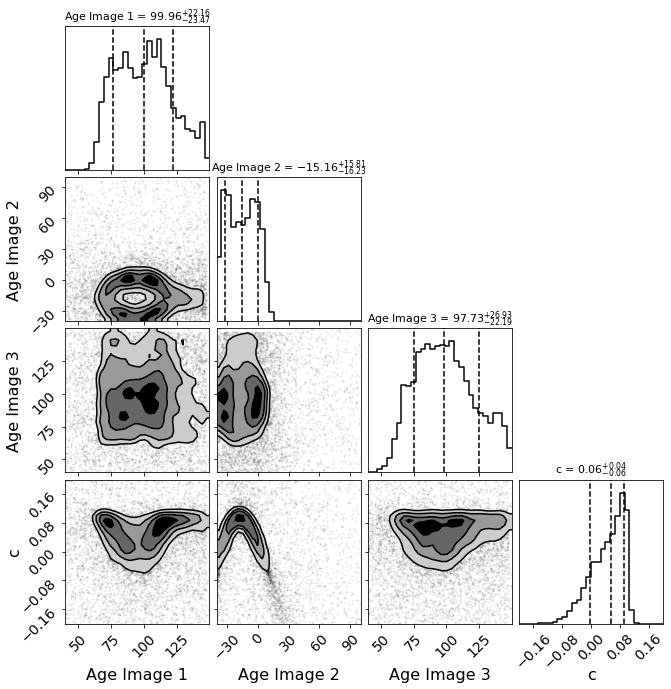

In [6]:
#Define the required functions for the mcmc tools:

dust = sncosmo.CCM89Dust()
model=sncosmo.Model('salt2-extended',effects=[dust],
                       effect_names=['mw'],
                       effect_frames=['obs'])
model.set(**{'z':1.9459,'mwebv':.014,'t0':0,'x1':0})

#t0,t1,t2 are age of image id=0,1,2
varied_param_names = ['t0','t1','t2','c']

#full range bounds first, then tightened
#parameter_bounds={'c':(-.3,.5),'t0':(-45,time[-1]),
#                  't1':(-45,time[-1]),'t2':(-45,time[-1]),'Mb':(-17,-20.8)}
parameter_bounds={'c':(-.2,.2),'t2':(40,150),
                  't1':(-40,100),'t0':(40,150),'Mb':(-18,-22)}

log_parameter_priors={'c':logc_pdf,'Mb':logMb_prior}

n_varied_parameter_dim = len(varied_param_names) 
n_live_points=1000
ppfs=bounds_to_ppf(parameter_bounds)


image_colors=np.array([im['mag'][np.where(im['band']=='f105w')[0][0]]-\
             im['mag'][np.where(im['band']=='f160w')[0][0]] for im in [im0,im1,im2]])
image_color_errs=np.array([np.sqrt(np.sum(im['magerr']**2)) for im in [im0,im1,im2]])

def age_priors(parameters):
    if np.all([-45<x<150 for x in parameters]):
        return 0.0
    else:
        return -np.inf
def c_uniform(c):
    if -.3<c<.5:
        return 0.0
    else:
        return -np.inf
def chisq_likelihood(parameters): 
    model.set(c=parameters[-1])
    chisq=0
    model_observations = model.color('F105W','F160W','ab',parameters[:3])
    chisq+=np.sum((image_colors-model_observations)**2/(image_color_errs**2))
    return chisq
def lnprob(parameters):
    #priorc=c_uniform(parameters[-1]) #for uniform priors
    priorc=log_parameter_priors['c'](parameters[-1]) #for prior based on existing distributions
    age_p=age_priors(parameters[:3]) #uniform priors on age based on bounds

    if not np.isfinite(priorc) or not np.isfinite(age_p):
        return -np.inf
    
    chisq=chisq_likelihood(parameters)
    print(chisq,age_p,priorc)
    if not np.isfinite(chisq):
        return -np.inf
    return(age_p+priorc-.5*chisq)

csample_result = nestle.sample(
    lnprob, 
    prior_transform, 
    n_varied_parameter_dim,
    npoints=n_live_points, 
    maxiter=None,
    maxcall=None
    )

nice_corner(csample_result)
plt.savefig('corner_color_curve_fit_with_c_prior.pdf',format='pdf',overwrite=True)
calc_ev(csample_result,n_live_points)
pickle.dump(csample_result,open('colorcurve_constraint.pkl','wb'))
plt.show()


/Users/jpierel/miniconda3/envs/basic/lib/python3.8/site-packages/nestle.py:905: RuntimeWarning: invalid value encountered in double_scalars
  h = (math.exp(logwt - logz_new) * active_logl[worst] +


Marginalised evidence is -5.5899700626182085 ± nan


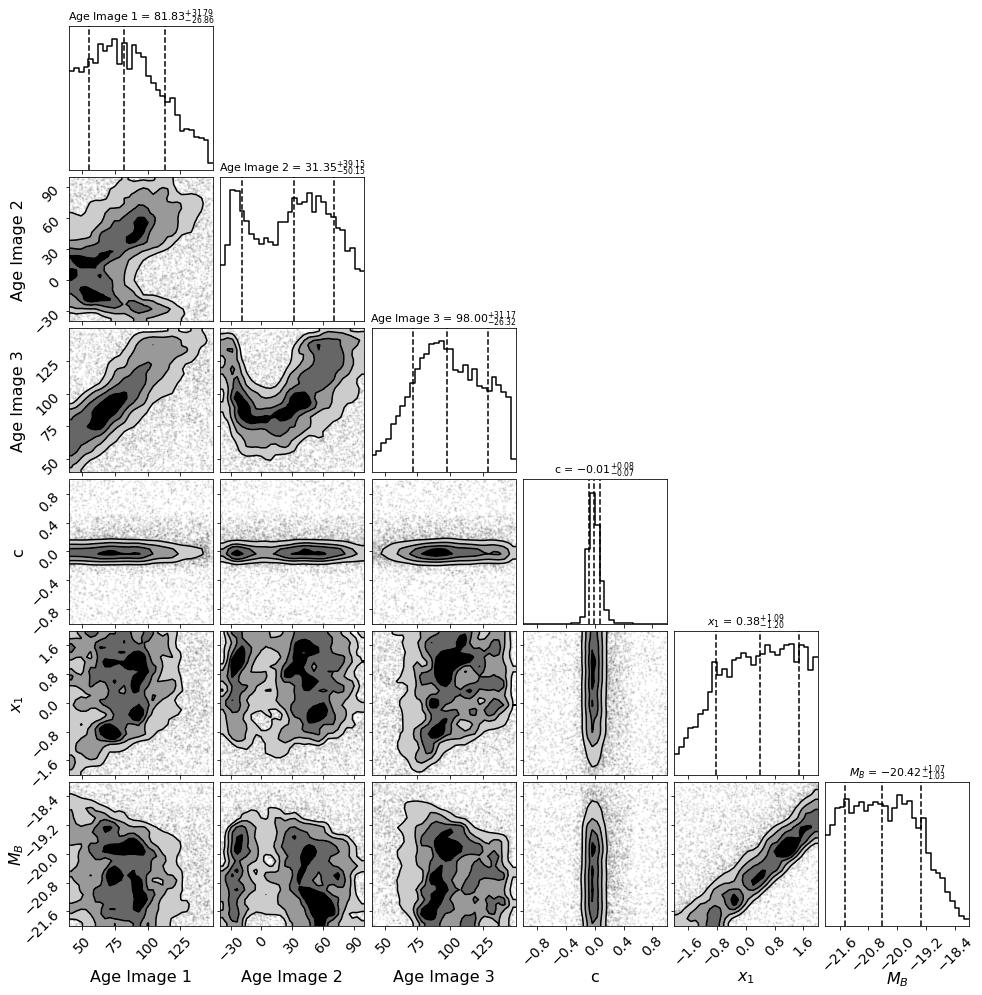

[ 9.09638105e+01  3.38776573e+00  9.93984239e+01 -6.81799340e-03]


In [7]:
# FIT FOR x1
dust = sncosmo.CCM89Dust()
model=sncosmo.Model('salt2-extended',effects=[dust],
                       effect_names=['mw'],
                       effect_frames=['obs'])
model.set(**{'z':1.9459,'mwebv':.014,'t0':0,'x1':0})
use_cfit_for_prior=False
lens_models_to_fit=['H']
#t0,t1,t2 are age of image id=0,1,2
varied_param_names = ['t0','t1','t2','c','x1','Mb']
modelcov=True
#full range bounds first, then tightened
#parameter_bounds={'c':(-.3,.5),'t0':(-45,time[-1]),
#                  't1':(-45,time[-1]),'t2':(-45,time[-1]),'Mb':(-17,-20.8)}
parameter_bounds={'c':(-1,1),'t2':(40,150),'x1':(-2,2),
                  't1':(-40,100),'t0':(40,150),'Mb':(-18,-22)}

n_varied_parameter_dim = len(varied_param_names) 
n_live_points=1000
ppfs=bounds_to_ppf(parameter_bounds)

#logMb_prior=lambda x:0
logMb_prior=lambda x:np.log(scipy.stats.norm.pdf(
                 x, 
                 loc = -19.365, 
                 scale = 1))
# logMb_prior=lambda x:np.log(scipy.stats.norm.pdf(
#                 x, 
#                 loc = -20.5, 
#                 scale = .2))
log_parameter_priors={'c':logc_pdf,'Mb':logMb_prior}
all_mods={}
if use_cfit_for_prior:
    cfit_res=pickle.load(open('colorcurve_constraint.pkl','rb'))
    cfit_priors={}
    for i in range(5):
        if i<3:
            test=posterior('test',-45,145)
            cfit_priors[i]=scipy.interpolate.interp1d(np.arange(-50,150,.1),
                                                      np.log(test._pdf(np.arange(-50,150,.1),
                                                                       cfit_res.samples[:,i],
                                                                      cfit_res.weights)),
                                                     fill_value=-np.inf,bounds_error=False)
    
        elif i==3:
            test=posterior('test',-1,1)
            cfit_priors[i]=scipy.interpolate.interp1d(np.arange(-1,1,.001),
                                                      np.log(test._pdf(np.arange(-1,1,.001),
                                                                       cfit_res.samples[:,i],
                                                                      cfit_res.weights)),
                                                     fill_value=-np.inf,bounds_error=False)
        else:
            test=posterior('test',-2,2)
            cfit_priors[i]=scipy.interpolate.interp1d(np.arange(-2,2,.001),
                                                      np.log(test._pdf(np.arange(-2,2,.001),
                                                                       cfit_res.samples[:,i],
                                                                      cfit_res.weights)),
                                                     fill_value=-np.inf,bounds_error=False)
else:
    cfit_priors=None

for lens_model in lens_models_to_fit:
    temp_lens=models[models['MODEL']==lens_model]
    flux_vals={}
    flux_errs={}
    for b in ['F160W']:
        flux_vals[b]=[]
        flux_errs[b]=[]
        for im in [im0,im1,im2]:
            mu=temp_lens['MU'][temp_lens['image']=='SN.'+str(im['id'][0]+1)]
            muerr=temp_lens['ERR_MU'][temp_lens['image']=='SN.'+str(im['id'][0]+1)]
            b_ind=np.where(im['band']==b.lower())[0][0]
            flux_err2=(im['flux'][b_ind]/mu)*np.sqrt((im['fluxerr'][b_ind]/im['flux'][b_ind])**2+\
                                               (muerr/mu)**2)
            flux_vals[b].append(im['flux'][b_ind]/mu)
            flux_errs[b].append(flux_err2)
        flux_vals[b]=np.array(flux_vals[b]).flatten()
        flux_errs[b]=np.array(flux_errs[b]).flatten()
    
    
    
    def age_priors(parameters):
        if np.all([-45<x<150 for x in parameters]):
            return 0.0
        else:
            return -np.inf
    
    def chisq_likelihood(parameters): 
        model.set_source_peakabsmag(parameters[-1],'bessellb','ab',cosmo=cosmology)
        model.set(c=parameters[-2])
        chisq=0
        
        
        for b in ['F160W']:
            model_observations = model.bandflux(b,parameters[:3],zp=zp,zpsys='ab')
            
            if modelcov:
                cov = np.diag(flux_errs[b]**2)
                _, mcov = model.bandfluxcov(b, parameters[:3],
                                            zp=zp, zpsys='ab')
                
                cov = cov + mcov
                invcov = np.linalg.pinv(cov)
            
                diff = flux_vals[b]-model_observations
                chisq+=np.dot(np.dot(diff, invcov), diff)
                
            else:
                chisq+=np.sum((flux_vals[b]-model_observations)**2/(flux_errs[b]**2))
        
        return chisq
    
    
    def lnprob(parameters):
        priorMb=0#log_parameter_priors['Mb'](parameters[-1])
        if cfit_priors is not None:
            c_age_priors=np.sum([cfit_priors[j](parameters[j]) for j in range(5)])
        else:
            #priorc=c_uniform(parameters[-1]) #for uniform priors
            priorc=log_parameter_priors['c'](parameters[-3]) #for prior based on existing distributions
            age_p=age_priors(parameters[:3]) #uniform priors on age based on bounds
            c_age_priors=priorc+age_p
        
        chisq=chisq_likelihood(parameters)
        if not np.isfinite(c_age_priors) or not np.isfinite(priorMb) or not np.isfinite(chisq):
            return -np.inf
        
        return(c_age_priors+priorMb-.5*chisq)

    sample_result_lc = nestle.sample(
        lnprob, 
        prior_transform, 
        n_varied_parameter_dim,
        npoints=n_live_points, 
        maxiter=None,
        maxcall=None
        )

    nice_corner(sample_result_lc,labs=["Age Image 1","Age Image 2","Age Image 3", "c","$x_1$",'$M_B$'])
    calc_ev(sample_result_lc,n_live_points)
    #pickle.dump(sample_result_lc,open('my_lightcurve_nestle.pkl','wb'))
    plt.savefig('lc_modelH_color_corner.pdf',format='pdf')
    plt.show()
    all_mods[lens_model]=sample_result_lc
    mle=csample_result.samples[csample_result.weights.argmax(),:]
    print(mle)
    #if not use_cfit_for_prior:
    #    pickle.dump(sample_result_lc,open('lc_model%s_constraint.pkl'%lens_model,'wb'))
    #else:
    #    pickle.dump(sample_result_lc,open('lc_model%s_color_constraint.pkl'%lens_model,'wb'))

Marginalised evidence is -4.966478996867288 ± 0.055316204600953905


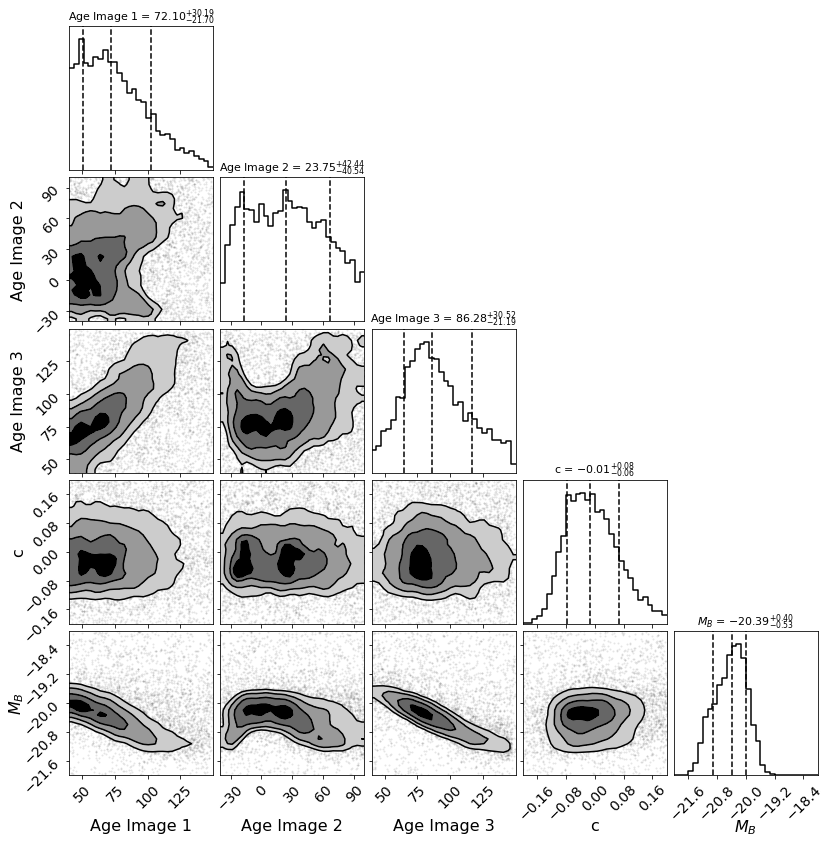

In [8]:
#Define the required functions for the mcmc tools:
dust = sncosmo.CCM89Dust()
model=sncosmo.Model('salt2-extended',effects=[dust],
                       effect_names=['mw'],
                       effect_frames=['obs'])
model.set(**{'z':1.9459,'mwebv':.014,'t0':0,'x1':0})
use_cfit_for_prior=False
lens_models_to_fit=['H']
#t0,t1,t2 are age of image id=0,1,2
varied_param_names = ['t0','t1','t2','c','Mb']
modelcov=True
#full range bounds first, then tightened
#parameter_bounds={'c':(-.3,.5),'t0':(-45,time[-1]),
#                  't1':(-45,time[-1]),'t2':(-45,time[-1]),'Mb':(-17,-20.8)}
parameter_bounds={'c':(-.2,.2),'t2':(40,150),
                  't1':(-40,100),'t0':(40,150),'Mb':(-18,-22)}

n_varied_parameter_dim = len(varied_param_names) 
n_live_points=1000
ppfs=bounds_to_ppf(parameter_bounds)

#logMb_prior=lambda x:0
logMb_prior=lambda x:np.log(scipy.stats.norm.pdf(
                 x, 
                 loc = -19.365, 
                 scale = 1))
# logMb_prior=lambda x:np.log(scipy.stats.norm.pdf(
#                 x, 
#                 loc = -20.5, 
#                 scale = .2))
log_parameter_priors={'c':logc_pdf,'Mb':logMb_prior}
all_mods={}
if use_cfit_for_prior:
    cfit_res=pickle.load(open('colorcurve_constraint.pkl','rb'))
    cfit_priors={}
    for i in range(4):
        if i<3:
            test=posterior('test',-45,145)
            cfit_priors[i]=scipy.interpolate.interp1d(np.arange(-50,150,.1),
                                                      np.log(test._pdf(np.arange(-50,150,.1),
                                                                       cfit_res.samples[:,i],
                                                                      cfit_res.weights)),
                                                     fill_value=-np.inf,bounds_error=False)
    
        else:
            test=posterior('test',-.2,.2)
            cfit_priors[i]=scipy.interpolate.interp1d(np.arange(-.2,.2,.001),
                                                      np.log(test._pdf(np.arange(-.2,.2,.001),
                                                                       cfit_res.samples[:,i],
                                                                      cfit_res.weights)),
                                                     fill_value=-np.inf,bounds_error=False)
else:
    cfit_priors=None

for lens_model in lens_models_to_fit:
    temp_lens=models[models['MODEL']==lens_model]
    flux_vals={}
    flux_errs={}
    for b in ['F160W']:
        flux_vals[b]=[]
        flux_errs[b]=[]
        for im in [im0,im1,im2]:
            mu=temp_lens['MU'][temp_lens['image']=='SN.'+str(im['id'][0]+1)]
            muerr=temp_lens['ERR_MU'][temp_lens['image']=='SN.'+str(im['id'][0]+1)]
            b_ind=np.where(im['band']==b.lower())[0][0]
            flux_err2=(im['flux'][b_ind]/mu)*np.sqrt((im['fluxerr'][b_ind]/im['flux'][b_ind])**2+\
                                               (muerr/mu)**2)
            flux_vals[b].append(im['flux'][b_ind]/mu)
            flux_errs[b].append(flux_err2)
        flux_vals[b]=np.array(flux_vals[b]).flatten()
        flux_errs[b]=np.array(flux_errs[b]).flatten()
    
    
    
    def age_priors(parameters):
        if np.all([-45<x<150 for x in parameters]):
            return 0.0
        else:
            return -np.inf
    
    def chisq_likelihood(parameters): 
        model.set_source_peakabsmag(parameters[-1],'bessellb','ab',cosmo=cosmology)
        model.set(c=parameters[-2])
        chisq=0
        
        
        for b in ['F160W']:
            model_observations = model.bandflux(b,parameters[:3],zp=zp,zpsys='ab')
            
            if modelcov:
                cov = np.diag(flux_errs[b]**2)
                _, mcov = model.bandfluxcov(b, parameters[:3],
                                            zp=zp, zpsys='ab')
                
                cov = cov + mcov
                invcov = np.linalg.pinv(cov)
            
                diff = flux_vals[b]-model_observations
                chisq+=np.dot(np.dot(diff, invcov), diff)
                
            else:
                chisq+=np.sum((flux_vals[b]-model_observations)**2/(flux_errs[b]**2))
        
        return chisq
    
    def lnprob(parameters):
        priorMb=log_parameter_priors['Mb'](parameters[-1])
        if cfit_priors is not None:
            c_age_priors=np.sum([cfit_priors[j](parameters[j]) for j in range(4)])
        else:
            #priorc=c_uniform(parameters[-1]) #for uniform priors
            priorc=log_parameter_priors['c'](parameters[-2]) #for prior based on existing distributions
            age_p=age_priors(parameters[:3]) #uniform priors on age based on bounds
            c_age_priors=priorc+age_p
        chisq=chisq_likelihood(parameters)
        if not np.isfinite(c_age_priors) or not np.isfinite(priorMb) or not np.isfinite(chisq):
            return -np.inf
        
        return(c_age_priors+priorMb-.5*chisq)

    sample_result_lc = nestle.sample(
        lnprob, 
        prior_transform, 
        n_varied_parameter_dim,
        npoints=n_live_points, 
        maxiter=None,
        maxcall=None
        )

    nice_corner(sample_result_lc)
    calc_ev(sample_result_lc,n_live_points)
    #pickle.dump(sample_result_lc,open('my_lightcurve_nestle.pkl','wb'))
    plt.savefig('lc_modelH_color_corner.pdf',format='pdf')
    plt.show()
    all_mods[lens_model]=sample_result_lc
    if not use_cfit_for_prior:
        pickle.dump(sample_result_lc,open('lc_model%s_constraint.pkl'%lens_model,'wb'))
    else:
        pickle.dump(sample_result_lc,open('lc_model%s_color_constraint.pkl'%lens_model,'wb'))

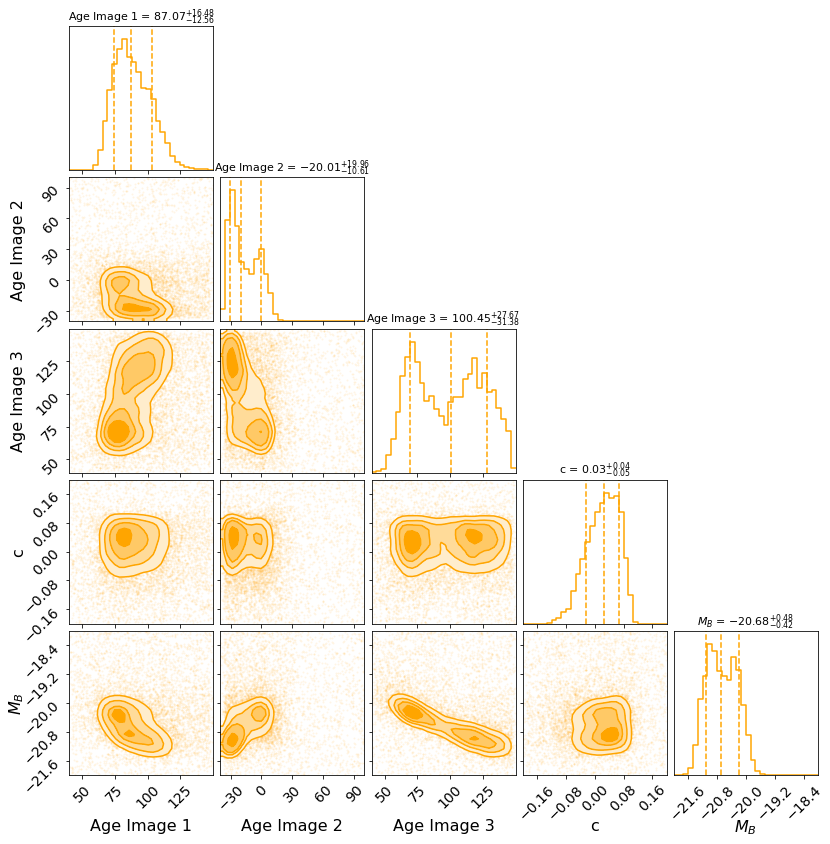

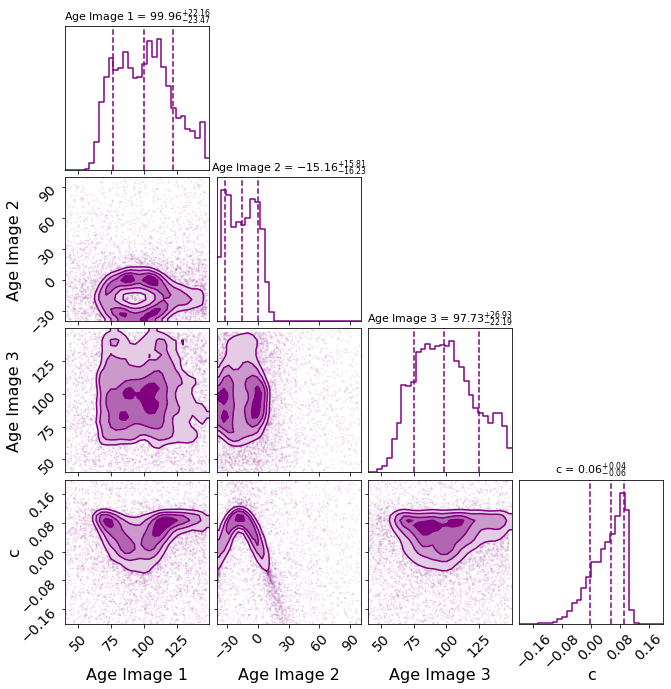

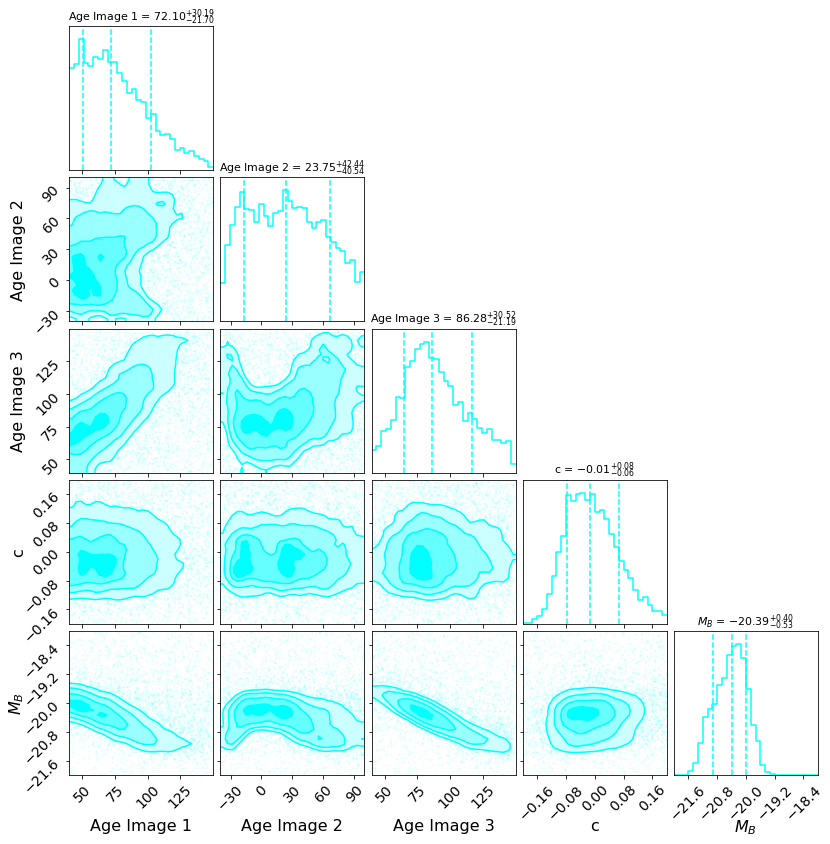

In [9]:
mod_result=pickle.load(open('lc_modelH_constraint.pkl','rb'))
bestMod_cfit=pickle.load(open('lc_modelH_color_constraint.pkl','rb'))
# temp_samples=copy.deepcopy(bestMod_cfit.samples)
# temp_samples[:,0]=copy.deepcopy(bestMod_cfit.samples[:,2])
# temp_samples[:,2]=copy.deepcopy(bestMod_cfit.samples[:,0])
# bestMod_cfit.samples=temp_samples
fig,ax=nice_corner(bestMod_cfit,color='orange')
# x=-2.8
# y=5.25
# ax.annotate('Combined Constraints',(-1.9,y),xycoords='axes fraction',fontsize=22)
# ax.annotate('Assumed Cosmology:',(x,y-.2),xycoords='axes fraction',fontsize=18)
# ax.annotate('Observations:',(x,y-.4),xycoords='axes fraction',fontsize=18)
# ax.annotate('SN model Priors:',(x,y-.6),xycoords='axes fraction',fontsize=18)
# ax.annotate('Lens Model Constraints:',(x,y-.8),xycoords='axes fraction',fontsize=18)
# ax.annotate(r'$f\Lambda$CDM, $H_0=70,\Omega_m=0.3$',(x+1.65,y-.2),
#             xycoords='axes fraction',fontsize=18,color='orange')
# ax.annotate('F105W-F160W Color',(x+.9,y-.4),xycoords='axes fraction',fontsize=16)
# ax.annotate('F105W,F160W Magnitude',(x+2.23,y-.4),xycoords='axes fraction',fontsize=16,color='orange')
# ax.annotate('SALT2-$c,x_1$',(x+1.33,y-.6),xycoords='axes fraction',fontsize=18)
# ax.annotate('$M_{B,pk}$',(x+3.32,y-.6),xycoords='axes fraction',fontsize=18,color='orange')
# ax.annotate(r'$\mu_1,\mu_2,\mu_3$',(x+3.1,y-.8),xycoords='axes fraction',fontsize=18,color='orange')
plt.savefig('lc_modelH_color_corner_labels.pdf',format='pdf')
plt.show()
cnest_noprior=pickle.load(open('colorcurve_constraint_noprior.pkl','rb'))
cnest_prior=pickle.load(open('colorcurve_constraint.pkl','rb'))
#switch images 1 and 3--color
# temp_samples=copy.deepcopy(cnest_prior.samples)
# temp_samples[:,0]=copy.deepcopy(cnest_prior.samples[:,2])
# temp_samples[:,2]=copy.deepcopy(cnest_prior.samples[:,0])
# cnest_prior.samples=temp_samples
fig,ax=nice_corner(cnest_prior,color='purple')

# x=-2
# y=4.15
# ax.annotate('Color Curve-based Constraints',(-1.2,y),xycoords='axes fraction',fontsize=20)
# ax.annotate('Assumed Cosmology:',(x,y-.2),xycoords='axes fraction',fontsize=16)
# ax.annotate('Observations:',(x,y-.4),xycoords='axes fraction',fontsize=16)
# ax.annotate('SN model Priors:',(x,y-.6),xycoords='axes fraction',fontsize=16)
# ax.annotate('Lens Model Constraints:',(x,y-.8),xycoords='axes fraction',fontsize=16)
# ax.annotate(r'$f\Lambda$CDM, $H_0=70,\Omega_m=0.3$',(x+1.35,y-.2),
#             xycoords='axes fraction',fontsize=16,color='purple')
# ax.annotate('F105W-F160W Color',(x+.8,y-.4),xycoords='axes fraction',fontsize=16,color='purple')
# ax.annotate('F160W Magnitude',(x+2.03,y-.4),xycoords='axes fraction',fontsize=16)
# ax.annotate('SALT2-$c,x_1$',(x+1.3,y-.6),xycoords='axes fraction',fontsize=16,color='purple')
# ax.annotate('$M_{B,pk}$',(x+2.76,y-.6),xycoords='axes fraction',fontsize=16)
# ax.annotate(r'$\mu_1,\mu_2,\mu_3$',(x+2.56,y-.8),xycoords='axes fraction',fontsize=16)

plt.savefig('corner_color_curve_fit_with_c_prior_labels.pdf',format='pdf')
plt.show()
#switch images 1 and 3--light
# temp_samples=copy.deepcopy(mod_result.samples)
# temp_samples[:,0]=copy.deepcopy(mod_result.samples[:,2])
# temp_samples[:,2]=copy.deepcopy(mod_result.samples[:,0])
# mod_result.samples=temp_samples
fig,ax=nice_corner(mod_result,color='cyan')
# x=-2.8
# y=5.25
# ax.annotate('Light Curve-based Constraints',(-1.9,y),xycoords='axes fraction',fontsize=22)
# ax.annotate('Assumed Cosmology:',(x,y-.2),xycoords='axes fraction',fontsize=18)
# ax.annotate('Observations:',(x,y-.4),xycoords='axes fraction',fontsize=18)
# ax.annotate('SN model Priors:',(x,y-.6),xycoords='axes fraction',fontsize=18)
# ax.annotate('Lens Model Constraints:',(x,y-.8),xycoords='axes fraction',fontsize=18)
# ax.annotate(r'$f\Lambda$CDM, $H_0=70,\Omega_m=0.3$',(x+1.65,y-.2),
#             xycoords='axes fraction',fontsize=18,color='orange')
# ax.annotate('F105W-F160W Color',(x+1.2,y-.4),xycoords='axes fraction',fontsize=16)
# ax.annotate('F160W Magnitude',(x+2.63,y-.4),xycoords='axes fraction',fontsize=16,color='orange')
# ax.annotate('SALT2-$c,x_1$',(x+1.63,y-.6),xycoords='axes fraction',fontsize=18)
# ax.annotate('$M_{B,pk}$',(x+3.32,y-.6),xycoords='axes fraction',fontsize=18,color='orange')
# ax.annotate(r'$\mu_1,\mu_2,\mu_3$',(x+3.1,y-.8),xycoords='axes fraction',fontsize=18,color='orange')
plt.savefig('lc_modelH_corner_labels.pdf',format='pdf')
plt.show()
plt.close()

In [10]:

legend_fontsize=24
axis_fontsize=30
ticksize=26

/Users/jpierel/miniconda3/envs/basic/lib/python3.8/site-packages/sncosmo/models.py:188: RuntimeWarning: divide by zero encountered in log10
  result[i] = -2.5 * np.log10(f / zpf)
/Users/jpierel/miniconda3/envs/basic/lib/python3.8/site-packages/sncosmo/models.py:188: RuntimeWarning: invalid value encountered in log10
  result[i] = -2.5 * np.log10(f / zpf)
/Users/jpierel/miniconda3/envs/basic/lib/python3.8/site-packages/sncosmo/models.py:1529: RuntimeWarning: invalid value encountered in subtract
  return (self.bandmag(band1, magsys, time) -
/Users/jpierel/miniconda3/envs/basic/lib/python3.8/site-packages/sncosmo/models.py:188: RuntimeWarning: divide by zero encountered in log10
  result[i] = -2.5 * np.log10(f / zpf)
/Users/jpierel/miniconda3/envs/basic/lib/python3.8/site-packages/sncosmo/models.py:188: RuntimeWarning: invalid value encountered in log10
  result[i] = -2.5 * np.log10(f / zpf)
/Users/jpierel/miniconda3/envs/basic/lib/python3.8/site-packages/sncosmo/models.py:1529: RuntimeW

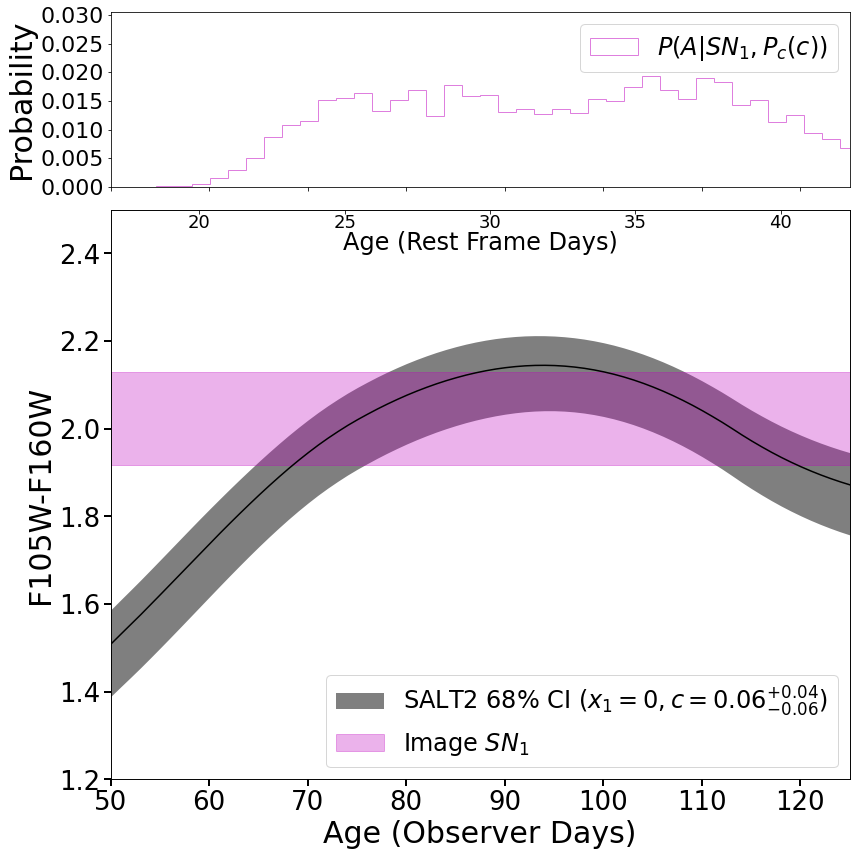

/Users/jpierel/miniconda3/envs/basic/lib/python3.8/site-packages/sncosmo/models.py:188: RuntimeWarning: divide by zero encountered in log10
  result[i] = -2.5 * np.log10(f / zpf)
/Users/jpierel/miniconda3/envs/basic/lib/python3.8/site-packages/sncosmo/models.py:188: RuntimeWarning: invalid value encountered in log10
  result[i] = -2.5 * np.log10(f / zpf)
/Users/jpierel/miniconda3/envs/basic/lib/python3.8/site-packages/sncosmo/models.py:1529: RuntimeWarning: invalid value encountered in subtract
  return (self.bandmag(band1, magsys, time) -
/Users/jpierel/miniconda3/envs/basic/lib/python3.8/site-packages/sncosmo/models.py:188: RuntimeWarning: divide by zero encountered in log10
  result[i] = -2.5 * np.log10(f / zpf)
/Users/jpierel/miniconda3/envs/basic/lib/python3.8/site-packages/sncosmo/models.py:188: RuntimeWarning: invalid value encountered in log10
  result[i] = -2.5 * np.log10(f / zpf)
/Users/jpierel/miniconda3/envs/basic/lib/python3.8/site-packages/sncosmo/models.py:1529: RuntimeW

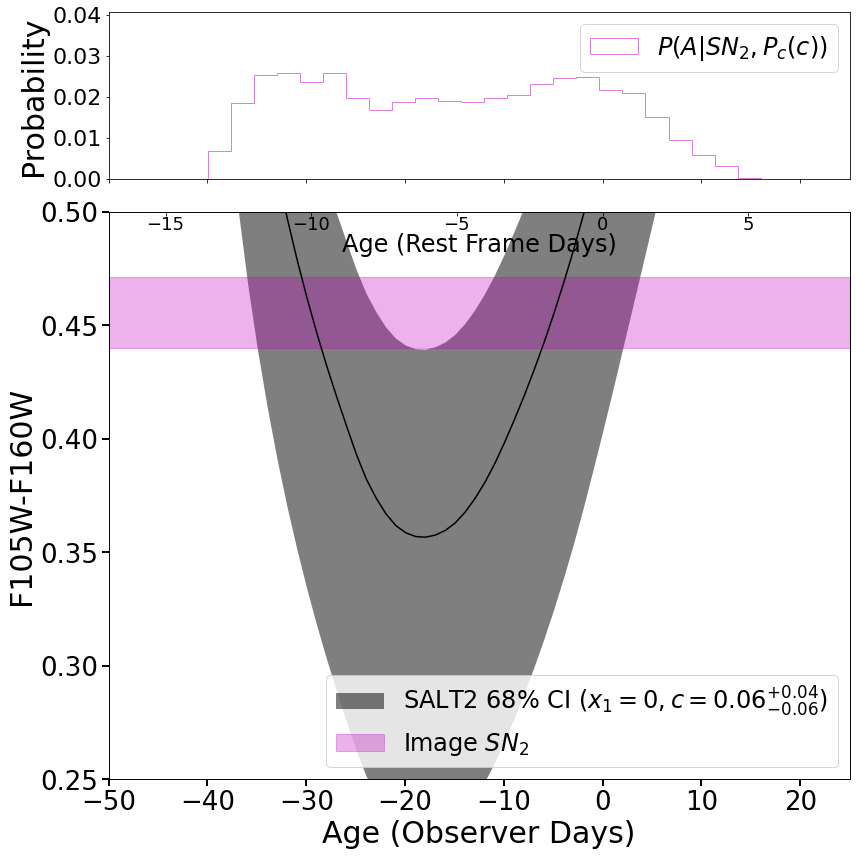

/Users/jpierel/miniconda3/envs/basic/lib/python3.8/site-packages/sncosmo/models.py:188: RuntimeWarning: divide by zero encountered in log10
  result[i] = -2.5 * np.log10(f / zpf)
/Users/jpierel/miniconda3/envs/basic/lib/python3.8/site-packages/sncosmo/models.py:188: RuntimeWarning: invalid value encountered in log10
  result[i] = -2.5 * np.log10(f / zpf)
/Users/jpierel/miniconda3/envs/basic/lib/python3.8/site-packages/sncosmo/models.py:1529: RuntimeWarning: invalid value encountered in subtract
  return (self.bandmag(band1, magsys, time) -
/Users/jpierel/miniconda3/envs/basic/lib/python3.8/site-packages/sncosmo/models.py:188: RuntimeWarning: divide by zero encountered in log10
  result[i] = -2.5 * np.log10(f / zpf)
/Users/jpierel/miniconda3/envs/basic/lib/python3.8/site-packages/sncosmo/models.py:188: RuntimeWarning: invalid value encountered in log10
  result[i] = -2.5 * np.log10(f / zpf)
/Users/jpierel/miniconda3/envs/basic/lib/python3.8/site-packages/sncosmo/models.py:1529: RuntimeW

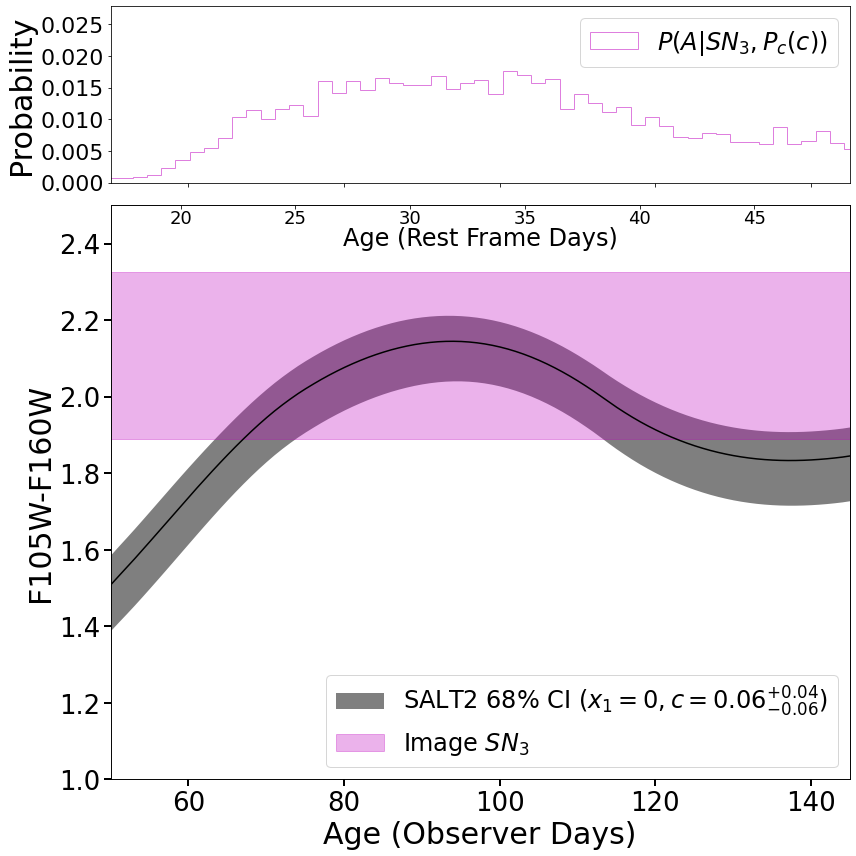

In [11]:
#make color curve fitting plots
dust = sncosmo.CCM89Dust()
model=sncosmo.Model('salt2-extended',effects=[dust],
                       effect_names=['mw'],
                       effect_frames=['obs'])
model.set(**{'z':1.9459,'mwebv':.014,'t0':0,'x1':0})
i=-1
cnest_prior=pickle.load(open('colorcurve_constraint.pkl','rb'))
#switch images 1 and 3
temp_samples=copy.deepcopy(cnest_prior.samples)
#temp_samples[:,0]=copy.deepcopy(cnest_prior.samples[:,2])
#temp_samples[:,2]=copy.deepcopy(cnest_prior.samples[:,0])
cnest_prior.samples=temp_samples
#nice_corner(sample_result_lc)
#plt.savefig('corner_color_curve_fit_with_c_prior.pdf',format='pdf',overwrite=True)
#plt.close()
#ylim_dict={0:(1,2.5),1:(.25,.5),2:(1.2,2.5)}
#xlim_dict={0:(50,145),1:(-50,25),2:(50,125)}
ylim_dict={2:(1,2.5),1:(.25,.5),0:(1.2,2.5)}
xlim_dict={2:(50,145),1:(-50,25),0:(50,125)}

t0, t1,t2,c = [weighted_quantile(cnest_prior.samples[:,i], .5, 
                                     sample_weight=cnest_prior.weights)\
                   for i in range(4)]
t0_16, t1_16,t2_16,c_16 = [weighted_quantile(cnest_prior.samples[:,i], .16, 
                                     sample_weight=cnest_prior.weights)\
                   for i in range(4)]
t0_84, t1_84,t2_84,c_84 = [weighted_quantile(cnest_prior.samples[:,i], .84, 
                                     sample_weight=cnest_prior.weights)\
                   for i in range(4)]
for im in [im0,im1,im2]:
    i+=1     

    plot_time=np.arange(model.mintime()-10,model.maxtime()+10,1)
    model.set(c=c)
    fig=plt.figure(figsize=(12,12))
    gs = gridspec.GridSpec(4, 4)
    #fig,gs=plot_util.grid_plot(4,4)
    ax_main=fig.add_subplot(gs[1:,:])
    
    ax_main=plot_util.plot('plot',plot_time,model.color('F105W','F160W','ab',plot_time),
                             ax=ax_main,x_lab='Age (Observer Days)',ticklabelsize=ticksize,
                             fontsize=axis_fontsize,
                             y_lab='F105W-F160W',color='k',alpha=1)
    plt.xlim(xlim_dict[i])
    ax_main_top=ax_main.twiny()
    ax_main_top.tick_params(direction='in',pad=-22)
    ax_main_top.tick_params(labelsize=18)
    ax_main_top.set_xlabel('Age (Rest Frame Days)',fontsize=axis_fontsize-6,labelpad=-40)
    ax_main_top.set_xlim((xlim_dict[i][0]/2.95,xlim_dict[i][1]/2.95))
    
    if i in ylim_dict.keys():
        plt.ylim(ylim_dict[i])
    
    model.set(c=c_16)
    min_cols=model.color('F105W','F160W','ab',plot_time)
    model.set(c=c_84)
    max_cols=model.color('F105W','F160W','ab',plot_time)
    ax_main.fill_between(plot_time,min_cols,max_cols,color='k',alpha=.5,linewidth=0,
            label='SALT2 68% CI'+' ($x_1=0,c=%.2f^{+%.2f}_{-%.2f})$'%(c,c_84-c,c-c_16))

    
    temp_color=im['mag'][np.where(im['band']=='f105w')[0][0]]-\
                 im['mag'][np.where(im['band']=='f160w')[0][0]]
    temp_col_err=np.sqrt(np.sum(im['magerr']**2))
    nbins=60
    ax_top=fig.add_subplot(gs[0,:],sharex=ax_main)
#     ax_top.hist(cnest_noprior.samples[:,i],weights=cnest_prior.weights,bins=nbins,density=True,
#                 label='$P(A|SN_'+str(i+1)+')$',
#                alpha=.5,histtype='step',color='c')
    ax_top.hist(cnest_prior.samples[:,i],weights=cnest_prior.weights,bins=nbins,
                density=True,label='$P(A|SN_'+str(i+1)+',P_c(c))$',alpha=.5,histtype='step',
                color='m')
    
    
    for tick in ax_top.xaxis.get_major_ticks():
        tick.label.set_fontsize(ticksize-4)
    for tick in ax_top.yaxis.get_major_ticks():
        tick.label.set_fontsize(ticksize-4)

    ax_top.legend(fontsize=legend_fontsize,loc='upper right')
    yvals=np.arange(np.nanmin(min_cols),np.nanmax(max_cols),.001)
    
    ax_top.label_outer()
    
    ax_top.set_ylabel('Probability',fontsize=axis_fontsize)
    ax_top.set_ylim((0,ax_top.get_ylim()[1]*1.5))
    
    ax_main.fill_between(plot_time,temp_color-temp_col_err,temp_color+temp_col_err,
                     color='m',alpha=.3,label='Image $SN_'+str(i+1)+'$')
    #ax_main.fill_between(plot_time,temp_color-2*temp_col_err,temp_color+2*temp_col_err,
    #                 color='c',alpha=.1,label='Image $SN_'+str(i+1)+'$ 95% CI')
    
    ax_main.legend(fontsize=legend_fontsize,loc='lower right')
    
    
    plt.tight_layout()
    plt.savefig('colorcurve_image%i.pdf'%(i+1),format='pdf',overwrite=True)
    plt.show()
    

<ipython-input-12-c3419e68852e>:70: RuntimeWarning: divide by zero encountered in log10
  -2.5*np.log10(model.bandflux(band,plot_time,zp=zp,zpsys='ab'))+zp,ax=ax_main,x_lab='Time (Observer Days)',
<ipython-input-12-c3419e68852e>:77: RuntimeWarning: divide by zero encountered in log10
  min_cols=-2.5*np.log10(model.bandflux(band,plot_time,zp=zp,zpsys='ab'))+zp
<ipython-input-12-c3419e68852e>:80: RuntimeWarning: divide by zero encountered in log10
  max_cols=-2.5*np.log10(model.bandflux(band,plot_time,zp=zp,zpsys='ab'))+zp
<ipython-input-12-c3419e68852e>:111: RuntimeWarning: divide by zero encountered in log10
  all_mag=-2.5*np.log10(model.bandflux(band,plot_time,zp=zp,zpsys='ab'))+zp


  time    band psf_flux apcorr ... dtC        mag                magerr      
-------- ----- -------- ------ ... --- ------------------ -------------------
57588.03 f105w   0.1748  1.192 ...  83  25.79364642925404 0.09751424485125858
57587.97 f160w   1.1265  1.262 ...  83 23.770672009850376 0.04259914780292943


<ipython-input-12-c3419e68852e>:159: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('lightcurve_image%i.pdf'%(i+1),format='pdf',overwrite=True)


<Figure size 432x288 with 0 Axes>

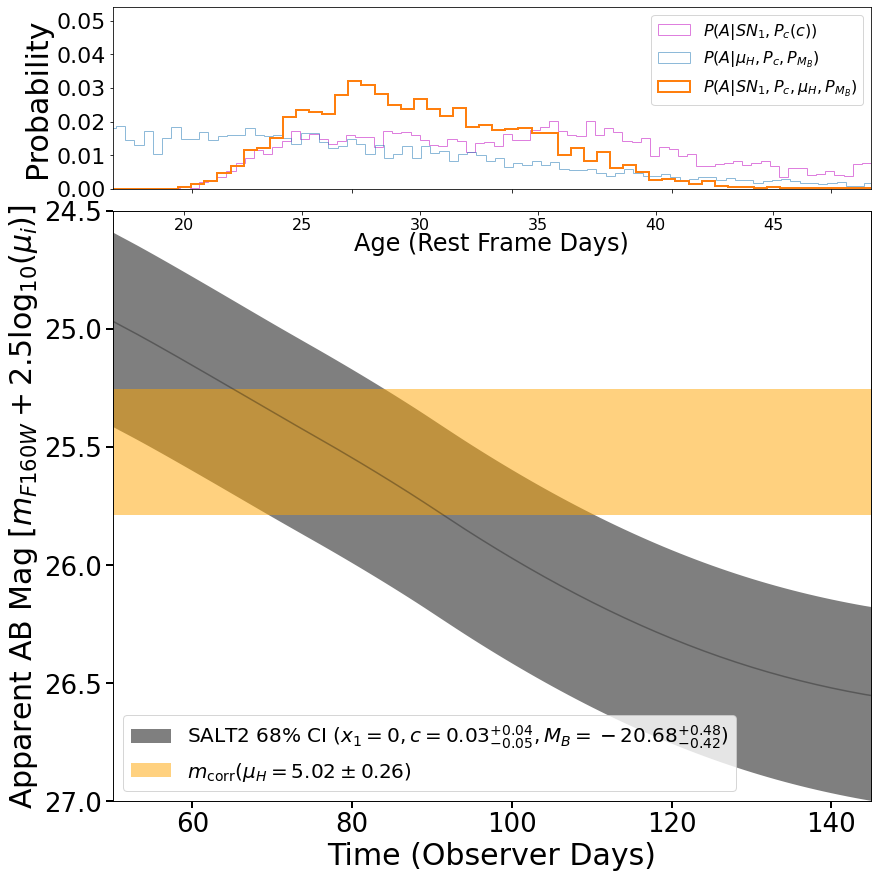

<ipython-input-12-c3419e68852e>:70: RuntimeWarning: divide by zero encountered in log10
  -2.5*np.log10(model.bandflux(band,plot_time,zp=zp,zpsys='ab'))+zp,ax=ax_main,x_lab='Time (Observer Days)',
<ipython-input-12-c3419e68852e>:77: RuntimeWarning: divide by zero encountered in log10
  min_cols=-2.5*np.log10(model.bandflux(band,plot_time,zp=zp,zpsys='ab'))+zp
<ipython-input-12-c3419e68852e>:80: RuntimeWarning: divide by zero encountered in log10
  max_cols=-2.5*np.log10(model.bandflux(band,plot_time,zp=zp,zpsys='ab'))+zp
<ipython-input-12-c3419e68852e>:111: RuntimeWarning: divide by zero encountered in log10
  all_mag=-2.5*np.log10(model.bandflux(band,plot_time,zp=zp,zpsys='ab'))+zp


  time    band psf_flux apcorr ... dtC        mag                magerr       
-------- ----- -------- ------ ... --- ------------------ --------------------
57588.03 f105w   2.3471  1.192 ... 160 22.973671016392306 0.007401133313450642
57587.97 f160w   3.5715  1.262 ... 160 22.517873363848597   0.0137707433851323


<ipython-input-12-c3419e68852e>:159: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('lightcurve_image%i.pdf'%(i+1),format='pdf',overwrite=True)


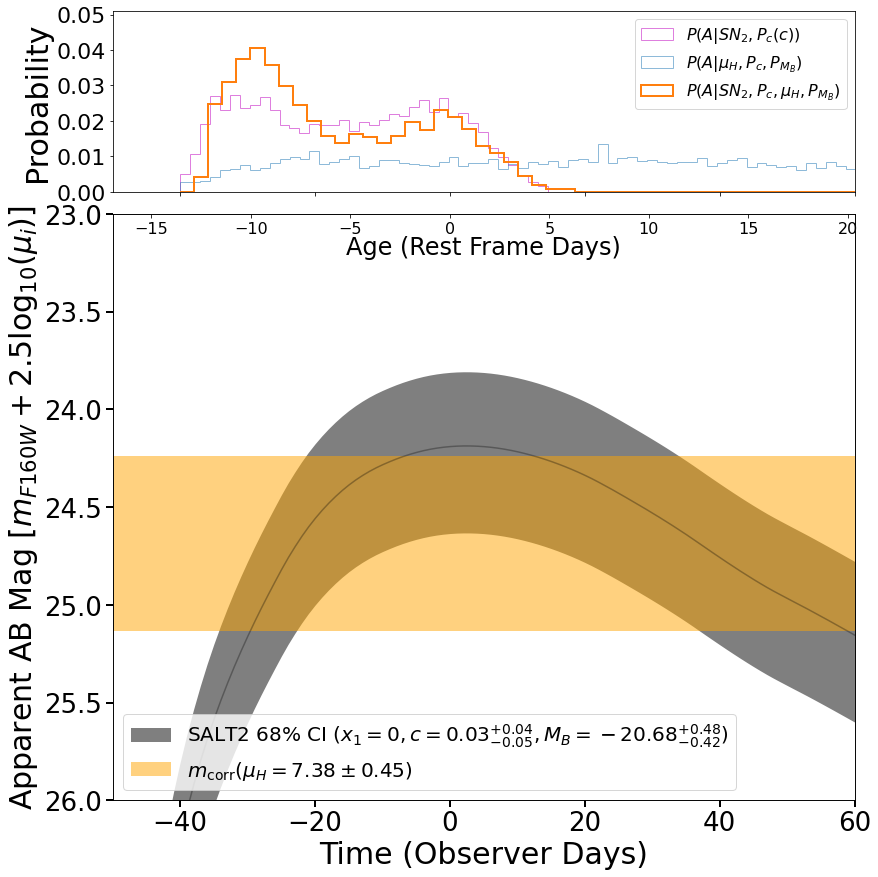

<ipython-input-12-c3419e68852e>:70: RuntimeWarning: divide by zero encountered in log10
  -2.5*np.log10(model.bandflux(band,plot_time,zp=zp,zpsys='ab'))+zp,ax=ax_main,x_lab='Time (Observer Days)',
<ipython-input-12-c3419e68852e>:77: RuntimeWarning: divide by zero encountered in log10
  min_cols=-2.5*np.log10(model.bandflux(band,plot_time,zp=zp,zpsys='ab'))+zp
<ipython-input-12-c3419e68852e>:80: RuntimeWarning: divide by zero encountered in log10
  max_cols=-2.5*np.log10(model.bandflux(band,plot_time,zp=zp,zpsys='ab'))+zp
<ipython-input-12-c3419e68852e>:111: RuntimeWarning: divide by zero encountered in log10
  all_mag=-2.5*np.log10(model.bandflux(band,plot_time,zp=zp,zpsys='ab'))+zp


  time    band psf_flux apcorr ... dtC        mag                magerr      
-------- ----- -------- ------ ... --- ------------------ -------------------
57588.03 f105w   0.0877  1.192 ...   0 26.542501016584897  0.2042651083238313
57587.97 f160w   0.6113  1.262 ...   0  24.43436401052555 0.07690300997873385


<ipython-input-12-c3419e68852e>:159: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('lightcurve_image%i.pdf'%(i+1),format='pdf',overwrite=True)


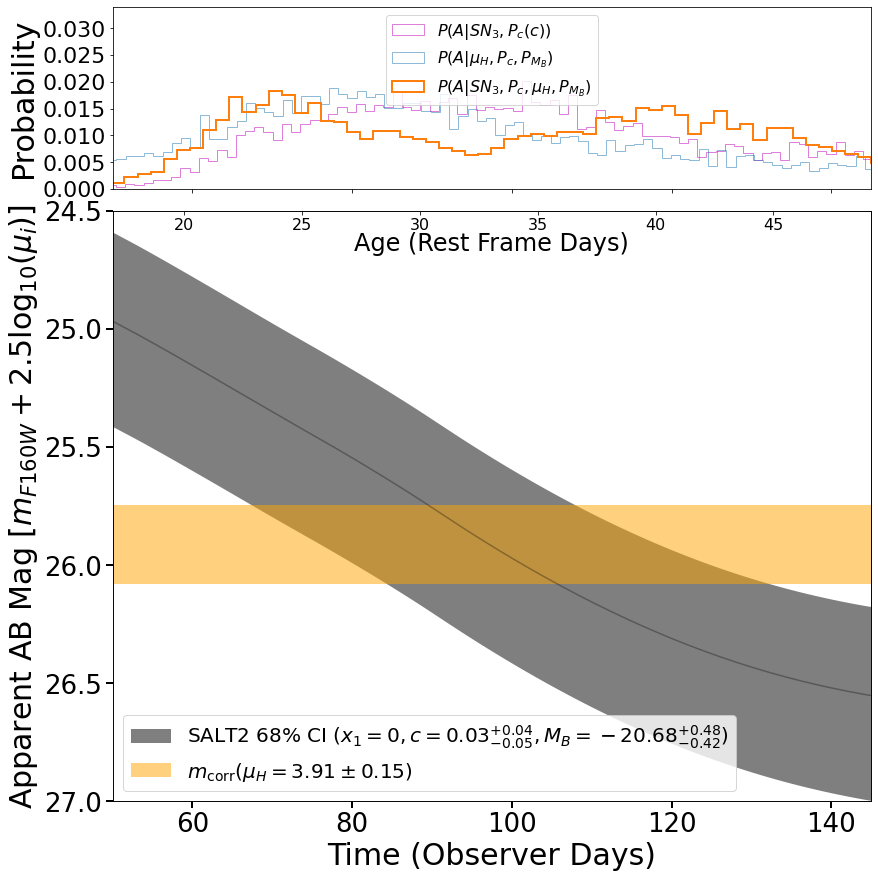

In [12]:
#make light curve fitting plots
plt.clf()
band='F160W'
dust = sncosmo.CCM89Dust()
model=sncosmo.Model('salt2-extended',effects=[dust],
                       effect_names=['mw'],
                       effect_frames=['obs'])
model.set(**{'z':1.9459,'mwebv':.014,'t0':0,'x1':0})

model.set_source_peakabsmag(-19.365,'bessellb','ab')

i=-1

ylim_dict={2:(24.5,27),1:(23,26),0:(24.5,27)}
xlim_dict={2:(50,145),1:(-50,60),0:(50,145)}
# ylim_dict={2:(26.5,28.5),1:(24,26),0:(26.5,29)}
# xlim_dict={2:(50,145),1:(-50,60),0:(50,145)}
mod_result=pickle.load(open('lc_modelH_constraint.pkl','rb'))
bestMod_cfit=pickle.load(open('lc_modelH_color_constraint.pkl','rb'))
#cnest_noprior=pickle.load(open('colorcurve_constraint_noprior.pkl','rb'))
cnest_prior=pickle.load(open('colorcurve_constraint.pkl','rb'))
#switch images 1 and 3--color
# temp_samples=copy.deepcopy(cnest_prior.samples)
# temp_samples[:,0]=copy.deepcopy(cnest_prior.samples[:,2])
# temp_samples[:,2]=copy.deepcopy(cnest_prior.samples[:,0])
# cnest_prior.samples=temp_samples
#switch images 1 and 3--light
# temp_samples=copy.deepcopy(mod_result.samples)
# temp_samples[:,0]=copy.deepcopy(mod_result.samples[:,2])
# temp_samples[:,2]=copy.deepcopy(mod_result.samples[:,0])
# mod_result.samples=temp_samples
# nice_corner(mod_result)
# plt.savefig('lc_modelH_corner.pdf')
# plt.close()
#switch images 1 and 3--combined
# temp_samples=copy.deepcopy(bestMod_cfit.samples)
# temp_samples[:,0]=copy.deepcopy(bestMod_cfit.samples[:,2])
# temp_samples[:,2]=copy.deepcopy(bestMod_cfit.samples[:,0])
# bestMod_cfit.samples=temp_samples
# nice_corner(bestMod_cfit)
# plt.savefig('lc_modelH_color_corner.pdf')
# plt.close()
best_model='H'
mod_result={best_model:mod_result}
quantile_dict={}
for q in [2.5,16,50,84,97.5]:
    t0, t1,t2,c,M_B = [weighted_quantile(bestMod_cfit.samples[:,i], q/100, 
                                     sample_weight=bestMod_cfit.weights)\
                   for i in range(5)]
    quantile_dict['t0_%s'%str(q)]=t0
    quantile_dict['t1_%s'%str(q)]=t1
    quantile_dict['t2_%s'%str(q)]=t2
    quantile_dict['c_%s'%str(q)]=c
    quantile_dict['M_B_%s'%str(q)]=M_B


for im in [im0,im1,im2]:
    i+=1 
    
    time=np.arange(model.mintime(),model.maxtime(),2)
    
    plot_time=np.arange(time[0]-10,time[-1]+10,1)
    model.set(c=quantile_dict['c_50'])
    model.set_source_peakabsmag(quantile_dict['M_B_50'],'bessellb','ab')
    fig=plt.figure(figsize=(12,12))
    gs = gridspec.GridSpec(4,4)
    #fig,axes,gs=plot_util.grid_plot(4,4)
    ax_main=fig.add_subplot(gs[1:,:])
    ax_main=plot_util.plot('plot',plot_time,
                -2.5*np.log10(model.bandflux(band,plot_time,zp=zp,zpsys='ab'))+zp,ax=ax_main,x_lab='Time (Observer Days)',
                y_lab=r'Apparent AB Mag [$m_{'+band+'}+2.5\log_{10}(\mu_i)$]',ticklabelsize=ticksize,
                             fontsize=axis_fontsize,color='k',alpha=.3)
    plt.ylim(ylim_dict[i])
    plt.xlim(xlim_dict[i])
    model.set(c=quantile_dict['c_16'])
    model.set_source_peakabsmag(quantile_dict['M_B_16'],'bessellb','ab')
    min_cols=-2.5*np.log10(model.bandflux(band,plot_time,zp=zp,zpsys='ab'))+zp
    model.set(c=quantile_dict['c_84'])
    model.set_source_peakabsmag(quantile_dict['M_B_84'],'bessellb','ab')
    max_cols=-2.5*np.log10(model.bandflux(band,plot_time,zp=zp,zpsys='ab'))+zp
    ax_main.fill_between(plot_time,min_cols,max_cols,color='k',alpha=.5,linewidth=0,
            label='SALT2 68%'+' CI ($x_1=0,c=%.2f^{+%.2f}_{-%.2f},M_B=%.2f^{+%.2f}_{-%.2f}$)'%\
                         (quantile_dict['c_50'],quantile_dict['c_84']-quantile_dict['c_50'],
                                quantile_dict['c_50']-quantile_dict['c_16'],
                                quantile_dict['M_B_50'],
                                quantile_dict['M_B_84']-quantile_dict['M_B_50'],
                                quantile_dict['M_B_50']-quantile_dict['M_B_16']))
    
    '''
    #add 95% contours
    model.set(c=quantile_dict['c_97.5'])
    model.set_source_peakabsmag(quantile_dict['M_B_97.5'],'bessellb','ab')
    min_cols=-2.5*np.log10(model.bandflux(band,plot_time,zp=zp,zpsys='ab'))+zp
    model.set(c=quantile_dict['c_2.5'])
    model.set_source_peakabsmag(quantile_dict['M_B_2.5'],'bessellb','ab')
    max_cols=-2.5*np.log10(model.bandflux(band,plot_time,zp=zp,zpsys='ab'))+zp
    ax_main.fill_between(plot_time,min_cols,max_cols,color='k',alpha=.2,linewidth=0,
                         label='SALT2 95% CI')
    '''
    
    mod_cols={'C':'b','D':'r','H':'orange','F':'r'}
    

    temp_lens=models[models['MODEL']==best_model]
    print(im)
    mu=temp_lens['MU'][temp_lens['image']=='SN.'+str(im['id'][0]+1)]
    muerr=1.0857*temp_lens['ERR_MU'][temp_lens['image']=='SN.'+str(im['id'][0]+1)]/mu
    b_ind=np.where(im['band']==band.lower())[0][0]
    magerr=1.0857*im['fluxerr'][b_ind]/im['flux'][b_ind]
    mag_err2=np.sqrt(magerr**2+muerr**2)
    all_mag=-2.5*np.log10(model.bandflux(band,plot_time,zp=zp,zpsys='ab'))+zp
    mod_mag=-2.5*np.log10(im['flux'][b_ind])+zp+2.5*np.log10(mu)
    ax_main.fill_between(plot_time,mod_mag+mag_err2,
                         mod_mag-mag_err2,linewidth=0,alpha=.5,
                         label=r'$m_{\rm{corr}}(\mu_'+best_model+'=%.2f\pm%.2f$)'%(mu,muerr),
                         color=mod_cols[best_model])
    

    

    ax_main.legend(fontsize=legend_fontsize-4,loc='lower left')
        
    ax_top=fig.add_subplot(gs[0,:],sharex=ax_main)
    
    nbins=95
    #ax_top.hist(cnest_noprior.samples[:,i],weights=cnest_noprior.weights,bins=nbins,density=True,label='$P(A|SN_'+str(i+1)+')$',
    #           alpha=.5,histtype='step',color='c')
    ax_top.hist(cnest_prior.samples[:,i],weights=cnest_prior.weights,bins=nbins,
                density=True,label='$P(A|SN_'+str(i+1)+',P_c(c))$',alpha=.5,
                histtype='step',color='m')
    

    ax_top.hist(mod_result[best_model].samples[:,i],weights=mod_result[best_model].weights,
                bins=nbins,density=True,label='$P(A|\mu_'+best_model+',P_c,P_{M_B})$',
               alpha=.5,histtype='step')

    ax_top.hist(bestMod_cfit.samples[:,i],weights=bestMod_cfit.weights,
                bins=int(nbins/1.4),
            density=True,label='$P(A|SN_'+str(i+1)+',P_c,\mu_'+best_model+',P_{M_B})$',alpha=1,
                histtype='step',linewidth=2)
    for tick in ax_top.xaxis.get_major_ticks():
        tick.label.set_fontsize(ticksize-4)
    for tick in ax_top.yaxis.get_major_ticks():
        tick.label.set_fontsize(ticksize-4)
    loc = 'upper right' if i!=2 else 'upper center'
    ax_top.legend(fontsize=legend_fontsize-8,loc=loc)
    ax_top.set_ylabel('Probability',fontsize=axis_fontsize)
    ax_top.label_outer()
    ax_main_top=ax_main.twiny()
    ax_main_top.tick_params(direction='in',pad=-22)
    ax_main_top.tick_params(labelsize=16)
    ax_main_top.set_xlabel('Age (Rest Frame Days)',fontsize=axis_fontsize-6,labelpad=-40)
    ax_main_top.set_xlim((xlim_dict[i][0]/2.95,xlim_dict[i][1]/2.95))
    ylim=ax_top.get_ylim()
    scale=1.6 if i!=1 else 1.2
    ax_top.set_ylim((ylim[0],ylim[1]*scale))
    plt.tight_layout(pad=0)
    ax_main.invert_yaxis()
    plt.savefig('lightcurve_image%i.pdf'%(i+1),format='pdf',overwrite=True)
    plt.show()

## 

-23.686527314203673 -105.74802091636629 24.956950793060642
-23.69905765857282 10.1941561677279 24.232026475096138


<ipython-input-13-1db2a7f07522>:68: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('time_delays.pdf',format='pdf',overwrite=True)


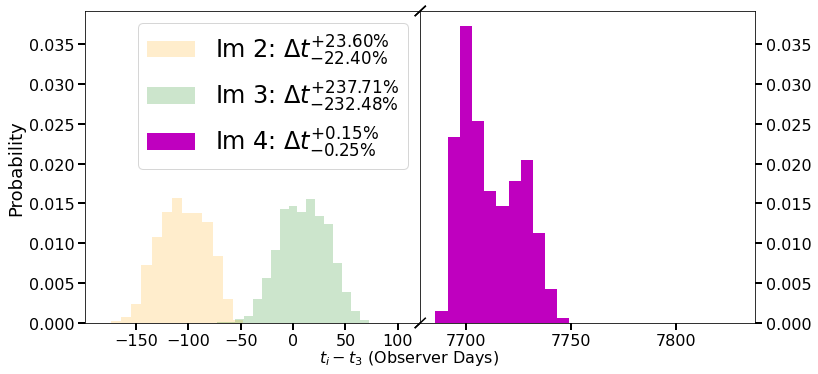

In [13]:
bestMod_cfit=pickle.load(open('lc_modelH_color_constraint.pkl','rb'))
quantile_dict={}
for q in [2.5,16,50,84,97.5]:
    t0, t1,t2,c,M_B = [weighted_quantile(bestMod_cfit.samples[:,i], q/100, 
                                     sample_weight=bestMod_cfit.weights)\
                   for i in range(5)]
    quantile_dict['t0_%s'%str(q)]=t0
    quantile_dict['t1_%s'%str(q)]=t1
    quantile_dict['t2_%s'%str(q)]=t2
    quantile_dict['c_%s'%str(q)]=c
    quantile_dict['M_B_%s'%str(q)]=M_B
#fig,gs=plot_util.grid_plot(4,8,figsize=(12,12))
fig=plt.figure(figsize=(12,12))
gs = gridspec.GridSpec(4,8)

ax=fig.add_subplot(gs[-2:,:4])
ax2=fig.add_subplot(gs[-2:,4:],sharey=ax)
#fig,axes=plt.subplots(nrows=1,ncols=2,sharey=True)
#ax=axes[0]
#ax2=axes[1]
temp_lens=models[models['MODEL']==best_model]
#func=scipy.interpolate.interp1d(bestMod_cfit.samples[:,2],bestMod_cfit.weights)
colors=['b','orange','g']
for i in [1,2]:
    quants=weighted_quantile(bestMod_cfit.samples[:,i]-bestMod_cfit.samples[:,0],
                            [.16,.5,.84],sample_weight=bestMod_cfit.weights)
    print(quants[0]-quants[1],quants[1],quants[2]-quants[1])
    ax=plot_util.plot('hist',bestMod_cfit.samples[:,i]-bestMod_cfit.samples[:,0],
                      weights=bestMod_cfit.weights,ax=ax,y_lab='Probability',
                     density=True,bins=25,color=colors[i],#ticklabelsize=ticksize,
                    label=r'Im %i: '%(i+1)+'$\Delta t^{+%.2f'%(100*abs((quants[2]-quants[1])/quants[1]))+'\%}'+\
                      '_{-%.2f'%(100*abs((quants[1]-quants[0])/quants[1]))+'\%}$',
                     alpha=.2)
                                      

im4delay=temp_lens['TDELAY'][temp_lens['image']=='SN.4']+\
        (quantile_dict['t0_50']-quantile_dict['t2_50'])

ax2=plot_util.plot('hist',bestMod_cfit.samples[:,1]+np.random.uniform(im4delay-3,im4delay+3,#ticklabelsize=ticksize,
                                                                      size=len(bestMod_cfit.weights)),
    weights=bestMod_cfit.weights,ax=ax2,
                     density=True,bins=25,color='m')
quants=weighted_quantile(np.random.normal(im4delay,3,size=len(bestMod_cfit.weights))-\
                         bestMod_cfit.samples[:,1],
                            [.16,.5,.84],sample_weight=bestMod_cfit.weights)
ax.hist([],color='m',label=r'Im 4: $\Delta t^{+%.2f'%(100*abs((quants[2]-quants[1])/im4delay))+'\%}'+\
                      '_{-%.2f'%(100*abs((quants[1]-quants[0])/im4delay))+'\%}$')

ax2.yaxis.tick_right()
ax2.tick_params(labelsize=16)

handles1, labels1 = ax.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()


d = .015 # how big to make the diagonal lines in axes coordinates
# arguments to pass plot, just so we don't keep repeating them
kwargs = dict(transform=ax.transAxes, color='k', clip_on=False)
ax.plot((1-d,1+d), (-d,+d), **kwargs)
ax.plot((1-d,1+d),(1-d,1+d), **kwargs)
ax.legend(fontsize=legend_fontsize)
fig.subplots_adjust(wspace=0)

kwargs.update(transform=ax2.transAxes)  # switch to the bottom axes
ax2.plot((-d,+d), (1-d,1+d), **kwargs)
ax2.plot((-d,+d), (-d,+d), **kwargs)
fig.text(0.5, 0.08, '$t_i-t_3$ (Observer Days)', ha='center',fontsize=16)
plt.savefig('time_delays.pdf',format='pdf',overwrite=True)
plt.show()

-2.0079373688040363 -31.506774165950603 2.226804073889326
-8.993078506900616 137.4022871998767 7.486492706072795
-11.321231443795057 159.26551314516843 10.320254450408612


<ipython-input-14-2e8948429090>:68: MatplotlibDeprecationWarning: savefig() got unexpected keyword argument "overwrite" which is no longer supported as of 3.3 and will become an error two minor releases later
  plt.savefig('time_delays_bright.pdf',format='pdf',overwrite=True)


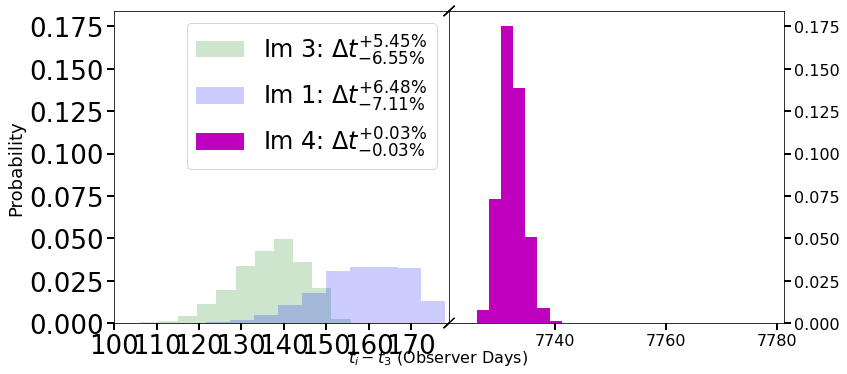

In [14]:
bestMod_cfit=pickle.load(open('lc_modelE_color_constraint_bright.pkl','rb'))
quantile_dict={}
for q in [2.5,16,50,84,97.5]:
    t0, t1,t2,c,M_B = [weighted_quantile(bestMod_cfit.samples[:,i], q/100, 
                                     sample_weight=bestMod_cfit.weights)\
                   for i in range(5)]
    
    quantile_dict['t0_%s'%str(q)]=t0
    quantile_dict['t1_%s'%str(q)]=t1
    quantile_dict['t2_%s'%str(q)]=t2
    quantile_dict['c_%s'%str(q)]=c
    quantile_dict['M_B_%s'%str(q)]=M_B
im2=weighted_quantile(bestMod_cfit.samples[:,1],
                            [.16,.5,.84],sample_weight=bestMod_cfit.weights)
print(im2[0]-im2[1],im2[1],im2[2]-im2[1])
#fig,gs=plot_util.grid_plot(4,8,figsize=(12,12))
fig=plt.figure(figsize=(12,12))
gs = gridspec.GridSpec(4,8)
ax=fig.add_subplot(gs[-2:,:4])
ax2=fig.add_subplot(gs[-2:,4:],sharey=ax)
#fig,axes=plt.subplots(nrows=1,ncols=2,sharey=True)
#ax=axes[0]
#ax2=axes[1]
temp_lens=models[models['MODEL']==best_model]
#func=scipy.interpolate.interp1d(bestMod_cfit.samples[:,2],bestMod_cfit.weights)
colors=['b','orange','g']
for i in [2,0]:
    quants=weighted_quantile(bestMod_cfit.samples[:,i]-bestMod_cfit.samples[:,1],
                            [.16,.5,.84],sample_weight=bestMod_cfit.weights)
    print(quants[0]-quants[1],quants[1],quants[2]-quants[1])
    ax=plot_util.plot('hist',bestMod_cfit.samples[:,i]-bestMod_cfit.samples[:,1],
                      weights=bestMod_cfit.weights,ax=ax,y_lab='Probability',
                     density=True,bins=25,color=colors[i],ticklabelsize=ticksize,
                    label=r'Im %i: '%(i+1)+'$\Delta t^{+%.2f'%(100*abs((quants[2]-quants[1])/quants[1]))+'\%}'+\
                      '_{-%.2f'%(100*abs((quants[1]-quants[0])/quants[1]))+'\%}$',
                     alpha=.2)
                                      

im4delay=temp_lens['TDELAY'][temp_lens['image']=='SN.4']+\
        (quantile_dict['t0_50']-quantile_dict['t2_50'])

ax2=plot_util.plot('hist',bestMod_cfit.samples[:,1]+im4delay,weights=bestMod_cfit.weights,ax=ax2,ticklabelsize=ticksize,
                     density=True,bins=25,color='m')
quants=weighted_quantile(bestMod_cfit.samples[:,1],
                            [.16,.5,.84],sample_weight=bestMod_cfit.weights)
ax.hist([],color='m',label=r'Im 4: $\Delta t^{+%.2f'%(100*abs((quants[2]-quants[1])/im4delay))+'\%}'+\
                      '_{-%.2f'%(100*abs((quants[1]-quants[0])/im4delay))+'\%}$')

ax2.yaxis.tick_right()
ax2.tick_params(labelsize=16)

handles1, labels1 = ax.get_legend_handles_labels()
handles2, labels2 = ax2.get_legend_handles_labels()


d = .015 # how big to make the diagonal lines in axes coordinates
# arguments to pass plot, just so we don't keep repeating them
kwargs = dict(transform=ax.transAxes, color='k', clip_on=False)
ax.plot((1-d,1+d), (-d,+d), **kwargs)
ax.plot((1-d,1+d),(1-d,1+d), **kwargs)
ax.legend(fontsize=legend_fontsize)
ax.set_xlim((100,179))
kwargs.update(transform=ax2.transAxes)  # switch to the bottom axes
ax2.plot((-d,+d), (1-d,1+d), **kwargs)
ax2.plot((-d,+d), (-d,+d), **kwargs)
fig.text(0.5, 0.08, '$t_i-t_3$ (Observer Days)', ha='center',fontsize=16)
fig.subplots_adjust(wspace=0)
plt.savefig('time_delays_bright.pdf',format='pdf',overwrite=True)
plt.show()

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

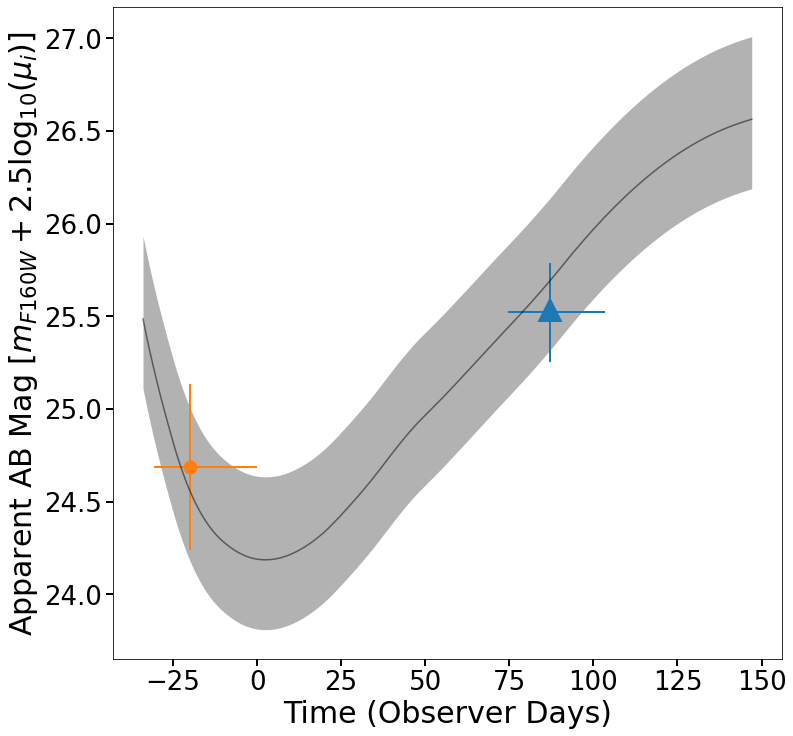

In [15]:

bestMod_cfit=pickle.load(open('lc_modelH_color_constraint.pkl','rb'))

#switch images 1 and 3--combined
# temp_samples=copy.deepcopy(bestMod_cfit.samples)
# temp_samples[:,0]=copy.deepcopy(bestMod_cfit.samples[:,2])
# temp_samples[:,2]=copy.deepcopy(bestMod_cfit.samples[:,0])
# bestMod_cfit.samples=temp_samples
quantile_dict={}
for q in [2.5,16,50,84,97.5]:
    t0, t1,t2,c,M_B = [weighted_quantile(bestMod_cfit.samples[:,i], q/100, 
                                     sample_weight=bestMod_cfit.weights)\
                   for i in range(5)]
    quantile_dict['t0_%s'%str(q)]=t0
    quantile_dict['t1_%s'%str(q)]=t1
    quantile_dict['t2_%s'%str(q)]=t2
    quantile_dict['c_%s'%str(q)]=c
    quantile_dict['M_B_%s'%str(q)]=M_B

band='F160W'
dust = sncosmo.CCM89Dust()
model=sncosmo.Model('salt2-extended',effects=[dust],
                       effect_names=['mw'],
                       effect_frames=['obs'])
model.set(**{'z':1.9459,'mwebv':.014,'t0':0,'x1':0})

best_model='H'

quants=quantile_dict
plot_time=np.arange(model.mintime()+25,model.maxtime(),1)


for q in ['16','50','84']:
    model.set(c=quants['c_'+q])
    model.set_source_peakabsmag(quants['M_B_'+q],'bessellb','ab')
    if q=='50':
        ax=plot_util.plot('plot',plot_time,
            -2.5*np.log10(model.bandflux(band,plot_time,zp=zp,zpsys='ab'))+zp,
                          fontsize=axis_fontsize,x_lab='Time (Observer Days)',
            y_lab=r'Apparent AB Mag [$m_{'+band+'}+2.5\log_{10}(\mu_i)$]',ticklabelsize=ticksize,
                         color='k',alpha=.5)
    elif q=='16':
        min_cols=-2.5*np.log10(model.bandflux(band,plot_time,zp=zp,zpsys='ab'))+zp
    else:
        max_cols=-2.5*np.log10(model.bandflux(band,plot_time,zp=zp,zpsys='ab'))+zp
ax.fill_between(plot_time,min_cols,max_cols,color='k',alpha=.3,linewidth=0,
        label='SALT2 68%'+' CI ($x_1=0,c=%.2f^{+%.2f}_{-%.2f},M_B=%.2f^{+%.2f}_{-%.2f}$)'%\
                     (quants['c_50'],quants['c_84']-quants['c_50'],
                            quants['c_50']-quants['c_16'],
                            quants['M_B_50'],
                            quants['M_B_84']-quants['M_B_50'],
                            quants['M_B_50']-quants['M_B_16']))
i=0
points=['^','.','s']
for im in [im0,im1,im2]:
    temp_lens=models[models['MODEL']==best_model]
    mu=temp_lens['MU'][np.where(temp_lens['image']=='SN.'+str(im['id'][0]+1))[0][0]]
    muerr=1.0857*temp_lens['ERR_MU'][temp_lens['image']=='SN.'+str(im['id'][0]+1)]/mu
    b_ind=np.where(im['band']==band.lower())[0][0]
    magerr=1.0857*im['fluxerr'][b_ind]/im['flux'][b_ind]
    mag_err2=np.sqrt(magerr**2+muerr**2)
    mod_mag=-2.5*np.log10(im['flux'][b_ind])+zp+2.5*np.log10(mu)

    #if i==2:
    #    quants=dim_quantile_dict
    most_likely=bestMod_cfit.samples[bestMod_cfit.weights.argmax(),i]
    ax.errorbar(quants['t%i_50'%i],mod_mag,xerr=[[quants['t%i_50'%i]-quants['t%i_16'%i]],
                                                 [quants['t%i_84'%i]-quants['t%i_50'%i]]],
                                                yerr=mag_err2,fmt=points[i],
                    label='Image %i'%(i+1),markersize=12,elinewidth=2,
                    markeredgewidth=8)
#     ax.errorbar(most_likely,mod_mag,xerr=[[quants['t%i_50'%i]-quants['t%i_16'%i]],
#                                                  [quants['t%i_84'%i]-quants['t%i_50'%i]]],
#                                                 yerr=mag_err2,fmt=points[i],
#                     label='Image %i'%(i+1),markersize=12,elinewidth=2,
#                     markeredgewidth=8)

    i+=1
ax.set_xlim((plot_time[0],plot_time[-1]))
ax_main_top=ax.twiny()
ax_main_top.tick_params(direction='in',pad=-22)
ax_main_top.tick_params(labelsize=16)
ax_main_top.set_xlabel('Age (Rest Frame Days)',fontsize=axis_fontsize-6,labelpad=-42)
xlims=ax.get_xlim()
ax_main_top.set_xlim((xlims[0]/2.95,xlims[1]/2.95))
ax.invert_yaxis()
ax.legend(loc='lower left',fontsize=legend_fontsize-6)
plt.savefig('full_lightcurve.pdf',format='pdf',overwrite=True)
plt.show()

In [4]:
#full color curve
bestMod_cfit=pickle.load(open('lc_modelH_color_constraint.pkl','rb'))
#bestMod_cfit=pickle.load(open('colorcurve_constraint.pkl','rb'))

#switch images 1 and 3--combined
#temp_samples=copy.deepcopy(bestMod_cfit.samples)
#temp_samples[:,0]=copy.deepcopy(bestMod_cfit.samples[:,2])
#temp_samples[:,2]=copy.deepcopy(bestMod_cfit.samples[:,0])
#bestMod_cfit.samples=temp_samples

quantile_dict={}
for q in [2.5,16,50,84,97.5]:
    t0, t1,t2,c,M_B = [weighted_quantile(bestMod_cfit.samples[:,i], q/100, 
                                     sample_weight=bestMod_cfit.weights)\
                   for i in range(5)]
    quantile_dict['t0_%s'%str(q)]=t0
    quantile_dict['t1_%s'%str(q)]=t1
    quantile_dict['t2_%s'%str(q)]=t2
    quantile_dict['c_%s'%str(q)]=c
    quantile_dict['M_B_%s'%str(q)]=M_B
band='F160W'
dust = sncosmo.CCM89Dust()
model=sncosmo.Model('salt2-extended',effects=[dust],
                       effect_names=['mw'],
                       effect_frames=['obs'])
model.set(**{'z':1.9459,'mwebv':.014,'t0':0,'x1':0})

best_model='H'
for sample in ['total']:
    if sample=='bright':
        inds=bright
        quants=bright_quantile_dict
        plot_time=np.arange(model.mintime()+20,model.maxtime(),1)
    elif sample=='dim':
        inds=dim
        quants=dim_quantile_dict
        plot_time=np.arange(model.mintime()+20,model.maxtime()-50,1)
    else:
        quants=quantile_dict
        plot_time=np.arange(model.mintime()+20,model.maxtime(),1)
        
    for q in ['16','50','84']:
        model.set(c=quants['c_'+q])
        if q=='50':
            ax=plot_util.plot('plot',plot_time,
                model.color('F105W','F160W','ab',plot_time),fontsize=axis_fontsize,
                              x_lab='Time (Observer Days)',
                y_lab='F105W-F160W',ticklabelsize=ticksize,
                             color='k',alpha=.5)
        elif q=='16':
            min_cols=model.color('F105W','F160W','ab',plot_time)
        else:
            max_cols=model.color('F105W','F160W','ab',plot_time)
    ax.fill_between(plot_time,min_cols,max_cols,color='k',alpha=.3,linewidth=0,
            label='SALT2 68%'+' CI ($x_1=0,c=%.2f^{+%.2f}_{-%.2f}$'%\
                         (quants['c_50'],quants['c_84']-quants['c_50'],
                                quants['c_50']-quants['c_16']))
    i=0
    points=['^','.','s']
    for im in [im0,im1,im2]:
        temp_color=im['mag'][np.where(im['band']=='f105w')[0][0]]-\
                     im['mag'][np.where(im['band']=='f160w')[0][0]]
        temp_col_err=np.sqrt(np.sum(im['magerr']**2))
    
        #if i==2:
        #    quants=dim_quantile_dict
        most_likely=bestMod_cfit.samples[bestMod_cfit.weights.argmax(),i]
        ax.errorbar(quants['t%i_50'%i],temp_color,xerr=[[quants['t%i_50'%i]-quants['t%i_16'%i]],
                                                     [quants['t%i_84'%i]-quants['t%i_50'%i]]],
                                                    yerr=temp_col_err,fmt=points[i],
                        label='Image %i'%(i+1),markersize=12,elinewidth=2,
                        markeredgewidth=8)
#         ax.errorbar(most_likely,temp_color,xerr=[[quants['t%i_50'%i]-quants['t%i_16'%i]],
#                                                      [quants['t%i_84'%i]-quants['t%i_50'%i]]],
#                                                     yerr=temp_col_err,fmt=points[i],
#                         label='Image %i'%(i+1),markersize=12,elinewidth=2,
#                         markeredgewidth=8)
        
        i+=1
    ax.set_xlim((plot_time[0],plot_time[-1]))
    ax.invert_yaxis()
    ax_main_top=ax.twiny()
    ax_main_top.tick_params(direction='in',pad=-22)
    ax_main_top.tick_params(labelsize=16)
    ax_main_top.set_xlabel('Age (Rest Frame Days)',fontsize=axis_fontsize-6,labelpad=-42)
    xlims=ax.get_xlim()
    ax_main_top.set_xlim((xlims[0]/2.95,xlims[1]/2.95))
    ax.set_xlim(xlims)
    ax.legend(loc='lower left',fontsize=legend_fontsize-6)
    plt.savefig('full_colorcurve_%s.pdf'%sample,format='pdf',overwrite=True)
    plt.show()

NameError: name 'axis_fontsize' is not defined